In [7]:

import scipy.spatial
from sklearn import manifold
from sklearn.decomposition import PCA,KernelPCA

import numpy as np

import os

from itertools import permutations
from matplotlib import pyplot as plt
from matplotlib.pyplot import triplot
from numpy import pi,sin,cos,tan,sqrt
from IPython.core.debugger import Tracer

import triangle as tri
import triangle
import triangle.plot as plot


from scipy.spatial import ConvexHull
from matplotlib.path import Path

import pickle



import torch
import torch.optim as optim

import torch.nn as nn
from torch.nn import init
from torch.autograd import Variable
import torch.nn.functional as F



from Triangulation import get_extrapoints_target_length
from Triangulation import *

%matplotlib inline



In [8]:
def BCE_accuracy(model,variable,labels):
    net.eval()
    predictions=model(variable).data.numpy()
    predictions[np.where(predictions>0.5)]=1
    predictions[np.where(predictions<=0.5)]=0
    diff=labels-predictions
    correct_prediction=0
    for i in diff:
        if (not i.any()):
            correct_prediction+=1
    net.train()
    return  100*correct_prediction/variable.size()[0],diff




def connectivity_information(triangulation,print_info=False):
    
    segments= tuple(triangulation['segments'].tolist())
    triangles=tuple(triangulation['triangles'].tolist())
    vertices=triangulation['vertices']   
    
    connect_info={str(r):[0 for i in range(len(vertices))] for r in tuple(triangulation['segments'].tolist())}
    for segment in segments:
        for triangle in triangles:
            if set(segment).issubset(set(triangle)):
                connection=set(triangle)-set(segment)
                if print_info: print("segment:",segment,"is connected to:",connection,"to form triangle:",triangle)
                connect_info[str(segment)][tuple(connection)[0]]=1    
    return connect_info



def get_labels(triangulation,connect_info):
    indices=[]
    vertices=list(range(triangulation['vertices'].shape[0]))
    for i in triangulation['segments']:
           indices.append(set(vertices)-set(i)) 
    labels=[]
    list_values=list(connect_info.values())
    for i in range(len(list_values)):
        for j in indices[i]:
            labels.append(list_values[i][j])
    return  labels


In [9]:

def rot(theta):
    return np.array([[cos(theta),-sin(theta)],     
                     [sin(theta),cos(theta)]])






def get_reference_polygon(nb_of_points,plot=False):
    angles=np.empty(nb_of_points)
    points=np.empty([nb_of_points,2])
    plot_coords=np.empty([nb_of_points,2])
    indices=[]
    angle_division=2*pi/nb_of_points
   
    for i in range(nb_of_points):
        angle=i*angle_division
        angles[i]=angle
        point=np.array([1,0]) #pick edge length of 1
        points[i]=np.dot(rot(angle),point.T)  #rotate it according to the  chosen angle
        indices.append(i)
   
    if plot==True:
        plot_coords=np.vstack([points,points[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index]))
    
    return points



def generate_contour(nb_of_points,plot=False):
    
    angles=np.empty(nb_of_points)
    points=np.empty([nb_of_points,2])
    plot_coords=np.empty([nb_of_points,2])
    indices=[]
    angle_division=2*pi/nb_of_points
   
    for i in range(nb_of_points):
        angle=((i+1)*angle_division-i*angle_division)*np.random.random_sample()+i*angle_division
        angles[i]=angle
        point=np.array([np.random.uniform(0.3,1),0]) #pick random point at (1,0)
       #point=np.array([1,0]) #pick edge length of 1

        points[i]=np.dot(rot(angle),point.T)  #rotate it according to the  chosen angle
        indices.append(i)
   
    if plot==True:
        plot_coords=np.vstack([points,points[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index],'r'))
    
    return points



def apply_procrustes(polygon_points,plot=False):  
    
    # Get reference polygona and adjust any random poygon to that
    ref_polygon=get_reference_polygon(polygon_points.shape[0])
    
    
    #Mean of each coordinate
    mu_polygon = polygon_points.mean(0)
    mu_ref_polygon = ref_polygon.mean(0)
    
    #Centralize data to the mean 
    centralised_ref_polygon_points = ref_polygon-mu_ref_polygon
    centralised_polygon_points = polygon_points-mu_polygon
    
    #Squared sum of X-mean(X)
    ss_ref_polygon_points = (centralised_ref_polygon_points**2.).sum()
    ss_polygon_points = (centralised_polygon_points**2.).sum()

       
    #Frobenius norm of X
    norm_ss_ref_polygon_points = np.sqrt(ss_ref_polygon_points)
    norm_ss_polygon_points = np.sqrt(ss_polygon_points)

    
    # scale to equal (unit) norm
    centralised_ref_polygon_points /=norm_ss_ref_polygon_points     
    centralised_polygon_points /=norm_ss_polygon_points
        
    
    #Finding best rotation to superimpose on regular triangle
    #Applying SVD to the  matrix 
    A = np.dot(centralised_ref_polygon_points.T, centralised_polygon_points)
    U,s,Vt = np.linalg.svd(A,full_matrices=False)
    V=Vt.T
    R = np.dot(V,U.T)
    
  
    traceTA = s.sum()
    d = 1 - traceTA**2
    b = traceTA * norm_ss_ref_polygon_points / norm_ss_polygon_points    
    indices=[i for i in range(polygon_points.shape[0])]
    
   

    polygon_transformed =norm_ss_ref_polygon_points*traceTA*np.dot(centralised_polygon_points,R)+mu_ref_polygon

    if plot==True:
        plot_coords=np.vstack([polygon_transformed,polygon_transformed[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index]))
    
    return polygon_transformed
        
    

In [10]:

def contains_points(triangle,polygon):
    hull=ConvexHull(triangle)
    hull_path=Path(triangle[hull.vertices])
    set_polygon=set(tuple(i) for i in polygon)
    set_triangle=set(tuple(i) for i in triangle)
    #print(set_polygon,set_triangle)
    difference=set_polygon-set_triangle
    
    if len(difference)==0:
        return False

    for i in difference:
        if hull_path.contains_point(i):
            return True
            break
    return False




def compute_edge_lengths(pt1,pt2):
    return np.linalg.norm(pt1-pt2)

def compute_edge_lengths2(triangle):
    edgelengths2=np.empty([2,3])
    for i in range(2):
        for j in range(i+1,3):
            eij=triangle[j]-triangle[i]
            edgelengths2[i][j]=np.dot(eij,eij)
    return edgelengths2
    


def compute_triangle_normals(triangle):
   
    e01=triangle[1]-triangle[0]
    e02=triangle[2]-triangle[0]
    
    e01_cross_e02=np.cross(e01,e02)
    
    return e01_cross_e02


def compute_triangle_area(triangle):
   
    e01=triangle[1]-triangle[0]
    e02=triangle[2]-triangle[0]
    
    e01_cross_e02=np.cross(e01,e02)
    
    # Omit triangles that are inverted (out of the domain)
    if e01_cross_e02<0:
        return 0
        
    
    e01_cross_e02_norm=np.linalg.norm(e01_cross_e02)

        
    return e01_cross_e02_norm/2

def compute_triangle_quality(triangle,polygon=None):
    
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    factor=4/sqrt(3)
    area=compute_triangle_area(triangle)
   
    if area==0:
        return 0
    
    if contains_points(triangle,polygon):
        return 0
    
    
    
    #edgelengths=np.empty([triangle.shape[0],1])
    
    #for i,_ in enumerate(triangle):
     #   edgelengths[i]=compute_edge_length(triangle[i],triangle[(i+1)%3])
    
    #sum_edge_lengths=edgelengths.sum() 
    #factor=4/sqrt(3)*3/sum_edge_lengths
    
    sum_edge_lengths=0
    edge_length2=compute_edge_lengths2(triangle)
    for i in range(2):
        for j in range(i+1,3):
            sum_edge_lengths+=edge_length2[i][j]
    
    
    
    lrms=sqrt(sum_edge_lengths/3)
    lrms2=lrms**2
    quality=area/lrms2
    
    return quality*factor



def compute_qualities_triangle(triangle,polygon=None):
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    area=compute_triangle_area(triangle)
   
    if area==0:
        return [0,0]
    
    if contains_points(triangle,polygon):
        return [0,0]
    
    triangles_in_mesh=[]
    triangles_in_mesh.append(triangle)
    contour_connectivity=get_contour_edges(polygon)
    contour_connectivity=np.vstack([contour_connectivity,[p0,p2],[p1,p2]])
    hole=np.array([(triangle.sum(0))/3])
    shape=dict(holes=hole,vertices=polygon,segments=contour_connectivity)
    t = tri.triangulate(shape, 'pq0')
    
    Invalid_triangulation=False

    try:   
        for triangle_index in t['triangles']:
            triangles_in_mesh.append(polygon[np.asarray([triangle_index])])
    except :
        print("Invalid triangulation",p0,p1,p2)
        Invalid_triangulation=True
        
    triangle_qualities=[]
    for triangle in triangles_in_mesh:
        triangle.resize(3,2)
        triangle_quality=compute_triangle_quality(triangle)
        triangle_qualities.append(triangle_quality)
    
    if Invalid_triangulation:
        mean_quality,minimum_quality=0,0
    else:
        triangle_qualities=np.array(triangle_qualities)
        mean_quality=triangle_qualities.mean()
        minimum_quality=triangle_qualities.min()

    
    return [minimum_quality,mean_quality]


def compute_minimum_quality_triangle(triangle,polygon=None,get_mean=False):
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    area=compute_triangle_area(triangle)
   
    if area==0:
        return 0
    
    if contains_points(triangle,polygon):
        return 0
    
    triangles_in_mesh=[]
    triangles_in_mesh.append(triangle)
    contour_connectivity=get_contour_edges(polygon)
    contour_connectivity=np.vstack([contour_connectivity,[p0,p2],[p1,p2]])
    hole=np.array([(triangle.sum(0))/3])
    shape=dict(holes=hole,vertices=polygon,segments=contour_connectivity)
    t = tri.triangulate(shape, 'pq0')
    
    Invalid_triangulation=False

    try:   
        for triangle_index in t['triangles']:
            triangles_in_mesh.append(polygon[np.asarray([triangle_index])])
    except :
        print("Invalid triangulation",p0,p1,p2)
        Invalid_triangulation=True
        
    triangle_qualities=[]
    for triangle in triangles_in_mesh:
        triangle.resize(3,2)
        triangle_quality=compute_triangle_quality(triangle)
        triangle_qualities.append(triangle_quality)
    
    if Invalid_triangulation:
        mean_quality,minimum_quality=0,0
    else:
        triangle_qualities=np.array(triangle_qualities)
        mean_quality=triangle_qualities.mean()
        minimum_quality=triangle_qualities.min()

    

    
    if get_mean:
            return mean_quality
    else:
            return minimum_quality

# Quality of elements formed by connecting each edge with one of the other points of the contour

def quality_matrices(polygon,normalize=False):
    polygon=apply_procrustes(polygon,False)

    contour_connectivity=np.array(list(tuple(i) for i in get_contour_edges(polygon)))
    
    
    
    
    min_quality_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])
    mean_quality_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])

    area_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])
    normals_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])

    list_of_triangles=[]
    
    for index,edge in enumerate(contour_connectivity):
        # Not omitting non triangles because either way their quality is zero
        triangles_to_edge_indices=[[*edge,i] for i in range(polygon.shape[0]) ]
        
        

        #print(triangles_to_edge_indices)
        triangles_to_edge_indices=np.asarray(triangles_to_edge_indices)
        triangles=polygon[triangles_to_edge_indices]
        list_of_triangles.append(triangles)
        
    
    list_of_triangles=np.array(list_of_triangles)
    
    for i,triangles in enumerate(list_of_triangles):
        for j,triangle in enumerate(triangles):
            qualities=compute_qualities_triangle(triangle,polygon)
            min_quality_matrix[int(i),int(j)]=qualities[0]
            mean_quality_matrix[int(i),int(j)]=qualities[1]
                
   
            #area_matrix[i,j]=compute_triangle_area(triangle)
            #normals_matrix[i,j]=compute_triangle_normals(triangle)

            
    
    #sum_of_qualities=quality_matrix.sum(1)

    if normalize is True:
        for i,_ in enumerate(quality_matrix):
            quality_matrix[i]/=sum_of_qualities[i]
    
    return min_quality_matrix,mean_quality_matrix




    
    
    

In [11]:
def check_edge_validity(edge,polygon,set_edges,interior_edges):        
    # Check if new edges are already in the set
    found_in_set=False
    found_in_interior_set=False
    for index in range(len(polygon)):
        occuring_index=index

        edge1,edge2=tuple(permutations((edge[0],index))),tuple(permutations((edge[1],index)))
        condition1= edge1[0] in set_edges or edge1[1] in set_edges
        condition2= edge2[0] in set_edges or edge2[1] in set_edges
        condition3= edge1[0] in interior_edges or edge1[1] in interior_edges
        condition4= edge2[0] in interior_edges or edge2[1] in interior_edges
    
        
            # both edges are found in the list of set of edges (Invalid)
        if (condition1 and condition2): 
            found_in_set=True
            occuring_index=index
            
        
        # both edges are found in the list of interior edges created
        if (condition3 and condition4):
            found_in_interior_set=True
            occuring_index=index
            
        if found_in_interior_set or found_in_set:
            break
    return found_in_interior_set,found_in_set,occuring_index

def triangulate(polygon,ordered_quality_matrix,recursive=True):
    set_edges=set(tuple(i) for i in get_contour_edges(polygon))
    interior_edges=set()
    set_elements=set()
    set_locked_vertices=set()
    set_forbidden_intersections=set()
    polygon_angles=get_polygon_angles(polygon)

    print("initial set edges:", set_edges)
    


    for edge in ordered_quality_matrix.keys():
        
        found_in_interior_set,found_in_set,index=check_edge_validity(edge,polygon,set_edges,interior_edges)
        
        for qualities_with_edges in ordered_quality_matrix[edge][0]:
            
            element_created=False
           
            target_vtx=qualities_with_edges[1]
            
            if target_vtx==edge[0] or target_vtx==edge[1]:
                continue
           
            print("Edge:",edge,"targeting:",target_vtx)
        
            if found_in_interior_set:
                element=(edge[0],edge[1],index)  
                set_elements.add(element)
                print("Element inserted:",element)
                continue
        
            if found_in_set and not found_in_interior_set:    
                if(index != target_vtx):
                    print('found',(edge[0],index),(edge[1],index),"Canceling creation")
                    continue        
        
        
        
        
            # Passed edges checking 
            # Proceed to check vertices
            temp_element=(edge[0],edge[1],target_vtx)
            
            # Cehcking element normals to avoid inverted elements
            element_indices=np.asarray([edge[0],edge[1],target_vtx])
            if compute_triangle_normals(polygon[element_indices])<0:
                continue
            
            # Checking if the element contains other points of the polygon inside
            if contains_points(polygon[element_indices],polygon):
                continue
            
                            
            p0,p1,p2=edge[0],edge[1],target_vtx
    
            neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
            # Checking if edges of connected poiints form an angle bigger than the polygon angles
            if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
            or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
            #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
                 continue
    
    
            if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
            or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
            ):
                continue
    
            if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
            or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
            #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
                continue
            quality=compute_minimum_quality_triangle(polygon[element_indices],polygon)
            if quality==0 or quality<1e-2:
                continue
            
            print(temp_element)
            existing_element=False
            for temp_element_permutation in tuple(permutations(temp_element)):
                if temp_element_permutation in set_elements:
                    print("Element {} already in set".format(element))
                    existing_element=True
                    break
            if existing_element:
                break
            
            
            
            if target_vtx in set_locked_vertices:
                print(" Target vertex {} is locked".format(target_vtx))
                continue
            set_elements.add(temp_element)

        
    
            # Check if a locked vertex was created after the creation of the element
            # If so, add it to the list
            #Tracer()()
            Found_locked_vertex=False
            for vertex in temp_element:
                _ ,isclosed = is_closed_ring(vertex,set_elements,*connection_indices(vertex,get_contour_edges(polygon)))
                if isclosed and vertex not in set_locked_vertices:
                    print("Vertex locked:",vertex)
                    Found_locked_vertex=True
                    set_locked_vertices.add(vertex)
            set_elements.remove(temp_element)
            
        
        
            # Locking the vertices and checking if the connection is with a locked vertex has been checked/
            # Proceeding to check if both internal edges intersect with other internal edges
            internal_edge1=(edge[0],target_vtx)
            internal_edge2=(edge[1],target_vtx)
            set_a,set_b=get_intermediate_indices(target_vtx,polygon,edge[0],edge[1])
        
            internal_condition1= internal_edge1 in set_forbidden_intersections or tuple(reversed(internal_edge1)) in set_forbidden_intersections
                                                                        
            internal_condition2=internal_edge2 in set_forbidden_intersections or tuple(reversed(internal_edge2)) in set_forbidden_intersections
                                                                            
    
                                                                                   
            internal_intersection=False
            if internal_condition1 or  internal_condition2:
                print("edges :",internal_edge1, "and",internal_edge2,"intersecting")
                print("Abandoning creation of element",temp_element)
                internal_intersection=True
        
     
            if internal_intersection:
                for vtx in temp_element:
                    if Found_locked_vertex and vtx in set_locked_vertices:
                        print("Unlocking vertex",vtx)
                        set_locked_vertices.remove(vtx)                    
                continue
        
        
        
            # Create the element
            element=temp_element
        
            # Add to set of edges all the forbidden intersections after the creation of the element
            
            for i in set_a:
                for j in set_b:
                    set_forbidden_intersections.add((i,j))
            #print("set of forbidden inter section edges updated:",set_forbidden_intersections)
    
                
        
        
        # New edges after creation of the element
   
            new_edge1=(edge[0],target_vtx)
            new_edge2=(edge[1],target_vtx)
        
            if new_edge1 not in set_edges and tuple(reversed(new_edge1)) not in set_edges:
                set_edges.add(new_edge1)
                interior_edges.add(new_edge1)
                print("edges inserted:",new_edge1)
                print("set of interior edges updated:",interior_edges)
                print("set of edges updated:",set_edges)
            if new_edge2 not in set_edges and tuple(reversed(new_edge2)) not in set_edges:    
                set_edges.add(new_edge2)
                interior_edges.add(new_edge2)
                print("edges inserted:",new_edge2)
                print("set of interior edges updated:",interior_edges)
                print("set of edges updated:",set_edges)
            
        
    
    
            # Checking list of elements to see whether the were created or were already there
            for element_permutation in tuple(permutations(element)):
                if element_permutation in set_elements:
                    print("Element {} already in set".format(element))
                    break
            else:
                set_elements.add(element)
                indices=np.asarray(element)
                print("element inserted:",element)
                element_created=True
                break
        if element_created:
            continue
        
        
            
    
    
    triangulated={'segment_markers': np.ones([polygon.shape[0]]), 'segments':np.array(get_contour_edges(polygon)), 'triangles': np.array(list( list(i) for i in set_elements)),
                  'vertex_markers': np.ones([polygon.shape[0]]), 'vertices': polygon}
    plot.plot(plt.axes(), **triangulated)
    print("Final edges:",set_edges)
    print("Elements created:",set_elements)
    print("Set of locked vertices:", set_locked_vertices)
    
    
    # find open vertices
    for element in set_elements:
        for vertex in  element:
                    _ ,isclosed = is_closed_ring(vertex,set_elements,*connection_indices(vertex,get_contour_edges(polygon)))
                    if isclosed and vertex not in set_locked_vertices:
                        print("Vertex locked:",vertex)
                        Found_locked_vertex=True
                        set_locked_vertices.add(vertex)
    set_open_vertices=set(range(len(polygon)))-set_locked_vertices
    print("Set of open vertices:", set_open_vertices)
    set_edges.clear(),set_locked_vertices.clear(),set_forbidden_intersections.clear
    if recursive:
        sub_polygon_list=check_for_sub_polygon(set_open_vertices,interior_edges,set_elements,polygon)

        for sub_polygon_indices in sub_polygon_list:
            if len(sub_polygon_indices)>=4:
                polygon_copy=polygon.copy()
                sub_polygon=np.array(polygon_copy[sub_polygon_indices])
                sub_quality,_=quality_matrix(sub_polygon,compute_minimum=True,normalize=False)
                sub_order_matrix=order_quality_matrix(sub_quality,sub_polygon)
                print(sub_quality,sub_order_matrix)
                triangulate(sub_polygon,sub_order_matrix)


    
    

    
def order_quality_matrix(_quality_matrix,_polygon):

    #  Create the quality matrix in accordance with the edges
    quality_board=[(q,index)  for qualities in _quality_matrix for index,q in enumerate(qualities)]
    quality_board=np.array(quality_board)
    #print("Quality board not resized:",quality_board)

    quality_board.resize(len(get_contour_edges(_polygon)),len(_polygon),2)
    quality_board=dict(zip(list(tuple(i) for i in get_contour_edges(_polygon)),quality_board))
    
    
    #sorted_quality_board={i[0]:i[1] for i in sorted(board.items(),key=lambda x: max(x[1]),reverse=True)}
    #print("Quality board")
    #for keys,items in quality_board.items():
    #    print(keys,items)
    edge_quality=quality_board[(0,1)]
    edge_quality=edge_quality[np.lexsort(np.fliplr(edge_quality).T)]




    for i in quality_board.keys():
        quality_board[i]=quality_board[i][np.lexsort(np.fliplr(quality_board[i]).T)]
        quality_board[i]=quality_board[i][::-1]
        quality_board[i][:,1]=quality_board[i][:,1].astype(int)
    
    edge=[]
    max_quality=[]
    listing=[]
    for keys,values in quality_board.items():
        listing.append([keys,max(values[:,0])])
    
    listing=np.array(listing)
    listing=listing[np.lexsort(np.transpose(listing)[::-3]).T]
    listing=listing[::-1]
    ordered_indices=listing[:,0]

    ordered_quality_matrix={}

    for i in ordered_indices:
        ordered_quality_matrix[i]=[tuple(zip(quality_board[i][:,0],quality_board[i][:,1].astype(int)))]
    
    return ordered_quality_matrix    
    
    
    

In [12]:
# Function to get the list of edges of a polygon
def get_contour_edges(polygon):
    contour_connectivity=np.array([[i,(i+1)%polygon.shape[0]] for i in range(polygon.shape[0])])
    return contour_connectivity



# Function to return indices that are connected to a vertex
def connection_indices(vertex,edges):   
    indices=[]
    for edge in edges:
        if vertex in edge:

            if edge[0] == vertex:
                indices.append(edge[1])
            else:
                indices.append(edge[0])

    return indices

# Function to calculate and angle:
def calculate_angle(p0,p1,p2):
    v0 = p1 - p0
    v1 = p2 - p0
    
    
    normal=compute_triangle_normals([p0,p1,p2])
    angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
    angle=abs(angle)
    #unit_v0=v0 / np.linalg.norm(v0)
    #unit_v1=v1 / np.linalg.norm(v1)
    #angle=np.arccos(np.clip(np.dot(unit_v0, unit_v1), -1.0, 1.0))
    
    return np.degrees(angle)



# Function to calculate the angles of a polygon
def get_polygon_angles(polygon):
    angles=[]
    for index,point in enumerate(polygon):
        p0=point        
        neighbor_points=connection_indices(index,get_contour_edges(polygon))
        #print("neighbor points",neighbor_points)
        indices=np.asarray(neighbor_points)
        p1,p2=polygon[indices]
        angle=calculate_angle(p0,p1,p2)
        if index !=0:
            triangle_normal=compute_triangle_normals([p0,p1,p2])
        else:
            triangle_normal=compute_triangle_normals([p1,p0,p2])

            
        if triangle_normal>0:
            angle=360-angle
        
        angles.append(angle)
    return angles
    



def is_closed_ring(vtx,set_of_elements,*adj_vtx):
    contour_edge1=(vtx,adj_vtx[0])
    contour_edge2=(vtx,adj_vtx[1])
    visited_elements=set_of_elements.copy()
    
    target_edge=contour_edge1
    
    edges_found=[]
    edges_found.append(contour_edge1)

    proceed=True
    
    while proceed:
        
        if not visited_elements:
            break
        
        remaining_edge,found_element=edge2elem(target_edge,visited_elements)
        
        if found_element is None:
            #print("stopped")
            proceed=False
            break
            
        visited_elements.remove(found_element)
        edges_found.append(remaining_edge)
        target_edge=remaining_edge
    
    
                
    #print(set(edges_found))
    found_contour_edge1,found_contour_edge2=False,False
    found_contour_edges=False

    # Checking if both contour edges area contained in the set of edges acquired
    
    for edge in edges_found:
        condition1= contour_edge1[0] in set(edge) and contour_edge1[1] in set((edge))
        condition2= contour_edge2[0] in set(edge) and contour_edge2[1] in set((edge))
        if condition1:
            #print("found ",contour_edge1)
            found_contour_edge1=True
        if condition2:
            #print("found",contour_edge2)
            found_contour_edge2=True
            
    if found_contour_edge1 and found_contour_edge2:
        found_contour_edges=True
        #print("found both of contour edges in set")
    
    visited_elements.clear()
    return edges_found,found_contour_edges
    
    
    
# Finds element containing the edge and exits (does not give the full list of elements)   
# Serve is_one_ring function
def edge2elem(edge,set_of_elements):
    found=False
    Found_element=()
    Remaining_edge=()
  
    for element in set_of_elements.copy():
        
        if edge[0] in  set(element) and edge[1] in element: 
            #print("Edge {} is part of element {}".format(edge,element))
            Found_element=element
            Remaining_index=set(element)-set(edge)
            Remaining_index=list(Remaining_index)
            Remaining_edge=(edge[0],Remaining_index[0])
            #print(" Remaining edge is {}".format(Remaining_edge))
            break 
        else:
            Found_element=None
            Remaining_edge=None
    return  Remaining_edge,Found_element 

# Departing from a target vertex connected with and edge get all intermediate  indices from one side and other
def get_intermediate_indices(target_vtx,polygon,*edge):
    
    set_1=set()
    set_2=set()
    
    
    contour_edges=get_contour_edges(polygon)
    
    
    # Depart from target vertex and get neighbor indices
    neighbors=connection_indices(target_vtx,contour_edges)
    found_vertex1,found_vertex2=neighbors[0],neighbors[1]
    #print("found vertices:",found_vertex1,found_vertex2)

    
    # Include them into seperate lists
    set_1.add(found_vertex1)
    set_2.add(found_vertex2)
    
    visited_vertex=target_vtx
      
    
    while found_vertex1!=edge[0] and found_vertex1!=edge[1]:
        visiting_vertex=found_vertex1
        neighbors=connection_indices(visiting_vertex,contour_edges)
        for index in neighbors:
            if index !=  visited_vertex:
                set_1.add(index)
                found_vertex1=index
                #print("Found vertex:",found_vertex1)     
        visited_vertex=visiting_vertex
        
    #print("Start  looking the other way")
    
    # Resetting to go the other way
    visited_vertex=target_vtx

    while found_vertex2!=edge[0] and found_vertex2!=edge[1]:
        visiting_vertex=found_vertex2
        neighbors=connection_indices(visiting_vertex,contour_edges)
        for index in neighbors:
            if index !=  visited_vertex:
                set_2.add(index)
                found_vertex2=index
                #print("Found vertex:",found_vertex2)     
        visited_vertex=visiting_vertex
    
                
                
                
  
    return set_1,set_2
                
            
        
    
    

In [13]:
def polygon_2_vtx(starting_vertex,edges_to_visit):
    from  more_itertools import unique_everseen
    
    if not edges_to_visit:
        return
    
    
    closed=False

                
    print("Edges to visit:",edges_to_visit)
    subpolygon=[]
    
                
    found_vertex=starting_vertex
    
    while not closed:
        for index,edge in enumerate(edges_to_visit.copy()):
            visiting_vertex=found_vertex
            
           
            #if visiting_vertex not in set(edge) and index==len(edges_to_visit.copy()):
               # Tracer()()
                #print("Not found in list of edges")
                #closed=True
                #break
            if visiting_vertex not in set(edge):
                continue
            subpolygon.append(visiting_vertex)
                
                                
            print("Visiting vertex",visiting_vertex)
            
            found_starting_vtx=False
            subpolygon.append(found_vertex)
            
            
            print(visiting_vertex," in ", edge)
                
                
            for index in set(edge):
                if visiting_vertex!= index:
                    found_vertex=index
                    print("Found vertex:",found_vertex)
                    subpolygon.append(found_vertex)
                    
                    
            print("Removing edge",edge)
            edges_to_visit.discard(edge)
            print(edges_to_visit)
            if found_vertex==starting_vertex:
                subpolygon=list(unique_everseen(subpolygon))
                print("Back to starting vertex")    
                closed=True
                break
                
    if  len(subpolygon)<=3:
        return 
    else:
        return subpolygon
     

                       

def check_for_sub_polygon(set_of_open_vertices,set_of_interior_edges,set_of_elements,polygon):

    
    
    if not set_of_open_vertices or  len(set_of_open_vertices)<3:
        return []
    

    sub_polygon_list=[]
    modified_interior_edge_set=set_of_interior_edges.copy()
    
 
    
    
    polygon_connectivity=[tuple(i) for i in get_contour_edges(polygon)]
    
    for edge in modified_interior_edge_set.copy():
        if edge[0] not in set_of_open_vertices or edge[1] not in set_of_open_vertices:
            modified_interior_edge_set.discard(edge)
   



    # Taking care of vertices that are locked but the element is not seen
    
    set_of_unfound_locked_vertices=set()
    continue_looking=True

    
    while continue_looking:
        
        if not set_of_open_vertices:
            continue_looking=False
            
        for vtx in set_of_open_vertices.copy():
                vtx1,vtx2 =connection_indices(vtx,get_contour_edges(polygon))
                found_edges1,isclosed1=is_closed_ring(vtx,set_of_elements,vtx2,vtx1)
                found_edges2,isclosed2=is_closed_ring(vtx,set_of_elements,vtx1,vtx2)
                print("Examining if vtx {} is locked".format(vtx))
                
                if isclosed1 or isclosed2:
                    print(vtx,"locked after all")
                    set_of_open_vertices.discard(vtx)
                    for edge in modified_interior_edge_set.copy():
                        if vtx in edge:
                            modified_interior_edge_set.discard(edge)
                    break
                
                for edge in found_edges1:
                    if edge in polygon_connectivity or edge[::-1] in polygon_connectivity:
                        found_edges1.remove(edge)
                for edge in found_edges2:
                    if edge in polygon_connectivity or edge[::-1] in polygon_connectivity:
                        found_edges2.remove(edge)
                between_edges=[]
                for edge in found_edges1:
                    for indices in edge:
                        if indices==vtx:
                            continue
                    between_edges.append(indices)
                for edge in found_edges2:
                    for indices in edge:
                        if indices==vtx:
                            continue
                    between_edges.append(indices)
                for edge in set_of_interior_edges.copy():
                    found_locked_vtx=False
                    if set(between_edges)==set(edge):
                        print(vtx,"locked after all")
                        found_locked_vtx=True
                        set_of_unfound_locked_vertices.add(vtx)
                        #Tracer()()
                        if edge in set_of_interior_edges or edge[::-1] in set_of_interior_edges:                 
                            #modified_interior_edge_set.discard(edge)
                            #print(edge,"removed")               
                            #modified_interior_edge_set.discard(edge[::-1])
                            modified_interior_edge_set.discard((vtx,between_edges[0]))
                            modified_interior_edge_set.discard((between_edges[0],vtx))
                        
    
                            modified_interior_edge_set.discard((vtx,between_edges[1]))
                            modified_interior_edge_set.discard((between_edges[1],vtx))
                            element=(vtx,between_edges[0],between_edges[1])
                            print("Removed:",(vtx),"from set of open vertices")
    
                            print("Added new element:",element)
                            print("Removed:",(vtx,between_edges[0]),"from set of edges")
                            print("Removed:",(vtx,between_edges[1]),"from set of edges")
    
                            set_of_elements.add(element) 
                            print("New set of elements",set_of_elements)
                            set_of_open_vertices.discard(vtx)
                            
                    if found_locked_vtx:
                        #Tracer()()
                        continue_looking=True
                        print("Re-evaluting set of open vertices")
                        break
                        
                    else: continue_looking=False
                        
                        
    #    for edge in modified_interior_edge_set.copy():
    #        if set(edge).issubset(set_of_unfound_locked_vertices):
    #            modified_interior_edge_set.discard(edge)
#            modified_interior_edge_set.discard(edge[::-1])
#            print("removed",edge)
            
            #print("inbetween",between_edges)
                
    print("set of open vertices",set_of_open_vertices)
    
    if not set_of_open_vertices or  len(set_of_open_vertices)<3:
        return []
    
    # In the set of open vertices there may be vertices that are part of  of multiple polygon
    found_common_vertex=False
    set_of_common_vertices=set()
    nb_of_polygon=0
    for vertex in set_of_open_vertices:
        count=0
        for edge in modified_interior_edge_set.copy():
            if vertex in set(edge):
                count+=1
        if count>=3:
            nb_of_polygon=count-2
            print("Vertex {} is a common vtx of multiple polygons".format(vertex))
            set_of_common_vertices.add(vertex)
        found_common_vertex=True
        
    # An edge could be part of more than one polygons. This means that the vertices of this edge
    # are already in the set of common vertices and the edges is inside the set of the of modi
    # fied interior edges
    set_of_common_edges=set()
    for vtx1 in  set_of_common_vertices:
        for vtx2 in set_of_common_vertices:
            pass
    
    
    
    
    
    # if the set found is les than 4 then now polygon is formed
    if len(set_of_open_vertices)<4:
        return []
    
    edges_to_visit=modified_interior_edge_set

    
    sub_polygon_list=[]
    if len(edges_to_visit)<3:
        return sub_polygon_list
    if set_of_common_vertices:
        while edges_to_visit:  
            for vtx in set_of_common_vertices:
                subpolygon=polygon_2_vtx(vtx,edges_to_visit)
                if subpolygon is not None:
                    sub_polygon_list.append(subpolygon)
                    print(sub_polygon_list)
    
    
    
    # Removing eges where one vertex is locked and the other is not:
    for edge in edges_to_visit.copy():
        if (edge[0] in set_of_open_vertices and edge[1] not in set_of_open_vertices) or (edge[1] in set_of_open_vertices and edge[0] not in set_of_open_vertices):
            edges_to_visit.discard(edge)
            print("Removing",edge,"from edges to visit")
            print("Edges to visit are now",edges_to_visit)
    
    
    while edges_to_visit:          
        for vtx in set_of_open_vertices.copy():
            print("Starting with vertex",vtx)
            subpolygon=polygon_2_vtx(vtx,edges_to_visit)

            if subpolygon is not None:
                sub_polygon_list.append(subpolygon)
                print(sub_polygon_list)
        
                                    
    for sub_polygon in sub_polygon_list:
        if len(sub_polygon)>3:
            print("found polygon",sub_polygon)
        else:
            print("found element",sub_polygon)
    return sub_polygon_list

In [14]:
def export_contour(filename,contour):
    path=os.path.join('contour_cases',filename+'.txt')
    file=open(path,'w')
    for i in contour:
        file.write(np.array2string(i)+"\n")
    file.close()

    
def read_contour(filename):
    path=os.path.join('contour_cases',filename+'.txt')
    contour=[]
    file=open(path,'r')
    for line in file:
        coord=np.fromstring(line.strip('[\n]'), dtype=float, sep=' ')
        contour.append(coord)
    file.close()
    return np.array(contour)


In [15]:
def create_dataset(nb_of_contours,nb_of_points):
    Polygons=np.empty([nb_of_contours,nb_of_points,2])
    Labels_min=np.empty([nb_of_contours,nb_of_points,nb_of_points]) # Labels for polygons
    Labels_mean=np.empty([nb_of_contours,nb_of_points,nb_of_points]) # Labels for polygons

    count=0
    for i in range(nb_of_contours):
        Polygons[i] = apply_procrustes(generate_contour(nb_of_points,False),False)
        Labels_min[i],Labels_mean[i]=quality_matrices( Polygons[i])
        

        count+=1
        print(count, " out of ", nb_of_contours, "calculated",nb_of_points)
    return Polygons,Labels_min,Labels_mean
    


In [16]:
def save_dataset(filename,dataset):
    path=os.path.join('datasets',filename)
    
    with open(path,'wb') as output:
        pickle.dump(dataset,output)
        
def load_dataset(filename):
    path=os.path.join('datasets',filename)

    with open(path,'rb') as input:
        dataset=pickle.load(input)
    return dataset

In [17]:
############### Create dataset ##################################
nb_of_points=[7,8,9,10,11,12,13,14,15,16,17,18,19,20]
#nb_of_points=[6]
nb_of_data=120000


for i in nb_of_points[::-1]:
    Polygons,qualities_min,qualities_mean= create_dataset(nb_of_data,i)
    save_dataset(str(i)+'_polygons.pkl',Polygons)
    save_dataset(str(i)+'_polygons_qualities_min.pkl',qualities_min)
    save_dataset(str(i)+'_polygons_qualities_mean.pkl',qualities_mean)




Invalid triangulation 3 4 19
Invalid triangulation 8 9 3
Invalid triangulation 9 10 3
Invalid triangulation 13 14 19
Invalid triangulation 14 15 11
Invalid triangulation 14 15 19


KeyboardInterrupt: 

In [18]:
############### Create dataset ##################################
nb_of_points=[15,16,17,18,19,20]
#nb_of_points=[6]
nb_of_data=200000


for i in nb_of_points:
    Polygons,qualities_min,qualities_mean= create_dataset(nb_of_data,i)
    save_dataset(str(i)+'_polygons.pkl',Polygons)
    save_dataset(str(i)+'_polygons_qualities_min.pkl',qualities_min)
    save_dataset(str(i)+'_polygons_qualities_mean.pkl',qualities_mean)


1  out of  200000 calculated 15
Invalid triangulation 0 1 5


AttributeError: 'NoneType' object has no attribute 'close'

Exception ignored in: 'scipy.spatial.qhull._Qhull.__dealloc__'
AttributeError: 'NoneType' object has no attribute 'close'


KeyboardInterrupt: 

array([[[ 0.75673518,  0.01844658],
        [ 1.0188224 ,  0.4671978 ],
        [ 1.03361231,  0.69311652],
        [ 0.16999469,  0.39570567],
        [-0.14830709,  0.50691185],
        [-0.67797713,  1.23539146],
        [-0.83959614,  0.74287095],
        [-0.7746284 , -0.04260386],
        [-0.89693249, -0.0873817 ],
        [-1.0493955 , -0.6298037 ],
        [-0.26050925, -0.58778993],
        [ 0.05005759, -0.91134651],
        [ 0.33079602, -0.98990249],
        [ 0.64607327, -0.57162441],
        [ 0.64125454, -0.23918823]]])

In [19]:
# Dataset for number of points inserted and their point coordinates

polygons=load_dataset('15_polygons.pkl')
nb_of_points=[]
points_coodinates=[]
for polygon in polygons:
    for i in np.linspace(.2,1,10):
        nb_point,point_coord=get_extrapoints_target_length(polygon,i)
        nb_of_points.append([nb_point,i])
        points_coodinates.append([point_coord,i])
save_dataset('15_nb_of_points.pkl',nb_of_points)
save_dataset('15_point_coordinates.pkl',points_coodinates)

16 0.1970277542786809 -0.1041629684280708 0
17 -0.2072672169524673 0.08665285843332898 0
18 0.5107065363823696 0.2234231857772798 0
19 0.1484346659755068 -0.4989798911230248 0
20 -0.7358532290633504 0.4062114326149798 0
16 0.1690477444067055 -0.1115633784738764 0
17 0.5037115339143757 0.2215730832658284 0
18 0.1414396635075129 -0.5008299936344762 0
19 -0.2128632189268623 0.08517277642416787 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 0.1680059997029707 -0.06268123354746089 0
16 -0.3042746233940235 -0.3517763620853182 0
17 0.1239291709610891 -0.07722304388497688 0
18 -0.1599788754655197 0.6626607342247932 -0
16 0.1759165962938762 -0.1543835708294827 0
17 -0.5035235817435906 -0.4536328554418379 0
16 0.175916596293876

16 -0.01766613722055573 0.2277785340977667 -0
17 0.2004969177028513 -0.8351260026365551 0
18 -0.5074699398799144 0.3695870937600477 -0
16 -0.01766613722055573 0.2277785340977667 -0
17 0.2004969177028513 -0.8351260026365551 0
18 -0.5074699398799144 0.3695870937600477 -0
16 -0.01766613722055573 0.2277785340977667 -0
17 0.2004969177028513 -0.8351260026365551 0
18 -0.5074699398799144 0.3695870937600477 -0
16 0.2545081034601778 -0.2182274642185004 0
17 -0.1895284152311127 -0.5029489666689961 0
18 -0.1501560514948247 0.08710555814613512 0
19 0.6550988089034443 0.002656824044934059 0
20 -0.09629329456360158 0.5263656296575258 0
21 -0.5396687162158989 -0.5598353905697352 0
16 -0.04435268699310344 -0.3908237423754798 0
17 -0.1952706886237383 0.1211703142108929 0
18 0.5091448706284077 -0.150080188566033 0
16 -0.09112393729520923 -0.3369846633248703 0
17 0.4642288992697409 -0.1761356310814481 0
16 -0.09112393729520923 -0.3369846633248703 0
17 0.4642288992697409 -0.1761356310814481 0
16 -0.0911239

16 -0.1258797268396745 -0.1390684843848242 0
17 0.5824217094608194 0.2382958093200455 0
16 0.07784884382308589 0.04560298701191971 0
17 -0.09512867355715336 -0.6618952101260283 0
16 0.07784884382308592 0.04560298701191975 0
17 -0.09512867355715335 -0.6618952101260283 0
16 0.07784884382308592 0.04560298701191975 0
17 -0.09512867355715335 -0.6618952101260283 0
16 0.07784884382308592 0.04560298701191975 0
17 -0.09512867355715335 -0.6618952101260283 0
16 0.07784884382308592 0.04560298701191975 0
17 -0.09512867355715335 -0.6618952101260283 0
16 0.1778160778101491 0.3210261568156808 0
17 -0.1301150508078065 -0.1053412319888842 0
18 0.896632077771066 -0.06777992498121055 0
19 0.5720717589816785 0.1880298683769862 0
16 0.0187865948047564 0.2594136209764226 0
17 0.6456036317989096 0.1673670695140929 0
16 0.01982740909151094 0.235115995721521 0
17 0.6458117946562606 0.1625075444631126 0
16 0.01982740909151094 0.235115995721521 0
17 0.6458117946562606 0.1625075444631126 0
16 0.01982740909151096 0

16 -0.05882424617836846 -0.1892552291504021 0
17 -0.3973718276350223 -0.1141284901772271 0
16 -0.3548225836506803 0.005776553222002157 0
17 -0.05350559068032569 -0.1742670987254985 0
16 -0.3548225836506803 0.005776553222002157 0
17 -0.05350559068032569 -0.1742670987254985 0
16 -0.3548225836506803 0.005776553222002157 0
17 -0.05350559068032569 -0.1742670987254985 0
16 -0.3548225836506803 0.005776553222002157 0
17 -0.05350559068032569 -0.1742670987254985 0
16 -0.3548225836506803 0.005776553222002157 0
17 -0.05350559068032569 -0.1742670987254985 0
16 0.4087108403715474 -0.1059088848791655 0
17 0.08065816388717695 -0.5098532539957426 0
18 -0.1383508608260016 0.01519416233970719 0
19 0.6365682811025316 0.3656875241385161 0
20 0.7037050142213454 -0.3390487508909301 0
16 0.3108884162932801 -0.1328021057143116 0
17 0.708034471752782 -0.3360478325395491 0
18 -0.2017171505842907 0.114825001439768 0
16 0.2141621238715726 -0.07756047583624584 0
16 0.2141621238715726 -0.07756047583624584 0
16 0.214

16 0.03985942613734274 0.2230570150528105 0
17 0.6504015302704491 -0.5739222662699626 0
18 -0.5804267465227793 0.5847878551714253 0
19 -0.06547904714121862 -0.1510505245162684 0
16 0.04022382642105579 0.3037449901515256 0
16 -0.1541362845951664 0.3641220040351756 -0
17 0.2355249078236846 -0.09247174177466368 0
18 0.254693840930177 0.6540458149050867 0
19 -0.5410075272571008 0.04536884388688034 -0
20 -0.01601220278016461 -0.7583992919668338 0
16 -0.1680599132840067 0.3638999331866268 -0
17 0.1196590577027244 -0.1067114213460717 0
18 -0.5385204046958578 0.05229279543300167 -0
19 0.2566835389791713 0.6595849761419838 0
20 0.05987059961583947 -0.8468850046589131 0
16 -0.1729473468922967 0.263311396120117 -0
17 0.2569666900352583 0.6356965194710511 0
18 0.05987059961583947 -0.8468850046589131 0
16 -0.06680545137696055 0.3622143073645839 -0
17 0.05987059961583947 -0.8468850046589131 0
16 -0.06680545137696055 0.3622143073645839 -0
17 0.05987059961583947 -0.8468850046589131 0
16 -0.06680545137

16 -0.08717228038761081 -0.1983321391894942 0
16 -0.08717228038761081 -0.1983321391894942 0
16 -0.08717228038761081 -0.1983321391894942 0
16 -0.0871722803876108 -0.1983321391894942 0
16 -0.0871722803876108 -0.1983321391894942 0
16 -0.0871722803876108 -0.1983321391894942 0
16 -0.0871722803876108 -0.1983321391894942 0
16 0.2260807255302466 0.2099368512290992 0
17 -0.1930648849391942 -0.3397502776660622 0
18 -0.600515821805943 -0.3009811728459814 0
19 -0.02048568704645876 -0.6823323553699403 0
16 0.3547368395314972 0.2218815232028215 0
17 -0.08403948003106289 -0.1808656462439228 0
18 0.001319393935167501 -0.6505554290855125 0
16 0.1431018515750858 -0.09967947690531641 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.1431018515750858 -0.09967947690531637 0
16 0.3864

16 -0.03411202820547184 -0.07728167936844047 0
17 0.5992990396302547 -0.4671038036715283 0
16 0.06882938315628596 -0.1419014863696718 0
16 0.06882938315628596 -0.1419014863696718 0
16 0.06882938315628596 -0.1419014863696718 0
16 0.06882938315628596 -0.1419014863696718 0
16 0.06882938315628596 -0.1419014863696718 0
16 0.06882938315628596 -0.1419014863696718 0
16 -0.07281316120609083 0.02343208797411705 -0
17 -0.2860167973520797 0.5359600475485601 -0
18 -0.347967219528773 -0.2447201511711714 0
19 -0.6561449830152026 0.5728568979293852 -0
20 0.2280223018791913 -0.304219790442139 0
16 -0.2671722820072228 0.433204813134947 -0
17 -0.2198857708455272 -0.0951438552839193 0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.2576712573934131 0.2681186561605716 -0
16 -0.25767

16 0.6182090417621086 -0.1115401062294801 0
17 0.3457017027499345 0.2405005174698023 0
18 -0.7488857304151446 -0.04692583460021105 0
16 0.6182090417621086 -0.1115401062294801 0
17 0.3457017027499345 0.2405005174698023 0
18 -0.7488857304151446 -0.04692583460021105 0
16 -0.4148446502711432 0.007108578751304487 0
17 -0.4351589157213536 -0.382053391838398 0
18 0.1660963641269267 0.05977725772172162 0
19 0.455806549281951 -0.6751257450598011 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026172 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.3561989126140133 -0.06436546431026169 0
16 -0.1253644073730571 -0.3405284547312401 0
17 0.1825770773080477 -0.6072537522105532 0
18 -0.3916534184500252 -0.6647177755579818 0
19 0.1001

16 -0.1440864959239867 -0.2964566829499971 0
17 -0.3416513994402868 0.1215518530655277 0
18 -0.5457816341553347 -0.5185917416857777 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 -0.1959064282246371 -0.2627729727652769 0
16 0.2132649039562039 0.4030894561327077 0
17 0.7684563453384939 0.3108215796444069 0
18 -0.3933322131782084 -0.4989954253263656 0
19 0.0403234206779359 -0.2102541723061468 0
20 -0.2262851198425742 0.5168026095478464 0
21 -0.5154116663068065 -0.8438570314318068 0
16 -0.4345994952219899 -0.5420639683521107 0
17 0.06839717322430523 0.4516820910747659 0
18 0.009300918548655871 -0.2093334903200946 0
19 0.7394827991921142 0.3205401066328186 0
16 0.1772324997902883 0.1267384284218074 0
17 -0.406752209078394

16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 0.7324126489740521 -0.08427778371307967 0
17 -0.2559155538387417 -0.2937479758258289 0
16 -0.1173076585958781 0.08866147393866693 -0
17 0.1458536347300823 -0.2216123631325427 0
18 0.1015114951519585 0.5331345336268637 0
19 -0.6595158106388626 0.3191779867180002 -0
16 -0.175338055035907 0.03516787604944842 -0
17 0.182737041621747 0.4244166773888124 0
16 -0.1194610616869789 0.08419201819227203 -0
16 -0.1194610616869789 0.08419201819227203 -0
16 -0.1194610616869788 0.08419201819227201 -0
16 -0.1194610616869788 0.08419201819227201 -0
16 -0.11946

16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.2088850820986682 0.259083352531549 -0
17 0.1134716025991684 0.4910152432136645 0
16 -0.6807701558424116 -0.120050407692935 0
17 -0.2167346459802775 -0.006317405553047087 0
18 0.2937168227556991 0.02856363510863286 0
19 0.5200851725244393 -0.3404001141736557 0
20 0.634533709173021 0.3882572189154206 0
16 -0.4168098506560366 0.02339042650591119 0
17 -0.6754819103230961 -0.355046916077

16 0.3190092663380628 0.03801068202574657 0
16 0.3190092663380628 0.03801068202574657 0
16 0.3190092663380628 0.03801068202574657 0
16 0.3190092663380628 0.03801068202574657 0
16 0.3190092663380628 0.03801068202574657 0
16 -0.07241683252219609 -0.03482415141011894 0
17 0.649796196997912 0.492121070556101 0
18 0.2447636258008876 -0.5171975739824088 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03697239433901042 -0.04974371129825678 0
16 -0.03129383914657014 0.07678615149159959 0
17 -0.1487858963778628 -0.3147648346941266 0
18 0.5027728559728334 0.2000926411536346 0
16 0.3257394646983643 0.2343776908588648 0
17 -0.05730329029042681 0.1546940054217276 0
16 

16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.1673482207331387 0.2694019654370193 0
16 0.05039384545474406 -0.845031983160542 0
17 0.02328088018930933 0.1343282361336526 0
16 -0.2083896754376185 0.2649551288057856 0
17 0.2828691849224398 0.1802600704303835 0
18 -0.5486349744770712 -0.6258268154421282 0
19 -0.531997776189985 0.3817998648368192 0
16 0.08035796275955071 0.226086930116291 0
17 -0.5486349744770712 -0.6258268154421282 0
16 -0.0389805728448674 0.3105745227923887 0
17 -0.5486349744770712 -0.6258268154421282 0
16 -0.0389805728448674 0.3105745227923887 0
17 -0.5486349744770712 -0.6258268154421282 0
16 -0.0389805728448674 0.3105745227923887 0
17 -0.5486349744770712 -0.62582681544212

16 0.1464195514560144 0.07551887771441999 0
16 0.1464195514560144 0.07551887771441999 0
16 0.1862438143335536 0.354585742220033 0
17 -0.03803766398080343 -0.09327340064055703 0
18 0.6362452148014398 0.2454894516980847 0
19 0.4451420856253323 -0.7920402694282871 0
20 -0.7685441002395748 0.08664682306233645 0
16 0.09558791273914065 0.2513267187517914 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.1410998299028477 0.4659768288965406 0
16 0.2477457827061581 0.1391716156136238 0
17 0.01127814685277664 -0.1709410482323409 0
18 0.03330104313021725 0.4532182323005179 0
19 -0.8281970443389485 -0.3623738692868774 0
20 0.7331583485081543 -0.06266921635026165 0
16 0.09539002607741302 0.1928974205858411 0
16 0.09539002607741302 0.192897420585

16 0.0080432009636047 -0.1135143010756793 0
16 0.0080432009636047 -0.1135143010756793 0
16 0.0080432009636047 -0.1135143010756793 0
16 0.0080432009636047 -0.1135143010756793 0
16 0.0080432009636047 -0.1135143010756793 0
16 0.0080432009636047 -0.1135143010756793 0
16 -0.1108366440759423 -0.06442331706235703 0
17 0.2945129242784654 0.1792629742135498 0
18 -0.3192662231359391 -0.3756012613375427 0
19 -0.4616708147621009 0.1471674434336145 0
16 -0.1596789392028282 -0.04100800316792887 0
16 -0.1596789392028282 -0.04100800316792887 0
16 -0.1596789392028281 -0.04100800316792887 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.1596789392028282 -0.04100800316792889 0
16 -0.4590916380446581 -0.01273171151700413 0
17 0.02805645292110754 0.1597455978546238 0
18 0.2179928993094646 0.5050183434862386 0
19 0.640499

16 -0.3897010867677214 -0.2491096808199611 0
17 0.1963711775686114 -0.3682649809257121 0
18 -0.29495564176442 0.3262424266232104 0
16 -0.1547456950149219 -0.3269068560159011 0
17 -0.2908952175776515 0.3178556391786448 0
16 -0.1697465601859569 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.169746560185957 -0.1877737016206888 0
16 -0.01006170203537711 -0.1357150213597489 0
17 0.2928662658309642 -0.2850466620159352 0
18 -0.4531091844348849 -0.3930786903849856 0
19 0.182939164317061 0.1882001176018101 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -0.2819914429860794 0
16 -0.2430081103901279 -

16 -0.09480884231425132 0.1162228594023456 -0
17 0.5051958419285847 -0.140087767951972 0
18 0.1271617876899184 0.9520637300747696 0
16 -0.09480884231425132 0.1162228594023456 -0
17 0.5051958419285847 -0.140087767951972 0
18 0.1271617876899184 0.9520637300747696 0
16 -0.09480884231425132 0.1162228594023456 -0
17 0.5051958419285847 -0.140087767951972 0
18 0.1271617876899184 0.9520637300747696 0
16 0.5051958419285847 -0.140087767951972 0
17 -0.09480884231425131 0.1162228594023455 -0
18 0.1271617876899184 0.9520637300747696 0
16 0.5051958419285847 -0.140087767951972 0
17 -0.09480884231425131 0.1162228594023455 -0
18 0.1271617876899184 0.9520637300747696 0
16 0.5051958419285847 -0.140087767951972 0
17 -0.09480884231425131 0.1162228594023455 -0
18 0.1271617876899184 0.9520637300747696 0
16 0.5051958419285847 -0.140087767951972 0
17 -0.09480884231425131 0.1162228594023455 -0
18 0.1271617876899184 0.9520637300747696 0
16 0.5051958419285847 -0.140087767951972 0
17 -0.09480884231425131 0.1162228

16 -0.5733910964184651 -0.3978600135080315 0
17 0.1847764563869017 0.1574980783068347 0
18 0.1013032156348661 0.516063813882919 0
16 -0.5733910964184651 -0.3978600135080315 0
17 0.1847764563869017 0.1574980783068347 0
18 0.1013032156348661 0.516063813882919 0
16 -0.5733910964184651 -0.3978600135080315 0
17 0.1847764563869017 0.1574980783068347 0
18 0.1013032156348661 0.516063813882919 0
16 -0.5733910964184651 -0.3978600135080315 0
17 0.1847764563869017 0.1574980783068347 0
18 0.1013032156348661 0.516063813882919 0
16 0.2793560908183107 -0.1201309612690897 0
17 0.5873130905343674 0.1730575671392484 0
18 0.1154854531193718 -0.5919452964205052 0
19 -0.06489817828792419 0.1579953151189477 0
16 0.3475156687273467 -0.1061071341522505 0
17 -0.04785828381066518 0.1615012718981574 0
18 0.129117368701179 -0.5891405309971373 0
16 0.2548748050055577 -0.1996703413177126 0
16 0.2548748050055577 -0.1996703413177126 0
16 0.2548748050055576 -0.1996703413177126 0
16 0.2548748050055576 -0.199670341317712

16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 -0.2337668989535465 0.3523970354233484 0
17 0.2354233961157549 -0.6064718967480693 0
16 0.02723760655694459 0.0772254096412841 0
17 -0.01991953970560961 -0.4459736208228682 0
18 -0.04795924770416497 0.4442814241181062 0
19 0.6504233071401053 0.1986642734143249 0
20 0.2509945431019377 -0.7411079814031361 0
21 -0.3134626408975508 -0.1977971975251059 0
16 -0.004613284514962443 -0.02389513749628285 0
17 -0.04192396833554538 0.425193555172742 0
18 0.655251530635001 0.1833939782580335 0
16 -0.02973754969301131 0.0195261080548487 0
17 0.6496251086337415 0.20

16 0.1721183796373907 -0.2163065014988767 0
17 0.2171901511072064 0.6275645662561987 0
16 0.1721183796373907 -0.2163065014988767 0
17 0.2171901511072064 0.6275645662561987 0
16 0.1721183796373907 -0.2163065014988767 0
17 0.2171901511072064 0.6275645662561987 0
16 0.1721183796373907 -0.2163065014988767 0
17 0.2171901511072064 0.6275645662561987 0
16 0.1721183796373907 -0.2163065014988767 0
17 0.2171901511072064 0.6275645662561987 0
16 -0.2581356019194093 -0.2432883845465386 0
17 0.4203977334038284 0.4517892077402822 0
18 -0.6374435114004442 0.02832128506109999 0
19 0.1766242618740509 0.127609197890679 0
16 -0.3210908746897137 -0.09430642634321566 0
17 0.3250054538088918 0.2921372689343096 0
16 -0.1745169819796398 0.01824512412234462 0
17 0.3500897458688658 0.4542095374065546 0
16 -0.2273812249502848 -0.1565354865655292 0
17 -0.5600254598175209 0.2050565917805541 0
16 -0.2273812249502848 -0.1565354865655292 0
17 -0.5600254598175209 0.2050565917805541 0
16 -0.2273812249502848 -0.156535486

16 0.2809293203682502 -0.528884768337876 0
17 -0.0469788981664938 0.1229906690061516 0
16 0.2809293203682502 -0.528884768337876 0
17 -0.0469788981664938 0.1229906690061516 0
16 0.2809293203682502 -0.528884768337876 0
17 -0.0469788981664938 0.1229906690061516 0
16 0.2809293203682502 -0.528884768337876 0
17 -0.0469788981664938 0.1229906690061516 0
16 0.2809293203682502 -0.528884768337876 0
17 -0.0469788981664938 0.1229906690061516 0
16 0.08143756551147238 -0.2952531764153816 0
17 0.5096523340969711 -0.1510603623929677 0
18 -0.5608170503326858 0.4079642636532743 0
19 -0.1834531742097431 0.2524915083680225 0
20 0.2360297909398473 -0.7132393784809732 0
21 -0.2821418715531509 -0.490409976757877 0
16 0.03516853102047227 -0.3291183660880894 0
17 -0.4124361209455312 0.3455109264314984 0
18 0.5119559792081593 -0.1605234481895949 0
16 -0.4574370862973077 0.3211173983648678 0
17 0.07830432433037685 -0.3385881101964955 0
16 0.07830432433037685 -0.3385881101964956 0
17 -0.406273864758402 0.344158105

16 0.0009136031989933624 -0.01027727644208443 0
17 0.193041974478958 0.5017184854071183 0
18 0.6288264003772366 -0.1524996811355143 0
19 -0.6275708760131572 0.0787568084145502 0
20 0.5781372524069447 -0.5392544586687477 0
16 0.06521283723942162 -0.0003881247984322941 0
17 0.09342497274525785 -0.3689112345150878 0
18 -0.6880031843066335 -0.06081019929104974 0
19 -0.3386755565705228 -0.03230340030522045 0
16 0.1853911174528992 -0.04428697039400065 0
16 0.1853911174528992 -0.04428697039400065 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 0.1853911174528992 -0.04428697039400061 0
16 -0.1445759354946924 0.01039810148256392 0
17 -0.4814733740171063 0.3980853406229614 0
18 -0.6282843691745298 -0.2532268665705382 0
19 0.379977323959286 0.3017342447424996 0
20 -0.650095

16 -0.01163262797130966 0.3203297857314542 0
17 0.2754780294594942 -0.3388235755519427 0
16 -0.01163262797130967 0.3203297857314543 0
17 0.2754780294594942 -0.3388235755519427 0
16 -0.01163262797130967 0.3203297857314543 0
17 0.2754780294594942 -0.3388235755519427 0
16 -0.01163262797130967 0.3203297857314543 0
17 0.2754780294594942 -0.3388235755519427 0
16 -0.1039146441436371 -0.1739086797975256 0
17 -0.5164075648328113 -0.3218940552160838 0
18 0.3808881233315519 0.7040888645080627 0
19 0.1986988890007826 0.07558590164309598 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 -0.2267853758973248 -0.2566612631944281 0
16 0.202309079142688 0.001878880612766976 0
17 0.5533321870476

16 0.2005169708233442 0.3874127510719889 0
16 0.2005169708233442 0.3874127510719889 0
16 0.2005169708233442 0.3874127510719889 0
16 0.2005169708233442 0.3874127510719889 0
16 0.3553052768631711 0.0587661830677597 0
17 -0.07785696052944674 0.107577939966602 -0
18 0.5307608656573897 0.4579364812018363 0
19 -0.3939791778892696 -0.1842442544398066 0
20 0.3771306519654967 -0.3756650887964531 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257104 0.1949496170824319 0
16 0.3213232420257105 0.194949617082432 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257106 0.1949496170824319 0
16 0.3213232420257106 0.1949496170824319 0
16 -0.1793867855165429 0.2394507824767843 0
17 0.2630434479657973 -0.6856595060069201 0
18 -0.2285515476046995 0.6827614701464746 0
19 0.618746341218962 -0.5283470129888434 0
20 -0.04070622574089575 -0.2522223985155501 0
2

16 0.2341631684833131 0.1387801091770675 0
17 -0.4660337605061674 0.04796839268354402 -0
16 0.2341631684833131 0.1387801091770675 0
17 -0.4660337605061674 0.04796839268354402 -0
16 0.2341631684833131 0.1387801091770675 0
17 -0.4660337605061674 0.04796839268354402 -0
16 0.2341631684833131 0.1387801091770675 0
17 -0.4660337605061674 0.04796839268354402 -0
16 0.5170116591843021 -0.2169194775865707 0
17 0.08000898398185526 0.1602875750279704 0
18 0.4760887358525546 -0.6444393432065109 0
19 0.05060668518632443 0.5251766721281505 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 0.6519150222414873 -0.1659001382151092 0
16 -0.2028028334602944 0.2336515015065755 -0
17 0.2502439965109221 -0.31

16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 0.1635840563753339 -0.02553295753352141 0
16 -0.2763719286262653 0.03685765131693052 -0
17 0.1938954542101375 0.05514126467439142 0
18 -0.4242692345231545 0.4181742947897578 -0
19 -0.5627421045513146 -0.1229038561765918 0
20 0.5698306306192235 -0.2222336047984291 0
16 -0.07082945461136182 0.08073292901268268 -0
17 -0.3728836160194286 0.4291431142136958 -0
18 0.3725270721870403 -0.02682673528584011 0
16 -0.01863299947293567 0.1386035097365533 -0
16 -0.01863299947293569 0.1386035097365532 -0
16 -0.01863299947293568 0.1386035097365532 -0
16 -0.01863299947293568 0.1386035097365532 -0
16 -0.01863299947293568 0.1386035097365532 -0
16 -0.01863299947293568 0.1386035097365532 -0
16 

16 -0.08474181858633659 0.1179249718711637 0
17 -0.07584298178663271 -0.4578945294720908 0
18 0.4485255585709064 0.2926503431209555 0
16 0.02584692255232236 -0.01410315537309874 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232236 -0.01410315537309874 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232237 -0.01410315537309874 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232236 -0.01410315537309873 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232236 -0.01410315537309873 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232236 -0.01410315537309873 0
17 0.4349589459743 0.4441741448540074 0
16 0.02584692255232236 -0.01410315537309873 0
17 0.4349589459743 0.4441741448540074 0
16 0.2699986382043091 0.2236739620837767 0
17 -0.03420900566600379 -0.1494384737824206 0
18 -0.08232234790967413 0.4866748702632524 -0
19 0.6174486916721198 -0.05446605792836334 0
20 0.5074367188229844 0.5604628408954335 0
16 0.2560140871920799 0.2729285187155472 

16 -0.5932515999405041 -0.1573196983731584 0
17 0.6712116329597939 0.5220733175029714 0
18 -0.001072773595622644 -0.2223424906170573 0
16 -0.5932515999405041 -0.1573196983731584 0
17 0.6712116329597939 0.5220733175029714 0
18 -0.001072773595622644 -0.2223424906170573 0
16 -0.5932515999405041 -0.1573196983731584 0
17 0.6712116329597939 0.5220733175029714 0
18 -0.001072773595622644 -0.2223424906170573 0
16 -0.5932515999405041 -0.1573196983731584 0
17 0.6712116329597939 0.5220733175029714 0
18 -0.001072773595622644 -0.2223424906170573 0
16 -0.08319862591694313 0.1263008475550287 0
17 -0.5700182690412472 0.1120737376887112 0
18 0.2783554997697668 0.06741396434957127 0
19 0.008778029795981676 -0.618918880673599 0
16 0.02975208919914034 0.1980153809667871 0
17 0.008778029795981676 -0.618918880673599 0
16 0.02975208919914034 0.1980153809667871 0
17 0.008778029795981676 -0.618918880673599 0
16 0.02975208919914034 0.1980153809667871 0
17 0.008778029795981676 -0.618918880673599 0
16 0.0297520891

16 0.1321802112059083 0.07732982163587393 0
16 0.1321802112059083 0.07732982163587393 0
16 0.3088089333892375 -0.3145653076982993 0
17 0.6672481022018076 -0.1756997686367759 0
18 -0.1154406799956081 -0.05438441655014165 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.1929405202837219 -0.1880206738181495 0
16 0.04072571923246843 -0.004451533816546638 0
17 0.1647904764043727 -0.3741339151247172 0
18 -0.3550603523562285 0.7649440608625044 -0
16 0.1116580435271838 -0.2401463498936229 0
16 0.1116580435271838 -0.2401463498936229 0
16 0.1116580435271838 -0.240146349893623 0
16 0.1116580435271838 -0.240146349893623 0
16 0.1116580435271838 -0.240146349893623 0
16 0.1116580435271838 -0.2401

16 -0.1755670495354935 -0.2116783789481177 0
17 0.1794820441478517 0.307136077648504 0
18 0.2377742536005271 -0.6318110280544305 0
19 0.6666661722111387 0.2801888456293575 0
20 -0.5097158830812397 -0.4097999114221479 0
16 -0.02808860124919981 -0.04609670184562485 0
17 -0.02044422504703791 0.4686600416932048 0
18 0.2672699432577858 -0.5986946926339318 0
16 -0.06080016561000451 -0.09893012038916527 0
17 -0.001532632621352517 0.4712005107407143 0
16 0.009547691704948387 0.009773027490118149 0
16 0.009547691704948387 0.009773027490118198 0
16 0.009547691704948402 0.009773027490118182 0
16 0.009547691704948402 0.009773027490118182 0
16 0.009547691704948402 0.009773027490118182 0
16 0.009547691704948402 0.009773027490118182 0
16 0.009547691704948402 0.009773027490118182 0
16 -0.1204657161978181 -0.3771747219916229 0
17 -0.276366187555151 0.1440016276493144 0
18 0.4369763394825294 -0.117581131307965 0
19 -0.01229440213316532 -0.8139541319865765 0
20 -0.1695010033572975 0.5236084848738235 0
21

16 0.09091495618513944 0.1463210590560937 0
17 0.4634001612168817 -0.4053778298187537 0
18 0.1055245591801663 0.7872685154141293 0
16 0.09091495618513944 0.1463210590560937 0
17 0.4634001612168817 -0.4053778298187537 0
18 0.1055245591801663 0.7872685154141293 0
16 0.09091495618513944 0.1463210590560937 0
17 0.4634001612168817 -0.4053778298187537 0
18 0.1055245591801663 0.7872685154141293 0
16 0.09091495618513944 0.1463210590560937 0
17 0.4634001612168817 -0.4053778298187537 0
18 0.1055245591801663 0.7872685154141293 0
16 0.1288126891276112 -0.02787235742831354 0
17 0.4648851604478713 0.29998788697434 0
18 0.3336815191579506 -0.4422323495594066 0
19 -0.2932817120359787 0.7297220929987259 0
16 0.1472552972213642 -0.1296490871155708 0
17 -0.2932817120359787 0.7297220929987259 0
16 0.1472552972213642 -0.1296490871155708 0
17 -0.2932817120359787 0.7297220929987259 0
16 0.1472552972213642 -0.1296490871155707 0
17 -0.2932817120359787 0.7297220929987259 0
16 0.1472552972213642 -0.1296490871155

16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1789203423131224 -0.2355441796054426 0
16 -0.1391365022779622 -0.453946785567553 0
17 -0.6408465512620907 -0.4171369448994231 0
18 0.09360770762354163 0.1276347044594827 0
19 0.3058909062597103 0.4211215321408016 0
20 -0.0505828643033273 -0.79420736860881 0
16 -0.4329418116625337 -0.5009001805959193 0
17 0.1114570502898666 0.196883167859364 0
16 0.1114570502898666 0.196883167859364 0
17 -0.4329418116625337 -0.5009001805959193 0
16 0.1114570502898666 0.196883167859364 0
17 -0.4329418116625337 -0.5009001805959193 0
16 -0.4329418116625337 -0.5009001805959193 0
17 0.1114570502898666 0.196883167859364 0
16 -0.4329418116625337 -0.5009001805959193 0
17 0.1114570502898666 0.196883167859364 0
16 -0.4329418116625337 -0.5009001805959193 0
17 0.1114570502898666 0.1968831

16 -0.3265526906744622 -0.04927681719285437 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285437 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285437 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285438 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285438 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285438 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285438 0
17 0.7143959401846614 -0.07661441570427312 0
18 -0.08619859951848305 0.4220825159158736 0
16 -0.3265526906744622 -0.04927681719285438 0
17

16 -0.08503877031895851 0.1891607251763998 0
17 0.4225724944440271 -0.5242738013213985 0
16 -0.08503877031895851 0.1891607251763998 0
17 0.4225724944440271 -0.5242738013213985 0
16 0.07658391848665247 -0.1237140657628555 0
17 0.1540538082083449 0.5540548505938532 0
18 0.4759383028312934 -0.1544243272717038 0
19 -0.1244622065570038 -0.7065089157070643 0
20 -0.7682111958134116 0.02063957700160082 -0
21 -0.1577729838145411 0.7705645290558949 -0
16 0.1864032443370448 0.4489679103688111 0
17 0.1834912951805309 -0.1712464225552675 0
16 0.1945098279138131 0.4413015661194561 0
17 0.184504618127627 -0.1722047155864369 0
16 0.2017449250847113 0.06780225721871405 0
17 0.5079191551038339 -0.1903763048108663 0
16 0.2017449250847113 0.06780225721871405 0
17 0.5079191551038339 -0.1903763048108663 0
16 0.2017449250847113 0.06780225721871405 0
17 0.5079191551038339 -0.1903763048108663 0
16 0.2017449250847113 0.06780225721871405 0
17 0.5079191551038339 -0.1903763048108663 0
16 0.2732231198660946 0.52936

16 0.1711036476621134 -0.2937961909716431 0
17 -0.1470940933221138 0.3069029881448407 -0
18 -0.1617696630521643 -0.5260305260018785 0
19 0.1555872747986919 0.6129787927358537 0
16 0.04992520075275828 0.08234166112062173 0
17 0.1740098783552175 -0.5447277646094169 0
18 -0.1258239957792046 -0.4731917247710239 0
19 0.1961239087841029 0.5335268091471855 0
20 -0.4795848263385276 0.2333214465938202 -0
16 0.1704038361783703 -0.3379431778482741 0
17 -0.14719406639122 0.3005962757338934 -0
18 0.1555622815314154 0.6114021146331169 0
16 0.05414210353233026 -0.07193215993492695 0
17 0.2058963240123029 0.5182700057159118 0
18 -0.3980725426216447 0.3138433752452955 -0
16 0.05414210353233026 -0.07193215993492695 0
17 0.2058963240123029 0.5182700057159118 0
18 -0.3980725426216447 0.3138433752452955 -0
16 0.05414210353233026 -0.07193215993492695 0
17 0.2058963240123029 0.5182700057159118 0
18 -0.3980725426216447 0.3138433752452955 -0
16 0.05414210353233024 -0.07193215993492698 0
17 0.2058963240123029 0

16 -0.1050833252945751 -0.01491049217447706 0
17 -0.390054303043482 -0.5961297806147897 0
18 -0.6391373612259543 -0.2089945261210782 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 -0.2536589270294586 -0.1268314351859504 0
16 0.08226344463554369 0.01345107101833871 0
17 -0.8149081228635887 -0.09664583673020334 0
16 0.3562278442257371 0.2707942768188468 0
17 -0.1403584044513847 0.03552905391226857 0
18 0.1909896811107662 0.7735958438995819 0
19 0.002381465849949208 -0.6608303709072467 0
20 -0.601493049140324 0.09984256369493176 0
16 0.3069571767997558 0.2562080496331427 0
17 -0.5846733110347784 0.2644526015667513 0
18 0.1811355476255699 0.7706785984624411 0
16 0.2757699007867041 0.3865137474922527 0
17 -0.58467331103477

16 -0.402566704468672 -0.06097197186505878 0
17 0.3177545398948468 -0.2197407351805327 0
16 -0.3433921295364221 -0.0813092288578592 0
17 0.3276169690502217 -0.2231302780126661 0
16 -0.04054933685538233 -0.1705300076722505 0
16 -0.04054933685538233 -0.1705300076722505 0
16 -0.04054933685538233 -0.1705300076722505 0
16 -0.0405493368553824 -0.1705300076722505 0
16 -0.0405493368553824 -0.1705300076722505 0
16 -0.0405493368553824 -0.1705300076722505 0
16 0.05269442963005414 0.1218659541811315 0
17 0.06363164147308952 -0.4479462302463979 0
18 -0.01308533800318109 -0.8469239719198433 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 0.05050698726144706 0.2358283910666374 0
16 -0.055940048527

16 -0.1764613649442556 -0.04133184127562453 0
17 -0.2276040663610021 -0.5964680100842972 0
16 -0.1764613649442556 -0.04133184127562453 0
17 -0.2276040663610021 -0.5964680100842972 0
16 -0.1764613649442556 -0.04133184127562453 0
17 -0.2276040663610021 -0.5964680100842972 0
16 -0.1764613649442556 -0.04133184127562453 0
17 -0.2276040663610021 -0.5964680100842972 0
16 -0.1764613649442556 -0.04133184127562453 0
17 -0.2276040663610021 -0.5964680100842972 0
16 0.5356253556128447 0.1205244047230546 0
17 -0.2516540091663873 0.09844780999547033 0
18 0.1454379993557927 0.1748256298439114 0
19 0.5478057590820085 -0.2172153935974763 0
20 -0.3739326220068279 -0.3919051979625943 0
21 0.5755833936138872 0.4914607753019797 0
22 -0.3045251251877247 0.4819015570349909 0
23 -0.186476703798247 -0.7622404582904243 0
16 -0.2007494941778521 0.1511983559475907 0
17 0.4602223436257201 0.1438758676170708 0
16 0.4451120518847621 0.1278651224921714 0
17 -0.2035234097805308 0.1419563873581323 0
16 0.010466823774137

16 0.2131505272041672 -0.2015565644113027 0
17 0.4689929306259584 0.2339109055924046 0
16 0.2010990924921228 -0.08998866979345989 0
17 0.5217207008121427 -0.5010318154540482 0
18 0.4689929306259584 0.2339109055924046 0
16 0.2010990924921228 -0.0899886697934599 0
17 0.5228901888580049 -0.5150154247168596 0
18 0.4701624186718206 0.2199272963295932 0
16 0.2010990924921228 -0.0899886697934599 0
17 0.5228901888580049 -0.5150154247168596 0
18 0.4701624186718206 0.2199272963295932 0
16 0.2010990924921228 -0.0899886697934599 0
17 0.5228901888580049 -0.5150154247168596 0
18 0.4701624186718206 0.2199272963295932 0
16 -0.02778628928335344 -0.007956902461520162 0
17 0.2355907391369158 -0.3195403916804415 0
18 0.527265636457814 -0.5382679644647209 0
19 -0.02461276133160292 0.3624003824086497 0
20 0.3531521522139759 -0.8627500701797175 0
21 -0.3989189992921103 -0.1757564282137027 0
22 0.391651563731614 0.04968160424641209 0
16 0.2705714539383094 -0.185933343460012 0
17 0.03393613798592375 0.31482881

16 -0.1938636048829797 -0.08185938222904672 0
17 -0.003051346743733696 -0.5485811035893864 0
18 0.2329922550391551 0.3516544899181103 0
19 -0.1036924646549306 -0.8678761302055585 0
16 -0.1481838645602323 -0.1529160738437976 0
17 0.2177216822248661 0.1447295463321036 0
16 -0.08129764905178627 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.08129764905178628 -0.1530947338317252 0
16 -0.001371660666524854 -0.1201574910288211 0
17 0.28375630578219 0.3493853752357286 0
18 -0.6723898882212827 0.132860344725415 -0
16 0.2148672036127207 0.4036286907367729 0
16 -0.2487318909934925 -0.09537613273240754 0
16 -0.2487318909934924 -0.09537613273240755 0
16 -0.2713378931048579 0.05606285194219664 0
16 -0.2713378931048579 0.05606285194219664 0
16 -0.

16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 -0.08313864508699376 -0.01060554695376391 0
17 0.6240722183964704 -0.1056326037077089 0
18 -0.2282704095448599 -0.3660963649414098 0
16 0.5711632746556838 0.4910769976218843 0
17 0.05161794173395783 -0.7793337189546126 0
18 -0.6069260159590233 -0.1881871579597455 0
16 -0.6069260159590233 -0.1881871579597455 0
16 -0.

16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 0.3494024703641944 0.2978220679628996 0
16 -0.2779009528879549 -0.1912645881730976 0
17 0.08437233560166929 0.1806768789854641 0
18 0.01502804939638045 -0.6270146879815413 0
19 -0.651537772166372 -0.423492493528248 0
16 -0.3272495299752813 -0.2918152392233671 0
17 0.07663385530514903 0.01518471186967677 0
18 0.005158333978915164 -0.6471248181915952 0
16 -0.1677655546138397 -0.3771322293821079 0
16 -0.1677655546138398 -0.3771322293821079 0
16 -0.1677655546138398 -0.3771322293821078 0
16 -0.1677655546138398 -0.3771322293821078 0
16 -0.1677655546138398 -0.3771322293821078 0
16 -0.1677655546138398 -0.3771322293821078 0
16 -0.1677655546138398 -0.3771322293821078 0
16 -0.1677655546138398 -0.37

16 0.01776014428934186 0.3631728002828715 0
17 0.5127675984012292 -0.05726993370283399 0
16 0.07777000314365863 0.3702303595068979 0
17 0.5247695701720927 -0.05585842185802871 0
16 0.2247460929710327 0.2713225853951073 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951073 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951073 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951074 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951074 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951074 0
17 0.5541647881375675 -0.07563997668038681 0
16 0.2247460929710327 0.2713225853951074 0
17 0.5541647881375675 -0.07563997668038681 0
16 -0.2011630373147453 0.1900149831253816 -0
17 0.1315945272746728 -0.1663100707951896 0
18 -0.3989027287231337 0.6641433454060396 -0
19 0.2137261043491073 0.4886288537771106 0
20 0.101247706451775 -0.50628

16 0.2529519894987109 -0.2152779913733324 0
16 0.2529519894987109 -0.2152779913733324 0
16 0.2529519894987109 -0.2152779913733324 0
16 0.2529519894987109 -0.2152779913733324 0
16 -0.5088158796239641 0.2083286611354784 -0
17 -0.030306381805873 0.1499463839197704 -0
18 -0.8758369909193338 0.2709609807375762 -0
19 0.3843186274189762 0.1103984573659473 0
20 0.6545283064635876 -0.01703276345391081 0
21 -0.2049854863854053 0.4591771547802017 -0
16 -0.3403787907458473 0.2065083055694819 -0
17 -0.8363456406493861 0.2660588466773993 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 -0.3856949397254562 0.2390683755932289 -0
16 0.1075675884410284 -0.01002462029122911 0
17 -0.07861249966005904 0.4333170564424648 0
18 0.312122848199

16 -0.05602851904732675 0.4552390251064038 0
16 -0.0560285190473267 0.4552390251064037 0
16 -0.05602851904732675 0.4552390251064038 0
16 -0.05602851904732675 0.4552390251064038 0
16 -0.05602851904732675 0.4552390251064038 0
16 -0.05602851904732675 0.4552390251064038 0
16 -0.05602851904732675 0.4552390251064038 0
16 -0.05602851904732675 0.4552390251064038 0
16 0.054959300306047 0.4419861020940152 0
17 -0.389898625933702 -0.700424587162879 0
18 0.1351456088835527 -0.006128825531906801 0
19 -0.3515236447691943 0.3532685474197513 0
20 0.5099326480237473 0.5355481400785976 0
21 -0.07892507799165768 0.8271327593115208 0
16 0.2044216910689944 0.3873986874660434 0
17 -0.389898625933702 -0.7004245871628791 0
16 0.2044216910689944 0.3873986874660434 0
17 -0.389898625933702 -0.700424587162879 0
16 -0.389898625933702 -0.700424587162879 0
17 0.2044216910689944 0.3873986874660434 0
16 -0.389898625933702 -0.700424587162879 0
17 0.2044216910689944 0.3873986874660434 0
16 -0.389898625933702 -0.70042458

16 -0.1528448234528526 0.005771427424621685 0
16 -0.1528448234528526 0.005771427424621685 0
16 -0.3644651062705263 -0.02542668394727386 0
17 0.1531120906391041 -0.1107708519060994 0
18 0.4281557540588643 0.3062006764993585 0
19 -0.5902439964326781 -0.4883918295695167 0
20 -0.5413555568163805 0.2788276735823654 0
21 0.3053321463833866 0.6277046784423558 0
16 -0.4090658970658637 0.05758877839711731 0
17 0.3053549098210628 0.0976146223712195 0
18 0.2746319353239363 0.5755581649103211 0
16 0.2807633871173759 0.1577469588040542 0
17 -0.4125789717378189 0.06617911217323653 0
16 -0.01556645815693715 0.09690268787217421 0
17 -0.4541308947879832 0.3094100165372274 0
16 -0.01556645815693715 0.09690268787217421 0
17 -0.4541308947879832 0.3094100165372274 0
16 -0.01556645815693715 0.09690268787217421 0
17 -0.4541308947879832 0.3094100165372274 0
16 -0.01556645815693715 0.09690268787217421 0
17 -0.4541308947879832 0.3094100165372274 0
16 -0.4092129598068547 0.06299013948199206 0
17 0.30432547063412

16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 -0.258044926890882 0.412045722742045 0
17 0.6362209774744531 0.01287042710892281 0
16 0.1322155361863028 0.5592886897817214 0
17 -0.03787903592232193 -0.003597758684303158 0
18 0.2755880678315023 -0.4913887218341433 0
19 0.3283405074802941 0.8959281289109832 0
20 -0.21489122078811 0.3312761318582304 -0
16 0.07927963321910736 0.302858830667097 0
17 0.1266270052745825 -0.6566256241152855 0
16 0.1266270052745825 -0.6566256241152855 0
17 0.07927963321910736 0.302858830667097 0
16 0.1266270052745825 -0.6566256241152855 0
17 0.07927963321910736 0.302858830667097 0
16

16 0.11723929333737 0.02977179550765589 0
17 0.4938235445074712 0.4099226019330078 0
18 0.2021507076345056 -0.5750875647476461 0
19 -0.3717299650321493 -0.05250936534629001 0
16 0.1104906021506101 -0.08567152885861562 0
17 0.4938235445074712 0.4099226019330078 0
18 -0.3717299650321493 -0.05250936534629001 0
19 0.3132608508733999 -0.6113054187455969 0
16 0.1135087876872759 -0.06609462348358781 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.113508787687276 -0.06609462348358784 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.06609462348358783 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.06609462348358783 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.06609462348358783 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.06609462348358783 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.06609462348358783 0
17 0.3138644879807332 -0.6073900376705913 0
16 0.1135087876872759 -0.

16 0.009764305134353456 0.1892958363738994 0
17 -0.5282883749274183 -0.2445388252217467 0
16 0.009764305134353456 0.1892958363738994 0
17 -0.5282883749274183 -0.2445388252217467 0
16 0.009764305134353456 0.1892958363738994 0
17 -0.5282883749274183 -0.2445388252217467 0
16 0.009764305134353456 0.1892958363738994 0
17 -0.5282883749274183 -0.2445388252217467 0
16 -0.003835115960476159 -0.2505222498131005 0
17 -0.06727112041383423 0.2096029830356558 -0
18 0.1379866060827671 -0.6868835202978779 0
19 -0.4068845212080048 0.4619912183893229 -0
20 -0.343754997831381 -0.3758248688269291 0
16 0.09782901604993514 -0.2289755579902095 0
17 -0.3183389648287782 -0.3704381958712064 0
18 -0.474807201366839 0.5124688654600563 -0
16 0.078240637946963 -0.2588635534834456 0
17 -0.474807201366839 0.5124688654600563 -0
16 0.07824063794696302 -0.2588635534834456 0
17 -0.474807201366839 0.5124688654600563 -0
16 0.07824063794696302 -0.2588635534834456 0
17 -0.474807201366839 0.5124688654600563 -0
16 0.0782406379

16 0.09453831053333332 0.203741604268444 0
16 0.09453831053333331 0.2037416042684439 0
16 0.0945383105333333 0.203741604268444 0
16 0.0945383105333333 0.203741604268444 0
16 0.0945383105333333 0.203741604268444 0
16 0.0945383105333333 0.203741604268444 0
16 -0.1535666431445352 -0.08180891932077282 0
17 -0.02444821920074018 0.4863371684662048 -0
18 -0.1637734535670704 -0.4525919644886118 0
19 -0.5560433504230743 -0.1456189764202593 0
20 -0.3512284134835256 0.7158838476587469 -0
21 0.2140147959690793 0.7815994565782449 0
16 -0.1905903939755907 -0.05048492990556882 0
17 -0.00435995441448604 0.5813632770762736 -0
16 -0.1142101219944209 0.2743735282107799 -0
17 0.2002424682162815 0.7295578816237267 0
16 -0.08595132614892055 0.3094053488662625 -0
16 -0.08595132614892055 0.3094053488662625 -0
16 -0.08595132614892054 0.3094053488662626 -0
16 -0.08595132614892054 0.3094053488662626 -0
16 -0.08595132614892054 0.3094053488662626 -0
16 -0.08595132614892054 0.3094053488662626 -0
16 -0.0859513261489

16 -0.1997656235309686 0.3021157141907211 -0
16 -0.1997656235309686 0.3021157141907211 -0
16 0.09976013770157384 0.1974310772568025 0
17 -0.3430267798356255 -0.3324951481852926 0
18 -0.2994634850781245 0.6031203361002496 0
19 0.6514204324198094 0.003390642703348273 0
20 -0.4519570026220176 0.1299416056322141 0
16 0.03269105727201165 0.2271583645500997 0
17 -0.3664179669813832 -0.2112686413910219 0
18 -0.2451014070976087 0.6999530934557201 0
19 0.6514204324198094 0.003390642703348273 0
16 -0.06954171352230691 0.2155447584705608 0
17 -0.4356189758766005 0.6595140456396302 0
18 0.6343816372874229 0.00145504169009178 0
16 -0.1000120553584593 0.2224488938554257 0
17 0.6508133160538884 0.01949956785626563 0
16 0.04195181531917226 0.1193017061858619 0
17 0.7395091631258808 0.1046791054651399 0
16 0.04195181531917226 0.1193017061858619 0
17 0.7395091631258808 0.1046791054651399 0
16 0.04195181531917226 0.1193017061858619 0
17 0.7395091631258808 0.1046791054651399 0
16 0.04195181531917227 0.119

16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 -0.7103715927466846 -0.2638105802365526 0
17 0.1954463702823953 0.08262655057962227 0
16 0.08111106153436205 -0.1960227567721348 0
17 0.9186580627603707 0.1746656095605017 0
18 -0.008263964638881894 0.2266757734279243 0
16 0.09852080848964429 -0.270740524363931 0
16 0.09852080848964429 -0.270740524363931 0
16 0.09852080848964429 -0.270740524363931 0
16 0.09852080848964429

16 0.2742323358335576 0.08395116521884438 0
16 0.2742323358335576 0.08395116521884438 0
16 0.2742323358335576 0.08395116521884438 0
16 0.2742323358335576 0.08395116521884438 0
16 0.1697866657946645 0.1356738597542853 0
17 0.6230235744606579 0.4044866728885344 0
18 -0.6133616673957116 0.1648254983258946 0
19 0.5824113316473398 0.03039115703788246 0
20 -0.2091168084011384 0.2121837523381312 0
16 0.4218754652523454 0.2823668086945874 0
16 0.4218754652523454 0.2823668086945874 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945875 0
16 0.4218754652523454 0.2823668086945874 0
16 -0.2582887249246768 0.6058400753719706 0
17 0.07585999553991492 0.2288363364867417 0
18 -0.6176852843909757 0.6276700301086925 0
19 -0.07948657008751327 -0.3147489070137577 0
20 -0.4668976977697664 -0.327854387578834

16 -0.3060669583215579 -0.05641875051132649 0
17 0.03804816879649499 -0.7117201073849889 0
16 -0.3060669583215579 -0.05641875051132649 0
17 0.03804816879649499 -0.7117201073849889 0
16 -0.3060669583215579 -0.05641875051132649 0
17 0.03804816879649499 -0.7117201073849889 0
16 -0.3060669583215579 -0.05641875051132649 0
17 0.03804816879649499 -0.7117201073849889 0
16 -0.1099996221832817 -0.04963826791852212 0
17 -0.6221042467345572 -0.1536373619288828 0
18 -0.04373220376037106 0.4713342369848024 -0
19 -0.03613319043065771 -0.5099309913372135 0
16 -0.610398622208344 -0.046262216172496 0
17 -0.1083999032466963 0.1991313082357123 -0
16 -0.1035059838225203 0.1961398936592727 -0
17 -0.620805519062405 -0.1044817296133238 0
16 -0.2495799924412263 0.107004633563967 -0
16 -0.2495799924412263 0.107004633563967 -0
16 -0.2495799924412263 0.1070046335639669 -0
16 -0.2495799924412263 0.1070046335639669 -0
16 -0.2495799924412263 0.1070046335639669 -0
16 -0.2495799924412263 0.1070046335639669 -0
16 -0.24

16 -0.3812685323444137 -0.7721952818675857 0
17 -0.09318343880345836 0.6374428921044492 0
18 0.1720381289490412 -0.1758553933919334 0
16 -0.3812685323444137 -0.7721952818675857 0
17 -0.09318343880345836 0.6374428921044492 0
18 0.1720381289490412 -0.1758553933919334 0
16 -0.1934498345758081 0.02314555719114373 0
17 -0.2780242225482377 -0.5728882862871993 0
18 -0.5433212426086554 0.2796165616515355 0
19 0.1250590903472382 -0.7914636942042955 0
16 -0.2448820178198884 -0.2849050999488044 0
17 -0.4180294749505943 0.249113334765385 0
16 -0.3427865800805208 -0.03742323051830686 0
16 -0.3427865800805208 -0.03742323051830686 0
16 -0.3427865800805209 -0.0374232305183069 0
16 -0.3427865800805209 -0.0374232305183069 0
16 -0.3427865800805209 -0.0374232305183069 0
16 -0.3427865800805209 -0.0374232305183069 0
16 -0.3427865800805209 -0.0374232305183069 0
16 -0.3427865800805209 -0.0374232305183069 0
16 0.7375436552536903 -0.2346713098008458 0
17 0.09385466218665167 -0.003663174822960025 0
16 0.58582127

16 -0.2538775263086739 0.1590746664760204 0
16 -0.2538775263086739 0.1590746664760204 0
16 -0.2538775263086739 0.1590746664760204 0
16 -0.2538775263086739 0.1590746664760204 0
16 -0.2538775263086739 0.1590746664760204 0
16 -0.2538775263086739 0.1590746664760204 0
16 -0.0905405448989613 -0.2038574240112948 0
17 0.1805488383358986 0.2665747555489452 0
18 0.3396669651433324 -0.4783858369398372 0
19 -0.4097962283263483 -0.5851118547928623 0
16 -0.1174767141518552 -0.03000343299010934 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.1174767141518551 -0.03000343299010932 0
16 -0.2870512320934279 -0.0943607282479416 0
17 0.08945318606419488 0.3568344080461406 0
18 -0.7206210322773893 0.2309769773195844 0
19 -0.546703

16 -0.1207492178666642 -0.250342108300652 0
17 -0.6671171165377967 0.2346569079873226 0
16 -0.1207492178666642 -0.250342108300652 0
17 -0.6671171165377967 0.2346569079873226 0
16 0.1693019231964248 0.3094784912270088 0
17 -0.3604680868597323 -0.4064029755653147 0
18 -0.727625484751569 -0.5272682221509515 0
19 -0.1595826944834404 0.06133624331391761 0
20 -0.07539541646030916 -0.8164059513799492 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562742094867679 0
16 -0.4221631650554149 -0.3496948880144626 0
17 0.1087965892657916 0.3562

16 -0.09995992636397029 0.1905921740842919 0
17 -0.546160642535963 0.311966460016296 0
18 0.5290329915313671 0.04803751523697391 0
19 0.6234743784132768 -0.3517666094666093 0
20 -0.2770824020653015 -0.7393510322672356 0
21 0.03836595953016581 0.6203454294028651 0
22 -0.274936447375416 -0.2331955028766653 0
16 -0.1777344682077449 0.2560378582308489 0
17 0.5734105578786983 0.01801995137631636 0
18 0.01892232406922216 0.6367068504395043 0
16 -0.2761551121821803 0.2285272020451647 0
17 0.4874196603529617 0.08928648537745244 0
18 0.06989491917297788 0.5443963455699532 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 0.1181503636022625 0.2124011134496379 0
16 -0.08438756316901881 -0.04507030405022389 0
17 -0.306504674717519 0.2285622979628027 -0
18 0.2379015890802765 0.123668538596

16 -0.03944740301841015 0.1569057996628543 -0
16 -0.03944740301841015 0.1569057996628542 -0
16 -0.03944740301841015 0.1569057996628542 -0
16 -0.03944740301841011 0.1569057996628543 -0
16 -0.03944740301841011 0.1569057996628543 -0
16 -0.03944740301841011 0.1569057996628543 -0
16 0.3375649325671414 -0.05145056519483336 0
17 0.4946220181879639 0.3283117342193337 0
18 -0.09979569909337127 -0.03072757504633515 0
19 0.6762355315053631 -0.1766299025183294 0
16 0.3252024480975086 -0.006576690008769513 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.578753694774662 -0.04688272244705334 0
16 0.243781103842925 0.4650186952952743 0
17 -0.03545304134023531 -0.3640404514021835 0
18 -0.1511321419103785 0.1369933931581679 -0
19 -0.34754603

16 -0.2553595587371557 0.09107898219135063 -0
17 0.2932239644764126 0.4850592062167234 0
18 -0.6451172219653127 -0.1888475389954271 0
19 -0.4930131826750632 0.4845458653747231 -0
20 0.2941359796701842 -0.04615851118056432 0
16 -0.1358862415573263 0.09871614957484125 -0
17 -0.4915333730657433 0.4938565692883927 -0
18 0.3164996346895529 0.5662980289723005 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1359788342745429 -0
17 0.3044222370478268 0.5737505659122408 0
16 -0.1962732297659569 0.1

16 -0.06125551228502288 0.0336296952280055 0
16 -0.06125551228502288 0.0336296952280055 0
16 0.4390419975082768 0.312534426515425 0
17 -0.07920798663742017 0.0278826685915799 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 0.2747210438278852 0.2326359489622195 0
16 -0.1290476599268071 -0.1650816648279551 0
17 0.03347419154943161 0.3407075953171028 0
18 0.440360527432044 -0.7103587297998129 0
19 0.4217524323768643 0.6480525106644414 0
16 0.02840867542939404 -0.05575225750885519 0
17 -0.1536560305093945 0.2654628084266809 -0
16 0.02840867542939404 -0.05575225750885519 0
17 -0.1536560305093945 0.2654628084266809 -0
16 0.02840867542939404 -0.05575225750885519 0
17 -0.1536560305093945 0.26546280

16 0.05252216477856313 0.1346391633242973 0
16 0.05252216477856313 0.1346391633242973 0
16 0.04627523082595882 -0.2758122716460808 0
17 0.5475074675066178 -0.22579828101512 0
18 -0.03735795642188905 0.1146176012692379 -0
16 0.1149321021165952 -0.4072352669698298 0
16 0.1149321021165952 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 0.1149321021165951 -0.4072352669698298 0
16 -0.1147669544409022 -0.0278359144964555 0
17 0.2942994458123174 -0.4496636655198584 0
18 -0.4254697402155545 -0.3514004793493227 0
19 -0.1746168171682042 0.4542219964292298 0
20 0.5741191056432933 -0.645219258162457 0
16 -0.08765971601236935 0.02535342167916856 0
17 -0.167840007561071 0.4675193304731358 0
18 -0.4186929306084213 -0.3381031453054167 0
16 -0.131731225581509 0.0343

16 -0.09493244340929591 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929591 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 -0.09493244340929589 -0.2740271479040805 0
17 -0.5827707279434973 -0.484927097898247 0
16 0.1030340437590649 -0.3528320716892426 0
17 0.5695229571416774 0.007689179308669418 0
18 0.08490463630375214 -0.7697842664654049 0
19 -0.1904206794892935 0.5441405782597258 0
20 -0.2805494127111358 -0.7004541596345495 0
21 -0.07864731380377057 0.1245314433771972 0
16 0.1243426

16 -0.5580104565034566 0.29833432402331 0
17 -0.1633521454480449 0.1404710544369745 0
16 -0.5580104565034566 0.29833432402331 0
17 -0.1633521454480449 0.1404710544369745 0
16 0.7021597287489887 0.0360066204348248 0
17 0.1674738626028518 0.1699023632481075 0
18 -0.4764314869887095 0.0252563365156039 0
19 -0.8246990712849147 -0.1200709334366106 0
20 -0.7512004823484495 0.3414148871631524 0
16 0.3603041194073265 0.1443401607421472 0
17 0.8395752648730283 -0.005208109292898208 0
18 -0.4320318834557708 0.09198534597592983 0
16 0.3881967207493788 0.1098483866676071 0
17 -0.4320318834557708 0.09198534597592983 0
16 0.2861340734492915 0.08296862607005807 0
17 -0.5422078159141612 0.1999100389199122 0
16 0.2861340734492915 0.08296862607005806 0
17 -0.5422078159141612 0.1999100389199122 0
16 0.2861340734492915 0.08296862607005806 0
17 -0.5422078159141612 0.1999100389199122 0
16 0.2861340734492915 0.08296862607005807 0
17 -0.5422078159141612 0.1999100389199122 0
16 0.2861340734492915 0.08296862607

16 -0.2276626671936253 0.1140303339639399 0
17 0.664428342445583 -0.558573544508308 0
16 -0.2276626671936253 0.1140303339639399 0
17 0.664428342445583 -0.558573544508308 0
16 0.03712826006850322 -0.1503997793603027 0
17 0.4840410161935635 -0.3134151733726392 0
18 -0.07254790224550717 -0.5983661294345196 0
19 -0.3722635899612592 0.3364149563395863 0
16 0.2045904422160012 -0.322362904561649 0
17 -0.4593161953319359 0.5335335156773143 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.322362904561649 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.3223629045616491 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.3223629045616491 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.3223629045616491 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.3223629045616491 0
16 -0.4593161953319359 0.5335335156773143 0
17 0.2045904422160012 -0.3223629045616491 0
16 -0.4593161953319359 0.5335335156

16 -0.2121110448480173 0.0228055911918184 0
17 0.2967188556065833 -0.002130717024780689 0
18 -0.4174888245209255 -0.4717934266809178 0
16 -0.2121110448480173 0.0228055911918184 0
17 0.2967188556065833 -0.002130717024780689 0
18 -0.4174888245209255 -0.4717934266809178 0
16 -0.2121110448480173 0.0228055911918184 0
17 0.2967188556065833 -0.002130717024780689 0
18 -0.4174888245209255 -0.4717934266809178 0
16 -0.2121110448480173 0.0228055911918184 0
17 0.2967188556065833 -0.002130717024780689 0
18 -0.4174888245209255 -0.4717934266809178 0
16 0.002059756487628309 -0.09991701355954738 0
17 -0.4748178305453775 -0.3050247081174015 0
18 0.1729788932052369 -0.4844158349406771 0
19 -0.1312791838690999 0.3325324763699343 0
20 -0.8072388282408126 -0.3194800228297763 0
21 0.4138166344283127 0.04367815039180561 0
16 0.02397970056157899 -0.1738842953548548 0
17 -0.1312791838690999 0.3325324763699343 0
16 0.01817100945850309 -0.1236074661147723 0
16 0.01817100945850309 -0.1236074661147723 0
16 0.0181710

16 0.3262722186513859 0.1824161441717365 0
17 -0.6855511856092147 0.05181282730096418 0
18 0.4612964382264164 -0.3479649553980456 0
16 0.3262722186513859 0.1824161441717365 0
17 -0.6855511856092147 0.05181282730096418 0
18 0.4612964382264164 -0.3479649553980456 0
16 0.3262722186513859 0.1824161441717365 0
17 -0.6855511856092147 0.05181282730096418 0
18 0.4612964382264164 -0.3479649553980456 0
16 0.3262722186513859 0.1824161441717365 0
17 -0.6855511856092147 0.05181282730096418 0
18 0.4612964382264164 -0.3479649553980456 0
16 -0.1695700292375915 0.1922145201049478 0
17 0.3262236306159242 0.04095273565249672 0
18 -0.2160652310418842 0.6923965573416977 0
19 -0.6705928483666426 0.02990802322687079 0
20 -0.05722807271740762 -0.7050216325744243 0
16 -0.1049631115464528 0.1869882531414837 0
17 -0.2031438475036565 0.6913513039490049 0
18 -0.6553292921571315 0.003244693168018459 0
16 -0.2681889364621911 0.1235258053503701 0
17 -0.2357890124868041 0.6786588143907821 0
16 -0.2681889364621911 0.12

16 -0.2636461165281571 -0.07089795271275774 0
16 -0.2636461165281571 -0.07089795271275774 0
16 -0.2636461165281571 -0.07089795271275774 0
16 -0.2636461165281571 -0.07089795271275774 0
16 -0.2636461165281571 -0.07089795271275774 0
16 -0.2636461165281571 -0.07089795271275774 0
16 -0.124896162971926 0.08806833549761174 -0
17 -0.2545272413761369 0.683524539791071 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 -0.1277786033728652 0.2892304440196519 -0
16 0.05258271870636264 0.08735594274287666 0
16 0.1448083311977818 -0.05129081425981869 0
16 0.1448083311977818 -0.05129081425981869 0
16 0.1448083311977818 -0.05129081425981869 0
16 0.1448083311977818 -0.05129081425981869 0
16 0.

16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138123 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138123 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061602892013 0
18 0.3220739840112957 -0.1797642258057869 0
16 -0.314238978601321 -0.03900877860138122 0
17 0.1965542878321392 0.2200061

16 0.1079344314533494 -0.1841651930431755 0
17 0.710665068442301 0.1136091369522725 0
18 -0.3206412224985741 0.3013897630975647 0
16 -0.02591919338057156 -0.01718254589793473 0
17 0.714055751331391 0.1087009175291415 0
18 -0.4930322109136774 0.1573374753742641 0
16 0.1214075228654461 0.02603003627738111 0
17 -0.456200531852173 0.1681406209180931 0
16 0.1214075228654461 0.02603003627738111 0
17 -0.456200531852173 0.1681406209180931 0
16 0.1214075228654461 0.02603003627738108 0
17 -0.456200531852173 0.1681406209180931 0
16 0.6572493443195674 0.2663673442223027 0
17 -0.03159983408175394 -0.001415903228618626 0
18 -0.494452371088973 0.1612791360415931 0
16 0.6572493443195674 0.2663673442223027 0
17 -0.03159983408175394 -0.001415903228618626 0
18 -0.494452371088973 0.1612791360415931 0
16 0.6572493443195674 0.2663673442223027 0
17 -0.03159983408175394 -0.001415903228618626 0
18 -0.494452371088973 0.1612791360415931 0
16 0.007478345029330896 0.3400254211812213 0
17 -0.2043518952132604 -0.068

16 0.082293974435922 -0.2396458351224278 0
17 0.5274060501930669 0.2118153569551408 0
18 -0.1556288058424279 0.4501369206714392 0
19 -0.3420135318589445 -0.6614247779886752 0
20 -0.4484751337318547 0.6168058511202178 0
16 0.08434036433524075 -0.171614054405499 0
17 0.5375245797464207 0.2187960941824751 0
18 -0.3293653699172522 -0.6526988564545074 0
19 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042662 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042663 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042662 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042662 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042662 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.1403481794688511 -0.1467614247042662 0
17 -0.5216867157042113 0.6584730837324124 0
16 0.564014513923885 0.1672787465203375 0
17 -0.0340952095549726 0.0582781293

16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.4413273649327477 -0.1536228579175419 0
17 -0.1309745242710682 0.2816449333388418 -0
16 0.1819237790713148 -0.5234742005864378 0
17 -0.05928492729204669 -0.06260432240952427 0
18 0.5022509821888987 -0.6839597612391912 0
19 -0.4758881591200564 0.1907228535430574 0
20 0.4660560830315502 0.6050173400404715 0
21 -0.6410848467459765 0.4764465135277169 0
16 0.1150628750191546 

16 -0.1981906851387397 -0.2168096527564433 0
17 -0.1058190208192581 0.7740363334090723 -0
16 -0.1981906851387397 -0.2168096527564433 0
17 -0.1058190208192581 0.7740363334090723 -0
16 0.3737904390875668 -0.2806308204274142 0
17 -0.01971534268842088 0.1468583167833519 -0
18 0.1368173853306165 -0.7120591070792005 0
19 0.6666459705256835 -0.04888608303463159 0
16 0.4048180072243146 -0.2426203627688153 0
17 0.1430228989579661 -0.7044570155474809 0
18 -0.01350982906107133 0.1544604083150717 -0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.2327377269439518 -0.23578339071594 0
16 0.04641478618809605 -0.292186500430473 0
17 0.1620332396779203 0.4647632377302697 0
18 0.004984880033846839 0.8805331253384401 0
19 0.1964855911689731 0.032141055678933

16 -0.04084061853115507 -0.170715795149079 0
17 0.4833888474702671 0.2599481616221335 0
16 -0.04084061853115507 -0.170715795149079 0
17 0.4833888474702671 0.2599481616221335 0
16 0.06277722616684817 0.03630647204489546 0
17 0.7071252961437202 -0.2356309376826911 0
16 0.006902643576081042 0.2436849796226366 0
17 0.6086300959685845 0.2094998302086909 0
18 -0.3415800714107313 -0.2336260540536994 0
19 0.1184962801738975 0.7497027510442612 0
20 0.7150113002941345 -0.26976106674781 0
21 0.3737901950145128 0.523036414445166 0
16 0.07857032086626858 0.3045258560084111 0
17 0.648074364509738 0.1577389984780757 0
18 0.07626978741143527 0.7935505246734569 0
19 -0.3353951983019038 -0.2317636483294709 0
20 0.7165575185713413 -0.2692954653167529 0
16 0.03699808084728486 0.4068582994422906 0
17 0.6689826297075667 0.07957979761115852 0
18 -0.3478417716206732 -0.2337837081264947 0
16 -0.111807585509557 0.2041115272652028 0
17 0.670087039391214 0.07299625127839225 0
16 0.1032372469959263 0.1466980317601

16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.2521420233290729 0.500993648518935 0
16 -0.1390741505276576 0.006973671494922197 0
17 0.509137017983945 0.1464701844162242 0
18 -0.1434850129798437 -0.3605594314303806 0
19 0.7257690564229107 -0.274359967725651 0
16 0.02278476610764653 0.1795382666312035 0
17 0.6630529084163795 0.03460405968208957 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.328240505450876 0.09543012866167036 0
16 0.003636762291414889 -0.1598971235018079 0
17

16 -0.05301674860116944 -0.07348567228116666 0
17 -0.5124222642089257 -0.4320769455153512 0
18 -0.4259767008805072 0.5601245648788386 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 -0.2234561576214741 -0.1729861704386944 0
16 0.290808898393024 0.4322973493491916 0
17 -0.1759894601127501 0.0993112490537099 0
18 0.2579712906665325 0.7746858164253612 0
19 0.5379453201101594 -0.02495442337781869 0
20 0.641214185571779 -0.4404007282221903 0
21 -0.498142610792587 0.2914831004169677 0
22 -0.3547200959395627 -0.3183628040625348 0
23 0.1851516517247293 0.01633488407627247 0
16 0.337593725530477 0.08471502893695879 0
17 0.4022242425675525 0.6754591386529166 0
18 0.5854984056592546 -0

16 0.2306568197687031 0.1438103864792638 0
17 0.2145366341170865 -0.5399972463768227 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.1977326400846914 0.023292516343024 0
17 0.3476428260788549 -0.6107769007775261 0
16 0.2069294864081286 0.02534317033908774 0
17 0.667808236618358 -0.3818152847567854 0
18 -0.04588545968440437 0.38417558953364 0
19 -0.2258049062540831 -0.3857874001712116 0
20 0.4216614235342371 0.3435991250860302 0
16 0.2475697962853785 0.1616042326716754 0
17 0.7830279241709153 -0.4836048985307538 0
16 0.7

16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.2391404791335634 0.08001371654039249 0
17 0.2976790631021871 -0.08935934100547352 0
16 -0.08959291618323463 -0.06189653737096787 0
17 0.418763713310333 -0.08437632868454312 0
18 -0.6586535716751396 -0.07098735578879803 0
16 0.1007818604040858 -0.0123711865393671 0
17 -0.3224368066675998 -0.1979521557922568 0
16 0.0481599100016025 -0.07627668830808311 0
16 0.0481

16 -0.04107000048512436 0.2782649452242061 -0
16 -0.04107000048512436 0.2782649452242061 -0
16 -0.04107000048512436 0.2782649452242061 -0
16 -0.04107000048512436 0.2782649452242061 -0
16 -0.2274813760074347 0.7469635490802775 -0
17 -0.08558365604899955 0.2903065708370992 -0
18 -0.3639022476074044 -0.0849245847343449 0
19 0.6167228101736072 -0.1244122656650207 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0
16 -0.1268673983744319 0.4666453674131781 -0
17 -0.3738624099453941 -0.05324225731379789 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0
16 -0.1268673983744319 0.4666453674131782 -0
17 -0.3738624099453941 -0.05324225731379788 0

16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.1636026224523931 -0.8070408050119065 0
17 -0.1450980676761713 0.1276321089619772 0
16 -0.2208590440150048 0.001869229889254618 -0
17 -0.6622597641768842 -0.250492435182436 0
18 0.0509162403692879 0.5817222653622723 0
19 0.1747641058651331 -0.3242406932244153 0
16 -0.2250799471663877 0.09135793285991971 -0
17 0.1323494443760336 -0.1474264723743027 0
18 0.050072059739011

16 -0.1894225146886304 0.06842195976132978 0
17 -0.08244888594425233 -0.6210216965677228 0
18 0.3794633617824447 -0.4219780889223195 0
19 -0.5637271073797756 0.5795926412015177 0
20 0.3253256573724049 0.5519177373365276 0
16 -0.1894225146886304 0.06842195976132978 0
17 -0.08244888594425233 -0.6210216965677228 0
18 0.3794633617824447 -0.4219780889223195 0
19 -0.5637271073797756 0.5795926412015177 0
20 0.3253256573724049 0.5519177373365276 0
16 -0.02908967017191852 0.06436787171949469 0
17 0.6371628928318878 -0.494817199181881 0
16 -0.02908967017191852 0.06436787171949471 0
17 0.6371628928318878 -0.494817199181881 0
16 -0.02908967017191856 0.06436787171949474 0
17 0.6371628928318878 -0.494817199181881 0
16 -0.02908967017191856 0.06436787171949474 0
17 0.6371628928318878 -0.494817199181881 0
16 0.6371628928318878 -0.494817199181881 0
17 -0.02908967017191851 0.06436787171949469 0
16 0.6371628928318878 -0.494817199181881 0
17 -0.02908967017191851 0.06436787171949469 0
16 0.1459918243356677 

16 -0.07026027165767215 0.04581118914041014 0
17 -0.6824247977218453 -0.2078269130836772 0
16 -0.1856491307668053 -0.02823016574376161 0
16 -0.1856491307668053 -0.02823016574376162 0
16 -0.1856491307668053 -0.02823016574376162 0
16 -0.1856491307668053 -0.02823016574376162 0
16 -0.1856491307668053 -0.02823016574376162 0
16 -0.1856491307668053 -0.02823016574376162 0
16 -0.1856491307668053 -0.02823016574376162 0
16 0.6158392370391475 0.003338008243986953 0
17 -0.4357334905545485 -0.550547318142855 0
18 0.1935272319996131 0.1228614727697504 0
19 -0.2813173221104341 -0.01683154841331006 0
20 0.5589860287452735 -0.4049484742905096 0
21 -0.4284302674389626 0.3130452911915938 0
22 0.8475375173517186 0.3240498879328863 0
16 0.5329920377145193 0.07679862558241367 0
17 -0.4666167242433715 -0.6572904720887639 0
16 0.5329920377145193 0.07679862558241367 0
17 -0.4666167242433715 -0.6572904720887639 0
16 0.5329920377145193 0.07679862558241367 0
17 -0.4666167242433715 -0.6572904720887639 0
16 0.532992

16 0.3633893333254858 0.5407030285256403 0
16 0.3633893333254858 0.5407030285256403 0
16 0.3633893333254858 0.5407030285256403 0
16 0.3633893333254858 0.5407030285256403 0
16 0.3633893333254858 0.5407030285256403 0
16 0.3633893333254858 0.5407030285256403 0
16 0.2548972783443307 -0.4872004138669799 0
17 -0.1096319343903064 0.03052624100571403 0
18 0.604446915928652 -0.4301510297869782 0
19 0.2619091576406433 0.4915037176575936 0
16 0.2002541387414325 -0.4325501871922121 0
17 -0.1555431523874543 0.05656623868706923 0
16 0.0727821902720497 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 0.07278219027204974 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 0.0727821902720497 -0.302514627180519 0
16 -0.6941075187321686 -0.01934273406998208 0
17 -0.1310092293487505 0.3836503440503358 0
18 -0.4111006364346945 0.1730218741879387 0

16 0.2379184259965555 -0.06796275948775518 0
17 0.4942076781030921 -0.4406810469635639 0
18 -0.2940083968169489 -0.3567184409773121 0
19 0.7620053239557286 -0.01994071548248379 0
16 0.3288278844610985 -0.1642093833188056 0
17 -0.2065016745689871 -0.2282689682665876 0
16 0.08826024689905829 -0.223431305573546 0
16 0.08826024689905829 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.08826024689905826 -0.223431305573546 0
16 0.5647968143746515 -0.09977397372774027 0
17 -0.3294512463163061 0.06949682781879948 0
18 0.6884345478122327 0.2481678001725363 0
16 -0.4735801617821633 -0.01928776488043744 0
16 -0.4735801617821633 -0.01928776488043744 0
16 -0.4735801617821633 -0.01928776488043744 0
16 -0.4735801617821633 -0.01928776488043744 0
16 -0.4735801617821633 -0.01928776488043744 0
16 -0.47358016178

16 0.1960635506969451 -0.4213025602081394 0
17 -0.3290387519756541 -0.4729564377704845 0
18 0.575713093636037 -0.3549891324604275 0
19 0.03285678165218664 0.1935058142017882 0
20 0.2347787402757093 0.5908735528417296 0
21 0.3432062314886073 -0.8460725767632114 0
22 -0.1425838884170088 -0.1307360713325443 0
16 0.196819102155137 -0.3762154798004385 0
17 0.06443477165578426 0.3341639870792409 0
18 -0.3712084003482817 -0.5320548647378309 0
19 0.3427217928566526 -0.8355486856778036 0
16 0.09315374832900208 -0.4498132588190404 0
17 0.07591183969018252 0.3236294700884986 0
16 0.08483526930273569 -0.2725422395587746 0
16 0.08483526930273569 -0.2725422395587746 0
16 0.08483526930273568 -0.2725422395587746 0
16 0.08483526930273568 -0.2725422395587746 0
16 0.08483526930273569 -0.2725422395587746 0
16 0.08483526930273569 -0.2725422395587746 0
16 0.08483526930273569 -0.2725422395587746 0
16 -0.1658338754934071 -0.0361715908794335 0
17 0.1909499669816042 0.4439237781792805 0
18 -0.4436393314629952 0

16 -0.1954959793992938 -0.3509392533820525 0
17 -0.004891083591830131 0.2008725228500975 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.05086213379743905 0.2955228683474016 0
17 -0.327654174818786 -0.3786924662127487 0
16 0.179484594813007 -0.08267189095370345 0
17 0.4713787136099298 0.2663886591631202 0
18 -0.2517298773591087 -0.006894350332404042 0
19 0.6332849752994529 -0.4405892691426613 0
16 0.2083146666737054 -0.14

16 -0.09429245195399637 -0.1926229576053978 0
17 0.01863207449329396 0.4353716001543716 0
16 -0.02037880178297695 -0.0933780225873322 0
17 0.01995502399864958 0.5209567760354562 0
18 -0.2010581393788535 -0.365308086912103 0
19 -0.2863371731999387 0.6416404119047863 -0
20 0.333640392061939 0.7246845687033611 0
16 -0.0182401789179804 -0.04999588514685439 0
17 -0.1882456200752656 0.519219080284445 -0
18 0.2402935228862998 0.5952815437698232 0
16 0.01933381419664645 0.1991822191188367 0
16 0.01933381419664647 0.1991822191188367 0
16 0.01933381419664647 0.1991822191188367 0
16 0.01933381419664645 0.1991822191188367 0
16 0.01933381419664645 0.1991822191188367 0
16 0.01933381419664645 0.1991822191188367 0
16 0.01933381419664645 0.1991822191188367 0
16 0.01933381419664645 0.1991822191188367 0
16 0.1812433116379767 0.08396918683870798 0
17 -0.2180164860013521 -0.111564343676018 0
18 0.5403809720755951 -0.08691411378048949 0
19 0.2655641448907606 0.4220523673156942 0
20 0.01034969512004524 -0.49

16 -0.1038527305084904 -0.1439512229816695 0
16 -0.1038527305084904 -0.1439512229816695 0
16 -0.1038527305084904 -0.1439512229816695 0
16 -0.1038527305084904 -0.1439512229816694 0
16 -0.1038527305084904 -0.1439512229816694 0
16 -0.1038527305084904 -0.1439512229816694 0
16 -0.1038527305084904 -0.1439512229816694 0
16 -0.1038527305084904 -0.1439512229816694 0
16 0.1391298544404992 -0.2413451943820095 0
17 0.5744743605981842 -0.3472443598393019 0
18 -0.01725269503793316 0.1969532542841515 -0
19 -0.4177352930121803 0.4100105549894365 -0
20 -0.5008946648463802 0.7637537292134602 -0
21 -0.8329432491421611 0.24607457085255 -0
22 0.07476654113150207 -0.5511589848131858 0
16 0.1514778278526343 -0.08832773759619689 0
17 -0.307828143481598 0.2980905462798005 -0
18 0.5765323561668734 -0.3217414503749997 0
19 0.07785353448453584 -0.5129046206167327 0
16 0.2975295411023938 -0.2814012359531054 0
17 -0.1031179103717023 0.2616345838415908 -0
16 0.21814274335976 -0.1400132070184323 0
16 0.21814274335976

16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.3774604908595064 -0.6021653862067123 0
18 -0.4711322482324479 -0.3171673171922688 0
16 0.01854962110079589 0.1448857331437292 0
17 -0.377460490859

16 0.01393893215897256 -0.3864656201322475 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.01393893215897259 -0.3864656201322476 0
17 -0.775862892975894 0.1922251790033301 -0
16 0.005322604360799429 -0.1881574119375411 0
17 0.2207791728296064 0.6970763979782374 0
18 -0.04835544999891504 0.2536591583590189 -0
16 -0.07951045673889708 -0.1651163173140981 0
17 0.2539627208364387 0.7761995552481187 0
16 -0.07951045673889708 -0.1651163173140981 0
17 0.2539627208364

16 -0.05151049501426613 -0.2759515180911001 0
17 0.6985731683125964 0.2905875747554459 0
16 -0.05151049501426613 -0.2759515180911001 0
17 0.6985731683125964 0.2905875747554459 0
16 -0.07885245324380651 0.1315865619852343 0
17 0.262773258052166 0.4846341011366987 0
18 0.241726577129167 -0.2295247152518835 0
16 -0.03129876977707351 0.06281756380661127 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.0312987697770735 0.06281756380661126 0
16 -0.05580188777498083 -0.1819480394506432 0
17 0.3529369634597634 -0.5340741575098108 0
18 0.2192660314305885 0.333867363162953 0
19 -0.492631180103823 -0.1369353329502512 0
20 0.01247087728395491 0.6371043744230505 0
21 0.541148568785107 0.4485093258155143 0
22 0.3448372013460426 -0

16 -0.05818166413204726 -0.3741661900376549 0
17 0.005863725863015715 0.4037102701500194 0
18 -0.06694798126028448 -0.9268372464870753 0
16 0.03141197604013227 0.2184869869718966 0
17 -0.3090076886344406 0.4602057939524686 0
18 -0.141272045909679 -0.6760515905720965 0
16 0.03141197604013227 0.2184869869718966 0
17 -0.3090076886344406 0.4602057939524686 0
18 -0.1412720459096789 -0.6760515905720965 0
16 0.03141197604013227 0.2184869869718966 0
17 -0.3090076886344406 0.4602057939524686 0
18 -0.1412720459096789 -0.6760515905720965 0
16 0.03141197604013227 0.2184869869718966 0
17 -0.3090076886344406 0.4602057939524686 0
18 -0.1412720459096789 -0.6760515905720965 0
16 -0.007044254350196582 0.1799150242124054 0
17 -0.04963031457803253 -0.6268721132128732 0
16 -0.007044254350196582 0.1799150242124054 0
17 -0.04963031457803253 -0.6268721132128732 0
16 -0.007044254350196582 0.1799150242124054 0
17 -0.04963031457803253 -0.6268721132128732 0
16 -0.6598010857160305 -0.2363914208129719 0
17 -0.08962

16 -0.4755762515156472 -0.02279137459094417 0
17 0.4191620817381028 0.1241563524146662 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.5579535742387474 -0.3515036818019117 0
16 -0.4623190195645246 0.01580276273909527 -0
17 0.4191620817381028 0.1241563524146662 0
18 -0.557953574238

16 0.2538302001098087 -0.05051774719065528 0
17 -0.7248782552662915 -0.1929569680478515 0
16 0.2538302001098087 -0.05051774719065528 0
17 -0.7248782552662915 -0.1929569680478515 0
16 0.2538302001098087 -0.05051774719065528 0
17 -0.7248782552662915 -0.1929569680478515 0
16 0.2538302001098087 -0.05051774719065528 0
17 -0.7248782552662915 -0.1929569680478515 0
16 -0.5505862724823467 0.4024279955192323 0
17 -0.3504469540232893 0.05103900618578915 0
18 0.1987677891927447 -0.6194273442249298 0
19 0.328016796571282 -0.4068927454712686 0
20 0.09187960444624144 -0.9369000716444175 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 -0.6326247207046957 0.3029995313750991 0
16 0.3056586080552909 0

16 0.4230967060109016 0.3691951991015781 0
17 -0.3104271657994254 -0.1049869144998245 0
16 0.4297447481097445 0.3339784322350208 0
17 -0.3096884944551095 -0.1088998885961086 0
16 0.05715928414769895 0.1062859300696994 0
16 0.05715928414769895 0.1062859300696994 0
16 0.05715928414769895 0.1062859300696994 0
16 0.05715928414769895 0.1062859300696994 0
16 0.05715928414769895 0.1062859300696994 0
16 0.05715928414769895 0.1062859300696994 0
16 0.1153056520314971 -0.1138035407559032 0
17 -0.7149750349338836 -0.3062889884257516 0
18 -0.382342467837849 -0.115019164193922 0
19 0.02437583710185552 0.337209226097783 0
20 0.5618996495320699 -0.002466622654901934 0
16 -0.1022888158575804 0.00384070073343084 0
17 0.5183807559542545 0.02106222564296488 0
16 -0.07122873099162666 0.03640884186287422 0
16 -0.08512558821225477 0.3096577829258552 0
17 -0.06384980589485075 -0.007536231535571055 0
16 0.08167408430547292 0.3730713865122954 0
17 -0.04531650894843659 -0.0004902755815221359 0
16 0.0816740843054

16 0.1994429036975031 -0.02987368214938306 0
17 -0.277196533974813 0.4058043067468985 0
16 0.1061063525977729 0.08506224573610859 0
16 0.1061063525977729 0.08506224573610861 0
16 0.1061063525977729 0.08506224573610861 0
16 0.1061063525977729 0.08506224573610859 0
16 0.1061063525977729 0.08506224573610859 0
16 0.1061063525977729 0.08506224573610859 0
16 0.1061063525977729 0.08506224573610859 0
16 -0.4922261182199194 -0.02298308948049656 0
17 0.08161773744816565 0.05355014657872311 0
18 0.4998154553074928 0.04531794415744571 0
19 0.414588354359081 -0.3004601358570168 0
20 -0.8559403984143738 -0.2309409989784801 0
21 -0.613269198910169 0.3975492925166576 -0
16 -0.4922261182199194 -0.02298308948049656 0
17 0.236923374299811 0.0215633766124624 0
18 0.4214137292409091 -0.4037718649848545 0
19 -0.8559403984143738 -0.2309409989784801 0
20 -0.613269198910169 0.3975492925166576 -0
16 -0.5457119051547721 -0.0320884295827021 0
17 0.268926833634346 -0.008184302117760873 0
16 0.05543727053493092 -0.

16 -0.1435632926128956 -0.02103926000005464 0
16 -0.1435632926128956 -0.02103926000005464 0
16 -0.1435632926128956 -0.02103926000005461 0
16 -0.1435632926128956 -0.02103926000005461 0
16 -0.1435632926128956 -0.02103926000005461 0
16 -0.2388302630936121 0.199023629470883 0
17 -0.3311083696530609 -0.2606211943018978 0
18 -0.1352951285116765 0.6063609122715296 0
19 -0.5023492328307245 0.5565331499660955 0
20 0.1616985919982256 -0.09811449545331008 0
16 -0.2829422517405759 -0.02621865071610609 0
17 -0.1317613913810651 0.55136500227587 0
18 -0.5104648831339949 0.5004855119295658 0
16 -0.2635342081324913 -0.1812594453749123 0
17 -0.3067440495552151 0.5186031493180813 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 -0.3002621685913022 0.195587819057771 0
16 0.07335716199247799 0.05

16 -0.07151799660303655 -0.02509054886216794 0
17 0.09961380274139474 -0.477011156429234 0
18 -0.3348790242991156 0.5366749266195704 -0
19 0.4054946095083303 0.06063516350162145 0
20 -0.5227874788893165 -0.1956115136766698 0
16 0.04527863431279592 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 0.04527863431279591 -0.27410888341648 0
16 -0.164201298456231 0.224171523350704 0
17 0.3731442712074614 -0.02026750485624159 0
18 -0.5346806424800775 -0.52450514412178 0
19 -0.4061739630853197 -0.1322054899484553 0
16 -0.5668073123287669 -0.622580057665111 0
17 0.5111641843919486 -0.07130314524492382 0
18 -0.235320307995257 0.3257817922289379 0
16 -0.5668073123287669 -0.622580057665111 0
17 0.5111641843919486 -0.071303145244

16 -0.1747295089354451 0.09771383345460057 -0
16 -0.1747295089354451 0.09771383345460057 -0
16 -0.174729508935445 0.09771383345460054 -0
16 -0.174729508935445 0.09771383345460054 -0
16 -0.174729508935445 0.09771383345460054 -0
16 -0.174729508935445 0.09771383345460054 -0
16 -0.617929723637036 -0.4925257400937319 0
17 -0.1410429095822563 -0.1336090510434914 0
18 0.1122321700206862 0.5910699343257307 0
19 0.1924430491298228 -0.3081875979485655 0
20 0.0361428549356229 0.205459021340567 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.1361442486389727 -0.1945981924711893 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.1361442486389727 -0.1945981924711893 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.1361442486389727 -0.1945981924711893 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.1361442486389727 -0.1945981924711893 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.1361442486389727 -0.1945981924711893 0
16 -0.6828328271618487 -0.2680708842772751 0
17 0.136144248638972

16 -0.07741816994907298 0.1895472684440652 -0
16 -0.1530907781950043 0.1043552247337769 -0
17 0.2655943287022542 0.5301557030667817 0
16 -0.1530907781950043 0.1043552247337769 -0
17 0.2655943287022542 0.5301557030667817 0
16 -0.1530907781950043 0.1043552247337769 -0
17 0.2655943287022542 0.5301557030667817 0
16 -0.1530907781950043 0.1043552247337769 -0
17 0.2655943287022542 0.5301557030667817 0
16 -0.1530907781950043 0.1043552247337769 -0
17 0.2655943287022542 0.5301557030667817 0
16 0.4005527579121413 -0.1733184796911329 0
17 -0.009386690169366149 -0.002712425876948865 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 0.3054538027113335 -0.1415366311058776 0
16 -0.0298578079095711 -0

16 0.1453279684267277 0.3350670411790114 0
16 0.1453279684267277 0.3350670411790114 0
16 0.1453279684267277 0.3350670411790114 0
16 0.1453279684267277 0.3350670411790114 0
16 0.08502011736163853 -0.1274099334312412 0
17 0.6730377214146136 -0.01035292148291348 0
18 0.8350697464880612 -0.3162994746390394 0
19 -0.295432096501446 -0.1696969723110003 0
20 0.8407039438517134 0.2941232694693295 0
21 0.1386323042743494 -0.5692064331337629 0
22 -0.04049818630322177 0.5179458102904182 0
16 0.3726621723125095 -0.1075207108300609 0
17 0.7433422546571413 -0.3579778049239619 0
18 -0.2401551873191221 -0.1821110496088409 0
19 0.1939092134566733 -0.5816205104316035 0
20 -0.1110606390400351 0.770764081037736 0
16 0.2307613978449669 -0.26850706312443 0
17 -0.1110606390400351 0.770764081037736 0
16 0.230761397844967 -0.26850706312443 0
17 -0.1110606390400351 0.770764081037736 0
16 0.230761397844967 -0.26850706312443 0
17 -0.1110606390400351 0.770764081037736 0
16 0.2307613978449669 -0.26850706312443 0
17 

16 -0.06429665270465922 0.2086838936852214 0
17 -0.2991270770250025 -0.3641741542853608 0
18 0.3256792216810262 0.05194296600366025 0
16 -0.126206088841419 0.01845834534212985 0
16 -0.126206088841419 0.01845834534212982 0
16 -0.126206088841419 0.01845834534212982 0
16 -0.126206088841419 0.01845834534212982 0
16 -0.126206088841419 0.01845834534212984 0
16 -0.126206088841419 0.01845834534212984 0
16 -0.126206088841419 0.01845834534212984 0
16 -0.126206088841419 0.01845834534212984 0
16 -0.1645688479645004 0.4729491228179953 -0
17 0.02780743948583385 0.06432166996279978 0
18 -0.3180649237515459 -0.5588675183487927 0
19 0.5651076877593556 -0.2126096853428155 0
20 -0.6730102645618488 -0.5262134515675322 0
21 -0.1493063639489233 -0.262130826105235 0
16 -0.009509452953043443 0.2326020634178207 -0
17 0.496271477971341 -0.1022675194853559 0
16 0.1176905076240053 0.1758195337645231 0
16 0.1176905076240053 0.1758195337645231 0
16 0.1176905076240053 0.1758195337645231 0
16 0.1176905076240053 0.175

16 -0.2928400962956465 -0.06165805506844674 0
16 -0.2928400962956465 -0.06165805506844674 0
16 -0.2928400962956465 -0.06165805506844674 0
16 -0.2928400962956465 -0.06165805506844674 0
16 -0.2928400962956465 -0.06165805506844674 0
16 -0.2928400962956465 -0.06165805506844674 0
16 -0.1384836414980829 -0.06718677715971813 0
17 -0.4894267515908689 -0.4349990161290664 0
18 -0.4083544681848834 0.2695241606812706 0
19 0.3623175879976808 0.1818728989430213 0
16 -0.2045884600561908 0.06987000178394409 0
16 -0.2045884600561908 0.06987000178394411 0
16 -0.2045884600561908 0.06987000178394411 0
16 -0.2045884600561908 0.06987000178394409 0
16 -0.2045884600561908 0.06987000178394409 0
16 -0.2045884600561908 0.06987000178394409 0
16 -0.2045884600561908 0.06987000178394409 0
16 -0.2045884600561908 0.06987000178394411 0
16 -0.2045884600561908 0.06987000178394411 0
16 0.1893129707945048 0.05467973738109871 0
17 0.002711817176061469 0.2997861898733764 0
18 -0.2171404305232375 -0.7587822912323968 0
19 -0.4

16 0.3898428843180896 -0.1599411032524701 0
17 -0.2712505751657296 -0.2064206141036481 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 0.2253574229930428 -0.1107301898172399 0
16 -0.2217599368018929 -0.1321020639970323 0
17 -0.39596435528449 -0.6146183460601186 0
18 0.2936228469706422 -0.03128045930760626 0
19 0.5150648359048163 0.3549551973574624 0
20 -0.2871250165832393 0.6813183687644668 0
16 -0.3145541492868764 -0.2627275968826133 0
16 -0.3145541492868764 -0.2627275968826133 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 -0.2627275968826132 0
16 -0.3145541492868764 

16 0.01718365425152871 0.4085183052172349 0
16 0.01718365425152871 0.4085183052172349 0
16 0.01718365425152871 0.4085183052172349 0
16 0.01718365425152871 0.4085183052172349 0
16 0.0721891196228497 -0.01326921945036141 0
17 0.06397991138200758 -0.3916971226949995 0
18 -0.1752481270242104 0.8158194375448471 0
16 0.07540297808526368 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 0.07540297808526371 -0.100727642195071 0
16 -0.06934252775564212 0.03485299327515591 -0
17 -0.09771297728802782 -0.4624959862247504 0
18 -0.266615301512426 -0.8497883815457996 0
19 -0.002022490126880264 0.6312766875292331 -0
20 0.440306218459674 0.7121935157750812 0
21 -0.3974170797922633 -0.2828093542916116 0
16 -0.1181525173066674 

16 -0.1739583877505619 0.1742162122789205 0
16 -0.1739583877505619 0.1742162122789205 0
16 -0.1739583877505619 0.1742162122789205 0
16 -0.1739583877505619 0.1742162122789205 0
16 -0.1739583877505619 0.1742162122789205 0
16 -0.1739583877505619 0.1742162122789205 0
16 0.4103769679921645 -0.2676479000902268 0
17 -0.04625264526035876 -0.5646368887166756 0
18 0.256991093963774 0.3131531868283005 0
19 0.4123898845608172 0.6980302020132003 0
20 -0.4734485597223935 -0.6612483850593944 0
21 -0.08370038946691925 -0.0770250046730683 0
16 0.06944863822875526 -0.381716882674573 0
17 0.3029083736929735 0.3847985174838138 0
18 -0.444008588728583 -0.6096235690058652 0
19 0.6011680967363116 -0.4147738941636225 0
16 -0.01650024152053305 -0.4236566943194997 0
17 0.2885835604014255 0.377808548876326 0
18 0.5796808767989895 -0.4252588470748542 0
16 0.1016076523562012 -0.21538722521965 0
17 0.4022649544609689 0.6158603570473639 0
18 -0.4650626909370484 -0.4653003484497907 0
16 0.2485547535607306 0.067875333

16 -0.06866082184011459 0.3841969198458679 -0
16 -0.06866082184011459 0.3841969198458679 -0
16 -0.06866082184011459 0.3841969198458679 -0
16 -0.06866082184011459 0.3841969198458679 -0
16 0.3550506436022499 0.7597918293668153 0
17 0.1642934891888155 -0.159096016484552 0
18 0.5831914951430099 -0.1784384455012319 0
19 -0.1041418463561221 0.2369243983525058 -0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1218740112136148 -0.245303852159426 0
16 0.1206769198899485 0.01467290856435239 0
17 0.6986304879519699 -0.009155480758197164 0
18 -0.3715097488753476 0.07065195577151126 0
19 -0.6237337135877956 0.3169743412125466 0
20 -0.00704007556275138 -0.5882217325984926 0
16 0.0956611364688443 -0.0261

16 -0.4189999184836223 -0.1717291045189599 0
16 -0.4189999184836223 -0.1717291045189599 0
16 -0.4189999184836223 -0.1717291045189599 0
16 -0.4189999184836223 -0.1717291045189599 0
16 -0.3125567371731721 -0.1904784378428291 0
17 -0.01690123275990279 0.1322688198281803 -0
18 -0.468334268163584 -0.6102569240166896 0
19 0.1751786499132887 0.4875038546979292 0
20 0.5020646904457401 0.621418468280976 0
16 -0.3579877968581225 -0.220828250130941 0
17 -0.2953799335449352 -0.6175269190708499 0
18 -0.01705732352504881 0.2313247549892039 -0
16 -0.3291489214913946 -0.2774799989141388 0
17 -0.009485480244223724 0.2363830570372225 -0
16 -0.2544038984120346 -0.04179882834965637 0
17 -0.2694839589334133 -0.5727695636255288 0
16 -0.2544038984120346 -0.04179882834965637 0
17 -0.2694839589334133 -0.5727695636255288 0
16 -0.2544038984120346 -0.04179882834965637 0
17 -0.2694839589334133 -0.5727695636255288 0
16 -0.2544038984120346 -0.0417988283496564 0
17 -0.2694839589334133 -0.5727695636255288 0
16 -0.2544

16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 0.294531321085309 -0.2189333545032968 0
16 -0.1639040186014842 -0.1678292265019243 0
17 0.1497392214079195 0.2105965555382856 0
18 -0.3178142042444788 0.8194332972243457 -0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.003313552473604142 0
17 0.1200615730867714 0.2295131200589374 0
16 -0.2839607989395774 -0.

16 -0.1231659785285756 0.09053946059862934 -0
17 0.2408889090835795 -0.4085895395053794 0
18 -0.6088562524826277 0.3847413782735749 -0
19 0.126005013325708 0.5046394935655737 0
20 -0.5395363712929695 0.6655526589535261 -0
21 0.2644001494428974 -0.8436373068876497 0
16 -0.2091007955872741 0.1775488588960394 -0
17 -0.6966016344020998 0.3356751411013152 -0
18 0.08256774229138915 0.5467962781724051 0
19 -0.4996054899392822 0.562617351931525 -0
20 0.2107490869758638 -0.3177933373160792 0
16 -0.3156138152904154 0.2761256738914155 -0
17 0.20561029894284 -0.3033265300386688 0
18 0.07789305413524801 0.5510360468887702 0
16 -0.2149942648183266 0.2490797683900254 -0
17 0.14839149406476 -0.4419081501030662 0
16 -0.1619141615117363 0.116153332197216 -0
16 -0.1755875747871259 0.08877861682216909 -0
17 0.1128996142610704 0.5041992826214586 0
16 -0.1755875747871259 0.08877861682216909 -0
17 0.1128996142610704 0.5041992826214586 0
16 0.03691377349107315 0.6414694353408015 0
17 -0.1755875747871259 0.088

16 0.2789429976945802 0.04520436844636912 0
16 0.2789429976945802 0.04520436844636912 0
16 0.2789429976945803 0.0452043684463691 0
16 0.2789429976945803 0.04520436844636908 0
16 0.2789429976945803 0.0452043684463691 0
16 0.2789429976945803 0.0452043684463691 0
16 0.2789429976945803 0.0452043684463691 0
16 0.2789429976945803 0.0452043684463691 0
16 0.4041139496828323 -0.3071704239997109 0
17 -0.001069125578058392 0.07707630811345485 -0
18 -0.4538609378321527 0.3005280824707062 -0
19 -0.4909981373356884 0.6359475644777709 -0
20 0.7441506190626186 -0.09607803512702953 0
21 -0.7194652384943993 0.1260865357959453 -0
22 0.5405852641997472 -0.6833049838072721 0
16 0.3953587142342833 -0.2659827157351601 0
17 -0.1197696474887656 0.1290554942660775 -0
18 -0.4455531649429602 0.5081025793129761 -0
19 0.5300004297997994 -0.6766044063630815 0
20 -0.597864565715434 0.1681952268584257 -0
16 0.1990091918919731 -0.1493879667275665 0
17 0.4891240298618481 -0.6362356397694298 0
18 -0.455811701863462 0.304

16 0.3265336884901686 0.03307372358832421 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 0.3265336884901686 0.03307372358832418 0
16 -0.5160084580713493 0.197183858724987 -0
17 0.06483335701338133 -0.01456967193802036 0
18 -0.40773199431929 0.5872419754989336 -0
19 -0.7997084262718277 -0.09337436801598206 0
16 -0.5274290268813067 0.3965465615761842 -0
17 0.1810017200303275 -0.05692037807062184 0
16 -0.5274290268813067 0.3965465615761842 -0
17 0.1810017200303274 -0.05692037807062182 0
16 -0.5274290268813067 0.3965465615761842 -0
17 0.1810017200303274 -0.05692037807062182 0
16 -0.5274290268813067 0.3965465615761842 -0
17 0.1810017200303274 -0.05692037807062182 0
16 -0.5274290268813067 0.3965465615761842 -0
17 0.1810017200303274 -0.05692037807062182 0
16 -0.5274290268813

16 -0.08200186130477219 -0.2967739878583769 0
17 -0.5835085533406349 -0.03581406431473595 0
18 0.2228156655916542 0.1373961731934812 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 -0.2007282648803055 -0.2400752375641687 0
17 0.1931340646977709 0.1515708607670332 0
16 0.4449349708641788 0.2965883288324439 0
17 0.2838562594365392 -0.1100950570474371 0
18 -0.3402071277407839 -0.1957795240384841 0
19 -0.7490698459412452 -0.4348064261755013 0
20 -0.1499830139992582 0.2611725427075395 0
21 -0.5542355495106845 0.168

16 0.2112900174833263 -0.1074802573088319 0
16 -0.2662611601024197 0.5556412300620941 0
17 0.165434431864891 -0.05537320142035413 0
18 -0.0843025081321471 0.2566995074210013 0
19 0.523311240325368 0.1010177214055624 0
20 0.01263382580727977 0.7953819849662986 0
21 0.3947559357054475 -0.5792348841828771 0
22 -0.5855399482822287 0.5190590597887805 0
16 -0.1297736126458274 0.5740314834932788 0
17 0.1878907965079958 0.09541644932028426 0
16 0.1847042582777837 0.09984548197098657 0
17 -0.1194124129975309 0.586584926258092 0
16 0.07404036996523664 0.3614501608704658 0
16 0.07404036996523664 0.3614501608704658 0
16 0.07404036996523662 0.3614501608704658 0
16 0.07404036996523662 0.3614501608704658 0
16 0.07404036996523662 0.3614501608704658 0
16 0.07404036996523662 0.3614501608704658 0
16 0.07404036996523662 0.3614501608704658 0
16 -0.2050549339050387 -0.2114233185227505 0
17 0.2538011775502626 0.1727392490649658 0
18 0.7077208574047609 -0.02656010002115273 0
16 -0.1824247031237979 -0.16713466

16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.8220141510935799 -0.263071994619772 0
16 0.1804007544666559 0.1798624445297286 0
17 -0.121276855281488 -0.2970459631295538 0
18 0.7309205533027828 0.02403127619916134 0
19 -0.2504471845076109 0.4568854610630804 -0
20 -0.02356427215821429 -0.7007787145469853 0
16 0.1748264019648608 0.223625623561563 0
17 -0.1289419324763498 -0.4220983014236546 0
18 0.6082961477812446 0.01724221401159107 0
16 0.1116015592601383 -0.09865248303095268 0
16 0.1116015592601383 -0.09865248303095268 0
16 0.1116015592601383 -0.09865248303095268 0
16 0.1116015592601383 -0.09865248303095268 0
16 0.1116015592601383 -0.09865248303095268 0
16 0.1116015592601383 -0.0986524830

16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 -0.1828062842989335 -0.08471103313037015 0
17 0.4610239225070793 -0.6936641288036372 0
18 -0.7823943784895924 0.4369957731551471 -0
16 0.05066721817515212 0.8292764012117884 0
17 0.533784

16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 -0.5454892575031173 -0.007888260713672712 0
16 0.1159662964858151 -0.3310977330066383 0
17 0.3448370843444957 0.1923434134231067 0
18 -0.2641573364309102 0.1406138615268419 0
16 0.2063283068010487 -0.01726912255896292 0
17 0.6621480264225975 0.1606964635253656 0
18 -0.3669153798623507 0.2034689242532549 0
16 0.1052414136850864 0.04115203219685301 0
16 0.1052414136850863 0.04115203219685299 0
16 0.1052414136850863 0.04115203219685299 0
16 0.1052414136850865 0.04115203219685299 0
16 0.1052414136850865 0.04115203219685299 0
16 0.1052414136850865 0.04115203219685299 0
16 0.1052414136850865 0.04115203219685299 0
16 0.1052414136850865 0.04115203219685299 0
16 -0.1438914496630567 0.01605827757476771 0
17 -0.37548

16 -0.05207490396611451 -0.4678986112836079 0
17 0.3313813309782142 -0.1769546389737401 0
18 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 0.138366330068861 -0.3772265059189526 0
17 -0.7961413445965058 0.2693291700825059 -0
16 -0.1839194623136308 0.1641645494910988 -0
17 0.1857030285989913 -0.7751004767426395 0
18 0.5203276595773316 -0.792857862655876 0
19 0.3238726233415842 0.70229

16 -0.5101022760776451 0.4897089854043251 0
17 0.1342303003915498 -0.1070078446757746 0
16 0.2947817214700701 -0.02547788762769742 0
17 -0.4455982133536577 0.011177671901679 0
18 0.2614985942727524 -0.375488963829751 0
19 0.4796604678189375 0.5903372425051353 0
20 -0.7440529964118416 -0.1988987290240411 0
16 0.317000688705493 -0.04052978002339988 0
17 -0.3847017539590064 0.04854919412062501 0
18 0.4980331672246401 0.4479793850794147 0
16 -0.3754660714609746 0.06222590356038175 0
17 0.355572254376626 0.02271798405981654 0
16 0.08592132213891252 0.03945145587273135 0
16 0.08592132213891252 0.03945145587273136 0
16 0.08592132213891252 0.03945145587273136 0
16 0.08592132213891247 0.03945145587273136 0
16 0.08592132213891247 0.03945145587273136 0
16 0.08592132213891247 0.03945145587273136 0
16 0.08592132213891256 0.03945145587273136 0
16 -0.04018234367200834 0.3555543397028328 -0
17 0.1197625004137179 -0.2531055878887424 0
16 -0.116579520245179 0.3290786023719873 -0
16 -0.116579520245179 0.

16 -0.02137778212310908 -0.2413735438145685 0
17 0.2498452511628773 0.6282482128552066 0
16 -0.02137778212310908 -0.2413735438145685 0
17 0.2498452511628773 0.6282482128552066 0
16 -0.02137778212310908 -0.2413735438145685 0
17 0.2498452511628773 0.6282482128552066 0
16 -0.02137778212310908 -0.2413735438145685 0
17 0.2498452511628773 0.6282482128552066 0
16 0.3290913979432209 0.08196477764571181 0
17 0.556548150714815 -0.3481716858007253 0
18 0.7555202825907091 0.2564542545320453 0
19 0.1205033730969315 0.5094283148165686 0
20 -0.2091766480218227 -0.1435220712348551 0
16 0.5110707959112396 -0.0005023166790156149 0
16 0.5110707959112396 -0.0005023166790156149 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 0.5110707959112396 -0.0005023166790156056 0
16 

16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 0.4312290579571138 0.2003486825439288 0
16 -0.5672646634271695 -0.2728614749686579 0
17 0.217047599724485 0.4625733323484761 0
18 -0.1396153565870809 -0.08315792306152392 0
19 0.05218436070867165 0.1646296636419236 0
20 0.2045058111764869 -0.2298932650842565 0
16 -0.5906511891816899 -0.1884360719554384 0
17 0.2473265996996537 0.527177674290097 0
16 -0.5906511891816899 -0.1884360719554384 0
17 0.2473265996996537 0.527177674290097 0
16 -0.5906511891816899 -0.1884360719554384 0
17 0.2473265996996537 0.527177674290097 0
16 -0.5906511891816899 -0.1884360719554384 0
17 0.2473265996996537 0.527177674290097 0
16 -0.5906511891816899 -0.1884360719554384 0
17 0.2473265996996537 0.527177674290097 0


16 -0.3285033626194139 -0.009440950755231532 0
17 0.3352222918503555 0.08240033443634204 0
18 -0.3271558242067475 -0.451325049807868 0
16 -0.09626924836540524 0.03928261447160705 0
16 -0.09626924836540525 0.03928261447160702 0
16 -0.09626924836540525 0.03928261447160702 0
16 -0.09626924836540524 0.03928261447160705 0
16 -0.09626924836540524 0.03928261447160705 0
16 -0.09626924836540524 0.03928261447160705 0
16 -0.09626924836540524 0.03928261447160705 0
16 0.3736341119155217 0.1262233779878693 0
17 0.425269583846212 0.5072796247571448 0
18 -0.2308429427151003 0.00664657054091905 0
19 0.7631612447087036 0.07119951273568018 0
20 -0.4488434815797223 0.3786488087628676 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.1621499695799239 0
16 0.5211578526897444 0.

16 0.1985252815285475 0.2721987707605552 0
17 -0.03673558513268514 -0.3050565959565832 0
16 0.1985252815285475 0.2721987707605552 0
17 -0.03673558513268514 -0.3050565959565832 0
16 0.1985252815285475 0.2721987707605552 0
17 -0.03673558513268514 -0.3050565959565832 0
16 0.1985252815285475 0.2721987707605552 0
17 -0.03673558513268514 -0.3050565959565832 0
16 -0.1954849109140494 -0.1373843229126407 0
17 -0.5612379054577902 -0.5825536712418281 0
16 -0.1004268015824797 0.02853896618109878 0
17 0.1019546162065438 -0.464478227743237 0
18 0.4582188618921237 -0.5809353057785553 0
19 0.2320349067442687 0.2964015841541661 0
20 -0.5082433207651553 0.4437224832642548 0
16 -0.1857316960003181 -0.1885441189080147 0
17 -0.3762091323623147 0.1412804395498554 0
16 -0.1857316960003181 -0.1885441189080147 0
17 -0.3762091323623147 0.1412804395498554 0
16 -0.1857316960003181 -0.1885441189080147 0
17 -0.3762091323623147 0.1412804395498554 0
16 -0.1857316960003181 -0.1885441189080147 0
17 -0.3762091323623147 

16 0.04216524376058421 -0.5042905806820536 0
17 0.04959178691068437 0.2360026033684732 0
18 -0.3657264049851657 0.3733810281988896 -0
16 0.03329378670317863 0.2542429818199112 0
17 0.03983695801665482 -0.5016848123318481 0
16 0.02894359981126391 -0.1180750697611599 0
16 0.02894359981126392 -0.1180750697611599 0
16 0.02894359981126392 -0.1180750697611599 0
16 0.02894359981126393 -0.1180750697611599 0
16 0.02894359981126393 -0.1180750697611599 0
16 0.02894359981126393 -0.1180750697611599 0
16 0.02894359981126393 -0.1180750697611599 0
16 0.2106412749588795 0.1650036470754317 0
17 -0.3557292913745611 0.1905556124354665 0
18 0.1117732658725761 -0.3778775667746259 0
19 -0.829846861476868 0.3231907163158962 0
20 0.2958180403832015 0.5815845461864877 0
21 -0.09847239755885277 -0.107784084709133 0
16 -0.2422976926948669 0.1754124867261124 0
17 0.183191463984909 -0.2804894458575696 0
18 -0.802794150206721 0.3112362882392435 0
16 -0.1502068282113129 0.08446255888206218 0
17 -0.7843759773100102 0.

16 -0.3664475852699149 0.2281087232647946 -0
17 0.1954579517758787 0.05248944986045809 0
18 -0.3351111062476495 0.7066428147122001 -0
19 -0.5785010509016956 -0.08508496108765393 0
20 0.6305116072369043 -0.1124584942731464 0
16 -0.3489341612026358 0.3484804984387369 -0
17 0.2159276475163294 0.06698569028380592 0
18 -0.2100078735541222 0.795336748175574 -0
19 0.6346055463849943 -0.1095592461884769 0
20 -0.5741226948848758 -0.05499201729416836 0
16 -0.2442292191428958 0.2871474395079503 -0
17 0.7392750211021606 -0.1536954803065476 0
16 -0.2442292191428958 0.2871474395079503 -0
17 0.7392750211021606 -0.1536954803065476 0
16 -0.2442292191428958 0.2871474395079503 -0
17 0.7392750211021606 -0.1536954803065476 0
16 0.7392750211021606 -0.1536954803065476 0
17 -0.2442292191428958 0.2871474395079503 -0
16 0.7392750211021606 -0.1536954803065476 0
17 -0.2442292191428958 0.2871474395079503 -0
16 0.7392750211021606 -0.1536954803065476 0
17 -0.2442292191428958 0.2871474395079503 -0
16 0.73927502110216

16 0.2686617992299007 0.004417848448396477 0
17 0.3664717280316795 0.6221692941485553 0
16 0.2648607481468115 0.2347685963813211 0
17 -0.1310363756338732 -0.09228696874245063 0
18 0.6083291144402 0.3869399458742509 0
19 0.05901749906888568 -0.7342351886472909 0
20 -0.01861066245377119 0.6015333941444632 0
21 -0.6806733252797019 0.2773564254398306 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.2713299783275934 0.1759132448192828 0
16 0.1215702436790868 0.2555865261491369 0
17 0.5470896158878299 -0.1111604314335175 0
18 0.04764740972756165 -0.3819994586692978 0
19 -0.2539690963031217 0.2875876444426695 0
16 0.2271139561049382 0.1580968892920638 0
17 -0.0311322890193217 -0.4556651914878683 

16 -0.4038281253208946 -0.2343377844163475 0
17 -0.6065615954628483 0.5721776455166475 -0
16 -0.4038281253208946 -0.2343377844163475 0
17 -0.6065615954628483 0.5721776455166475 -0
16 -0.4038281253208946 -0.2343377844163475 0
17 -0.6065615954628483 0.5721776455166475 -0
16 -0.4038281253208946 -0.2343377844163475 0
17 -0.6065615954628483 0.5721776455166475 -0
16 -0.4038281253208946 -0.2343377844163475 0
17 -0.6065615954628483 0.5721776455166475 -0
16 0.2129139434249597 -0.2279060892657515 0
17 0.4564436258912681 -0.6604815330246295 0
18 -0.0258100555894604 0.1165839426446975 0
19 0.6314565906805894 0.01240564171734254 0
20 -0.2746388392868854 -0.5410527934430681 0
16 0.3747482692251558 -0.214212098785836 0
17 0.002984305219940295 0.1226994253971443 0
16 0.3309955251588487 -0.1765388090676485 0
16 0.3309955251588488 -0.1765388090676485 0
16 0.3309955251588487 -0.1765388090676485 0
16 0.3309955251588487 -0.1765388090676485 0
16 0.3309955251588487 -0.1765388090676485 0
16 0.3309955251588487

16 0.1331413642144691 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1331413642144692 0.262578146648785 0
17 0.591678849021877 -0.3872046425993286 0
16 0.1058933570746275 0.860814994928101 0
17 0.05361108030932832 -0.7431512127315894 0
18 -0.005008291622302472 0.2047502842293872 0
16 0.1058933570746275 0.860814994928101 0
16 0.1058933570746275 0.860814994928101 0
16 0.1058933570746

16 -0.3645259428708795 0.1177469069521 -0
17 0.1174266982448475 -0.3040384808484845 0
18 0.6312376458985721 -0.3542729061403709 0
16 -0.2625692431547372 0.01281664536330599 -0
17 0.4746350878454848 -0.354218261469183 0
16 -0.1916188953829542 -0.07557697929082395 0
17 0.5899224447919419 -0.3138104172598 0
16 -0.1916188953829542 -0.07557697929082395 0
17 0.5899224447919419 -0.3138104172598 0
16 0.2841733130072017 -0.2560147864086949 0
17 -0.463978996347469 0.101550193529562 -0
16 0.2841733130072017 -0.2560147864086949 0
17 -0.463978996347469 0.101550193529562 -0
16 0.2841733130072017 -0.2560147864086949 0
17 -0.463978996347469 0.101550193529562 -0
16 0.2841733130072018 -0.2560147864086949 0
17 -0.4639789963474689 0.101550193529562 -0
16 0.2841733130072018 -0.2560147864086949 0
17 -0.4639789963474689 0.101550193529562 -0
16 0.1645718432089749 0.04784144569282424 0
17 -0.3149899304721986 -0.07206465958761732 0
16 0.424465444285236 0.007213976953975354 0
16 0.424465444285236 0.0072139769539

16 0.2045112663958234 -0.03626671202619938 0
17 0.4580737673881392 -0.6049897072199328 0
18 -0.5537483577744181 -0.4906271755991933 0
16 -0.5537483577744181 -0.4906271755991933 0
17 0.2646772100155914 -0.1946564865919938 0
16 -0.5537483577744181 -0.4906271755991933 0
17 0.2646772100155914 -0.1946564865919938 0
16 -0.5537483577744181 -0.4906271755991933 0
17 0.2646772100155914 -0.1946564865919938 0
16 -0.5537483577744181 -0.4906271755991933 0
17 0.2646772100155914 -0.1946564865919938 0
16 0.2646772100155913 -0.1946564865919938 0
17 -0.5537483577744181 -0.4906271755991933 0
16 0.2646772100155913 -0.1946564865919938 0
17 -0.5537483577744181 -0.4906271755991933 0
16 0.2646772100155913 -0.1946564865919938 0
17 -0.5537483577744181 -0.4906271755991933 0
16 0.06948977409582648 0.002975359068508162 0
17 -0.3900087784476204 -0.4541822012639886 0
18 0.5373148195515005 -0.2667319482885727 0
19 -0.1497933559151091 0.3354361723700073 -0
20 -0.7481133733928692 -0.2919043090323781 0
21 -0.483675921594

16 -0.01703463691551304 -0.0741036868762481 0
17 -0.5263859942651775 0.6267474743329303 0
16 -0.01703463691551304 -0.0741036868762481 0
17 -0.5263859942651775 0.6267474743329303 0
16 -0.01703463691551304 -0.0741036868762481 0
17 -0.5263859942651775 0.6267474743329303 0
16 -0.01703463691551304 -0.0741036868762481 0
17 -0.5263859942651775 0.6267474743329303 0
16 -0.01703463691551304 -0.0741036868762481 0
17 -0.5263859942651775 0.6267474743329303 0
16 -0.3155708490468904 -0.5658285640870242 0
17 0.05335674586619883 -0.2100339985902003 0
18 0.04158040660476988 -0.6088695585022752 0
19 0.388319358283492 -0.07674528587344626 0
20 -0.1219750569746003 0.1100454913937871 0
16 -0.02822096795900931 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.0282209679590093 -0.4874774856135991 0
16 -0.02822

16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 -0.03419958847456661 -0.06602961369482678 0
16 0.2158035618483565 0.1426519687094252 0
17 0.3268334666847781 -0.4418905774091532 0
16 0.1415547806453145 0.00607749041560884 0
17 0.448024822053585 -0.7536452892561204 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1415547806453145 0.00607749041560884 0
16 0.1012589306924752 0.04167976757932614 0
17 0.54

16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446154 0
16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446155 0
16 -0.126438343638756 -0.1260181223446155 0
16 0.05031218430163931 -0.07757607579518186 0
16 -0.07837779395494456 0.02337944596090413 0
17 0.6073838073871046 -0.09429776220262598 0
18 -0.5371380122645229 -0.1790298696912107 0
19 0.7046482223654518 -0.5573068892778922 0
16 0.04329193200779723 0.04984644351035982 0
17 0.6539724944561005 -0.1207493117353327 0
18 -0.5128040670719745 -0.1737364701813196 0
16 0.2211052603141201 0.03116257632987958 0
17 -0.4772414014107099 -0.1774732436174156 0
16 0.2211052603141201 0.03116257632987958 0
17 -0.4772414014107099 -0.1774732436174156 0
16 0.1030121514919506 -0.03084223789150046 0
16 0.1030121514919506 -0.03084223789150046 0
16 0.103012151491950

16 0.2804058612568062 -0.5491067992602374 0
17 -0.6217728082114965 -0.05601016517456731 0
16 0.129252078709023 0.1908035405320716 0
17 0.3885917861638399 0.6535494300979654 0
18 -0.8632755683755757 -0.07252276456610025 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.7692359024894389 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.7692359024894389 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.7692359024894389 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.7692359024894389 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.7692359024894389 0
16 0.05559396601955129 0.0986597846515346 0
17 -0.8632755683755757 -0.07252276456610025 0
18 0.4534267130275441 0.

16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 0.6624262643675525 0.1476189405542159 0
16 0.4454095379031384 0.2996721744155033 0
17 -0.4367634932485205 -0.333279731443999 0
18 

16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.453136012776028 0.3011325898350166 0
16 0.176057714552012 -0.3183369334012291 0
17 -0.7798693020760292 -0.3196112844751343 0
18 -0.119998585682933 0.01769238435644677 -0
19 0.4644597762789522 0.6401389863688186 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.2605812737071201 -0.388681230680247 0
16 0.5509825611891955 -0.2892432777484374 0
17 -0.3672928596513982 -0.2745801680354521 0
18 0.2684260

16 0.02487469099737491 -0.06564411095574194 0
17 -0.5135998667512656 -0.5327194052155535 0
16 0.02487469099737491 -0.06564411095574194 0
17 -0.5135998667512656 -0.5327194052155535 0
16 0.05214811424066339 0.1204364368229135 0
17 -0.2290148286136254 0.6319679963346719 -0
18 0.1376923344231079 -0.5173925032390589 0
19 0.4825332922702621 0.2333154335702329 0
16 -0.04233060807958241 0.0533024718676719 -0
17 -0.2479105730776746 0.6185412033436236 -0
16 -0.04233060807958241 0.0533024718676719 -0
17 -0.2479105730776746 0.6185412033436236 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 -0.1637971991953335 0.2147201666110768 -0
16 0.1092391813096492 0.1569863809509375 0
17 0.6305937272423648 0.3757975340046572 0
18 0.430676699324054 -0.2887819205122705 0
19 -0.1127579013

16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 0.01553899836067448 0.3859352680445395 0
17 0.6820311958791219 0.1206487699865565 0
16 -0.03512605938050945 0.1275292220956195 -0
17 0.1842876347412895 0.559725607249886 0
18 0.006362517370279076 0.833876091847732 0
19 0.5204468870585045 0.5924251804548687 0
20 -0.1630520467427907 -0.6941232329567554 0
21 -0.5131626934719653 0.1600813348227262 -0
22 0.380809973030794 -0.04556022136019322 0
16 -0.01493906663183261 0.3036590469828898 -0
17 -0.04344415797300146 0.7698594517809829 -0
18 -0.4895607962845672 0.208277479819185 -0
16 -0.1242097222911731 0.35317401

16 0.1989010168516337 -0.06753493256346184 0
17 0.4442157048868861 0.4339409931618798 0
18 -0.4893940087668868 -0.2783357515852228 0
16 0.1989010168516337 -0.06753493256346184 0
17 0.4442157048868861 0.4339409931618798 0
18 -0.4893940087668868 -0.2783357515852228 0
16 0.1989010168516337 -0.06753493256346184 0
17 0.4442157048868861 0.4339409931618798 0
18 -0.4893940087668868 -0.2783357515852228 0
16 0.1989010168516337 -0.06753493256346184 0
17 0.4442157048868861 0.4339409931618798 0
18 -0.4893940087668868 -0.2783357515852228 0
16 0.3798292867623632 -0.3983445459447212 0
17 0.01273907597244817 -0.3085165953058475 0
18 -0.315825871348966 0.1236575696920965 0
19 -0.6419462037634165 -0.2794750690972148 0
20 -0.3162164975267655 -0.458017629734786 0
16 0.3413319194173841 -0.3845293303235555 0
17 -0.36133424536303 -0.1988484649063949 0
16 0.1161745447805935 -0.3145491368310724 0
17 -0.549476437532629 -0.1632983143724801 0
16 -0.122457109322956 -0.2784799205310237 0
16 -0.1224571093229561 -0.27

16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 0.1795536451015942 -0.05504789386865444 0
16 -0.178037943046965 -0.056454557828125 0
17 -0.09031956615335642 -0.5142043834505041 0
18 -0.5564898404736581 0.2540239312093802 0
19 -0.449256754275737 0.6300467212729302 0
20 0.1131921523172858 -0.8381267061897787 0
21 0.5386670905760251 0.4364015766188525 0
22 -0.6148687322571422 -0.07342192745478972 0
23 0.2080953530333276 -0.2618659897068698 0
16 -0.1335023278431931 -0.09872799489372043 0
17 -0.5377635441898051 0.3712209551984977 0
18 -0.04139186556732436 -0.7005316439187226 0
19 0.5386670905760251 0.4364015766188525 0
16 -0.1322207627180415 -0.06987406995429532 0
17 -0.04117827137

16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.2052810341076345 0.03039696575474277 0
17 0.1742725017989253 -0.2039892514139203 0
16 -0.06637616895995141 0.1095130698007478 0
17 0.629272720388532 0.4992028171751672 0
18 -0.5208574583664472 0.09091906592377455 0
16 0.03182576710557725 0.09540083468337771 0
16 -0.356441293656533 0.1541110992897726 -0
17 -0.07465624036948412 -0.3014253817750497 0
18 0.7393492012207481 -0.5388963262128871 0
19 -0.3293921684460677 0.5951796582210799 -0
20 -0.821048945131808

16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 -0.0521435522613954 -0.1275981944733373 0
17 -0.4234916421763305 0.6712180970965427 0
16 0.2153692956250045 0.4277237130099995 0
17 -0.1649560229406362 0.01523929736480354 0
18 -0.007664637505486405 0.766123767327516 0
19 0.5677730634498291 0.2131451715820608 0
16 0.07115539587416153 0.2617815372846812 0
17 -0.04371811244319714 0.7246382233961864 0
18 -0.05586461870203339

16 0.02053941266061615 -0.3100946244524991 0
17 0.460626219290216 0.6412111923532977 0
16 0.02053941266061615 -0.3100946244524991 0
17 0.460626219290216 0.6412111923532977 0
16 -0.1279085319827353 -0.01080385808205037 0
17 0.25877089728824 0.3577764143370682 0
18 0.1609921326062867 -0.359639823335254 0
19 -0.4158606251130723 -0.4124217670723915 0
16 0.0008702955251064329 0.01436884608185215 0
16 0.0008702955251064329 0.01436884608185213 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.0008702955251064237 0.01436884608185214 0
16 0.1790237027287089 0.200142061068022 0
17 0.03360680001638937 -0.2118279923409284 0
18 0.1927569044147063 0.6867839957835528 0
19 -0.3196381200225262 -0.4341995288703958 0
20 0.5348128461795506 0.7759991541479917 0
21 -0.1865

16 0.6530656023400789 0.02195541573171798 0
16 -0.6111889596164123 0.2270979725355055 -0
17 -0.8423278337799978 -0.1104692977711605 0
18 0.379129470596564 -0.1098029889310471 0
19 -0.5139443265557069 0.6217942649068995 -0
16 -0.7357493201576294 0.09874314353916744 -0
17 0.5041802375706422 -0.04265410283284254 0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0.7357493201576294 0.09874314353916742 -0
16 0.5041802375706422 -0.04265410283284254 0
17 -0

16 -0.08785958946145667 0.2135712471068337 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 -0.08785958946145667 0.2135712471068338 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 -0.08785958946145667 0.2135712471068338 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 -0.08785958946145667 0.2135712471068338 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 -0.08785958946145667 0.2135712471068338 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 -0.08785958946145667 0.2135712471068338 -0
17 -0.5224704036968464 0.2040390234071484 -0
18 0.1659047608609069 -0.1862182373810684 0
16 0.2347819626801939 0.2245713008179267 0
17 0.724400379576809 -0.0446334310279173 0
18 -0.2625813256707839 0.4375168108733732 -0
19 0.4826006663002455 0.4905079386897564 0
16 0.24089925672

16 0.0883923264005506 0.2711184413866213 0
17 0.5311963429369154 0.4170739381628152 0
16 0.0883923264005506 0.2711184413866213 0
17 0.5311963429369154 0.4170739381628152 0
16 0.0883923264005506 0.2711184413866213 0
17 0.5311963429369154 0.4170739381628152 0
16 0.0883923264005506 0.2711184413866213 0
17 0.5311963429369154 0.4170739381628152 0
16 -0.4921850862710633 0.1356446376767151 0
17 -0.002104983464775079 0.062023195741456 0
18 -0.7215063127026925 -0.2771998149392386 0
16 -0.2698842276933001 0.03606073539654807 0
16 -0.2698842276933001 0.03606073539654807 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.2698842276933001 0.03606073539654808 0
16 -0.01078859830243778 0.1175048433652198 -0
17 0.2921498032630056 -0.1375137934167237 0
16 0.155809542871399 0.2605

16 0.06755517429626508 0.05507004768905408 0
16 0.06755517429626508 0.05507004768905408 0
16 0.06755517429626508 0.05507004768905408 0
16 0.06755517429626508 0.05507004768905408 0
16 0.06755517429626508 0.05507004768905408 0
16 0.06955817177654773 -0.2192865129284723 0
17 0.1386702353121914 0.8424178961535098 0
18 0.312784079845977 -0.5095010613197398 0
19 -0.7657971340505422 0.2739995491858942 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 0.06150860079154203 -0.2574257609476657 0
16 -0.3163307593849284 -0.2231735465266079 0
17 -0.05873647597371848 0.2979844083211411 0
16 -0.2351758133788139 -0.1688861089931984 0
16 -0.2351758133788139 -0.1688861089931984 0
16 -0.235175813

16 -0.07894768737536566 -0.07276139935402126 0
17 0.7504942370606027 0.3514877597025531 0
18 -0.1793340806846014 -0.5918998194064365 0
16 -0.178071156237414 -0.4247479331507201 0
16 -0.178071156237414 -0.4247479331507201 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.178071156237414 -0.4247479331507202 0
16 -0.1434538582300454 0.0983298679546759 0
17 -0.6924946035102522 0.3714936116290346 0
18 0.1733756446238511 -0.2481438569143936 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.03023814968407651 -0.1996120762982111 0
16 -0.030238149

16 -0.2688426649341956 -0.3441329113235233 0
17 -0.3703285227751329 0.3882737506683486 -0
18 -0.5762110366135919 -0.5510080295699924 0
16 -0.2238960017459709 -0.03229001427350545 0
17 -0.4593648071471706 -0.5620074813085566 0
16 -0.223896001745971 -0.03229001427350544 0
17 -0.4593648071471706 -0.5620074813085566 0
16 -0.223896001745971 -0.03229001427350544 0
17 -0.4593648071471706 -0.5620074813085566 0
16 -0.2238960017459709 -0.03229001427350544 0
17 -0.4593648071471706 -0.5620074813085566 0
16 -0.20267211819242 -0.1058809541542914 0
17 -0.4224015914894369 0.364873289424653 -0
18 -0.4492463691578851 -0.5508245544959692 0
16 -0.20267211819242 -0.1058809541542914 0
17 -0.4224015914894369 0.364873289424653 -0
18 -0.4492463691578851 -0.5508245544959692 0
16 -0.20267211819242 -0.1058809541542914 0
17 -0.4224015914894369 0.364873289424653 -0
18 -0.4492463691578851 -0.5508245544959692 0
16 -0.20267211819242 -0.1058809541542914 0
17 -0.4224015914894369 0.364873289424653 -0
18 -0.44924636915788

16 -0.008502976467898901 -0.3352886791255515 0
17 0.4662520468608515 -0.5681889193879967 0
18 -0.4464308576186876 -0.03285563669211995 0
16 0.03432101416292775 -0.3506668079310809 0
17 -0.4357248599609809 -0.0367001688935023 0
16 0.04940033547228009 -0.3047742782269596 0
17 -0.09912444167645508 -0.806241247658705 0
18 -0.4319550296336429 -0.02522703646747197 0
16 0.05025762939384806 -0.3048769229629444 0
17 -0.09140879638234309 -0.8071650502825692 0
18 -0.4317407061532508 -0.02525269765146818 0
16 0.05025762939384806 -0.3048769229629444 0
17 -0.09140879638234309 -0.8071650502825692 0
18 -0.4317407061532508 -0.02525269765146818 0
16 0.05025762939384806 -0.3048769229629444 0
17 -0.09140879638234309 -0.8071650502825692 0
18 -0.4317407061532508 -0.02525269765146818 0
16 0.05025762939384806 -0.3048769229629444 0
17 -0.09140879638234309 -0.8071650502825692 0
18 -0.4317407061532508 -0.02525269765146818 0
16 0.05025762939384806 -0.3048769229629444 0
17 -0.09140879638234309 -0.8071650502825692 

16 -0.1312171167434219 -0.09085827939871422 0
17 0.5039173291395248 -0.3211413129348479 0
16 -0.1312171167434219 -0.09085827939871422 0
17 0.5039173291395248 -0.3211413129348479 0
16 -0.1273762405082955 0.1895109160546014 0
17 -0.41942197346298 -0.2946658108682811 0
18 0.4612847696359916 0.2043390715555776 0
19 -0.4746423812657445 0.5187204851455742 0
20 -0.614438277505697 -0.5838405476020215 0
16 -0.1680851888975209 0.1920326697122428 0
17 -0.5007335616042453 -0.3874507200821213 0
18 0.3851012761103879 0.2656153116171826 0
16 -0.2904965786627674 -0.0194424656967039 0
17 -0.5966872007173285 -0.5315262466483843 0
18 0.3676139347153526 0.2354045779873331 0
16 -0.008538795529909387 0.1016321958805414 0
17 -0.5322616419190829 -0.504580946252257 0
16 -0.008429562914589033 0.1014186165261034 0
17 -0.5322397953960188 -0.5046236621231446 0
16 -0.08740751161923782 0.0373410843705845 0
17 -0.4290746397347702 -0.5463537557630117 0
16 -0.08740751161923782 0.0373410843705845 0
17 -0.429074639734770

16 -0.1893412266630121 -0.1885573946393762 0
17 0.2592100113197859 0.2982457488993908 0
16 -0.189341226663012 -0.1885573946393762 0
17 0.2592100113197859 0.2982457488993907 0
16 -0.189341226663012 -0.1885573946393762 0
17 0.2592100113197859 0.2982457488993907 0
16 -0.189341226663012 -0.1885573946393762 0
17 0.2592100113197859 0.2982457488993907 0
16 -0.1785591474176825 0.2252592525895856 0
17 0.5231948877095293 0.301342882889508 0
18 -0.5633086589599772 0.4378124733834152 0
16 -0.2046248823085137 0.2054166774522823 0
17 -0.569825092682685 0.4328518295990894 0
18 0.5188505985610574 0.2980357870332908 0
16 0.2713939005476942 0.2828625865849272 0
17 -0.4454030457460311 0.3001659053412061 0
16 0.2713939005476942 0.2828625865849272 0
17 -0.4454030457460311 0.3001659053412061 0
16 0.2713939005476942 0.2828625865849272 0
17 -0.4454030457460311 0.3001659053412061 0
16 0.2713939005476943 0.2828625865849272 0
17 -0.4454030457460311 0.3001659053412061 0
16 0.2713939005476943 0.2828625865849272 0


16 -0.01349123509263604 0.04873967061504921 -0
17 0.03742352368037524 -0.627037591280165 0
16 -0.01349123509263604 0.04873967061504921 -0
17 0.03742352368037524 -0.627037591280165 0
16 -0.01349123509263604 0.04873967061504921 -0
17 0.03742352368037524 -0.627037591280165 0
16 -0.1638996127094796 0.08992179808309181 0
17 -0.2456991007785345 -0.3885617925292378 0
18 -0.4226035830678597 0.3429394777069804 0
19 0.7194031372265555 -0.0329418981411664 0
16 -0.2520273265448497 0.07650320332985401 0
16 -0.2520273265448497 0.07650320332985398 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 -0.2520273265448497 0.076503203329854 0
16 0.2908257255548624 -0.1236817140194544 0
17 -0.1561502846065022 0.1465468850513546 -0
16 0.3653217272484232 -0.1687198138645892 0
16 0.3653217272484232 -0.

16 0.03977944606635239 -0.1784167866888747 0
16 0.03977944606635239 -0.1784167866888747 0
16 0.03977944606635239 -0.1784167866888747 0
16 0.03977944606635239 -0.1784167866888747 0
16 0.03977944606635239 -0.1784167866888747 0
16 0.03977944606635239 -0.1784167866888747 0
16 -0.4024694195955091 -0.1437541148097113 0
17 0.07860738832204776 0.1900232214560264 0
18 -0.2727118120316722 -0.6758601866913766 0
19 -0.7436408239538616 0.1364396873344831 0
16 -0.4914206899311021 -0.1650797248259968 0
17 0.07517439753731553 0.1999307171613373 0
16 -0.2663867381806058 -0.0118772011821208 0
16 -0.2663867381806058 -0.01187720118212079 0
16 -0.2663867381806058 -0.01187720118212079 0
16 -0.2663867381806058 -0.0118772011821208 0
16 -0.2663867381806058 -0.0118772011821208 0
16 -0.2663867381806058 -0.0118772011821208 0
16 -0.2663867381806058 -0.0118772011821208 0
16 -0.2663867381806058 -0.0118772011821208 0
16 0.005748550662756924 0.02793411948895262 0
17 -0.2066176469450461 0.4863129881933092 0
18 0.596605

16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.01218753199202384 0.4266204705929592 0
17 -0.1088572753461389 -0.3368402830688125 0
16 0.1077160336681591 -0.08167739838217794 0
17 -0.2642531161446893 0.5516263952150631 0
18 -0.05258399516163794 0.2119673089305079 0
19 0.460671573957484 -0.2543903098358075 0
16 0.2006827351405067 -0.1309057023768512 0
17 -0.1449419558960466 0.5587787919553722 0
16 0.2006827351405067 -0.1309057023768512 0
16 0.2006827351405067 -0.1309057023768512 0
16 0.2006827351405067 -0.1309057023768512 0
16 0.2006827351405067 -0.1309057023768512 0
16 0.2006827351405067 -0.

16 0.244842465482768 -0.5366128415462262 0
16 0.244842465482768 -0.5366128415462262 0
16 0.244842465482768 -0.5366128415462262 0
16 -0.3395939082415587 0.1282818155216105 -0
17 0.1043919716624121 -0.1739006681749076 0
18 0.1062689077453303 0.4951761610894167 0
19 0.472057442666901 0.6256851284995653 0
20 -0.657750159125177 0.3887209186507797 -0
21 -0.6310198247952776 -0.1780482905958072 0
22 0.114333326500243 0.1428871654693289 0
16 -0.2984909103841978 0.09726862192091516 -0
17 0.2008433423686689 0.5779745785843029 0
18 -0.658081843185876 0.3828236253850036 -0
19 0.104580749497028 -0.2391683553725498 0
20 -0.6313515088559767 -0.1839455838615833 0
16 -0.2514643469463873 0.04261369758249091 -0
17 0.189232351755759 0.5800668080964253 0
16 -0.1247992610736529 0.1617037614532708 -0
16 -0.1247992610736529 0.1617037614532708 -0
16 -0.1247992610736529 0.1617037614532708 -0
16 -0.1247992610736528 0.1617037614532708 -0
16 -0.1247992610736528 0.1617037614532708 -0
16 -0.1247992610736528 0.1617037

16 0.04611919854524393 0.1502238636567226 0
16 -0.1214369437097152 0.2177212579463653 -0
17 0.2930743392432453 -0.09349738419028747 0
18 -0.4751605168755236 -0.1818774386574184 0
19 -0.6694111181890856 -0.6134151730624967 0
16 -0.04474372594070866 0.06201609255358295 -0
16 -0.04474372594070869 0.06201609255358295 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 -0.04474372594070867 0.06201609255358296 -0
16 0.06573125899936665 -0.3577252084966368 0
17 -0.6674526792320412 -0.3303182022266238 0
18 0.0888796327006021 0.1334715938382646 0
19 -0.3317416195094171 -0.331106701863106 0
20 0.4499584513323637 -0.4565892041185523 0
16 0.2017714977050189 -0.4210030009413471 0
16 0.2017714977050189 -0.4210030009413471 0
16 0.2017714977050189 -0.4210030009413471 0


16 -0.1819187334320632 0.3417591090118475 -0
17 -0.1449208987432853 -0.1696169729096199 0
18 -0.07797871475338795 0.6714891699261973 -0
19 -0.09450471836816948 -0.5348606398992175 0
20 -0.5480221676991544 0.3205667083112569 -0
21 -0.17009574733216 0.9045466360321794 -0
16 -0.1548045936098791 0.02061840081214435 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.1548045936098791 0.02061840081214437 -0
16 -0.8248933177974435 0.02052335300969315 -0
17 -0.2696551832236221 0.01554140271246705 -0
18 0.4409326410333753 0.6495862532281257 0
19 0.1270198705641038 -0.348758168696028 0
16 -0.5402953985409836 -0.005928818348769857 0
16 -0.5402953985409836 -0.005928818348769857 0
16 -0.5402953985409836 -0.005928818348769857

16 -0.01741681757854618 0.09118804869224764 0
16 -0.01741681757854618 0.09118804869224764 0
16 -0.01741681757854618 0.09118804869224764 0
16 -0.01741681757854618 0.09118804869224764 0
16 -0.0645719893627691 0.2103559757313424 -0
17 -0.3048087908041552 -0.1516833392672705 0
18 0.4680042597598383 -0.2935507184630871 0
19 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0
16 -0.2533051064018941 0.05807778487114808 -0
17 -0.3248057338946955 -0.5476504429237188 0


16 0.2578346419825244 -0.07437586730850557 0
17 -0.329712257907852 0.1166905098897089 -0
18 0.7795964493959298 -0.0908042346099448 0
19 0.1728396946788416 -0.6609290257899105 0
20 0.3674732433323792 0.547127497991714 0
16 0.3747072559011812 -0.0460982712093081 0
17 0.1740658773532123 -0.646473222728135 0
18 0.3684541894718759 0.5586921404411345 0
19 -0.3288948027916049 0.1263277119308925 -0
16 0.2046333688187767 -0.05131213525003343 0
17 0.3697623109573982 0.5472631365553583 0
18 -0.3875168136727205 0.1992481390457929 -0
16 0.2256507011156279 0.05356802423573062 0
17 -0.3822624805985077 0.225468178917234 -0
16 0.2256507011156279 0.05356802423573062 0
17 -0.3822624805985077 0.225468178917234 -0
16 0.225650701115628 0.05356802423573061 0
17 -0.3822624805985077 0.225468178917234 -0
16 0.225650701115628 0.05356802423573061 0
17 -0.3822624805985077 0.225468178917234 -0
16 0.225650701115628 0.05356802423573061 0
17 -0.3822624805985077 0.225468178917234 -0
16 0.225650701115628 0.0535680242357

16 -0.2186487064968014 -0.3963096849631033 0
17 -0.2403848269271179 0.2146543094923076 -0
18 -0.7025583147923075 0.4129499565023626 -0
19 0.09745575156098318 0.4838818227720568 0
16 -0.251566549954171 -0.1185298466894971 0
17 -0.7061613070955399 0.3591981472769645 -0
16 -0.3625360128811797 -0.02049517923290391 0
16 -0.3625360128811797 -0.02049517923290391 0
16 -0.3625360128811797 -0.02049517923290391 0
16 -0.3625360128811797 -0.02049517923290391 0
16 -0.3625360128811797 -0.02049517923290393 0
16 -0.3625360128811797 -0.02049517923290393 0
16 -0.3625360128811797 -0.02049517923290393 0
16 0.1451175926691819 0.2589694312903138 0
17 0.1496788095086722 0.8007160641838882 0
18 -0.2795706260375371 -0.2300108275999177 0
19 -0.0897122327203134 -0.7234211595392701 0
20 -0.633370402497314 -0.3641288749034545 0
21 0.4597026420440752 0.006105507710383948 0
16 0.10805539651029 0.4798448468102539 0
17 -0.2558994340434376 -0.09380658510904356 0
16 0.1325854932052462 0.487656345489872 0
17 -0.2450606936

16 -0.1702548459874407 0.1845270351509883 0
17 -0.1406849013557731 -0.4486213933366113 0
16 -0.1232380562785066 -0.04337379274634125 0
16 -0.1232380562785066 -0.04337379274634128 0
16 -0.1232380562785066 -0.0433737927463413 0
16 -0.1232380562785066 -0.0433737927463413 0
16 -0.1232380562785066 -0.0433737927463413 0
16 -0.1232380562785066 -0.0433737927463413 0
16 -0.1232380562785066 -0.0433737927463413 0
16 -0.001353763548755035 -0.1332875687367448 0
17 0.1735870208696131 -0.5437778214858757 0
18 0.440041676967568 -0.01111839493745652 0
19 -0.1028992990036473 0.283815669180043 -0
20 -0.6110440790044324 -0.3438639997863285 0
21 -0.9189607064848925 -0.2524335028432552 0
16 0.1299304738198961 -0.06769470973592519 0
17 0.1911956154836237 -0.5372029065592083 0
16 0.1519435878133308 -0.1122970830261146 0
16 0.1519435878133308 -0.1122970830261146 0
16 0.1519435878133308 -0.1122970830261146 0
16 0.1519435878133308 -0.1122970830261146 0
16 0.1519435878133308 -0.1122970830261146 0
16 0.15194358781

16 -0.01778559648988018 0.5450530685391909 0
17 -0.2722970386692277 -0.2161637912982936 0
18 -0.1562573918895704 -0.7405578759601885 0
16 -0.227358009614107 -0.4271402010329707 0
17 -0.1172122268970472 0.455806498777504 0
16 -0.1195952217941502 0.4530222753429793 0
17 -0.2299364981180252 -0.407402815271152 0
16 -0.1628836049265944 0.07029592085107141 0
16 -0.1628836049265944 0.07029592085107141 0
16 -0.1628836049265944 0.07029592085107141 0
16 -0.1628836049265943 0.07029592085107153 0
16 -0.1628836049265943 0.07029592085107153 0
16 -0.1628836049265943 0.07029592085107153 0
16 -0.117563682411332 0.1599484354372371 -0
17 0.1871224275967782 -0.3146176127837143 0
18 0.009144590006528196 -0.5699633088797838 0
19 -0.5944294161043934 0.4049506529355959 -0
20 0.1472201994398567 0.5512010355471669 0
16 0.0612492633845498 -0.3043638213439159 0
17 -0.3911278751959118 0.1975540023590716 -0
16 -0.481603302912004 0.2979375670996691 -0
17 0.2317353945477839 -0.4378931084504482 0
16 0.2317353945477839

16 0.1247585651400914 -0.4627011468983172 0
17 0.03131871633053898 0.08839600043257857 0
16 0.1262928499464888 -0.4640959456290671 0
17 0.03157443046493856 0.08816353397745358 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.04426498452081693 0.0129970935171118 0
17 0.5559354850969709 -0.4370484871712619 0
16 -0.1867089281846056 -0.1349707184521853 0
17 -0.0956812383646742 -0.563816891791685 0
18 0.7958546366322349 -0.1020073317776145 0
16 -0.05794481547780269 -0.03627633040957271 0
17 -0.520879732414951 0.09134997976258219 0
16 0.09345565297107097 -0.1950273305499451 0
16 0.09345565297107

16 -0.2390738812394238 -0.02392778965576723 0
17 -0.294676299760218 -0.5589453843443937 0
18 -0.4746836715412309 0.4558030550614357 0
19 -0.8037026919215669 -0.2068363490967594 0
20 0.5396279820250742 0.2357101665361447 0
16 -0.4580918100124061 -0.395073398880005 0
17 0.08385255508081557 0.2360440273304587 0
18 -0.410098384277183 0.5077974184586808 0
16 -0.4580918100124061 -0.395073398880005 0
17 0.08385255508081557 0.2360440273304587 0
18 -0.410098384277183 0.5077974184586808 0
16 -0.09005791231929906 0.02560466910909433 0
17 -0.3325907628326035 0.5474892247422262 0
16 -0.09005791231929906 0.02560466910909437 0
17 -0.3325907628326035 0.5474892247422262 0
16 -0.09005791231929904 0.02560466910909433 0
17 -0.3325907628326035 0.5474892247422262 0
16 -0.09005791231929904 0.02560466910909433 0
17 -0.3325907628326035 0.5474892247422262 0
16 -0.09005791231929904 0.02560466910909433 0
17 -0.3325907628326035 0.5474892247422262 0
16 -0.3062320452724616 -0.0511244061654595 0
17 0.5303138573855428

16 -0.2693370748832406 -0.1007165319854811 0
16 -0.2693370748832406 -0.1007165319854811 0
16 -0.05426452781774218 0.04793465861449935 0
17 0.2321811077105884 -0.298558302135708 0
18 -0.5571093851072957 -0.5323854538425071 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 -0.1020174943594474 0.1110534610711072 0
16 0.0008454263820084906 0.1139868992659611 0
17 0.5891577585868225 -0.1343796269394366 0
18 -0.3725398592714737 -0.3360067877823308 0
19 -0.3117526689113244 0.3906612023129942 0
20 0.8721294571933228 -0.3370597312964254 0
21 0.1512531556370559 0.487686318840057 0
16 -0.09705028560492876 0.1728249592759175 0
17 0.5031558442902331 -0.1045475179193575 0
18 0.1368230792495973 0.49

16 -0.10709013319291 -0.01063059156648749 0
16 -0.10709013319291 -0.01063059156648749 0
16 0.006491864349341812 0.1675980596719949 0
17 -0.0772272675325351 -0.2504291491649324 0
18 -0.3410317463566968 -0.4566314550704796 0
19 0.4945638789658003 0.1773654254842721 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636 0.1095099427538924 0
17 -0.4069828660627372 -0.5081820315468665 0
16 -0.2302445447231636

16 -0.1916089056136417 0.05963073841649871 -0
17 0.7169886599512305 -0.3673681053004257 0
16 0.1329230077266535 0.1070241654198554 0
16 -0.288969359333195 -0.7562817833948281 0
17 0.2301842576028283 0.1166973023589412 0
18 0.2968450876000524 0.6718178512027766 0
16 0.326559439294421 0.09773655646654139 0
17 -0.1578202248577218 -0.5146330108850328 0
18 0.04699759699100154 -0.1762265258544003 0
19 -0.6499095825178688 -0.1406323301814089 0
20 0.1122731327289358 0.5241011286082262 0
21 0.66887166015082 -0.1933189065930374 0
16 0.4108675360955195 -0.02972771907693145 0
17 -0.04974085725799925 -0.5480282005654167 0
16 -0.126508922816919 -0.6344116141468309 0
17 0.4971889814004361 0.05937657796692616 0
16 -0.126508922816919 -0.6344116141468309 0
17 0.4971889814004361 0.05937657796692616 0
16 -0.126508922816919 -0.6344116141468309 0
17 0.4971889814004361 0.05937657796692616 0
16 -0.126508922816919 -0.6344116141468309 0
17 0.4971889814004361 0.05937657796692616 0
16 -0.126508922816919 -0.634411

16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.01606882122704332 0.1651891250400819 0
17 -0.5415889845753694 0.5646475083784032 0
16 -0.1910035667022862 -0.07591250538348213 0
17 0.01668185011087649 -0.3834042063858945 0
16 -0.1850706000982006 -0.12847486262078 0
16 -0.1850706000982005 -0.1284748626207799 0
16 -0.1850706000982005 -0.1284748626207799 0
16 -0.1850706000982005 -0.1284748626207799 0
16 -0.1850706000982

16 0.09106912784512791 -0.02554517479024962 0
17 -0.4151562161732465 0.2749075875197539 0
16 0.09106912784512791 -0.02554517479024962 0
17 -0.4151562161732465 0.2749075875197539 0
16 0.09106912784512791 -0.02554517479024962 0
17 -0.4151562161732465 0.2749075875197539 0
16 0.09106912784512791 -0.02554517479024962 0
17 -0.4151562161732465 0.2749075875197539 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329693468949738 0.1650392871738734 -0
17 -0.4238509496747058 -0.6621000116252025 0
16 -0.2329

16 -0.149403150235263 -0.2353715782966527 0
17 -0.6117811167379209 0.1182894038524991 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 -0.2566079919496502 -0.1493273800075138 0
16 0.4140483937293689 0.1064018883136613 0
17 -0.1147962202800109 0.03573821992932651 0
18 0.6298266102632143 -0.3227512178105337 0
19 0.4521427898009388 0.4498524252563094 0
16 0.487437181839692 0.024496280823333 0
17 0.01311610801477676 0.09515934542667506 0
18 0.7609705796195827 -0.3137472945117341 0
16 0.4643909004266917 0.0163433706742378 0
16 0.4643909004266917 0.01634337067423781 0
16 0.4643909004266917 0.01634337067423781 0
16 0.4643909004266917 0.01634337067423781 0
16 0.4643909004266917 0.01634337067423781 0
16 0.4643909004266917 0.0163

16 -0.1257800036235849 0.4211888839376337 0
17 0.0726837402266554 -0.1452938221660785 0
16 -0.1257800036235849 0.4211888839376337 0
17 0.0726837402266554 -0.1452938221660785 0
16 -0.1257800036235849 0.4211888839376337 0
17 0.0726837402266554 -0.1452938221660785 0
16 -0.1257800036235849 0.4211888839376337 0
17 0.0726837402266554 -0.1452938221660785 0
16 -0.1257800036235849 0.4211888839376337 0
17 0.0726837402266554 -0.1452938221660785 0
16 0.04079928216758655 -0.310479764430612 0
17 -0.112084867899943 0.4390844735591674 0
18 -0.5692887717201448 -0.3109346647669366 0
19 -0.01634203773743666 0.09910851903471686 0
20 0.2139783291428385 0.3190955461262938 0
21 -0.33605228051554 -0.09893607953850706 0
16 -0.01599208394624717 -0.2355648407875557 0
17 -0.06923483237952738 0.3303072215925695 0
18 -0.626838555223837 -0.3438061412496937 0
16 -0.1782971434109641 -0.2460820725534081 0
17 -0.06923483237952738 0.3303072215925695 0
16 -0.163344231262855 -0.02881390059422594 0
16 -0.163344231262855 -0.

16 0.07075746329568422 0.2567799189075436 0
17 -0.175987403034437 0.7113830909747446 -0
18 0.3854229049460328 0.4815296588276521 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.2914255511492557 0.3599509601716052 0
16 0.309183426262937 -0.09477781918373228 0
17 -0.3274216343763223 -0.1024259701170223 0
18 0.536355585220665 -0.5078877949761324 0
19 -0.7770446712366573 -0.03464587663387471 0
20 0.2758092739003247 0.4174133397546178 0
21 0.7103899942092908 -0.08927103205167224 0
16 0.3076564932033756 0.03696262018602841 0
17 -0.424723139957528 -0.07417660123025219 0
16 0.3064474682064992 0.03686395828695351 0
17 -0.4343953399325402 -0.07496589642285143 0
16 0.03466670875143907 -0.05838894037

16 -0.3820564267171297 0.0819579725645181 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.3820564267171296 0.08195797256451816 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.3820564267171296 0.08195797256451816 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.3820564267171296 0.08195797256451816 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.3820564267171296 0.08195797256451816 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.3820564267171296 0.08195797256451816 0
17 0.4852971636054051 0.3563916446994576 0
18 -0.620225185991653 -0.1999016338985123 0
16 -0.523830684626767 0.31953188024772 0
17 -0.4160631307573184 -0.08016547900690708 0
18 0.4852971636054051 0.3563916446994576 0
16 -0.523830684626767 0.31953188024772 0
17 -0.4160631307573184 -0.080165479006

16 -0.1771120428290246 0.2293657556735626 -0
17 -0.5985487060511017 0.2675878988920035 -0
18 0.0906837872570426 -0.1859864419778654 0
19 0.4168060785500816 0.7016243554077614 0
16 -0.30762457143794 0.283716845951084 -0
17 0.107022426586743 -0.2559642915471672 0
18 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173193 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173193 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554077614 0
16 -0.2297908490427632 0.1401539508173194 -0
17 0.4168060785500816 0.7016243554

16 -0.3704426368197165 -0.2310672171668836 0
16 -0.3704426368197165 -0.2310672171668836 0
16 -0.3704426368197165 -0.2310672171668836 0
16 -0.4421304779797023 -0.09892259941874913 0
17 -0.04690355406833453 -0.5429031141956534 0
16 -0.4421304779797023 -0.09892259941874913 0
17 -0.04690355406833453 -0.5429031141956534 0
16 -0.4421304779797023 -0.09892259941874913 0
17 -0.04690355406833453 -0.5429031141956534 0
16 -0.4421304779797023 -0.09892259941874913 0
17 -0.04690355406833453 -0.5429031141956534 0
16 -0.4421304779797023 -0.09892259941874913 0
17 -0.04690355406833453 -0.5429031141956534 0
16 0.009733194694830857 0.31584579924082 0
17 -0.06117816157053242 -0.2435725672728804 0
18 0.4408790193303754 0.3215588028357284 0
19 -0.07354431293898005 0.7699377196599118 -0
16 0.01234469440521654 0.1101486797693228 0
16 0.01234469440521654 0.1101486797693227 0
16 0.01234469440521653 0.1101486797693228 0
16 0.01234469440521651 0.1101486797693228 0
16 0.01234469440521651 0.1101486797693228 0
16 0.01

16 0.005306740103250879 -0.06469724785624448 0
17 -0.3880276854813571 -0.3990618121057504 0
18 -0.5777642658681113 0.1536477921924271 -0
16 -0.1511617447798792 0.2269489565754159 -0
17 -0.2932320722596346 -0.4026108928326433 0
18 0.2667886634142964 -0.62284351929854 0
16 -0.1511617447798792 0.2269489565754159 -0
17 -0.2932320722596346 -0.4026108928326433 0
18 0.2667886634142964 -0.62284351929854 0
16 0.2527231886859748 0.3177816645131887 0
17 0.2613736971397798 -0.2159384134320602 0
18 -0.1953732880403356 0.1477586974082418 0
19 0.5933453031920133 0.5316311992139807 0
16 0.214670258277925 0.1885549748391975 0
17 0.35505423459757 -0.315134006816519 0
18 -0.2943332711579687 0.1946527816415039 0
16 0.1607463700107502 0.08600654311779563 0
16 0.1607463700107502 0.0860065431177956 0
16 0.1607463700107502 0.0860065431177956 0
16 0.1607463700107502 0.0860065431177956 0
16 0.1607463700107502 0.0860065431177956 0
16 0.1607463700107502 0.0860065431177956 0
16 0.1607463700107502 0.086006543117795

16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 0.07773273071431479 0.1199433410760046 0
17 -0.4557442649582704 -0.5733430668467795 0
16 -0.4740177001782687 0.1835226703905054 -0
17 0.2503634153732595 0.001659339373079414 0
18 -0.7772244100599225 -0.1693516322475576 0
19 -0.09993878560100485 0.08315841777486611 -0
20 0.5906744101432441 -0.2616657301010585 0
21 -0.4779738381729173 0.5473721430642979 -0
22 0.420677358657

16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.209465524534038 0.007463430940145931 0
16 0.007268406074202043 -0.306037043867339 0
17 0.7143031414272074 0.1882686837565045 0
18 0.424726846618565 -0.1244678210185383 0
19 0.7344060249773717 0.4726941703074548 0
20 -0.4037429760530162 0.5294517505324365 0
16 0.7193727730096146 0.1795930995249896 0
17 0.2331703517155856 -0.253513829397832 0
16 0.2102619020388352 -0.2452779651769295 0
17 0.8465010062329469 0.2691570967908575 0
16 0.2102619020388352 -0.2452779651769295 0
17 0.8465010062329469 0.2691570967908575 0
16 0.2102619020388352 -0.2452779651769295 0
17 0.8465010062329469 0.2691570967908575 0
16 0.2102619020388352 -0.2452779651769295 0
17 0.8465010062329469 0.2691570967908575 0
16 0.2102619020388352 -0.245277965176929

16 0.3120018468248346 0.2286301141988834 0
17 -0.2034770364493685 -0.0002263440859736528 0
18 -0.4196392225365103 -0.5874129368551287 0
16 0.05844643076472951 0.01242909610323559 0
17 -0.3332698368518012 -0.3885146964451255 0
18 0.2914050261883882 0.5109912488873272 0
19 -0.3948976615442943 -0.7497402526808117 0
16 0.08144641674918202 0.1546940637815367 0
17 -0.3932973722877287 -0.7400497794834273 0
18 -0.3252683905689729 -0.3400623304582041 0
16 0.08144641674918203 0.1546940637815367 0
17 -0.3932973722877287 -0.7400497794834273 0
18 -0.3252683905689729 -0.3400623304582041 0
16 0.08144641674918207 0.1546940637815367 0
17 -0.3932973722877287 -0.7400497794834273 0
18 -0.3252683905689729 -0.3400623304582041 0
16 0.08144641674918207 0.1546940637815367 0
17 -0.3932973722877287 -0.7400497794834273 0
18 -0.3252683905689729 -0.3400623304582041 0
16 0.08144641674918207 0.1546940637815367 0
17 -0.3932973722877287 -0.7400497794834273 0
18 -0.3252683905689729 -0.3400623304582041 0
16 0.08144641674

16 0.1283554761612995 0.17901238642307 0
17 -0.5183175352702637 -0.3698681541071893 0
16 0.1283554761612995 0.17901238642307 0
17 -0.5183175352702637 -0.3698681541071893 0
16 0.1283554761612995 0.17901238642307 0
17 -0.5183175352702637 -0.3698681541071893 0
16 -0.09599307562409587 0.1340815602442144 0
17 0.2738591930076201 0.5767816248056383 0
18 0.05029346989473416 -0.2261999261143544 0
19 -0.4378653139199373 0.00169313569947286 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.1300662702018973 0.1912805131292554 0
16 0.366322260165549 0.6874566409459944 0
17 -0.

16 -0.07775725991461031 0.1014732199505413 -0
16 -0.07775725991461031 0.1014732199505413 -0
16 -0.07775725991461031 0.1014732199505413 -0
16 -0.07775725991461031 0.1014732199505413 -0
16 0.3568642353203653 0.07169728324738706 0
17 -0.2269138813345239 0.2040625842657574 -0
18 -0.6811852874331544 0.07467682370042773 -0
19 -0.2260314396448858 0.6247221027616517 -0
20 0.655344409548133 0.4326769296077141 0
21 -0.1806246817576931 -0.7555632961820319 0
22 0.05079181466070633 -0.2790598338695505 0
16 -0.4177408208429241 0.2057115522517858 -0
17 0.1931915911322183 -0.1553033358130943 0
18 -0.1806246817576931 -0.7555632961820319 0
16 -0.2197663589614824 -8.359510018825694e-05 0
17 -0.1806246817576931 -0.7555632961820319 0
16 -0.2197663589614823 -8.359510018825694e-05 0
17 -0.1806246817576931 -0.7555632961820319 0
16 -0.2197663589614823 -8.359510018825694e-05 0
17 -0.1806246817576931 -0.7555632961820319 0
16 -0.2197663589614824 -8.359510018825694e-05 0
17 -0.1806246817576931 -0.7555632961820319 

16 0.1652993039918061 -0.1657121112314741 0
17 -0.4643397939334532 0.4174387076028675 -0
18 0.2422642653468496 -0.6783706962786014 0
19 0.7047324332272276 -0.1009576603908385 0
16 0.2154318454051964 -0.1908163145946201 0
17 -0.4571780023029688 0.4138523928367038 -0
16 0.1689705045258882 -0.1968475042218357 0
17 -0.4638153367142985 0.4129907943185301 -0
16 -0.03864645260619849 0.02332991869362079 -0
17 -0.7069357883711863 0.1602767714652501 -0
16 -0.03864645260619849 0.02332991869362076 -0
17 -0.7069357883711863 0.1602767714652501 -0
16 -0.03864645260619849 0.02332991869362076 -0
17 -0.7069357883711863 0.1602767714652501 -0
16 -0.7064325931708757 0.2001749036076614 -0
17 0.06758356346937143 -0.03539925583319866 0
16 -0.7064325931708757 0.2001749036076614 -0
17 0.06758356346937143 -0.03539925583319866 0
16 0.06370243603233068 0.1274736982370424 0
17 0.009390615560509994 -0.4228916415385337 0
18 -0.5684290370141418 -0.4696943597123403 0
19 0.4456910816427914 0.4518838871072147 0
20 -0.420

16 -0.3840981974367863 0.4040706517305431 0
16 -0.3840981974367863 0.4040706517305431 0
16 -0.3840981974367863 0.4040706517305431 0
16 -0.3840981974367863 0.4040706517305431 0
16 -0.3840981974367863 0.4040706517305431 0
16 -0.1079580587644739 -0.1262046827475257 0
17 -0.1282613220168713 -0.5761927902784727 0
18 -0.4031227154844507 0.3002340823880815 -0
19 0.2625037872146364 0.09152844742942026 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.06958272405930585 -0.2511641127478081 0
16 0.000178432687488033 0.497719777799707 0
17 0.1564284648798902 -0.5922146076150628 0
18 -0.3201402776747963 0.7890451727565914 0
19 -0.1443811695171245 -0.03436737016888578 0
20 0.3143177671280

16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 -0.1170342749894438 0.004116670655582783 0
17 0.4567618421712807 -0.02573149830844199 0
16 0.0810452447031892 -0.1012778614506464 0
17 0.4225399241838402 -0.2854674430677212 0
18 0.3009460345764783 0.2043210125926142 0
19 -0.1984238377841294 0.1997935647954979 -0
20 -0.1999624421823973 -0.5500316429329615 0
16 0.1668735715987134 -0.266422915961891 0
16 0.1668735715987134 -0.266422915961891 0
16 0.1668735715987134 -0.266422915961891 0
16 0.16687357

16 -0.02255923884775484 0.07639341665820763 -0
17 -0.5058649831288288 0.2799774687110007 -0
18 0.2270578911004174 0.5595709427400869 0
16 -0.02255923884775484 0.07639341665820763 -0
17 -0.5058649831288288 0.2799774687110007 -0
18 0.2270578911004174 0.5595709427400869 0
16 -0.01429729281713826 -0.199542449168938 0
17 -0.6647947643718498 -0.2419752928268283 0
18 0.4360883909415642 0.139778273153165 0
19 0.3132359666494294 -0.4073752007441707 0
20 -0.02806015064316612 -0.5733061905906057 0
16 -0.1310713721208596 -0.1814907156634989 0
17 0.3883341624264904 0.06571935429064103 0
18 -0.7216701775496034 -0.3781593689345116 0
19 0.2984735081458882 -0.3113927814513367 0
20 -0.06528777271685787 -0.5716018052332661 0
16 0.1161442269229299 -0.1653506632602204 0
17 -0.6430545110818385 -0.236276661842042 0
16 -0.1370612812595674 -0.1337709508288652 0
17 -0.6414613732993075 -0.5061008535072933 0
18 0.5078469117166734 0.04031140764723241 0
16 0.2995230398800405 -0.4084000851328843 0
17 0.1174154289889

16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 -0.08558992372694298 0.06713000178471193 -0
16 0.0985824918403863 -0.08199383050807728 0
17 0.4296871493505935 -0.7105974648226272 0
18 -0.03925488817092142 0.487627826499092 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 0.0985824918403863 -0.08199383050807728 0
16 -0.005353273821566529 0.04656712992382048 -0
17 -0.5922564845101567 -0.078025029410

16 0.04069710901612193 0.4462430463541285 0
16 0.04069710901612193 0.4462430463541285 0
16 0.04069710901612193 0.4462430463541285 0
16 0.04069710901612193 0.4462430463541285 0
16 0.04069710901612193 0.4462430463541285 0
16 0.04069710901612193 0.4462430463541285 0
16 0.2130920377002044 -0.162878378451824 0
17 -0.2509346130032527 -0.5838591017338289 0
18 -0.1993073639227692 -0.955094031843739 0
19 -0.5938563675946805 -0.5208038255814259 0
16 -0.05877532396701485 -0.4866611720500974 0
17 0.1036871415192589 0.08068449689785275 0
18 -0.1292903197427135 -0.925397449681773 0
16 -0.02501149301266327 -0.3834491678860075 0
16 -0.02501149301266327 -0.3834491678860075 0
16 -0.02501149301266327 -0.3834491678860075 0
16 -0.02501149301266327 -0.3834491678860076 0
16 -0.02501149301266327 -0.3834491678860076 0
16 -0.02501149301266327 -0.3834491678860076 0
16 -0.02501149301266327 -0.3834491678860076 0
16 -0.02501149301266327 -0.3834491678860076 0
16 -0.0005254702683101612 0.02509108215675463 0
16 0.0473

16 -0.08124576888219763 0.1319923636873477 -0
16 -0.08124576888219766 0.1319923636873477 -0
16 -0.08124576888219766 0.1319923636873477 -0
16 -0.08124576888219766 0.1319923636873477 -0
16 -0.08124576888219767 0.1319923636873477 -0
16 -0.08124576888219767 0.1319923636873477 -0
16 -0.08124576888219767 0.1319923636873477 -0
16 -0.08124576888219767 0.1319923636873477 -0
16 -0.1822069951229974 0.2969242335061201 0
17 0.03046899903103151 -0.2151123133654041 0
18 -0.3551779571061622 -0.4846413208390198 0
19 -0.6736827145947474 0.2138561986939109 0
20 0.3145201323227614 0.5681238036757869 0
21 -0.4126878144555889 -0.08653535328254816 0
16 -0.4642679711849853 0.235529038062135 0
17 -0.2891009202732496 -0.413597634560796 0
16 -0.4592447897009766 0.2021067672579859 0
17 -0.2883833229183912 -0.4183722446756744 0
16 -0.4271543394062928 0.0289484928723022 0
17 -0.3014324756972897 -0.5942858990827694 0
16 -0.4106036441573991 -0.08684968812573134 0
16 -0.4106036441573992 -0.08684968812573138 0
16 -0.41

16 -0.0130622197139727 -0.2416472281056515 0
16 -0.0130622197139727 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 -0.01306221971397269 -0.2416472281056515 0
16 0.6161889232799958 0.460363385439207 0
17 -0.3949628055003106 0.04022455109072411 0
18 0.2787938372664229 0.03601620376229975 0
16 0.4325142203244235 0.2363296171564408 0
17 0.7896040123811591 0.4721969662481959 0
18 -0.4462232288669428 0.1254471251264358 0
16 0.5349493654238589 0.2218484879523071 0
17 -0.4462232288669428 0.1254471251264358 0
16 -0.4462232288669428 0.1254471251264358 0
17 0.534949365423859 0.2218484879523071 0
16 -0.4462232288669428 0.1254471251264358 0
17 0.534949365423859 0.2218484879523071 0
16 -0.4462232288669428 0.1254471251264358 0
17 0.534949365423859 0.2

16 -0.3298427603577985 0.06604831544973712 0
16 -0.3298427603577985 0.06604831544973712 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.3298427603577984 0.06604831544973715 0
16 -0.007586730014448796 -0.1137143177873678 0
17 0.02183462234495837 0.3681352984301949 0
18 -0.1641511106152038 0.7130263221159293 -0
19 0.06938301190971755 -0.966019592949554 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.03604351377913812 0.07695201461505231 0
16 0.4901351439960186 0.1055562322824635 0
17 -0.379668

16 -0.0979129168275716 0.04180595621966927 -0
16 -0.0979129168275716 0.04180595621966927 -0
16 -0.1073813432953973 0.4339446968428284 -0
17 -0.06249128241331507 -0.08677138942044896 0
18 0.4617899433267134 -0.7993593882510811 0
19 -0.3863288318934421 -0.2623278376674926 0
16 -0.1192580681881334 0.02079281996424992 -0
17 -0.144215028793162 0.5834921584852844 -0
16 -0.1013598455755332 0.2525587097581934 -0
17 -0.3960459726839966 -0.177495312872832 0
16 -0.1013598455755332 0.2525587097581934 -0
17 -0.3960459726839966 -0.177495312872832 0
16 -0.1004683648658509 0.2555257282506945 -0
17 -0.395823102506576 -0.1767535582497068 0
16 -0.1004683648658509 0.2555257282506945 -0
17 -0.395823102506576 -0.1767535582497068 0
16 -0.1004683648658509 0.2555257282506945 -0
17 -0.395823102506576 -0.1767535582497068 0
16 -0.1004683648658509 0.2555257282506945 -0
17 -0.395823102506576 -0.1767535582497068 0
16 -0.1004683648658509 0.2555257282506945 -0
17 -0.395823102506576 -0.1767535582497068 0
16 -0.10046836

16 0.07508550893051073 -0.3422002171854169 0
16 0.07508550893051073 -0.3422002171854169 0
16 0.07508550893051073 -0.3422002171854169 0
16 0.07508550893051075 -0.3422002171854168 0
16 0.07508550893051073 -0.3422002171854168 0
16 0.07508550893051073 -0.3422002171854168 0
16 0.07508550893051073 -0.3422002171854168 0
16 0.07508550893051073 -0.3422002171854168 0
16 0.1309302903931232 0.05691254258259101 0
17 -0.2980937331265836 -0.5945606811304196 0
16 -0.5191096362114038 0.1028864499365106 0
17 0.02172715547472454 0.1597060076074877 0
18 0.2881325454372344 -0.1522152381769828 0
19 -0.5943901551938557 -0.3558506578114762 0
20 -0.8458696383256216 0.1386935529136494 0
21 0.2897557190504877 -0.4370908394595653 0
16 -0.3530356906580752 0.1311884257009431 0
17 0.2271168294918636 -0.1909272103364887 0
18 -0.5528716688055236 -0.3487751638703681 0
19 -0.8043511519372895 0.1457690468547574 0
16 -0.3370388500254477 0.07958121373217034 0
16 -0.3370388500254477 0.07958121373217034 0
16 -0.3370388500254

16 -0.1172256121863128 -0.2851715931012295 0
17 0.4788168390474694 -0.2595865282913903 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.6887746412061179 -0.3275868346061275 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.6887746412061179 -0.3275868346061275 0
16 0.149511186011855 -0.3206363356472237 0
16 0.149511186011855 -0.3206363356472238 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.687376283542781 -0.3587398123104457 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.687376283542781 -0.3587398123104457 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.687376283542781 -0.3587398123104457 0
16 0.1045083357127705 -0.2858468518339851 0
17 0.687376283542781 -0.3587398123104457 0
16 -0.3580263180914383 -0.01598136115809326 0
17 -0.009679453951377939 0.1422806842626723 0
18 -0.2011272559875774 -0.4682497489635802 0
19 0.1857012867004944 0.8523864164716409 0
20 -0.6245907666866374 0.3463070766382782 0
16 -0.2138605478095733 -0.1272231744583986 0
16 -0.2138605478095733 -0.127223

16 0.008110890917605177 0.5455609131800722 0
16 0.008110890917605177 0.5455609131800722 0
16 0.008110890917605177 0.5455609131800722 0
16 0.008110890917605177 0.5455609131800722 0
16 0.008110890917605177 0.5455609131800722 0
16 0.0147338906350314 0.1886959994172619 0
17 -0.1292796114646657 -0.4105029756021189 0
18 0.5659338956849361 0.2488913303453391 0
19 -0.7162389129171018 -0.04518515090107772 0
20 -0.4100346147388461 -0.715708982459338 0
21 0.03441404878763101 0.6348949727769172 0
22 0.2517601762233969 -0.6559380906201995 0
23 -0.3618130764997364 -0.08388928624141537 0
16 -0.8048453720214432 -0.03550911706599331 0
17 0.1480346843713847 0.05709224101733189 0
16 -0.8048453720214432 -0.03550911706599331 0
17 0.1480346843713846 0.05709224101733188 0
16 -0.8048453720214432 -0.03550911706599331 0
17 0.1480346843713847 0.05709224101733189 0
16 -0.8048453720214432 -0.03550911706599331 0
17 0.1480346843713847 0.05709224101733189 0
16 -0.8048453720214432 -0.03550911706599331 0
17 0.148034684

16 -0.2051025320823618 -0.01873554130125478 0
16 -0.2051025320823618 -0.01873554130125478 0
16 -0.2051025320823617 -0.01873554130125477 0
16 -0.2051025320823617 -0.01873554130125477 0
16 -0.2051025320823618 -0.01873554130125478 0
16 -0.2051025320823618 -0.01873554130125478 0
16 -0.2051025320823618 -0.01873554130125478 0
16 -0.2329692196171142 -0.2144656206504658 0
17 -0.03516993378437412 0.3087509684043066 0
18 -0.6648734371666877 -0.3098515508851972 0
19 -0.4980147809087122 -0.5861511296503307 0
20 0.728756478266962 0.2415966966311735 0
16 0.1344543180414698 0.3433980166624153 0
17 -0.4766355216015847 -0.4223278314596904 0
16 -0.4766355216015847 -0.4223278314596904 0
17 0.1344543180414698 0.3433980166624153 0
16 -0.4766355216015847 -0.4223278314596904 0
17 0.1344543180414698 0.3433980166624153 0
16 -0.4766355216015847 -0.4223278314596904 0
17 0.1344543180414698 0.3433980166624153 0
16 -0.4766355216015847 -0.4223278314596904 0
17 0.1344543180414698 0.3433980166624153 0
16 -0.4766355216

16 0.07477179696498613 -0.1783098479493202 0
16 0.07477179696498613 -0.1783098479493202 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.07477179696498612 -0.1783098479493201 0
16 0.3777466331356255 -0.3617637531570238 0
17 -0.1239429342805368 0.03097065479683277 -0
18 0.6898835479358244 -0.09537899203538833 0
19 -0.5064494553395814 -0.1356999014417519 0
20 0.1051795926351289 -0.7086792974652014 0
16 0.1182298908150226 -0.1026838728547161 0
17 0.03491777877208492 0.3093341215382091 0
18 0.6376721583417065 -0.2911713169332083 0
16 0.2631318359422889 -0.0615136680469354 0
16 0.2631318359422889 -0.06151366804693538 0
16 0.2631318359422888 -0.0615136680469354 0
16 0.2631318359422888 -0.0615136680469354 0
16 0.2631318359422888 -0.0615136680469354 0
16 0.2631318359422888 -0.0615136680469354 0
16 0.26313183594228

16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.3730551864758499 0.2130974021111633 -0
16 -0.02009591020392889 -0.1339144193103759 0
17 -0.1402847404982905 -0.463593324242635 0
18 0.3953744703811148 -0.2368268766227177 0
19 -0.7469942433563057 -0.002256085789625273 0
20 -0.4133163643673855 0.09675950600363578 -0
16 0.08683778654960762 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.08683778654960765 -0.2139005351331087 0
16 0.1420173070677907 -0.053393046885334 0
17 -0.3634

16 -0.4031945230967877 -0.1295968237036882 0
17 -0.1378763515289644 0.5094583254413526 0
18 0.3776266824341407 -0.5516290166052786 0
16 -0.4031945230967877 -0.1295968237036882 0
17 -0.1378763515289644 0.5094583254413526 0
18 0.3776266824341407 -0.5516290166052786 0
16 -0.3111175228741899 -0.03311247491069815 0
17 0.3776266824341407 -0.5516290166052786 0
18 -0.2828491720201589 0.6201101395188929 0
16 -0.3111175228741898 -0.03311247491069815 0
17 0.3776266824341407 -0.5516290166052786 0
18 -0.2828491720201588 0.6201101395188929 0
16 -0.2433415058644838 0.2299635765563811 0
17 -0.6344246134726149 -0.1340506710397305 0
18 0.3776266824341407 -0.5516290166052786 0
16 -0.2433415058644838 0.2299635765563811 0
17 -0.6344246134726149 -0.1340506710397305 0
18 0.3776266824341407 -0.5516290166052786 0
16 -0.2433415058644838 0.2299635765563811 0
17 -0.6344246134726149 -0.1340506710397305 0
18 0.3776266824341407 -0.5516290166052786 0
16 -0.2433415058644838 0.2299635765563811 0
17 -0.6344246134726149 

16 -0.2989530150976099 -0.07826799158608742 0
17 0.0373628710975976 -0.6393161913327118 0
16 -0.2989530150976099 -0.07826799158608745 0
17 0.0373628710975976 -0.6393161913327118 0
16 0.05395923187177783 -0.1107474643763667 0
17 -0.555279789459766 0.001415751212242422 0
18 0.3864176841001286 -0.3015377249940072 0
19 0.2799888636089944 0.193419258799666 0
16 -0.3342210476330019 -0.06586091300738987 0
17 0.2748793778999107 -0.1904761269437081 0
18 0.2013309105662217 0.1256174919247866 0
16 -0.1523440015605824 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.1523440015605825 -0.06007759547003731 0
16 -0.01581951230564703 0.02285115359800641 0
16 -0.01581951230564703 0.02285115359800641 0
16 -0.01581951230564703 0.02285115359800641 0
16 -0

16 -0.06682967089244757 0.1692732546152023 -0
17 0.09772365964151189 -0.5037802684917199 0
16 -0.06682967089244757 0.1692732546152023 -0
17 0.09772365964151189 -0.5037802684917199 0
16 -0.06682967089244757 0.1692732546152023 -0
17 0.09772365964151189 -0.5037802684917199 0
16 -0.06682967089244757 0.1692732546152023 -0
17 0.09772365964151189 -0.5037802684917199 0
16 -0.4714773289109705 -0.2391901366300971 0
17 -0.1527433956785203 0.2241952085331633 -0
18 0.4052149359121691 0.4880099864672657 0
19 -0.03461964997019412 -0.5254916532704641 0
20 -0.6557012654580531 -0.4857156228576947 0
21 -0.5915555462724955 0.1398533762288509 -0
22 -0.06144658568948409 -0.1908779250567807 0
16 -0.3569075023044241 -0.1019277885438228 0
17 0.2900730810184657 0.4367711406662271 0
18 -0.6363066330552126 -0.4536614489888191 0
19 -0.01723683487113571 -0.5552539389592954 0
20 -0.208661167013255 0.4800786729851796 -0
16 -0.3150683331744963 -0.05554538508688342 0
17 -0.6239707901736913 -0.4484823857748383 0
18 -0.0

16 0.2873096329317208 -0.2705656744998107 0
17 -0.305470397472927 -0.4947554251338744 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 -0.03257032099479838 -0.4085649095961004 0
16 0.0635295557823044 -0.348330674180283 0
17 0.5064765921184674 0.00677600159497794 0
18 -0.2133851506165171 0.1869369406926481 0
19 -0.230087723788147 -0.7316945509265104 0
20 -0.6561479378623291 0.08776305552543046 0
21 0.6863593737394632 0.4121442381484465 0
22 0.112440938446628 0.08504540552046143 0
16 0.03439227061102428 -0.2922463557199356 0
17 0.6404739072417562 0.1328702522352463 0
18 -0.4670166956559576 0.09456149108170668 0
19 -0.2364384334372883 -0.7328741956750984 0
16 -0.03300940829459403 -0.3948865763824588 0
17 0.6387113794998254 0.1328595936304086 0
18 -0.46907297802

16 -0.2701825309248176 0.07905644455745427 0
17 0.1121341307163771 0.3283625125582463 0
18 0.4335311132134829 0.1908333735049625 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 -0.1829369932675151 0.256571530801413 0
16 0.5204490921512602 0.221798729462238 0
17 0.09801053643971767 -0.1103920529315157 0
18 0.294254447295143 0.5447033511072457 0
19 -0.4066625808491521 -0.1222433338741757 0
20 0.6192922489693933 -0.238453805435813 0
21 -0.6719385474358083 0.130778650490764 0
22 0.1376941854443357 0.2564690966267077 0
16 0.1563879704096043 -0.1694988429073241 0
17 -0.3368966076442393 -0.185866084913836 0
18 0.3942030492748597 0.4626185755959952 0
16 0.005203992070386053 -0.1305004944038247 0
17

16 0.1244250085143019 -0.02144691156994454 0
16 0.1244250085143019 -0.02144691156994454 0
16 -0.09853526116264148 -0.112695402115279 0
17 -0.5073626082652282 0.1957957387475443 0
18 0.3578620519659636 0.2176456040239235 0
19 0.08772869417599383 -0.4947015373529857 0
16 -0.2691742562832279 0.1245792640025954 0
17 -0.09277843649981231 -0.4164041370139627 0
18 0.2659604432306764 0.3009656072957647 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.06848517993927504 0.0361636645357918 0
16 -0.1100870878906388 -0.2129497049891623 0
17 -0.4777695876341657 0.2980880107177717 -0
18 0.299018133508214 -0.03541563519606882 0
19 -0.1308444456267357 -0.6970249221046385 0
16 -0.04238113054241868 -0.1462802227518443 0
16 -0.042381130

16 -0.2494537406809286 0.2046313581749723 -0
16 -0.2494537406809286 0.2046313581749723 -0
16 0.2008415275100395 -0.125969578858128 0
17 0.4942177761184973 -0.4510791384194636 0
18 0.4240187590398509 0.169168601555116 0
19 -0.1308487909554689 0.0504108922184521 0
16 0.3097081695926867 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 0.3097081695926866 -0.3043549144115263 0
16 -0.00514048770982946 -0.0532512387741097 0
17 -0.2931717321366619 -0.5022537735010934 0
18 0.3143125435079106 0.1462576912708166 0
19 0.4187252517379623 0.7896641238922669 0
20 -0.4805868108561948 0.2891795721681634 -0
16 -0.01086044072998928 -0.2365189729424564 0
17 -0.4130989933930103 -0.4978560622812577 0
18 0.3011389096365241 0.1060

16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.0004789777800004447 0.1554259520726705 0
16 -0.03282413062781175 0.09796083066214195 0
17 0.02443448371714796 0.8713218861748859 0
18 -0.4313948293524594 0.1844326463426004 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.2416478782883461 0.1157793319665334 0
16 -0.1814977774709969 0.1178930222192478 -0
17 0.5303981772244244 -0.3052737238797778 0
18 0.

16 -0.09110367513798867 -0.1670060979425055 0
17 0.5848790467601435 -0.2601343206631091 0
18 -0.4964942979124212 -0.5913876182406384 0
19 -0.3674796367162538 0.4165582413160863 0
16 -0.4167329977363705 -0.08329564937783847 0
17 0.3870653432400639 -0.2095261556627965 0
16 -0.1551856782444396 -0.1285150794043345 0
16 -0.1551856782444396 -0.1285150794043346 0
16 -0.1551856782444396 -0.1285150794043346 0
16 -0.1551856782444396 -0.1285150794043346 0
16 -0.1551856782444396 -0.1285150794043346 0
16 -0.1551856782444396 -0.1285150794043346 0
16 -0.1534870527328714 0.5282582118134015 -0
17 -0.1478039178609589 -0.3056754884852334 0
18 -0.4094705789823999 0.7737192075914482 -0
19 -0.1008177279267571 0.108483169396657 -0
20 -0.2982201494519537 -0.7511167947152365 0
16 -0.2036968993378599 0.6147229067533515 -0
17 -0.1965346251959388 -0.4876657419127035 0
16 -0.2036968993378598 0.6147229067533515 -0
17 -0.1965346251959388 -0.4876657419127035 0
16 -0.2036968993378598 0.6147229067533515 -0
17 -0.196534

16 -0.06441890744122267 -0.1276563652787165 0
17 0.438471374399128 0.161941079972057 0
16 0.1671847631484492 0.003020479206325247 0
16 0.1671847631484492 0.003020479206325247 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 0.1671847631484492 0.003020479206325279 0
16 -0.1222109284453029 -0.3898906622085543 0
17 0.007606234015266755 0.2686347092215516 0
16 -0.02168288431612685 -0.05278125379134467 0
17 0.1287522053579769 0.4906834397410685 0
16 0.01333716659286337 0.08487111721676481 0
16 0.01333716659286336 0.08487111721676481 0
16 0.01333716659286337 0.08487111721676478 0
16 0.01333716659286337 0.08487111721676478 0
16 0.01333716659286337 0.08487111721676478 0
16 0.01333716659286337 0.08487111721676478 0
16 0.01333716659286337 0.08487111721676478 0
16 0.01333716

16 0.04832085475459493 0.1001928756488717 0
16 0.04832085475459493 0.1001928756488717 0
16 0.04832085475459493 0.1001928756488717 0
16 0.04832085475459493 0.1001928756488717 0
16 0.1175759940872612 0.08151021220274478 0
17 -0.2454800792595819 0.4865583895330057 0
18 0.4843909397725012 -0.02885509044248038 0
19 -0.06180616236177979 -0.2681537084276957 0
16 0.01210538451121631 0.1110853643490835 0
17 0.4675714592275685 -2.734381931325525e-05 0
16 0.08414902237649166 0.09941811142789003 0
16 0.08414902237649166 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.08414902237649168 0.09941811142789003 0
16 0.4551879668833492 0.6757977300304605 0
17 -0.4929512081094765 -0.1038335866660186 0
18 -0.1553029964694159 -0.1332037550069686 0
16 -0.2731936408887837 0.2077064655998192 -0
17 0.17047034583

16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.06793424951201384 -0.0138460250863399 0
17 0.1484634497624675 0.8606761645722283 0
16 0.01890265518504324 -0.145416460047457 0
17 -0.5298250895735661 0.3010476425642269 0
18 0.3647302951111284 0.1697561660293826 0
19 0.4107233347222481 -0.3458927409354383 0
16 -0.08349665276305511 0.06569280008848101 0
16 -0.08349665276305505 0.06569280008848102 0
16 -0.08349665276305505 0.065

16 0.1721581165080336 0.06424414894679029 0
17 0.5623555365230624 -0.09396442841965262 0
18 -0.4917850653511954 0.3096577341613745 -0
19 -0.1650377814895409 0.2176641950023722 -0
20 0.3825805388437817 0.485764036750573 0
16 0.2651765276209754 0.09571469132001974 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209753 0.09571469132001974 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 0.3249778055890527 -0
16 0.2651765276209754 0.09571469132001972 0
17 -0.5721658095496192 

16 -0.1581770554715293 -0.0601036122232046 0
17 -0.445545836012224 0.4929092521433456 -0
18 -0.5249964898611872 -0.5141996756784714 0
16 -0.2564837021029223 -0.1833038888583638 0
17 -0.445545836012224 0.4929092521433456 -0
16 -0.3223154041064728 -0.05539839406154953 0
16 -0.3223154041064728 -0.05539839406154954 0
16 -0.3223154041064727 -0.05539839406154953 0
16 -0.5219233948312766 0.404151701453511 -0
17 -0.2649700975272615 -0.1931658389350121 0
16 -0.5219233948312766 0.404151701453511 -0
17 -0.2649700975272615 -0.1931658389350121 0
16 -0.5219233948312766 0.404151701453511 -0
17 -0.2649700975272615 -0.1931658389350121 0
16 0.007268045085737466 -0.1182942370619242 0
17 0.6347626962570989 0.0527143703849361 0
18 0.485013052207983 -0.4376482394318104 0
16 -0.0161506385841985 -0.1180642902825113 0
17 0.8288543235972968 0.2319295459720649 0
16 -0.01615063858419851 -0.1180642902825113 0
17 0.8288543235972968 0.2319295459720649 0
16 -0.01615063858419848 -0.1180642902825113 0
17 0.828854323597

16 -0.06910626139441285 0.408975486030938 -0
17 -0.5878055855719013 -0.6232047170246069 0
16 -0.06910626139441285 0.408975486030938 -0
17 -0.5878055855719013 -0.6232047170246069 0
16 -0.06910626139441285 0.408975486030938 -0
17 -0.5878055855719013 -0.6232047170246069 0
16 -0.06910626139441285 0.408975486030938 -0
17 -0.5878055855719013 -0.6232047170246069 0
16 0.2819823287198266 -0.145705109619056 0
17 0.6651392639524837 0.03312238239207694 0
18 -0.2936898274110434 0.1478347142431318 0
19 0.1200142022623357 -0.6291217366462122 0
20 -0.5775006523951243 -0.07835785872817494 0
21 -0.5991065816827638 0.5140322906246397 0
22 0.08274801653390149 0.3052470576056962 0
16 0.3272903642909869 -0.1832267433873143 0
17 -0.2960210793172205 0.1589327227067712 0
18 0.1266414985301911 -0.6215411447726242 0
19 -0.5921292641171826 -0.08006572452190189 0
16 0.290614533871262 -0.302375494451015 0
17 -0.3474040302480981 0.1518557925441255 0
16 0.02269460526787877 -0.1459846009492691 0
17 -0.5003336473660428

16 -0.2673331517197394 -0.2248516149348442 0
16 -0.2673331517197394 -0.2248516149348442 0
16 -0.2673331517197394 -0.2248516149348443 0
16 -0.2673331517197394 -0.2248516149348443 0
16 -0.2673331517197394 -0.2248516149348443 0
16 -0.2673331517197394 -0.2248516149348443 0
16 -0.2673331517197394 -0.2248516149348443 0
16 -0.2673331517197394 -0.2248516149348443 0
16 0.1557810684719756 0.1465380223876086 0
17 0.4995961017501401 0.168297889851122 0
16 0.08701806181634271 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.0870180618163427 0.1421860488949059 0
16 0.1158793941841132 0.1574500614780391 0
17 -0.7199063945095052 -0.443533842124701 0
18 0.2199424697302119 -0.2706698252490732 0
19 -0.09942400149852899 0.7350350506

16 -0.2076560468026413 0.1865043334901932 0
16 -0.2076560468026413 0.1865043334901932 0
16 0.201276353449773 0.02550098059815289 0
16 0.2937008536225378 0.2526551559909341 0
17 0.6048791494248184 0.3417534810986926 0
18 0.200540882117987 0.7447339325835328 0
19 -0.04609364074288479 0.06376442806632408 0
20 -0.3210817880217953 -0.7303589246460985 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.421650983726546 0.214184694250042 0
16 0.5675954529193401 0.08344156653373096 0
17 0.04847838384353956 0.1594274093866478 0
18 -0.22853855449941 0.6147999575465258 -0
19 0.9423173146898171 0.01572277061766383 0
16 0.2656661687265937 0.1836477553943088 0
17 0.6059146448699948 -0.1211826272141546 0
18 -0.2977927890851

16 -0.1144869698916809 -0.02219092547759911 0
16 -0.1144869698916809 -0.02219092547759909 0
16 -0.1144869698916809 -0.02219092547759909 0
16 -0.1144869698916809 -0.02219092547759908 0
16 -0.1144869698916809 -0.02219092547759908 0
16 -0.1144869698916809 -0.02219092547759908 0
16 -0.1144869698916809 -0.02219092547759908 0
16 -0.1144869698916809 -0.02219092547759908 0
16 -0.5203787854846589 0.08100876590745741 0
17 0.06278517404826506 0.0527373930042009 0
18 -0.4685394331450856 -0.4234390244397555 0
19 0.4863023736659948 -0.08972447973793769 0
20 -0.1834688154620351 -0.2264775892958246 0
16 -0.2156718565259568 0.06795049372012364 0
17 -0.4910960561112763 -0.4517802212299742 0
18 0.4379054543246357 -0.09745384544140151 0
16 -0.2414538133872049 0.05349036084603735 0
17 0.4336084615144276 -0.09986386758708256 0
18 -0.4962524474835259 -0.4546722478047915 0
16 -0.2728174018699494 -0.08371608168074762 0
17 0.4336084615144276 -0.09986386758708256 0
16 -0.03793014593859909 -0.1067812899862398 0
1

16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 -0.3935817336035465 -0.05582287969054008 0
16 0.239596383782523 -0.2258017734544843 0
17 -0.297388150906361 0.005568798629967882 0
18 0.6417787052429153 0.04096700989941474 0
19 0.1345781638838833 -0.7145818271640306 0
20 -0.6031380036561295 0.1005165716103783 0
16 0.390886753656388 -0.1763677814984732 0
17 -0.2130219389247452 0.006287094174465856 0
18 0.2026716966633699 -0.579336114454494 0
16 0.2475050386165049 -0.1765795242682247 0
16 0.2475050386165049 -0.1765795242682247 0
16 0.2475050386165049 -0.1765795242682247 0
16 0.247505038616505 -0.1765795242682247 0
16 0.247505038616505 -0.1765795242682247 0
16 0.247505038616505 -0.1765795242682247 0
16 0.24750503861650

16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 -0.1910547269906196 0.349727356510719 -0
16 0.1904297697250824 -0.06468403279644422 0
17 -0.5248318379212601 0.2547357535615984 0
18 0.0728549309724484 -0.6201602789907937 0
19 0.4116312959792804 0.2733241582713237 0
20 -0.5243869068278827 0.6366022467702435 0
21 -0.1654532498735899 0.1090124979215202 0
22 -0.8087945048792011 -0.01043037735441608 0
16 0.2438184774919197 -0.05431205749238971 0
17 -0.5850195666332883 0.2766918565784543 0
18 0.04933996322192161 -0.7312555282296634 0
16 0.2438184774919197 -0.05431205749238971 0
17 0.04933996322192161 -0.7312555282296634 0
18 -0.5850195666332883 0.2766918565784543 0
16 0.2438184774919197 -0.05431205749238971 0
17 0.04933996322192161 -0

16 0.2194594608798518 0.2574109113237381 0
17 -0.5864930891020626 0.7512165046471668 0
18 0.4100819361866371 -0.2954180884519133 0
16 0.2410738436413581 0.2360003461763569 0
17 -0.5864930891020626 0.7512165046471668 0
18 0.4162654009976282 -0.2902721177717356 0
16 -0.5864930891020626 0.7512165046471668 0
17 0.2410738436413581 0.2360003461763569 0
18 0.4162654009976282 -0.2902721177717356 0
16 -0.5864930891020626 0.7512165046471668 0
17 0.2410738436413581 0.2360003461763569 0
18 0.4162654009976282 -0.2902721177717356 0
16 0.2410738436413581 0.2360003461763569 0
17 -0.5864930891020626 0.7512165046471668 0
18 0.4162654009976282 -0.2902721177717356 0
16 0.2410738436413581 0.2360003461763569 0
17 -0.5864930891020626 0.7512165046471668 0
18 0.4162654009976282 -0.2902721177717356 0
16 0.2410738436413581 0.2360003461763569 0
17 -0.5864930891020626 0.7512165046471668 0
18 0.4162654009976282 -0.2902721177717356 0
16 0.2410738436413581 0.2360003461763569 0
17 -0.5864930891020626 0.751216504647166

16 0.148954525501849 0.285138823770374 0
16 0.148954525501849 0.285138823770374 0
16 0.148954525501849 0.285138823770374 0
16 -0.1944428205749512 -0.1682795965609598 0
17 -0.6406737310999756 -0.4377297695368489 0
18 0.6406904336776841 0.2661706183002289 0
19 -0.3123858375169955 0.3904432055881126 0
20 0.8994960531734065 0.4467668773129954 0
21 0.03688165161131735 -0.515733564881266 0
22 0.7756958813656427 -0.09427026873928139 0
16 -0.4077407689682289 -0.3999161584022437 0
17 0.6804306240552795 0.3588354644386222 0
18 -0.2681038916496947 0.0821724414870855 0
16 -0.3794716419243022 -0.2480499464037757 0
17 0.6804306240552795 0.3588354644386223 0
16 -0.3794716419243022 -0.2480499464037757 0
17 0.6804306240552795 0.3588354644386223 0
16 -0.3794716419243022 -0.2480499464037757 0
17 0.6804306240552795 0.3588354644386223 0
16 -0.3794716419243022 -0.2480499464037757 0
17 0.6804306240552795 0.3588354644386223 0
16 -0.3794716419243022 -0.2480499464037757 0
17 0.6804306240552795 0.358835464438622

16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 -0.09576282352292054 0.3423622185706526 0
17 -0.03676367887031991 -0.7179597046706464 0
16 0.03234461731114323 0.05207049681706302 0
17 -0.3195338907026854 -0.3090870548472087 0
18 0.7328249483974488 -0.01626338852281096 0
19 0.3627266970882734 0.05327300772245228 0
16 -0.1644994271036581 -0.1313619012664865 0
16 -0.1644994271036581 -0.1313619012664865 0
16 -0.1644994271036581 -0.1313619012664865 0
16 -0.1644994271036581 -0.1313619012664865 0
16 -

16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449292 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.3266989916224183 -0.1859477442449291 0
16 0.05571186036403648 0.09176734433190517 0
17 0.3745547660104406 0.4557965635033945 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1335039661239992 0.05420130794991349 0
16 0.1275527649036851 -0.2893070675328266 0
17 0.05513525381415813 0.6089408491059084 0
18 -0.05088529784492676 0.1353734016405273 -0
19 -0.2969603467550565 0.78510

16 -0.311261888152598 0.2409061737089756 -0
16 -0.311261888152598 0.2409061737089756 -0
16 -0.311261888152598 0.2409061737089756 -0
16 -0.311261888152598 0.2409061737089756 -0
16 -0.311261888152598 0.2409061737089756 -0
16 -0.311261888152598 0.2409061737089756 -0
16 -0.6697424221104031 0.08145820662666821 -0
17 0.2777609499423168 0.230491782872724 0
18 0.501418086635169 0.009250454969839195 0
16 0.2403333129336273 -0.05396840786849407 0
17 -0.3117449828819559 -0.2542396986943314 0
18 -0.1117021159974915 0.4901031444545734 -0
19 -0.3073412752610787 -0.6019131372353845 0
20 0.7494782059842602 -0.1654952151528356 0
21 -0.2645622704168593 0.09935045142375337 -0
16 0.1675002006238725 -0.02828633461007112 0
17 -0.3288633317317642 -0.3833869055978909 0
18 -0.08148272992918912 0.5672741502086767 -0
19 0.73608641462545 -0.1627484408403879 0
16 -0.01086433645645631 -0.1799516548193516 0
17 0.6951638534909005 -0.06684003435753248 0
18 -0.07561583092043679 0.5587431305892221 -0
16 0.04249616984466

16 -0.1084486318057083 0.2694584482397994 -0
17 -0.2452837987183011 -0.1583947724104659 0
16 -0.1084486318057083 0.2694584482397994 -0
17 -0.2452837987183011 -0.1583947724104659 0
16 -0.1084486318057083 0.2694584482397994 -0
17 -0.2452837987183011 -0.1583947724104659 0
16 0.1595142591858217 -0.3108936233365285 0
17 -0.1125373591857238 0.6662274495956572 0
18 0.09607401197515228 0.2311739544081715 0
19 -0.2290887432053235 -0.3489922979002391 0
20 0.4851286938745185 -0.6435042091128631 0
21 -0.4894659148539895 0.5963966510933677 0
16 0.2800403355224411 -0.4516585825549082 0
17 -0.05828275503958167 0.7501953586716823 0
16 0.2800403355224411 -0.4516585825549082 0
17 -0.05828275503958167 0.7501953586716823 0
16 0.2800403355224411 -0.4516585825549082 0
17 -0.05828275503958167 0.7501953586716823 0
16 0.2800403355224411 -0.4516585825549082 0
17 -0.05828275503958167 0.7501953586716823 0
16 0.2800403355224411 -0.4516585825549082 0
17 -0.05828275503958167 0.7501953586716823 0
16 0.280040335522441

16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.4619643073374974 -0.06977040981120294 0
17 0.2917499019426435 0.5214569668584586 0
16 -0.3128379115072608 -0.162186868939957 0
17 0.09941004539525847 0.1056214433627419 0
18 0.2159993620863875 0.5799469925743308 0
16 -0.2431651272462091 -0.1422490898505288 0
17 0.04097025308334851 0.6308531915948836 0
16 -0.2431651272462091 -0.1422490898505288 0
16 -0.2431651272462091 

16 0.02496069695168745 0.4049410215710435 0
17 0.4107456016874574 0.5545243151169669 0
18 -0.1284794235663101 0.7222122930630021 0
19 0.03807536088182369 -0.123677988438169 0
16 0.05539904924495571 0.5405313127565153 0
16 0.05539904924495572 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 0.0553990492449557 0.5405313127565152 0
16 -0.4842525406427498 -0.2187966581578024 0
17 -0.7333782489728908 -0.4498571421308507 0
18 0.02264657234951547 0.09305027943746282 0
19 -0.06717451456103428 0.555477062713937 0
20 -0.7778558462877487 0.08178948646058426 0
21 0.5475126091958794 -0.5262803956761345 0
16 -0.5027216515635091 -0.1431688214531283 0
17 0.5475126091958795 -0.5262803956761344 0
18 -0.07225997802882292 0.6494499228463652 0
16 0.5475126091958795 -0.526280395

16 0.1153473990707721 0.1703204152737382 0
17 0.5331524385196511 -0.4981068870490306 0
16 0.1153473990707721 0.1703204152737382 0
17 0.5331524385196511 -0.4981068870490306 0
16 -0.243305636446872 0.1010742763664139 -0
17 0.04621770753389159 0.5659003795528355 0
18 0.2586687951692376 0.001951758566536584 0
19 -0.4723400827469652 -0.2817164605222046 0
20 0.3471766615150709 -0.4061211682989317 0
21 0.5294008739476691 0.741011801187439 0
22 -0.5194784499858181 -0.6554311946967888 0
23 -0.3369457003414053 0.4668269022201691 -0
16 -0.1233096354999237 0.3367424993894745 -0
17 0.1424421393490205 0.7153478380374646 0
18 0.3243771952497933 -0.06287276447111506 0
19 0.3432715733355546 -0.4019633855239516 0
16 -0.004558331920131029 0.294675270500063 -0
17 0.2774844679015697 -0.330453778529716 0
16 -0.004558331920131022 0.294675270500063 -0
17 0.2774844679015697 -0.330453778529716 0
16 -0.004558331920131022 0.294675270500063 -0
17 0.2774844679015697 -0.330453778529716 0
16 -0.004558331920131022 0.2

16 -0.187022957231477 -0.6902429623990347 0
16 -0.187022957231477 -0.6902429623990347 0
16 -0.187022957231477 -0.6902429623990347 0
16 -0.187022957231477 -0.6902429623990347 0
16 -0.001471709172781539 -0.03258810811755649 0
17 -0.5319504936374764 0.07511169445703507 0
18 -0.03330233870120961 -0.494749905604312 0
19 0.2478713442617804 0.4583730044056661 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.01644881963587517 0.008354059599150702 0
16 -0.06807976954128295 0.2116232596465846 0
17 -0.4541571597646164 0.3355319718249671 0
18 0.4415541921650802 -0.09631079459381375 0
19 0.1610436663397083 0.567262450169513 0
20 -0.5778425985366197 -0.613716922478565 0


16 -0.6123778691919041 0.2131560474383466 0
17 0.6507805777772671 0.1234183281866885 0
16 -0.6123778691919041 0.2131560474383466 0
17 0.6507805777772671 0.1234183281866885 0
16 -0.2665544371262647 0.007372225246728962 -0
17 -0.7057970578999877 0.2820154529864657 -0
18 -0.5754430771975132 -0.375388775392448 0
19 0.1280802569128 -0.2314400783159747 0
16 -0.2985855711224294 -0.01712521818468485 0
17 -0.7123562083587549 0.2833730740933634 -0
18 0.1198813188393409 -0.2297430519323527 0
16 -0.3658715367831944 0.03798937501859805 -0
16 -0.3658715367831945 0.03798937501859806 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 -0.3658715367831945 0.03798937501859807 -0
16 0.1523927433245792 -0.06515730245611391 0
17 0.2170201569744807 0.7114324100644958 0
16 0.03607893008872738 -0.0389424611011531 0
16 0.03607893

16 -0.07612439334279883 0.4708230191086887 0
16 -0.07612439334279883 0.4708230191086887 0
16 0.09368775893192501 0.150363896338842 0
17 0.3011129526588613 -0.3842976745473412 0
18 0.637017711931351 -0.6291260658316377 0
19 -0.7179641300661164 0.0969131103194833 0
20 -0.06852641649921286 -0.7059359141882055 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143411 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.4688439611744067 0
16 0.05220272018653775 0.2572962105160787 0
17 0.4899077962143412 -0.46884

16 0.04230604877334164 0.3357923421087918 0
17 0.3095227161184598 -0.6019006601320318 0
16 0.04230604877334164 0.3357923421087918 0
17 0.3095227161184598 -0.6019006601320318 0
16 0.3188165795894017 0.04177162150583155 0
17 0.6570536721249417 0.2601215209777111 0
18 -0.2486086954543025 -0.2613874301360145 0
19 0.6850294310695393 -0.4351147961446519 0
20 -0.549704858410311 -0.02672234370347171 0
21 -0.4063031251821307 -0.5621748765441347 0
22 0.1955257750544448 0.4769168179369308 0
16 0.4298260082564336 0.1299264144214369 0
17 0.5828105408143491 -0.3971566563677061 0
18 -0.04165323081694831 -0.2793833831031155 0
16 0.6177205942297799 -0.4676590259128955 0
17 0.04581721527452212 -0.1556204771931368 0
16 0.6177205942297799 -0.4676590259128955 0
17 0.04581721527452212 -0.1556204771931368 0
16 0.06170342024550152 -0.1642882146575745 0
17 0.6336067992007592 -0.4763267633773332 0
16 0.06170342024550143 -0.1642882146575745 0
17 0.6336067992007592 -0.4763267633773332 0
16 0.06170342024550143 -0.

16 -0.1366701781830881 -0.01335585932873113 0
16 -0.1366701781830881 -0.01335585932873113 0
16 -0.1366701781830881 -0.01335585932873113 0
16 -0.1366701781830881 -0.01335585932873113 0
16 -0.1366701781830881 -0.01335585932873113 0
16 -0.1366701781830881 -0.01335585932873113 0
16 -0.03526116809025686 -0.2919619723711146 0
17 0.2340083759197281 0.7076049660146525 0
18 -0.06428608900330339 -0.6711473774441744 0
19 -0.3382445140798444 -0.1174435617652486 0
20 0.3308148508278253 -0.3072019946953911 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0.09579907889919416 0.6484632305300321 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0.09579907889919416 0.6484632305300321 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0.09579907889919416 0.6484632305300321 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0.09579907889919416 0.6484632305300321 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0.09579907889919416 0.6484632305300321 0
16 -0.06170456626992688 -0.5262384060780876 0
17 0

16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554196 0.2864255741263129 0
16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554197 0.2864255741263129 0
16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554197 0.2864255741263129 0
16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554197 0.2864255741263129 0
16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554197 0.2864255741263129 0
16 -0.2347183606595698 -0.5171964095595133 0
17 0.3439431358554197 0.2864255741263129 0
16 0.3298020253882176 -0.1401994500107414 0
17 0.8196579988285018 -0.1918268526990434 0
18 -0.1842695920845626 0.1087293962666471 0
19 0.1319246480314507 -0.6480341125278812 0
16 0.3764711886567628 -0.2231083850350042 0
17 -0.1764913982064717 0.09491124042926998 0
16 0.3782829428977791 -0.2233860475041585 0
17 -0.1761894391663023 0.09486496335107759 0
16 0.1720568931962544 -0.1113047887533226 0
16 0.1720568931962544 -0.1113047887533226 0
16 0.1720568931962544 -0.11130

16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.5052159715004496 0.6791735448160037 0
19 0.4627896204868295 -0.4221499987585008 0
16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.5052159715004496 0.6791735448160037 0
19 0.4627896204868295 -0.4221499987585008 0
16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.5052159715004496 0.6791735448160037 0
19 0.4627896204868295 -0.4221499987585008 0
16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.5052159715004496 0.6791735448160037 0
19 0.4627896204868295 -0.4221499987585008 0
16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.5052159715004496 0.6791735448160037 0
19 0.4627896204868295 -0.4221499987585008 0
16 -0.03066978158672438 -0.3166793033117605 0
17 -0.1899264579181059 -0.6732333088689908 0
18 0.50521597150044

16 0.5044603423200215 -0.07871658286112417 0
17 -0.1464321847788792 0.2252680440451128 0
16 0.5044603423200215 -0.07871658286112417 0
17 -0.1464321847788792 0.2252680440451128 0
16 0.4159116124751267 -0.0604371660670461 0
17 -0.08444397748503096 0.1149591711879536 -0
18 -0.8414666062636116 -0.3894378275988935 0
16 0.2576502562253994 -0.01031864097301558 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.3826109600153616 -0.004561943866875172 0
16 0.09930099461860771 -0.1733607460639441 0
17 0.1183691334258036 0.3644410450042983 0
16 0.03696972899449713 0.1650702440947982 0
17 0.2721078784089807 0.5416029015320248 0
16 0.03696972899449713 0.1650702440947982 0
17 0.2721078784089807 0.5416029015320248 0
16 0.0369697

16 0.05289843759587354 -0.08999432336866758 0
17 -0.6139464316329697 -0.2222299381944443 0
18 -0.2305969561582699 0.7706040114564559 0
16 -0.1825226144042687 -0.06312004899066304 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.1825226144042687 -0.06312004899066304 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.1825226144042687 -0.06312004899066304 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.1825226144042687 -0.06312004899066302 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.1825226144042687 -0.06312004899066302 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.1825226144042687 -0.06312004899066302 0
17 -0.2305969561582699 0.7706040114564559 0
18 0.238819665911328 -0.3465939903587456 0
16 -0.07262027561194047 -0.2850889978856562 0
17 -0.292814827360608

16 -0.3234079542565403 0.2548301216930122 0
16 -0.3234079542565403 0.2548301216930122 0
16 0.2118661791395523 0.204683019751265 0
17 -0.1997302018983184 -0.1348245089119262 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 0.3376767401180643 0.4586683028835136 0
16 -0.1630811498581921 -0.2714074142007947 0
17 0.253365027367272 -0.02439554724252839 0
18 -0.6297763200377199 -0.06488163213156088 0
19 0.6985243696897036 0.221452387104419 0
20 -0.7208294316759655 0.2482863081453627 0
16 -0.6110369309821547 -0.1003098387107101 0
17 0.05184644895891948 -0.2151846253859703 0
18 0.5399419000553751 0.2117065403488216 0
16 -0.1412482903446022 -0.2027015634492493 0
17 0.540083386438016 0.2119327749554007

16 -0.248641224722993 0.2054538236372684 0
16 -0.248641224722993 0.2054538236372684 0
16 -0.248641224722993 0.2054538236372684 0
16 -0.248641224722993 0.2054538236372684 0
16 -0.1363112132102334 -0.2103464963397042 0
17 0.1322248115770397 0.3496759232172359 0
18 -0.5502849075967303 0.06452495421665327 0
19 0.2130808272827363 -0.458173631275752 0
20 -0.3863565242118331 -0.571921999500517 0
21 -0.2271258156988475 0.2004408293470835 0
16 -0.124878510818416 -0.115405779603787 0
17 -0.6084058750853112 0.05321578990939044 0
18 0.1975422918655172 0.3877767811279473 0
19 0.2174518950677697 -0.4455535883476038 0
20 -0.3819854564267997 -0.5593019565723688 0
16 -0.2581062672350822 -0.2022642240079648 0
17 0.1935924084766378 0.38124455071375 0
16 -0.2579535243341342 -0.2030561941735561 0
17 0.1949670945851701 0.3741168192234282 0
16 -0.1314495180510644 -0.02741051088041717 0
16 -0.1314495180510644 -0.02741051088041717 0
16 -0.1314495180510644 -0.02741051088041717 0
16 -0.1314495180510644 -0.027410

16 -0.006529870204100698 0.08744100994761199 0
17 0.6373550588753748 0.1025511338724721 0
16 -0.006529870204100698 0.08744100994761199 0
17 0.6373550588753748 0.1025511338724721 0
16 -0.006529870204100698 0.08744100994761199 0
17 0.6373550588753748 0.1025511338724721 0
16 -0.006529870204100698 0.08744100994761199 0
17 0.6373550588753748 0.1025511338724721 0
16 -0.2939246640411305 -0.2083423737576018 0
17 -0.438039871321261 -0.5930040799547316 0
18 0.07728665368504961 -0.04401678398997205 0
16 -0.353116290875249 -0.3217679101858762 0
16 -0.353116290875249 -0.3217679101858762 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 -0.353116290875249 -0.3217679101858763 0
16 0.1551814652646467 0.1793313785505448 0
17 -0.1686482295922253 0.6240949385530517 0
18 0.461186116841337 -

16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.4375158967555292 0.121589494456275 0
16 0.1254787900511314 0.1263097995798986 0
17 -0.314156119385252 0.3413368284174359 0
18 0.5148129118941539 0.02973492690654487 0
19 -0.03604303884763672 -0.3432610374416655 0
16 -0.1092417482786335 0.1306116479034127 0
17 0.3944735509773099 0.1767270525820239 0
18 -0.09472317343007794 -0.342185575360787 0
16 0.002493876769488285 0.0832738610676938 0
16 0.002493876769488285 0.0832738610676938 0
16 0.00249387676948834 0.08327386106769377 0
16 0.002493876769488354 0.08327386106769379 0
16 0.002493876769488354 0.08327386106769379 0
16 0.002493876769488354 0.08327386106769379 0
16 0.002493876769488354 0.08327386106769379 0
16 0.002493876769488354 0.08327386106

16 0.1965754281518747 0.1302014178357955 0
17 -0.5207183004936208 0.135736442596831 0
18 0.2628228166689835 -0.2767195466414392 0
19 0.645698221614856 0.01070162187716634 0
16 -0.03571285443804888 0.1321907949084236 0
17 0.5744150193504994 0.01334247677251975 0
16 -0.03571285443804888 0.1321907949084236 0
17 0.5744150193504994 0.01334247677251976 0
16 -0.03571285443804888 0.1321907949084236 0
17 0.5744150193504994 0.01334247677251976 0
16 -0.05513601431905968 0.1529855289161579 0
17 0.1909885147031853 -0.2777338469706309 0
18 0.5695592293802467 0.01854116027445333 0
16 -0.05513601431905968 0.1529855289161579 0
17 0.1909885147031853 -0.2777338469706309 0
18 0.5695592293802467 0.01854116027445333 0
16 -0.05513601431905968 0.1529855289161579 0
17 0.1909885147031853 -0.2777338469706309 0
18 0.5695592293802467 0.01854116027445333 0
16 -0.05513601431905968 0.1529855289161579 0
17 0.1909885147031853 -0.2777338469706309 0
18 0.5695592293802467 0.01854116027445333 0
16 -0.05513601431905968 0.15

16 -0.3170317028519196 -0.3252326242935058 0
17 0.03047750323130146 0.3051088248761795 0
16 -0.3170317028519196 -0.3252326242935058 0
17 0.03047750323130146 0.3051088248761795 0
16 -0.1453797284124997 -0.06695726155937036 0
17 -0.1390042285347227 0.5336812123342233 0
16 -0.1453797284124997 -0.06695726155937036 0
17 -0.1390042285347227 0.5336812123342233 0
16 -0.1453797284124997 -0.06695726155937036 0
17 -0.1390042285347227 0.5336812123342233 0
16 -0.08186843826194794 0.134280493510731 -0
17 0.1973751094941855 0.613069666231534 0
18 -0.3948651052583568 0.4355624594219136 -0
19 -0.3717388288878895 -0.1727887581771674 0
20 0.2937963918600219 -0.227505740997691 0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0.383586850081414 -0
16 -0.1884527272343041 0

16 0.1834341570821151 -0.2976372225732167 0
17 -0.3031040621901303 0.1207327233441762 0
18 0.4585864410262662 -0.5817910288168522 0
19 0.5056390964533393 -0.05425582448361768 0
20 -0.3897082666746527 -0.468909062469591 0
16 0.1118936403986753 -0.321922796995209 0
17 -0.3044072102209777 -0.6340339248118423 0
18 -0.3231696007440231 0.1780913147200527 0
19 0.4462640127884521 -0.5948496528288393 0
16 -0.009474058929404833 -0.1805859880024934 0
17 0.4181993009060236 -0.5518612358109046 0
18 -0.397316011152942 0.2970096728591851 0
19 -0.3138877801489776 -0.5852905889804482 0
16 -0.001736605116781975 -0.1692333577079207 0
17 -0.3119534166958218 -0.582452431406805 0
16 -0.001736605116781985 -0.1692333577079208 0
17 -0.3119534166958218 -0.582452431406805 0
16 -0.001736605116781985 -0.1692333577079208 0
17 -0.3119534166958218 -0.582452431406805 0
16 -0.001736605116781985 -0.1692333577079208 0
17 -0.3119534166958218 -0.582452431406805 0
16 -0.001736605116781985 -0.1692333577079207 0
17 -0.3119534

16 0.1501536825006859 0.3571480604459318 0
16 0.1501536825006859 0.3571480604459318 0
16 0.1501536825006859 0.3571480604459317 0
16 0.1501536825006859 0.3571480604459317 0
16 0.1501536825006859 0.3571480604459317 0
16 0.1501536825006859 0.3571480604459317 0
16 0.1501536825006859 0.3571480604459317 0
16 0.06719386128494842 -0.1152072590673381 0
17 -0.2591842055164855 0.03027419462187688 0
18 0.5217585486374393 0.467426155277896 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.1319740542661083 -0.1542283562107666 0
16 0.2834986470260484 0.3386860654408225 0
17 -0.03582752856316412 -0.000348803521821021 0
18 -0.3284692383834464 -0.2093893306010436 0
19 0.3664819529542431 0.70802739056

16 -0.04785127960439116 -0.2198639778584021 0
16 -0.04785127960439116 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 -0.04785127960439117 -0.2198639778584021 0
16 0.06242486940876661 0.001557698841296596 0
17 -0.1520232917590846 -0.3269070527107252 0
18 0.5964492420156824 -0.2763375816482321 0
19 -0.1985707684143414 0.2560447161200297 -0
20 -0.737741860659219 0.3689596286702409 -0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 0.1224550056995783 -0.1686838239380887 0
16 -0.168219

16 -0.3830537594723759 0.1674930241692521 0
17 -0.08220211085693223 -0.2311978606119598 0
18 0.7277742999004181 0.4205477466810844 0
16 -0.4428085073521195 0.3118498521513684 0
16 -0.1163502969667004 0.2949469290671312 -0
17 -0.2556434121271892 -0.1987647825004451 0
18 0.3871577606970397 0.2732646787145573 0
19 -0.2774576048838656 0.7097897110243245 -0
20 0.6513154003811228 0.1013600774692971 0
21 -0.5224215210886815 -0.4855454024765112 0
16 -0.1739363682661272 0.1944517611740068 -0
17 0.3315822083701815 0.3238835426970741 0
18 -0.2758262806985071 0.7109520296924961 -0
16 -0.179785619174079 0.4353424646361566 -0
16 -0.1797856191740789 0.4353424646361567 -0
16 -0.1797856191740789 0.4353424646361567 -0
16 -0.179785619174079 0.4353424646361567 -0
16 -0.179785619174079 0.4353424646361567 -0
16 -0.179785619174079 0.4353424646361567 -0
16 -0.179785619174079 0.4353424646361567 -0
16 -0.179785619174079 0.4353424646361567 -0
16 -0.09169943611097542 0.03148976650688443 -0
17 0.2105546333830911 -

16 -0.3425079400956246 -0.1205288810748378 0
17 -0.7674600569374639 0.1424624169929906 0
18 -0.03328987716720829 -0.66412530183098 0
19 -0.7392892263531286 -0.4174526936274011 0
20 0.3898081286571655 0.1093237483402423 0
16 -0.3616866633612721 -0.1388807712513905 0
17 0.2187008454190136 0.1118834096648837 0
18 -0.7722547377538758 0.1378744444488524 0
19 -0.7440839071695404 -0.4220406661715393 0
20 0.6121574861062198 0.07912988519781368 0
21 -0.03712562182033782 -0.6677956798662905 0
16 -0.3541482795959103 -0.05065382464086386 0
17 -0.7369542396613091 -0.4096315392593652 0
18 0.7105216462780214 0.07094150408104617 0
19 -0.03142188781375285 -0.6578683783365513 0
16 -0.3239982666346712 -0.2181254900718714 0
17 0.7105216462780214 0.07094150408104617 0
16 -0.3239982666346712 -0.2181254900718714 0
17 0.7105216462780214 0.07094150408104617 0
16 -0.3239982666346712 -0.2181254900718714 0
17 0.7105216462780214 0.07094150408104617 0
16 -0.3239982666346712 -0.2181254900718714 0
17 0.71052164627802

16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.09891031878870656 -0.05492885483433327 0
16 0.1836504545023706 -0.02491356422214156 0
17 -0.03668519442223901 0.6079861523742627 0
18 0.5814669616067182 0.2015650035134488 0
19 -0.2698492837001077 -0.5003602840893563 0
20 -0.6355291003972476 -0.3250653132086955 0
21 0.3094387935704656 0.3742049332801557 0
16 0.2280620287958754 0.01647877629307726 0
17 -0.08728942219770393 0.6474945353781675 0
18 -0.2977411299515061 -0.4707564587885653 0
19 0.6342514739268588 0.1755925099467527 0
16 0.300774060107492 0.04767688755291209 0
17 -0.07690198915318725 0.6519514084152868 0
18 -0.3075374384166335 -0.4646559135124879 0
16 0.15424

16 0.1901382820045276 0.08600563160350977 0
17 -0.3459404209909713 0.3347142541030261 0
16 0.08465336141404456 0.13157950558593 0
16 0.0846533614140446 0.1315795055859299 0
16 0.08465336141404459 0.13157950558593 0
16 0.08465336141404459 0.13157950558593 0
16 0.08465336141404459 0.13157950558593 0
16 0.08465336141404459 0.13157950558593 0
16 0.08465336141404459 0.13157950558593 0
16 0.1198480477264014 0.04797831853592602 0
17 -0.5892881848614382 0.3090836429002932 0
18 -0.09112214609181807 -0.6153186551927191 0
19 0.6508084335300197 0.4785923114924306 0
16 0.6508084335300197 0.4785923114924306 0
17 -0.004131216870723306 -0.7478010080862828 0
16 0.6508084335300197 0.4785923114924306 0
17 -0.004131216870723306 -0.7478010080862828 0
16 0.6508084335300197 0.4785923114924306 0
17 -0.004131216870723306 -0.7478010080862828 0
16 0.6508084335300197 0.4785923114924306 0
17 -0.004131216870723306 -0.7478010080862828 0
16 0.6508084335300197 0.4785923114924306 0
17 -0.004131216870723306 -0.747801008

16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 -1.005068308127298 0.03479165198160661 0
17 0.0446639582795251 0.6870688446644787 0
18 0.276154042464884 -0.2013557903392041 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 0.0446639582795251 0.6870688446644787 0
16 0.276154042464884 -0.2013557903392041 0
17 -1.005068308127298 0.03479165198160661 0
18 

16 -0.2233618828816709 0.04334302806473226 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 -0.2233618828816709 0.04334302806473225 0
16 0.298485805897821 0.3197902551560586 0
17 -0.1003273156300067 0.1604460108913143 0
18 0.2378489413879565 0.6982545673493821 0
19 -0.3206933004260092 -0.1438568320077348 0
20 0.6932012684790039 -0.03826460308887549 0
16 0.3576858263468519 0.3925300351156226 0
17 -0.2005120014918809 0.2043197792254397 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 0
16 0.193395826193017 0.3608832664327356 

16 0.04543264479446937 -0.3033053155966703 0
17 0.5248362308732497 -0.3976030426486026 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.189996951139934 -0.3098857629686488 0
16 0.1488899982682324 0.04004509343164607 0
17 -0.03331776781069259 0.5174915413984271 -0
18 0.5394658219926692 0.1126188675002278 0
19 0.123958427252508 -0.4053274220192156 0
16 0.05086281577006152 0.2242195040472545 0
16 0.05086281577006156 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.2242195040472545 0
16 0.05086281577006154 0.22421950404725

16 0.08486644895142941 -0.2701881476507209 0
17 0.1881016945520131 0.3114347162931185 0
18 -0.319183892184158 -0.5945373622969908 0
19 0.6658334297295432 -0.3146367893541814 0
20 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 0.1890480008622048 -0.2348194905327287 0
17 -0.2448496820988267 0.8068521200410372 -0
16 -0.3327219546634245 -0.3633042966660735 0
17 0.07286739007474521 0.0894765589590734 0
18 -0.689224840365847 -0.2504176574929612 0
19 0.5381791069901778 0

16 -0.4150491499425402 -0.2322745353310608 0
17 0.202868913903406 -0.049953232404162 0
18 0.1665175830371115 0.4708027335235884 0
19 0.5803507950465193 -0.1786167297113188 0
20 0.05360156495332854 -0.666854797908373 0
16 -0.04102032393095726 -0.2374149351904791 0
17 0.109328432968324 0.4231783448360105 0
18 0.5088643574605349 -0.2381472155707912 0
19 -0.5592540982630642 -0.02999981830483704 0
16 0.007083665485983803 -0.0908067519491147 0
17 -0.5524867214769156 0.009145548456370316 -0
16 -0.032738882651996 -0.0924689153191082 0
16 -0.032738882651996 -0.0924689153191082 0
16 -0.032738882651996 -0.0924689153191082 0
16 -0.03273888265199596 -0.09246891531910818 0
16 -0.03273888265199596 -0.09246891531910818 0
16 -0.03273888265199596 -0.09246891531910818 0
16 -0.03273888265199596 -0.09246891531910818 0
16 -0.02513000623965511 -0.597984372035822 0
17 0.1260213878495508 -0.09830492130476259 0
18 -0.7002067591030301 0.4418176680577526 0
16 0.005880328532360068 -0.4885476598604079 0
16 0.005880

16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.2978775540395622 -0.1224270830010497 0
16 -0.1407542602946 0.4033221477022488 0
17 0.1574267299083481 -0.509669029629344 0
16 -0.1888674816633432 0.5859919172878418 0
17 -0.03743931866153888 -0.498942998386229 0
18 -0.1210485968683848 0.2135341370870604 0
16 -0.1888674816633432 0.5859919172878418 0
17 -0.03743931866153888 -0.498942998386229 0
18 -0.1210485968683848 0.2135341370870604 0
16 -0.1888674816633432 0.5859919172878418 0
17 -0.03743931866153888 -0.498942998386229 0
18 -0.1210485968683848 0.2135341370870604 0
16 -0.1888674816633432 0.5859919172878418 0
17 -0.03743931866153888 -0.498942998386229 0
18 -0.1210485968683848 0.2135341370870604 0
16 -0.1888674816633432 0

16 -0.02329030540674449 0.07239179860094401 0
16 -0.02329030540674449 0.07239179860094401 0
16 -0.02329030540674449 0.07239179860094401 0
16 -0.02329030540674442 0.07239179860094401 0
16 -0.02329030540674442 0.07239179860094401 0
16 0.1223069259642663 0.06456510968204042 0
17 0.3405622227619379 0.3711889097024707 0
18 0.01102672407779364 -0.4242150037894253 0
19 -0.1973364184822723 0.2731082404574866 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 0.2615313147369094 0.03348803744463073 0
16 -0.3940868945126737 0.007098068492589833 -0
17 -0.1018857699701501 -0.3227227344116463 0
18 -0.3459613552224751 0.4604286844801265 -0
19 0.6443211127641817 0.2685423921927542 0
20 0.2581194344594

16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 -0.05718544354177407 0.09387530823048722 -0
16 0.0575141361447038 0.05087401756884995 0
17 0.03742567682383751 0.4603714097550175 0
18 0.3124514596946898 -0.4110521174822746 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 0.03171118171471701 0.1836844845142335 0
16 -0.27524597737046 -0.2853322773424401 0
17 0.3

16 0.1306208875817506 0.1161508799747463 0
16 0.1306208875817506 0.1161508799747463 0
16 0.1306208875817506 0.1161508799747463 0
16 0.1306208875817507 0.1161508799747463 0
16 0.1306208875817507 0.1161508799747463 0
16 0.1306208875817507 0.1161508799747463 0
16 0.02669767653611864 0.4082002311786148 0
17 0.5082885875696988 0.02187378356001707 0
18 -0.4321098383172926 0.3267299928789414 0
19 -0.09294479502204427 0.8015822650828151 0
20 -0.1808495114637155 -0.7252373468552558 0
21 0.07559536692438262 -0.1018137418051385 0
16 0.4206994111435897 0.005259164403371284 0
17 -0.08000810071053099 0.5212192597742891 0
16 0.2062065126645342 0.2036945780566897 0
17 -0.3208845316729568 0.3868841194051951 0
18 0.666383338527379 0.1388079437244372 0
19 -0.1006070867594079 0.6867917410568085 0
16 0.1809831326581526 0.2758726287220856 0
16 0.1809831326581526 0.2758726287220856 0
16 0.1809831326581526 0.2758726287220856 0
16 0.1809831326581526 0.2758726287220856 0
16 0.1809831326581526 0.2758726287220856

16 0.3795550467522172 -0.3175925072558343 0
17 -0.3981231220303392 -0.1513087282532387 0
16 0.01516349711634065 -0.2728292432018841 0
17 -0.6753736350106627 -0.1359937264787792 0
16 0.01516349711634065 -0.2728292432018841 0
17 -0.6753736350106627 -0.1359937264787792 0
16 0.01516349711634065 -0.2728292432018841 0
17 -0.6753736350106627 -0.1359937264787792 0
16 0.01516349711634066 -0.2728292432018842 0
17 -0.6753736350106626 -0.1359937264787792 0
16 0.01537403658943389 -0.2730039147290369 0
17 -0.6734787797528231 -0.1375657702231538 0
16 0.01537403658943389 -0.2730039147290369 0
17 -0.6734787797528231 -0.1375657702231538 0
16 0.01537403658943389 -0.2730039147290369 0
17 -0.6734787797528231 -0.1375657702231538 0
16 0.2776692508924884 -0.367009004398359 0
17 0.43736669103269 0.206443480387911 0
18 -0.05627467869558076 -0.6889509385142545 0
19 0.7212887648835455 0.4198308478254432 0
20 0.2765594043153142 0.5696353052473447 0
21 0.585932829768932 -0.5996910624664892 0
22 -0.7374825356081133 

16 0.4179606397788667 0.09774311776260955 0
16 0.4179606397788667 0.09774311776260955 0
16 -0.1789612819338761 0.06277612913150173 -0
17 -0.1505816551266655 0.5819095149661324 -0
18 0.4323969511449747 -0.5222156071810657 0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.171172677031932 0.3071526192595381 -0
16 -0.01579984665275537 -0.4618675065893823 0
17 -0.4132832473237782 -0.5769598551353027 0
18 -0.1427813565731173 -0.01961106203724947 0
19 0.2073600324084949 -0.7580469430036043 0
20 -0.3037097665378453 -0.3109279545625244 0
21 0.2102435389552312 -0.1641217002845494 0
16 -0.04425511011251824 -0.4030958896560913 0
17 -0.1761465681836859 0.05332599159827318 -0
18 0.20613215584302

16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325864 0.1724385370236193 0
16 0.3604114060325865 0.1724385370236193 0
16 0.3604114060325865 0.1724385370236193 0
16 -0.3338182529332211 0.001468891757565689 0
17 -0.5375205966901713 0.4079975846364476 0
18 0.2403922601754189 0.3081343326944161 0
19 0.6612201222315864 0.1490496354428436 0
20 -0.6210376023092497 -0.2931380180016708 0
21 0.2715349359362539 0.6843209348002116 0
22 0.08073344674182982 -0.7392301916969292 0
16 -0.3768088920955671 0.1244266185148218 0
17 0.140103198572487 0.2874392885709022 0
16 -0.3110743355714207 0.1535004998675676 0
16 -0.3110743355714207 0.1535004998675676 0
16 -0.3110743355714207 0.1535004998675676 0
16 -0.3110743355714206 0.1535004998675676 0
16 -0.3110743355714206 0.1535004998675676 0
16 -0.3110743355714206 0.1535004998675676

16 0.3339787661978322 -0.1909194449129593 0
17 0.1415160517787703 -0.7185101749739343 0
18 -0.5459412647432383 0.4880166806364248 -0
16 0.3339787661978322 -0.1909194449129593 0
17 0.1415160517787703 -0.7185101749739343 0
18 -0.5459412647432383 0.4880166806364248 -0
16 0.3339787661978322 -0.1909194449129593 0
17 0.1415160517787703 -0.7185101749739343 0
18 -0.5459412647432383 0.4880166806364248 -0
16 0.3339787661978322 -0.1909194449129593 0
17 0.1415160517787703 -0.7185101749739343 0
18 -0.5459412647432383 0.4880166806364248 -0
16 0.2795642240665489 -0.2354199383586191 0
17 0.7016193041643315 -0.2057405806833517 0
18 0.008017099862435336 0.2447199096227834 0
19 0.0102024337481443 -0.5491519053569647 0
20 0.1773300390525795 0.5545395980213524 0
21 -0.4403329702611813 0.2714496717593871 -0
16 0.3930058908593344 -0.1432223323501893 0
17 0.1338736882281809 0.324119058344111 0
16 0.325776903537397 0.04661845339300368 0
16 0.325776903537397 0.04661845339300368 0
16 0.325776903537397 0.04661845

16 -0.08922929204766618 0.005548908200182195 0
17 0.3510043523745706 0.5353034184702087 0
16 -0.030074215873456 0.220883134164968 0
17 -0.1191034899516712 -0.5649130250046187 0
16 -0.030074215873456 0.220883134164968 0
17 -0.1191034899516712 -0.5649130250046187 0
16 -0.030074215873456 0.220883134164968 0
17 -0.1191034899516712 -0.5649130250046187 0
16 0.2014808439010652 -0.1708664038601863 0
17 -0.3592632021303038 -0.2743658966648523 0
18 0.4061807621026136 -0.4261843603760708 0
19 -0.7928511761862015 -0.05969886241907681 0
20 -0.4209268725447571 -0.6301948174482126 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.1480857641622972 -0.2419065077993581 0
16 0.3818083894357243 -0.2485

16 -0.2476244363053827 -0.4957662741755774 0
16 -0.2476244363053827 -0.4957662741755774 0
16 -0.2476244363053827 -0.4957662741755774 0
16 0.3083410736578784 0.3250558508128084 0
17 0.06674687619531697 0.03050097219240483 0
16 0.3486067732349719 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 0.348606773234972 0.3741483305828757 0
16 -0.2779376089449573 -0.2116829364013453 0
17 -0.07483002841884442 -0.7032400087215918 0
18 0.09330639062644656 0.1975476280615233 0
19 -0.5545765057707335 0.02659150173250809 0
16 -0.4911016521794899 -0.233261343485041 0
16 -0.4911016521794899 -0.233261343485041 0
16 -0.4911016521794899 -0.233261343485041 0
16 -0.4911016521794899 -0.233261343485041 0
16 -0.4911016521794899 -0.233261343485041 

16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1961314244689895 -0.6779576734022498 0
17 0.09447550644662524 0.4174281617063753 0
16 0.1087462843522385 -0.1435031735379661 0
17 -0.2899599252350147 -0.1109935319154906 0
18 0.2274948435221057 -0.516851773545764 0
19 -0.6615027516323262 0.03821194572467279 0
20 0.2902469750375422 0.3071471042419122 0
21 0.5611012119707622 -0.487879069238731 0
22 -0.6352159025060998 0.405173835091312 0
23 0.1728173819469242 0.7532967758015405 0
24 -0.2244696890372802 -0.5442868290851085 0
25 -0.03657774608597357 0.07190258612598954 0
16 0.1011834115788042 -0.3446825

16 -0.2045255457041723 0.2668148756225295 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.2045255457041723 0.2668148756225294 -0
16 -0.01216400484885737 -0.1815424784972912 0
17 0.268691661438884 0.4576642589110865 0
18 -0.273127833550374 0.2544784464323363 0
19 0.7049105334388689 0.3904362805800957 0
20 0.3347648782785481 -0.4524819496772055 0
21 -0.2391138886427742 -0.5667061665557928 0
22 -0.3698693771498371 -0.1913319202941475 0
16 -0.08554135695124204 -0.04150924773528022 0
17 0.4115228475680547 0.5058677694143301 0
18 -0.3971053219469954 0.374190433329206 0
19 -0.2424990465220795 -0.6085378875722103 0
16 -0.04575476755975452 -0.04305534843208338 0
17 -0.3871586745991236 0.3738039081550052 0
18 0.4181539457999694 0.5056100859648629 0
19 -0.23454172864378

16 -0.3778128155867142 0.191310303649301 0
17 0.4002550229823743 -0.1225887648672582 0
16 -0.3778128155867142 0.191310303649301 0
17 0.4002550229823743 -0.1225887648672582 0
16 -0.06923828643351127 0.04774149238439313 0
17 -0.3074316172764837 -0.518014856972473 0
18 0.1939211097002919 -0.5372156800707817 0
19 -0.4639286992364649 0.2021740587352112 0
20 -0.02558147113170996 0.4581615238187237 0
16 -0.07154474231201763 -0.1503262489103852 0
17 -0.4669564835539479 0.1707861946433744 0
18 0.2937303639199457 -0.5806693929493991 0
19 -0.4286097501822681 -0.5501195562907373 0
16 -0.2074118232082624 -0.2147919240777068 0
17 0.2937303639199457 -0.5806693929493991 0
16 -0.1215826913774742 -0.1053739025213983 0
17 0.2837227741068544 -0.5716789236716017 0
18 -0.4386173399953595 -0.5411290870129399 0
16 -0.5126652614717256 -0.4678375984022237 0
17 -0.131076014643675 -0.09597755782771657 0
18 0.2818241094536142 -0.5697996547328653 0
16 -0.3571991303634642 -0.6350121995994243 0
17 -0.0140538247498173

16 -0.6891441660954176 -0.3462041828370455 0
17 -0.1485421330225005 0.1632454182461588 -0
16 -0.6891441660954176 -0.3462041828370455 0
17 -0.1485421330225005 0.1632454182461588 -0
16 -0.6891441660954176 -0.3462041828370455 0
17 -0.1485421330225005 0.1632454182461588 -0
16 -0.6891441660954176 -0.3462041828370455 0
17 -0.1485421330225005 0.1632454182461588 -0
16 -0.01101984831212606 -0.2013728430941681 0
17 0.2889368619808456 0.08526078058351622 0
18 -0.5093591209848613 -0.427017417643193 0
19 0.2183928841634971 -0.5476682154513402 0
20 -0.5268252957029124 0.6255695050463584 -0
16 0.06597780896551393 -0.1906639255130284 0
17 -0.4155704510960966 -0.400485424608812 0
16 0.05141628272706723 -0.2112025224186288 0
17 -0.4102104667810536 -0.4061427667404376 0
16 -0.06447140309047285 -0.2590250002287899 0
16 -0.06447140309047285 -0.2590250002287899 0
16 -0.06447140309047285 -0.2590250002287899 0
16 -0.06447140309047285 -0.2590250002287899 0
16 -0.06447140309047285 -0.2590250002287899 0
16 -0.06

16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 -0.04095425438168513 0.2810889846422387 0
16 0.06779115299827603 0.03690658743607382 0
17 -0.4387752371698855 -0.3088531019986063 0
18 0.2412296202245882 0.315341024001179 0
19 0.6159849615139902 -0.2453875657876983 0
16 -0.03264826469077493 -0.01239753218939778 0
17 0.4893335141251264 -0.3472366483272434 0
18 -0.4094284766488698 -0.4438252440144166 0
16 -0.05095479207439672 -0.1567405405782019 0
17 0.5828423993357577 -0.3001145590656474 0
16 -0.05095479207439668 -0.1567405405782019 0
17 0.5828423993357577 -0.3001145590656474 0
16 -0.05095479207439668 -0.1567405405782019 0
17 0.5828423993357577 -0.3001145590656474 0
16 -0.05095479207439668 -0.1567405405782019 0
17 0.5828423993357577 -0.3001145590656474 0
16 -0.0509547

16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 0.1633359304866281 0.2703722436603689 0
17 -0.5287061803990958 -0.3535555404530189 0
16 -0.107954223161702 0.06481034557493334 -0
17 0.2835241141623409 -0.3528751330592317 0
18 -0.5760734402981391 0.192264475019608 -0
19 0.1245477029470764 0.3724757283305348 0
20 -0.151074877226565 -0.4593576520511341 0
16 0.02001882041267065 -0.1469965409330507 0
17 -0.415913876426897 0.07420012246705039 -0
18 0.3853476299068731 -0.4787767333811562 0
19 -0.2277313641801983 -0.5389

16 0.2992228260678138 -0.05787499009083779 0
17 -0.528079537981186 -0.3454432440768063 0
16 0.2992228260678138 -0.05787499009083779 0
17 -0.528079537981186 -0.3454432440768063 0
16 -0.02934329296255445 0.09574074062390181 0
17 0.539309912780274 -0.4748410560590463 0
18 -0.2966179014739375 -0.1085755383718251 0
19 0.1971625256361736 -0.3013573418492747 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691555 0.1921810939655784 0
17 0.627560676088546 -0.5458982272872819 0
16 -0.009923802061691

16 0.1081205843022023 -0.1632314858505643 0
17 -0.2248598731867634 0.7356051706757071 -0
18 -0.495241574929524 -0.074990287266077 0
16 0.1081205843022023 -0.1632314858505643 0
17 -0.2248598731867634 0.7356051706757071 -0
18 -0.495241574929524 -0.074990287266077 0
16 0.1081205843022023 -0.1632314858505643 0
17 -0.2248598731867634 0.7356051706757071 -0
18 -0.495241574929524 -0.074990287266077 0
16 0.2924238934147755 -0.3349126974048099 0
17 0.01206780865699088 0.1091802323206245 0
18 0.2391510457292366 0.4122273977987827 0
19 -0.5122655156276873 0.4020980652590137 -0
16 0.160812631200785 -0.1163034883276326 0
17 0.2763372513651852 0.3558564676367184 0
16 0.160812631200785 -0.1163034883276326 0
17 0.2763372513651852 0.3558564676367184 0
16 0.160812631200785 -0.1163034883276326 0
17 0.2763372513651852 0.3558564676367184 0
16 0.160812631200785 -0.1163034883276326 0
17 0.2763372513651852 0.3558564676367184 0
16 0.160812631200785 -0.1163034883276326 0
17 0.2763372513651852 0.3558564676367184 

16 0.3189663972266503 -0.0891653261526577 0
17 -0.5133721077187572 0.5837344585284258 0
16 -0.116205297078766 0.2279132566650569 -0
17 0.3303879311184987 0.01683181314629044 0
18 0.7618711705073444 -0.1053023404911873 0
19 -0.5289476584824977 -0.5376437434057173 0
20 -0.7512107280216721 0.3688739997581057 -0
16 0.1029331678055554 0.1381348524501826 0
17 0.7207902580585353 -0.0886803850689393 0
18 -0.7512107280216721 0.3688739997581057 -0
16 0.2336332968320346 0.02393428690398833 0
17 0.8236086475535516 0.02214387452972584 0
18 -0.2180979188118068 0.3162674371958862 -0
19 -0.7512107280216721 0.3688739997581057 -0
16 0.2762937159568435 0.09259650190192022 0
17 -0.7512107280216721 0.3688739997581057 -0
16 0.2762937159568435 0.09259650190192023 0
17 -0.7512107280216721 0.3688739997581057 -0
16 0.2762937159568435 0.09259650190192027 0
17 -0.7512107280216721 0.3688739997581057 -0
16 0.2762937159568435 0.09259650190192027 0
17 -0.7512107280216721 0.3688739997581057 -0
16 0.2762937159568435 0.

16 -0.1083373434122232 0.003538111660367431 -0
16 -0.3941530607771768 0.2342280325718748 0
17 -0.617305659324939 0.6579989557956989 0
18 0.01372525940355411 0.06845828265212106 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.4021004387097891 0.3143857915932474 0
16 -0.08985574029316737 0.1745167810735418 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.1573209781033611 0
16 0.03738987970203071 0.157

16 0.2660410619803966 0.6642207946775827 0
17 0.1880395592881083 -0.289453332023971 0
16 0.2660410619803966 0.6642207946775827 0
17 0.1880395592881083 -0.289453332023971 0
16 0.2660410619803966 0.6642207946775827 0
17 0.1880395592881083 -0.289453332023971 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.1880395592881083 -0.289453332023971 0
17 0.2660410619803966 0.6642207946775827 0
16 0.2693433220744448 -0.05115721921298207 0
17 -0.1887733360116102 -0.03950330677988604 0
16 0.3675746197239401 -0.04472481015954551 0
16 0.3675746197239401 -0.04472481015954551 0
16 0.3675746197239401 -0.04472481015954551 0


16 -0.008215676061144801 0.1997772136281176 -0
17 0.4409104776706314 0.6064360661776812 0
16 -0.008215676061144791 0.1997772136281176 -0
17 0.4409104776706314 0.6064360661776812 0
16 -0.008215676061144791 0.1997772136281176 -0
17 0.4409104776706314 0.6064360661776812 0
16 -0.008215676061144791 0.1997772136281176 -0
17 0.4409104776706314 0.6064360661776812 0
16 -0.008215676061144791 0.1997772136281176 -0
17 0.4409104776706314 0.6064360661776812 0
16 -0.01722130591137991 0.1013030308730051 -0
17 0.1531123151403674 0.62707241445935 0
18 0.4798643114069618 0.0757578113945451 0
19 -0.1088329967070266 -0.4713918630586442 0
20 -0.1976797958905779 -0.8248842084437723 0
21 0.3389589711579097 0.3371822566494329 0
16 0.03823606194295829 0.2796891686361168 0
17 -0.08543867001920633 -0.3942068439033847 0
18 0.5407382305876618 0.03198473178208978 0
16 0.07845297928696747 0.256304466332093 0
17 -0.07489437804925336 -0.3923405910644933 0
16 0.07743139367641766 0.2570703871723654 0
17 -0.08408864854420

16 -0.4411584001251235 -0.4431027784337866 0
17 0.03145894819495915 0.02635694867862101 0
16 -0.2345472077787673 -0.3181460645316314 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316314 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316314 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316313 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316313 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316313 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316313 0
17 -0.1687206192902657 0.2668646354685687 0
16 -0.2345472077787673 -0.3181460645316313 0
17 -0.1687206192902657 0.2668646354685687 0
16 0.05606971722949176 -0.01176953178238966 0
16 -0.01529151828174596 -0.2413718388684451 0
17 0.3015631417018733 -0.5829998792181577 0
18 -0.4159020278066742 0.04575936640234398 0
19 -0.30730278138

16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 -0.220822536350148 -0.1080887824992429 0
16 0.2011374409246021 0.03119884236943772 0
17 -0.1855090776539189 0.214257318788863 0
18 0.6677841480632896 -0.3516062393143856 0
16 0.2457401258012964 -0.03755629396221306 0
17 -0.1743584064347453 0.1970685347059503 0
16 0.2254559875250624 0.002389187486953461 0
16 0.2254559875250624 0.002389187486953461 0
16 0.2254559875250624 0.002389187486953453 0
16 0.2254559875250624 0.002389187486953453 0
16 0.2254559875250624 0.002389187486953453 0
16 0.2254559875250624 0.002389187486953461 0
16 0.2254559875250624 0.002389187486953461 0
16 0.2254559875250624 0.002389187486953461 0
16 0.04244376181597655 0.08375782293428584 0
17 0.2834678437132346 -

16 -0.4948143473420921 0.2004867812995421 0
17 0.009492788066756686 0.0490639142417625 0
18 -0.7861680208575609 -0.05940702974342833 0
19 -0.7356022389855826 0.4946964683774863 0
20 0.3570647473619067 0.3253949765134673 0
16 -0.2919833044404047 0.2086395597382578 0
17 -0.6848944782601607 0.4967346629871652 0
18 0.2967695288604745 0.3573101056127663 0
19 -0.7354602601321389 -0.0573688351337494 0
16 -0.3839121825261644 0.22549331634919 0
17 0.2857012094916165 0.355171067387227 0
16 -0.3260154533364222 0.2224980878306717 0
17 -0.7028073057670152 -0.04314717947429975 0
18 0.289963099081271 0.3600818112312491 0
16 -0.3805629803912624 0.2272029649358727 0
17 0.279053593670303 0.3610227866522894 0
16 -0.5435883387556499 0.4873940478712462 0
17 -0.3440102089988025 0.159289500751553 0
18 0.2863641479487949 0.3474400938154253 0
16 -0.6389509958182031 0.4020999896000871 0
17 -0.1567306833701669 0.196344278236773 0
18 -0.6726615170661885 0.03269765751947729 0
19 0.3238200530745221 0.35485104931246

16 -0.1630971533514363 0.0777436519983702 -0
16 -0.1630971533514363 0.07774365199837015 -0
16 -0.1630971533514363 0.07774365199837019 -0
16 -0.1630971533514364 0.07774365199837018 -0
16 -0.1630971533514364 0.07774365199837018 -0
16 -0.1630971533514364 0.07774365199837018 -0
16 -0.1630971533514364 0.07774365199837018 -0
16 -0.1630971533514364 0.07774365199837018 -0
16 0.2236172660897014 -0.062183474566777 0
17 0.216218191742809 -0.543455667646891 0
18 -0.1071707828215829 -0.8373890223004219 0
19 0.314392823399224 0.4619696567155615 0
20 -0.6471584377057809 0.183029271467181 0
16 0.2046963380060302 -0.3647650629174639 0
17 -0.1553743485854966 -0.6804791271158047 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873679 -0.3841134217164861 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873678 -0.3841134217164862 0
16 0.1333216567873678

16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 -0.3580421364402343 -0.05145866272531564 0
17 0.5525320215191971 -0.1314828109845049 0
16 0.5837592329092683 0.002803413334771132 0
17 -0.0313709338666222 0.02572837971882959 0
18 0.7839454165483398 0.2567021021343744 0
16 0.4585614657822215 -0.0002575547087964512 0
16 0.4585614657822215 -0.0002575547087964512 0
16 0.4585614657822215 -0.0002575547087964274 0
16 0.4

16 -0.3131798595714086 -0.07179820990280217 0
17 0.1904380018045523 0.7569080432110916 0
18 -0.5828662768387471 0.2098512458100173 -0
19 -0.4935179094626682 -0.4278120722348134 0
16 -0.3131798595714086 -0.07179820990280217 0
17 0.1904380018045523 0.7569080432110916 0
18 -0.5828662768387471 0.2098512458100173 -0
19 -0.4935179094626682 -0.4278120722348134 0
16 -0.1609642206569207 0.2876971985219385 0
17 -0.4471712317612366 -0.1062083957868559 0
18 -0.472859243408445 -0.5358586008404582 0
19 -0.1995034644471042 -0.8323591842971132 0
20 0.4691457752641659 0.2166315203152735 0
16 -0.20935477187877 0.2473841342653102 0
17 0.4622328393753303 0.2108725111357552 0
18 -0.5488015167702794 -0.3113198206110944 0
16 -0.3613004416148006 0.01332347406495401 0
17 0.4405263151273259 0.1774352739642757 0
16 0.1329760222471961 0.2163026760363697 0
17 -0.4917463844159518 -0.3165000636492512 0
16 -0.05544044946953533 0.07183289295833829 0
16 -0.05544044946953541 0.07183289295833829 0
16 -0.05544044946953541

16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.2063830721907864 0.07241934721164937 0
17 0.6228560999403446 0.2242744125054318 0
18 -0.4103343017054422 -0.1958235927540142 0
16 0.1937972917652495 -0.539215488260047 0
17 -0.8031295405049247 0.3210572969820876 0
18 0.09992600089701585 0.3014244362683266 0
16 0.1937972917652495 -0.539215488260047 0
16 0.1937972917652495 -0.539215488

16 0.1985607468911286 -0.2272790856657504 0
17 -0.3542784809683005 0.1286054300353693 0
16 0.1985607468911286 -0.2272790856657504 0
17 -0.3542784809683005 0.1286054300353693 0
16 0.1985607468911286 -0.2272790856657504 0
17 -0.3542784809683005 0.1286054300353693 0
16 0.1985607468911286 -0.2272790856657504 0
17 -0.3542784809683005 0.1286054300353693 0
16 0.04115343321782373 0.1664268412096922 0
17 0.1726999360447264 -0.3907375547636668 0
18 0.4821366938664789 0.4255777570000073 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.2433032900946964 0.3204392968877103 0
16 0.0680793952644687 -0.08644857337355442 0
17 0.6324310071309195 -0.0424591937763238 0
18 -0.03571675918571554 0.420249713151774

16 -0.1709692603083429 0.03445892361745363 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.1709692603083429 0.03445892361745361 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.1709692603083429 0.03445892361745363 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.1709692603083429 0.03445892361745363 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.1709692603083429 0.03445892361745363 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.1709692603083429 0.03445892361745363 -0
17 -0.4920363192450664 0.6056470456417202 -0
16 -0.007569070978171414 -0.2017843372498747 0
17 0.4756430779362361 0.3871712426843063 0
16 0.4756430779362361 0.3871712426843063 0
17 -0.007569070978171407 -0.2017843372498747 0
16 -0.1515260330390839 -0.3981434872660276 0
17 0.4756430779362361 0.3871712426843063 0
16 -0.1515260330390839 -0.3981434872660276 0
17 0.4756430779362361 0.3871712426843063 0
16 -0.1515260330390839 -0.3981434872660276 0
17 0.4756430779362361 0.3871712426843063 0
16 -0.1515

16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 0.1259423196078405 -0.515163881958337 0
17 -0.05603609238315364 0.2389658764710203 0
16 -0.4891695613892952 -0.01258108325097028 0
17 0.01207926684720019 -0.1218884274855952 0
18 0.3039623246807165 -0.3602638544586195 0
19 -0.5491549163030176 0.4435591727712902 -0
20 -0.8441594951949878 -0.2072996368281366 0
21 -0.3484610258820395 -0.4997536920216349 0
16 -0.5214894151152243 -0.

16 -0.3908895208541407 -0.06671274023000005 0
17 0.2020161079087721 0.18132832963927 0
18 -0.5415958320213203 0.2766174651831842 0
16 -0.3908895208541407 -0.06671274023000005 0
17 0.2020161079087721 0.18132832963927 0
18 -0.5415958320213203 0.2766174651831842 0
16 0.2617699330720116 0.05795061359440825 0
17 -0.4080358827354003 -0.1968211577052004 0
18 -0.7119935759025253 -0.4278239659679314 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188412229472 0
16 0.288596136829303 0.06824387351742076 0
17 -0.2388703432012625 -0.1181188

16 -0.3883521987306144 -0.04851829081923965 0
17 0.2143013802005139 0.2834196252546208 0
16 0.1367199516956131 0.1893021046127059 0
17 -0.5111050836783866 -0.04964134647267202 0
16 0.1367199516956131 0.1893021046127059 0
17 -0.5111050836783866 -0.04964134647267202 0
16 -0.2548115454295225 -0.08034512954125211 0
17 0.07631032483320666 0.4631262765680349 0
18 -0.6349129672609069 -0.01981956575254479 0
16 -0.2548115454295225 -0.08034512954125211 0
17 0.07631032483320666 0.4631262765680349 0
18 -0.6349129672609069 -0.01981956575254479 0
16 -0.2548115454295225 -0.08034512954125211 0
17 0.07631032483320666 0.4631262765680349 0
18 -0.6349129672609069 -0.01981956575254479 0
16 -0.2548115454295225 -0.08034512954125211 0
17 0.07631032483320666 0.4631262765680349 0
18 -0.6349129672609069 -0.01981956575254479 0
16 -0.2548115454295225 -0.08034512954125211 0
17 0.07631032483320666 0.4631262765680349 0
18 -0.6349129672609069 -0.01981956575254479 0
16 0.3712538100837846 0.06634189413773182 0
17 0.5377

16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.5417345878213766 0.001112939066295513 0
17 0.1585553313336239 0.181574592160822 0
16 -0.09872896668853036 -0.2043765661670483 0
17 -0.0871841580947965 0.6626747989573107 0
16 -0.0871841580947965 0.6626747989573107 0
17 -0.1112117699406776 -0.09847969704227891 0
16 -0.08498492466322954 0.04556662579948227 0
17 -0.0871841580947965 0.6626747989573107 0
16 -0.08498492466322954 0.04556662579948227 0
17 -0.0871841580947965 0.6626747989573107 0
16 -0.08498492466322954 0.04556662579948227 0
17 -0.0871841580947965 0.6626747989573107 0
16 -0.0849849246632295

16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729501 0
16 0.3988304058418158 -0.1856640856729502 0
16 0.3263253317609741 0.3168635928470993 0
17 0.03433623228966156 -0.0904642283726514 0
18 0.5844392957614618 0.5044643922178845 0
19 0.07501288512730533 0.6360453843578409 0
16 0.3501015295467136 0.2530808168809716 0
17 0.08095693457374022 0.620099690366309 0
16 0.3345762879085524 0.3042572826788003 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 0.3345762879085524 0.3042572826788004 0
16 -0.692470023269447 -0.339963359863195 0


16 0.1311480872078314 0.05914578451462929 0
16 0.1311480872078314 0.05914578451462929 0
16 0.1311480872078314 0.05914578451462929 0
16 0.1311480872078314 0.05914578451462929 0
16 -0.1897823954172621 0.1586384003732544 0
17 -0.1970418876315749 0.5623728132456225 0
18 0.6184739014287559 0.4369179651194788 0
16 -0.170122079720398 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.1701220797203979 0.2367820078279717 0
16 -0.01955897700298136 -0.0480567977255911 0
17 -0.02208126387071556 -0.5391978658658675 0
18 -0.484430878043456 -0.07456398331026093 0
19 0.03332565854057865 0.4477382553753934 0
20 0.5744642067944688 -0.05071029211913058 0
16 -0.07386923341344409 -0.1859532845444487 0
17 0.5636021555123763 -0.0

16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 -0.09733137182582821 -0.3917488519570395 0
17 -0.2983956269298642 0.5276801156143752 0
16 0.4286651704953772 -0.1860319568118856 0
17 -0.0004247554559250022 0.06282726704592916 0
18 -0.06548957888068989 0.4899309344674938 0
19 0.294121932891623 -0.5521960367736932 0
20 0.7852049652908079 -0.05401460494791663 0
16 0.2053070784136334 -0.01717231527566178 0
17 0.2382824098711871 -0.5099811263896373 0
18 0.08443264607489934 0.5530880879092932 0
19 0.7293654422703719 -0.01179969456386069 0
16 0.2620224906338141 0.03806218224592626 0
17 0.00833238

16 -0.3995394835468393 -0.05617406560298437 0
17 0.3065747028754225 -0.4691643120206072 0
16 0.0302523449673658 -0.3024057943419885 0
17 -0.6286247602520219 0.04783778298275428 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1011971932896842 -0.2417190297995803 0
16 -0.1644705746145014 0.1901911221242422 0
17 -0.07316126672084987 -0.3856117655503495 0
18 -0.4978733936359838 0.2721573476417387 0
16 -0.2052680916510219 0.2253915512161784 0
17 -0.02180253791203914 -0.6091654640482319 0
16 -0.02180253791203914 -0.6091654640482319 0
17 -0.205268091651022 0.2253915512161784 0
16 -0.02180253791203914 -0.6091654640482319 0
17 -0.205268091651022 0.2253915512161784 0
16 -0.02180253791203914 -0.6091654640482319 0
17 -0.205268091651022 0.2253915512161784 0
16 -0.02180253791203914 -0.6091654640482319 0
17 -0.20526809

16 0.1651030940412126 -0.1591323543649343 0
17 0.1095634267392806 0.7439541766482229 0
16 0.1651030940412126 -0.1591323543649343 0
17 0.1095634267392806 0.7439541766482229 0
16 0.1651030940412126 -0.1591323543649343 0
17 0.1095634267392806 0.7439541766482229 0
16 0.1651030940412126 -0.1591323543649343 0
17 0.1095634267392806 0.7439541766482229 0
16 0.1651030940412126 -0.1591323543649343 0
17 0.1095634267392806 0.7439541766482229 0
16 -0.403873267976738 0.1233003770651093 0
17 0.1569646950551367 -0.2215419801633804 0
18 -0.7040291921431329 0.4321229917934092 0
19 0.3213067907425101 -0.6653190270752648 0
20 0.6913121464665152 0.05272778040668424 0
16 -0.5219600831959476 0.2436892808194547 0
17 0.2181093307591424 -0.3610237748646299 0
16 -0.5219600831959476 0.2436892808194547 0
17 0.2181093307591424 -0.3610237748646299 0
16 -0.5219600831959476 0.2436892808194547 0
17 0.2181093307591424 -0.3610237748646299 0
16 -0.5219600831959476 0.2436892808194547 0
17 0.2181093307591424 -0.3610237748646

16 -0.1019607030587044 0.1922829157488454 0
17 -0.6419793436481953 0.3710164387289794 0
18 -0.1895552220765174 -0.2162430100048913 0
19 -0.007490816676994104 0.5608455277142413 0
20 0.1023300453205577 -0.7585427960880105 0
16 -0.3351382763354221 0.3820474218759398 0
16 -0.3351382763354221 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 -0.335138276335422 0.3820474218759398 0
16 0.07895501090742427 -0.5254361310461058 0
17 -0.01794638468254563 0.1327090516025201 0
18 -0.398103464831001 0.3578751071554321 0
19 -0.3272655085258039 -0.7332420450138205 0
16 -0.3004873015414628 0.4087983069943225 0
17 0.1451136524411771 -0.4116367783344035 0
16 0.06385845761018508 -0.6113772356172474 0
17 -0.3004873015414628 0.4087983069943225 0
16 0.06385845761018508 -0.6113772

16 0.02787379561625747 -0.1080611703991931 0
16 0.02787379561625747 -0.1080611703991931 0
16 0.02787379561625747 -0.1080611703991931 0
16 0.02787379561625747 -0.1080611703991931 0
16 -0.5771951581281055 -0.01132781601914789 0
17 -0.05030016587798541 0.3189301379931712 0
18 0.2414659887329745 0.1110969799491891 0
16 -0.08510382336885888 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885888 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885888 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885886 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885886 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885886 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885886 0.2315962464888333 0
17 -0.5724296647625444 0.1402369113980572 0
16 -0.08510382336885886 0.2315962464888333 0
17 -0.572429664762

16 0.5507515656202964 -0.3715323840794337 0
17 -0.4176322006521738 -0.5350183333411529 0
18 0.4841033643465745 0.6154898409432399 0
19 -0.00575688253745333 0.04527852373142396 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.4176322006521738 -0.5350183333411529 0
16 -0.002532254518744004 -0.1666832009094103 0
17 0.6958601621024082 0.3434580256340898 0
16 -0.02698985910869418 0.288449570243712 0
17 -0.05870223849216575 -0.1977174298759394 0
16 0.01424375209218136 0.1993239851931377 0
16 0.01424375209218137 0.1993239851931377 0
16 0.01424375209218137 0.1993239851931377 0
16 0.01424375209218137 0.1993239851931377 0
16 0.01424375209218137 0.1993239851931377 0
16 0.014243752092

16 -0.05870064036373192 0.03729330294532999 -0
17 0.1890966097340116 0.5200465885429171 0
18 -0.2873134304631769 -0.417198311959645 0
16 -0.08944575744173104 -0.004700420623196853 0
16 -0.08944575744173104 -0.004700420623196889 0
16 -0.08944575744173104 -0.004700420623196889 0
16 -0.08944575744173104 -0.004700420623196865 0
16 -0.08944575744173104 -0.004700420623196865 0
16 -0.08944575744173104 -0.004700420623196865 0
16 -0.08944575744173104 -0.004700420623196865 0
16 0.06499120826976486 -0.1681175964854176 0
17 -0.1214539547621708 0.1532447718948378 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 0.01145630745764464 -0.4389051910222446 0
16 -0.1509607340054641 0.46018167012

16 -0.1510511688322968 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 -0.1510511688322967 0.3406747963520067 -0
16 0.01379045596236278 0.3500328151495407 0
17 -0.203813602708237 0.6815598789355183 -0
18 0.05109578844310959 -0.14504521392355 0
19 0.09507560231488081 -0.8661094731938214 0
20 0.4679594865902249 0.5020284107973632 0
16 -0.09036299344207849 0.437269083018508 -0
17 -0.2045577879858832 0.7071808444877714 -0
18 0.09507560231488081 -0.8661094731938214 0
16 -0.09036299344207849 0.437269083018508 -0
17 -0.2045577879858832 0.7071808444877714 -0
18 0.09507560231488081 -0.8661094731938214 0
16 -0.09036299344207849 0.437269083018508 -0
17 -0.2045577879858832 0.7071808444877714 -0
18 0.09507560231488081 -0.8661094731938214 0
16 -0.0903629934

16 0.09194550737228421 -0.07707026981478043 0
17 0.5498567569997942 -0.2578240101220907 0
18 -0.5076839606017264 -0.4777960972268801 0
16 0.28861450981454 0.1452947971479149 0
17 -0.2261201167825752 -0.3706748725016471 0
16 0.28861450981454 0.1452947971479149 0
17 -0.2261201167825752 -0.3706748725016471 0
16 0.2460206293339446 0.1243711150580685 0
17 -0.2322049568512316 -0.3736639699430538 0
16 -0.06057321959103473 0.3334585635424947 0
17 -0.4189009260397495 0.498097144575064 0
18 -0.1595083849548084 -0.1546640932922404 0
19 0.1400821725216237 -0.5026406843608391 0
20 0.6471171005067919 0.4849147628781287 0
16 0.01434871396415573 0.4143864680704645 0
17 0.3206785814103157 -0.437442505151984 0
18 0.6471171005067919 0.4849147628781287 0
16 0.01434871396415573 0.4143864680704645 0
17 0.3206785814103157 -0.437442505151984 0
18 0.6471171005067919 0.4849147628781287 0
16 0.01434871396415573 0.4143864680704645 0
17 0.3206785814103157 -0.437442505151984 0
18 0.6471171005067919 0.48491476287812

16 -0.1750753852940838 0.09485309458785669 0
16 -0.1750753852940838 0.09485309458785669 0
16 -0.1750753852940838 0.09485309458785669 0
16 -0.1750753852940838 0.09485309458785669 0
16 -0.1750753852940838 0.09485309458785669 0
16 -0.1750753852940838 0.09485309458785669 0
16 -0.2593304661889876 0.05405404413804799 0
17 -0.35211270661662 0.527311600532436 0
18 0.1478668372642101 -0.3055323812955199 0
19 0.307895874961113 0.130140047490747 0
20 0.4435460302603793 -0.66447940291498 0
21 -0.5765319150777286 -0.1007628891314751 0
22 -0.02605005670783767 0.3552087850041852 0
16 -0.3502448741282666 0.2372400733471314 0
17 0.3262267167921351 0.118167637938909 0
18 0.04043034150865506 -0.2136460116400671 0
16 -0.2265651400233502 0.13816905833276 0
17 0.4369966729181367 0.1631136973735944 0
16 -0.02463160676814251 0.167754039413213 0
16 -0.02463160676814256 0.167754039413213 0
16 -0.02463160676814256 0.167754039413213 0
16 -0.02463160676814251 0.167754039413213 0
16 -0.02463160676814251 0.167754039

16 0.08272369675679032 0.1306524044217041 0
17 0.5301251013972971 -0.02747158901426208 0
18 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145685 0.08035883823341583 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145685 0.08035883823341583 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.3120026225145686 0.08035883823341584 0
17 -0.4130487413549809 -0.3127109295953514 0
16 0.2181187179848874 0.1365283875609973 0
17 -0.6466507710764392 -0.2077175885234114 0
16 -0.2977598212523579 0.4187361294827586 0
17 0.3343950405796733 

16 -0.02682073692218202 0.1704670425825911 -0
17 -0.5222735628119476 -0.3443359978342832 0
16 -0.182427707885099 -0.002388120101574998 0
16 -0.182427707885099 -0.002388120101574953 0
16 -0.182427707885099 -0.002388120101574953 0
16 -0.182427707885099 -0.002388120101574984 0
16 -0.182427707885099 -0.002388120101574984 0
16 -0.182427707885099 -0.002388120101574984 0
16 -0.182427707885099 -0.002388120101574984 0
16 0.1222435373961718 0.2965127054846676 0
17 -0.1647540756351105 -0.2783337163698346 0
18 0.56772281153003 0.5413467499838526 0
19 -0.01111543903594659 -0.6770582178425035 0
20 -0.4952389456921789 -0.4808047720768113 0
21 0.2473937869158118 -0.1235159193333356 0
16 -0.03469852223705502 -0.2643529988746025 0
17 0.1396424758581422 0.4163661449692409 0
16 -0.05256226124336687 -0.09755875008457934 0
17 0.2515991301481276 0.4728485614305377 0
18 0.0188034264055176 -0.6104086366338485 0
16 0.005681440520454791 0.05227572208605519 0
17 0.02169815908876148 -0.5994991130805958 0
16 0.0056

16 -0.2905637603545691 -0.1531468592152797 0
17 0.1088879493973834 0.5639823697543788 0
16 -0.2905637603545691 -0.1531468592152797 0
17 0.1487779478068838 0.5964815877451125 0
16 -0.1394344913314584 0.1226210230163854 -0
16 -0.1394344913314585 0.1226210230163854 -0
16 -0.1394344913314585 0.1226210230163854 -0
16 -0.1394344913314585 0.1226210230163854 -0
16 -0.1394344913314585 0.1226210230163854 -0
16 -0.1394344913314585 0.1226210230163854 -0
16 -0.5560507397030524 -0.2122071970293568 0
17 0.02850252594248925 0.05596238755391648 0
18 -0.8550505073054371 -0.4855671723100169 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.3995605548335293 -0.1127662578280648 0
16 -0.35807686

16 -0.6167752678512859 -0.1446655773072557 0
17 -0.2293620516290614 0.1314707606645776 0
18 0.2280127465402002 0.2695720363425471 0
19 -0.8235432508508997 0.1490159818750961 0
20 -0.4834280617979934 -0.4711745216341579 0
21 0.6866398306987902 -0.12978439667301 0
16 -0.6097630060246885 -0.06740771811744017 0
17 0.4745235323152245 0.2146825367932904 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2146825367932904 0
17 -0.6097630060246884 -0.06740771811744019 0
16 0.4745235323152245 0.2

16 0.1185204708580771 0.2032755118996066 0
17 -0.6032593472752564 0.1040726759734952 0
18 -0.08596257316105722 -0.3504904746722397 0
16 -0.0118341477586644 0.1764127854720851 0
17 -0.1185512278152426 -0.35720615627912 0
16 -0.01183414775866438 0.1764127854720851 0
17 -0.1185512278152426 -0.35720615627912 0
16 -0.01183414775866438 0.1764127854720851 0
17 -0.1185512278152426 -0.35720615627912 0
16 -0.6154483038565902 0.003331444509192427 0
17 0.09388857885314736 0.154582988160012 0
18 -0.09212054616228965 -0.3626636056071383 0
19 -0.03808580201453885 0.6690153915904747 0
16 -0.6154483038565902 0.003331444509192427 0
17 0.09388857885314736 0.154582988160012 0
18 -0.09212054616228965 -0.3626636056071383 0
19 -0.03808580201453885 0.6690153915904747 0
16 -0.6154483038565902 0.003331444509192427 0
17 0.09388857885314736 0.154582988160012 0
18 -0.09212054616228965 -0.3626636056071383 0
19 -0.03808580201453885 0.6690153915904747 0
16 -0.6154483038565902 0.003331444509192427 0
17 0.0938885788531

16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 0.07550356646632667 0.09332922449741887 0
17 0.3116541053923562 0.6027318162877421 0
16 -0.01635011177322234 0.0004356058350655382 0
17 -0.07236618727094603 0.5667250368568263 0
18 0.5163150849872078 0.02252307119327715 0
19 -0.365065045177433 -0.1806018952456897 0
20 -0.3558470181852408 0.7911507504158934 0
16 0.1661536941829477 0.02452174375199086 0
17 -0.3616098481938381 -0.1836287222891178 0
18 -0.002330886409348053 0.5349356952052624 0
16 0.1536627180965816 0.1293905495713699 0
16 0.1536627180965816 0.1293905495713699 0
16 0.1536627180965816 0.12

16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.2244846528418391 -0.4615096461418439 0
17 -0.3806130418888619 0.1253039334434846 0
16 0.4609442889286795 -0.3752213930152902 0
17 0.773990686031378 -0.07729983399339063 0
18 -0.08627383803358524 -0.1151384661119045 0
19 0.4015913971701778 -0.756720742936087 0
20 -0.1091408610945538 0.2866868056903713 -0
16 0.6669420728371037 -0.3038839535719237 0
16 0.5172435018935262 -0.54742

16 -0.6918384095418146 -0.02949852444966379 0
17 0.05880241053262125 -0.1129266349244621 0
16 0.01277285329185061 -0.0989354782707538 0
17 -0.6891868778250982 -0.03404646916297255 0
16 -0.2715785450999731 -0.09118748132771141 0
16 -0.2715785450999731 -0.09118748132771141 0
16 -0.271578545099973 -0.09118748132771141 0
16 -0.271578545099973 -0.09118748132771141 0
16 -0.271578545099973 -0.09118748132771141 0
16 -0.271578545099973 -0.09118748132771141 0
16 -0.5178523473749292 0.1636869363182279 -0
17 -0.1802242368503092 -0.2112989698833426 0
18 -0.6636439496741777 0.4656748082073882 -0
19 -0.5846230166268931 -0.2777312482744899 0
16 -0.3966590906717461 0.006010825266107119 -0
17 -0.6284150479961181 0.4367593881682208 -0
16 -0.3085756360647356 0.05479595660665249 -0
16 -0.3085756360647356 0.05479595660665244 -0
16 -0.3085756360647355 0.05479595660665251 -0
16 -0.3085756360647355 0.05479595660665251 -0
16 -0.3085756360647355 0.05479595660665251 -0
16 -0.3085756360647355 0.05479595660665251 -

16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 -0.06324215221839399 -0.03787188739664089 0
17 0.4077636866180637 -0.4317142399179442 0
16 0.1834014031518778 -0.08057856379770971 0
17 0.1338523064824355 0.7042182106914217 0
18 -0.6555379398721923 0.3557073865107653 0
16 0.09738742521814693 0.4677611065562137 0
17 0.3252458495470715 -0.05958127121337705 0
18 0.2586026541513296 -0.6514503522626312 0
19 -0.1

16 0.1838214454997021 -0.07770221010127902 0
16 0.1838214454997021 -0.07770221010127902 0
16 0.1173701736362185 -0.009585112509168098 0
17 0.09990604334721494 -0.470346095533491 0
18 -0.2462552500883848 -0.2720944097283086 0
19 0.5772319974661357 0.2415787808020295 0
20 -0.01023974888571813 -0.7844252885413671 0
16 0.0475955189847659 -0.1020359700869964 0
17 0.223345768643702 -0.4711437334810718 0
18 0.5656028883575605 0.2261703045390581 0
16 0.08693016075524621 -0.158363751989915 0
17 0.5721586619859738 0.2167823408885717 0
16 0.2600395053395518 -0.03220510877314121 0
16 0.2600395053395518 -0.03220510877314121 0
16 0.2600395053395518 -0.03220510877314121 0
16 0.2600395053395518 -0.03220510877314119 0
16 0.2600395053395518 -0.03220510877314119 0
16 0.2600395053395518 -0.03220510877314119 0
16 0.2600395053395518 -0.03220510877314119 0
16 -0.2147422013056162 -0.03550282628584399 0
17 0.1351980916395894 0.5992834941590481 0
18 0.00289530178256274 0.2728529706542223 0
19 0.3003548775207811

16 0.3050524568432999 -0.08297192311680789 0
17 -0.1028640154874916 0.5382876954492726 0
18 0.005799012454759916 -0.4825856037714342 0
16 0.3089839228682604 -0.1499724965235597 0
17 -0.1023023774839258 0.5287161849625938 0
16 0.136548896886349 0.05776490145984213 0
16 0.136548896886349 0.05776490145984213 0
16 0.136548896886349 0.05776490145984213 0
16 0.136548896886349 0.05776490145984218 0
16 0.136548896886349 0.05776490145984218 0
16 0.136548896886349 0.05776490145984218 0
16 0.2012930276070585 -0.1993628053436034 0
17 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.0397248171519707 0.7378667299616113 0
16 -0.1316420077766428 -0.082939052

16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.4008481929303024 0.1056276093399129 0
16 0.2555052794123055 0.1019577493717202 0
17 0.3675137422036586 0.4513852783228467 0
18 -0.05953974617776266 -0.3532632491873908 0
19 -0.2572846968264487 -0.7519115260727615 0
20 0.6490323122654316 -0.09732686389530149 0
16 0.1952009418538448 0.0403311107253492 0
17 0.6515274177587166 -0.08853506195912843 0
16 0.2393063817718967 0.02236700751867657 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867654 0
16 0.2393063817718966 0.02236700751867

16 -0.117190647340291 -0.128760186487907 0
16 -0.117190647340291 -0.128760186487907 0
16 0.3364287403480108 -0.193329370201153 0
17 -0.1406350839989522 0.1007952028870535 -0
18 -0.2759256253003888 0.4589164703908678 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 -0.3624582282714294 0.1672165386011702 -0
16 0.02741365491864377 -0.1818672496898154 0
17 0.002071567812973569 -0.7127730080857994 0
18 0.2473292256013523 0.3364505039707911 0
19 0.210632238644178 0.8034695095902595 0
20 0.5451249941919639 -0.2904878046986698 0
21 -0.3282956709789049 -0.8224115981316948 0
16 -0.01132190031796757 -0.3800342050515836 0
17 0.2350473690570702 0.2861921438937549 0
18 0.5416880168946445 

16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.1352754389176927 -0.4366778209694131 0
17 0.5764458796501404 0.3275116609926974 0
18 -0.2402491846498748 0.07019620239447832 0
16 -0.5153267382362413 0.02566907386554617 -0
17 -0.4069210101393054 -0.488913438940722 0
18 0.2338286260963987 0.2956470488656171 0
19 -0.07320321000745414 0.0265946561599061 -0
20 0.5725853195721722 0

16 -0.1497722465683095 0.5502963200488321 0
17 -0.07804154623219169 0.04570097649350542 0
18 0.5758598938072453 0.2790410766093625 0
16 -0.1497722465683095 0.5502963200488321 0
17 -0.07804154623219169 0.04570097649350542 0
18 0.5758598938072453 0.2790410766093625 0
16 -0.3559978408993133 -0.1840374480384568 0
17 0.04498112122635255 -0.08504847037372654 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.231251142688815 0
17 0.1118485993879586 0.03319910821881762 0
16 -0.2562614022987772 -0.2

16 0.08586164420441292 -0.6461123619977615 0
17 -0.2773921434456623 -0.7220172465566349 0
18 0.09854168981135857 0.07991829738263932 0
19 0.06696371864860096 -0.2603149887754509 0
20 -0.2850161391656721 0.134299249395144 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361544 -0.7544451417794358 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.03573412985361543 -0.7544451417794359 0
16 -0.2046110792706609 0.06104540803197531 0
17 0.0357341

16 -0.03379770724784023 -0.1595237408636948 0
16 0.002012434547807651 0.02937063900054432 0
17 0.03318532613858257 0.7285471478990988 0
18 -0.4695188689054702 -0.58810699839683 0
19 0.5578360089193389 -0.4612545463788417 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0.08830279419028976 -0.08548526977521981 0
16 0.03318532613858257 0.7285471478990988 0
17 -0

16 0.05934586091204497 0.01100579549774627 0
16 0.059345860912045 0.01100579549774627 0
16 0.059345860912045 0.01100579549774627 0
16 0.059345860912045 0.01100579549774627 0
16 0.059345860912045 0.01100579549774627 0
16 0.059345860912045 0.01100579549774627 0
16 0.09880855639524899 -0.1322949010083411 0
17 -0.4333549147035388 0.04978390357153172 0
18 -0.1271036295016844 -0.6500678499503165 0
19 0.494206025162272 -0.1848669625424286 0
16 0.1374760182095446 -0.2529933476499956 0
17 -0.4471088054187017 0.01512366656278331 0
16 -0.04130954212851543 -0.1793784223218231 0
16 -0.04130954212851543 -0.1793784223218231 0
16 -0.04130954212851545 -0.1793784223218231 0
16 -0.04130954212851545 -0.1793784223218231 0
16 -0.04130954212851544 -0.1793784223218231 0
16 -0.04130954212851544 -0.1793784223218231 0
16 -0.04130954212851544 -0.1793784223218231 0
16 -0.04130954212851544 -0.1793784223218231 0
16 0.07219950515257997 -0.8945481734319442 0
17 -0.02773711261850903 -0.01513613979281928 0
16 -0.0404972

16 0.2482208794331124 -0.2090396861482082 0
16 0.2482208794331124 -0.2090396861482082 0
16 0.3475355239091545 -0.4991710641125765 0
17 0.06309318339328768 0.1576701642764637 0
16 0.1538163875995804 0.2875266068579649 0
17 0.3838397893776588 0.7273903061869067 0
18 -0.2565847718297021 -0.1196944894875868 0
19 0.6218219030584409 -0.007604557871894934 0
20 -0.1583633497856091 -0.4667197783556853 0
21 0.6598936771936727 0.7987128667650871 0
16 0.177406567814994 0.3460107691184265 0
17 -0.2745004555696343 -0.03153160680898066 0
18 0.5609837519449333 0.08412397689461292 0
16 0.01512923201205682 0.2580818715257182 0
17 0.520414417994199 0.06214175249643583 0
16 0.06041613521412224 0.2552317315611286 0
16 0.06041613521412219 0.2552317315611286 0
16 0.06041613521412219 0.2552317315611286 0
16 0.06041613521412224 0.2552317315611286 0
16 0.06041613521412224 0.2552317315611286 0
16 0.06041613521412224 0.2552317315611286 0
16 0.06041613521412224 0.2552317315611286 0
16 -0.2788008150589211 0.0098267

16 -0.3019918778859201 -0.096015326485904 0
16 -0.3019918778859201 -0.096015326485904 0
16 -0.2172528192493804 -0.3853107344980992 0
17 -0.04788237307743036 -0.04870506445804952 0
16 -0.2559792746361588 -0.3392452745426842 0
16 -0.2559792746361588 -0.3392452745426841 0
16 -0.2559792746361588 -0.3392452745426841 0
16 -0.2559792746361588 -0.3392452745426841 0
16 -0.2559792746361588 -0.3392452745426841 0
16 -0.2559792746361588 -0.3392452745426842 0
16 -0.2559792746361588 -0.3392452745426842 0
16 -0.2559792746361588 -0.3392452745426842 0
16 -0.2559792746361588 -0.3392452745426842 0
16 0.1829711022780651 0.0007061384465212409 0
17 -0.03680925295430536 0.4187149932054443 -0
18 -0.08193110488588229 -0.2353215503535674 0
19 0.2857710773227392 0.699021759014156 0
20 -0.3365408950695861 0.6089217864284439 -0
16 0.02340153774027522 0.2001190956149027 0
17 0.3075918331134315 0.6552411802161653 0
18 -0.3147201392788938 0.5651412076304532 -0
16 0.006533716485471476 0.2692704757324423 0
16 0.00653371

16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.384392078759661 -0.01270681746821093 0
17 0.2587282013629094 0.544883476874535 0
16 -0.1851159729087697 0.1408535901754927 0
17 -0.2523017968185236 -0.3067175872716688 0
18 0.4386056579909005 0.275258327608465 0
19 -0.6422859525705392 0.2707880902808247 0
16 -0.005612827803300445 0.2063785377765561 0
17 0.7368783638695273 0.1374097905218677 0
16 -0.005612827803300445 0.2063785377765

16 -0.6644771076462448 0.3020484614874976 0
17 -0.02710528550638784 -0.4513614752154447 0
16 -0.6644771076462448 0.3020484614874976 0
17 -0.02710528550638784 -0.4513614752154447 0
16 -0.6644771076462448 0.3020484614874976 0
17 -0.02710528550638784 -0.4513614752154447 0
16 -0.6644771076462448 0.3020484614874976 0
17 -0.02710528550638784 -0.4513614752154447 0
16 0.04180345015113311 0.05910465374851255 0
17 -0.5124595059972948 -0.197805308198363 0
18 0.2923068185092045 0.4730543337483829 0
19 0.2842500403904831 -0.1774120347049999 0
20 -0.4984549949867067 -0.6804419098118764 0
21 -0.2783624700743498 0.2977512536151445 0
16 -0.3205595909191871 0.06945911716166515 0
16 -0.3205595909191871 0.06945911716166515 0
16 -0.3205595909191871 0.06945911716166515 0
16 -0.3205595909191871 0.06945911716166511 0
16 -0.3205595909191871 0.06945911716166511 0
16 -0.3205595909191871 0.06945911716166511 0
16 -0.3205595909191871 0.06945911716166511 0
16 -0.3205595909191871 0.06945911716166511 0
16 -0.320559590

16 0.2643727030887347 -0.05788430478214116 0
16 0.2643727030887347 -0.05788430478214116 0
16 0.2643727030887347 -0.05788430478214116 0
16 0.2643727030887347 -0.05788430478214116 0
16 0.2643727030887347 -0.05788430478214116 0
16 0.2643727030887347 -0.05788430478214116 0
16 -0.02794253859114566 -0.2311015837951757 0
17 0.1409299899891245 -0.5934796028355556 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.06504043728959241 -0.1689607013388858 0
16 -0.07619581685223484 0.009256374208315972 -0
17 -0.004972009445228835 0.5043445615778487 -0
18 0.3041505215377788 0.7762874120040306 0
19 -0.08031369511260555 -0.5227781453301763 0
20 -0.5116636468660966 0.07791853175612654

16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.1333417013234663 -0.04771183828438511 0
16 0.2379675518176997 -0.4071506984450916 0
17 0.171800148668237 0.1143173129700411 0
18 0.5227289947159595 0.3559377192763778 0
19 0.5323902756980878 -0.6138314067522449 0
20 -0.24786303093424 0.8585205872839354 0
21 -0.04261674083873251 -0.689254723247141 0
22 -0.2570381651228074 -0.1196900608660494 0
16 0.2269317511051799 -0.3670908310506609 0
17 0.3801119261067147 0.2752945539582046 0
18 0.5502333503941905 -0.6215339520927891 0
16 0.3373327355146208 -0.1519544854944875 0
16 0.3373327355146208 -0.1519544854944875 0
16 0.3373327355146208 -0.1519544854944875 0
16 0.3373327355146209 -0.1519544854944875 0
16 0.3373327355146209 -0.151

16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.279968439055736 -0.1642219543820485 0
16 -0.2513123687571394 -0.1753660703629268 0
17 -0.4747578554864778 0.3295771790033483 -0
18 0.06873402908549403 -0.6226500761146114 0
19 -0.6290840686300192 -0.3628107980886126 0
20 0.4492976345775361 -0.6280732774670377 0
16 -0.3553940629798616 -0.2483290569461727 0
17 -0.4652947547115307 0.1898134208567691 -0
16 -0.3979212386558944 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558943 -0.1991074461633471 0
16 -0.3979212386558

16 -0.148797681939414 -0.0606056573623976 0
17 0.4676636918813425 -0.6742008762660681 0
18 -0.7187349140313706 -0.003503353279103306 0
16 -0.148797681939414 -0.0606056573623976 0
17 0.4676636918813425 -0.6742008762660681 0
18 -0.7187349140313706 -0.003503353279103306 0
16 -0.148797681939414 -0.0606056573623976 0
17 0.4676636918813425 -0.6742008762660681 0
18 -0.7187349140313706 -0.003503353279103306 0
16 -0.148797681939414 -0.0606056573623976 0
17 0.4676636918813425 -0.6742008762660681 0
18 -0.7187349140313706 -0.003503353279103306 0
16 -0.09948034455841552 0.2629983565977999 0
17 0.04221744070491663 -0.5913923894509813 0
18 -0.5903563908799236 0.276397955005237 0
19 0.1982673420331411 -0.194984543522307 0
16 -0.02985750169826464 -0.6427901109785921 0
17 -0.04962903648515049 0.352566526013272 0
18 0.3316759919585675 -0.3490695584897476 0
16 -0.1202408751124727 -0.7162202491008032 0
17 -0.04962903648515049 0.352566526013272 0
16 -0.1202408751124727 -0.7162202491008032 0
17 -0.0496290364

16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.198057518558306 -0.02327842948428542 0
17 0.3769319919686522 0.7177621333692132 0
16 0.2588266747919772 -0.2707326731019544 0
17 -0.1365535638027173 0.1525605468140728 0
18 -0.07930465184963489 -0.6988649079363911 0
16 0.2138163744522594 -0.2793664436183528 0
17 -0.2132105398987389 0.2483016761556373 0
16 0.2138163744522594 -0.2793664436183528 0
17 -0.2132105398987389 0.2483016761556373 0
16 0.2138163744522594 -0.2793664436183528 0
17 -0.2132105398987389 0.2483016761556373 0
16 0.2138163744522594 -0.2793664436183528 0
17 -0.2132105398987389 0.24830167615

16 0.2517486873795923 0.165750522117801 0
16 0.2517486873795923 0.165750522117801 0
16 0.2517486873795923 0.165750522117801 0
16 0.2517486873795923 0.165750522117801 0
16 0.2517486873795923 0.165750522117801 0
16 0.2517486873795923 0.165750522117801 0
16 -0.1883937614131145 0.02005979018295178 -0
17 -0.004481481720345813 0.3031545886334882 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.3278469963025777 -0.06319640575885226 0
17 -0.02154838719407413 0.1409378755002572 -0
16 -0.32784

16 -0.2252963624443407 -0.2570662565686229 0
16 -0.2252963624443407 -0.2570662565686229 0
16 -0.2252963624443407 -0.2570662565686229 0
16 -0.2252963624443407 -0.2570662565686229 0
16 -0.2252963624443407 -0.2570662565686229 0
16 -0.2252963624443407 -0.2570662565686229 0
16 -0.116461904130644 0.04877764123878088 -0
17 0.5097116222406378 0.05418516316908933 0
18 -0.5958188956455698 0.1054320500830777 -0
19 0.8439143356631768 -0.1658244685724228 0
20 0.1950660411273023 -0.2747744899794476 0
16 -0.05125610451929483 -0.004697717900402701 0
17 0.5137445576601307 0.1500539456872564 0
18 -0.5852107480335007 0.104611163634708 -0
16 -0.3058200392866696 0.1317780490004564 -0
17 0.3592960657814812 0.03355673316529356 0
16 0.08287213173027427 0.08706948243097498 0
17 -0.5583851007835869 0.1229646037009835 -0
16 0.08287213173027427 0.08706948243097498 0
17 -0.5583851007835869 0.1229646037009835 -0
16 0.08287213173027427 0.08706948243097498 0
17 -0.5583851007835869 0.1229646037009835 -0
16 0.082872131

16 -0.4551024389678036 -0.1528231235449809 0
17 0.540279616325015 0.2820866099113411 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 0.540279616325015 0.2820866099113411 0
17 -0.4551024389678036 -0.1528231235449808 0
16 -0.2245068536067021 -0.2103698292748167 0
17 0.1683281592197771 0.0539305652709252 0
18 -0.6193402031292524 -0.3820135569453976 0
19 0.00540374107282051 -0.5702279291253938 0
20 -0.06694648702575408 0.6979532076392218 0
16 -0.3105099033803255 -0.1867655544575227 0
17 0.2665369124263969 0.120005663907

16 0.2185821854698669 0.0254484648805042 0
16 0.2185821854698669 0.0254484648805042 0
16 0.2185821854698669 0.0254484648805042 0
16 0.2185821854698669 0.0254484648805042 0
16 0.2185821854698669 0.0254484648805042 0
16 0.2185821854698669 0.0254484648805042 0
16 0.09505859536701787 -0.04600717761039763 0
17 -0.249510961499602 0.3257525919937476 -0
18 0.2812460490786212 -0.5157522638943171 0
19 0.4505910055727815 0.1876204736965927 0
20 0.07960836532682375 -0.6963390793184896 0
21 -0.6682612351195875 0.3478966383487606 -0
16 0.2198955299506398 -0.3973998552706929 0
17 -0.1278375208910353 -0.08170651073240336 0
18 -0.4303974027435644 0.3744976243554946 -0
16 0.2101502209086161 -0.3603983463470373 0
17 -0.3538194040074978 0.2290315002843819 -0
16 -0.3715135028445856 0.1927197367432609 -0
17 0.1850846753858469 -0.3581961056313122 0
16 -0.3715135028445857 0.1927197367432608 -0
17 0.1850846753858469 -0.3581961056313122 0
16 -0.3715135028445857 0.1927197367432608 -0
17 0.1850846753858469 -0.358

16 0.6390530611463794 -0.04755095238327301 0
17 -0.3970987734026228 0.07348831152558499 0
18 0.01504900627359181 0.01703120365192699 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 -0.2221311904845833 0.1354194777603654 0
16 0.3721760697378398 -0.3329088155818595 0
17 0.6006112768376242 -0.6561331627524768 0
18 -0.02726245227930777 -0.1342636538406853 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.3110546128238271 0
16 0.3961721099067853 -0.31

16 0.06175464405321664 -0.4776070945372726 0
16 0.06175464405321664 -0.4776070945372726 0
16 -0.2002418300303584 -0.1500997503434657 0
17 -0.6458222094498645 0.6361179541226327 -0
16 0.2142937319237683 -0.2366148964112907 0
17 0.1439399203168398 0.1762465758448837 0
18 -0.3115546248955284 0.3777321638162568 -0
19 -0.7830905816309228 0.08357887689268524 -0
16 0.09909876712047173 0.1006532258210473 0
17 -0.626030457956046 0.1960274197971244 -0
16 0.0610290257365509 0.07475232825312715 0
17 -0.632375414853366 0.1917106035358044 -0
16 -0.1699728511210506 0.08543685420396331 -0
16 -0.1699728511210506 0.08543685420396328 -0
16 -0.1699728511210506 0.08543685420396328 -0
16 0.06102902573655092 0.07475232825312712 0
17 -0.632375414853366 0.1917106035358044 -0
16 0.06080254111953895 0.07502072381752799 0
17 -0.6324131622895347 0.1917553361298712 -0
16 0.06080254111953895 0.07502072381752799 0
17 -0.6324131622895347 0.1917553361298712 -0
16 0.06080254111953895 0.07502072381752799 0
17 -0.63241316

16 -0.3093044349350271 0.2304783811936868 -0
16 -0.3093044349350271 0.2304783811936868 -0
16 -0.02254184617784107 -0.04767137207611152 0
17 -0.2885150692054508 -0.5162220339243094 0
18 0.3563676912028131 0.2247031038738775 0
16 0.0226061145650054 -0.04012902029232066 0
17 -0.5500771579164322 -0.6139758762049684 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.0226061145650054 -0.04012902029232064 0
16 -0.5500771579164322 -0.6139758762049684 0
17 0.02260

16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.3553911881860949 -0.65728707130728 0
17 -0.07804712603323764 0.2482110612214515 0
16 0.2986597157648925 0.2299831043185527 0
17 0.7502790974578076 0.133818497981794 0
18 -0.1595615430969913 0.0484510797530218 0
19 0.279007993178281 0.6454957777843406 0
20 -0.1532247973108364 -0.4565482375854034 0
21 0.5130978448620891 -0.1657079605903541 0
16 0.4626116020836411 0.2151933693829601 0
17 -0.1311408928074147 0.05919163856625635 0
18 0.3112441730036255 0.6437929191105771 0
19 -0.1460282597336771 -0.4601346153196646 0
16 0.4731190447582515 0.2531073031739167 0

16 -0.08130174032971169 -0.1470170078097479 0
16 -0.08130174032971169 -0.1470170078097479 0
16 -0.08130174032971169 -0.1470170078097479 0
16 -0.08130174032971169 -0.1470170078097479 0
16 -0.08130174032971169 -0.1470170078097479 0
16 -0.08130174032971169 -0.1470170078097479 0
16 0.175516907265711 -0.3268744790124505 0
17 0.4617045895689572 0.1714976175630238 0
18 -0.4174538253752316 -0.04263454909027016 0
19 0.6622070436932874 -0.2539864483856899 0
20 0.7763379157265686 0.4452225477876618 0
21 0.1652558933127437 -0.7338485936057431 0
22 0.03736394858876603 0.07603392723261811 0
16 0.3453252567860767 -0.1245792193005949 0
17 0.5430428045677169 0.3832113477480446 0
18 -0.3908544533109825 0.06136052901791972 0
16 0.3456763133653467 -0.1244495352125825 0
17 -0.3907959438811042 0.06138214303258843 0
18 0.5442715025951619 0.3836652420560877 0
16 0.2436341868782095 0.06157605908415572 0
16 0.2436341868782095 0.06157605908415572 0
16 0.2436341868782095 0.06157605908415572 0
16 0.243634186878209

16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.07303603113705258 0.7764355443933922 0
16 -0.1482594952576553 0.4943097112754242 -0
17 -0.1306687834076457 -0.167263309168483 0
18 0.1479570303817138 -0.6165753519629046 0
19 -0.03048928117424766 0.8329631438905371 -0
20 -0.6318756783323763 0.5667906147457373 -0
21 0.3108059611838829 -0.2498083125738819 0
16 -0.1401403794002884 0.5066988450075176 -0
17 -0.06511185898301741 -0.1661304141005212 0
18 0.1246592933921183 -0.6810561898293803 0
19 -0.6318756783323763 0.5667906147457373 -0
16 -0.06766310707581191 0.01291275981582114 -0
17 -0.1114626444082908 0.6681283299820697 -0
18 -0.5116737939111905 0.4907787675010832 -0
19 0.115194488079718 -0.6221066697701279 0
16 -0.026388

16 0.228163065090063 0.2666095554763304 0
17 0.4244372992509871 -0.3872379907086073 0
16 0.308329329313444 0.0360107685962963 0
16 0.308329329313444 0.0360107685962963 0
16 0.308329329313444 0.0360107685962963 0
16 0.308329329313444 0.03601076859629628 0
16 0.308329329313444 0.03601076859629628 0
16 0.308329329313444 0.03601076859629628 0
16 0.308329329313444 0.03601076859629628 0
16 -0.1408235064639603 -0.01611795940760432 0
17 0.04900602634785264 -0.5652610408135792 0
18 0.2441568711852223 0.1854823904052811 0
19 -0.458704642016762 0.2581345549325821 -0
20 -0.10449226866539 -0.845442664165988 0
21 0.4522424383307567 -0.6249976192599807 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.2640578845880796 0
16 -0.1118818282922804 -0.26405788458

16 0.1157918927496611 -0.2212908399317363 0
17 -0.6455230315598727 -0.01008318769098163 0
16 0.1157918927496611 -0.2212908399317363 0
17 -0.6455230315598727 -0.01008318769098162 0
16 -0.04239925488862935 -0.1898619571080722 0
16 -0.04239925488862939 -0.1898619571080721 0
16 -0.04239925488862935 -0.1898619571080721 0
16 -0.04239925488862935 -0.1898619571080721 0
16 -0.04239925488862935 -0.1898619571080721 0
16 -0.04239925488862935 -0.1898619571080721 0
16 -0.1089201082047735 0.5065398896419461 -0
17 0.1759907950175189 -0.4072369645755873 0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 -0.1089201082047735 0.5065398896419461 -0
16 0.2162638789858805 0.06931309655494686 0
17 0.1

16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 -0.2372864337168699 0.01454104949148863 0
16 0.09729815281773051 -0.01767414477848811 0
17 -0.4562726814503285 0.1412030917629112 -0
18 0.3937856007381029 -0.288966351926056 0
19 -0.4938502456186883 0.6505390074795132 -0
16 -0.5675097273739839 0.07879941464978511 -0
17 0.3036748976690313 -0.171046712289986 0
16 -0.4582858743615298 -0.07194603604552712 0
17 0.3036748976690313 -0.171046712289986 0
16 -0.4582858743615298 -0.07194603604552712 0
17 0.3036748976690313 -0.171046712289986 0
16 -0.4582858743615298 -0.07194603604552712 0
17 0.3036748976690313 -0.171046712289986 0
16 -0.4582858743615298 -0.07194603604552712 0
17 0.3036748976690313 -0.171046712289986 0
16 -0.4582858743

16 0.2531136121468396 -0.07720129799129441 0
16 0.2531136121468396 -0.07720129799129441 0
16 0.2531136121468396 -0.07720129799129441 0
16 0.2531136121468396 -0.07720129799129441 0
16 0.07418247462446663 0.2415157624140677 0
16 0.189535549604944 0.05846004133909328 0
17 -0.1424827127915939 0.257488916560817 0
18 0.6231784756154155 -0.3386019051912301 0
16 0.1989963901571079 0.1000992816385896 0
17 0.6300009157596055 -0.3392390876216623 0
16 0.3198903910940156 -0.02030427099109214 0
16 0.3198903910940156 -0.02030427099109211 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.3198903910940156 -0.02030427099109213 0
16 0.1093758155877503 -0.2379229840997753 0
17 -0.08743273215733281 0.2008484750483352 -0
18 0.5640102052564523 -0.3158247187411089 0
16 0.2770304864717085 -0.2717470778814175 0
16 0.2770304864717086

16 -0.04356372690540099 -0.1115913372915263 0
17 -0.1883672402820304 0.7433008266240956 0
16 -0.04356372690540099 -0.1115913372915263 0
17 -0.1883672402820304 0.7433008266240956 0
16 0.008037096141052167 -0.1622141284058158 0
16 0.1753930791580611 -0.02572788249801727 0
17 -0.2098995924417195 -0.65462779697841 0
18 -0.5770570950121919 -0.5653976673172347 0
19 -0.1321104935484061 0.4390614118107632 0
20 0.01222113221804898 -0.3352927819681882 0
21 -0.5700363800584077 0.4083003528850277 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.09950491509752242 0.5629490001193922 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.09950491509752242 0.5629490001193922 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.09950491509752242 0.5629490001193922 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.09950491509752242 0.5629490001193922 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.09950491509752242 0.5629490001193922 0
16 0.263450934319864 -0.01139538672047769 0
17 -0.0995049150975

16 0.02287982140105407 0.03748711688867933 0
17 -0.28524931924154 0.2347240670213842 0
18 -0.19740987106589 -0.4752174262503746 0
19 0.05291336729265202 -0.7619893405471718 0
20 0.351130921357973 -0.0643884445085339 0
21 0.9278971441510935 0.2402536636799689 0
16 0.003701229052338003 0.01801281675318678 0
17 -0.1918581622972577 -0.4802785390017351 0
18 0.05430129448481009 -0.763254618735012 0
16 -0.07947723951375912 -0.1974684541602082 0
17 0.08239652518068474 -0.6925520975246303 0
16 -0.07947723951375915 -0.1974684541602082 0
17 0.08239652518068474 -0.6925520975246303 0
16 -0.07947723951375917 -0.1974684541602082 0
17 0.08239652518068473 -0.6925520975246303 0
16 -0.07947723951375917 -0.1974684541602082 0
17 0.08239652518068473 -0.6925520975246303 0
16 -0.07947723951375917 -0.1974684541602082 0
17 0.08239652518068473 -0.6925520975246303 0
16 -0.07947723951375917 -0.1974684541602082 0
17 0.08239652518068473 -0.6925520975246303 0
16 -0.07947723951375917 -0.1974684541602082 0
17 0.0823965

16 -0.3335395296010439 0.08936905641168884 -0
17 0.1817628457408752 -0.03592291700009281 0
18 -0.3555147203290162 0.6341379375575391 -0
19 -0.7049714475524003 -0.06614673158230565 0
16 -0.1986220380910915 0.05746436045042795 -0
17 0.1768572818410191 -0.2121688920804278 0
18 -0.3285312220270257 0.6277569983652871 -0
19 -0.6712420746749122 -0.07412290557262087 0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.192115936639131 0.05090582602024513 -0
16 -0.02526109804030802 -0.2178883588967057 0
17 0.4233670148563722 0.3854254142819473 0
18 0.2115760982192022 0.06980782992041548 0
16 -0.07513316525444407 -0.2726354571056889 0
17 0.4632205702215723 0.4513410707086947 0
16 -0.07513316525444407 -0.2726354571056889 0
17 0.4632

16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.3943792796801986 0.2284219058512128 -0
17 0.2058683284566447 0.06380335227285822 0
16 -0.03912657165741885 -0.1216717272322193 0
17 0.1595214443644613 0.3230184128218537 0
18 0.1051704968660736 0.658398338855587 0
19 0.3698169762076655 -0.4814754375157401 0
20 -0.4370722267683414 -0.4721825649491462 0
16 0.1276895333426555 0.4231981216452385 0
17 -0.1047603222454982 -0

16 0.06333025727929542 -0.2535512556978782 0
16 0.06333025727929538 -0.2535512556978782 0
16 0.06333025727929538 -0.2535512556978782 0
16 0.06333025727929538 -0.2535512556978782 0
16 0.06333025727929538 -0.2535512556978782 0
16 0.06333025727929538 -0.2535512556978782 0
16 -0.4426190815027786 -0.2779217021120137 0
17 -0.5342734600045583 0.6665052962458666 -0
18 -0.02530121822486998 0.06238447946229585 -0
19 0.651125008451634 -0.1648481516869769 0
20 0.6264883082497509 -0.4944657589447846 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 -0.5338544029044098 -0.486262023976518 0
16 0.1755892480324156 -0.1981996142751512 0
17 -0.4512941091382871 -0.1986562371026828 0
18 0.2153183956718646

16 0.2820206833716853 0.3274046519552448 0
17 0.01868503516733853 -0.2324798629243845 0
16 0.2820206833716853 0.3274046519552448 0
17 0.01868503516733853 -0.2324798629243845 0
16 0.2519125438427691 0.02805429059897518 0
17 0.7178690609949783 -0.229465707669488 0
18 -0.2046627668780223 -0.4327048410726214 0
19 0.03911295573093071 0.4281890958293433 0
20 -0.6562253588495762 -0.3472923179738935 0
16 0.4740201523001982 -0.09469804509765287 0
17 -0.09522193237072946 -0.4798335295969601 0
18 0.1964205784320363 0.3201386096602654 0
16 0.488689786564093 -0.05355011096086786 0
17 -0.09522193237072946 -0.4798335295969601 0
16 0.3651880191551706 -0.1448583817136877 0
17 -0.09169515342123123 -0.4843698801548994 0
16 0.3651880191551706 -0.1448583817136877 0
17 -0.09169515342123123 -0.4843698801548994 0
16 0.3651880191551706 -0.1448583817136877 0
17 -0.09169515342123123 -0.4843698801548994 0
16 0.3651880191551706 -0.1448583817136877 0
17 -0.09169515342123123 -0.4843698801548994 0
16 0.36518801915517

16 -0.3850224525619626 0.307324196596812 0
17 0.4647815917924225 -0.06690146132151424 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.307324196596812 0
18 0.6772044882466839 0.3281500293318267 0
16 0.4647815917924225 -0.06690146132151424 0
17 -0.3850224525619625 0.3073241965968

16 0.1955035968944196 0.4493199339129803 0
16 0.1955035968944196 0.4493199339129803 0
16 0.1955035968944196 0.4493199339129803 0
16 0.1955035968944196 0.4493199339129803 0
16 0.1955035968944196 0.4493199339129803 0
16 0.1955035968944196 0.4493199339129803 0
16 0.2329739255661341 0.204330551008146 0
17 -0.2709217997450578 -0.6229907018601243 0
18 0.0958257120422318 -0.2778510728458388 0
19 0.3658711953580849 0.5687275225607308 0
20 -0.3169675192742767 0.4691032845235535 0
21 -0.6098164003663679 0.5522297692341885 0
16 0.2823260892014791 0.1685566632713909 0
17 -0.1119909369721879 -0.5337396354199233 0
18 -0.3933102538700997 0.4477328815517495 0
16 0.2598246590987582 0.1526606871471568 0
17 -0.3970604922205531 0.4450835521977104 0
18 -0.1161264440265921 -0.5331440087946512 0
16 0.2598246590987582 0.1526606871471568 0
17 -0.3970604922205531 0.4450835521977104 0
18 -0.1161264440265921 -0.5331440087946512 0
16 0.04274829711390672 -0.1362030109973615 0
17 -0.432730643325041 0.398476080014182

16 -0.2073094444047935 -0.08881060997200077 0
17 0.3393545877640793 0.05364542639522156 0
18 0.5692160500658463 0.398932660643496 0
19 -0.4328595147859177 0.2806970148202036 0
20 -0.4040420250930833 -0.368030258670983 0
21 0.7514588960849938 -0.2202178765011687 0
22 0.1445064434640352 -0.3209482738019726 0
23 -0.09338840951776964 0.5382133355410455 0
16 0.1482175514586779 0.09654810201267305 0
17 0.4733634801820796 0.3894210299590662 0
18 -0.4116998098120931 0.1624085651877997 0
19 -0.3431168805121173 -0.2385876246056478 0
20 0.6556063262012272 -0.2297295071855986 0
16 0.1482175514586779 0.09654810201267305 0
17 0.4733634801820796 0.3894210299590662 0
18 -0.4116998098120931 0.1624085651877997 0
19 -0.3431168805121173 -0.2385876246056478 0
20 0.6556063262012272 -0.2297295071855986 0
16 0.08247372822487387 0.08750824023409905 0
16 0.08247372822487382 0.08750824023409905 0
16 0.08247372822487382 0.08750824023409905 0
16 0.08247372822487388 0.08750824023409906 0
16 0.08247372822487388 0.08

16 0.5622967955719674 -0.4471647649411278 0
17 -0.2506904761581991 0.193833224554823 -0
16 0.5622967955719674 -0.4471647649411278 0
17 -0.2506904761581991 0.193833224554823 -0
16 -0.2506904761581991 0.1938332245548229 -0
17 0.5622967955719674 -0.4471647649411278 0
16 -0.2506904761581991 0.1938332245548229 -0
17 0.5622967955719674 -0.4471647649411278 0
16 -0.2506904761581991 0.1938332245548229 -0
17 0.5622967955719674 -0.4471647649411278 0
16 -0.2506904761581991 0.1938332245548229 -0
17 0.5622967955719674 -0.4471647649411278 0
16 0.1255494330456739 -0.2540563924114306 0
17 -0.5863963751221488 0.2234238680757184 -0
18 -0.3317330408148539 -0.1648889105547921 0
19 -0.8995040909572556 -0.01815967464827969 0
20 -0.4325375467668179 0.5291618039469299 -0
21 0.6222930055432502 -0.1784001367612754 0
22 -0.01629253673405438 -0.7032760926821626 0
16 0.05996212994494977 -0.2766019036903696 0
17 -0.5643719900777233 0.05373663474041673 -0
18 -0.4270314505057116 0.4867399956131045 -0
19 -0.03268936250

16 0.1805060182637435 -0.07357486953713124 0
17 0.3318436710458746 -0.5233983729516941 0
16 0.1805060182637435 -0.07357486953713124 0
17 0.3318436710458746 -0.5233983729516941 0
16 -0.1372020123403309 0.05118317765914161 0
17 -0.8800425899992657 -0.3307949371359298 0
18 0.2282433418064216 -0.1154319251711373 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 -0.1981095713647897 0.07895236146418809 0
16 0.1534522660159578 0.5983969696785004 0
17 -0.2452868430893274 0.009984209166803719 -0
18 0.008235941955795301 -0.2232786303457502 0
19 0.8660325820349504 -0.2614034278306057 0
20 0.003869505913154547 0.2837984052435152 0
16 0.04779100819468288 0.6137787749681264 0
16 0.047791008

16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.2628923911074514 0.02130442943565693 -0
16 -0.4955153343998672 -0.01543821557904874 0
17 -0.5578117815476942 -0.4747422472161096 0
18 0.0002144255923048677 0.1890168505370123 0
19 0.5403460126156733 -0.5971349030653389 0
16 -0.5878667323348087 -0.07365692908033551 0
17 -0.5762820611346824 -0.4863859899163669 0
18 0.1241468655903479 0.2401306170660276 0
16 -0.576426869524684 -0.4812268766559165 0
17 -0.5884749275728154 -0.05198865338644388 0
16 -0.576426869524684 -0.4812268766559165 0
17 -0.5884749275728154 -0.05198865338644388 0
16 -0.576426869524684 -0.4812268766559165 0
17 -0.5884749275728154 -0.05198865338644388 0
16 -0.576426869524684 -0.4812268766559165 0
17 

16 0.1072740241323614 0.41811662335775 0
17 -0.129812550759087 -0.1615416518444706 0
18 -0.2737111096649265 0.7462937191171113 0
16 0.02894130711768954 0.316222982732048 0
17 0.1524451487573023 -0.2911619213495937 0
16 0.02894130711768956 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 0.02894130711768956 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 0.02894130711768957 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 0.02894130711768957 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 0.02894130711768957 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 0.02894130711768957 0.3162229827320481 0
17 0.1524451487573023 -0.2911619213495936 0
16 -0.03772661801848661 -0.2152602373364659 0
17 -0.5105966080474577 0.1507118440606974 0
18 0.4235675358681063 -0.004499398405875636 0
19 -0.2677885598352779 0.6030690619279592 0
20 -0.444192275006421 -0.2620915793992162 0
21 0.01654772561074271 0.2833203

16 0.2615583287491968 -0.02515834045399723 0
16 0.2615583287491968 -0.02515834045399722 0
16 0.2615583287491968 -0.02515834045399722 0
16 0.4060264949543888 0.3663510645511066 0
17 0.2438531013044824 -0.06142731835227325 0
16 0.4060264949543888 0.3663510645511066 0
17 0.2438531013044824 -0.06142731835227325 0
16 0.4060264949543888 0.3663510645511066 0
17 0.2438531013044824 -0.06142731835227325 0
16 0.4060264949543888 0.3663510645511066 0
17 0.2438531013044824 -0.06142731835227325 0
16 0.4060264949543888 0.3663510645511066 0
17 0.2438531013044824 -0.06142731835227325 0
16 0.7763539550648182 -0.09920909757103565 0
17 -0.3379315669068968 0.7276528765466594 0
18 0.8937616636560658 0.2473544661184482 0
19 0.01135412552057321 -0.00697518337025127 0
16 -0.2375184729330863 0.3168466044772041 0
17 0.2701128950342379 0.02834235734003446 0
18 0.2982653269776466 -0.4374844969839263 0
19 -0.4975284417863319 0.5391637707582706 0
20 0.7328229525105618 0.1502659409723832 0
21 -0.6048435332473803 -0.06

16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 -0.1506788316313203 -0.3990303669965014 0
16 0.09699811104421982 0.1328175897133093 0
17 -0.2703876324529025 -0.3770756528869063 0
18 0.4179557116785027 -0.0392154492167089 0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 -0.04489658062221508 0.2574798847902468 -0
16 0.07004376082348647 -0.2337556932482026 0
17 

16 -0.03124280115518263 -0.2320282080088002 0
17 -0.7526871178029262 0.3702230361080081 0
18 0.6705356798740805 0.3991114434389784 0
16 0.04104533162581554 -0.01142736322133284 0
17 0.310368715771722 -0.6839406613262814 0
18 0.8162402240930604 0.1115874366226256 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 0.310368715771722 -0.6839406613262814 0
16 -0.4059437293344829 -0.09696079953513687 0
17 0.1772703088282695 -0.04924237763917252 0
18 -0.7809422320845588 -0.08831968672224755 0
19 0.4150959858820962 0.4058174840753512 0
20 -0.5101126787833958 0.3835369093551616 -0
21 0.4069431033197576 -0.3412685930920593 0
22 -0.4247981468497831 -0.5939972662863343 0
16 -0.1634214433156911 -0.01685376

16 0.2134085731962841 0.09168287038683781 0
16 0.2134085731962841 0.09168287038683783 0
16 0.2134085731962841 0.0916828703868378 0
16 0.2250039057990761 -0.01604834388428423 0
17 -0.06212086349317395 0.6793070399295345 0
16 0.2250039057990761 -0.01604834388428423 0
17 -0.06212086349317395 0.6793070399295345 0
16 0.2250039057990761 -0.01604834388428423 0
17 -0.06212086349317395 0.6793070399295345 0
16 -0.2351578419769125 0.01449977793783004 -0
17 0.6903376109701054 0.05892407707306903 0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.2351578419769126 0.01449977793783004 -0
16 -0.02164817093601938 -0.012661310103784 0
17 -0.03186398284783801 0.3274570318235587 0
18 -0

16 0.07844265243028915 0.008437842429612558 0
17 -0.5060735405862249 0.4371811396345132 0
16 0.1176720179405055 0.06937555148880177 0
17 0.2981244994844274 0.5338636043504444 0
18 -0.4357841028365873 0.1703641123872283 -0
19 0.5988112762138097 -0.07885592975779771 0
16 0.05437997375361614 0.3239293107606069 0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721649 -0
16 0.2064890055009593 0.2853979517647005 0
17 -0.2290183848615711 0.261287701721

16 0.2511715105229747 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.2511715105229748 -0.1122675823133015 0
16 0.03033939650314749 -0.1624950733694897 0
17 0.609913426716589 0.06436692163521844 0
18 -0.5929593973718098 -0.1796796543427267 0
19 0.05688901122925696 -0.6539868986722836 0
20 0.5767345481765337 0.4592542183519565 0
21 -0.3094231179745386 0.7845888003825415 0
16 0.2258334068160107 -0.1421021563852748 0
17 -0.4639472470083856 -0.1912559354738076 0
18 0.09598781329182959 -0.6499083152754406 0
19 -0.7477361313195112 -0.07918863204224472 0
16 -0.05110152541784702 -0.3295592562851973 0
17 0.5895111093448843 -0.0250506306848679 0
18 -0.6651669870014036 -0.1068492962045227 0
16 0.1327070543236897 -0

16 0.1925378031691223 0.04903919894425895 0
17 -0.3892164279313143 0.06046614009949798 -0
16 0.004376779008427728 0.03664917149928926 0
16 0.004376779008427742 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 0.004376779008427784 0.03664917149928926 0
16 -0.04239258674408188 -0.3745105044953365 0
17 0.1634225446904617 0.04009417488075159 0
18 0.3273903351131276 -0.7336849485824025 0
16 0.0951192509238027 -0.4741233949723479 0
17 0.1909249122240386 0.02017159678534931 0
16 0.1414617779661697 -0.358546380308758 0
16 0.1414617779661697 -0.358546380308758 0
16 0.1414617779661696 -0.3585463803087581 0
16 0.1414617779661696 -0.3585463803087581 0
16 0.1414617779661696 -0.3585463803087581 0
16 0.1414617779661696 -0.3585463803087581 0
16 0.1414617779661696 -0.3585463803087581 0
16 0.141461777

16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 0.7313359949629925 0.1653636472819494 0
17 0.2510546335098941 0.2355816521024286 0
16 -0.0150248919757668 -0.0508984825633037 0
17 0.1919443383579697 0.5376917057489079 0
18 -0.5921917223993647 0.05983040037348514 0
19 0.301113578284654 -0.2729182160885031 0
16 -0.5774822607325596 0.09298911874170251 0
17 0.07323187802506397 0.1480538276460005 0
16 -0.1106312291131134 0.1047875989407256 0
16 -0.1106312291131134 0.1047875989407256 0
16 -0.1106312291131135 0.1047875989407256 0
1

16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 -0.3233988953080402 0.5365014655037524 0
17 0.505492566067514 -0.06162812593783824 0
16 0.292835549171751 0.4887466344770896 0
17 -0.1404966402130289 -0.0005744375992753718 0
18 0.6459659597040663 0.2443389100564697 0
19 0.01825329698868031 -0.4419963108375438 0
20 -0.4843012566804532 0.007444874628080277 -0
21 0.6283667393213803 0.7407467005757593 0
16 0.1474162626661801 0.3571053153216923 0
17 0.5924129646003837 0.1834066508591037 0
18 -0.09545136137563962 -0.212

16 0.238610907545351 0.1394763429108582 0
17 0.6928765052210629 0.1902194422285427 0
18 0.2878077400484027 0.5957297987097984 0
19 -0.1180894987434962 0.2835015764277913 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.1023482412410196 0.283943400802354 0
18 0.3033671886074378 0.5781313245451146 0
16 0.3015759375552574 0.1412436404091088 0
17 -0.10234

16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 -0.07609678465524762 0.2320940836362038 0
17 0.2015905809549538 -0.4027486359990115 0
16 0.2797834127567587 -0.6974500817693939 0
17 0.2345016704657026 -0.03692531419064129 0
18 -0.0420624720346744 0.4552262894838882 0
19 -0.2888629083738653 0.04881585331599031 0
16 -0.1539792524326051 0.4278027486265856 0
17 0.3917996386922807 -0.5041436702142154 0
16 -0.1539792524326051 0.4278027486265856 0
17 0.3917996386922807 -0.5041436702142154 0
16 -0.1539792524326051 

16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.2428792672803556 -0.07097092969254926 0
16 0.05625758316538144 0.4756030517125016 0
17 0.1059324067879554 -0.1501477212970051 0
18 -0.2335852021928991 -0.3906421193143334 0
16 0.06180052633363483 -0.129314666341124 0
17 0.05709621989104746 0.4342775071160221 0
16 0.09518156838686386 0.1481642709173855 0
17 -0.2700484434302428 -0.2194896998521733 0
16 0.09518156838686386 0.1481642709173854 0
17 -0.2700484434302428 -0.2194896998521734 0
16 0.09518156838686386 0.1481642709173854 0
17 -0.2700484434302428 -0.2194896998521734 0
16 0.09518156838686386 0.1481642709173854 0
17 -0.2700484434302428 -0.2194896998521734 0
16 0.0951815683868

16 -0.1920627548971154 0.01456026813673041 -0
17 0.08546161637990372 -0.3805666083145929 0
18 0.08832146324689269 0.4626912159570679 0
19 -0.5999612100831334 0.346849919660952 -0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.1305573315458094 -0.2169777648060949 0
16 -0.02792084608764252 0.192737482079971 0
17 0.5399354001105412 0.1228618073547229 0
18 -0.5138165193331622 0.2794198084870169 0
19 0.01556496452305614 -0.505047312814953 0
20 -0.3789407644996805 -0.6898661564844542 0
21 0.01897907889298995 0.6749589618935624 0
22 0.2794320926100052 -0.1650083718592866 0
16 0.003136989290726394 0.1649237218561137 0
17 -0.08138935324751363 -0.5750881952581565 0
18 0.5971606209643807 0.1736530777682415 0
19 -0.5091062035840

16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.2445097622117702 0.232718996934961 0
17 -0.4773504644765843 0.555808951369156 0
16 0.3051662369291457 0.2384064929119036 0
17 -0.1386172189321445 0.5856449876749199 0
18 0.6217421079856834 -0.3571611361270751 0
16 -0.07032570863564951 0.3956485655677693 0
17 0.4019904052073763 0.3259998415338779 0
16 -0.0279650700

16 0.2951693258841442 -0.2497492540401728 0
17 -0.4323983615826662 0.4236096066503091 0
18 -0.01051030409996414 0.1570875888144553 0
19 0.03520855754590919 -0.6066665515541457 0
20 0.6154641341410763 0.08340815114754865 0
16 0.3027527392395028 -0.1493147325441062 0
17 -0.3059719203319669 0.3832468001986689 0
16 0.2677861446895151 -0.1070047946880926 0
17 -0.3098570975041878 0.3879479044048926 0
16 -0.01386619977766806 0.09515025517840331 0
17 -0.5154354764247354 0.5572877319645124 0
18 0.5536570290087138 0.1523880529912639 0
16 -0.3058863225736827 0.385316582215015 0
17 0.3035231190640617 -0.1306866943969912 0
16 -0.3058863225736827 0.385316582215015 0
17 0.3035231190640617 -0.1306866943969912 0
16 -0.01374401081572808 0.105451295664192 0
17 -0.5049979175006994 0.5630812295033452 0
18 0.5536814668011018 0.1544482610884216 0
16 -0.3058863225736827 0.385316582215015 0
17 0.3035231190640617 -0.1306866943969912 0
16 -0.3058863225736827 0.385316582215015 0
17 0.3035231190640617 -0.130686694

16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488525 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 0.5288050102773836 -0.412010633914897 0
17 -0.2069328756488526 -0.009207307083913782 0
16 -0.4637848822783747 0.1785978853399886 0
17 -0.1327041069348696 -0.23019028721108 0
18 0.5141546741856706 -0.8297301868778882 0
19 -0.1610302551818373 0.5831134963228729 0
20 0.3276411020816898 -0.1972182190709347 0
16 -0.3538923569569641 0.2322399981490311 0
17 0.514154674185

16 0.140965750101832 0.1003869116560146 0
17 -0.1088519600399729 -0.4195145053105653 0
16 0.140965750101832 0.1003869116560146 0
17 -0.1088519600399729 -0.4195145053105653 0
16 0.140965750101832 0.1003869116560146 0
17 -0.1088519600399729 -0.4195145053105653 0
16 0.140965750101832 0.1003869116560146 0
17 -0.1088519600399729 -0.4195145053105653 0
16 0.140965750101832 0.1003869116560146 0
17 -0.1088519600399729 -0.4195145053105653 0
16 0.1623706883045588 0.03240743210806903 0
17 0.4982446282152661 0.4784410937974277 0
18 -0.1781562271707899 -0.1483154319515274 0
19 -0.2854712679402485 -0.6909315814239908 0
16 0.06291771035679808 0.05565354130769094 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.05565354130769096 0
16 0.06291771035679809 0.055

16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.1714019535137099 -0.5907808782697388 0
17 0.3972453422979316 0.6354128523050058 0
16 0.3015691376138129 -0.2941276954656754 0
17 -0.06075635860232485 -0.7171889729022536 0
18 -0.7091072538478088 0.3005604446977893 -0
19 0.6845467779603485 -0.1674432790803929 0
20 0.0488391538814732 0.087498645106159 0
16 0.2921189249469769 -0.4286343725489648 0
17 0.6826567354269812 -0.1943446144970508 0
18 -0.6011871185363323 0.3974223233457226 -0
16 0.3459331130019616 -0.3938815663005293 0
17 -0.6011871185363323 0.3974223233457226 -0
16 -0.6011871185363323 0.3974223233

16 -0.2240801213789667 0.05917640580416421 -0
17 0.4385308835093097 -0.3077265017774396 0
16 -0.2240801213789667 0.05917640580416421 -0
17 0.4385308835093097 -0.3077265017774396 0
16 0.03784830575343024 -0.1174405322638325 0
17 -0.52100344160163 0.2553946360807441 -0
16 0.03784830575343024 -0.1174405322638325 0
17 -0.52100344160163 0.2553946360807441 -0
16 0.04543261732155435 -0.1147216295931634 0
17 -0.5191073637095991 0.2560743617484114 -0
16 0.04543261732155435 -0.1147216295931634 0
17 -0.5191073637095991 0.2560743617484114 -0
16 0.04543261732155435 -0.1147216295931634 0
17 -0.5191073637095991 0.2560743617484114 -0
16 0.04543261732155435 -0.1147216295931634 0
17 -0.5191073637095991 0.2560743617484114 -0
16 -0.1100034697439605 0.7317634030693323 0
17 0.1817463883195255 -0.01282407215962119 0
18 0.631136617838107 0.4990074420993583 0
19 -0.7525183420707871 -0.06515118549645121 0
16 0.5216884742005349 -0.5473807539397547 0
17 -0.09504450082635883 0.1494249176503434 0
18 -0.529288785927

16 0.09440232187611486 0.2411403615508325 0
17 0.5873241676553646 0.3602053754844696 0
18 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1347313517479149 0.2085528676275509 0
17 -0.3380644810289467 -0.6838409802629079 0
16 0.1011104513674274 0.08612046140362183 0
17 0.232166404271129 0.5829747066240801 0
18 -0.6965583813774464 0.1558887268742977 -0
19 -0.3210153415044313 0.1654736109696276 -0
20 -0.8931863450778675 -0.07869430218983836 0
21 0.06428954707420435 -0.4186

16 -0.04061860799885018 -0.1653672255884252 0
16 -0.04061860799885018 -0.1653672255884252 0
16 -0.04061860799885018 -0.1653672255884252 0
16 -0.04061860799885018 -0.1653672255884252 0
16 -0.03719943394528779 -0.06265417845887696 0
17 0.5046709321738743 -0.09247494281453372 0
18 0.02668050217224396 0.4467387471764981 0
19 -0.2646917206293966 -0.9044235365491836 0
16 -0.004324187640019267 -0.1013075948883581 0
17 0.5112459814349281 -0.10020562610043 0
18 0.0348993137485611 0.4370753930691279 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021456 -0.06234651442148147 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.1255230981021455 -0.06234651442148149 0
16 0.6526919413683201 0.5091733897926973 0
17 -0.1197607149383115 -0.08242019173617463 0
16 0.6526919413683201 0.5091733897926973 0
16 0.652691

16 0.1044080263259485 0.163582426084432 0
16 0.1044080263259485 0.163582426084432 0
16 0.1044080263259486 0.163582426084432 0
16 0.1044080263259486 0.163582426084432 0
16 0.1044080263259486 0.163582426084432 0
16 0.1044080263259486 0.163582426084432 0
16 0.2695401394170802 -0.01532142672361073 0
17 0.402974986292081 0.3605235463449394 0
18 0.6337855290817298 -0.1907031848560299 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 0.2441020156977805 0.1268171901922204 0
16 -0.1565707336930308 0.09930848120568997 -0
16 0.331757893942004 0.05403246270333148 0
17 0.2833100698106332 -0.4760829232688897 0
18 -0.2828342893430244 -0.02510674830192513 0
19 0.4262923679293163 0.6186885261317006 0
20 0.006

16 0.06587861175435462 0.1736544035195184 0
17 0.3167299888284189 0.4806960835750442 0
16 0.06587861175435462 0.1736544035195184 0
17 0.3167299888284189 0.4806960835750442 0
16 0.06587861175435462 0.1736544035195184 0
17 0.3167299888284189 0.4806960835750442 0
16 0.06587861175435462 0.1736544035195184 0
17 0.3167299888284189 0.4806960835750442 0
16 -0.02453175856477877 -0.2429998670899495 0
17 0.4756082190998446 0.02814662237022794 0
18 -0.2024992124019968 0.2420343624378493 0
16 0.09002776291007132 -0.02193812725066449 0
17 0.6139770230206184 0.157475664112009 0
18 0.01922789645236061 -0.5494783412853896 0
16 0.1627481630020067 -0.007489964920920306 0
17 0.1395720662233392 -0.5595636418972941 0
16 0.1627481630020067 -0.0074899649209203 0
17 0.1395720662233392 -0.5595636418972941 0
16 -0.04689688711953518 -0.1869456960331374 0
17 0.4718806976740519 0.03748898421302996 0
16 -0.04689688711953518 -0.1869456960331374 0
17 0.4718806976740519 0.03748898421302996 0
16 -0.04689688711953518 -0.

16 -0.1898304748885771 0.3071655042748348 0
17 0.5988497400486594 0.0829259652760867 0
18 -0.4131489211796617 -0.3705318104357816 0
19 -0.0895572804385775 0.7164808179569312 0
20 -0.6079223098864108 0.4149908085377448 0
16 0.1653826612972041 0.3315702324981624 0
17 -0.4896542047814953 0.2611138691883289 0
18 -0.3717949205476147 -0.3787986164326627 0
19 0.6423699727106998 -0.202372409475853 0
16 -0.07221107020708799 0.1264642054335426 0
17 0.6385314649943062 -0.1988935148871997 0
16 0.07612238706790762 0.05171594423048195 0
17 0.4301628729355677 -0.4090816667066537 0
16 0.0761223870679076 0.05171594423048197 0
17 0.4301628729355677 -0.4090816667066537 0
16 0.0761223870679076 0.05171594423048197 0
17 0.4301628729355677 -0.4090816667066537 0
16 -0.07236918436793206 0.1271027086520405 0
17 0.6205928538320936 -0.2241160694161043 0
16 -0.07236635141701188 0.1271143014191984 0
17 0.6205933259905804 -0.2241141372882446 0
16 0.3032150507475301 0.15354622140746 0
17 0.4806748670514126 0.57996269

16 -0.1954856587377578 0.0122911688242116 0
16 -0.1954856587377578 0.01229116882421161 0
16 -0.1954856587377578 0.01229116882421161 0
16 -0.1954856587377578 0.01229116882421161 0
16 -0.1954856587377578 0.01229116882421161 0
16 -0.1954856587377578 0.01229116882421161 0
16 0.298112868450251 -0.08639621083268544 0
17 0.6425617217245649 0.3728476503711304 0
18 -0.1479150701425835 0.01123045917452921 0
19 0.6051327220655727 -0.3073033459649542 0
16 -0.1802854728056837 -0.09253675421463463 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 -0.1689677573276703 -0.2047148349080637 0
16 0.4695934315073139 0.3612994852421846 0
17 0.02789110569916201 -0.3949637355252144 0
18 0.00381029365

16 -0.223970255616229 -0.09861711193531338 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 -0.223970255616229 -0.09861711193531336 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 -0.223970255616229 -0.09861711193531336 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 -0.223970255616229 -0.09861711193531336 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 -0.223970255616229 -0.09861711193531336 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 -0.223970255616229 -0.09861711193531336 0
17 -0.2662470424154006 -0.5715358063955793 0
18 -0.193653030659356 0.4648491823193666 0
16 0.4494195248718444 0.4583201590901139 0
17 0.1510575113296993 0.2431775018372558 0
18 -0.4231856776365358 -0.4113728735736171 0
19 -0.7842783693426141 -0.1357863790399935 0
16 0.3691075840387019 0.46

16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 0.07787567689542474 -0.03377366567373261 0
16 -0.1100490024604536 -0.4158735257852027 0
17 0.07527765431468825 -0.7267481930344623 0
18 0.2075843941635191 0.0789246151337913 0
19 -0.1822908705295237 0.4352595154263066 0
16 -0.1706249456871333 -0.6140983065254193 0
17 0.4288289596530295 0.1834633571581542 0
16 -0.1706249456871333 -0.6140983065254193 0
17 0.4288289596530295 0.1834633571581542 0
16 -0.1706249456871333 -0.6140983065254193 0
17 0.4288289596530295 0.1834633571581542 0
16 -0.1706249456871333 -0.6140983065254193 0
17 0.4288289596530295 0.1834633571581542 0
16 -0.1706249456871333 -0.6140983065254193 0
17 0.4288289596530295 0.1834633571581542 0
16 -0.170624945

16 0.003174085292806396 0.1245215553165227 0
16 0.003174085292806371 0.1245215553165227 0
16 0.00317408529280642 0.1245215553165227 0
16 0.003174085292806408 0.1245215553165227 0
16 0.003174085292806408 0.1245215553165227 0
16 0.003174085292806408 0.1245215553165227 0
16 0.003174085292806408 0.1245215553165227 0
16 0.003174085292806408 0.1245215553165227 0
16 0.3723690514507787 -0.3942417571554576 0
17 0.1544477670888714 -0.7689898393079798 0
18 0.04528564523243717 -0.0002225922556839399 0
19 -0.04618787686908946 0.3521008316183468 -0
16 0.2585554514360095 -0.5063452005693593 0
17 -0.05297785837393343 0.04118667905028754 -0
16 0.1281551657169341 -0.3495911989065714 0
16 0.1281551657169341 -0.3495911989065714 0
16 0.1281551657169341 -0.3495911989065715 0
16 0.1281551657169341 -0.3495911989065715 0
16 0.1281551657169341 -0.3495911989065715 0
16 0.1281551657169341 -0.3495911989065715 0
16 0.1281551657169341 -0.3495911989065715 0
16 0.1281551657169341 -0.3495911989065714 0
16 0.35765554116

16 -0.151270797611565 0.4282139685857916 0
17 -0.1207087999533297 -0.002069492256464086 0
16 -0.151270797611565 0.4282139685857916 0
17 -0.1207087999533297 -0.002069492256464086 0
16 -0.151270797611565 0.4282139685857916 0
17 -0.1207087999533297 -0.002069492256464086 0
16 -0.151270797611565 0.4282139685857916 0
17 -0.1207087999533297 -0.002069492256464086 0
16 -0.04106278929420168 0.4236092010674767 -0
17 0.4268589492636814 0.5759473527742777 0
18 0.04286239094240042 -0.03132466057546611 0
19 -0.2529437896679436 -0.5275549215241711 0
20 -0.5067382505014839 0.2340087525771474 -0
16 -0.06760050768924866 0.3305341008490981 -0
17 -0.5133726801002456 0.2107399775225528 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917596047 0.310920473085027 -0
16 -0.1372964917

16 -0.3078537446955826 0.2880647944880287 0
17 0.5394173017253194 -0.3564140999221459 0
18 0.3498128899970281 -0.05590845946266033 0
19 -0.4849811695423516 -0.2701514816909862 0
20 0.6896499389652431 -0.06602086725046731 0
16 -0.007161333757160743 0.1106357955421627 0
17 0.6004063830266959 -0.02438480349926156 0
18 -0.4420562252075811 -0.2876565237185492 0
16 -0.007161333757160743 0.1106357955421627 0
17 0.6004063830266959 -0.02438480349926156 0
18 -0.4420562252075811 -0.2876565237185492 0
16 -0.007161333757160761 0.1106357955421627 0
17 0.6004063830266959 -0.02438480349926156 0
18 -0.4420562252075811 -0.2876565237185492 0
16 -0.007161333757160761 0.1106357955421627 0
17 0.6004063830266959 -0.02438480349926156 0
18 -0.4420562252075811 -0.2876565237185492 0
16 0.4085234794217337 -0.2683771161558224 0
17 -0.08151255482774432 0.1724956121845889 0
18 0.6022205393753037 -0.02014858659921129 0
19 -0.4402420688589732 -0.283420306818499 0
16 0.4085234794217337 -0.2683771161558224 0
17 -0.08151

16 0.1551571476867606 -0.01107532125979482 0
17 0.2297023271810892 -0.587433211489077 0
16 0.1551571476867606 -0.01107532125979482 0
17 0.2297023271810892 -0.587433211489077 0
16 0.1551571476867606 -0.01107532125979481 0
17 0.2297023271810892 -0.587433211489077 0
16 0.1551571476867606 -0.01107532125979481 0
17 0.2297023271810892 -0.587433211489077 0
16 0.1551571476867606 -0.01107532125979481 0
17 0.2297023271810892 -0.587433211489077 0
16 0.1551571476867606 -0.01107532125979481 0
17 0.2297023271810892 -0.587433211489077 0
16 0.118056697347988 -0.08926358294954984 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 0.118056697347988 -0.08926358294954985 0
16 -0.4495341018584895 -0.165792

16 -0.1654081596684625 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 -0.1654081596684625 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 -0.1654081596684624 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 -0.1654081596684624 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 -0.1654081596684624 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 -0.1654081596684624 0.09706651562354389 -0
17 0.4769342495327148 -0.1519497093678553 0
16 0.04687989723730898 -0.05624637510078916 0
17 -0.1117944964108304 0.416008224162121 0
18 0.3241492406815562 -0.4636632887684459 0
19 -0.4944298963890368 0.5675260700047756 0
20 0.7239642124411919 -0.4475455174368161 0
16 0.1253458363107221 -0.1598630584168331 0
17 -0.01957422860050646 0.3649813183303813 0
16 0.1154796241466375 -0.1979624682719272 0
17 -0.02806012870237922 0.3931929351270556 0
16 0.1154796241466375 -0.1979624682719271 0
17 -0.02806012870

16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1004615643121019 0.2716591944896526 0
17 0.05219897555704514 -0.7751123065213308 0
18 -0.4253205507288546 0.3482425985594012 0
16 0.1156742139081923 -0.212462463116346 0
17 -0.5365005449331609 -0.2186696929903847 0
18 0.4752516414783654 -0.5054234037124958 0
19 0.04126548648402397 0.2573006206061699 0
16 0.07222580203962276 -0.199084

16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 0.6315087494272695 0.07135692040589645 0
17 0.02548950639529808 0.3349429749545933 0
16 -0.05311331623481606 0.216959923427186 -0
17 -0.5406673786112436 -0.09115673908203903 0
18 0.3438030638900766 -0.03833229184987059 0
19 0.4617847433157735 -0.7649096261350651 0
20 -0.1869008854603674 0.7257207496193502 -0
16 -0.07167717516169818 0.2795327490245363 -0
17 -0.5630556496536893 -0

16 -0.0731104667738099 -0.05351004300504373 0
17 -0.0332952800588323 -0.5565650611962048 0
18 0.1329239974552199 0.5124694442221668 0
19 0.3383904971480289 0.8178010496493344 0
20 -0.2234599369104507 0.8039863016268016 0
21 -0.6180916437581244 0.03248112150682878 0
16 -0.04613563210510654 -0.3955603638213376 0
17 0.2232953051439875 0.03724218833104816 0
16 0.07794490758025249 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 0.07794490758025245 -0.309534432566755 0
16 -0.7702001175737234 -0.1485795074259906 0
17 0.1676943236159749 -0.09374577415825187 0
16 -0.7530335547892675 0.002092818208723715 0
16 -0.7530335547892675 0.002092818208723715 0
16 -0.7530335547892675 0.002092818208723715 0
16 -0.7530335547892675 0.002092818208723715 0
16 -0.753033554789

16 0.2405574596451031 0.2066403213778054 0
17 -0.02776714869629736 -0.3295564429367017 0
16 0.15287301452735 -0.01709595967077232 0
16 0.15287301452735 -0.01709595967077235 0
16 0.15287301452735 -0.01709595967077235 0
16 0.15287301452735 -0.01709595967077232 0
16 0.15287301452735 -0.01709595967077232 0
16 0.15287301452735 -0.01709595967077228 0
16 0.15287301452735 -0.01709595967077228 0
16 0.380073419021257 0.5040755298003515 0
17 0.06784059686655218 0.8295488809527528 0
18 -0.00940089717614174 0.05267588443776899 0
19 -0.4199240657084786 -0.278847579884184 0
16 0.3768614424491086 0.4101736681136824 0
17 -0.3635278189138776 -0.3870312844663549 0
18 0.0670376027235151 0.8060734155310856 0
16 0.3314822004197306 0.4718260848523578 0
17 -0.3635278189138776 -0.3870312844663549 0
16 0.3314822004197306 0.4718260848523579 0
17 -0.3635278189138776 -0.3870312844663549 0
16 -0.3635278189138776 -0.3870312844663549 0
17 0.3314822004197306 0.4718260848523578 0
16 -0.3635278189138776 -0.3870312844663

16 0.2376601035496777 0.1212995907535766 0
17 0.7155010749847026 -0.00697190061525198 0
16 0.2376601035496777 0.1212995907535766 0
17 0.7155010749847026 -0.00697190061525198 0
16 0.2376601035496777 0.1212995907535766 0
17 0.7155010749847026 -0.00697190061525198 0
16 0.2376601035496777 0.1212995907535766 0
17 0.7155010749847026 -0.00697190061525198 0
16 0.006882956501656791 -0.09080399017850306 0
17 0.530384206394018 -0.2975740015585205 0
18 -0.2637897177136774 -0.5693419615445368 0
19 0.6648794967790299 -0.5838895767259411 0
20 0.7949817493535698 -0.1237049130973015 0
21 -0.4328461229554527 0.357538184465605 -0
16 0.00363410717737268 -0.006618476969669038 0
17 0.6359198356665127 -0.3121862150628709 0
18 -0.2807961550563072 -0.5608990739710758 0
19 -0.4397203455030588 0.3612733384110767 -0
16 -0.02952506702910039 -0.2085860990836101 0
17 -0.4370764923386643 0.3536272490891783 -0
18 0.6378717580502603 -0.3361742461501058 0
16 -0.1083831785498429 -0.09762742409928249 0
17 0.60769650942906

16 0.2252170765675046 -0.06166665676196827 0
16 0.2252170765675046 -0.06166665676196827 0
16 0.2252170765675045 -0.06166665676196827 0
16 0.2252170765675046 -0.06166665676196827 0
16 0.2252170765675046 -0.06166665676196827 0
16 0.2252170765675045 -0.06166665676196827 0
16 0.2252170765675045 -0.06166665676196827 0
16 0.0831186789011569 -0.2635082720111628 0
17 0.2569326264923911 0.2861089931202457 0
18 -0.3957835028209574 -0.2642435037015037 0
19 0.02599009819403539 0.7952497261232265 0
20 0.06848973824895224 -0.7740038394040985 0
16 0.09392275320277596 -0.4114349479674546 0
17 -0.02019840746563576 0.8970778727238224 -0
18 -0.4088379244585802 -0.2956975035800881 0
19 0.2990271328669247 0.1576947371669319 0
20 -0.04271809637110772 -0.8215075613893987 0
16 0.0771103493308922 -0.2903010910610755 0
17 0.2990271328669247 0.1576947371669319 0
18 -0.02019840746563575 0.8970778727238224 -0
19 -0.3969851687350104 -0.2696020675114862 0
20 0.04664839138381727 -0.7961482339955669 0
16 0.07271739848

16 0.4460955260139131 0.103205390455138 0
17 -0.4330762623934868 -0.09160943333345681 0
18 0.6095804837123746 0.5030174505662691 0
16 0.4244390618476159 0.1577502590114357 0
17 -0.4330762623934868 -0.09160943333345681 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.4330762623934868 -0.09160943333345681 0
17 0.4244390618476159 0.1577502590114357 0
16 -0.2212357867165313 -0.8719903152033174 0
17 -0.1822170394022421 0.01643360964961373 0
18 0.2869001997339957 0.1361923621951981 0
16 0.4041795095180552 0.

16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.681685692395627 -0.03626117689764892 0
17 -0.214849855889678 -0.6555917861727583 0
16 0.4944571217431971 -0.6040565460435974 0
17 -0.08511626659033711 -0.09484938133129184 0
18 -0.5280752637438274 0.2522040589029105 0
19 0.198614345209894 -0.3199939960863359 0
20 -0.717803592918543 0.552208313784704 0
16 -0.3975163565463334 0.04812053870858709 0
17 0.5536256770498576 -0.6608690560350496 0
18 -0.5477278663861418 0.5047398452835041 0
16 -0.4328001215934849 0.1717471152416403 0
17 0.5536256770498577 -0.6608690560350496 0
16 -0.4328001215934849 0.171747

16 0.3447680373276734 0.3200272431092939 0
17 0.1552298778472195 -0.1175430747311345 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837806 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 0.2729059426548391 0.09857223771837807 0
16 -0.01320649875014667 0.056765644412057 0
17 0.1876217574901883 -0.4927039517071752 0
18 -0.4958124703994331 -0.1739152704068048 0
19 0.5700477314759582 0.2905767670057225 0
20 -0.1521938284886293 0.4882806205264486 0
16 0.05507517801369476 -0.2679730558701162 0
17 -0.4821561350466648 -0.2388630104632394 0
16 0.05507517801369476 -0.2679730558701162 0
17 -0.4821561350466648 -0.2388630104632394 0
16 0.05507517801369476 -0.2679730558701162 0
17 -0.4821561350466648 -0.2388630104632394 0
16 -0.2129297229785788 -0.1

16 0.08838636388165544 -0.06154507799908515 0
17 0.6094843404917145 0.4517078989701248 0
16 0.05822238501154647 -0.01309045747309847 0
17 -0.3049761510077039 0.3588886477349079 0
18 0.3998056425131663 0.212553807358385 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0
16 0.4852014568885712 0.2689648735662559 0
17 0.04227725104710287 -0.1765990665349387 0
18 -0.37581758882949 0.4592908606421207 0

16 0.2407238974049421 0.4185881745977742 0
17 -0.4348269414107822 -0.5076324046222013 0
16 0.2407238974049421 0.4185881745977742 0
17 -0.4348269414107822 -0.5076324046222013 0
16 0.2407238974049421 0.4185881745977742 0
17 -0.4348269414107822 -0.5076324046222013 0
16 0.4180158075642397 0.05774438919019022 0
17 0.3443153966145178 -0.4827252546578838 0
18 -0.1928130356831007 0.4134519863684795 0
19 0.7684946973177262 0.01987608972314156 0
20 -0.1081655007513666 -0.1653234978335991 0
21 0.5514330765858354 0.4012114133144205 0
22 -0.3009862903744214 -0.4025545915932978 0
16 0.2579696214718249 0.02799751352845475 0
17 0.2866810707055787 -0.4196418164669462 0
18 -0.2435288188621227 0.4995740698540749 0
19 0.767626061624332 0.02682544164426202 0
20 -0.2094525098186235 -0.3542243387527843 0
16 0.3566081284041539 0.0001051767169528521 0
17 -0.2418577739130696 0.3817742347309716 0
18 -0.3304700111510796 -0.2971324391961457 0
16 0.1622101894964383 0.09112319459119882 0
17 -0.2333923678124702 -0.33

16 -0.0220263946525771 -0.05086777603579777 0
16 -0.02202639465257709 -0.05086777603579777 0
16 -0.02202639465257709 -0.05086777603579777 0
16 -0.02202639465257709 -0.05086777603579774 0
16 -0.02202639465257709 -0.05086777603579774 0
16 -0.02202639465257709 -0.05086777603579774 0
16 -0.02202639465257709 -0.05086777603579774 0
16 0.1656587409506975 -0.06133836880520944 0
17 0.3640978141818576 -0.5473684414911414 0
18 0.5419581433342869 -0.008097379650594186 0
19 -0.5625990482017688 0.4036665064888116 0
20 -0.3030168296581065 0.1557381116825807 0
16 -0.4201857223103075 0.2100072318045282 0
17 0.2120068949014818 -0.2645885618509495 0
16 0.2120068949014817 -0.2645885618509494 0
17 -0.4201857223103075 0.2100072318045282 0
16 -0.4201857223103075 0.2100072318045282 0
17 0.2120068949014818 -0.2645885618509495 0
16 -0.4201857223103075 0.2100072318045282 0
17 0.2120068949014818 -0.2645885618509495 0
16 -0.4201857223103075 0.2100072318045282 0
17 0.2120068949014818 -0.2645885618509495 0
16 -0.420

16 -0.08189502205344834 0.2262189976487101 0
17 0.09202836934051434 -0.1599843413595666 0
16 -0.08189502205344834 0.2262189976487101 0
17 0.09202836934051434 -0.1599843413595666 0
16 -0.1494164590250932 -0.1646031734176786 0
17 -0.6108061966510228 0.1163305034700451 0
18 0.1241609836319797 0.3046114984105613 0
19 0.5385824278041931 0.368565194918839 0
20 0.1133833262322203 -0.5662001570212232 0
21 -0.6018883284738583 -0.3225300781870636 0
22 -0.2237647036867546 0.2232413348488602 0
16 -0.3291047903184691 -0.0552652805756903 0
17 0.09867584399165559 -0.5481957580276189 0
18 -0.6445809442529111 -0.4049107503908438 0
19 0.3205393291406846 0.3473932181118025 0
16 -0.3940851372777695 -0.04931679149393414 0
17 0.3149982004609084 0.3454448006732029 0
18 0.09202648957592416 -0.5505338589539383 0
16 0.2035223223452519 -0.09299694784300466 0
17 -0.6118433121576404 -0.03230203700595926 0
16 -0.1162393966634889 -0.03072118416519126 0
16 -0.1162393966634889 -0.03072118416519123 0
16 -0.161364934590

16 0.1720642586988915 -0.03318857053089001 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.1720642586988915 -0.03318857053088998 0
17 0.3720151597633065 -0.6037326910345194 0
16 0.06506519872582527 -0.129639442275373 0
17 -0.1990673664043909 0.2049686114866172 0
18 0.3683334181539885 -0.5599382858559434 0
16 0.01835939560966479 -0.1108599293284084 0
16 0.01835939560966479 -0.1108599293284084 0
16 0.01835939560966479 -0.1108599293284084 0
16 0.01835939560966479 -0.1108599293284084 0
16 0.01835939560966479 -0.1108599293284084 0
16 0.018359395609664

16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 0.05467858701921959 0.3304323245556003 0
17 -0.1712294957047348 0.7563848734930948 0
16 -0.3412721591734949 0.3531342474891761 -0
17 0.1575438341219657 0.01503894726826894 0
18 -0.2036544972244 0.6723813254649563 -0
19 0.583368361656791 -0.2650029083760314 0
20 -0.7116149294170799 0.49258345160128 -0
16 -0.3741121070110829 0.3935994838455001 -0
17 0.0489893387910116 0.0715005215

16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 -0.1198948195978599 0.1412024363191458 0
16 0.07115156882775953 0.02055987390786661 0
17 0.4732930416274058 -0.10634624014861 0
18 -0.3839031836819495 0.06877408217363734 0
19 0.6314184271757847 -0.3248962592846378 0
16 0.1244796814632098 -0.004198210412897165 0
17 0.5568388918538447 -0.2979285590533281 0
18 -0.4338087640501124 -0.06251334351039817 0
16 0.03054353807521616 -0.02154449044448215 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 0.03054353807521611 -0.02154449044448214 0
16 -0.101638

16 -0.1476894703020437 -0.09963230971243986 0
17 0.3514370768212893 -0.1458038529379368 0
16 0.01646311276346416 -0.1309647646424789 0
16 0.01646311276346416 -0.1309647646424789 0
16 0.01646311276346417 -0.1309647646424789 0
16 0.01646311276346416 -0.130964764642479 0
16 0.01646311276346416 -0.130964764642479 0
16 0.01646311276346416 -0.130964764642479 0
16 0.01646311276346416 -0.130964764642479 0
16 0.01646311276346416 -0.130964764642479 0
16 -0.06221882321240028 -0.1439723301582584 0
17 -0.6469080824931804 0.1740478009006942 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.06221882321240028 -0.1439723301582584 0
16 -0.08358336719812404 -0.03214383010139865 0
17 0

16 -0.05898805070635368 -0.4035321372462464 0
17 -0.2278614615266119 0.3034219751101628 -0
16 0.241298996139564 -0.2794646867141396 0
17 0.4872464381863826 0.0479849162599584 0
18 -0.1170730831998657 0.08301047561677319 0
19 0.07142653948758171 -0.7343446843977124 0
16 0.2332180973532649 -0.1516783453169068 0
16 0.2332180973532649 -0.1516783453169068 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169067 0
16 0.2332180973532649 -0.1516783453169068 0
16 0.1997949651811546 0.1285192287526437 0
17 0.7041731484004835 0.3178878924108558 0
18 -0.09263612583571157 -0.1257056741092139 0
19 -0.1258180456257439 0.5877563337439108 0
16 0.4046990792718991 0.139416946641071 0
17 0.8286830829422014 0.3605459450180239 0
16 0.4318630570872182 0.143433275065374 0
16 0.4318630570872182 0.1434332750

16 0.1294547070587568 0.1235589902630682 0
16 0.1294547070587568 0.1235589902630681 0
16 0.1294547070587568 0.1235589902630681 0
16 0.1294547070587568 0.1235589902630681 0
16 0.1294547070587568 0.1235589902630682 0
16 0.1294547070587568 0.1235589902630682 0
16 0.1294547070587568 0.1235589902630682 0
16 0.1294547070587568 0.1235589902630682 0
16 0.2160036729395563 0.1470289499821146 0
17 -0.2699457184949655 -0.338567783536414 0
18 -0.726213441842775 -0.3570753767240549 0
19 -0.3743931886134954 -0.8186585117310521 0
20 0.006688689285773319 0.6959739970117621 0
21 -0.2880219392019374 0.2226833294470064 -0
16 0.03788660079208736 0.2723127094202996 0
17 -0.2804558721242482 -0.3646594154097519 0
18 -0.7228765971524498 -0.338549575226126 0
19 0.171815733493267 0.8236244579609025 0
16 -0.02151743465052221 0.00955564919570398 -0
17 -0.5072397859931738 -0.4783155885711563 0
18 0.08878378166624827 0.6531916723393297 0
16 -0.1435232291308636 -0.1294374781760997 0
17 0.06729449633666604 0.642027464

16 0.1644312439611662 0.3423597340015157 0
17 0.1519083610500936 -0.3674611855519886 0
16 0.1644312439611662 0.3423597340015157 0
17 0.1519083610500936 -0.3674611855519886 0
16 0.3612456241249624 -0.3457117432654245 0
17 -0.1971487298865403 0.1868164383704286 -0
18 0.3113766549261844 -0.6843945073296566 0
19 0.09411484832928296 -0.06290760206145406 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.4655993566674216 -0.3438499276495596 0
16 0.3801602861464202 -0.09908467259305404 0
17 0.1877718791978504 -0.5913385728570119 0
18 -0.1565923616914324 0.2182677823229355 0
19 -0.595220561003467 0.410278467901313 0
20 0.5238978918902123 -0.8323258283531926 0
21 0.007313524219387683 -0.20903

16 -0.1204830671931894 -0.1922018729596549 0
16 -0.1204830671931894 -0.1922018729596549 0
16 -0.1204830671931894 -0.1922018729596549 0
16 -0.1204830671931894 -0.1922018729596549 0
16 0.1815098392859726 -0.005789146431995976 0
17 0.5034035281792267 0.2275438930284109 0
18 0.5186956942163683 -0.2171964406007982 0
19 -0.5692713785216392 -0.5980804525954274 0
20 -0.2699004122455023 0.3731363021871819 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.4613769418155549 -0.06536904683488108 0
16 0.1055701465515584 -0.1525571892708039 0
17 0.04674524708381569 0.3718833230634835 0
18 -0.1171174497856587 -0.4986583289224748 0
19 -0.433649010075553 0.2690058306129984 -0
20 0.42667844758

16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.5815382108713393 0
19 0.2167515607052333 0.1903298208477444 0
16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.5815382108713393 0
19 0.2167515607052333 0.1903298208477444 0
16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.5815382108713393 0
19 0.2167515607052333 0.1903298208477444 0
16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.5815382108713393 0
19 0.2167515607052333 0.1903298208477444 0
16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.5815382108713393 0
19 0.2167515607052333 0.1903298208477444 0
16 -0.377258933545053 0.1911470506395239 0
17 -0.1200791338706165 -0.09227249554773737 0
18 -0.5169591408705583 -0.

16 -0.2782254107298037 0.04991029760115511 0
17 -0.02026782381342417 0.3642175714060014 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.2698950033698545 0.1018097542663323 0
16 -0.114394590841173 0.02358663568883755 0
17 -0.4088317683974079 0.278441585262764 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 -0.1498999277800284 0.03823035994798612 0
16 0.06588340094912547 -0.2558244005738556 0
17 -0.369033028786946

16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 -0.1928801123494951 -0.2634427210145694 0
16 0.07287782560352255 -0.3080128892687576 0
17 -0.2496292421046024 -0.4319446634315213 0
18 -0.8376129798404294 -0.4311414549153808 0
19 0.5647128780524156 0.2729133937326153 0
20 -0.07628602314723658 0.2586329275481855 0
21 0.2719828148586795 -0.002205673968135133 0
16 0.02971502237191366 -0.0592073751574113 0
17 0.4812062097168426 0.1934713187340991 0
18 -0.2469795188753443 -0.3686932271047232 0
19 -0.2031648124082997 0.4482948226482562 0
20 0.1716747247320503 -0.5172564654284412 0
16 0.1022072043017769 -0.0477794934655166 0
17 -0.2031648124082997 0.4482948226482562 0
18 0.5742744151884087 0.04005509497569539 0
16 0.0770144349112

16 -0.04676582188206453 0.4999588298381221 -0
16 -0.04676582188206453 0.4999588298381221 -0
16 -0.04676582188206453 0.4999588298381221 -0
16 -0.04676582188206453 0.4999588298381221 -0
16 -0.04676582188206453 0.4999588298381221 -0
16 -0.04676582188206453 0.4999588298381221 -0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454965 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 0.1219850231721912 -0.05436484591454962 0
16 -0.1951085450188592 0.1731806147229216 0
17 -0.006224615597535133 0.7202386457216795 0
18 -0.2524704065212841 -0.4610448035742258 0
19 0.706377361153262 -0.1888041755435737 0
16 -0.1672623357404925 0.1876093798555811 0
17 -0.2469011646656107 -0.4581590505476939 0
18 -0.0

16 -0.1706647406451355 0.1218581065434903 0
17 -0.4859385411277677 -0.0392579963011525 0
18 0.7734848608249653 -0.1188278514153892 0
19 -0.03067766232849425 -0.7108534826670464 0
16 -0.2291564179993582 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.2291564179993581 0.1140490464331989 0
16 -0.1031800117497374 -0.1205353629545175 0
17 -0.50735150038583 -0.5484319621013748 0
18 0.03294596979341177 0.4670118947148483 0
16 0.004898340638272426 0.05797692353694021 0
17 -0.06488593289561645 0.7195850716324624 0
18 -0.5088151039631864 -0.4286135484157351 0
19 -0.1814766199416676 -0.2956006427138659 0
16 -0.06488593289561645 0.7195850716324624 0
17 0.004898340638272413 0.05797692353694021 0
18 -0.508815103963186

16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.2431749757673764 -0.3453071722520582 0
16 0.03894233656100728 0.05310201138998553 0
17 0.4645369843992989 0.04585960942300964 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.03894233656100728 0.05310201138998553 0
16 0.0677789689082275 -0.06412042060364509 0
17 -0.1345501370249647 0.6359746198174273 0
18 -0.5396016945063915 0.5614339362981736 0
16 0.1728423507554737

16 0.2448254011909543 -0.3562652095980873 0
17 -0.002200407870795816 0.3874574050491143 0
16 0.1544612465266772 0.004572502008244739 0
16 0.1544612465266772 0.004572502008244739 0
16 0.1544612465266772 0.004572502008244739 0
16 0.1544612465266772 0.004572502008244739 0
16 0.1544612465266772 0.004572502008244767 0
16 0.1544612465266772 0.004572502008244767 0
16 0.1544612465266772 0.004572502008244767 0
16 -0.6313345604439208 -0.4388458773314393 0
17 0.2506799174456161 -0.1478231395274537 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.7691273442126947 -0.4319732168118172 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.7691273442126947 -0.4319732168118172 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.7691273442126947 -0.4319732168118172 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.7691273442126947 -0.4319732168118172 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.7691273442126947 -0.4319732168118172 0
16 0.4643510345137057 -0.3613185278053844 0
17 -0.76912734421

16 0.01009644315015993 0.5537310280401033 0
17 0.4544324863863967 0.5867135013389777 0
18 -0.1118553582650286 0.06633542727182465 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 -0.13725847778743 0.5463250190610504 -0
16 0.1714485001991394 0.1438722704780291 0
17 -0.5375671235123624 0.2325733298229108 -0
18 -0.7307240709569659 -0.07802155828785012 0
19 -0.2105884010452788 0.1751298539354573 -0
20 0.2245045847946397 0.4367535167827066 0
21 0.4316773982619886 -0.7321628401390299 0
16 0.2500617112737339 0.08224097910363089 0
17 -0.5810367738333717 0.328415572720545 -0
16 0.2500617112737339 0.08224097910363089 0
17 -0.5810367738333717 0.328415572720545 -0
16 0.2500617112737339 0.08224097910363

16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.1718797518230407 -0.1739168908772577 0
17 -0.1779690362380666 -0.03957795875756458 0
16 0.09301473884825788 -0.3646548911729313 0
17 -0.1550161328046318 0.05093626295560809 -0
18 0.4526675696707483 -0.2964070804108166 0
16 0.03486635691084802 -0.4656616849128177 0
17 -0.2170238507178542 0.1548340514877429 -0
16 0.03486635691084802 -0.4656616849128177 0
17 -0.2170

16 0.4803445078151282 0.1604093907345637 0
17 0.07495475717749042 -0.2365132803941204 0
16 0.4803445078151282 0.1604093907345637 0
17 0.07495475717749042 -0.2365132803941204 0
16 0.05292261311095187 0.07258418586590643 0
17 0.6164131508178082 0.3132887812772586 0
18 0.975674765984656 0.4128437950240684 0
19 -0.2852479950565552 -0.2112942452082912 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.04814310157602893 0
17 0.6676723563861299 0.3310122297905361 0
16 0.04712926850064952 -0.

16 -0.02439555158346334 -0.2076310241460187 0
17 -0.2354827983057308 0.4190052596589783 0
18 0.4397262492260104 -0.1475382403943914 0
16 -0.02439555158346334 -0.2076310241460187 0
17 -0.2354827983057308 0.4190052596589783 0
18 0.4397262492260104 -0.1475382403943914 0
16 -0.09635565287014426 -0.1867228110949616 0
17 0.3609451477370546 0.133962374101859 0
18 -0.7548958962984931 0.4786322609969346 0
16 -0.06253553710642272 -0.1856971063789866 0
17 0.3645831450524007 0.1353400857119453 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 -0.1479592735381874 -0.249904544797173 0
16 0.04003507173139231 -0.2085175572550627 0
17 -0.4151694684794117 -0.3604275375072198 0
18 0.09737310998279081 -0.7329328049784882 0
19 -0.08262351733767849 

16 -0.1632824572565896 -0.1242193807812259 0
17 0.5501743664332233 -0.2382428263286431 0
16 -0.0931789245795913 0.2040399629304358 -0
17 -0.277539689260445 0.6911588718348711 -0
18 -0.6535088706009883 0.06886678061853779 -0
19 0.1356231417991301 -0.1521915571052483 0
16 -0.1950129953454913 0.3504441002304957 -0
17 0.1327665642279712 -0.1522656936741317 0
18 -0.6557941326579154 0.06880747136343109 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.3013562780107262 0.28081950203471 -0
16 -0.1000151728978361 0.3959207965245256 -0
17 0.1551331939689098 -0.314656538580387 0
18 0.002642981351396942 -0.007360835665993645 0
19 0.6614704360050604 -0.2237482841173693 0
20 -0.05319739908032112 0.7897555244683633 -0
21 -0.05142446137432972 -0.

16 0.1911175285231828 0.04097470716624387 0
17 -0.4075731875146381 -0.4407058341956239 0
16 -0.1521971569693898 -0.2325560766755802 0
17 0.5978129739009155 0.32840526860247 0
16 -0.06025440746030766 -0.1402946264083952 0
17 0.5725999199737536 0.3089794169017333 0
16 -0.0602544074603077 -0.1402946264083952 0
17 0.5725999199737536 0.3089794169017333 0
16 -0.0602544074603077 -0.1402946264083952 0
17 0.5725999199737536 0.3089794169017333 0
16 -0.0602544074603077 -0.1402946264083952 0
17 0.5725999199737536 0.3089794169017333 0
16 -0.3966125065410474 -0.3501439769791439 0
17 0.311606197314572 0.07252732515712528 0
16 -0.3966125065410474 -0.3501439769791439 0
17 0.311606197314572 0.07252732515712528 0
16 0.08127926165969034 -0.1334865957404868 0
17 0.2110191986567049 0.2984145533930606 0
18 -0.6019604510747835 -0.02405308834135271 0
19 0.53012430697742 -0.5058034815168592 0
20 -0.2706777231684803 -0.04196804178840036 0
21 0.09486426514051886 0.6335753821233762 0
22 -0.8602461127832376 0.23602

16 -0.3435134775559892 0.1599002512317465 0
17 0.2838120546813241 0.06963401851642323 0
16 -0.3435134775559892 0.1599002512317465 0
17 0.2838120546813241 0.06963401851642323 0
16 -0.3435134775559892 0.1599002512317465 0
17 0.2838120546813241 0.06963401851642323 0
16 -0.3435134775559892 0.1599002512317465 0
17 0.2838120546813241 0.06963401851642323 0
16 0.07096986954525197 0.1148091175877131 0
17 0.5808808398841372 0.3980226916693155 0
18 0.3856084930590324 -0.1177305615856582 0
19 -0.3607871274067961 -0.1859030772107114 0
20 -0.2421229241262199 0.4958566580073061 0
21 -0.5475278405927581 -0.5029867803091885 0
16 -0.2453466069779227 0.2132891137854303 0
17 0.4608528349486331 0.2732974425668058 0
16 -0.2453466069779227 0.2132891137854303 0
17 0.4608528349486331 0.2732974425668058 0
16 -0.2453466069779227 0.2132891137854303 0
17 0.4608528349486331 0.2732974425668058 0
16 -0.2453466069779227 0.2132891137854303 0
17 0.4608528349486331 0.2732974425668058 0
16 -0.2453466069779227 0.2132891137

16 -0.1655022276665141 -0.1014144470066382 0
17 0.2950601325351681 0.2762245691605224 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 -0.2257808288154207 -0.2046694672357588 0
17 0.4008913429040061 0.2283345466072522 0
16 0.1823859991180756 -8.73907586635362e-05 0
17 -0.2748643681878529 0.2914850957068388 0
18 -0.6323438985917133 0.38830

16 0.1029175970339406 -0.1126096486814035 0
17 -0.4936986974273736 -0.2809754208695078 0
16 0.126802013696012 -0.1197970480308044 0
17 -0.5017336424850074 -0.2762370872281031 0
16 -0.09957728608469701 -0.1505169398669988 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.09957728608469701 -0.1505169398669988 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.09957728608469707 -0.1505169398669987 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.09957728608469707 -0.1505169398669987 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.09957728608469707 -0.1505169398669987 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.09957728608469707 -0.1505169398669987 0
17 0.4950539148437967 -0.04565498467109316 0
16 -0.1200410990687256 -0.1508662658236619 0
17 -0.5598706510506927 0.1153911623644293 0
18 0.2136586011730655 0.1409577109428432 0
16 -0.3429563827574585 -0.06473814919858718 0
16 -0.3429563827574585 -0.06473814919858718 0
16 -0.3429563827574585 -0.06473814919858718 0
16 -0.3

16 -0.01961709153830587 -0.1715881246618452 0
17 -0.4823523000662714 -0.1951206569051165 0
18 -0.2301597401769007 0.8382759892245686 -0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.1408348405185876 -0.1853361105375099 0
16 -0.2210235123613201 0.4339148291035451 -0
17 0.4471830875311684 -0.1643866097889317 0
18 -0.1168401222545116 -0.01794396080628857 0
19 0.8052944483091805 -0.3195094439564147 0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129561339 0.377335280288562 -0
16 -0.3009309129

16 -0.1103217101513322 -0.3125391380891754 0
16 -0.1103217101513322 -0.3125391380891754 0
16 -0.1103217101513322 -0.3125391380891754 0
16 -0.1103217101513322 -0.3125391380891754 0
16 0.07500983445135641 -0.007098166315215325 0
17 -0.3485112524583524 -0.3833153274083282 0
18 0.1088017519023378 0.7583074893134509 0
19 0.2374946342492674 -0.493033820803969 0
20 -0.449425843216034 0.193540358455522 0
21 0.2685816005892838 -0.8640769418397611 0
22 0.6122562861588156 -0.4640037724904124 0
23 0.3577982483087003 0.3889288558815234 0
24 -0.06942346365968476 0.4083893411563569 0
16 -0.0225094659906874 0.218223948097625 0
17 0.04276338137036397 -0.3483914332351532 0
18 0.2068581501790374 0.7326392510660532 0
19 -0.5546817618919461 0.2887606072883436 0
20 -0.4519788022645385 -0.5450014192859577 0
16 0.03185198735315773 0.04982764616505932 0
17 0.09298865750626763 0.8075008384323903 0
18 -0.5346326471879206 0.2752967721677927 0
19 -0.4541610810679798 -0.4653576034059152 0
16 0.03185198735315773 0.0

16 -0.04332673207279514 0.1566134380270808 -0
17 -0.5307816163647744 0.1428424235356029 -0
18 -0.1005922523751904 -0.365695640323431 0
16 -0.04332673207279514 0.1566134380270808 -0
17 -0.5307816163647744 0.1428424235356029 -0
18 -0.1005922523751904 -0.365695640323431 0
16 -0.04332673207279514 0.1566134380270808 -0
17 -0.5307816163647744 0.1428424235356029 -0
18 -0.1005922523751904 -0.365695640323431 0
16 -0.04332673207279514 0.1566134380270808 -0
17 -0.5307816163647744 0.1428424235356029 -0
18 -0.1005922523751904 -0.365695640323431 0
16 -0.04332673207279514 0.1566134380270808 -0
17 -0.5307816163647744 0.1428424235356029 -0
18 -0.1005922523751904 -0.365695640323431 0
16 -0.3899734534974365 -0.003360226673239525 0
17 -0.8375055783636695 0.01645588801779712 -0
18 0.4960759703424013 0.02456919038990252 0
16 -0.5162663785395339 0.006959981767482943 -0
16 -0.5162663785395339 0.006959981767482929 -0
16 -0.5162663785395339 0.006959981767482943 -0
16 -0.5162663785395339 0.006959981767482943 -0


16 -0.02637123529537103 -0.1237125161764155 0
16 -0.02637123529537103 -0.1237125161764155 0
16 -0.02637123529537103 -0.1237125161764155 0
16 -0.02637123529537103 -0.1237125161764155 0
16 -0.06486571399945476 0.2394907019266748 0
17 0.4649857289615685 -0.05962507642536478 0
18 -0.7564459870090616 -0.2539090552917757 0
19 -0.4752964428326204 0.01850086182857047 0
16 0.0307391470186197 0.2775671442147147 0
17 0.480919872464581 -0.05327900271069146 0
18 -0.8577072735595449 -0.3043113255730583 0
16 0.240352316412803 0.1337214655762272 0
16 0.240352316412803 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.2403523164128031 0.1337214655762272 0
16 0.7639522838702509 -0.1875163235691578 0
17 -0.4823621009398108 -0.5491760849547974 0
18 -0.01387274017742997 0.3707555613790659 -0
16 -0.01387274017742997 0.3

16 0.3821663434334126 -0.01994821993530533 0
17 0.6470112869877166 0.4047230448236191 0
18 0.01359736649225686 0.1705111767688659 0
19 0.4057769429534709 -0.5105903022685915 0
20 -0.669692004100352 -0.135285115392903 0
16 0.4258787372343407 0.2510610688228549 0
17 0.5811596527713793 -0.2761228881306476 0
16 0.5061387224842953 0.09844094177215715 0
16 0.5061387224842953 0.09844094177215715 0
16 0.5061387224842953 0.09844094177215718 0
16 0.5061387224842953 0.09844094177215718 0
16 0.5061387224842953 0.09844094177215718 0
16 0.5061387224842953 0.09844094177215718 0
16 0.5061387224842953 0.09844094177215718 0
16 0.5061387224842953 0.09844094177215718 0
16 0.2296789849186078 0.1770872747888158 0
16 0.2296789849186078 0.1770872747888158 0
16 0.2296789849186078 0.1770872747888157 0
16 0.2296789849186078 0.1770872747888157 0
16 0.2296789849186078 0.1770872747888157 0
16 0.2296789849186078 0.1770872747888157 0
16 0.2296789849186078 0.1770872747888157 0
16 0.2296789849186078 0.1770872747888157 

16 0.02452874753890611 -0.3685701872277779 0
16 0.02452874753890611 -0.3685701872277779 0
16 0.02452874753890613 -0.3685701872277779 0
16 0.02452874753890613 -0.3685701872277779 0
16 0.02452874753890613 -0.3685701872277779 0
16 0.02452874753890613 -0.3685701872277779 0
16 -0.07361570607406069 -0.2732844184904079 0
17 -0.3911032465085993 0.145073424458626 0
18 -0.2564814663131444 -0.7373760573220386 0
19 0.09412903592702744 -0.7854032879763324 0
20 0.2199703436328916 0.1268899015405779 0
21 0.3293006942603493 0.476803249751394 0
22 -0.07964648794077545 0.1439114060597653 0
16 -0.1531954368727363 -0.2260266707428984 0
17 -0.386290265059267 -0.7138273108648126 0
18 0.2930287032050972 0.3138797685476219 0
16 -0.2930150773682592 -0.3651566435798527 0
17 0.3673993932180695 0.4038641750960419 0
16 -0.2930150773682592 -0.3651566435798527 0
17 0.3673993932180695 0.4038641750960419 0
16 -0.2930150773682592 -0.3651566435798527 0
17 0.3673993932180695 0.4038641750960419 0
16 -0.2930150773682592 -0

16 0.3435484259703841 -0.3553997769957112 0
16 0.3435484259703841 -0.3553997769957112 0
16 0.3435484259703841 -0.3553997769957112 0
16 0.3435484259703841 -0.3553997769957112 0
16 0.3435484259703841 -0.3553997769957112 0
16 0.3435484259703841 -0.3553997769957112 0
16 -0.2527608197295178 -0.2699322050581728 0
17 0.6238240875681 -0.3822615058576479 0
18 -0.08548427071788825 0.642098663177905 -0
19 -0.5928296637946963 -0.04292134843876626 0
20 0.1691179346350741 -0.3940079237998843 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.4047600519607361 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.4047600519607361 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.4047600519607361 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.4047600519607361 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.4047600519607361 0
16 -0.2809174464301208 -0.2830797678981069 0
17 0.7034762706474026 -0.

16 0.6165363102492861 -0.36939984567083 0
16 0.6165363102492861 -0.36939984567083 0
16 0.6165363102492861 -0.36939984567083 0
16 0.6165363102492861 -0.36939984567083 0
16 0.1397530136577005 -0.02249011503661294 0
17 0.6172459709329067 -0.1590300991539599 0
18 -0.4155243671279494 -0.05625089737494163 0
19 0.3537102916392358 0.4605860631329627 0
20 -0.8337859011123744 -0.02158415763596949 0
21 0.5072416757625207 0.1695223271129339 0
22 0.2586387927595287 -0.4338217657239311 0
16 0.2310733401911174 -0.0430956307460748 0
17 0.7138842909353601 -0.1724046042295892 0
18 -0.571099724932685 -0.03797774505177321 0
19 0.3309397061124701 0.5229715778063392 0
16 0.3252647614208665 -0.06258396348524146 0
17 0.3188625314384846 0.5255035615594756 0
18 -0.5797262782712461 -0.03616918522810431 0
16 0.3471855710423192 0.07213523979363995 0
17 -0.5797262782712461 -0.03616918522810431 0
16 0.1532446475965479 0.04773051557934107 0
17 -0.7200320981674749 -0.0007878750451129513 0
16 0.1532446475965479 0.04773

16 -0.2925552798410298 0.05552673556922839 -0
16 -0.2925552798410299 0.05552673556922837 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.2925552798410299 0.05552673556922834 -0
16 -0.05376505894666457 0.04061841685486414 0
16 -0.7634841451804134 -0.2423447794176854 0
17 0.001364252557918985 0.1558413300928817 0
16 0.08215488425180037 -0.1152761929716255 0
17 0.01599128474893934 -0.6164657341629953 0
18 -0.4375225825105839 0.1723423363580036 -0
19 -0.3398071720200658 -0.7554494557989604 0
20 -0.6377898668731088 0.4376281404733256 -0
21 0.4117668099805152 0.3930918566796164 0
22 0.293536532674146 -0.8173520044913731 0
23 0.5842667120958147 0.6632900073395207 0
24 -0.7941576598188667 -0.04379319918778411 0
16 0.1172670221923629 -0.1665948152372403 0
17 -0.3253988599280734 0.1566804799358042 -0
18 0.45

16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.2408038634720542 0.08532471157755461 0
17 0.6869070976780264 -0.1908886485481909 0
16 -0.04927842723948341 -0.1825543399410579 0
17 0.3052879537342184 0.01442093266298105 0
18 -0.3474509548838886 -0.6307570605576703 0
19 -0.2997544880514575 0.208602918274033 -0
20 0.7830919235510786 -0.1412412704165365 0
16 0.1377955327851044 -0.132379044414002 0
16 0.1377955327851043 -0.1323790444140019 0
16 0.1377955327851043 -0.1323790444140019 0
16 0.1377955327851043 -0.1323790444140019 0
16 0.1377955327851043 -0.1323790444140019 0
16 0.1377955327851043 -0

16 -0.2261274970025414 -0.1125434056405298 0
17 0.4075898589583012 0.2969805371384204 0
16 0.1334574267471071 0.2623171087489052 0
17 -0.3119751238818251 -0.3509793951691419 0
16 -0.02238424685382046 -0.04268448537028242 0
17 -0.614003155787715 -0.1698508311853877 0
16 -0.02238424685382041 -0.04268448537028246 0
17 -0.614003155787715 -0.1698508311853877 0
16 -0.02238424685382041 -0.04268448537028246 0
17 -0.614003155787715 -0.1698508311853877 0
16 -0.02238424685382046 -0.04268448537028242 0
17 -0.614003155787715 -0.1698508311853877 0
16 -0.02238424685382046 -0.04268448537028242 0
17 -0.614003155787715 -0.1698508311853877 0
16 -0.02238424685382046 -0.04268448537028242 0
17 -0.614003155787715 -0.1698508311853877 0
16 0.2992088464955232 0.08887557410324469 0
17 0.6229765527732273 -0.1986166591814149 0
18 0.1722756418276719 0.4682024190383323 0
19 -0.1780837955125971 -0.08591261326848382 0
16 0.4162943866666175 0.1532923761390656 0
17 -0.1688018887494298 -0.09156856038241452 0
16 0.2698894

16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742053073114 0
18 -0.3739995737964936 0.3649679143542263 0
16 -0.7236962584097116 0.3879697179776966 0
17 0.6336753710356504 0.01412742

16 -0.3401048588167798 -0.4728302704805916 0
17 0.07775952263430702 0.3529249965966746 0
16 -0.3401048588167798 -0.4728302704805916 0
17 0.07775952263430702 0.3529249965966746 0
16 0.1988385498766889 0.2045787121165434 0
17 0.2308411271352631 -0.7832982864319005 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.2045787121165434 0
17 0.3313885893939996 -0.6250778098090819 0
16 0.1988385498766889 0.204578712116543

16 -0.2169060646323341 0.2329572374520871 -0
17 -0.6310070061330785 0.5487417702971491 -0
16 -0.1454185725147874 -0.05566740490043493 0
17 -0.0256397026458213 0.4898403514227508 0
18 0.2714287396320758 -0.264818989700971 0
19 -0.1026277827164007 0.8863236547142513 0
20 0.2164547516132404 -0.682127006320802 0
21 0.3133891177254472 0.1509047983770513 0
16 0.04154129691346412 0.1886119525993746 0
17 -0.06597346536539545 0.8169321037827586 0
16 0.02865520867503397 0.2408954299182395 0
16 0.02865520867503397 0.2408954299182395 0
16 0.02865520867503397 0.2408954299182395 0
16 0.028655208675034 0.2408954299182394 0
16 0.028655208675034 0.2408954299182394 0
16 0.028655208675034 0.2408954299182394 0
16 0.028655208675034 0.2408954299182394 0
16 0.028655208675034 0.2408954299182394 0
16 -0.1886399251638733 0.1190156458250464 -0
16 -0.1886399251638733 0.1190156458250464 -0
16 -0.1886399251638733 0.1190156458250464 -0
16 -0.1886399251638733 0.1190156458250464 -0
16 -0.1886399251638733 0.11901564582

16 0.3662007716370654 0.06040287819152344 0
17 -0.7552394928395902 0.2447147258153082 0
16 0.3662007716370654 0.06040287819152344 0
17 -0.7552394928395902 0.2447147258153082 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 -0.7552394928395902 0.2447147258153082 0
17 0.3662007716370654 0.06040287819152346 0
16 0.03380102014071757 -0.04969415109439789 0
17 -0.3974439339711506 -0.3658183565707542 0
16 -0.3400317222759303 -0.4528238916014925 0
16 -0.3400317222759303 -0.4528238916014925 0
16 -0.3400317222759303 -0.4528238916014925 0
16 -0.3400317222759303 -0.4528238916014925 0
16 -0.3400317222759303 -0

16 0.1571686692143161 -0.008454068791820386 0
17 -0.06331024200623077 -0.5718861498516993 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 0.1796945348350577 0.01276895428111852 0
17 -0.06381044952408002 -0.5685569427602844 0
16 -0.3812225337454586 -0.3984529882029884 0
17 0.05997762020361258 -0.05147499553278885 0
18 -0.1418774215488682 0.3904946365523381 0
19 -0.5361689105013512 -0.6805327049732491 0
20 0.744

16 0.195862159801406 0.185317324949694 0
16 0.195862159801406 0.185317324949694 0
16 0.195862159801406 0.185317324949694 0
16 0.04562738364779052 -0.1329758634732169 0
17 -0.3804284489237186 0.1877764286060479 -0
18 -0.5171412022960172 -0.6966982016711791 0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.2418082370591553 0.1488722223866421 -0
16 -0.3201912611297016 0.3917269027869166 0
17 -0.04911431290141222 -0.1081443093013276 0
18 -0.7248096177056606 0.2534131487311097 0
19 -0.3812624722130356 0.7397784809594798 0
20 -0.1004188393152877 -0.5628770357944554 0
21 0.5095050202316765 -0.1359386995660742 0
16 -0.2564314551989304 0.2280946052582166 0
17 -0.7014501818225968 0.1

16 -0.2487706205032717 -0.2935138148651977 0
16 -0.2487706205032717 -0.2935138148651977 0
16 -0.2487706205032717 -0.2935138148651977 0
16 -0.2487706205032717 -0.2935138148651977 0
16 0.02366387155504904 0.3535164835515849 0
17 0.4454142453703015 0.1771941001160516 0
18 -0.4243488226591183 0.4864491601170139 0
19 -0.1820459239209833 -0.265435613517897 0
16 -0.03859567266011958 0.3366924737556741 0
17 0.4491031353894004 0.1810942936063835 0
18 -0.1924225146235114 -0.2682396151505488 0
16 -0.04749489803685585 0.1180806587541358 0
16 -0.04749489803685587 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 -0.04749489803685583 0.1180806587541358 0
16 0.4853575680212562 0.4863919496877793 0
17 -0.01219515746249404 -0.4049757876948607 0
18 -0.4850668178091704 -0.5222240039549984 0
19 0.1938910342290

16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.2078345815908546 -0.0951213246770575 0
16 0.558600056947013 0.2130578302248527 0
17 0.1876321675494781 -0.1917596352357538 0
18 -0.4480148716183564 0.3315847309026768 0
16 0.4100130674154083 -0.01041365639371987 0
17 0.7374271828087305 0.2959579246298925 0
18 -0.05959648024313914 -0.1532934580448039 0
16 0.4725338567899571 0.01629744917864402 0
17 0.7530573801523678 0.3026357010229834 0
16 0.4725338567899571 0.01629744917864402 0
17 0.7530573801523678 0.3026357010229834 0
16 0.4725338567899571 0.01629744917864402 0
17 0.7530573801523678 0.3026357010229834 0
16 0.4725338567899571 0.01629744917864402 0
17 0.7530573801523678 0.3026357010229834 0
16 0.4725338567899571 0.01629744917864402 0
17 0.7530573801523678 0.302635701022

16 -0.2412684904184914 0.3759391346105563 0
16 -0.2412684904184914 0.3759391346105563 0
16 -0.2412684904184914 0.3759391346105563 0
16 -0.5305517305004672 0.1266308679257924 -0
17 -0.04136513574916843 0.02470625172284987 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 -0.5424137584408986 0.04028074869432816 -0
16 0.06658569757945636 -0.105528801361311 0
17 -0.65775043944831 -0.3405416318496083 0
18 -0.1482505334491487 0.3493198654213855 0
19 0.1872683768709784 -0.4947522391058051 0
16 0.1088684719491734 -0.1506948300547404 0
16 0.1088684719491734 -0.1506948300547404 0
16 0.1088684719491734 -0.1506948300547404 0
16 0.1088684719491734 -0.1506948300547404 0
16 0.108868

16 -0.366280197604022 0.6513437456546336 0
17 0.1924300744229752 -0.4300754735543683 0
16 -0.366280197604022 0.6513437456546336 0
17 0.1924300744229752 -0.4300754735543683 0
16 -0.366280197604022 0.6513437456546336 0
17 0.1924300744229752 -0.4300754735543683 0
16 -0.366280197604022 0.6513437456546336 0
17 0.1924300744229752 -0.4300754735543683 0
16 -0.366280197604022 0.6513437456546336 0
17 0.1924300744229752 -0.4300754735543683 0
16 -0.06492872187406548 -0.004239805821842635 0
17 0.4145864804283744 -0.2069496347851688 0
18 -0.4264182365110271 -0.4560763195962159 0
19 -0.3790955702766969 0.4664965279814415 -0
16 0.1189075257692672 -0.205739005076169 0
17 -0.07373741179921278 0.3230436278206159 -0
18 -0.3896509869823606 -0.4963761594470811 0
16 0.09178957582659456 0.002269288731877803 0
17 -0.3950745769708951 -0.4547745006854718 0
16 -0.01850138019505058 -0.1213194201855813 0
16 -0.01850138019505058 -0.1213194201855813 0
16 -0.01850138019505057 -0.1213194201855812 0
16 -0.01850138019505

16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.02441207208877612 0.2000996380442159 0
17 -0.4878848793483249 0.1801219110538763 -0
16 0.1653169998435022 -0.01271428719672149 0
17 -0.02426049691940959 -0.3596587788987705 0
18 -0.1725189393463062 0.4565185234075445 0
19 0.5476998715246974 -0.2415188378018349 0
16 0.08564788165986441 0.07899481054814095 0
17 0.527782591978788 -0.2185915633656193 0
18 -0.044177776465319

16 -0.1429745072971281 -0.1561428667759245 0
17 0.1542565946807216 -0.7028395164943565 0
16 -0.1429745072971281 -0.1561428667759245 0
17 0.1542565946807216 -0.7028395164943565 0
16 -0.1429745072971281 -0.1561428667759245 0
17 0.1542565946807216 -0.7028395164943565 0
16 -0.1429745072971281 -0.1561428667759245 0
17 0.1542565946807216 -0.7028395164943565 0
16 0.1453591766744161 -0.04851699953049964 0
17 -0.5549119549884654 0.3207384479890157 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.1746614955080128 -0.1384132093384165 0
16 0.196262833719498 0.02296276064709467 0
17 -0.1888633049574557 0.1439729033157438 0
16 0.1647463955344987 -0.09843342975691669 0
16 0.1647463955344987 -0.09

16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.09104275321097974 0.2910721066005236 0
17 0.4663434570732727 -0.6943786663646554 0
16 -0.05178670526835857 0.2299463556456534 0
17 0.272603657873444 0.5633684697024346 0
18 0.002736598502315316 -0.1583843751575637 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.2938265477914437 0
16 0.0380466496883054 0.29382654

16 0.1347707837839027 -0.0967473484233736 0
17 0.4794363944732109 0.5220819566388547 0
18 0.3317163476439939 -0.6584461922602616 0
16 0.3370695521512103 0.3267477169122578 0
17 0.04766916729449461 -0.3807544346293983 0
16 0.1527359967201615 -0.1286667397300252 0
17 0.3353093902312456 -0.6648300705215922 0
16 0.1527359967201615 -0.1286667397300252 0
17 0.3353093902312456 -0.6648300705215922 0
16 0.1527359967201615 -0.1286667397300252 0
17 0.3353093902312456 -0.6648300705215922 0
16 0.0707878780732526 -0.3466682472096884 0
17 0.3344996643872378 0.3358290993484883 0
16 0.0707878780732526 -0.3466682472096884 0
17 0.3344996643872378 0.3358290993484883 0
16 0.0707878780732526 -0.3466682472096884 0
17 0.3344996643872378 0.3358290993484883 0
16 -0.3572046963328968 0.1161436587242209 0
17 -0.7567895119534365 -0.06944852918373404 0
18 -0.121718814785113 0.5858833006857999 0
19 0.07299721013447408 -0.04902653678236328 0
16 -0.1185422949913647 0.2925315968973327 0
17 -0.5976626989234176 0.00837746

16 -0.125035519927581 0.03674556253401187 0
17 0.8380445812435167 -0.01139238176594479 0
18 -0.3297407323334032 0.7974736002061397 0
16 -0.125035519927581 0.03674556253401187 0
17 0.8380445812435167 -0.01139238176594479 0
18 -0.3297407323334032 0.7974736002061397 0
16 -0.125035519927581 0.03674556253401187 0
17 0.8380445812435167 -0.01139238176594479 0
18 -0.3297407323334032 0.7974736002061397 0
16 -0.125035519927581 0.03674556253401187 0
17 0.8380445812435167 -0.01139238176594479 0
18 -0.3297407323334032 0.7974736002061397 0
16 0.03661179875619926 -0.02700026867760094 0
17 0.5436856076817028 0.07908129106548618 0
18 -0.3120554127173875 -0.1071484974054052 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.04045728145992639 0
16 0.3343266408981577 0.0

16 -0.07162346240525377 -0.06426645823628416 0
16 -0.07162346240525377 -0.06426645823628416 0
16 -0.2126704612268708 -0.1315062529675371 0
17 0.2909228392022216 -0.1033598664027735 0
18 0.7243828957077729 0.1425947411450904 0
19 0.5246901444769916 -0.538165921233513 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.09944793618753421 0
16 -0.08515164763001155 -0.04747027559634202 0
17 0.4464959172024572 -0.099447936187534

16 0.2255065298826926 0.1639022085704651 0
17 -0.1850351027615484 -0.4665851370837305 0
16 0.1109363597124381 -0.01057194341942993 0
17 -0.599700248580883 -0.3200570054663194 0
18 0.1523535762195506 -0.5775740077408839 0
16 0.07757518964786674 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 0.07757518964786676 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 0.07757518964786676 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 0.07757518964786676 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 0.07757518964786676 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 0.07757518964786676 -0.05089038219874621 0
17 0.1440132837034077 -0.587653617435713 0
16 -0.08855961103286246 0.1067412557248975 0
17 0.3115815179284884 0.3828085118909587 0
18 0.2264416394475754 -0.501772826025895 0
19 0.6062982564353842 -0.5070315304037578 0
20 -0.353198289956361 0.4207437195543296 0
16 0.1057635160027645 0.172

16 -0.1532439066791246 0.05210707831662068 -0
17 0.1192653535766458 0.5434876113114638 0
18 -0.6758326913045173 0.005895615747535788 -0
19 0.3604072638274635 0.1058917195691974 0
20 -0.1805843360311102 -0.569557382168295 0
21 -0.2638082990846861 0.5074347187676008 -0
16 -0.06619190360701144 0.1498735624237133 -0
17 0.1393899284000947 0.6790203347691783 0
18 0.4424557421581962 0.0209343676604039 0
19 -0.1631739354166876 -0.5500040853468764 0
20 -0.6800605786756473 0.006997357062921728 -0
16 -0.0711051913521205 0.1228083258300181 -0
17 0.1384072708510729 0.6736072874504393 0
18 0.4412274202219189 0.01416805851198011 0
19 -0.1641565929657094 -0.5554171326656154 0
20 -0.6810432362246692 0.001584309744182688 -0
16 -0.04863182295756661 0.1109791463941407 -0
17 0.1342241993123628 0.6455196272427979 0
18 -0.6852263077633793 -0.02650335046345873 0
19 -0.1596619192867986 -0.557782968552791 0
16 -0.1638769765328524 0.1838636850444027 -0
17 -0.1827109500018558 -0.5432060608227386 0
16 -0.163876976

16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.2895381324625187 -0.1132443783825195 0
16 -0.5343694400521393 0.4267118143496974 0
17 0.7062648587528221 0.2640956064840304 0
18 -0.5125050160057589 -0.675338091612167 0
19 0.05448145548235521 -0.152075062644033 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.5343694400521393 0.4267118143496974 0
16 -0.1400913314153129 0.198885155957478 -0
17 0.08028594351775975 -0

16 -0.08479348092718171 0.08781904268910076 0
17 0.4535545955233178 -0.2048201103442112 0
18 -0.3258507473834377 -0.3176236682393565 0
19 0.8041368708706319 0.003845307061564995 0
20 -0.3807159098065402 0.3483952441848833 0
16 -0.2592938988377401 0.09593149359081171 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.2268851574362469 -0.1552949249984368 0
17 -0.246164366995482 0.2969297778716238 0
16 -0.1729510879679 -0.1473

16 0.03789669369310754 -0.01473502943026767 0
16 0.03789669369310754 -0.01473502943026767 0
16 -0.4851195337034243 -0.08619280552293403 0
17 0.1136910833662157 -0.05484376200091159 0
18 -0.8704834501723672 -0.1497374561863615 0
19 -0.607975980455069 0.3418102663109787 0
16 -0.3297722590519209 -0.08280586663245397 0
17 0.1274081632943293 0.02959235477054672 0
18 -0.8316466315094914 -0.1488907214637414 0
19 -0.5691391617921932 0.3426570010335987 0
16 -0.3599919262317937 0.01844578299326202 0
16 -0.3599919262317937 0.01844578299326202 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.3599919262317937 0.018445782993262 0
16 -0.009434904711247423 -0.1874537966308497 0
17 0.3932131388807272 -0.0199988434602956 0
18 -0.1533461653663214 0.2845820443649178 0
19 -0.4227419959582427 -0.5356864972096805 0
20 0.7259351895386953 

16 0.01608793325479222 0.1322501848793896 0
17 -0.4530559330306602 -0.2229049210897388 0
16 0.01786525899458852 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458852 0.119849394746843 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458853 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458853 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458853 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458853 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 0.01786525899458853 0.1198493947468429 0
17 -0.4449763048023376 -0.2014559096008088 0
16 -0.07754523857579951 0.2078415859714484 0
17 0.05930444695217089 -0.3519274354183193 0
18 0.2624872980071541 0.3378229608381436 0
16 -0.04473290399143171 0.2464216103687109 0
17 0.07001705542403899 -0.3604790931067132 0
16 0.006730181303334267 0.09852299971584004 0
16 0.006730181303334

16 0.01805267477632081 0.07213553359522405 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 0.01805267477632079 0.07213553359522401 0
16 -0.5093733529768487 0.521868916317455 0
17 -0.38729086405501 -0.117414474745037 0
18 0.0238096926262683 -0.07971717839981969 0
19 0.5298891908439736 0.4763279291695194 0
20 -0.4026603312835184 0.2252222524290197 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 -0.4746149259523222 -0.1979875648059347 0
16 0.1689307021237

16 0.08328541198243473 0.176273136458783 0
17 0.2408266845072148 -0.3848499947944606 0
18 -0.7821590859270817 0.01556460512717256 0
19 0.5760206932816439 -0.6123045921177778 0
20 -0.122225192343655 0.6592330484740486 0
16 0.08578102910668305 -0.102767972422989 0
16 0.08578102910668305 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08578102910668306 -0.102767972422989 0
16 0.08946079591871339 -0.1025199074772189 0
17 -0.3291126331631463 -0.3813621113535053 0
18 0.3985727832475023 0.3796887900163274 0
19 0.4454899728676615 -0.4305034776207023 0
16 -0.05016522396467153 -0.3203329616380862 0
17 0.2025478750403827 0.2898663836158096 0
18 0.4175647688909845 -0.4740660884528758 0
16 -0.05016522396467153 -0.3203329616380862 0
17 0.2025478750403827 0.28986

16 0.1009253447618897 -0.0166219235137821 0
17 -0.5114035335305444 -0.4862635003672479 0
16 0.102668672459084 0.003403312545851862 0
17 -0.4605402197315038 -0.4659195772411392 0
16 0.102668672459084 0.003403312545851862 0
17 -0.4605402197315038 -0.4659195772411392 0
16 0.102668672459084 0.003403312545851862 0
17 -0.4605402197315038 -0.4659195772411392 0
16 0.102668672459084 0.003403312545851862 0
17 -0.4605402197315038 -0.4659195772411392 0
16 -0.2470868283058517 -0.2648161090308893 0
17 0.4639408759460504 0.08959231382637041 0
16 -0.2470868283058517 -0.2648161090308893 0
17 0.4639408759460504 0.08959231382637041 0
16 -0.2470868283058517 -0.2648161090308893 0
17 0.4639408759460504 0.08959231382637041 0
16 0.05373974645180949 0.1159685008281801 0
17 -0.1545428545783381 -0.3858937851025608 0
18 0.02815221685869733 0.5184472239905286 0
19 0.3912905532854825 0.02308678516017295 0
16 -0.01508726647500996 0.1542665030020771 0
16 -0.01508726647500996 0.1542665030020771 0
16 -0.015087266475009

16 0.2789673378921075 0.09018070948503064 0
16 0.2789673378921075 0.09018070948503064 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 0.2789673378921075 0.09018070948503065 0
16 -0.002195105045239306 0.1373536439086995 0
17 -0.5459146796653668 0.384135302741391 0
18 -0.5346962697082818 0.7420019416596769 0
19 0.2773009608083333 0.4700839585943918 0
16 0.05716759138560151 0.2678356550869172 0
17 -0.5316172108229216 0.4424797279110994 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793069110106 0
16 -0.1769601531657175 0.3880793

16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 -0.05833192472489484 -0.1660955528186584 0
16 0.1115779780791728 0.1839643971097017 0
17 -0.1167999614587766 -0.1630882864087506 0
18 -0.7770927257130881 -0.288171174363392 0
19 -0.1765564275927172 0.5967669089992459 -0
20 0.4011009989982677 0.4346269986301251 0
21 0.4506982693687965 -0.1920590633234446 0
16 -0.7770927257130881 -0.288171174363392 0
17 0.3092040365521923 -0.006041355021447638 0
16 -0.7770927257130881 -0.288171174363392 0
17 0.3092040365521923 -0.006041355021447638 0
16 -0.7770927257130881 -0.288171174363392 0
17 0.3092040365521923 -0.006041355021447638 0
16 0.3092040365521923 -0.006041355021447648 0
17 -0.7770927257130881 -0.288171174363392 0
16 0.3092040365521923 -0.006041355021447648 0
17 -0.77

16 0.05287267586826477 -0.1430537905369519 0
17 0.2404135084011359 -0.6022874200152193 0
16 0.07102419101199717 -0.1956752794489124 0
16 0.07102419101199715 -0.1956752794489124 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.07102419101199715 -0.1956752794489123 0
16 0.2276549750570734 0.1947535216041297 0
17 -0.458546523496712 -0.3231150342149197 0
18 0.09812387115497978 -0.1557405360660812 0
19 -0.7367197551906071 -0.06753631115296976 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975868549751 -0.1529963383190156 0
16 0.09080975

16 -0.0631268638309495 0.003860351794023109 0
16 -0.0631268638309495 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 -0.06312686383094952 0.003860351794023109 0
16 0.1096564027236541 -0.01661130259269189 0
16 0.1325684411401333 -0.4133494682748478 0
17 -0.1668766582647421 0.2033604739213002 0
18 -0.712012607721251 0.2721666342031029 0
16 0.06668835919108733 -0.1087833839945199 0
17 -0.4184676835313017 0.358803912205206 0
16 -0.09776642268614157 0.05000037372236677 0
16 -0.09776642268614157 0.05000037372236677 0
16 -0.09776642268614157 0.05000037372236677 0
16 -0.09776642268614158 0.05000037372236677 0
16 -0.09776642268614158 0.05000037372236677 0
16 -0.09776642268614158 0.05000037372236677 0
16 -0.09776642268614158 0.05000037372236677 0
16 -0.09776642268614158 0.05000037372236

16 0.4889101150086188 -0.2704732935157148 0
16 0.4889101150086188 -0.2704732935157148 0
16 0.4889101150086188 -0.2704732935157148 0
16 0.4889101150086188 -0.2704732935157148 0
16 0.4889101150086188 -0.2704732935157148 0
16 -0.008119362023051283 0.6286109380816854 0
17 0.2134436579619787 0.1606851465771025 0
18 0.512463077705276 0.4725044478891174 0
19 -0.0106299632831409 -0.2496131473983702 0
20 0.2773294593092934 -0.4242329623474666 0
16 0.3248949577795215 0.448240873138519 0
17 0.1039479440279588 -0.1487655317885825 0
18 0.3059739361370683 -0.3990210584450197 0
16 0.2034278012690739 0.3300265561167275 0
17 0.1607640489271844 -0.2916045617377333 0
16 0.2016497124136835 0.3313574492363637 0
17 0.1604084311561064 -0.291338383113806 0
16 0.2016497124136835 0.3313574492363637 0
17 0.1604084311561064 -0.291338383113806 0
16 0.201555020484696 0.3218378474096123 0
17 0.1603894927703088 -0.2932423034791564 0
16 0.201555020484696 0.3218378474096123 0
17 0.1603894927703088 -0.2932423034791564 0

16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 -0.6188764563273471 -0.289154323626194 0
17 0.1299346376923248 0.4546445778359574 0
16 0.4261032119766576 0.775313029838441 0
17 -0.1769978991726787 0.04462890314562117 -0
18 -0.494178447155203 0.1063302277910033 -0
16 -0.4282133996345026 -0.009770104932475064 0
17 0.4261032119766576 0.775313029838441 0
16 -0.4282133996345026 -0.009770104932475064 0
17 0.4261032119766576 0.775313029838

16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 -0.1488187034891628 -0.2781514929754518 0
16 0.1502905314760961 0.2310173901676769 0
17 -0.5642792812736249 -0.1722914648921525 0
18 0.1241904768184415 0.7673716428450159 0
19 -0.2512663196805584 0.02181533881048762 -0
20 0.4615608902157692 -0.2706489852867239 0
21 0.8041418084637604 -0.4110794266543072 0
22 -0.5901027451723078 -0.5616303618948947 0
16 -0.3810250824221206 -0.03129681833044571 0
17 0.2521169730838013 0.04589069087529142 0
18 0.1445557651399825 0.7303463029865388 0
16 0.2491431832515255 0.05196446722290074 0
17 -0.4175081781573524 0.02730653867620957 -0
18 0.1186132137723886 0.7610450541982095 0
16 0.01691838024414291 0.2362469660677936 0
17 0.500974610731266

16 -0.7779004916908313 0.01642491560774727 0
17 0.238987314091814 0.2822385588716436 0
16 -0.7779004916908313 0.01642491560774727 0
17 0.238987314091814 0.2822385588716436 0
16 -0.7779004916908313 0.01642491560774727 0
17 0.238987314091814 0.2822385588716436 0
16 -0.7779004916908313 0.01642491560774727 0
17 0.238987314091814 0.2822385588716436 0
16 0.0595214985457549 -0.3642901536637736 0
17 0.4393893129661475 0.1009535630617677 0
18 0.4062835903022231 0.5770382066204057 0
19 -0.608983393869876 0.4003975469342355 -0
20 0.3394835300796207 -0.7492002747075205 0
16 0.08703754910329296 -0.3845450112589234 0
17 0.398007159636242 0.6960593675100653 0
18 -0.6089833938698762 0.4003975469342355 -0
16 0.08703754910329296 -0.3845450112589234 0
17 0.398007159636242 0.6960593675100653 0
18 -0.6089833938698762 0.4003975469342355 -0
16 0.08703754910329299 -0.3845450112589234 0
17 0.398007159636242 0.6960593675100653 0
18 -0.6089833938698762 0.4003975469342355 -0
16 0.08703754910329299 -0.384545011258

16 0.05559261975823324 -0.1976410818663546 0
17 0.2585718529837006 0.5819239463297179 0
16 0.05559261975823324 -0.1976410818663546 0
17 0.2585718529837006 0.5819239463297179 0
16 0.01043256882387248 0.5104655693807126 0
17 -0.1394220288260566 -0.06228151902049725 0
18 0.500197231348348 0.5593999693582753 0
16 -0.04854515566742605 0.3005836121392824 0
16 -0.04854515566742605 0.3005836121392824 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.04854515566742603 0.3005836121392823 0
16 -0.05479034811285641 -0.307935801989416 0
17 -0.2243630498958293 0.3188898942099403 0
18 -0.6508115709365646 -0.3972581898618129 0
19 -0.4516578566065128 0.6540733334031427 0
20 0.1406393622543973 0.6689964017717868 0
21 0.5181106141938844 -0.3034500440516961 0
22 -0.4830732418492738

16 0.2852066983493283 0.0879673224921146 0
16 0.3685507057264371 0.2193758139820757 0
16 0.3685507057264371 0.2193758139820756 0
16 0.3685507057264371 0.2193758139820756 0
16 0.3685507057264371 0.2193758139820756 0
16 0.3685507057264371 0.2193758139820757 0
16 0.3685507057264371 0.2193758139820757 0
16 0.3685507057264371 0.2193758139820757 0
16 0.3685507057264371 0.2193758139820757 0
16 -0.0009489832487700051 0.1424784664911403 0
17 0.5618137398340825 0.1985255919811152 0
18 -0.5046136263858555 -0.2401524560247902 0
19 -0.2766919164548729 0.5118915375576129 0
20 -0.446097810116479 -0.607637893919056 0
21 0.3151006903134184 0.6048999443346891 0
16 -0.03321227297522182 0.1786195701905655 0
17 0.5324377942311847 0.2401652412116406 0
18 -0.5122727911344855 -0.1442254303424871 0
19 -0.2898724509071586 0.5098824950414364 0
20 0.3027728432475486 0.6204560949206792 0
16 0.1708917167615516 0.2742755750000266 0
17 -0.4983020738072201 -0.1420834771940608 0
16 0.05150000516136628 0.188243606037927

16 -0.3034195621798727 0.07337427791316006 0
17 -0.2497306832531415 0.6421493900284776 0
18 0.3580463906615335 -0.09272625166528194 0
16 -0.239901350286866 0.07137801338247793 0
17 -0.2363084635214587 0.784343168057307 0
16 -0.239901350286866 0.07137801338247793 0
17 -0.2363084635214587 0.784343168057307 0
16 -0.2363084635214587 0.784343168057307 0
17 -0.239901350286866 0.07137801338247791 0
16 -0.2363084635214587 0.784343168057307 0
17 -0.239901350286866 0.07137801338247791 0
16 -0.2363084635214587 0.784343168057307 0
17 -0.239901350286866 0.07137801338247791 0
16 -0.2363084635214587 0.784343168057307 0
17 -0.239901350286866 0.07137801338247791 0
16 -0.2363084635214587 0.784343168057307 0
17 -0.239901350286866 0.07137801338247791 0
16 0.5844948325196538 -0.4337946622511117 0
17 -0.653449251596294 -0.04737508812867007 0
16 0.5932513161910975 -0.2938443325905763 0
16 0.5932513161910975 -0.2938443325905763 0
16 0.5932513161910975 -0.2938443325905763 0
16 0.5932513161910975 -0.29384433259

16 0.08906490738036395 0.08772560398926776 0
17 -0.2899885710140801 -0.3887820055535546 0
18 -0.06728311168772881 0.5085056948575383 0
19 -0.4371991888599611 -0.7497267622696184 0
20 -0.7331092342859409 -0.2474093216819049 0
21 0.2356459636770757 -0.3523278299144994 0
22 0.089509465508388 -0.6040403604663607 0
16 0.1559494679889526 -0.02217285690199408 0
17 -0.3388135042345892 -0.4620431405570648 0
18 -0.05613568491963072 0.4901892847089946 0
19 -0.7387521970581213 -0.2588913141656863 0
16 -0.07286522567417404 -0.2296075451616098 0
17 -0.09427146719681849 0.4556168366657254 0
18 -0.4355370910772337 -0.6026363677869934 0
19 -0.6249195201498609 -0.2811532058108567 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 -0.112089996840578 -0.09120529808744231 0
16 0.0388586

16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.8502592960050854 0.2320139617157906 0
17 0.07702915030557068 -0.2503102295116901 0
16 -0.2672692747732511 -0.02680078055976544 0
17 -0.7218598592538065 -0.2284311580920663 0
18 0.3463257417343589 0.2860033528896274 0
19 0.8143951655175059 -0.05806851028173288 0
20 -0.0909632091061833 -0.4474263213494368 0
21 0.6102701189364816 0.5313621538215636 0
22 -0.587453620710155

16 0.4186556946213488 0.3712865935993974 0
16 0.4186556946213488 0.3712865935993974 0
16 0.0577757618626776 0.05889131940051018 0
17 0.06824631196286486 0.6709083497742804 0
18 -0.4314918378158351 0.002205927584802708 -0
19 0.4782003311963042 -0.05611229573033787 0
16 0.1433789705411065 0.4334529909838072 0
17 -0.2941917296499392 -0.02249966555678318 0
18 -0.08051497873438371 0.8529569385140174 -0
19 0.4996011333659114 0.0375281221654864 0
16 0.021820542219388 0.3481025258288103 0
17 0.4910878784344537 0.03778697109663885 0
16 0.05793114236597467 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 0.0579311423659747 0.3177197623921337 0
16 -0.2483514908561761 0.1991968250317757 0
16 -0.2483514908561761 0.1991968250317757 0
16 -0.2483514908561761 0.1991968250317757 0
16 -0.2483514908561761 0.19919682503

16 -0.2026706109164165 -0.315947337664685 0
16 -0.2026706109164165 -0.315947337664685 0
16 -0.2026706109164165 -0.315947337664685 0
16 -0.2026706109164165 -0.315947337664685 0
16 -0.2026706109164165 -0.315947337664685 0
16 0.05929458627664059 0.02055563985414392 0
17 0.07426086717265779 0.4028539062066495 0
18 -0.6594979512906086 -0.04694381635805827 0
19 0.5453208943310175 -0.0959989226003268 0
20 -0.327563028657444 -0.03038178897721582 0
16 0.28435063119675 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.28435063119675 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.2843506311967499 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.2843506311967499 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.2843506311967499 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.2843506311967499 0.03270224471798645 0
17 -0.7356163454112847 -0.04678739802195422 0
16 0.284350631196749

16 0.5132577325168907 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.5132577325168908 -0.1186268568650388 0
16 0.008399002919377082 0.04736794688082086 0
17 -0.5995074449618814 -0.3910203220975468 0
18 0.2354800263550252 -0.3207713941447818 0
19 0.6482307839516128 0.4936220300187318 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 -0.588755496565133 -0.5203671983237815 0
16 0.3641680766677103 -0.03836

16 -0.06344872079956544 0.2041944962492981 0
16 -0.06344872079956547 0.2041944962492981 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 -0.06344872079956546 0.2041944962492982 0
16 0.01321033632050924 0.3192803312365271 0
17 0.4475652906702654 0.02967621535283313 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504523172906862 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504523172906862 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504523172906862 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504523172906862 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504523172906862 0
16 0.4518424330187607 0.03736544100780846 0
17 0.1052155466993803 0.3504

16 0.3670445494499126 0.05044490139749439 0
16 0.3670445494499126 0.05044490139749439 0
16 0.3670445494499126 0.0504449013974944 0
16 0.3670445494499126 0.05044490139749438 0
16 0.3670445494499126 0.05044490139749438 0
16 0.3670445494499126 0.05044490139749438 0
16 0.3670445494499126 0.05044490139749438 0
16 0.3670445494499126 0.05044490139749438 0
16 0.561419482637187 0.0890681925359248 0
17 0.08948402212544114 0.2143907995971135 0
18 -0.3764164913369254 -0.2915916417132411 0
19 0.7630553904649402 0.4641902875814135 0
20 -0.1274435631304557 -0.03265166971482706 0
21 -0.003820756281920534 0.532339168467999 0
16 0.1944646062838762 0.1142303727891279 0
17 -0.3086325364276436 -0.2646356288987947 0
18 0.7081841843023411 0.3171151313738307 0
19 0.04762894763684963 0.5124997581974927 0
16 0.3449468874411975 0.1527744619797921 0
17 -0.3079539112453025 -0.2642079489574798 0
16 0.1179574385906875 0.03357590949673562 0
17 -0.1955002667967013 -0.4950391555361663 0
16 0.1179574385906876 0.03357590

16 0.06703934010785451 -0.2481595239199661 0
17 -0.02037511692701527 0.3474940091382397 -0
18 0.4412518198815866 -0.3066291045069681 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1974068176057234 -0.3216835676177463 0
16 0.1527373115888572 -0.05863254802150403 0
17 -0.2724914500560804 -0.4591244318140693 0
18 0.4282130011407273 0.245008649656171 0
19 0.5367065235850997 -0.4160547142655552 0
20 -0.1802254526180209 0.3546785012816587 0
21 -0.2298004832907154 0.6063049206169271 0
16 0.2438645327881114 0.07503326610227906 0
17 -0.3787986404673148 -0.5592474027622106 0
18 -0.242194240958889 0.6692115254507443 0
16 0.2438645327881114 0.07503326610227906 0
17 -0.3787986404673148 -0.559

16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 0.03418859514364066 0.2954054392839496 0
17 0.4820108368092663 0.2817430182835146 0
16 -0.03779473401672696 0.5059225865645038 -0
17 0.08283195886033268 -0.1259272974093725 0
18 -0.01893373833921519 -0.7328781067349903 0
19 0.3802372130535434 0.6785180224030053 0
16 -0.004864926529293781 0.5818638476528041 -0
17 0.3163290340793354 -0.1965269670761696 0
18 0.07804869933763556 -0.7914106

16 0.2702141875374893 -0.5499946388609834 0
16 0.2702141875374893 -0.5499946388609834 0
16 0.2702141875374893 -0.5499946388609834 0
16 0.2702141875374893 -0.5499946388609834 0
16 0.2702141875374893 -0.5499946388609834 0
16 0.2702141875374893 -0.5499946388609834 0
16 -0.008318435517263126 0.2155855059187319 -0
17 0.2053626497590556 -0.1971417685430859 0
18 -0.2806452354062332 0.5935692789916446 -0
19 0.5684199275975086 -0.1719898896248034 0
20 0.2391572424545779 0.6972912713116172 0
21 0.1798743550370156 -0.5290999013780215 0
22 -0.4546118907919742 0.8345263426161014 -0
23 -0.2060106545502374 -0.124687208613963 0
16 -6.054098678170179e-06 0.2709116291248367 -0
17 0.338867773615152 -0.2674786671596632 0
18 -0.4299538383130551 0.6028403583982693 -0
19 0.3447802143104571 0.7291008944168327 0
16 0.1275502616038107 0.08055612773536104 0
17 -0.4044425751725573 0.5647692581203743 -0
18 0.1433298621629053 -0.4558251441342771 0
19 0.3653225728966619 0.69355897560597 0
16 0.1477295022577183 0.041

16 -0.2332024505586358 -0.1915163944490733 0
17 0.3323250530414804 0.56459666010704 0
16 -0.2332024505586358 -0.1915163944490733 0
17 0.3323250530414804 0.56459666010704 0
16 -0.2332024505586358 -0.1915163944490733 0
17 0.3323250530414804 0.56459666010704 0
16 -0.2332024505586358 -0.1915163944490733 0
17 0.3323250530414804 0.56459666010704 0
16 0.2027347821742712 -0.0419195550990687 0
17 0.4223610157209785 -0.4997264322216711 0
18 -0.298732049159929 -0.1181752966655093 0
19 0.5242256401339749 0.1816303944504703 0
16 0.3464919304940909 0.03413742588176733 0
17 0.4644542233188777 -0.4992448653301956 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 0.3920617143339119 -0.1079101576697561 0
16 -0.1580424811181894 -0.174828496660412

16 0.1812332243142079 0.08968266660155189 0
16 0.1812332243142079 0.08968266660155189 0
16 0.1812332243142079 0.08968266660155189 0
16 -0.2510857881668596 0.03551152930433905 -0
17 0.2546353149644308 -0.4798192360275705 0
18 -0.1391193682308174 -0.8274297405698053 0
19 0.001469542863276677 -0.1994183497566585 0
20 0.02765597905248918 0.4781415158753174 0
21 0.3668860345320762 0.7650424257532185 0
22 -0.3264266579885831 0.680623153346347 -0
23 -0.5358166478405116 -0.1123776841556296 0
16 0.2500476910782289 -0.4214945711177011 0
17 -0.1421077393712601 0.1281021820033851 -0
18 -0.03382869301157246 -0.8019457744835864 0
19 -0.5085721356416117 -0.08923002098086809 0
16 0.184704268072263 -0.4956006660256637 0
17 -0.1819114198256788 0.1053861623300497 -0
16 0.005869742372851145 -0.1297855797661943 0
17 -0.04179935873500586 -0.7131204217307857 0
16 -0.01884424140510249 -0.1732046533830516 0
16 -0.01884424140510252 -0.1732046533830516 0
16 -0.01884424140510252 -0.1732046533830516 0
16 -0.232931

16 -0.1111871937451788 -0.1370403181908082 0
17 -0.1866123235707841 -0.7038266180020453 0
18 -0.4473383123331494 0.5270200478184273 0
19 0.4594039990342957 -0.4894179104728967 0
16 -0.03314906222779131 -0.2771768716488881 0
17 -0.4473383123331494 0.5270200478184273 0
16 -0.03314906222779131 -0.2771768716488881 0
17 -0.4473383123331494 0.5270200478184273 0
16 -0.4473383123331494 0.5270200478184273 0
17 -0.03314906222779133 -0.277176871648888 0
16 -0.4473383123331494 0.5270200478184273 0
17 -0.03314906222779133 -0.277176871648888 0
16 -0.4473383123331494 0.5270200478184273 0
17 -0.03314906222779133 -0.277176871648888 0
16 -0.4473383123331494 0.5270200478184273 0
17 -0.03314906222779133 -0.277176871648888 0
16 -0.4473383123331494 0.5270200478184273 0
17 -0.03314906222779133 -0.277176871648888 0
16 0.0626552335398695 -0.1824465512590879 0
17 0.864828490876114 -0.1849066267897666 0
18 -0.3764986368920881 0.08550406023035831 -0
19 -0.5388875570783658 0.5182574996692916 -0
20 0.08209985435915

16 -0.1303845178400129 0.267868163679858 -0
17 -0.1534868685868368 -0.3105567995236995 0
18 -0.5561078095377728 -0.5500688109458277 0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 -0.1265341260488756 0.3642723242137843 -0
16 0.15707533783357 -0.1167077231863177 0
17 -0.6455749919384849 -0.06223470237523608 0
18 -0.2271875253664748 -0.1199048894083375 0
19 0.1547355387394351 -0.5042729309393712 0
20 0.6595788155341615 0.07501378561536341 0
16 0.1404171390301003 -0.187509155265934 0
17 -0.5954975115512574 -0.06754478655095551 0
16 -0.2749246448541087 -0.08501692629433924 0
17 0.3180456353892759 -0.07464876148765243 0
16 -0.2749246448541087 -0.08501692629433924 0
17 0.318045635

16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.08426897517762916 -0.6619403952364781 0
17 0.03014624774136552 0.4744358828732969 0
16 -0.1648208871190518 0.1198364441617007 0
17 -0.5844400645998648 0.6083439188597156 0
18 -0.4337707021017955 0.3406414428159811 0
16 -0.6073223486637978 0.681131722544331 0
17 -0.1849017035778535 0.2068791612978771 0
16 -0.1849017035778535 0.2068791612978771 0
16 -0.1849017035778535 0.2068791612978771 0
16 -0.1849017035778535 0.2068791612978771 0
16 -0.1849017035778

16 -0.1204654037004912 0.03595275310115816 0
16 -0.1204654037004912 0.03595275310115816 0
16 -0.1204654037004912 0.03595275310115816 0
16 -0.1425824577055267 0.03783666825789492 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 0.1328922391578872 0.08437584012040403 0
16 -0.1720480768692589 0.1989776354265488 -0
17 -0.3115947374678295 -0.7460211542453941 0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458731 0.4514487719053179 -0
16 -0.3679800550458

16 0.01065494460425007 0.06423985298189543 0
17 -0.4075435178202492 0.3764086118474411 0
18 -0.4573634286428004 -0.1973534487615371 0
16 -0.09471110642813722 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668625 0
16 -0.09471110642813727 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668626 0
16 -0.09471110642813727 0.1053053760668626 0
16 0.3983148794364151 -0.3060578175094424 0
17 -0.2455756464559969 0.3099470919943209 0
18 0.007405862157758301 -0.2112961889191093 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.2665959769742231 0.4459575857660113 0
16 -0.26659597697422

16 -0.3613856752271391 0.4696747959942721 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.3613856752271391 0.4696747959942722 0
16 -0.02351104922951213 -0.1911453612939839 0
17 0.2958988933086113 -0.6617939213580817 0
18 -0.3696171073029047 -0.3869662209820108 0
19 -0.2931643388367574 0.320000291686296 0
20 -0.1361350812607695 0.6749274101533864 0
16 -0.04347600437970111 -0.3334157208547326 0
16 -0.04347600437970111 -0.3334157208547326 0
16 -0.04347600437970111 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 -0.0434760043797011 -0.3334157208547326 0
16 0.0297914146040

16 -0.2082492210460887 0.2202989409903862 0
17 -0.05618214458583273 -0.4291726378431597 0
18 0.2076444760108735 0.3668654583677858 0
19 0.4323759042044349 -0.5782982268426137 0
16 -0.05630898874047548 -0.4793716300800912 0
17 -0.1924846342071809 0.2485693719957895 0
16 -0.03245515607731597 -0.08160504560039447 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.0816050456003945 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.0816050456003945 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.08160504560039447 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.08160504560039447 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.08160504560039447 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.03245515607731597 -0.08160504560039447 0
17 -0.343446888576884 -0.5644883645346355 0
16 -0.300626097966846 -0.06834865085103586 0
17 0.2186237648915228 -0.04018806289440888 0
18 0.021

16 -0.03640596449733421 0.2147004370006311 0
17 -0.12017598389571 -0.3603087275581776 0
18 0.06331178809555092 -0.8202123794278485 0
19 0.03700664449144149 0.570795086393849 0
20 -0.5197316515889412 -0.5508494821505426 0
21 -0.1179490405945953 0.8236721348501813 0
16 0.02116477705580487 0.2433878990286948 0
17 0.04652693320639201 -0.5040027000422729 0
16 -0.005660838529686491 -0.1133179696997135 0
16 -0.005660838529686511 -0.1133179696997135 0
16 -0.005660838529686497 -0.1133179696997135 0
16 -0.005660838529686491 -0.1133179696997135 0
16 -0.005660838529686491 -0.1133179696997135 0
16 -0.005660838529686491 -0.1133179696997135 0
16 -0.005660838529686491 -0.1133179696997135 0
16 -0.005660838529686491 -0.1133179696997135 0
16 0.1020919713549972 0.1722673063539371 0
17 -0.3871704534918732 0.3060730343830622 0
18 0.5971012376078152 0.2833237984473953 0
19 0.06574792923534706 -0.2771525168815693 0
16 -0.03900331592410344 0.0970298031938111 0
17 0.5992033110935328 0.2753350002368025 0
18 -0.4

16 0.02618575408119265 0.005348494518794151 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.02618575408119267 0.005348494518794171 0
16 0.1686211692622137 -0.1961202812363144 0
17 -0.4007875358508992 0.04612701177289641 0
18 0.4908005518259678 0.2607858199115208 0
19 0.3913680101501997 -0.6633937062774455 0
16 0.2891763454585722 -0.4483047836204765 0
17 -0.5315875225448064 0.1172181008938417 0
18 0.5713453974669064 0.3750123451984797 0
16 0.2891763454585722 -0.4483047836204765 0
17 -0.5315875225448064 0.1172181008938417 0
18 0.5713453974669064 0.3750123451984797 0
16 -0.5315875225448064 0.1172181008938417 0
17 0.2891763454585722 -0.4483047836204766 0
18 0.5713453974669064 0.3750123451984797 0
16 -0.5315875225448064 0.1172181008938417 0
17 0.28917634545857

16 0.186778145327592 0.1866727822323939 0
17 -0.3554287373032736 0.09531754271441781 0
18 0.5251661457859058 -0.3188202260107079 0
16 0.186778145327592 0.1866727822323939 0
17 -0.3554287373032736 0.09531754271441781 0
18 0.5251661457859058 -0.3188202260107079 0
16 0.186778145327592 0.1866727822323939 0
17 -0.3554287373032736 0.09531754271441781 0
18 0.5251661457859058 -0.3188202260107079 0
16 0.186778145327592 0.1866727822323939 0
17 -0.3554287373032736 0.09531754271441781 0
18 0.5251661457859058 -0.3188202260107079 0
16 -0.00499771074176839 -0.200629781999348 0
17 0.0650147986458732 0.4499501465880148 0
18 -0.2661456781796525 -0.4835621060226194 0
19 0.3472901877912034 -0.4222149789143926 0
20 -0.2791667084534288 0.579557100255757 0
21 0.1592306825652406 0.8062363188021203 0
16 -0.03345990139104912 -0.2361942546686295 0
17 0.01708706817183568 0.4938633676306963 0
16 -0.016280341652016 0.4604959836012896 0
17 -0.04107944500672456 -0.2375625278010844 0
16 -0.01993980619504066 0.13963929

16 0.2197377184543748 0.005140468850635032 0
17 0.54839381046355 -0.3437208955651185 0
18 -0.04909376780497884 0.4666541867388988 -0
19 -0.2562006719965885 0.8205560528278045 -0
20 -0.3377749941358731 -0.5525784221260449 0
21 -0.1283411513200763 -0.2809274666806663 0
16 0.3029967653226924 -0.1096552342893264 0
17 -0.1157966430418944 0.5949656619528524 -0
18 -0.2543315891155238 -0.5228316350536614 0
19 0.4647855085096751 -0.5001663790182722 0
16 0.1618241893820999 0.09970625430449218 0
17 -0.2778603517722892 -0.4879380536213582 0
18 -0.2140170805591728 0.7471664663409233 -0
19 0.429492364524527 -0.4478260068698176 0
16 0.03105895821577437 -0.00906871720577699 0
17 -0.3430318245012478 0.6189466452592946 -0
16 0.03105895821577437 -0.00906871720577699 0
17 -0.3430318245012478 0.6189466452592946 -0
16 0.03105895821577441 -0.00906871720577699 0
17 -0.3430318245012478 0.6189466452592946 -0
16 0.03105895821577441 -0.00906871720577699 0
17 -0.3430318245012478 0.6189466452592946 -0
16 0.03105895

16 0.1058118849903462 0.05436490466822067 0
16 0.1058118849903462 0.05436490466822067 0
16 0.1058118849903462 0.05436490466822067 0
16 0.1058118849903462 0.05436490466822066 0
16 0.1058118849903462 0.05436490466822066 0
16 0.1058118849903462 0.05436490466822066 0
16 -0.1366400149086202 -0.1139725712056637 0
17 -0.639749258777821 0.1196046980429003 0
18 -0.3082291720986353 -0.5966422487015338 0
19 0.4942507574808508 -0.09240345596214679 0
16 -0.144231080306256 -0.1162238614584147 0
17 -0.1741581975231672 -0.5175706902171566 0
18 0.4380628843084066 -0.1956241469356742 0
19 -0.6410144363440935 0.1192294830007751 0
16 -0.3095782919519635 -0.05467795232759162 0
17 0.4453836869994221 -0.2056332338468407 0
16 -0.1380625209715124 -0.09151944414875123 0
16 -0.1380625209715124 -0.09151944414875121 0
16 -0.1380625209715124 -0.09151944414875129 0
16 -0.1380625209715124 -0.09151944414875129 0
16 -0.1380625209715124 -0.0915194441487512 0
16 -0.1380625209715124 -0.0915194441487512 0
16 -0.13806252097

16 0.1616865837745885 0.1170324452798567 0
16 0.1616865837745885 0.1170324452798567 0
16 -0.3010892487299579 0.3039362453579128 0
17 0.123515722616325 -0.2540519162200233 0
18 0.7152388664467345 -0.06400009016839284 0
19 -0.7873600644735848 0.3089737428663507 0
20 0.1113399681474693 -0.7009432064232869 0
21 -0.3964510256142689 -0.2660782567579529 0
16 -0.1883459663104169 0.3923582722062731 0
17 0.3333936346570765 -0.2060658475050289 0
18 0.1606259940864142 -0.6909729853370694 0
19 0.8832596357211724 -0.008721918022190548 0
16 0.2731233652310214 -0.2700679637047035 0
17 -0.1969560047998533 0.3832151127491766 0
18 0.8832596357211724 -0.008721918022190548 0
16 -0.112638757201225 0.0519956060385267 0
17 0.08437938196611797 -0.6700054895975113 0
18 0.6912888595271077 -0.005145203292131472 0
16 0.1551973727055856 -0.009619011601162445 0
16 0.1551973727055856 -0.009619011601162445 0
16 0.1551973727055856 -0.009619011601162407 0
16 -0.02577766905541893 0.5296024644164641 0
17 0.216127351302356

16 -0.2433205307105754 0.05392766138169661 -0
17 -0.7460739077166485 -0.2069001273148873 0
18 0.3343401891892774 0.1600763481525673 0
19 -0.3412756665625706 0.4635336331314727 -0
20 0.5945205995918428 -0.1009435467775762 0
16 0.01694533202840007 -0.008679800391986793 0
17 -0.4708417192367992 -0.05968626570165904 0
18 0.507712902469263 -0.05901068113486702 0
19 0.3823919004808045 0.2834080903488236 0
20 -0.3161934360914199 0.3487770617188856 -0
16 0.08932235199041176 0.07512865530793814 0
17 -0.5189779526405324 -0.1634059236948391 0
18 0.6171806839879516 -0.01910169062671462 0
16 0.0896859866741431 0.05458912770829779 0
16 0.08968598667414304 0.05458912770829781 0
16 0.0896859866741431 0.0545891277082978 0
16 0.0896859866741431 0.0545891277082978 0
16 0.0896859866741431 0.0545891277082978 0
16 0.0896859866741431 0.0545891277082978 0
16 0.0896859866741431 0.0545891277082978 0
16 -0.3464699234809788 0.6597543616492425 0
17 -0.000791737566784495 0.04913588670126377 0
18 -0.1597200882527483

16 0.02632423458792353 0.09618788936875429 0
16 0.02632423458792353 0.09618788936875429 0
16 0.02632423458792353 0.09618788936875429 0
16 0.02632423458792353 0.09618788936875429 0
16 0.02632423458792353 0.09618788936875429 0
16 0.02632423458792353 0.09618788936875429 0
16 -0.0172602887612862 -0.3101303673417054 0
17 -0.2297862718537742 0.563211423646217 -0
18 -0.09526312418846725 0.1610185357536895 -0
19 0.4154238976181559 -0.5708906730174636 0
20 -0.5550613789229357 -0.3204389128607939 0
16 -0.05414157583990693 -0.2785498101008207 0
17 0.4154238976181559 -0.5708906730174636 0
18 -0.5550613789229357 -0.3204389128607938 0
19 -0.2279489301067031 0.4954905160096537 -0
16 0.0984313282774538 -0.3735786723801912 0
17 -0.2435536350419297 0.3906469949438744 -0
18 -0.4838614854363115 -0.2124993123997635 0
16 -0.09225983837368607 -0.1123271603712538 0
17 -0.4851677360169832 0.4937892253855744 -0
16 -0.09225983837368607 -0.1123271603712539 0
17 -0.4851677360169832 0.4937892253855744 -0
16 -0.6506

16 -0.2606972562298733 -0.2043225248376822 0
17 0.223929442202155 -0.7047647323217895 0
16 -0.2606972562298733 -0.2043225248376822 0
17 0.223929442202155 -0.7047647323217895 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 0.2295312705643659 0.3865958842853062 0
16 -0.01272754120516931 0.01658488977525852 0
17 0.5780941403277918 -0.008612263767528708 0
18 -0.2176801594185677 -0.5547456257867436 0
19 -0.420310473042846 0.1056780890199439 0
20 -0.02189905302032522 0.4309079875276295 0
16 0.04381812035908651 -0.0898024431447509 0
17 -0.2063710271057166 -0.5760230923707455 0
18 0.5875184172551679 -0.02634348592086362 0
16 -0.03994612015263534 -0.2712115

16 -0.3076868038832359 0.09683718676158763 0
16 -0.3076868038832359 0.09683718676158763 0
16 -0.3076868038832359 0.09683718676158763 0
16 -0.3076868038832359 0.09683718676158763 0
16 -0.3076868038832359 0.09683718676158763 0
16 -0.3076868038832359 0.09683718676158763 0
16 -0.2145389515123632 -0.5007978131256154 0
17 0.1091658324269192 -0.1187229098203442 0
18 0.4673452325077719 -0.004481277771846403 0
16 0.1396852905815259 -0.1389549973924895 0
17 0.4734491241386934 -0.008527695286275477 0
18 -0.1720607988211964 -0.4850118121286433 0
16 0.1396852905815259 -0.1389549973924895 0
17 0.4734491241386934 -0.008527695286275477 0
18 -0.1720607988211964 -0.4850118121286433 0
16 0.1396852905815259 -0.1389549973924895 0
17 0.4734491241386934 -0.008527695286275477 0
18 -0.1720607988211964 -0.4850118121286433 0
16 0.1396852905815259 -0.1389549973924895 0
17 0.4734491241386934 -0.008527695286275477 0
18 -0.1720607988211964 -0.4850118121286433 0
16 0.1396852905815259 -0.1389549973924895 0
17 0.473449

16 0.1330658863624826 0.2980534519800978 0
16 0.1330658863624826 0.2980534519800978 0
16 0.1330658863624826 0.2980534519800978 0
16 0.1330658863624826 0.2980534519800978 0
16 -0.1164563986498721 0.1134310720803494 0
17 -0.3408659277021455 -0.2462174483459153 0
18 0.6539072768142645 0.004652042106455811 0
19 -0.2646736646601707 0.6125586598210935 0
20 0.263313747990185 0.05037576304094533 0
16 -0.1916845414828743 0.2341204956135905 0
17 -0.2269003637520007 -0.2197319334522238 0
18 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788 0.1641709024692646 0
17 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788 0.1641709024692646 0
17 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788 0.1641709024692646 0
17 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788 0.1641709024692646 0
17 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788 0.1641709024692646 0
17 0.7320259825790805 -0.004492702080442089 0
16 -0.1943524620312788

16 -0.1739134560003259 -0.2667787694955452 0
17 -0.121477472664699 0.2369703669301796 -0
16 -0.1739134560003259 -0.2667787694955452 0
17 -0.121477472664699 0.2369703669301796 -0
16 0.1387672996716078 -0.2079834460133027 0
17 -0.3767689069504479 0.02050559805199125 0
18 0.1185961235394575 0.2537106019906784 0
16 -0.04290450844280706 0.05327816887154458 0
16 -0.04290450844280705 0.05327816887154458 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.04290450844280706 0.0532781688715446 0
16 -0.2399801195956116 -0.04400778885388518 0
17 0.2508319947682474 -0.1586931993320326 0
18 -0.7827228751901542 0.1419933326687906 0
19 -0.3244612172360047 -0.5125728818891359 0
20 0.4144808268331618 -0.4576541213692428 0
16 -0.1406795209212368 -0.1008426195563917 0
17 -0.766172775

16 0.3294997519011571 -0.112200529685939 0
17 -0.4273574579270191 -0.2741841890901429 0
18 -0.2018596775898734 0.1974706891833284 0
19 0.5792011850876709 0.1070830323593246 0
16 0.00452549834602768 0.1373334532584513 0
17 -0.2434655582146109 -0.3742706189192857 0
18 0.4979576216988886 0.1694665280954222 0
19 -0.5780405597474428 0.4193202731630907 0
16 0.00452549834602768 0.1373334532584513 0
17 -0.2434655582146109 -0.3742706189192857 0
18 0.4979576216988886 0.1694665280954222 0
19 -0.5780405597474428 0.4193202731630907 0
16 0.00452549834602768 0.1373334532584513 0
17 -0.2434655582146109 -0.3742706189192857 0
18 0.4979576216988886 0.1694665280954222 0
19 -0.5780405597474428 0.4193202731630907 0
16 0.00452549834602768 0.1373334532584513 0
17 -0.2434655582146109 -0.3742706189192857 0
18 0.4979576216988886 0.1694665280954222 0
19 -0.5780405597474428 0.4193202731630907 0
16 0.00452549834602768 0.1373334532584513 0
17 -0.2434655582146109 -0.3742706189192857 0
18 0.4979576216988886 0.16946652

16 -0.2463224001932451 -0.08106897666668732 0
16 -0.2463224001932451 -0.08106897666668732 0
16 -0.2463224001932451 -0.08106897666668732 0
16 -0.2463224001932451 -0.08106897666668732 0
16 -0.2463224001932451 -0.08106897666668732 0
16 -0.2463224001932451 -0.08106897666668732 0
16 0.2061572036099113 -0.009208664900329658 0
17 -0.3593285469812191 0.158514838172241 0
18 0.2487602264762227 0.5348347619023949 0
19 -0.611128465006932 -0.2906971490440514 0
20 -0.6406310580937228 0.433291701137387 0
21 0.5817998103172466 0.2922798159949121 0
22 -0.0179764889220177 0.3583582069342797 0
23 -0.09675609975175201 -0.2867312527621663 0
16 0.2816857417740553 0.1962890065905465 0
17 -0.4114968711657858 0.07114040691005016 0
18 -0.6368198976720649 0.4356117862866912 0
19 -0.7399129512799264 -0.292455644191809 0
20 0.6839418408185385 0.2830154973907604 0
16 -0.1111496007045588 0.005292559842729807 0
17 0.3817765787477179 0.4475953203353739 0
18 -0.5617330800567582 0.4191498245198612 0
19 -0.67984349718768

16 -0.04522328256318621 -0.312026178294303 0
17 0.4624097745135674 -0.4465450227520974 0
18 -0.6259001017050925 -0.4323129849351282 0
19 0.6042403126856636 0.3541494671508627 0
20 -0.4319580377327277 0.4186427623717156 0
16 -0.4417926982480971 0.04539814878979524 0
17 0.202781692726706 -0.4305682932328094 0
18 0.6042403126856636 0.3541494671508627 0
16 -0.1427109289159025 -0.1728811136151341 0
17 0.6042403126856636 0.3541494671508627 0
16 0.6042403126856636 0.3541494671508627 0
17 -0.1427109289159025 -0.1728811136151341 0
16 0.6042403126856636 0.3541494671508627 0
17 -0.1427109289159025 -0.1728811136151341 0
16 -0.1427109289159025 -0.1728811136151341 0
17 0.6042403126856636 0.3541494671508627 0
16 -0.1427109289159025 -0.1728811136151341 0
17 0.6042403126856636 0.3541494671508627 0
16 -0.1427109289159025 -0.1728811136151341 0
17 0.6042403126856636 0.3541494671508627 0
16 0.3762322080692447 -0.2624513512648003 0
17 -0.07053438561066351 -0.06648833294109825 0
18 0.7161904603372216 -0.2655

16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 -0.1004837219021535 -0.1264837990745871 0
16 0.02640991408741067 0.2011536446596443 0
17 0.3406089191144067 -0.1613753830185538 0
18 0.1922971335178082 0.5437801739246867 0
19 0.7853490528327104 -0.1934333095604512 0
16 0.2106906662600929 0.08354333740901172 0
17 0.2291532839523446 0.5202581124745601 0
18 0.7593654022618476 -0.1444495654749382 0
16 0.1759055587659112 0.1911636762424476 0
17 0.7593654022618476 -0.1444495654749382 0
16 0.1855572084191578 0.2086956999754659 0
17 0.7543387106936605 -0.1194190929616473 0
16 0.1855572084191578 0.2086956999754659 0
17 0.7543387106936605 -0.1194190929616473 0
16 0.1855572084191577 0.2086

16 -0.0772918830359179 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063577 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.07729188303591791 0.08514399251063574 -0
17 -0.3947456317852991 0.6011796787647834 -0
16 -0.327075227574484 0.1858539820478339 -0
17 0.1557528083538765 0.08272917754421225 0
18 -0.3083809799134284 0.571398283099067 -0
19 0.2050178122564879 -0.7641629782007695 0
16 -0.2898204918199054 0.2348577573549989 -0
16 -0.2898204918199054 0.2348577573549989 -0
16 -0.2898204918199055 0.2348577573549988 -0
16 -0.2898204918199054 0.2348577573549988 -0
1

16 -0.07050624991149612 0.1654220157476843 -0
16 -0.07050624991149612 0.1654220157476843 -0
16 -0.07050624991149612 0.1654220157476843 -0
16 -0.07050624991149611 0.1654220157476843 -0
16 0.0258340407940759 0.08037460483794723 0
16 -0.3064921539207429 0.001151715941092662 -0
17 -0.3105554585636348 0.3652149095736036 -0
18 0.2393744212505657 -0.03801049993646128 0
19 -0.5366063206940341 -0.5236604882376523 0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 -0.3631132602045353 0.2352451893848335 -0
16 0.04805448772441745 -0.4552974931612806 0
17 -0.2658045744666991 0.01163301640316066 0
18 -0.4035804920832651 -0.403767788340784 0
19 0.1765429388612475 -0.8052905958307765 0
20 -0.2

16 -0.1852511536721783 0.1351961218386106 -0
16 -0.1852511536721783 0.1351961218386106 -0
16 -0.1852511536721783 0.1351961218386106 -0
16 -0.1852511536721783 0.1351961218386106 -0
16 0.07340996855880461 -0.276733168129923 0
17 -0.3701573936495144 -0.4962943984505318 0
18 -0.001318167245998081 0.2480085282327871 0
19 0.5233944578761695 -0.3378911430184748 0
16 -0.08253166939212123 -0.3502531903021102 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.08253166939212123 -0.3502531903021103 0
16 -0.02068837514873298 0.3225457222002862 0
17 -0.1084872406311581 -0.08096728171472985 0
16 0.001770752876990009 0.3549073186080944 0
16 0.001770752876990009 0.3549073186080944 0
16 0.001770752876990009 0.3549073186080944 0
1

16 -0.0291789315399669 0.003452405138596086 -0
16 -0.0291789315399669 0.003452405138596086 -0
16 -0.0291789315399669 0.00345240513859607 -0
16 -0.0291789315399669 0.00345240513859607 -0
16 -0.0291789315399669 0.00345240513859607 -0
16 -0.0291789315399669 0.00345240513859607 -0
16 -0.2613120971233401 -0.03636801113609404 0
17 0.5899280330486916 0.09117434678199869 0
18 0.146127902583824 0.1889236697420452 0
19 0.6581877491965822 -0.352076355309886 0
20 -0.6647999525622702 0.2843266504803267 0
21 0.6720642529240208 0.478634400451052 0
16 0.5709155343926639 0.1137302497898156 0
17 -0.02956800401964307 0.0253629717674005 0
18 0.6543852494653767 -0.3475651747083226 0
19 -0.1673072754138736 -0.2805165807157787 0
20 -0.6192000663011545 0.4525946055087428 0
16 -0.03202450993579982 0.07744920884116592 0
17 -0.6192000663011545 0.4525946055087428 0
18 0.5959143977057265 0.00615704256649334 0
16 0.3052111329099388 -0.02508903939826197 0
17 -0.6192000663011545 0.4525946055087428 0
16 0.305211132909

16 -0.1439219002678862 0.08515748373703276 0
17 -0.3820353968585833 -0.6798237509536848 0
16 -0.1439219002678862 0.08515748373703276 0
17 -0.3820353968585833 -0.6798237509536848 0
16 -0.1439219002678862 0.08515748373703276 0
17 -0.3820353968585833 -0.6798237509536848 0
16 -0.1439219002678862 0.08515748373703276 0
17 -0.3820353968585833 -0.6798237509536848 0
16 -0.1439219002678862 0.08515748373703276 0
17 -0.3820353968585833 -0.6798237509536848 0
16 -0.06876054770572221 -0.08733972645316922 0
17 -0.4222042685223166 0.3011888747830149 -0
16 -0.4632136437090935 0.5093300436803082 -0
17 -0.1244607262098155 -0.1702593852131613 0
16 -0.4632136437090935 0.5093300436803082 -0
17 -0.1244607262098155 -0.1702593852131613 0
16 -0.4632136437090935 0.5093300436803082 -0
17 -0.1244607262098155 -0.1702593852131613 0
16 -0.4632136437090935 0.5093300436803082 -0
17 -0.1244607262098155 -0.1702593852131613 0
16 -0.4632136437090935 0.5093300436803082 -0
17 -0.1244607262098155 -0.1702593852131613 0
16 -0.46

16 0.5060052130740277 0.2228665403616485 0
17 0.1826686941502995 -0.07671040028642892 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 0.5745367340449861 0.2576259227461278 0
16 -0.01295717293298429 0.1379032893057631 0
17 0.3690158201470858 -0.3645444399214727 0
18 0.5224976764252185 0.2939638082207178 0
19 -0.319918195073219 -0.1661303282124471 0
20 0.2836956911454666 -0.6995683682119687 0
21 -0.4796642771574221 0.4561122572060687 0
22 0.4383825330342213 -0.01494735542371192 0
23 0.6398574685694463 0.6200506145796781 0
16 -0.003387728230453141 0.1094636504297486 0
17 0.3744114754814961 -0.371764705591868 0
18 0.4953324964735861 0.2595067755738508 0
19 -0.3305504022410751 -0.170437460194204

16 0.06391634376431823 -0.5408964062444412 0
17 -0.03505496540811443 0.03378854560901656 -0
18 0.4743384301631974 -0.553996672755863 0
19 -0.2973757285770173 -0.7149490747048585 0
16 0.07215394323036496 -0.5405788596222055 0
17 -0.03368203216377331 0.03384147004605585 -0
16 0.02830445837787269 -0.3397902863626695 0
16 0.02830445837787269 -0.3397902863626695 0
16 0.02830445837787269 -0.3397902863626694 0
16 0.02830445837787269 -0.3397902863626694 0
16 0.02830445837787269 -0.3397902863626694 0
16 0.02830445837787269 -0.3397902863626694 0
16 0.02830445837787269 -0.3397902863626694 0
16 0.02830445837787269 -0.3397902863626694 0
16 -0.1843136411845743 -0.08286616022087226 0
17 -0.1516902343257826 0.6053126726402194 -0
18 -0.5199665576759051 0.004711990477021026 -0
19 0.4532070501185621 -0.2126819061454395 0
16 -0.06586318939757277 -0.04257481932848024 0
17 -0.5325773512429922 0.01764301715304039 -0
18 0.4806581447139307 0.07648665618664512 0
19 -0.1319484923612823 0.6120278961222846 -0
16 -

16 -0.0866163631361397 0.2608998690729061 0
17 0.6061502143092803 -0.6382358796170864 0
18 0.2755101595280026 0.5161851823713738 0
19 -0.5036095966515194 0.1460265685693793 0
20 -0.005652194932748333 -0.1682782127548053 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502143092803 -0.6382358796170864 0
16 0.0004235669516645509 0.3767128917726086 0
17 0.6061502

16 0.09183148100587688 0.02778919665640828 0
16 0.09183148100587688 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.09183148100587685 0.02778919665640828 0
16 0.2161039457564149 -0.4272028752287843 0
17 0.4275316373693443 0.4817197742399302 0
16 0.2881544782998264 0.3191311598882481 0
17 -0.03601050666280977 -0.1781454059541398 0
18 0.4413315037929717 0.7486591257113745 0
19 -0.6323556464891105 -0.6816009661220804 0
16 0.3171863657926943 0.4839498208845484 0
17 0.02322513083527477 -0.04953563771530532 0
16 0.2146802911310889 0.3365670574009438 0
16 0.2146802911310889 0.3365670574009438 0
16 0.2146802911310889 0.3365670574009438 0
16 0.214680291131089 0.3365670574009437 0
16 0.214680291131089 0.3365670574009437 0
16 0.214680291131089 0.3365670574009437 0
16 0.214680291131089 0.336567057

16 -0.51605217578277 0.2553046953251782 -0
16 -0.51605217578277 0.2553046953251782 -0
16 -0.51605217578277 0.2553046953251782 -0
16 -0.51605217578277 0.2553046953251782 -0
16 -0.51605217578277 0.2553046953251782 -0
16 -0.51605217578277 0.2553046953251782 -0
16 0.02881654829603812 -0.06532534448328119 0
17 0.07037237710078566 0.3288824802296684 0
18 0.4842734036447349 -0.3896623629777337 0
16 -0.02520515385223501 0.1834881730121934 0
16 0.266688810142354 -0.1879666612638461 0
17 -0.1861013893517751 -0.09741500114522077 0
18 0.264257582839144 -0.5655076429554161 0
19 0.4709617530121914 0.3551805910894116 0
20 -0.4803166104921538 0.1430788386251926 0
16 0.2240790562650885 -0.229177605822884 0
17 0.470448128042416 0.348200010053381 0
16 0.2242887548624001 -0.2285827468906188 0
17 0.4624817419562007 0.347057373964057 0
16 0.3023802356235071 -0.04800987527768487 0
16 0.3023802356235071 -0.04800987527768487 0
16 0.3023802356235072 -0.04800987527768483 0
16 0.3023802356235071 -0.04800987527768

16 -0.005462508162760615 0.01376635247777526 -0
16 -0.005462508162760615 0.01376635247777526 -0
16 0.06415148141350556 -0.1549621028270521 0
17 -0.222943068288937 0.3947958355573981 0
18 -0.4261744205127142 0.7222372173909093 0
19 0.4241612506802592 -0.0262421232553441 0
20 0.2761468726667285 -0.4735615370249648 0
21 -0.2923903414431935 -0.4479175511339624 0
16 -0.11917717996518 -0.236588710624101 0
17 -0.2833507650941192 0.7457854188542551 0
18 0.2303147073220571 -0.4939681889742271 0
16 -0.0744071693310104 -0.2588362226915557 0
17 -0.2833507650941192 0.7457854188542551 0
16 -0.2833507650941192 0.7457854188542551 0
17 -0.0744071693310104 -0.2588362226915557 0
16 -0.2833507650941192 0.7457854188542551 0
17 -0.0744071693310104 -0.2588362226915557 0
16 -0.2833507650941192 0.7457854188542551 0
17 -0.0744071693310104 -0.2588362226915557 0
16 -0.2833507650941192 0.7457854188542551 0
17 -0.0744071693310104 -0.2588362226915557 0
16 -0.2833507650941192 0.7457854188542551 0
17 -0.07440716933101

16 0.1483148238587207 -0.1483477424604354 0
17 -0.2277829370027732 -0.4971851702107324 0
18 -0.08525160178225269 0.2627710737499978 0
19 0.4627737421139211 -0.4758928918564279 0
20 -0.5229442039540659 -0.5048036725624443 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.01388107758555056 -0.2940069691778826 0
17 -0.4625282003069851 -0.4540091223042319 0
16 0.2747989507605285 -0.06512749480011089 0
17 -0.187733

16 0.2130098063644201 0.06574851167781005 0
17 0.6340025128053159 -0.1497158447559512 0
18 -0.08376657911851632 -0.1484462784479193 0
16 -0.5717652231045868 -0.2332891019133094 0
17 0.06113323762301228 -0.1869054916015684 0
18 -0.9682287778126059 -0.2726569300209657 0
19 0.4142269954594157 -0.2393138044845009 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.2359612691453496 0
16 -0.7452829979806059 -0.252688540444343 0
17 0.2641227729861455 -0.23

16 0.7550319746274136 0.3536679549949046 0
17 -0.4917774680663242 0.1400938512956854 0
16 0.7550319746274136 0.3536679549949046 0
17 -0.4917774680663242 0.1400938512956854 0
16 0.7550319746274136 0.3536679549949046 0
17 -0.4917774680663242 0.1400938512956854 0
16 0.7550319746274136 0.3536679549949046 0
17 -0.4917774680663242 0.1400938512956854 0
16 -0.1105880566287725 -0.1710412670682198 0
17 0.4306402238131458 0.1206258785265783 0
18 -0.4220380546362083 0.1910831144950735 0
19 -0.4802376176579788 -0.4412688896226354 0
20 0.8078259167388894 0.03949472709874355 0
21 0.1785611632774144 -0.5724625987989612 0
16 -0.1981870057440859 0.06179670241279401 0
17 -0.4932519958680287 -0.413275129250947 0
18 -0.5204007579123976 0.1693381732985238 0
16 -0.281670138114046 -0.03324415645749246 0
17 -0.5412715410048876 0.1455779585809522 0
16 -0.281670138114046 -0.03324415645749248 0
17 -0.5412715410048876 0.1455779585809522 0
16 -0.2248707142304413 0.02365221228465314 0
17 -0.5030941491783125 -0.40233

16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 -0.215217752357753 -0.5024825378052531 0
17 -0.1700017635819718 0.5875470726367842 0
16 0.7197756299758237 0.0276498820993695 0
17 0.09606412507123555 -0.0006175144245295995 0
18 0.02714803969927541 -0.362228164052701 0
19 -0.2772848646340261 0.04148210429195571 0
16 0.07308033657540221 -0.04056031455512887 0
17 0.6994994401564939 0.03356201182411132 0
16 0.2414908612574944 -0.1269473356000045 0
16 0.2414908612574944 -0.1269473356000045 0
16 0.2414908612574944 -0.1269473356000045 0
16 0.2414908612574944 -0.1269473356000045 0
16 0.2414908612574944 -0.1

16 -0.3323288185712687 -0.1277887187913231 0
17 0.4404237112238683 -0.07624807384025298 0
18 0.158870253173881 -0.490798093402994 0
16 0.001698735981051676 -0.1180501741175066 0
17 0.6071831215882024 -0.09838060846460843 0
16 0.001698735981051636 -0.1180501741175066 0
17 0.6071831215882024 -0.09838060846460843 0
16 0.001698735981051636 -0.1180501741175066 0
17 0.6071831215882024 -0.09838060846460843 0
16 0.001698735981051636 -0.1180501741175066 0
17 0.6071831215882024 -0.09838060846460843 0
16 -0.009480648180761846 -0.1380686597116683 0
17 0.6049472447558396 -0.1023843055834408 0
16 -0.009480648180761846 -0.1380686597116683 0
17 0.6049472447558396 -0.1023843055834408 0
16 -0.009480648180761846 -0.1380686597116683 0
17 0.6049472447558396 -0.1023843055834408 0
16 0.260738871721453 -0.1501158138221042 0
17 -0.156198241029093 0.1356076968028074 -0
18 -0.6329506587857071 0.1322008873592553 -0
16 0.1494028416391414 -0.1048402118716021 0
17 -0.371450267037382 -0.08445770247961601 0
16 0.07595

16 0.05971571807717421 0.02836966258885081 0
16 0.05971571807717421 0.02836966258885081 0
16 0.05971571807717421 0.02836966258885081 0
16 0.05971571807717421 0.02836966258885086 0
16 0.05971571807717421 0.02836966258885086 0
16 0.05971571807717421 0.02836966258885086 0
16 0.05971571807717421 0.02836966258885086 0
16 0.05971571807717421 0.02836966258885086 0
16 -0.2988092155754579 0.1559666342833437 -0
17 -0.0566443530297873 0.5189674997000688 -0
16 -0.2423179695022089 0.1942439368001019 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.3562949451914519 0.1071869476413058 -0
16 -0.002819099227631109 0.3878191910912415 -0
17 -0.3846520554273502 0.1624828811690113 -0
18 0.3745491568065031 -0.7619796480888681 0
19 -0.047

16 -0.3313242613727305 -0.202248992525277 0
17 0.02133635403480447 0.1149262374883854 0
18 0.1258946304104085 -0.5457184838408498 0
19 -0.6703420303024673 0.04221864948064005 0
20 0.07989077001532217 -0.2084071072776613 0
16 -0.0762036433524612 -0.1961550025716687 0
16 -0.07620364335246119 -0.1961550025716687 0
16 -0.07620364335246121 -0.1961550025716687 0
16 -0.07620364335246121 -0.1961550025716686 0
16 -0.07620364335246121 -0.1961550025716686 0
16 -0.07620364335246121 -0.1961550025716686 0
16 -0.07620364335246121 -0.1961550025716686 0
16 -0.07620364335246121 -0.1961550025716686 0
16 -0.07620364335246121 -0.1961550025716686 0
16 0.2259458764479712 -0.1162758506534619 0
17 0.1880282372893623 -0.5854402639173443 0
18 0.3538306001870409 0.4509539825039491 0
19 -0.1616612981505969 -0.1586183992066836 0
20 -0.7906848341068474 0.1335319343092048 0
21 0.06386487737715123 0.6564100180027653 0
16 0.162845813589461 -0.289743398926464 0
17 0.4030415639659533 0.3877044421561597 0
16 0.16108762317

16 0.2479966496415357 -0.09858040341688379 0
16 0.2479966496415357 -0.09858040341688379 0
16 0.2479966496415357 -0.09858040341688379 0
16 0.2479966496415358 -0.0985804034168838 0
16 0.2479966496415358 -0.0985804034168838 0
16 0.2479966496415358 -0.0985804034168838 0
16 -0.04676973567804847 0.008446705275000591 0
17 0.4234345756955396 -0.4501768380340926 0
18 -0.7775064722321499 0.2899386296010003 0
19 -0.5198222369796458 0.02841699002856435 0
16 0.02684934817988507 -0.0610102435269798 0
17 0.3139291137776622 -0.5604089158153901 0
18 0.5574449473846139 -0.326973811795398 0
19 -0.406848049702634 -0.07755603195271632 0
20 -0.8684468268318769 0.3506490660161679 0
16 0.24316808311674 -0.3142901203024106 0
17 -0.3144263020303694 0.1227739189463423 0
18 -0.7576427218715753 0.3050740366022028 0
16 0.24316808311674 -0.3142901203024105 0
17 -0.3144263020303694 0.1227739189463423 0
18 -0.7576427218715753 0.3050740366022028 0
16 0.24316808311674 -0.3142901203024105 0
17 -0.3144263020303694 0.12277

16 -0.2783099850176495 0.1442059372110319 0
17 0.3118999328302446 0.00330684998387871 0
18 0.6088328097137115 0.3657839183538169 0
19 0.5223051576946118 -0.4019950793686149 0
20 -0.7159153430394519 0.3216178294510992 0
21 0.3927922663837766 -0.7134964427493293 0
22 -0.5188977928585075 -0.4769726138528644 0
16 -0.06675322961459543 0.1687012622266013 0
17 0.507319981129551 0.1708751786014739 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 0.3173914350315397 0.198299175163362 0
16 -0.04002825902848401 -0.05585003142434068 0
17 -0.4521454615575108 -0.4448721787613805 0
18 0.3381245286265122 0.0349246798234826 0
19 -0.266072767719363 0.2783653010886608 -0
16 -0.1081931183198628 -0.06285138605318551 0
16 -0.1081931183198628 -0.06285138605318551 

16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 0.0844134515774275 0.1391844997703643 0
17 -0.1001604812292553 -0.4802173652652734 0
16 -0.3343195817055077 0.2381941891994114 -0
17 0.1591111409489836 0.1123032378053443 0
16 -0.3043783068515412 0.2841221247212026 -0
16 -0.3043783068515412 0.2841221247212026 -0
16 -0.3043783068515412 0.2841221247212026 -0
16 -0.3043783068515412 0.2841221247212026 -0
16 -0.3043783068515412 0.284

16 -0.1171504344941602 -0.0907377908519483 0
16 -0.1171504344941602 -0.0907377908519483 0
16 -0.0624523854466145 -0.2855069036264757 0
17 -0.3544320843161128 -0.6869240174448931 0
18 0.01499222854266624 0.1604141271989878 0
19 0.3246764768604881 -0.4972340849284122 0
16 -0.1715253903675872 -0.38685273842407 0
17 -0.006822372441528302 0.1401449602394689 0
18 -0.4199709436892084 -0.7732519180957928 0
19 0.2974082256302449 -0.5225705436278108 0
16 -0.138947447550321 -0.3400320933816503 0
16 -0.138947447550321 -0.3400320933816502 0
16 -0.138947447550321 -0.3400320933816504 0
16 -0.138947447550321 -0.3400320933816504 0
16 -0.138947447550321 -0.3400320933816504 0
16 -0.138947447550321 -0.3400320933816504 0
16 -0.138947447550321 -0.3400320933816504 0
16 -0.138947447550321 -0.3400320933816504 0
16 0.2049020986686093 -0.002404934635680775 0
17 0.3408622190632561 0.5080859048842304 0
18 -0.4371706979111805 -0.05802279494897285 0
19 0.6638102878429204 0.007368590296321776 0
16 0.4362897604990979 

16 -0.3273322920408343 -0.06953466834651932 0
17 0.2176503072903332 0.6651557683046624 0
16 -0.3273322920408343 -0.06953466834651932 0
17 0.2176503072903332 0.6651557683046624 0
16 -0.105287457854633 0.03031904993149996 0
17 0.2281461494759401 -0.05888292474122454 0
18 -0.6186873746397779 -0.02617543094214532 0
19 0.0550297324892506 0.6692937525521862 0
16 -0.03353472057879649 0.03453977952641774 0
17 -0.6043368271846106 -0.02533128502316177 0
18 0.06938027994441791 0.6701378984711697 0
16 -0.2334971885878435 -0.0317311516441306 0
17 0.02326185296628802 0.6645350123278097 0
16 -0.1732391709760029 0.1221250263154295 0
16 -0.1732391709760029 0.1221250263154295 0
16 -0.1732391709760029 0.1221250263154295 0
16 -0.1732391709760029 0.1221250263154296 0
16 -0.1732391709760029 0.1221250263154296 0
16 -0.1732391709760029 0.1221250263154296 0
16 -0.1732391709760029 0.1221250263154296 0
16 -0.3611020706500591 0.644803353216672 -0
16 0.06296854327653308 0.1770309537343392 0
17 -0.7886892622777884 

16 -0.1787036921041697 0.06325384318147651 0
16 -0.1787036921041697 0.06325384318147651 0
16 -0.1787036921041697 0.06325384318147651 0
16 -0.1787036921041697 0.06325384318147651 0
16 -0.1787036921041697 0.06325384318147651 0
16 -0.1787036921041697 0.06325384318147651 0
16 -0.1085739220567253 0.05429390687897643 0
17 0.7170940001293789 -0.02263354839427785 0
16 0.4192479275856031 0.53219356857116 0
17 -0.3091575961798808 0.1147963225776749 0
18 -0.05896688975676175 -0.239723975804813 0
19 -0.6913880615661915 -0.1100236985424103 0
20 0.7082835227233837 0.6916929613936602 0
21 -0.5009171819406644 0.4697384472345825 0
22 0.5123006968164504 -0.5124625992018277 0
23 0.09294557348807789 0.3037818969852756 0
16 -0.3445114015192574 -0.1036471848620219 0
17 0.5351156251709043 0.5605431947591496 0
16 -0.3445114015192574 -0.1036471848620219 0
17 0.5351156251709043 0.5605431947591496 0
16 0.5351156251709043 0.5605431947591496 0
17 -0.3445114015192574 -0.1036471848620219 0
16 0.5351156251709043 0.56

16 -0.6742419610085538 -0.2538407380662617 0
17 -0.1910115041752917 0.3603599705688009 -0
16 -0.6742419610085538 -0.2538407380662617 0
17 -0.1910115041752917 0.3603599705688009 -0
16 -0.6742419610085538 -0.2538407380662617 0
17 -0.1910115041752917 0.3603599705688009 -0
16 -0.6742419610085538 -0.2538407380662617 0
17 -0.1910115041752917 0.3603599705688009 -0
16 -0.1095159155959446 -0.1214713213866764 0
17 0.2377010860360325 -0.4928106210190052 0
18 0.2687481716924322 0.4457567976293863 0
19 0.246734848165765 0.8777986874703304 0
16 -0.01148408989573933 -0.2631271176076705 0
17 0.2684283081058962 0.4905525444559551 0
16 -0.004095894243903733 -0.2182524765396625 0
17 0.2694837646275871 0.4969632074656706 0
16 0.07079053025855822 0.0003286334891918985 0
17 0.1157125080120187 0.6789643226471902 0
16 0.07079053025855822 0.0003286334891918985 0
17 0.1157125080120187 0.6789643226471902 0
16 0.07079053025855822 0.0003286334891918985 0
17 0.1157125080120187 0.6789643226471902 0
16 0.070790530258

16 -0.01569615974806657 -0.2308546191888994 0
17 0.05133194441642906 -0.8578765401309043 0
16 0.007409640986333649 -0.2473244265193454 0
17 0.06533091206520951 -0.8560355475406369 0
16 -0.0207523765750388 -0.3530330576588576 0
16 -0.0207523765750388 -0.3530330576588576 0
16 -0.02075237657503879 -0.3530330576588576 0
16 -0.02075237657503879 -0.3530330576588576 0
16 -0.02075237657503879 -0.3530330576588576 0
16 -0.02075237657503879 -0.3530330576588576 0
16 0.348450776545128 -0.1385336182195343 0
17 -0.06109707741077978 -0.06049130265728848 0
18 0.455055173886275 0.2200780890001415 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.2565839172186438 -0.1499966401983127 0
16 0.26948263206

16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.1617884302567667 -0.1447154250458387 0
16 0.06166803463075998 0.1084580063886178 0
17 -0.3709763545084409 0.4029270122952664 -0
18 -0.3670107094090485 -0.2668758013915118 0
19 0.5452210437735329 -0.2619937491181146 0
20 0.2840940715612628 0.6519389009576529 0
21 0.8624076047085063 -0.1839025086035692 0
22 -0.3374961769306257 0.07148333907194604 -0
23 -0.02769904134447086 0.5279529709735276 -0
16 0.03016559437993011 0.1182516079213323 0
17 -0.4588506514826776 0.435100839224173 -0
18 -0.3810857722620547 -0.3264933829388225 0
19 0.4822968119552608 -0.2994322109927032 0
20 0.3386165761942868 0.673454361044997 0
16 0.1398053570248573 -0.1143035239011946 0
17 -0.4440941221161858 0.412

16 -0.1544604768325457 -0.3343854565087125 0
17 0.6535929523925171 0.3812207479634365 0
18 -0.2487035252284313 -0.7126581326147549 0
19 0.1341041701757285 0.1160117158644558 0
16 -0.2216218865655267 -0.1490475430255488 0
17 -0.1219597093659618 -0.5905247439884465 0
18 0.7207010462522098 0.4271362667587615 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.4271362667587616 0
16 -0.1889580097023992 -0.3074412181772423 0
17 0.7207010462522098 0.427136

16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1176700141718565 0.02317781140389177 0
17 0.4912578276598187 0.4191149847646577 0
16 -0.1097015505406568 -0.1576746874833119 0
17 0.2208638316196323 -0.5516758576443817 0
18 0.6188494336764909 -0.5471772752945138 0
16 0.01027832514909895 -0.266429752399757 0
17 0.572862964377199 -0.5095189822663031 0
16 0.1417054231409855 -0.4144049882689157 0
16 0.1417054231409855 -0.4144049

16 -0.4494586921421947 0.1904383525248515 0
16 -0.4494586921421947 0.1904383525248515 0
16 0.540515956363618 0.3130415774162168 0
17 -0.1119304624113338 -0.1156891969949599 0
18 -0.4196019178565904 -0.01038410183413836 0
19 0.1808371930354734 0.07969778171625681 0
20 0.8344522725689385 0.3453708246262227 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 0.6292980356407115 0.3759525580683976 0
16 -0.1945498559961716 -0.1715254196792827 0
17 0.6608437106510181 0.4728553512084733 0
18 0.1684672649828232 -0.05018633557094347 0
19 -0.3091887317251304 0.2235919045363735 0
20 -0.6520185659058235 -0.3043259625299504 0
16 -0.309210807509115 -0.1946878173146308 0
16 -0.309210807509115 -0.19468781731463

16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.002853341199602455 0.1722862777660884 0
16 0.08248264449191514 0.04692688433419908 0
17 0.5256514397920984 0.08818798601496747 0
18 -0.347215282191678 -0.08670390490664152 0
19 -0.05419256993363997 0.5354002116612792 0
16 -0.1008842599636738 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1008842599636739 -0.06716863291137967 0
16 -0.1334545823521393 -0.1001512692985434 0
17

16 0.1880577558600253 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375662 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.1880577558600252 -0.07725005067375661 0
16 0.05066111996383606 0.1354189818162937 0
17 -0.3017191435623591 0.4125247710974551 0
18 0.4766982982176684 0.5313629436384879 0
19 -0.1343347908903699 -0.2200531456647356 0
16 0.1356116330062869 0.3031584827646868 0
17 0.04053424374575061 -0.155179862984545 0
18 -0.2804815153017464 0.4544596463345534 0
16 0.282981915969593 0.2532999438249288 0
16 0.282981915969593 0.2532999438249288 0
16 0.2829819159695929 0.2532999438249288 0
16 0.2829819159695929 0.2532999438249288 0
16 0.2829819159695929 0.2532999438249288 0
16 0.2829819159695929 0.2532999438249288 0
16 0.2829819159695929 0.2532999438249288 0
16 0.2829819159695929 0.2532999438

16 0.2542191553134611 0.7375407620593142 0
17 -0.0418164709760921 -0.6244099269928307 0
16 0.2542191553134611 0.7375407620593142 0
17 -0.0418164709760921 -0.6244099269928307 0
16 -0.4147280756656723 -0.6505825190420242 0
17 0.6428222398587211 0.5565553797550769 0
18 0.06775633056560113 0.2929807018763152 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04927086272950745 0.4586908859543313 0
16 0.04236937279010278 0.1315864976835999 0
17 -0.4547618867941737 -0.0995797938996089 0
18 0.4603796170820556 -0.2370718866242686 0
19 0.5638299739409173 0.3112365824175978 0
16 0.084209875167537 0.02747428024721233 0
17 -0.5099789666839407 -0.001707680103737816 0
18 0.441953379619211 -0.386319

16 -0.2811742199598373 -0.1021392692161258 0
16 -0.2811742199598373 -0.1021392692161258 0
16 -0.2811742199598373 -0.1021392692161258 0
16 -0.2811742199598373 -0.1021392692161258 0
16 0.2844786213917702 -0.1166852610891927 0
17 -0.1509972327820887 -0.08036944394583004 0
18 0.4593704704699999 -0.6433000069142312 0
19 -0.7382081915270629 0.2683711229892035 -0
16 0.3492194630794379 -0.04686365856797765 0
16 0.3492194630794379 -0.04686365856797765 0
16 0.3492194630794379 -0.04686365856797765 0
16 0.3492194630794379 -0.04686365856797765 0
16 0.3492194630794379 -0.04686365856797766 0
16 0.3492194630794379 -0.04686365856797766 0
16 0.3492194630794379 -0.04686365856797766 0
16 0.3492194630794379 -0.04686365856797766 0
16 0.3492194630794379 -0.04686365856797766 0
16 0.2776734010754533 -0.4517588722867348 0
17 -0.0007367541479949835 -0.7389492416120275 0
18 0.6419630213620027 -0.4011295518908717 0
19 -0.03507041120591019 0.1201148105865281 0
20 0.323159664738115 0.46620588322651 0
16 0.2914011354

16 0.6350970040924796 0.3355926046555772 0
17 -0.3028035057377672 -0.2651433821866034 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926046555772 0
18 -0.4572615515053168 0.2013555068032512 0
16 -0.3028035057377672 -0.2651433821866034 0
17 0.6350970040924796 0.3355926

16 -0.2333382531194855 0.2014385233974845 0
16 -0.2333382531194855 0.2014385233974845 0
16 -0.2333382531194855 0.2014385233974845 0
16 -0.2333382531194855 0.2014385233974845 0
16 0.2007359779150429 0.03117309581967257 0
17 0.6872320184316783 0.202003540557533 0
18 -0.1016124329747553 0.4498480028027181 0
19 -0.1218587259699998 -0.3255327123766144 0
16 0.4870070675847426 0.07942831093231748 0
17 -0.05300942818435767 0.3558704650644817 0
18 -0.09314451816650808 -0.178056802262586 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.2156536850063358 0.1726659720613954 0
16 0.3025984123351307 -0.1343611112443584 0
17 0.69296197111417 -0.2358492268090867 0
18 -0.1502206143579903 0.2249708826607322 -0
16 0.5957843104687143 -0.199082593171498

16 -0.3010739412043547 -0.3204776796805892 0
17 0.07423194090150204 0.1210795559188949 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 0.07423194090150204 0.1210795559188949 0
17 -0.3010739412043547 -0.3204776796805892 0
16 -0.2593057259754794 -0.4062384520160106 0
17 -0.7345507901289405 0.3122938416252633 -0
16 -0.2593057259754794 -0.4062384520160106 0
16 -0.2593057259754794 -0.4062384520160106 0
16 -0.2593057259754794 -0.4062384520160106 0
16 -0.2593057259754794 -0.4062384520160106 0
16 -0.259305725975

16 -0.01678629332796705 -0.3456822054028352 0
17 0.5585415558699749 0.1784464723821782 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.5585415558699749 0.1784464723821782 0
17 -0.01678629332796707 -0.3456822054028352 0
16 0.2281306357646054 0.04133900526668596 0
17 -0.3013820298555504 -0.006112964526710356 0
18 0.6357919758405309 0.2862623344504059 0
19 -0.4979341214484345 -0.4592007844681439 0
20 -0.6240934411911173 0.1742264150110053 0
21 -0.06505388697260486 0.3410273686994644 0
16 -0.03083541744803

16 0.2731699136978946 0.008937241269046443 0
16 0.2731699136978946 0.008937241269046468 0
16 0.2731699136978946 0.008937241269046468 0
16 0.2731699136978946 0.008937241269046468 0
16 0.2731699136978946 0.008937241269046468 0
16 0.2731699136978946 0.008937241269046468 0
16 0.0947251054981286 0.2639604839651066 0
17 -0.06105358227413609 -0.1055659604235161 0
18 -0.3767944005787597 0.5626639171066278 -0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2406720261725841 0.2702251483248911 0
16 0.2123756003358529 -0.0567878083013825 0
17 0.5914942365096401 -0.4612923533466883 0
18 0.2732523587541398 0.3814631538878733 0
19 -0.2938637495814003 -0.03493349336217036 0
16 0.3030712564201362 -0.0497648

16 -0.554063002106674 -0.3004815290919219 0
16 -0.554063002106674 -0.3004815290919219 0
16 -0.554063002106674 -0.3004815290919219 0
16 -0.554063002106674 -0.3004815290919219 0
16 0.1012497953682113 -0.07985830436639857 0
16 0.02361482104606671 -0.1698707716939277 0
17 0.4329702784375518 0.07198333150136294 0
16 0.2141792273335769 -0.07933339352214618 0
16 0.214179227333577 -0.07933339352214618 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 0.214179227333577 -0.07933339352214615 0
16 -0.230622999942876 -0.02384071549450024 0
17 0.05336104660107111 0.3170023281316397 0
16 -0.04536571275139305 -0.09298435374713474 0
17 -0.4439288084188366 -0.04532805223491193 0
16 -0.04536571275139303 -0.09298435374713474 0
17 -0.4439288084188365 -0.04532805223491195 0
16 -0.045365712751

16 -0.5388984898092211 -0.04093026922997891 0
16 -0.5388984898092211 -0.04093026922997891 0
16 0.04786320786563953 0.2623567021997045 0
17 -0.4163328456960357 0.5169387185137371 -0
18 0.3521241496498667 -0.05487414043601559 0
19 0.3522734064674739 0.6596883332292844 0
16 -0.07130005197279508 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.07130005197279508 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.0713000519727951 0.3943024506826789 -0
16 -0.04367831543439778 -0.06466256275752601 0
17 -0.3610683398886468 0.1290390521535644 0
18 0.477025356186502 -0.08759596185741086 0
19 -0.08035412693744111 -0.6758835105932429 0
16 -0.08612927238907339 -0.4822007257648983 0
17 -0.2857301641461266 0.03897021720098776 0
16 -0.1104837276371593 -0.3853783816333747 0
16 -0.1

16 0.09622985564444571 0.3624313321564761 0
17 0.3894282902112968 -0.04474578709536849 0
18 0.5015378105394216 -0.6077792251347907 0
19 -0.1666181537794162 0.4235998916917285 -0
20 -0.7073847434108942 0.4522689106389752 -0
21 -0.04551687356378778 -0.0342463426822499 0
16 0.3804279258256771 -0.05720232594667619 0
17 0.1181559516383446 0.4291471208984541 0
16 0.5041904919238912 -0.08525519794979906 0
17 0.09537241898134367 0.3037959056959461 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 0.2824933946175448 0.1520731236099641 0
16 -0.3192449199230997 0.1386393920532778 -0
17 0.1330394262118726 -0.2369611485698326 0
18 -0.6957411531545812 -0.06271836821851656 0
16 -0.3757032593509293 0.1304788347774413 -0
17 -0.02178223784055569 -0.2380541690396072 0
16 -0.3492320793533247 0.06

16 -0.1834594464511253 0.1297528407122039 -0
16 -0.1834594464511253 0.1297528407122039 -0
16 -0.4578729621769774 0.2111553801437099 -0
17 0.04706748497339972 0.0704458238672922 0
18 -0.8016193571441388 0.300484245875332 -0
19 0.2925693809377104 -0.2711843387521798 0
20 0.3336874553150967 0.43061882843528 0
16 -0.122370507520684 0.08770879452891475 -0
17 -0.6443331755954805 0.1240786971471345 -0
18 0.2586817824388937 -0.2677317446198553 0
16 -0.1367790360841107 -0.03438835690554874 0
17 -0.7470388056315293 0.2597068045271037 -0
16 -0.1857908052007863 -0.01715668647224233 0
16 -0.1857908052007863 -0.01715668647224231 0
16 -0.1857908052007863 -0.0171566864722423 0
16 -0.1857908052007863 -0.0171566864722423 0
16 -0.1857908052007863 -0.0171566864722423 0
16 -0.1857908052007863 -0.0171566864722423 0
16 -0.1857908052007863 -0.0171566864722423 0
16 -0.1391329314946693 -0.3630609498519092 0
17 0.1187202334503883 0.01305657290744822 0
18 -0.2717151319453777 -0.02957894218701722 0
19 -0.479634258

16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.1943924920942145 -0.227706499032237 0
16 -0.184624061827574 0.0374339230763331 0
17 0.3882883860036552 -0.1117752447662278 0
18 0.8124071395476329 -0.1394885607111922 0
16 0.451045625554487 -0.07551200461874691 0
17 -0.1923848398005877 0.0475234752136467 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1181778520031417 -0.004222518551585249 0
16 0.1134421438424338 -0.1389792216139457 0
17 0.400682394616

16 0.3331770673265427 0.02213341212719883 0
16 0.3331770673265427 0.02213341212719883 0
16 0.3331770673265427 0.02213341212719883 0
16 0.3331770673265427 0.02213341212719883 0
16 -0.06828109325854936 -0.2224365067809891 0
17 0.2611083518047003 -0.03961216218921593 0
18 -0.5408826353958417 -0.2254957006660673 0
19 -0.716605727394533 -0.4779101051006394 0
20 0.09195671947196912 -0.6290702673781544 0
21 -0.7255950997229386 0.0459264428825993 0
22 0.4435047999445617 0.3935078448679973 0
16 -0.3002242782722504 -0.1936230081346659 0
17 0.2756243707906008 -0.0777381417039935 0
18 0.03397092321854386 -0.6218668927165736 0
19 -0.6654305104420408 0.05389461601544966 0
16 0.05817081576969777 -0.1836038289538067 0
17 -0.6075243827070925 -0.2129881781319371 0
16 -0.1690847424086324 -0.2098956784545022 0
16 -0.1690847424086324 -0.2098956784545022 0
16 -0.1690847424086323 -0.2098956784545022 0
16 -0.1690847424086323 -0.2098956784545022 0
16 -0.1690847424086323 -0.2098956784545022 0
16 -0.169084742408

16 -0.347396004487889 0.453447607171419 0
17 -0.06468383645945869 0.05657820659412186 0
18 0.2535578793855803 -0.5726663242539117 0
19 -0.1450042891529246 0.7423800000498638 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 -0.2808258774614874 0.3414115846788904 0
16 0.06483490424294174 -0.5218857109170701 0
17 0.4548874647481465 -0.4108622455373479 0
18 -0.1672800900418306 -0.03619449622466611 0
19 -0.5412649776966999 0.1654029427538332 -0
20 0.267670096326615 0.6237118209460992 0
21 -0.2920581991818741 -0.7205737705145494 0
16 0.1579932212274725 -0.4565764153920752 0
17 -0.2704929859102702 0.0007467377929664343 -0
16 -0.005540191429280956 -0.290406985278967 0
16 -0.00554019142928095

16 0.08073538384602373 -0.03646656880909838 0
16 0.08073538384602373 -0.0364665688090984 0
16 0.08073538384602375 -0.0364665688090984 0
16 0.08073538384602375 -0.0364665688090984 0
16 0.08073538384602375 -0.0364665688090984 0
16 0.08073538384602372 -0.03646656880909838 0
16 0.08073538384602372 -0.03646656880909838 0
16 0.08073538384602372 -0.03646656880909838 0
16 -0.08940869807911886 0.01407899606566681 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 -0.02869929338552181 0.2611203070888662 -0
16 0.04943246127670647 -0.217008752228937 0
17 0.2751373361159651 0.2581528563681406 0
18 0.06244508046672246 -0.6777771496232788 0
16 0.06569823526422645 -0.7929692489718643 

16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 0.4573753851126119 0.3319146218805081 0
17 -0.3226876466597136 0.1211487549569732 -0
16 -0.5527257645453172 -0.293614447883613 0
17 -0.09975580316688003 0.05944654909067555 0
18 -0.825173286029333 0.006103274005898912 0
16 -0.7002626193864385 -0.310737210447209 0
17 0.01348668717772926 0.1477117983342477 0
16 -0.7002626193864385 -0.310737210447209 0
17 0.01348668717772926 0.1477117983342477 0
16 -0.7002626193864385 -0.310737210447209 0
17 0.01348668717772926 0.1477117983342477 0
16 -0.7002626193864385 -0.310737210447209 0
17 0.01348668717772926 0.1477

16 -0.2089556219026396 -0.05760436450887756 0
17 0.5793844746221182 0.01368082416189632 0
18 0.1901439077478725 0.01980108167156726 0
19 -0.2730138925124831 -0.5209082740413499 0
20 -0.5343757618433772 0.05338683402841143 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.1106403523095754 0
16 -0.3660437478911349 -0.0492503461583382 0
17 0.5653110897662454 0.110

16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.02471908657491341 0.3073592986427691 0
17 -0.04779876195638393 -0.6936823580960445 0
18 -0.5661998258629176 0.3853666632816791 -0
16 0.06085041497354511 0.07840992344693271 0
17 0.6636306256984936 0.1424670905873562 0
18 0.1267768807579615 0.5176273438522919 0
19 -0.359381475928907 -0.2268813383664291 0
16 0.5745385194

16 -0.3122344447631006 -0.09695205085519519 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.3122344447631007 -0.09695205085519516 0
17 0.4772617136113276 -0.6615613653263045 0
16 -0.08900993500257767 -0.2108154957050181 0
17 -0.3181252915911567 -0.4957130629330436 0
18 0.1399267947892821 -0.4768217744641541 0
19 0.207470801623568 0.2217452883531798 0
20 0.3297447983052407 0.590863239023536 0
16 -0.007897026133594283 0.06942996418792945 -0
17 0.25082795

16 0.100153438268125 -0.2899218456956644 0
17 0.004410195022617773 0.3394318910437449 0
18 0.5924157255995421 -0.2441941272827588 0
16 0.1581554123795871 -0.2759042703559309 0
17 0.004837353809773316 0.3493480981558401 0
16 0.1047734324339262 -0.0008223696653004305 0
16 0.1047734324339261 -0.0008223696653004102 0
16 0.1047734324339261 -0.0008223696653004102 0
16 0.1047734324339262 -0.0008223696653004708 0
16 0.1047734324339262 -0.0008223696653004708 0
16 0.1047734324339262 -0.0008223696653004708 0
16 0.1047734324339262 -0.0008223696653004708 0
16 0.1047734324339262 -0.0008223696653004708 0
16 0.2479333899638621 -0.1385009963026557 0
17 -0.1594516623844186 0.5999344067392348 0
18 -0.1935417236972022 0.1246453324921109 0
16 -0.2577304484666488 0.5539729232616003 0
17 0.3442487848085422 -0.1933453687658398 0
16 -0.2577304484666488 0.5539729232616003 0
17 0.3442487848085422 -0.1933453687658398 0
16 -0.2577304484666488 0.5539729232616003 0
17 0.3442487848085422 -0.1933453687658398 0
16 -0.2

16 0.8903884749843852 0.1894230748569629 0
17 0.08642585554232354 0.04737341245753124 0
16 0.8903884749843852 0.1894230748569629 0
17 0.08642585554232354 0.04737341245753124 0
16 0.5065490738021119 -0.001536910423596509 0
17 -0.07328930933869099 -0.1428908591752637 0
18 0.5665001500680782 0.5155193728489271 0
16 0.4393085617783065 -0.1033635324888082 0
17 -0.08449606134265858 -0.1598619628527989 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 0.2163416537785438 -0.140509373822828 0
16 -0.1921880768057353 -0.1917797063754607 0
16 -0.1921880768057354 -0.1917797063754607 0
16 -0.2935113634632677 -0.2655734978676456 0
16 -0.2935113634632677 -0.2655734978676456 0
16 -0.2935113634632677 -0.2655734978676456 0
16 -0.2935113634632677 -0.2655

16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 0.4239599695350332 -0.06278959879352178 0
17 -0.4896075430095336 -0.07891996104589774 0
16 -0.2470289545074427 0.06977017568541767 0
17 -0.1509443849881993 0.546376269624527 0
18 0.108740721029957 -0.2192958160064554 0
19 -0.2940420695738269 -0.4561927322580719 0
20 -0.5463771360135493 0.4915407632352412 0
16 -0.2036007927973001 -0.01327999864722185 0
17 -0.01741280513859459 0.5428810676318887 0
18 0.2397140424199455 -0.1688842880390346 0
19 -0.3659129953525551 -0.5201821503749231 0
16 -0.1063568464739275 0.06872643081763211 0
17 -0.356

16 0.1352598814042362 -0.1955835522294699 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294699 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 0.1352598814042362 -0.1955835522294698 0
17 0.2873046283022635 0.4588927702048536 0
16 -0.2505999313563599 0.3356040241859541 0
17 0.2000444167897834 -0.7954455961161788 0
18 -0.05878094500998693 0.7762043306074551 0
19 0.0747541323365396 0.01060462315578162 0
16 -0.3540345413642144 0.312483843107688

16 -0.2266275932639552 -0.1190928093629976 0
17 -0.3274804327186398 0.3797163688344478 0
18 0.2274414812520289 0.0447442586565911 0
19 -0.6965500497841664 -0.3449054178642766 0
20 0.7107858326158387 0.4238227124291509 0
21 0.002677089598422465 0.2497389811398418 0
16 -0.1522285323319545 -0.05528159773233411 0
17 -0.3966113441551978 0.4045912340575709 0
18 0.2797583204489986 -0.00790518735896922 0
19 -0.5938068749436829 -0.2757079694063551 0
16 -0.3270405872319546 0.04907311308767199 0
17 0.2632457515676361 -0.004604208632987982 0
16 -0.2794913717498932 0.03691304722447517 0
16 -0.2794913717498932 0.03691304722447518 0
16 -0.2794913717498932 0.03691304722447519 0
16 -0.2794913717498932 0.03691304722447519 0
16 -0.2794913717498932 0.03691304722447519 0
16 -0.2794913717498932 0.03691304722447519 0
16 -0.2794913717498932 0.03691304722447519 0
16 0.09357260781619085 0.07666335703867683 0
17 -0.4957607155564007 0.3970366360821943 0
16 -0.02903218135113229 0.4774602794482277 -0
17 0.103482475

16 0.07664638727712927 -0.728336139661136 0
17 -0.08283683376717807 0.04835882774492294 0
16 -0.08024805722550675 -0.04337613358818183 0
17 -0.07962769902860563 0.6716023583923162 0
18 -0.4958637220618745 0.01733728049257603 0
19 0.4061824181518622 -0.03135084148889821 0
16 -0.2046231665585729 0.1554801957511659 0
17 0.0205203883325133 0.7785092784184704 0
16 -0.1720621859200393 0.05099395453985742 0
17 -0.0949300538110277 0.6873307064136561 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1708630643854622 0.3060347876758296 0
16 -0.1751690953985312 0.1001654046107542 0
17 -0.5141862024162845 0.2139439953385117 0
16 -0.2720356392489038 0.1485923378018542 0
16 -0.2720356392489038 0.1485923378018542 0
16 -0.2720356392489038 0.1485923378018542 0
16 -0.2720356392489038 0

16 -0.6229641741723924 0.4479341885860205 -0
17 -0.08662991434722822 -0.3801648811690873 0
16 -0.6229641741723924 0.4479341885860205 -0
17 -0.08662991434722822 -0.3801648811690873 0
16 0.1997020397422226 -0.1817866131042855 0
17 0.05883740219671572 0.3344385507559559 0
18 0.7421044431382001 -0.2070092635601442 0
19 0.2631985191749606 0.5825648170424885 0
20 0.1917604661084094 -0.5784317302993509 0
21 -0.3031991620584093 -0.2420502122924831 0
22 -0.4417614762615053 0.5363888274581413 -0
16 0.2625980633082143 0.06984207650604644 0
17 0.7546836478513985 -0.1566835256380778 0
18 0.3141386844528353 0.5164156984800111 0
16 0.249146142293132 0.1052476989038454 0
17 0.7546836478513985 -0.1566835256380778 0
16 0.3904957512325099 0.04417582632764966 0
16 0.3904957512325099 0.04417582632764969 0
16 0.3904957512325099 0.04417582632764966 0
16 0.3904957512325099 0.04417582632764966 0
16 0.3904957512325099 0.04417582632764966 0
16 0.3904957512325099 0.04417582632764966 0
16 0.3904957512325099 0.0441

16 -0.36437126707762 -0.2423987559346807 0
17 0.2604833488667269 0.4514013042721019 0
16 0.2978794348369083 0.4258766490700282 0
17 -0.3517368956569356 -0.2431732618158553 0
16 -0.3565035698069161 -0.2388883125671927 0
17 0.2616073056196846 0.4519027961817431 0
16 -0.07310324664373509 0.07989847177259359 -0
16 -0.07310324664373509 0.07989847177259359 -0
16 -0.07310324664373509 0.07989847177259359 -0
16 -0.07310324664373509 0.07989847177259359 -0
16 -0.07310324664373508 0.0798984717725936 -0
16 -0.1853253737703406 -0.1327658172531311 0
17 0.1801024401979299 -0.4482952174776672 0
18 -0.7187067340215058 0.08464094402058266 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16 -0.06880957664345019 -0.2749088019066636 0
16

16 0.5762450053383383 0.3877282058719662 0
17 -0.1191358814584582 -0.3515832301578641 0
18 -0.5112748558276827 -0.5033971210370429 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 -0.184608820860543 -0.3635906165294656 0
16 0.4911114153975912 -0.4317541437719263 0
17 -0.1618089275912976 -0.002417037085067617 0
18 0.8014366192081965 -0.09159502694756425 0
16 0.4512262252769134 -0.4994191787469714 0
17 -0.1618089275912976 -0.002417037085067617 0
16 0.4512262252769134 -0.4994191787469714 0
17 -0.1618089275912976 -0.002417037085067617 0
16 0.4512262252769134 -0.4994191787469714 0
17 -0.1618089275912976 -0.002417037085067617 0
16 0.4512262252769134 -0.4994191787469714 0
17 -0.161808927591

16 0.2407928179647682 0.3487204385909022 0
16 0.2407928179647682 0.3487204385909022 0
16 0.01596201710515736 0.1264606469765378 0
17 0.4364732787863561 -0.5584302980536223 0
18 0.08245048126074775 -0.2316134599136921 0
19 -0.7710169754100812 0.0292051594541297 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 0.4884423517794641 -0.6118606912416678 0
16 -0.001254097645156257 -0.1742199348783382 0
17 0.02473287961769024 0.2064663775193631 0
18 0.07405579480867039 -0.7122542465183377 0
19 0.5270903021308069 -0.09637410055922481 0
16 0.1435722071477525 -0.1739265464091352 0
17 0.5370810433408658 -0.1017099080062884 0
16 0.1735597759709955 -0.1560706853294386 0
16 0.1735597759709955 -0.156

16 0.3851858544858421 -0.5175019584999181 0
17 -0.3648366675071593 -0.240295813161624 0
18 0.06168168754658036 0.6402489936704526 0
16 0.3851858544858421 -0.5175019584999181 0
17 -0.3648366675071593 -0.240295813161624 0
18 0.06168168754658036 0.6402489936704526 0
16 0.3851858544858421 -0.5175019584999181 0
17 -0.3648366675071593 -0.240295813161624 0
18 0.06168168754658036 0.6402489936704526 0
16 0.2710516771521319 0.0450340099879446 0
17 -0.1895495984206461 0.1176799209386971 0
18 0.03847664492902985 0.3898985587122771 0
19 0.5290285800238117 -0.3792799176240771 0
16 0.1310998062048258 0.08031863035669162 0
17 0.5057032681992607 -0.3733991475626192 0
16 0.1310998062048258 0.08031863035669162 0
17 0.5057032681992607 -0.3733991475626192 0
16 0.2701000365229062 -0.08165229943425796 0
16 0.2701000365229062 -0.08165229943425796 0
16 0.2701000365229062 -0.08165229943425791 0
16 0.2701000365229062 -0.08165229943425791 0
16 0.2701000365229062 -0.08165229943425791 0
16 0.2701000365229062 -0.081

16 0.4173161228317721 -0.4599685691856071 0
17 0.1747059762223716 0.03334179697544343 0
18 -0.3478555004133663 0.1853386502392303 0
19 0.1390862413313681 -0.8521932443581088 0
20 0.3438972568780503 0.433406641667465 0
16 0.2833351740564681 -0.02617881492278825 0
17 -0.3297506341076835 0.1754185482561917 0
18 0.2644616327495267 -0.7032896502431053 0
19 0.3656230964448696 0.4215025192878187 0
16 0.190663787432382 -0.1320407524711074 0
17 0.09375577425149008 -0.786607681015209 0
18 0.3470888191200524 0.4003301317781549 0
19 -0.3400139086417907 0.2911014322383364 0
16 0.2046162013239312 -0.02491651941145755 0
17 0.09654625702979992 -0.7651828344032789 0
18 -0.3400139086417907 0.2911014322383364 0
16 0.07816919679888279 0.01411451679042606 0
16 0.07816919679888279 0.01411451679042606 0
16 0.07816919679888282 0.01411451679042605 0
16 0.07816919679888282 0.01411451679042605 0
16 0.07816919679888282 0.01411451679042605 0
16 0.07816919679888282 0.01411451679042605 0
16 -0.4469610830944937 0.321

16 0.04839392147145294 0.07212275106665228 0
17 0.4024076542490641 -0.273156416262811 0
18 0.05748356123125992 -0.7080260240711654 0
16 -0.2936031972201782 0.007888203601568297 0
17 0.7889564614899338 0.2525222626556598 0
18 -0.7680483457422092 0.07530337325361924 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.7889564614899338 0.2525222626556598 0
16 0.1551124194913235 -0.06192827350715453 0
17 0.2358263458310404 -0.547079951325735 0
18 -0.2682173925198415 0.006207609604043923 0
19 0.5812627087030458 0.02352047101072468 0
20 -0.5913133795002776 0.5748098835372887 0
16 0.1542279102472098 -0.2459424254630689 0
17 -0.275450925925364 -0.05329182620379434 0
16 0.09521163715670514 -0.218642477

16 0.4222250676438349 0.1322227602708518 0
16 0.4222250676438349 0.1322227602708518 0
16 0.4222250676438349 0.1322227602708518 0
16 0.4222250676438349 0.1322227602708518 0
16 0.178280179434974 0.0169219799846011 0
17 -0.51754004025237 -0.5357158017884548 0
18 -0.2369940490351348 0.09971201217714366 -0
16 -0.1057659431995148 0.3336712653377563 -0
17 0.2466985852868846 -0.2678285681643094 0
18 -0.6291223775462855 0.03758160648862539 -0
19 0.4481804308715022 0.5406697602386654 0
20 -0.133323813339812 0.8344822284065123 -0
16 0.3171914909841646 -0.3881285348647225 0
17 -0.2549169579328146 0.2908057227534851 -0
18 -0.6589525804929455 0.02900849797177117 -0
16 -0.3998083910455851 0.2285712045328536 -0
17 0.3171914909841645 -0.3881285348647224 0
16 -0.3998083910455851 0.2285712045328536 -0
17 0.3171914909841645 -0.3881285348647224 0
16 -0.3998083910455851 0.2285712045328536 -0
17 0.3171914909841645 -0.3881285348647224 0
16 -0.3998083910455851 0.2285712045328536 -0
17 0.3171914909841645 -0.388

16 0.1045780513449748 -0.04681701033570744 0
16 0.1045780513449748 -0.04681701033570744 0
16 0.1045780513449748 -0.04681701033570744 0
16 0.1045780513449748 -0.04681701033570744 0
16 -0.0901844554054726 0.03221109529430886 -0
17 -0.242710187135795 -0.3711612888367582 0
18 -0.4760905485166312 0.407773873277774 -0
19 -0.2920729763366327 0.7251551405319625 -0
20 0.7283444505718111 -0.4042529100101827 0
16 -0.3228059898774685 0.01796623332860169 -0
16 -0.3228059898774685 0.01796623332860169 -0
16 -0.3228059898774685 0.01796623332860169 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 -0.3228059898774685 0.01796623332860171 -0
16 0.08090328361026165 -0.09697555844898456 0
17 -0.66995241800146 0.1199533555120774 -0
18 0.1182577035795636 -0.4484314676335682 0
19 -0.957601011465182 -0.1906314655366872 0
20 -0.

16 -0.04942771994594605 0.07331690555380023 0
17 0.6218125245041023 0.04960437352649873 0
18 -0.651202491397236 0.01168062164953023 0
16 -0.04942771994594605 0.07331690555380019 0
17 0.6218125245041023 0.04960437352649873 0
18 -0.651202491397236 0.01168062164953022 0
16 -0.1016211732985402 0.09001521282058363 0
17 0.6113738338335835 0.05294403497985542 0
18 -0.6616411820677548 0.0150202831028869 0
16 -0.1016211732985402 0.09001521282058363 0
17 0.6113738338335835 0.05294403497985542 0
18 -0.6616411820677548 0.0150202831028869 0
16 -0.1016211732985402 0.09001521282058363 0
17 0.6113738338335835 0.05294403497985542 0
18 -0.6616411820677548 0.0150202831028869 0
16 0.1148618781840344 0.1945096008349082 0
17 0.2799081688040176 -0.3473924308420929 0
18 0.04082016172719873 0.564537431331064 0
19 0.1055766606795435 -0.8087819960300244 0
20 0.54582829304365 0.1569323420797029 0
21 -0.2151364643180365 -0.1383952313905791 0
16 0.1681468666633841 0.06404993158714718 0
17 0.2320577954919121 -0.6194

16 0.1190889800303243 0.1096303426568359 0
16 0.1190889800303243 0.1096303426568359 0
16 0.1190889800303243 0.1096303426568359 0
16 0.1190889800303243 0.1096303426568359 0
16 0.1190889800303243 0.1096303426568359 0
16 0.1190889800303243 0.1096303426568359 0
16 0.1030040679787178 -0.1663924698365474 0
17 0.5322620312162966 0.1066727522667445 0
18 -0.20620818388121 0.1931399211858568 0
19 -0.3814752526208602 -0.6278831121304322 0
20 0.439081312200618 -0.4887433881334794 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405892093 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405892093 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405892093 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405892093 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405892093 0
16 0.1030040679787178 -0.1663924698365474 0
17 -0.4783711167407758 -0.7201812405

16 0.4857584491996336 -0.2920582256909116 0
17 -0.2441215008304135 0.2922886960760956 0
18 -0.7039150715376137 0.2501163308243594 0
16 0.1748204611875719 -0.05567783931169821 0
17 -0.6283908682899203 0.1854031350188613 0
16 0.1748204611875719 -0.05567783931169819 0
17 -0.6283908682899203 0.1854031350188613 0
16 0.1748204611875719 -0.05567783931169819 0
17 -0.6283908682899203 0.1854031350188613 0
16 0.1748204611875719 -0.05567783931169819 0
17 -0.6283908682899203 0.1854031350188613 0
16 -0.245414866939887 0.2935459706994505 0
17 0.4754115203238456 -0.2820000287040725 0
18 -0.7042384130649821 0.2504306494801981 0
16 -0.245414866939887 0.2935459706994505 0
17 0.4754115203238456 -0.2820000287040725 0
18 -0.7042384130649821 0.2504306494801981 0
16 0.5133965420227755 -0.1060135337291377 0
17 0.05013624705842835 0.1160575462357641 0
18 -0.4030700952911961 0.1172637258436369 0
19 0.9242657381860033 -0.09130210070690678 0
20 -0.7009920659162121 0.3210292220992814 0
16 0.3274128716829606 0.08755

16 -0.2590104426923328 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 -0.2590104426923329 -0.00237408715118799 0
16 0.07234060687076863 -0.367007299644677 0
16 -0.05835975594434241 0.1110939937339326 0
17 -0.2193320516196607 -0.3749971269378305 0
18 -0.4220609206633242 -0.7117031819035875 0
19 0.7398409412552206 0.1236087645988985 0
16 -0.1765832425165232 -0.2168130996671549 0
17 -0.4113737183875399 -0.6721571750859186 0
18 0.7398409412552206 0.1236087645988985 0
16 -0.1653694514029689 -0.2773346487594073 0
17 0.7398409412552206 0.1236087645988985 0
16 -0.1653694514029689 -0.2773346487594073 0
17 0.7398409412552206 0.1236087645988985 0
16 -0.1653694514029689 -0.2773346487594073 0
17 0.7398409412552206 0.1236087645988985 0
16 -0.1653694

16 0.1669240734123186 -0.1274304213906696 0
16 0.1669240734123186 -0.1274304213906696 0
16 0.1669240734123186 -0.1274304213906696 0
16 0.0008214820902958069 0.05029539621789179 0
17 -0.7707490782983753 -0.3129427865417031 0
18 -0.4600882737640209 -0.07346540345200776 0
19 -0.0975339106088975 0.5658097296401954 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.09742474922051408 0.1561101506903252 0
16 0.409886147199709 0.2493195915062395 0
17 0.8208625167736258 0.1244482519999897 0
18 -0.02164888717681282 -0.2509390488061939 0
19 0.6025431919990617 0.648184539554578 0
16 0.4197834180188572 0.3430689145503711 0
17 0.0532160389295701 -0.1662421001874807 0
16 0.4961105482876723 0.417383

16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 -0.1619292821672592 0.09638585264844277 -0
16 0.2542158276839014 -0.2560124753938262 0
17 -0.01363181248005566 0.3080199448096742 -0
18 -0.07522707523229495 -0.7266157266920075 0
19 0.5547375662869696 -0.5954927863026986 0
16 0.1367681276003304 0.08343844084130273 0
17 0.2079763770475978 0.4682340700147378 0
16 0.1643563238313712 0.1264129407484855 0
16 0.1643563238313712 0.1264129407484855 0
16 0.1643563238313712 0.1264129407484854 0
16 0.1643563238313712 0.1264129407484854 0
16 0.1643563238313712 0.1264129407484854 0
16 0.1643563238313712 0.1264129407484854 0
16 0.1643563238313712 0.1264129407484854 0
16 0.1643563238313712 0.1264129407484854 0
16 0.3238581869344903

16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.1459978969205888 -0.1225608047216487 0
16 -0.258901170437806 0.1242554212704293 0
17 -0.18307785742228 -0.4052995716277152 0
18 -0.4378992587762244 0.5676770540823564 0
19 0.2024765334028929 0.09084646463634559 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 -0.1679131948191748 -0.511210570207344 0
16 0.1894489431651894 -0.

16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.04238511421632405 0.5844830525330176 0
16 0.2482129702494495 -0.6171514732220537 0
17 0.003387524428860599 0.4595305280754278 0
18 0.2968480178152924 0.770344983724754 0
19 -0.5934627377316195 0.2372104449437268 0
16 0.07908826128707913 -0.5869695590604613 0
17 0.1412406918732526 0.5239158302227628 0
18 -0.7128327901637155 0.1927464283173865 0
16 0.07908826128707913 -0.5869695590604613 0
17 0.1412406918732526 0.5239158302227628 0
18 -0.7128327901637155 0.1927464283173865 0
16 0.07908826128707913 -0.5869695590604613 0
17 0.1412406918732526 0.5239158302227628 0
18 -0.7128327901637155 0.1927464283173865 0
16 0.07908826128707913 -0.5869695590604613 0
17 0.1412406918732526 0.52391583

16 0.1834211762181142 -0.04973978938699551 0
17 0.573063147915536 -0.3124796747485551 0
16 0.2707736109610557 0.2944731459708498 0
17 0.1829384101795003 -0.293566897109604 0
16 0.2707736109610557 0.2944731459708498 0
17 0.1829384101795003 -0.293566897109604 0
16 0.2707736109610557 0.2944731459708498 0
17 0.1829384101795003 -0.293566897109604 0
16 0.2707736109610557 0.2944731459708498 0
17 0.1829384101795003 -0.293566897109604 0
16 0.2707736109610557 0.2944731459708498 0
17 0.1829384101795003 -0.293566897109604 0
16 -0.06289807273737662 -0.7496344869442571 0
17 -0.4137480336178885 0.656140145887935 -0
18 0.0530619983574272 0.156960928671593 0
19 0.4622872859302979 0.3197660549186058 0
16 -0.4137480336178885 0.656140145887935 -0
17 0.05050012448318045 -0.6673898617660168 0
16 -0.4137480336178885 0.656140145887935 -0
16 -0.4137480336178885 0.656140145887935 -0
16 -0.4137480336178885 0.656140145887935 -0
16 -0.4137480336178885 0.656140145887935 -0
16 -0.4137480336178885 0.656140145887935 -

16 0.08289230847009219 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.08289230847009219 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.08289230847009213 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.08289230847009213 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.08289230847009213 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.08289230847009213 0.1477698462383292 0
17 -0.2582879853374173 0.561764216294806 0
16 0.4174683529302885 -0.07132989711787904 0
17 0.3394540430080472 0.4501703795821215 0
18 -0.6102356413706118 0.0195734615839285 -0
19 -0.102701987040427 -0.1421387472432442 0
20 -0.6468689651599988 -0.3342522382810988 0
16 0.4676380110753385 0.2102893877594915 0
17 -0.6975950521789553 0.1084630002072387 -0
16 0.4676380110753385 0.2102893877594915 0
17 -0.6975950521789553 0.1084630002072387 -0
16 0.4676380110753385 0.2102893877594915 0
17 -0.6975950521789553 0.108463000207

16 0.3385871589106597 0.07340424716389414 0
17 -0.2633769191544944 -0.01334552142857258 0
16 0.3385871589106597 0.07340424716389414 0
17 -0.2633769191544944 -0.01334552142857258 0
16 0.3385871589106597 0.07340424716389414 0
17 -0.2633769191544944 -0.01334552142857258 0
16 0.2652697883650401 0.7345504374473709 0
17 -0.2359008210144095 -0.1040041331688096 0
18 -0.02835422368103637 -0.5444692524746631 0
19 0.1237308547552781 0.02056815668756166 0
20 -0.6390852204327666 0.1894686618092911 -0
16 -0.6492834567359841 0.1914723985273953 -0
17 0.02353242565230693 -0.6545855323011265 0
18 -0.3593702933715947 -0.03689387995715169 0
16 -0.6492834567359841 0.1914723985273953 -0
17 0.02353242565230693 -0.6545855323011265 0
18 -0.3593702933715947 -0.03689387995715169 0
16 -0.6492834567359841 0.1914723985273953 -0
17 0.02353242565230693 -0.6545855323011265 0
18 -0.3593702933715947 -0.03689387995715169 0
16 -0.6492834567359841 0.1914723985273953 -0
17 0.02353242565230693 -0.6545855323011265 0
18 -0.359

16 -0.01861706605980621 -0.2257699212088914 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01861706605980621 -0.2257699212088915 0
16 -0.01675533819195558 0.2260838090322135 0
17 -0.06362737713734576 -0.4377345687537298 0
18 -0.4673024405347405 0.4968335408437602 0
16 -0.1266366824201373 0.3310104388836865 0
17 -0.009629374175174099 -0.3051399412759885 0
16 -0.06614513786990112 0.05157405086271506 0
16 -0.06614513786990112 0.05157405086271506 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.06614513786990112 0.05157405086271509 0
16 -0.293425886137846 -0.1006168215448

16 -0.1941615079136732 -0.06755699161263898 0
16 -0.1941615079136732 -0.06755699161263898 0
16 0.2868222320496282 0.1374315726990156 0
17 -0.3454336539152205 -0.06341650569658637 0
18 0.7060083860400358 0.007154793835370172 0
19 0.5175584213044582 0.4518859525205718 0
16 0.451487218956098 0.1855421323084998 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.1855421323084997 0
17 -0.4718848311081902 -0.1035861213757068 0
16 0.451487218956098 0.185542132308

16 -0.2722656223926648 -0.09756244610984304 0
16 -0.2722656223926648 -0.09756244610984304 0
16 -0.2722656223926648 -0.09756244610984301 0
16 -0.1654578730518078 -0.1400821243716149 0
17 -0.719118115303516 0.05431562433198654 0
16 -0.1654578730518078 -0.1400821243716149 0
17 -0.719118115303516 0.05431562433198654 0
16 -0.1654578730518078 -0.1400821243716149 0
17 -0.719118115303516 0.05431562433198654 0
16 -0.1654578730518078 -0.1400821243716149 0
17 -0.719118115303516 0.05431562433198654 0
16 -0.1654578730518078 -0.1400821243716149 0
17 -0.719118115303516 0.05431562433198654 0
16 0.087005127831196 0.1911556568773634 0
17 -0.4828971899938691 0.04858893282742322 -0
18 -0.6803928176287639 -0.2908185869015058 0
16 -0.2575109935742159 0.06818945772663188 -0
17 0.245854281270995 0.2476107125326029 0
18 -0.6240462685238506 -0.2859184556767036 0
16 -0.2969166262428072 0.02372772550602663 -0
17 0.2379731547372768 0.2387183660884819 0
16 -0.2969166262428071 0.02372772550602663 -0
17 0.23797315473

16 0.1307656709953636 0.08527968244231531 0
17 -0.1867029350354501 0.3077737802429776 0
18 0.5906296972624425 0.02513247835502843 0
19 -0.09129494938713041 -0.5344699792941202 0
16 0.2778293434542407 0.1694568782660603 0
17 -0.2674992842319016 -0.6909572185583609 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 -0.2674992842319016 -0.6909572185583609 0
17 0.2778293434542407 0.1694568782660603 0
16 0.4184609682382364 -0.39833

16 0.4717776030681985 0.2488867222895696 0
17 0.7948933349570355 0.4321538935105757 0
18 0.3528067690363698 0.6404305176324633 0
19 -0.3250033937298985 -0.6503381730779363 0
20 -0.6146556305267177 0.2577132068376976 0
21 0.5646532665899641 -0.1322481754736209 0
16 0.5112231695341589 0.4248558611644096 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0
17 -0.6146556305267177 0.2577132068376976 0
16 0.5112231695341589 0.4248558611644095 0

16 -0.1998747911394494 -0.01221118825957814 0
16 -0.1998747911394494 -0.01221118825957814 0
16 0.2701797148351628 0.4574905863128727 0
17 -0.002237250112595193 -0.05899351752251056 0
16 0.2005105200749056 0.4197958245932608 0
17 0.06975447643237695 -0.09401355188737068 0
18 0.3239838591867283 -0.4475815402419138 0
16 0.1126284214606455 0.07917597988291401 0
17 0.2458930806822804 -0.4715066827749285 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.2004957637120681 -0.145974130799154 0
16 0.4382285858546697 0.04517601898207092 0
17 -0.01545135506185312 -0.07354091191593755 0
18 -0.3696447225665177 0.1681362822751823 0
19 0.5440212571586324 -0.3765833537757442 0
20 0.4373798724825472 0.496508026024699 0
16 -0.4404833960674505 0.216471

16 -0.1072967064953358 -0.452193601556258 0
17 0.1477876766063569 0.1492348250944463 0
16 -0.1072967064953358 -0.452193601556258 0
17 0.1477876766063569 0.1492348250944463 0
16 -0.1072967064953358 -0.452193601556258 0
17 0.1477876766063569 0.1492348250944463 0
16 0.229113246303195 -0.0280602778405222 0
17 0.7085361440915753 0.09562928993072781 0
18 0.3009620059879454 -0.4405864225627793 0
19 -0.1569709865224893 0.5829872480208272 0
20 -0.605408188223595 0.5682367092973527 0
16 0.3545854031739256 -0.01776708150013261 0
17 -0.08350179937733349 0.5997022517597154 0
16 0.3560789342750028 -0.01889024902804414 0
17 -0.07155355056871626 0.5907169115364231 0
16 0.2239986389195291 0.2172086118979422 0
16 0.2239986389195291 0.2172086118979422 0
16 0.2239986389195291 0.2172086118979422 0
16 0.223998638919529 0.2172086118979421 0
16 0.2239986389195291 0.2172086118979422 0
16 0.2239986389195291 0.2172086118979422 0
16 0.2239986389195291 0.2172086118979422 0
16 0.4203262538213695 0.1690932833233151 

16 0.2263043243546352 0.3069786836825825 0
17 0.1146816597116945 -0.6479279594222736 0
18 0.4120606308552849 0.7222108073755499 0
16 0.3023969931862076 0.4082068819228089 0
17 0.1146816597116945 -0.6479279594222736 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 0.1146816597116945 -0.6479279594222736 0
17 0.3023969931862076 0.4082068819228089 0
16 -0.5770479584091246 -0.337641933816435 0
17 -0.0912228111417636 -0.2832905968168722 0
18 0.145638893151215 0.2309170999180543 0
19 0.5199300860637908 -0.1498107619781418 0

16 -0.1327814995081902 -0.1490324723323289 0
17 -0.4398507397775435 0.2334255372881073 0
18 -0.4621740313752145 -0.593204497543985 0
16 -0.1327814995081902 -0.1490324723323289 0
17 -0.4398507397775435 0.2334255372881073 0
18 -0.4621740313752145 -0.593204497543985 0
16 -0.1693994986571686 -0.09398758227547903 0
17 0.1173691037612712 0.934091354794378 0
18 -0.4525113822998622 0.1495732159689762 0
19 0.1709939514952003 0.2326936232039723 0
16 -0.1303069052010364 -0.05791738714272645 0
17 -0.4446928636086358 0.1567872549955267 0
18 0.1788124701864267 0.2399076622305228 0
16 -0.1303069052010364 -0.05791738714272645 0
17 -0.4446928636086358 0.1567872549955267 0
18 0.1788124701864267 0.2399076622305228 0
16 -0.1303069052010364 -0.05791738714272645 0
17 -0.4446928636086358 0.1567872549955267 0
18 0.1788124701864267 0.2399076622305228 0
16 -0.1303069052010364 -0.05791738714272645 0
17 -0.4446928636086358 0.1567872549955267 0
18 0.1788124701864267 0.2399076622305228 0
16 -0.1303069052010364 -0.0

16 0.09256516173400695 0.1004747172924893 0
17 -0.3495638515417707 -0.5410734595254091 0
16 -0.01988847265399813 -0.05742127782436116 0
16 -0.01988847265399813 -0.05742127782436116 0
16 -0.01988847265399817 -0.05742127782436121 0
16 -0.01988847265399817 -0.05742127782436114 0
16 -0.01988847265399817 -0.05742127782436114 0
16 -0.01988847265399817 -0.05742127782436114 0
16 0.1585389886230464 0.1193568076040101 0
17 0.5289486960973522 0.2543838099152816 0
18 -0.04295540880524192 0.57214810194921 0
19 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786689 0.2637068237783412 0
17 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786689 0.2637068237783413 0
17 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786688 0.2637068237783413 0
17 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786688 0.2637068237783413 0
17 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786688 0.2637068237783413 0
17 0.3422718425122137 -0.7061388689955954 0
16 0.1584634634786688

16 0.1859057758736026 -0.1456795812969177 0
17 0.3315402746135533 -0.6097429120755795 0
18 0.6895093782618071 -0.05626447933829816 0
19 -0.2933540048180314 -0.05450151256805327 0
16 0.1256942269514222 -0.2617635209099682 0
17 0.6762992711089803 -0.06481861520053263 0
16 0.1799949191737253 -0.2479229922866598 0
16 0.1799949191737253 -0.2479229922866598 0
16 0.1799949191737253 -0.2479229922866599 0
16 0.1799949191737253 -0.2479229922866599 0
16 0.1799949191737254 -0.2479229922866598 0
16 0.1799949191737254 -0.2479229922866598 0
16 0.1799949191737254 -0.2479229922866598 0
16 -0.275914256677617 0.03351523942629332 -0
17 0.4181389920533737 -0.6791833125055891 0
16 -0.1390930507474511 -0.0101267988605407 0
17 -0.7487323161571056 -0.01362892714468501 0
18 -0.07819843273552349 -0.4691872713618597 0
19 0.2387886344944876 -0.6137243550220276 0
20 -0.05149820809307729 0.6189925029664032 -0
16 -0.2134936013041382 0.00427747874080756 -0
17 -0.771342023212688 -0.04000746341103505 0
18 -0.06389829985

16 0.1419606763457494 0.01723203599146318 0
17 0.0772766518589596 -0.391559632746947 0
16 0.1419606763457494 0.01723203599146318 0
17 0.0772766518589596 -0.391559632746947 0
16 0.1419606763457494 0.01723203599146318 0
17 0.0772766518589596 -0.391559632746947 0
16 -0.0963161658053102 0.2225799898151782 0
17 -0.5287997042709868 0.41996320962019 0
18 -0.07114620723977705 -0.2427927901165969 0
19 0.2048294451851678 -0.7163369331494117 0
20 -0.2398382627761392 -0.6472862733328125 0
21 0.2178369646646243 0.03095709111003714 0
16 -0.3741388470939186 0.3513985000413966 0
17 -0.04237564534108146 -0.3002775634605663 0
18 -0.3438125492917921 -0.6443948017146552 0
19 0.3202632071790064 -0.7412550373830327 0
16 -0.1575454770675 -0.3260924649865421 0
17 -0.397242724120266 0.3411760625909529 0
18 0.317642795383304 -0.7331379664197464 0
16 -0.05329694934681075 -0.4226097127348278 0
17 -0.3823500773030247 0.3273878843411979 0
16 -0.1771407590330597 -0.1445729919102325 0
17 -0.6155647371372156 0.1199497

16 0.1842048809064638 -0.1676877073382169 0
16 0.1842048809064638 -0.1676877073382169 0
16 0.1842048809064638 -0.1676877073382169 0
16 -0.134948777400874 -0.1003732576556656 0
17 0.336367680842208 0.5708840537722645 0
18 0.09821415429873909 0.2696820434461887 0
19 -0.46229431821651 -0.5280491853323533 0
20 0.09718135760454272 0.8442950013445965 0
21 0.3504170640632537 -0.4877419728390212 0
22 -0.4922534571483272 0.2110008279383781 0
23 0.6754064865127136 0.4352225274211213 0
16 -0.07251750059766046 -0.09061083608640226 0
17 0.3350140734552784 0.5550987387759915 0
18 -0.4498080628558673 -0.5260967010185007 0
19 -0.4766456379475238 0.213441433330694 0
20 0.3608222768637893 -0.4861149025774774 0
16 -0.1930868005363275 -0.03741032338413064 0
17 0.3177898877497545 0.5626988120191732 0
18 0.3540663039718526 -0.4882761816786187 0
16 -0.01516510165380851 -0.1778705992473393 0
17 0.3432072733044001 0.542633058324429 0
16 0.0716593240824031 0.1251964881655714 0
17 0.4720864107264897 -0.369245364

16 -0.2545778318381591 -0.2933623917889147 0
17 0.3249522774273588 0.08807283371313109 0
18 -0.6478847738326741 -0.5483564136768758 0
19 0.06211940434890816 -0.7113138729064793 0
20 0.105208271000099 0.7576978380257531 0
16 -0.1045853575040845 -0.3654679885397422 0
17 0.5576947738476848 -0.04970967207812479 0
18 0.105208271000099 0.7576978380257531 0
16 -0.1045853575040845 -0.3654679885397422 0
17 0.5576947738476848 -0.04970967207812479 0
18 0.105208271000099 0.7576978380257531 0
16 0.02612604025661245 -0.3092607746755595 0
17 0.105208271000099 0.7576978380257531 0
16 0.02612604025661245 -0.3092607746755595 0
17 0.105208271000099 0.7576978380257531 0
16 0.02612604025661247 -0.3092607746755595 0
17 0.105208271000099 0.7576978380257531 0
16 0.02612604025661247 -0.3092607746755595 0
17 0.105208271000099 0.7576978380257531 0
16 0.02612604025661247 -0.3092607746755595 0
17 0.105208271000099 0.7576978380257531 0
16 0.02612604025661247 -0.3092607746755595 0
17 0.105208271000099 0.757697838025

16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06869318906195338 0.1978841999925813 -0
16 -0.06713441452215288 0.1059390278383814 -0
17 0.2015846466796433 -0.1599269430671392 0
18 -0.3871166903601987 -0.1040662451358053 0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 -0.3451721601894828 0.1055132469120303 -0
16 0.147159228146365 -0.5964742493833813 0
17 -0.04997539047883457 0.1627477070105971 -0
18 

16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797456 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797457 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797457 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797457 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797457 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797456 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797456 0
16 -0.5987809302030089 -0.2341212396689611 0
17 0.1841713885725321 -0.2128227341797456 0
16 -0.1925846966300095 -0.3283602032058608 0
17 0.1778550360473924 0.05831490045191538 0
18 0.3541116560070699 0.4075421230801949 0
16 0.235993829387464 0.09423749244584585 0
17 -0.1900719105112993 -0.3311773785502841 0
16 0.01521979619652109 -0.07407163240417959 0
16 0.01521979619652109

16 0.3825161401869917 -0.00736880375349432 0
16 0.3825161401869917 -0.00736880375349432 0
16 0.3825161401869917 -0.00736880375349432 0
16 0.3825161401869917 -0.00736880375349432 0
16 0.3825161401869917 -0.00736880375349432 0
16 -0.1632714336646544 0.5315295257947562 -0
17 -0.0008956751820760426 -0.02371326541931549 0
18 0.2254855634091236 0.6764151924976625 0
19 0.09114494137814973 -0.3598062048504617 0
20 -0.5317118140597932 0.5481370411572497 -0
16 -0.1575133993865464 0.417876060059015 -0
16 -0.1575133993865464 0.417876060059015 -0
16 -0.1575133993865464 0.417876060059015 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 -0.1575133993865464 0.4178760600590149 -0
16 0.1158867351564614 0.06995145481692282 0
17 0.3345957989408717 0.5299471049729678 0
18 -0.2175602296692002 -0.2114957492387101 0
16 0.324163054

16 -0.02416655441432006 -0.3083496162905383 0
16 -0.02416655441432006 -0.3083496162905383 0
16 -0.02416655441432006 -0.3083496162905383 0
16 0.2173482243268264 0.3416593819623764 0
17 -0.1389004381301889 -0.1795179251204088 0
18 0.7374216150353107 0.1990485383197539 0
16 0.3168813604494615 0.3765534349588355 0
16 0.3168813604494615 0.3765534349588355 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 0.3168813604494615 0.3765534349588354 0
16 -0.3413474729109876 -0.2738254468356802 0
17 0.04326038946509293 0.1383947167172925 0
18 -0.6552010113514738 0.1672197475661481 -0
19 0.06004987647085236 0.5870237207482152 0
20 -0.6045758600754956 -0.628834216826756 0
21 -0.3651899399909883 0.1635858050275683 -0
16 -0.3431091584935289 -0.1520580206527059 0
17 0.1193535700826861 0.22469950

16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.2096910446684021 0.2193317223599206 0
16 0.3316071080588746 -0.0535415156691578 0
17 -0.1073315742795688 -0.05932162782136609 0
18 0.3973913191314482 0.3329447801409436 0
19 -0.6119644429229367 0.3014041423963909 0
20 0.7316488830369623 -0.2711437827138308 0
16 0.219151541336999 0.0002982303082341524 0
17 -0.6119644429229367 0.3014041423963909 0
16 0.219151541336999 0.0002982303082341524 0
17 -0.6119644429229367 0.3014041423963909 0
16 0.219151541336999 0.0002982303082341524 0
17 -0.6119644429229367 0.3014041423963909 0
16 0.219151541336999 0.0002982303082341338 0
17 -0.6119644429229367 0.3014041423963909 0
16 0.219151541336999 0.0002982303082341338 0
17 -0.6119644429229367 0.301404142

16 0.241514367103881 -0.007708531800068474 0
17 0.41355614453764 0.59650135572843 0
16 0.2419460648631406 0.005552456528748958 0
17 0.4136424840894918 0.5991535533941935 0
16 0.2195814364777436 0.01425780108442338 0
17 0.7279634029646495 0.0157544648148337 0
18 0.4091695584124125 0.6008946223053284 0
16 0.1886958302471038 -0.1163639628134297 0
17 0.7171892038632685 0.005507343740827197 0
18 0.4029924371662846 0.5747702695257578 0
16 0.1886958302471038 -0.1163639628134297 0
17 0.7171892038632685 0.005507343740827197 0
18 0.4029924371662846 0.5747702695257578 0
16 0.1886958302471038 -0.1163639628134297 0
17 0.7171892038632685 0.005507343740827197 0
18 0.4029924371662846 0.5747702695257578 0
16 0.1886958302471038 -0.1163639628134297 0
17 0.7171892038632685 0.005507343740827197 0
18 0.4029924371662846 0.5747702695257578 0
16 0.2034281047805476 -0.2016674019116843 0
17 -0.3178778617621823 0.02565024082544294 0
18 0.01858959330278488 -0.5597354262350723 0
19 0.6344928768455173 0.137353025153

16 0.1715939548293457 -0.1641969923576478 0
16 0.1715939548293458 -0.1641969923576478 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.1283706019749519 -0.1534315223308254 0
17 0.4303817431300905 0.06522055148975664 0
16 0.3465188614534672 -0.3360038740401845 0
17 0.1177637284992468 0.1550425553330437 0
18 0.2611469374955955 -0.6941266413540778 0
19 -0.3000214406212323 0.4206971811371918 -0
20 0.7646653769690029 -0.3087971339316776 0
21 0.4575086182129792 0.5013482633751564 0
22 -0.1285858021166177 -0.3311744

16 0.002636847021570909 0.2669218975212219 0
17 -0.6747080263354173 -0.09937801881248622 0
16 -0.2006820065107634 0.22841036910221 0
16 -0.2006820065107634 0.2284103691022099 0
16 -0.2006820065107634 0.2284103691022099 0
16 -0.2006820065107634 0.2284103691022099 0
16 -0.2006820065107634 0.2284103691022099 0
16 -0.2006820065107634 0.2284103691022099 0
16 -0.233243433346306 -0.051618342668805 0
17 0.4110387385925686 0.01307927283826431 0
18 -0.1003327516190106 -0.4947124481070515 0
19 0.7013094178022268 0.4178645509448415 0
20 -0.7061014848965358 0.0001854669076808646 0
21 0.109664390478661 -0.7359477191588378 0
22 0.1340897943716969 -0.2692359820363964 0
23 -0.1589004722370747 0.3373158249652016 0
16 -0.1839517019590459 0.03477030101383144 0
17 0.6260813546589841 0.1584004142188052 0
18 -0.2079086508510732 -0.4655222463541229 0
19 -0.275214818596953 0.4264256142598298 0
20 -0.7077406555553949 0.001103573496373367 0
16 0.07563633737449463 -0.04323657382365408 0
17 -0.2304621500553429 0.4

16 -0.183299769985321 0.06468629237816009 0
16 -0.183299769985321 0.06468629237816009 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.183299769985321 0.06468629237816011 0
16 -0.1502555332625942 0.2756945255104432 0
17 -0.3542180214706606 0.6098662965354965 0
18 0.2350461961769411 -0.07488327089497966 0
19 0.2083288732526119 0.64686916385507 0
20 -0.6692131940686904 -0.118553925362235 0
16 0.06415621200792955 0.2643259759864922 0
17 -0.3290261645955716 0.6082346553736641 0
16 -0.03470759639790977 0.3735935716919413 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3735935716919412 0
16 -0.03470759639790975 0.3

16 -0.6248139770993436 0.2026939317754036 0
17 0.4908483960732474 0.2957295084297243 0
18 0.1021233120442671 0.2225393904763632 0
16 -0.6248139770993436 0.2026939317754036 0
17 0.4908483960732474 0.2957295084297243 0
18 0.1021233120442671 0.2225393904763632 0
16 -0.6248139770993436 0.2026939317754036 0
17 0.4908483960732474 0.2957295084297243 0
18 0.1021233120442671 0.2225393904763632 0
16 0.05319573733520138 0.2370821933195029 0
17 -0.7379684149369385 -0.2957051419809654 0
18 0.188556323924943 -0.6121860432033036 0
19 0.5758694127066579 0.241158923177563 0
16 0.05319573733520137 0.2370821933195028 0
17 0.5758694127066579 0.241158923177563 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 0.212454384416172 0.2111729356627133 0
16 -0.10425596

16 0.2715862712099578 -0.0004694974936995042 0
17 0.5252764906061668 0.5325153379318753 0
18 -0.404362848613628 -0.06563530640214134 0
16 0.2715862712099578 -0.0004694974936995042 0
17 0.5252764906061668 0.5325153379318753 0
18 -0.404362848613628 -0.06563530640214134 0
16 0.2715862712099578 -0.0004694974936995042 0
17 0.5252764906061668 0.5325153379318753 0
18 -0.404362848613628 -0.06563530640214134 0
16 -0.1957284254177994 -0.207625661062376 0
17 -0.4490759146072833 0.2547083957422777 0
18 -0.2819928340433124 0.6823114796487333 0
19 0.1906431320777959 -0.06573760631368381 0
20 -0.1627944875200188 -0.6176818206731584 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0.4393915472316621 -0.04342818910341782 0
16 -0

16 0.01943300034425428 0.08377741448329748 0
17 0.4437890334075325 0.7719162586377658 0
16 0.01943300034425428 0.08377741448329748 0
17 0.4437890334075325 0.7719162586377658 0
16 0.01943300034425428 0.08377741448329748 0
17 0.4437890334075325 0.7719162586377658 0
16 -0.1650606072093472 -0.2813569334718502 0
17 0.3470594157444714 -0.4115229242391051 0
18 -0.2105723642630896 -0.7093430397124608 0
19 0.2039019419025908 0.0826790445803704 0
20 0.1610315370139706 0.5507017809613782 0
21 -0.4846536851922306 -0.1134220831238882 0
22 0.4401581498218405 0.7499798613599709 0
23 0.05417528310538951 -0.612899359299886 0
16 0.02666525688749025 -0.2954336860428052 0
17 -0.2352614072964978 -0.7208403040944574 0
18 0.4688964977609832 -0.477241653391795 0
19 0.2312865678702536 0.4409299560658134 0
16 0.1000068029082341 0.008856635246922862 0
17 0.4835648069651319 -0.4163835891338494 0
18 0.288921829248272 0.6234108934947052 0
16 0.1000068029082341 0.008856635246922862 0
17 0.4835648069651319 -0.4163835

16 0.1086898560259669 -0.01440859511624616 0
17 -0.6643626188313938 0.02417548075314223 0
16 0.1086898560259669 -0.01440859511624616 0
17 -0.6643626188313938 0.02417548075314223 0
16 0.1086898560259669 -0.01440859511624616 0
17 -0.6643626188313938 0.02417548075314223 0
16 0.1086898560259669 -0.01440859511624616 0
17 -0.6643626188313938 0.02417548075314223 0
16 0.1154694953785134 -0.1389762041718529 0
17 -0.1258710223746077 0.2622642910928211 -0
18 0.4379519303579244 -0.3488964129079674 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 0.1889881132802299 -0.2538118374880201 0
16 -0.07585987073756846 0.03286549422306737 -0
17 0.3689617975511654 0.3987527225070151 0
18 0.1930278639741485

16 0.3411515685784291 -0.145318766442222 0
17 -0.2601593291852115 0.209598619387019 -0
16 0.3411515685784291 -0.145318766442222 0
17 -0.2601593291852115 0.209598619387019 -0
16 0.3411515685784291 -0.145318766442222 0
17 -0.2601593291852115 0.209598619387019 -0
16 0.3411515685784291 -0.145318766442222 0
17 -0.2601593291852115 0.209598619387019 -0
16 0.2255193933620412 0.1455641257751453 0
17 0.05752324393649843 -0.2361685473175586 0
18 -0.1253883119483199 0.6446009886262751 0
16 0.317549296968885 0.09889729850030002 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 0.2611786681158531 0.2015306141252589 0
16 -0.2737000212623894 0.08862419243723958 -0
17 0.328604269170989 -0.4370313976564311 0
18 -0.4911896437637934 0.4923641376663158 -0

16 -0.2962458580725614 0.01033073869516736 -0
17 0.4035485082348464 -0.329582034810518 0
18 0.02873809219468572 0.486267489489689 0
16 -0.2703099584400358 0.05604482769092116 -0
17 0.4126475557361741 -0.3290800998101994 0
16 0.1207577047387598 -0.07271573456353135 0
16 0.1207577047387598 -0.07271573456353139 0
16 0.1207577047387598 -0.07271573456353139 0
16 0.1207577047387598 -0.07271573456353135 0
16 0.1207577047387598 -0.07271573456353135 0
16 0.1207577047387598 -0.07271573456353135 0
16 0.1207577047387598 -0.07271573456353135 0
16 0.3568310973535473 0.1423492327806312 0
16 -0.3494844879297013 0.3569288611462747 0
17 -0.5860839037845027 0.1433999167997061 0
18 0.7517433282575854 0.358875945712785 0
19 -0.05680537555484312 0.005442397648802014 0
20 0.202813666585706 -0.3573064459591961 0
16 -0.3645264716639079 0.4843556055076753 0
16 -0.3645264716639079 0.4843556055076753 0
16 -0.3645264716639079 0.4843556055076753 0
16 -0.3645264716639079 0.4843556055076753 0
16 -0.3645264716639079 0

16 -0.2326407851460464 -0.1024996085033482 0
17 0.1679807548344982 0.2485775687145195 0
18 -0.4352298593192001 -0.5812693196811889 0
19 -0.776369600582086 -0.09509141297560206 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 -0.3123680787547764 -0.1054785763614611 0
16 0.08337081458148606 0.3356299822992708 0
17 0.1990322234601258 -0.1367220004457789 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 0.1643781667803849 0.3687955719652735 0
16 -0.2458899964737685 0.7370825

16 0.06287737049657065 0.06180707079143517 0
17 0.3429248486897844 -0.5613715013913763 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 0.1465284626735133 -0.1155035301970163 0
16 -0.1354807320753249 0.2580636667841779 0
17 -0.3198482457623732 -0.1365605961779566 0
18 0.8436347919374974 0.1162774471565834 0
19 0.2084003360436762 -0.07519289007499738 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.392274347202231 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.3922743472022309 0
16 -0.1629346697198004 0.392274

16 -0.003960707330222683 0.02281311894100427 -0
17 0.289233345749843 -0.50800987603703 0
18 -0.4317274988493425 0.4623047707394807 -0
16 0.09850399471884297 -0.1483733270121499 0
17 -0.4317274988493425 0.4623047707394807 -0
16 0.1024497122149593 -0.1164468951715436 0
17 -0.4104454149403061 0.4344527679169711 -0
16 -0.022349426463481 -0.00655419604953717 0
16 -0.022349426463481 -0.00655419604953717 0
16 -0.022349426463481 -0.006554196049537121 0
16 -0.022349426463481 -0.006554196049537121 0
16 -0.022349426463481 -0.006554196049537121 0
16 0.2108152489118877 -0.1287601321324837 0
17 -0.01429730641379686 -0.52179620335488 0
18 0.3104418824724571 0.2722895078306342 0
19 -0.2379872782222249 0.002992266448102285 0
20 0.6703676104156038 -0.5002870622683161 0
21 -0.6631173657720131 0.4452967329990371 0
16 0.2704592751851988 -0.2026431131748343 0
17 -0.6741741206388267 0.2831190974931113 0
18 0.6880489406566376 -0.5063491022211627 0
19 0.3325435452737495 0.264711957889576 0
16 0.388302458879263

16 -0.1278677005270947 0.01038291686904137 0
17 0.3274783645492522 0.3486859789297593 0
16 -0.1278677005270947 0.01038291686904142 0
17 0.3274783645492522 0.3486859789297593 0
16 -0.1278677005270947 0.01038291686904142 0
17 0.3274783645492522 0.3486859789297593 0
16 -0.1278677005270947 0.01038291686904142 0
17 0.3274783645492522 0.3486859789297593 0
16 -0.1278677005270947 0.01038291686904142 0
17 0.3274783645492522 0.3486859789297593 0
16 0.1905059534229968 0.5311978274961869 0
17 0.02911733384860947 -0.8716013984975425 0
18 -0.06248555921952662 -0.07290337729348793 0
19 0.6140296587837818 0.4008467391299707 0
20 -0.249855043774726 0.6191882996521707 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.5257113055988908 0
16 0.1187957850742616 0.52571130559889

16 -0.02564700834443013 -0.1374527912320202 0
17 0.6126968758938315 0.03676265781535031 0
16 -0.02564700834443013 -0.1374527912320203 0
17 0.6126968758938315 0.03676265781535031 0
16 -0.02564700834443013 -0.1374527912320203 0
17 0.6126968758938315 0.03676265781535031 0
16 -0.02564700834443013 -0.1374527912320203 0
17 0.6126968758938315 0.03676265781535031 0
16 -0.02564700834443013 -0.1374527912320203 0
17 0.6126968758938315 0.03676265781535031 0
16 0.08253874699328666 0.1989149609170207 0
17 -0.2855436690602795 0.04797307790865606 0
18 0.5521255648743149 0.542733999531968 0
19 -0.02166008192097585 0.6199399675730033 0
20 -0.603377374327982 -0.5849734839836516 0
21 0.2857869634755375 -0.2826345910101534 0
16 0.04976100192112977 0.3763213998452495 0
16 0.04976100192112977 0.3763213998452495 0
16 0.04976100192112977 0.3763213998452494 0
16 0.04976100192112977 0.3763213998452494 0
16 0.04976100192112977 0.3763213998452494 0
16 0.04976100192112977 0.3763213998452494 0
16 0.04976100192112977

16 0.171281932977107 -0.1531394047437545 0
17 0.8418384228562384 -0.160678559973335 0
16 0.3290684065603197 -0.151084455258658 0
16 0.3290684065603197 -0.151084455258658 0
16 0.3290684065603197 -0.151084455258658 0
16 0.3290684065603198 -0.151084455258658 0
16 0.3290684065603198 -0.151084455258658 0
16 0.3290684065603198 -0.151084455258658 0
16 0.3290684065603198 -0.151084455258658 0
16 -0.07783404709104377 0.1155546955864613 0
17 -0.2773825318921039 -0.3279725548303387 0
18 0.2894698461368266 -0.06510415361841387 0
19 0.137566840911218 0.5264168839452688 0
16 -0.07546684382128661 0.2980221824265976 0
16 -0.07546684382128661 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.0754668438212866 0.2980221824265976 0
16 -0.1412973633190818 -0.001416291447

16 -0.1915062493854925 -0.1765522876432389 0
17 -0.589863587000894 -0.4723017908618259 0
18 0.05148746541549516 -0.6736568740921765 0
19 0.3490667204926096 -0.1281642341353533 0
20 -0.6772501447510857 0.2537559370485862 0
16 -0.1261632739634828 -0.3052789179844535 0
17 -0.6732086205187771 0.2537893167589352 0
16 -0.2261982921678996 -0.2070773441511843 0
16 -0.2261982921678996 -0.2070773441511843 0
16 -0.2261982921678996 -0.2070773441511843 0
16 -0.2261982921678996 -0.2070773441511843 0
16 -0.2261982921678996 -0.2070773441511843 0
16 -0.2261982921678996 -0.2070773441511843 0
16 0.2984893514677141 -0.3468111182944114 0
17 -0.1430337520876555 0.4716546986685875 -0
18 -0.1139559599545586 -0.03085500754567466 0
19 0.6403227320421101 -0.2472446224504977 0
20 -0.2320100506619685 0.8777927739613185 -0
16 0.2667954292456827 -0.3185695060734541 0
17 -0.1590645701530953 0.5116089386829441 -0
16 0.2667954292456827 -0.3185695060734541 0
17 -0.1590645701530953 0.5116089386829441 -0
16 0.266795429245

16 -0.1376122536495454 -0.7158460711832856 0
16 -0.1376122536495454 -0.7158460711832856 0
16 -0.1376122536495454 -0.7158460711832856 0
16 -0.4067421209233023 -0.4882919799507028 0
17 -0.09695259600310567 -0.1911153639580085 0
18 0.1993269677484295 -0.4702885893001449 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.1861310836447174 -0.3951789461989178 0
16 -0.08460345136650425 0.005136025454738799 0
17 0.0008999597144409733 0.6011149628173759 0
16 -0.2092998054640494 -0.2239298919608686 0
16 -0.02340088998031073 0.2471969741047095 -0
17 0.3019125681985856 0.6644483712233966 0
18 -0.2475332162252038 0.553402558539991 -0
19 0.5363678966541412 -0.2024079119277299 0
20 -0.3285

16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 0.3148376045891422 0.1375891385836814 0
17 -0.2694659479754743 0.05591501826071691 -0
16 -0.06529633007455123 0.08280767506235869 0
17 -0.4599314484904165 0.2495532104922159 0
16 -0.5585902280943828 0.2912395943496802 0
16 -0.5585902280943828 0.2912395943496802 0
16 -0.5585902280943828 0.2912395943496802 0
16 -0.5585902280943828 0.2912395943496802 0
16 -0.5585902280943828

16 0.1097600350843588 -0.08039727279025646 0
17 -0.6105684063953406 0.1340076572233062 -0
16 -0.2549824340014543 -0.004683251780273348 0
17 0.3503171737112092 -0.2759266254761897 0
16 -0.1381410667678957 -0.06585956281662941 0
17 0.5225298347389781 -0.02095216931298859 0
16 -0.1381410667678957 -0.0658595628166294 0
17 0.5225298347389781 -0.02095216931298858 0
16 -0.1381410667678957 -0.0658595628166294 0
17 0.5225298347389781 -0.02095216931298858 0
16 -0.1381410667678956 -0.06585956281662943 0
17 0.5225298347389781 -0.02095216931298859 0
16 -0.1381410667678956 -0.06585956281662943 0
17 0.5225298347389781 -0.02095216931298859 0
16 -0.1381410667678956 -0.06585956281662943 0
17 0.5225298347389781 -0.02095216931298859 0
16 0.1207132476284435 -0.3447784041419976 0
17 0.5986062516139914 -0.3855120787105811 0
18 -0.07348325235023408 0.1708927572444486 0
19 -0.2188190554384126 -0.6987601883033856 0
20 -0.45317000879557 0.4053057074303505 0
21 0.3973820887417847 -0.6594658126643228 0
16 -0.43212

16 -0.5185514029459873 0.3921360011582732 0
17 0.28302085410471 -0.4694471711231307 0
16 -0.3865167158799283 0.3257867218417873 0
17 0.1343339547274381 0.09658384193755686 0
18 0.08300159469132988 0.6338114423921358 0
19 0.4632949171309485 -0.04791865073276449 0
20 -0.7567221927360529 0.06887390057184448 0
16 -0.01597658394992294 0.4273612905756257 0
17 -0.6620128242908429 0.2097387786655988 0
18 0.2808470465686699 -0.01564437910771453 0
19 0.3086309218474804 0.7451848364332311 0
16 -0.2301088986105161 0.4010674814238082 0
17 0.2380205836365512 -0.02090314093807803 0
18 -0.6704953408721865 -0.06734056461180953 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 -0.1555461707815674 0.2788129832239679 0
16 0.05885248314485775 0.01614896365068259 0
17 0.3807333965707428 -0.29

16 0.04444149417574502 -0.3392448273260567 0
17 -0.3578340822141629 0.4948749658697206 0
18 0.01971991547203556 0.3837452210617779 0
19 0.01236050869511201 0.03977069758142915 0
20 0.1422677541677281 -0.7070131891074212 0
16 0.1019820295255669 -0.4748451065027265 0
17 -0.1338952271475311 0.4660957309430372 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.4748451065027265 0
16 -0.1338952271475311 0.4660957309430372 0
17 0.1019820295255669 -0.47484

16 0.6014401861635533 0.2698815800672418 0
17 0.04493901495221551 0.1139541851375586 0
18 -0.1945275369354323 0.4900465455056345 0
16 0.5801893542602369 0.1822796655149174 0
17 -0.2543941749073443 0.5840696355976535 0
16 0.5801893542602369 0.1822796655149174 0
17 -0.2543941749073443 0.5840696355976535 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.2543941749073443 0.5840696355976535 0
17 0.5801893542602369 0.1822796655149173 0
16 -0.0008099554989304972 0.3759011449975436 0
17 -0.05116851898819839 -0.081280880723

16 -0.1969079888950485 0.005434088393309808 0
17 -0.7485059373110979 -0.1152529961324742 0
18 0.3800183010084478 -0.4305258190859726 0
19 0.2963557781916825 0.5333392336623144 0
20 -0.5461469637875546 0.4145529085765103 0
16 -0.2861156091291364 0.06646904455284104 0
17 0.3651503643027664 -0.4203533263927173 0
18 0.2963557781916825 0.5333392336623144 0
16 -0.05809061005660495 0.03247951372718112 0
17 0.1851489332642335 0.6563387290878614 0
18 0.5555797122052036 -0.3056409374404973 0
16 -0.05809061005660495 0.03247951372718112 0
17 0.1851489332642335 0.6563387290878614 0
18 0.5555797122052036 -0.3056409374404973 0
16 -0.13898905487842 -0.04313648040846139 0
17 0.3060991844130981 0.5103865505497656 0
18 0.5353551009997498 -0.3245449359744079 0
16 -0.13898905487842 -0.04313648040846139 0
17 0.3060991844130981 0.5103865505497656 0
18 0.5353551009997498 -0.3245449359744079 0
16 -0.13898905487842 -0.04313648040846139 0
17 0.3060991844130981 0.5103865505497656 0
18 0.5353551009997498 -0.324544

16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.4044298195861645 -0.1763422808512536 0
17 -0.6653224544077918 0.08575705922957018 0
16 0.1395297706478298 -0.08074443795023796 0
17 -0.4199865668165023 -0.04159552654515692 0
18 0.244076029098942 0.3500185999684403 0
19 0.2409973672644715 -0.6861969926286351 0
20 -0.6990935599622781 0.566619767516833 0
16 0.4073373559997707 -0.4084378730048222 0
17 -0.5383056616366662 -

16 0.3999336957254107 0.08776033415381718 0
17 -0.5134829441662736 0.6528461379517104 0
16 0.3999336957254107 0.08776033415381718 0
17 -0.5134829441662736 0.6528461379517104 0
16 0.3999336957254107 0.08776033415381718 0
17 -0.5134829441662736 0.6528461379517104 0
16 0.3999336957254107 0.08776033415381718 0
17 -0.5134829441662736 0.6528461379517104 0
16 0.07523747431897816 0.04517564755335001 0
17 -0.3065642597735 -0.4301682226946505 0
18 0.3008221388812376 0.588411269705502 0
16 0.1598092466809305 0.2229432541632957 0
17 -0.2964434263597373 -0.3973112185388886 0
16 -0.2917093492604944 -0.3910147813663701 0
17 0.1604010063183359 0.2237303088098605 0
16 0.1400341067849924 0.2015249629074029 0
17 -0.2936049332802972 -0.39889835962384 0
16 0.1400341067849924 0.2015249629074029 0
17 -0.2936049332802972 -0.39889835962384 0
16 0.1400341067849924 0.2015249629074029 0
17 -0.2936049332802972 -0.39889835962384 0
16 0.1400341067849925 0.2015249629074029 0
17 -0.2936049332802972 -0.39889835962384 0

16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.01287604336897303 -0.05232296045038523 0
16 -0.289736966666869 0.06715850649507306 0
17 0.1505783341602637 -0.2809065201980092 0
16 -0.3761456817725135 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.3761456817725136 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.3761456817725135 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.3761456817725135 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.3761456817725135 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.3761456817725135 0.1180198074274128 0
17 0.2386413943256903 -0.3505195255366256 0
16 -0.37

16 0.1856703394877329 -0.3517669212106012 0
16 0.1856703394877329 -0.3517669212106012 0
16 0.2512785531633529 -0.6940974285199886 0
17 -0.1910875380456018 -0.08331536201169186 0
18 0.1680418472420395 -0.321557655342792 0
19 -0.614718895927312 0.2510746641061259 0
16 -0.1210439561197243 -0.1601402581069557 0
17 0.2548187964800479 -0.5550745859932368 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 0.1263898560559733 -0.4236557793664371 0
16 -0.3950669597356698 -0.1531944257369037 0
16 -0.473176470423487 -0.2731711411793293 0
16 -0.473176470423487 -0.2731711411793293 0
16 -0.473176470423487 -0.2731711411793293 0
16 -0.473176470423487 -0.2731711411793293 0
16 -0.473176470423487 -0.2731711411793293 0
16 -0.473176470423487 -0.27317

16 0.1477018795407859 0.02670427843220259 0
16 0.1477018795407859 0.02670427843220259 0
16 0.1477018795407859 0.02670427843220259 0
16 0.1477018795407859 0.0267042784322026 0
16 0.1477018795407859 0.0267042784322026 0
16 0.1477018795407859 0.0267042784322026 0
16 0.1477018795407859 0.0267042784322026 0
16 0.1477018795407859 0.0267042784322026 0
16 -0.01457831870848048 0.1475012722592959 0
17 -0.5478812250264465 0.2152124579407223 0
18 0.5250897644886058 0.4737761621697793 0
19 0.2291260566382759 -0.4215160551506699 0
16 0.2277589217538644 0.2927852028398438 0
17 -0.4394669392816451 0.1849590255516882 0
18 0.2799538302403253 -0.2488585638047459 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450298 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450299 0
16 -0.1496464939639813 0.2705122856450

16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.2023470114354611 0.3874960029659718 -0
17 0.3253754253773962 -0.01072305544238634 0
16 -0.01288354659932333 -0.1177171756498346 0
17 0.003796599714295515 0.5464223250444994 0
18 -0.42816384325224 -0.2808075983633663 0
19 0.3863989165304232 -0.2217852410460285 0
20 0.4660477892069789 0.6860659847961423 0
21 -0.1363439083330441 0.9193602893155297 -0
16 -0.04327008050514839 -0.1433338521523531 0
17 -0.06634161695126448 0.4260484467619253 -0
18 0.3788022830539669 -0.2281894101716582 0
16 -0.04875960236836716 0.0123097099352105 -0
16 -0.048759

16 0.125884055984245 0.06965271139448104 0
17 -0.5002413949142818 -0.01111838227474206 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.6045956367307031 -0.02458023121961258 0
17 0.1910508579351291 -0.009967252015113032 0
16 -0.02029220984671661 0.07401152090998493 -0
16 0.1288040164328189 0.046058676693

16 0.07241029878403889 0.1169219374151891 0
17 0.6723456320967705 0.4810166483128752 0
16 0.07241029878403889 0.1169219374151891 0
17 0.6723456320967705 0.4810166483128752 0
16 -0.1758759526263685 0.7583041903603115 -0
16 0.06432606779301023 0.01274337827272793 0
17 -0.1533662730995651 -0.318025415989504 0
18 0.3056836068930025 0.2884284670487697 0
19 -0.2105518019153483 0.2849065571719637 0
16 0.004181946628359808 0.01050805840099394 0
17 0.2906475766018399 0.2878696370808362 0
16 0.01165707513611681 0.05909673694478764 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 0.01165707513611679 0.05909673694478766 0
16 -0.127710907368369 -0.1828606382214261 0
17 -0.4042585544621126 0.1837585706177697 -0
18 0.01891297607296054 -0.7227051534271443 0
19 -0.5083000838361534

16 0.0687801655341633 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.0687801655341633 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.0687801655341633 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.06878016553416327 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.06878016553416327 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.06878016553416327 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.06878016553416327 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 0.06878016553416327 -0.1294083461091732 0
17 -0.06152942393747418 0.7357712479081557 0
16 -0.198239444097315 0.05482801092530339 0
17 0.1178870657343346 0.3895605780070889 0
18 0.0565800724482797 -0.2930014540684116 0
16 -0.2994809907607612 0.06832530801302179 0
16 -0.2994809907607612 0.06832530801302179 0
16 -0.2994809907607612 0.06832530801302179 0
16 -0.29948099076

16 -0.3576992090262249 0.02331591942380016 0
17 -0.3511332051739168 0.6954354177116747 0
16 -0.3576992090262249 0.02331591942380016 0
17 -0.3511332051739168 0.6954354177116747 0
16 -0.0139989223390997 0.1225806041678979 0
17 -0.4378353345391234 0.3496104904427044 0
18 0.2270365033382929 0.5485481829717922 0
19 -0.72384713105534 0.2359519825320862 0
20 0.2302342085023276 -0.1222209744648272 0
21 0.5539370491129247 0.6148221365289007 0
22 -0.1078374527903622 0.5020051451445962 0
23 -0.4195797537744891 -0.1481858573294797 0
16 -0.2910916970209712 0.1691738541428842 0
17 -0.4542507619722306 -0.2668115573636591 0
18 0.2034060126522948 0.5391721184770912 0
16 -0.337690601967586 0.1338357761404535 0
17 0.1801518760340778 0.5270253597091861 0
16 -0.1500784414555009 0.1728282528064394 0
17 -0.4490357383624308 -0.2600730321128904 0
16 -0.1500784414555009 0.1728282528064394 0
17 -0.4490357383624308 -0.2600730321128904 0
16 -0.1500784414555009 0.1728282528064394 0
17 -0.4490357383624308 -0.2600730

16 -0.313132868622815 0.03981980913549958 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.313132868622815 0.03981980913549958 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.313132868622815 0.03981980913549958 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.313132868622815 0.03981980913549958 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.313132868622815 0.03981980913549958 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.3131328686228149 0.03981980913549955 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.3131328686228149 0.03981980913549955 0
17 0.3372844439976222 -0.2363656514415689 0
18 0.6693792411390676 0.01998694465312634 0
16 -0.219148993498803 -0.2228957570442073 0
17 0.1280274831982514 0.090150

16 0.3686673982866365 0.02906957193585395 0
16 0.3686673982866365 0.02906957193585395 0
16 0.3686673982866365 0.02906957193585395 0
16 0.3686673982866365 0.02906957193585395 0
16 -0.4280328338884469 0.3704982881000638 -0
17 0.5300492455988064 -0.3350332748407583 0
18 -0.1704905044541702 0.126324821040094 -0
19 0.7810371703290919 -0.09747335329620314 0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 -0.5994158870550321 0.3890479746737494 -0
16 0.1174712248799337 0.5817984475860317 0
17 0.0750871842301279 0.0561188908084501 0
18 0.3674951498396338 -0.3426863478635287 0
19 -0.02639090356837301 0.8495131796330625 0
16 0.04619609824453835 0.5075190443515992 0
16 0.04619609824453835

16 -0.1124143123428261 -0.08108607583571291 0
16 -0.1124143123428261 -0.08108607583571291 0
16 0.1371525592362433 0.1538474780861523 0
17 -0.5842906288334516 0.1398884318896929 0
18 0.1636140635899381 0.5913291565097673 0
16 0.134841993125729 0.2525913148676166 0
17 -0.2686487970743425 0.2116162808140208 0
16 0.1437305876564997 0.1414002585470569 0
17 0.1615131419702632 0.6061072880752065 0
18 -0.2664266484416499 0.1838185167338808 0
16 0.07152726542939257 0.5646385112474949 0
17 0.1308754624363753 0.1354761475716695 0
18 -0.269640429746681 0.182337488990034 0
16 0.08375546799073966 0.5978353220143127 0
17 0.1326223485165678 0.1402185491097863 0
18 -0.2692037082266328 0.1835230893745632 0
16 0.08375546799073966 0.5978353220143127 0
17 0.1326223485165678 0.1402185491097863 0
18 -0.2692037082266328 0.1835230893745632 0
16 0.08375546799073966 0.5978353220143127 0
17 0.1326223485165678 0.1402185491097863 0
18 -0.2692037082266328 0.1835230893745632 0
16 0.08375546799073966 0.597835322014312

16 0.02185710084653398 -0.032255131651371 0
17 0.7048954923607704 0.1585987123614676 0
18 0.1136962761970491 0.4932809821829877 0
16 0.06809079431097319 0.02492997325888023 0
17 0.6805856274400689 0.01905347972362068 0
16 -0.593992852191628 0.04754157541810226 0
17 0.06173005296879354 -0.1994700888554394 0
18 0.6074960762547478 0.1738896356614619 0
19 0.2204308266330408 0.3959597214378689 0
16 -0.593992852191628 0.04754157541810226 0
17 0.06173005296879354 -0.1994700888554394 0
18 0.6074960762547478 0.1738896356614619 0
19 0.2204308266330408 0.3959597214378689 0
16 -0.593992852191628 0.04754157541810226 0
17 0.06173005296879354 -0.1994700888554394 0
18 0.6074960762547478 0.1738896356614619 0
19 0.2204308266330408 0.3959597214378689 0
16 -0.593992852191628 0.04754157541810226 0
17 0.06173005296879354 -0.1994700888554394 0
18 0.6074960762547478 0.1738896356614619 0
19 0.2204308266330408 0.3959597214378689 0
16 -0.593992852191628 0.04754157541810226 0
17 0.06173005296879354 -0.19947008885

16 0.0427642874497018 -0.136110214666158 0
17 -0.3225802971589779 0.3681622769301948 -0
18 0.5128756934684997 0.152559278884374 0
19 -0.03790870756296124 -0.7495706002759259 0
16 0.09723327288011761 0.2601189411258326 0
17 0.009151049272852907 -0.5347577382726666 0
16 0.06104993535878718 0.001241456542510339 0
16 0.06104993535878722 0.0012414565425104 0
16 0.06104993535878722 0.0012414565425104 0
16 0.06104993535878722 0.001241456542510369 0
16 0.06104993535878722 0.001241456542510369 0
16 0.06104993535878722 0.001241456542510369 0
16 0.1617238423266096 0.04218173210508932 0
17 -0.05502813132667424 -0.373608233797337 0
18 0.6016370099726077 0.2396038149472455 0
16 0.0823791044533829 -0.08862161066004311 0
16 0.0823791044533829 -0.08862161066004311 0
16 0.08237910445338291 -0.08862161066004314 0
16 0.08237910445338291 -0.08862161066004314 0
16 0.08237910445338291 -0.08862161066004314 0
16 0.08237910445338291 -0.08862161066004314 0
16 0.08237910445338291 -0.08862161066004314 0
16 0.08237

16 -0.05673042546739934 -0.1457932137516198 0
17 -0.3650656971508532 0.3748459467747772 -0
18 0.2896083340689791 -0.6575977391231181 0
19 -0.4120881258937277 -0.6307634750480644 0
16 -0.112384496118498 -0.1500312625225072 0
17 0.2796122042644292 -0.6619012841431793 0
16 -0.03268695277014369 -0.2496299003334176 0
16 -0.03268695277014369 -0.2496299003334176 0
16 -0.0326869527701437 -0.2496299003334176 0
16 -0.0326869527701437 -0.2496299003334176 0
16 -0.0326869527701437 -0.2496299003334176 0
16 -0.0326869527701437 -0.2496299003334176 0
16 -0.04690216136848097 -0.009768665046686371 0
17 0.46522025050726 -0.02468838762648137 0
18 -0.2690335996019734 -0.6553787985775958 0
19 -0.1381724936891468 0.6109518979123251 0
16 -0.07644574068132595 0.1468905022109517 0
17 0.3375421922679633 -0.02742729902050765 0
18 -0.05550138511350751 0.7164957201664516 0
16 -0.01888005181338538 0.1119280054444546 0
17 -0.0439882473399194 0.7095032208131521 0
16 -0.01888005181338538 0.1119280054444546 0
17 -0.04398

16 0.07790197406176339 -0.05890763484771792 0
17 0.6989622687428957 0.1855136417815844 0
18 -0.4739174661286077 0.1653571854521788 0
16 0.2568309887566955 0.1052735514845373 0
17 -0.3001072889149789 0.2040462888038539 0
18 0.006273632747054958 -0.4913076125830617 0
16 0.2568309887566955 0.1052735514845373 0
17 -0.3001072889149789 0.2040462888038539 0
18 0.006273632747054958 -0.4913076125830617 0
16 0.07740795063560843 -0.05964806661768524 0
17 0.6940220344813463 0.1781093240819115 0
18 -0.4740162708138387 0.1652090990981854 0
16 0.07740795063560843 -0.05964806661768524 0
17 0.6940220344813463 0.1781093240819115 0
18 -0.4740162708138387 0.1652090990981854 0
16 0.07740795063560843 -0.05964806661768524 0
17 0.6940220344813463 0.1781093240819115 0
18 -0.4740162708138387 0.1652090990981854 0
16 0.07740795063560843 -0.05964806661768524 0
17 0.6940220344813463 0.1781093240819115 0
18 -0.4740162708138387 0.1652090990981854 0
16 0.07740795063560843 -0.05964806661768524 0
17 0.6940220344813463 0

16 -0.3240995045267252 0.2846796451196169 -0
16 -0.3240995045267252 0.2846796451196169 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.3240995045267252 0.2846796451196168 -0
16 -0.1179426031298511 0.02124124431897081 -0
17 -0.3018170719523076 0.5345282450082981 -0
18 -0.1147034780386646 -0.5957144684163475 0
19 0.5896449056827692 0.1364038018557071 0
20 -0.6733354136364974 0.6153496846960117 -0
16 -0.1891348230842971 0.2355772538995015 -0
17 -0.1236025055329703 -0.568922467218781 0
18 0.3882425707352369 0.2097123067651397 0
19 -0.6451648514194949 0.5406119369188126 -0
16 -0.1986839174858452 -0.1880132369553184 0
17 -0.3770914598833761 0.5478786632951592 -0
18 0.3861623374844994 0.1502108745634725 0
16 -0.1330584005085463 -0.1031246150127218 0
17 0.3840908960295956 0.1403659457233975 0
16 -0.133058400508

16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 0.001018827259814115 0.1098666073809089 0
16 -0.01732098676187812 -0.2984402061965362 0
17 -0.1695899124340263 0.241720815224892 -0
18 -0.1046714595626026 -0.6412307702614327 0
19 0.4600602607437129 -0.2039086573313233 0
20 0.3872796118869363 0.714524830980112 0
16 -0.06606707527569286 -0.1012962679203367 0
17 -0.1168579816910562 -0.5919447856923829 0
18 0.4503110430409499 -0.1644798696760834 0
16 0.02275895127835094 -0.1138613883283474 0
16 0.02275895127835097 -0.1138613883283474 0
16 0.02275895127835098 -0.1138613883283474 0
16 0.02275895127835098 -0.1138613883283474 0
16 0.02275895127835098 -0.1138613883283474 0
16 0.02275895127835098 -0.1138613883283474 0
16 0.022758951

16 0.122582528988408 0.2469470768466816 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.122582528988408 0.2469470768466817 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.122582528988408 0.2469470768466817 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.122582528988408 0.2469470768466817 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.122582528988408 0.2469470768466817 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.122582528988408 0.2469470768466817 0
17 0.5661145859421831 -0.01837937692218308 0
16 0.2858817622080948 0.1496659918679038 0
17 0.07534363095207676 -0.2758140347013637 0
18 0.6991434996986776 0.1017432738344041 0
19 0.3819747946369111 -0.7762769554302254 0
20 0.3757581851076403 0.5816306168203086 0
16 0.2281999960609277 0.1661197010571499 0
17 0.060923189415285 -0.2717006074040522 0
18 0.6847230581618858 0.1058567011317156 0
19 0.3819747946369111 -0.7762769554302254 0
16 0.2463139431505102 0.1011021657046366 0
17 0.3819747946369111 -0.7762769554302254 0


16 0.2285724992725063 -0.1482417597116803 0
17 -0.7063945319054152 0.06424519073363642 -0
18 0.1243099473008984 0.680490957035501 0
19 -0.2739042568209178 -0.1132135082165385 0
16 -0.7063945319054152 0.06424519073363642 -0
17 0.1243099473008984 0.680490957035501 0
18 0.2285724992725063 -0.1482417597116803 0
19 -0.2739042568209179 -0.1132135082165385 0
16 -0.7063945319054152 0.06424519073363642 -0
17 0.1243099473008984 0.680490957035501 0
18 0.2285724992725063 -0.1482417597116803 0
19 -0.2739042568209179 -0.1132135082165385 0
16 -0.7063945319054152 0.06424519073363642 -0
17 0.1243099473008984 0.680490957035501 0
18 0.2285724992725063 -0.1482417597116803 0
19 -0.2739042568209179 -0.1132135082165385 0
16 -0.7063945319054152 0.06424519073363642 -0
17 0.1243099473008984 0.680490957035501 0
18 0.2285724992725063 -0.1482417597116803 0
19 -0.2739042568209179 -0.1132135082165385 0
16 -0.7063945319054152 0.06424519073363642 -0
17 0.1243099473008984 0.680490957035501 0
18 0.2285724992725063 -0.14

16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.6397188425495122 0.2381500932657247 0
17 -0.2616377429948649 0.2186706446664866 0
16 0.1129992725631063 0.05287824905464024 0
17 0.3558828908982634 0.3010130212567141 0
18 -0.3684979211428511 -0.5664678826861643 0
19 -0.2828958865988885 -0.1869889993355852 0
20 -0.2318331544391026 0.4324772610223152 0
21 0.4318077518472348 -0.2431846255450214 0
16 0.002301226051951092 0.3085366257991

16 0.3547422014597271 -0.2314298210715907 0
17 -0.05097843662937654 -0.1224217580019354 0
18 0.7849134476158663 -0.218251758514268 0
19 -0.4370931616427471 0.4958867996992448 -0
20 0.2877751008582205 -0.6284346565485434 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649837 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 0.3099966305649836 -0.2154713676525667 0
16 -0.09246618783509428 -0.03021332129900868 0
17 0.4004059216227546 -0.05851915563619059 0
18 -0.09980745444718452 0.5572061787586919 0
19 -0.3248923760206008 -0.630102109639215 0
20 0.09659493023891561 0.8902868074175361 0
16 -0.1050765599636632 0.08687301739942625 0
17 0.3983041929346598 -0.03900476585311811 0
18 -0.3057141511898037 -0.4758965949794264 0
16 -0.0060000079824317

16 -0.6053756174209923 -0.1664205973207048 0
17 0.6143926612378715 -0.408561812092457 0
18 -0.01232728061920225 0.2834614540803661 -0
16 -0.6053756174209923 -0.1664205973207048 0
17 0.6143926612378715 -0.408561812092457 0
18 -0.01232728061920225 0.2834614540803661 -0
16 0.2196969361012564 -0.2823715686042867 0
17 -0.09712764545361843 0.1733516140580411 0
18 0.6490006726826344 0.04509676566580714 0
19 0.1960502921609069 -0.7136789703342708 0
20 -0.1163176165865398 0.6815814131874589 0
16 0.1769631639928252 -0.2252354284147663 0
17 0.1853668491337991 -0.6993949352868907 0
18 -0.2218523103663047 0.6820547446647268 0
19 0.6404539182609482 0.05652399370371122 0
16 0.2903456904490856 -0.2298843842785281 0
17 -0.2218523103663047 0.6820547446647268 0
16 0.2903456904490856 -0.2298843842785281 0
17 -0.2218523103663047 0.6820547446647268 0
16 -0.2218523103663047 0.6820547446647268 0
17 0.2903456904490855 -0.229884384278528 0
16 -0.2218523103663047 0.6820547446647268 0
17 0.2903456904490855 -0.229

16 -0.28432201903838 -0.4743482714897196 0
17 0.2195652769038828 0.4351749624574214 0
16 -0.28432201903838 -0.4743482714897196 0
17 0.2195652769038828 0.4351749624574214 0
16 -0.09744792718009586 0.02352777015067479 0
17 -0.2353769566857647 -0.4644259987622025 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 -0.1481370238031361 -0.1274807338914425 0
16 0.5755320619898053 0.1293558229664976 0
17 0.1474697351896895 -0.003949673733083317 0
16 0.6208976637444239 0.001892266749846316 0
17 0.6518054363874178 0.3416628209476274 0
16 0.6208976637444239 0.001892266749846316 0
17 0.6518054363874178 0.3416628209476274 0
16 0.6208976637444239 0.001892266749846316 0
17 0.6518054363874178 

16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.310522082829742 0.1028666578389374 -0
17 -0.5126144446018475 0.5362135035137163 -0
16 -0.3076846475393777 -0.1488864358818746 0
17 0.1579817945935059 -0.165673163504217 0
18 0.5563699443755724 -0.02469590393045257 0
16 -0.102139363489338 -0.1842239691509344 0
17 0.6360475743319857 0.003499547984300322 0
16 -0.102139363489338 -0.1842239691509344 0
17 0.6360475743319857 0.003499547984300322 0
16 -0.102139363489338 -0.1842239691509344 0
17 0.6360475743319857 0.003499547984300322 0
16 -0.102139363489338 -0.1842239691509344 0
17 0.6360475743319857 

16 -0.2023839397445082 0.2737774368384494 0
17 0.1751084345403164 -0.3928411466287743 0
16 -0.1967528409216694 0.2706815670745282 0
17 0.2069928346165745 -0.3947865135182402 0
16 -0.05628645699635947 -0.03278045702722623 0
16 -0.05628645699635947 -0.03278045702722623 0
16 -0.05628645699635947 -0.03278045702722623 0
16 -0.05628645699635948 -0.03278045702722621 0
16 -0.05628645699635948 -0.03278045702722621 0
16 -0.05628645699635948 -0.03278045702722621 0
16 0.01922599805847678 0.142818596239535 0
16 0.05698654657941091 0.04985648277488685 0
17 0.4149910386832375 0.09230014963973268 0
18 -0.1399781030012211 -0.6010855480949373 0
19 0.06085127278934231 0.4534267352147693 0
16 0.1624960185717186 -0.1436693920351128 0
17 -0.257197706066181 -0.654643232840772 0
18 -0.04415340418758886 0.2989421051526551 -0
16 0.02156763087983441 -0.1266671171929645 0
16 0.02156763087983441 -0.1266671171929645 0
16 0.02156763087983444 -0.1266671171929645 0
16 0.02156763087983445 -0.1266671171929645 0
16 0.021

16 0.2427451867102778 0.1257598421265546 0
17 0.5441175558570858 -0.327908283913167 0
18 -0.2974533148644023 -0.3899638423177388 0
19 -0.1497319071871596 0.5878731385448001 0
16 0.3030449116396573 -0.0209996528821718 0
17 -0.2874033607095057 -0.4144237581525265 0
18 -0.01086511297670017 0.6130367533036777 0
16 0.195414025353862 0.2041498600512715 0
17 -0.3053418417571382 -0.376898839330286 0
16 0.195414025353862 0.2041498600512715 0
17 -0.3053418417571382 -0.376898839330286 0
16 -0.294213933599116 -0.3639866460106958 0
17 0.2065419335118843 0.2170620533708617 0
16 -0.294213933599116 -0.3639866460106958 0
17 0.2065419335118843 0.2170620533708617 0
16 -0.294213933599116 -0.3639866460106958 0
17 0.2065419335118843 0.2170620533708617 0
16 -0.294213933599116 -0.3639866460106958 0
17 0.2065419335118843 0.2170620533708617 0
16 -0.05304109873497319 -0.0419618537132576 0
17 0.5232993821024362 -0.1981422233367075 0
18 -0.1284033667425755 -0.5981569285251537 0
19 -0.623235597783393 0.069311961742

16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 -0.1860988953421638 -0.1359026477984411 0
17 -0.5000674778458134 0.4484718482322797 -0
16 0.1180033580393167 -0.06671772999060324 0
17 -0.2430785132127465 -0.4826572723001805 0
18 -0.06704255748975095 0.4018291035590542 0
19 -0.6598770285094497 -0.3897670371399336 0
20 0.4664541462004987 -0.3023786481664604 0
16 0.06475159078324121 0.09661225112531099 0
17 -0.39201

16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.1681382611213961 0.2554619561579173 0
16 0.03812760697914388 0.1992875662481972 0
17 0.01749405843887592 -0.347272134833478 0
16 0.03871257493111699 -0.3584930928493409 0
17 0.1654387059325902 0.1319618181530196 0
16 0.1612145015658744 0.1156133211196075 0
17 0.03800854086999768 -0.3612178423549096 0
16 0.1612145015658744 0.1156133211196075 0
17 0.03800854086999768 -0.3612178423549096 0
16 0.1612145015658744 0.1156133211196075 0
17 0.03800854086999768 -0.3612178423549096 0
16 0.1612145015658744 0.1156133211196075 0
17 0.03800854086999768 -0.3612178423549096 0
16 0.1612145015658744 0.1156133211196075 0
17 0.03800854086999768 -0.3612178423549096 0
16 0.1612145015658744 0.1156133211196075

16 -0.05053349989025056 0.02651327469927904 -0
16 -0.05053349989025058 0.02651327469927899 -0
16 -0.05053349989025058 0.02651327469927899 -0
16 -0.05053349989025058 0.02651327469927899 -0
16 -0.05053349989025058 0.02651327469927899 -0
16 0.2738585934748324 0.1763117530405474 0
17 0.150125731883492 -0.4608558605253902 0
18 0.3003196844571877 0.6114677125727678 0
19 0.7132315868163629 0.1313838316037802 0
20 -0.11133174804253 -0.06664809292916234 0
16 0.2184036082657935 0.221972847165157 0
17 0.1843023856891422 -0.5162967135598692 0
18 0.7100109900484249 0.1384842390940493 0
16 0.263260941637097 0.1953617647313036 0
17 0.1890518611701945 -0.5325962131512259 0
16 0.2508163299985883 -0.0545549137812741 0
16 0.2508163299985884 -0.05455491378127414 0
16 0.2508163299985884 -0.05455491378127414 0
16 0.2508163299985883 -0.05455491378127408 0
16 0.2508163299985883 -0.05455491378127408 0
16 0.2508163299985883 -0.05455491378127408 0
16 0.2508163299985883 -0.05455491378127408 0
16 0.049873864014734

16 -0.1773757262163139 -0.2185190158999467 0
17 -0.3344316214684527 -0.4959629589911547 0
18 -0.2563667979950662 0.7234776864907537 -0
19 0.8849042300733752 -0.2481409654250651 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 -0.2442115742875438 -0.3895513777870933 0
16 0.317776020689195 -0.4658596751730157 0
17 0.1573857837253372 -0.0362523985044177 0
18 0.7221793657638049 -0.3874242506509288 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676398519 0
16 0.223988288171395 -0.109964676

16 -0.3167130695058038 -0.06611664639244774 0
17 0.7063893010643711 0.2353419277428133 0
16 -0.3167130695058038 -0.06611664639244774 0
17 0.7063893010643711 0.2353419277428133 0
16 -0.3167130695058038 -0.06611664639244774 0
17 0.7063893010643711 0.2353419277428133 0
16 -0.3167130695058038 -0.06611664639244774 0
17 0.7063893010643711 0.2353419277428133 0
16 -0.3167130695058038 -0.06611664639244774 0
17 0.7063893010643711 0.2353419277428133 0
16 -0.007474957540809103 -0.03042324900975949 0
17 0.3737151127699438 0.1127099100021555 0
18 -0.1386866221042381 0.4364903562115521 -0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0.04913802516536308 -0.1320977097152973 0
16 -0

16 0.02985407938997626 -0.0006756982512161391 0
16 0.02985407938997626 -0.0006756982512161391 0
16 0.02985407938997626 -0.0006756982512161391 0
16 0.1231280233230869 0.284025138649286 0
17 -0.1231917641316813 -0.4848526563980626 0
18 -0.03491485106138894 -0.8816568771804387 0
19 -0.5673786500419336 -0.5142469759876797 0
20 -0.02341904742452948 -0.1122480222991567 0
16 0.1475525351143562 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.1475525351143563 0.3500706654740264 0
17 -0.01713419599988209 -0.648989270822074 0
16 0.14755253511

16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 -0.307872464046007 -0.1573901597786455 0
17 0.4995985484332072 0.6098119247656255 0
16 0.07399422163171605 0.250271922399549 0
17 0.5171530605034354 0.08867617657960396 0
16 0.2335884432163313 0.2207170766851075 0
16 0.2335884432163314 0.2207170766851075 0
16 0.2335884432163314 0.2207170766851075 0
1

16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 -0.4321688887330039 -0.2371882818106536 0
17 -0.1380251485376146 0.2063793312487086 0
16 0.003806411985198443 0.1651608568036155 0
16 0.141371871452832 0.177552950974748 0
16 0.141371871452832 0.177552950974748 0
16 0.141371871452832 0.177552950974748 0
16 0.141371871452832 0.177552950974748 0
16 0.141371871452832 0.177552950974748 0
16 0.141371871452832 0.177552950974748

16 0.5472787524092427 -0.09846069257487651 0
17 -0.192501179301272 -0.07123154202507313 0
18 0.846154752009618 -0.3332918002647822 0
19 -0.1779803781213816 -0.6752831571932669 0
20 0.6124466042709289 0.4270914178770904 0
16 0.1613847795068091 -0.1181115253086627 0
17 -0.4380438929291349 0.2194180694661735 0
18 0.7496812587840096 -0.3382045084482288 0
19 -0.1024067111360788 -0.6770736073578816 0
20 0.5352678096904422 0.4231612513303333 0
16 0.1549131068652865 -0.05830541129402327 0
16 0.1549131068652865 -0.05830541129402327 0
16 0.1549131068652865 -0.05830541129402329 0
16 0.1549131068652864 -0.05830541129402327 0
16 0.1549131068652864 -0.05830541129402327 0
16 0.1549131068652864 -0.05830541129402327 0
16 -0.1828302683314914 -0.06131877985465569 0
17 0.3794351564564685 -0.1290636008055459 0
18 -0.4355716901692966 -0.4512340422069208 0
19 -0.1721558826201413 0.364079132532202 0
16 -0.170288539557696 -0.04178854488501239 0
17 0.3815254445854343 -0.1258085616439387 0
18 -0.4330633444145375

16 -0.1207080006483528 -0.04142032410793424 0
17 -0.7557720051313196 0.3197454596313898 -0
16 -0.2451860578776864 -0.4097717502826166 0
17 0.07710414845909017 0.04572021168716907 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.2370973436635707 -0.4344906488287675 0
17 0.1350128854254825 0.1390620268049289 0
16 -0.07412738888384664 -0.

16 -0.02200217405688318 0.5297027471384088 0
17 0.004397591138700335 -0.4152708312509811 0
16 -0.2289163888296872 0.140580064993407 -0
17 0.1425430927447041 0.5206890390145751 0
18 0.1799227147240476 -0.1697582466385788 0
19 -0.5654412905240479 0.293748770171385 -0
16 0.07724842409140206 0.1767935331299014 0
17 -0.4779912383759205 0.1622722509714295 -0
18 0.3512403520861869 0.4710497379407416 0
16 -0.06119877893991441 0.1701145909237235 -0
17 0.3166285513283578 0.4693800023891971 0
16 -0.06119877893991434 0.1701145909237235 -0
17 0.3166285513283578 0.4693800023891971 0
16 0.1407444304806246 -0.1543751528439396 0
17 -0.1787921681080585 0.2578061654708696 -0
18 0.2872302040363218 0.4913028960259837 0
16 0.1407444304806246 -0.1543751528439396 0
17 -0.1787921681080585 0.2578061654708696 -0
18 0.2872302040363218 0.4913028960259837 0
16 0.1407444304806246 -0.1543751528439396 0
17 -0.1787921681080585 0.2578061654708696 -0
18 0.2872302040363218 0.4913028960259837 0
16 0.1407444304806246 -0.154

16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.29181550484058 0.2595845768292996 0
16 -0.1100312747946652 -0.6713075562281052 0
17 -0.2056314986191028 0.2255784429608295 -0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.6713075562281052 0
16 -0.330926318068445 0.2046071429820686 -0
17 -0.1100312747946652 -0.671307556228

16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.05477462263042521 0.1003727432279863 -0
17 -0.08772649729342004 -0.7428605868822102 0
16 -0.1310242711715482 -0.3238349521628097 0
17 0.08362408582677068 0.06256509720690444 0
18 -0.6518744375271224 -0.2824934932384381 0
16 -0.2621119305437627 -0.5096746568067287 0
16 -0.2621119305437627 -0.5096746568067287 0
16 -0.2621119305437627 -0.5096746568067287 0
16 -0.2621119305437627 -0.5096746568067287 0
16 -0.2621119305437627 -0.509674656806728

16 0.1761254798032219 -0.3634198290403488 0
16 0.1761254798032219 -0.3634198290403488 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.1761254798032219 -0.363419829040349 0
16 0.3998088338667422 -0.3184117065610656 0
17 0.2319608939903461 0.1581354474592726 0
18 0.7393962093381679 -0.3497082912436321 0
19 -0.7788538843159493 0.03304862853921212 0
20 -0.6051319232447344 0.3613253383310258 0
16 -0.6139059065888686 0.2597523877553227 0
17 0.3948514689107603 -0.2838992255880025 0
16 -0.6139059065888686 0.2597523877553227 0
17 0.3948514689107603 -0.2838992255880025 0
16 -0.6139059065888686 0.2597523877553227 0
17 0.3948514689107603 -0.2838992255880025 0
16 -0.6139059065888686 0.2597523877553227 0
17 0.3948514689107603 -0.2838992255880025 0
16 -0.6139059065888686 0.25975238775532

16 -0.6087539238657935 0.1213795175284105 0
17 0.5852756813050889 0.06531084135919381 0
18 0.07585548724694187 -0.4823678067512164 0
16 -0.6087539238657935 0.1213795175284105 0
17 0.5852756813050889 0.06531084135919381 0
18 0.07585548724694187 -0.4823678067512164 0
16 -0.6087539238657935 0.1213795175284105 0
17 0.5852756813050889 0.06531084135919381 0
18 0.07585548724694187 -0.4823678067512164 0
16 -0.6087539238657935 0.1213795175284105 0
17 0.5852756813050889 0.06531084135919381 0
18 0.07585548724694187 -0.4823678067512164 0
16 -0.6087539238657935 0.1213795175284105 0
17 0.5852756813050889 0.06531084135919381 0
18 0.07585548724694187 -0.4823678067512164 0
16 -0.0121667656850073 -0.2036142952090546 0
17 -0.4135731621277702 0.3387000810223783 0
18 -0.2005442990085101 0.7925325568176495 0
16 -0.2099286986386942 -0.1335209239529104 0
16 -0.2099286986386942 -0.1335209239529104 0
16 -0.2099286986386942 -0.1335209239529104 0
16 -0.2099286986386942 -0.1335209239529104 0
16 -0.2099286986386942

16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.3042635345028482 -0.126064516074467 0
17 0.4879554832493594 0.5184826705240273 0
16 -0.09429704023373987 -0.2717040952903312 0
17 -0.7405078552837481 0.4615727296024845 -0
18 -0.2272742163911072 -0.6057502588887123 0
16 -0.07585549056859467 -0.2049487103025445 0
16 -0.07585549056859467 -0.2049487103025445 0
16 -0.07585549056859467 -0.2049487103025445 0
16 -0.07585549056859467 -0.2049487103025445 0
16 -0.07585549056859467 -0.2049487103025445 0
16 -0.07585549056859464 -0.2049487103025445 0
16 -0.07585549056859464 -0.2049487103025445 0
16 -0.07585549056859

16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 0.1457423172391072 0.1879746888702081 0
17 -0.4239647138504224 0.4467013781250137 -0
16 -0.1332693525421593 -0.3465933837385803 0
17 0.2983724302247942 -0.04186472926440295 0
18 0.5271571281722194 0.6166889479156951 0
19 -0.3054800387457718 -0.7220381017333607 0
16 -0.1623971330896328 -0.3533131689204577 0
17 0.2925468741152995 -0.04320868630077842 0
16 -0.2362769329417189 -0.44

16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.4500321733068655 -0.03519006559524029 0
17 0.3397853777387874 0.4402002382988043 0
16 -0.02301888122526476 0.2786547959774835 0
17 -0.006903573372951185 -0.5558600203211236 0
18 -0.3505256984635712 -0.8493044662606316 0
19 -0.1295071808980818 0.7513544902847705 0
20 -0.01930864749561085 -0.1205375788861482 0
21 0.4358652254536845 -0.5502048131942673 0
22 0.374676705091

16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 0.3449120736243557 -0.3354156783575314 0
16 -0.07262976706062781 -0.1133574305159335 0
17 0.2313437652535775 0.3613980374525668 0
18 -0.2330326034709325 0.3622144172539268 0
19 0.693368448001477 0.2492645098892251 0
20 0.1840394338645528 -0.4027308388065427 0
21 -0.3877994249681985 -0.2784643543748792 0
22 0.305567871647605 0.8035370085056331 0
16 0.1151021366577528 0.1502938723751235 0
17 -0.3021937197224648 0.428331337927031 0
16 0.08702322243711151 0.1725951722696524 0
16 0.08702322243711148 0.1725951722696523 0
16 0.08702322243711151 0.1725951722696524 0
16 0.08702322243711147 0.1725951722696524 0
16 0.08702322243711147 0.1725951722696524 0
16 0.08702322243711147 0.1725951722696524 0
16 0.08702322243711147 0.17259517226

16 -0.2550010023176308 0.01824536002746203 0
17 -0.7181637006430131 0.1752918406806519 0
18 -0.165932974401602 0.6561594640359074 0
16 -0.2810569702282451 0.05884617824899403 0
17 -0.1726586090093361 0.6511697117089367 0
16 -0.2636871346996901 0.1969702592906095 0
16 -0.2636871346996901 0.1969702592906095 0
16 -0.2636871346996901 0.1969702592906094 0
16 -0.2636871346996901 0.1969702592906094 0
16 -0.2636871346996901 0.1969702592906094 0
16 -0.2636871346996901 0.1969702592906094 0
16 -0.118885743892382 -0.2843099444206139 0
17 0.664402846832359 0.2163737057077954 0
18 0.1014434385559876 0.1883442170879855 0
19 -0.9394836875142523 -0.1033187165532251 0
20 0.6758396997830218 0.5517053381831719 0
21 -0.1182096618260697 0.6015981322375645 0
16 0.3674244160330392 0.2048404271587539 0
17 -0.1122058818088374 -0.2773980171391539 0
18 -0.9394836875142523 -0.1033187165532251 0
16 -0.02688362848009264 -0.2070730074120523 0
17 0.5910117724934059 0.2243200506260268 0
18 -0.9394836875142523 -0.103318

16 0.2137494999423503 -0.01482347395318696 0
16 0.2137494999423503 -0.01482347395318696 0
16 0.2137494999423503 -0.01482347395318696 0
16 0.2137494999423503 -0.01482347395318696 0
16 0.2137494999423503 -0.01482347395318696 0
16 0.4795105945894918 -0.3949696892649828 0
17 0.05728522748617786 0.2126828765654915 0
16 0.4795105945894918 -0.3949696892649828 0
17 0.05728522748617786 0.2126828765654915 0
16 0.4795105945894918 -0.3949696892649828 0
17 0.05728522748617786 0.2126828765654915 0
16 0.2393710050073307 -0.1699000666237933 0
17 -0.2315315882730806 0.04926254540344624 0
18 0.1670810753359295 -0.664740118398411 0
19 0.4506950799005191 0.1877656778095695 0
20 -0.4072525685949837 0.405266990216927 0
16 0.1828859417379517 -0.4116964366149065 0
17 -0.2336772231553616 -0.07372561358571765 0
16 0.1112688952289007 -0.3815577837439195 0
16 0.1112688952289007 -0.3815577837439195 0
16 0.1112688952289007 -0.3815577837439195 0
16 0.1112688952289007 -0.3815577837439195 0
16 0.1112688952289007 -0.38

16 0.3175345477489694 0.4552579142201534 0
17 -0.1302510780084273 -0.01049838120524806 0
18 0.6190116650471402 0.1930167344079659 0
19 -0.09430975310642588 -0.57359093537044 0
20 0.08742373571285038 0.7248426080863938 0
16 0.2814826747342835 0.4150603379309308 0
17 -0.2244845559293293 -0.8073178710762652 0
18 -0.2202937844020395 0.1445008239793837 0
16 0.1238532917198576 0.3131100500084963 0
17 -0.2244845559293293 -0.8073178710762652 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.8073178710762652 0
17 0.1238532917198576 0.3131100500084964 0
16 -0.2244845559293293 -0.807317

16 0.225468555460668 -0.1088298976454419 0
16 0.225468555460668 -0.1088298976454419 0
16 0.3352340532855562 0.06389203917500767 0
17 -0.1004619336554946 -0.2678843472349947 0
18 0.1476524611959886 0.4308287242826915 0
19 0.6744403509800032 0.2491885694453099 0
16 0.3319265817566072 0.1466048873718104 0
17 -0.1071822329059554 -0.2685461212505629 0
16 0.2050911888046867 0.03132105472218889 0
16 0.2050911888046867 0.03132105472218884 0
16 0.2050911888046867 0.03132105472218888 0
16 0.2050911888046867 0.03132105472218888 0
16 0.2050911888046867 0.03132105472218888 0
16 0.2050911888046867 0.03132105472218888 0
16 0.2050911888046867 0.03132105472218888 0
16 0.2050911888046867 0.03132105472218888 0
16 -0.1306455677288102 0.00505797826297955 0
17 -0.2814978589836711 0.4797108616309805 0
18 0.5794945795111582 -0.148517326139424 0
16 -0.01084747817997242 0.03142748210764133 0
17 -0.2573796141278276 0.4679327279390899 0
16 -0.1182351498614236 0.1492070435668472 0
17 0.3684523214002328 0.091732848

16 -0.008169247756234482 0.1558549391159675 -0
17 0.4198174018354806 -0.2032280062574712 0
16 0.05732138073013674 0.13024091748782 0
16 0.05732138073013674 0.1302409174878199 0
16 0.05732138073013674 0.1302409174878199 0
16 0.05732138073013673 0.13024091748782 0
16 0.05732138073013673 0.13024091748782 0
16 0.05732138073013673 0.13024091748782 0
16 0.05732138073013673 0.13024091748782 0
16 0.2642235201659505 -0.04024247680371355 0
17 0.3878390234121693 0.6363854521375251 0
18 0.6300564169273537 -0.1598915789600657 0
19 -0.130222010375708 -0.01344699266583728 0
20 0.2911117360317952 0.3331021499644199 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.1419077182587989 0
16 0.4071613794263225 -0.14190771825879

16 -0.168060407012219 0.2777711843230438 0
17 0.1883259481809755 -0.5005179043961708 0
18 -0.5781805065308259 0.5546993518045132 0
16 -0.1134059625062522 0.01101360682952089 0
17 0.3365395665480543 -0.5201853794348689 0
18 -0.37059453825019 0.5594908651126956 0
16 -0.0665797140868979 0.05920332251822114 0
17 -0.5528103332994956 0.5000573863533077 0
16 -0.0665797140868979 0.05920332251822114 0
17 -0.5528103332994956 0.5000573863533077 0
16 -0.06657971408689793 0.05920332251822112 0
17 -0.5528103332994956 0.5000573863533075 0
16 -0.06657971408689792 0.05920332251822112 0
17 -0.5528103332994956 0.5000573863533075 0
16 -0.06657971408689792 0.05920332251822112 0
17 -0.5528103332994956 0.5000573863533075 0
16 -0.06657971408689792 0.05920332251822112 0
17 -0.5528103332994956 0.5000573863533075 0
16 -0.06133870625181092 0.07997664767508847 -0
17 -0.4346298846549472 -0.3949555160474582 0
18 0.444763133525122 0.01663558426858714 0
19 -0.7294215893110853 -0.5579424572634387 0
20 -0.00018917911753

16 -0.5629457629866186 0.1732899370785562 -0
17 0.2638858068780662 -0.3472351862351863 0
16 -0.5629457629866186 0.1732899370785562 -0
17 0.2638858068780662 -0.3472351862351863 0
16 -0.5629457629866186 0.1732899370785562 -0
17 0.2638858068780662 -0.3472351862351863 0
16 -0.5629457629866186 0.1732899370785562 -0
17 0.2638858068780662 -0.3472351862351863 0
16 -0.5629457629866186 0.1732899370785562 -0
17 0.2638858068780662 -0.3472351862351863 0
16 -0.2086285126452525 0.1503986990173096 -0
17 0.1286623339028014 -0.6418132799585048 0
18 -0.2061486960245248 -0.6396187000005461 0
19 0.3187040750582265 -0.9396465458924964 0
20 0.1664394462825743 0.2575018644452891 0
16 0.03663405434590304 -0.571637756009492 0
17 -0.287025329209374 0.1263642545881176 -0
16 -0.287025329209374 0.1263642545881176 -0
17 0.03663405434590306 -0.571637756009492 0
16 0.03663405434590306 -0.571637756009492 0
17 -0.287025329209374 0.1263642545881176 -0
16 0.03663405434590306 -0.571637756009492 0
17 -0.287025329209374 0.12

16 -0.1783938655175543 0.2336386532905508 0
17 0.1427666166062395 -0.3399712747899935 0
16 -0.1783938655175543 0.2336386532905508 0
17 0.1427666166062395 -0.3399712747899935 0
16 -0.05400581326543195 0.1002675857371762 0
16 -0.1155088422340468 -0.0281222195107335 0
17 0.1275378163590862 0.8611650647734076 0
18 -0.6204785902798191 0.2314993369718547 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.08044763217218381 -0.04999625402266855 0
17 -0.7467210272912622 0.2964047260925017 0
16 0.080447632172

16 0.00186185615808348 -0.03151781718701957 0
16 0.1205340399154557 -0.2061182207265861 0
17 -0.1086923617214859 0.4072874957147437 -0
18 0.2902476598985379 0.6824164332872311 0
19 -0.3758071706474056 0.7238227157541862 -0
16 0.07926572140521079 0.4562454780611708 0
17 0.09781675976423129 -0.07395216944076949 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.03506049277807923 0.243970707487428 0
16 0.1878648043832856 0.3143896895239339 0
17 0.2872822211210789 0.7187402052232085 0
18 0.6590907496909604 0.1856001058490623 0
19 0.09632541296444852 -0.2802759721659802 0
20 -0.3050213381169823 0.5168288668251171 0
21 -0.3400764438513128 -0.4402462548998695 0
16 0.1748484853239579 0.3762322475348455 0
17 0.6558222239684498 0.1772095980195

16 -0.1273348667925208 -0.01671993064664648 0
16 -0.1273348667925208 -0.01671993064664649 0
16 -0.1273348667925208 -0.01671993064664649 0
16 -0.1273348667925208 -0.01671993064664649 0
16 -0.1273348667925208 -0.01671993064664649 0
16 -0.1273348667925208 -0.01671993064664649 0
16 -0.1273348667925208 -0.01671993064664648 0
16 -0.1273348667925208 -0.01671993064664648 0
16 -0.1273348667925208 -0.01671993064664648 0
16 0.03041813632089811 0.8596525111943343 0
17 0.7513747943563919 -0.2111346422900277 0
18 -0.1702850788660888 0.03854294917861093 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.2694249905906123 0.1567126917457793 -0
16 -0.01676954202049596 -0.05344797802528317 0


16 -0.1542224109061343 0.167372921439977 0
17 -0.7321499754638895 -0.06812234917632534 0
16 -0.1542224109061343 0.167372921439977 0
17 -0.7321499754638895 -0.06812234917632534 0
16 -0.4225012450622839 0.1493507023840846 0
17 0.2560256855425777 0.1335488681845 0
16 -0.4225012450622839 0.1493507023840846 0
17 0.2560256855425777 0.1335488681845 0
16 -0.4225012450622839 0.1493507023840846 0
17 0.2560256855425777 0.1335488681845 0
16 -0.4225012450622839 0.1493507023840846 0
17 0.2560256855425777 0.1335488681845 0
16 -0.06319959294417164 -0.1616586276991305 0
17 0.5733248522363458 -0.2394739748823645 0
18 -0.2333043488814901 0.3892700481165517 0
19 0.7581287298508728 0.1402281633737451 0
20 0.6436416695741687 -0.6073557928804625 0
16 -0.2164423407989671 0.264437309367648 0
17 0.2023553484637239 -0.2011217004712839 0
18 0.6825164599779175 0.1535460237284266 0
19 0.6985664922053709 -0.5130661920290078 0
16 0.3866595298537453 -0.2275279559519843 0
17 0.6825164599779175 0.1535460237284266 0
18 -

16 -0.03026945952281532 -0.1569829879098999 0
16 -0.03026945952281532 -0.1569829879098999 0
16 -0.03026945952281536 -0.1569829879098999 0
16 -0.03026945952281536 -0.1569829879098999 0
16 -0.03026945952281536 -0.1569829879098999 0
16 -0.03026945952281536 -0.1569829879098999 0
16 0.03007671487366495 -0.08345941220330301 0
17 0.599037321615122 -0.2549140670079798 0
18 -0.4012529959605032 0.09713987894205491 -0
19 -0.5268992915769606 0.5014748196577387 -0
20 -0.186973202750667 -0.7040077557050853 0
21 0.3133107793841276 0.3768555410427302 0
16 0.05334058007807255 -0.1237208523710676 0
17 -0.4278486757278609 0.18545968558684 -0
18 0.4754034762876025 -0.256298901718735 0
19 0.3191267456852295 0.3667901810007891 0
20 -0.1823204297097855 -0.7120600437386383 0
16 0.05872585784341788 -0.01497687505167167 0
17 -0.1762392068543266 -0.6993897280015495 0
16 0.06069079167605562 -0.01575194873909787 0
17 -0.1565898685279493 -0.7071404648758113 0
16 0.05843732068803129 -0.01417298945936041 0
17 -0.1791

16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.2617086735326709 0.03139242793050503 -0
17 -0.3095607041536917 0.701613349698123 -0
16 -0.08941560635324181 0.5524464799186143 0
17 -0.4577456279649129 0.3904473137580891 0
18 0.3218642013131766 0.3413450136847701 0
19 -0.5496376519283881 -0.02047423490822827 0
20 0.388454818428067 -0.06666478008854126 0
21 -0.6269236308648285 -0.3497050139027719 0
22 0.3599751761897722 -0.4421567831361823 0
23 -0.07873809296079655 0.1140329499874759 0
16 -0.2378980334749293 0.4283653002589484 0
17 0.3813394285407292 0.09561786871900051 0
18 -0.6102453577

16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 -0.2687033736051019 -0.474851042057873 0
17 0.3360489834540073 0.2244968612786333 0
16 0.158906897337034 -0.02054617682390694 0
17 0.7356880644848933 -0.1092045208365197 0
18 -0.3283358703407369 0.3383741690898152 -0
16 0.5960697201313303 -0.1020260142441766 0
16 0.73995477539307 -0.01692090329202163 0
16 0.73995477539307 -0.01692090329202163 0
16 0.73995477539307 -0.01692090329202163 

16 0.04498596928900197 -0.06668150110734775 0
16 0.04498596928900197 -0.06668150110734775 0
16 0.04498596928900197 -0.06668150110734775 0
16 0.04498596928900197 -0.06668150110734775 0
16 0.04498596928900197 -0.06668150110734775 0
16 0.04498596928900197 -0.06668150110734775 0
16 0.1400015629382984 0.04612548698306499 0
17 0.06713624906476406 0.467687369272999 0
18 -0.770361702149279 -0.42346594335181 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 0.1550875410877765 -0.01462769166720891 0
16 -0.6921314588131367 0.01900639919304305 -0
17 -0.1869197446686736 -0.0279091840219179 0
16 -0.8396335946670671 0.01998477904767633 -0
16 -0.8396335946670671 0.01998477904767633 -0
16 -0.8

16 -0.3324129453549894 0.01288923832041303 0
17 0.5053912845938245 0.282124006537887 0
18 -0.7127108110369158 -0.4339148206480388 0
19 0.7923957083206371 0.4790292615538127 0
20 0.3538248277989314 0.5520244501610698 0
21 0.7323441363656925 -0.03449426340696477 0
22 0.1164819663895158 0.134193616500515 0
16 -0.3980234562234187 0.01609111720623078 0
17 0.5486796700210821 0.4369228953325407 0
18 -0.7463751760835315 -0.4454246584394466 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953325407 0
17 -0.4974464239933347 -0.1139632926359675 0
16 0.5486796700210822 0.4369228953

16 -0.2779127314744666 0.52416552736999 0
17 -0.1522042939222093 0.1382763089179628 0
18 0.2316848007410649 -0.7111011490114112 0
19 -0.06864412563076917 0.837831749969975 0
16 -0.3360304538070691 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 -0.3360304538070693 0.4659014591407673 0
17 0.2316848007410648 -0.7111011490114113 0
16 0.1928941256136081 -0.195901475

16 0.01674097310016454 -0.1075529286503033 0
16 0.01674097310016454 -0.1075529286503033 0
16 0.01674097310016455 -0.1075529286503033 0
16 0.01674097310016455 -0.1075529286503033 0
16 0.01674097310016455 -0.1075529286503033 0
16 -0.03870743052828699 0.001534843257844266 0
17 -0.1625801751837056 0.3619323900914474 0
18 -0.2217320474192332 -0.4148476990711206 0
19 0.5066755103389612 0.002597780352999735 0
16 -0.1533741140289288 -0.1242946447457827 0
17 -0.185513511883834 0.3367664924907221 0
18 0.3253051743526448 0.04809176627789964 0
16 -0.158665144592181 -0.03576310463629331 0
17 0.3239824167118318 0.070224651305272 0
16 -0.158665144592181 -0.03576310463629331 0
17 0.3239824167118318 0.070224651305272 0
16 -0.158665144592181 -0.0357631046362933 0
17 0.3239824167118318 0.070224651305272 0
16 -0.158665144592181 -0.0357631046362933 0
17 0.3239824167118318 0.070224651305272 0
16 -0.158665144592181 -0.0357631046362933 0
17 0.3239824167118318 0.070224651305272 0
16 -0.158665144592181 -0.03576

16 -0.1423279190835678 -0.2998289671718311 0
17 0.5429152752340504 -0.01655915531887538 0
16 -0.1423279190835678 -0.2998289671718311 0
17 0.5429152752340504 -0.01655915531887538 0
16 -0.1423279190835678 -0.2998289671718311 0
17 0.5429152752340504 -0.01655915531887538 0
16 -0.1423279190835678 -0.2998289671718311 0
17 0.5429152752340504 -0.01655915531887538 0
16 -0.1423279190835678 -0.2998289671718311 0
17 0.5429152752340504 -0.01655915531887538 0
16 -0.06709440226336071 0.03794279300845898 0
16 0.07059678675015585 -0.1251831814024353 0
17 -0.2500293528957325 0.3010599913516432 0
18 0.5186072238063587 -0.4886191832906734 0
19 -0.2123271651514104 -0.3727323000034418 0
20 -0.557874182436117 0.239491516454002 0
16 -0.1797073999669062 0.06643099349646837 0
17 0.6306098330704094 -0.579478183762733 0
16 -0.1797073999669061 0.06643099349646837 0
17 0.6306098330704094 -0.579478183762733 0
16 -0.1797073999669062 0.06643099349646837 0
17 0.6306098330704094 -0.579478183762733 0
16 -0.17970739996690

16 -0.8904513237233049 -0.08350680840724228 0
17 0.08365597619538334 0.1125961210416314 0
16 -0.8904513237233049 -0.08350680840724228 0
17 0.08365597619538334 0.1125961210416314 0
16 0.08365597619538331 0.1125961210416315 0
17 -0.8904513237233049 -0.08350680840724228 0
16 0.08365597619538331 0.1125961210416315 0
17 -0.8904513237233049 -0.08350680840724228 0
16 0.08365597619538331 0.1125961210416315 0
17 -0.8904513237233049 -0.08350680840724228 0
16 0.08365597619538331 0.1125961210416315 0
17 -0.8904513237233049 -0.08350680840724228 0
16 -0.3549294783851634 -0.05199154153885977 0
17 -0.558497980928147 0.4175901496199229 0
18 -0.4805137308098673 -0.4607363673082388 0
19 0.06688486041727638 0.001515849264962973 0
16 -0.3364160726910318 -0.1117811767607292 0
17 -0.5547952997893206 0.405632222575549 0
18 0.07151321184080928 -0.01343155954050438 0
16 -0.3830329198228563 0.05098815539703515 0
16 -0.3830329198228563 0.05098815539703515 0
16 -0.3830329198228563 0.05098815539703517 0
16 -0.38303

16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 -0.4968521184418137 -0.3784184874530823 0
17 0.1339148520588551 0.8396469641197907 0
16 0.07198193042278792 -0.7865775254723055 0
17 -0.100630271749336 0.1508136315838018 0
18 0.6768688280456846 0.2115570150209705 0
16 0.6768688280456846 0.2115570150209705 0
17 -0.1215332119116696 0.3724132164639391 0
16 0.6768688280456846 0.2115570150209705 0
17 -0.1215332119116696 0.3724132164

16 0.2036195931262093 0.2753881385998596 0
17 -0.4896713963523762 -0.6513581652829353 0
16 0.2036195931262093 0.2753881385998596 0
17 -0.4896713963523762 -0.6513581652829353 0
16 -0.2654079313702613 -0.1136856940486602 0
17 -0.5499583542932442 0.1696015068710333 -0
18 0.168713966026709 0.2142495614189425 0
19 -0.04923991864992674 -0.6268368176142725 0
16 -0.2614653111875859 -0.1843808803301914 0
17 -0.5489726992475754 0.1519277103006505 -0
18 0.02399822458998413 0.2001254965053606 0
16 -0.2860760630233682 -0.07921827857233668 0
16 -0.2860760630233681 -0.0792182785723367 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.2860760630233681 -0.07921827857233668 0
16 -0.1870552786548149 0.08244888928711609 0
17 -0.4673436622865902 -0.5720322573516988 0
16 -0.1870552786548149 0.08244888928711609 0
16 -0.1870

16 -0.1981320319565891 0.2456281451810143 0
17 0.1982685855943467 0.7068546624748779 0
16 -0.1344760290435393 0.4469205166488414 0
17 -0.1878057532500372 -0.1716213193101164 0
16 -0.1344760290435393 0.4469205166488414 0
17 -0.1878057532500372 -0.1716213193101164 0
16 -0.04485038930582076 0.2240044573964692 0
17 -0.4879380170800314 0.5383943517516693 0
16 -0.04485038930582076 0.2240044573964692 0
17 -0.4879380170800314 0.5383943517516693 0
16 -0.04485038930582076 0.2240044573964692 0
17 -0.4879380170800314 0.5383943517516693 0
16 -0.04485038930582076 0.2240044573964692 0
17 -0.4879380170800314 0.5383943517516693 0
16 -0.04485038930582076 0.2240044573964692 0
17 -0.4879380170800314 0.5383943517516693 0
16 -0.2191436615361168 0.2994125302308219 0
17 -0.07766740075049101 0.6930992774179834 0
18 -0.3856907858122393 0.7088857290474038 0
16 -0.262747838057716 0.4874955726103568 0
16 -0.262747838057716 0.4874955726103566 0
16 -0.262747838057716 0.4874955726103566 0
16 -0.262747838057716 0.4874

16 -0.5192499674468988 0.4037205004773879 -0
17 0.2782123917292158 -0.3977155263853927 0
16 -0.5192499674468988 0.4037205004773879 -0
17 0.2782123917292158 -0.3977155263853927 0
16 -0.1234721615030424 0.1174372007108191 0
17 -0.20066407793105 0.5846667697063868 0
18 -0.574585939054166 -0.01501514376634034 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 -0.01768945913912107 0.02892583872100768 0
16 0.01086786275948874 0.2021139812855111 0
17 -0.5855554359922534 -0.03385656415866551 0
18 -0.2325658451828859 0.7248484346638844 0
19 0.2071574656467461 -0.2274797410235806 0
20 0.3527348447386228 0.3797357388332828 0
16 -0.102403580358066 0.1928666425703124 0
17 0.19534492

16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 0.7271562029003327 0.03792217804534892 0
17 -0.2144669986233147 -0.7027420241741581 0
16 -0.3858903894739183 0.01878602346857841 -0
17 -0.7255776051656683 -0.01890786957935142 0
18 0.3422940028102149 -0.0264063741363749 0
19 0.00320260483449962 0.003928361543569221 0
20 -0.4986573361192336 0.4454035839377024 -0
21 -0.3036926109930042 -0.4421880530216534 0
16 -0.5144279345652015 0.1238907067320033 -0
17 -0.2831431663727757 -0.5574315721442114 0
16 -0.5144279345652015 0.1238907067320033 -0
17 -0.2831431663727757 -0.5574315721442114 0
16 -0.51442793

16 0.4585369756718534 0.01431542355623658 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.4585369756718535 0.01431542355623656 0
16 0.1365060824852289 0.2562326876477541 0
17 0.5022594246831189 -0.2968652390239924 0
18 -0.2388462585145095 -0.1066742400220363 0
19 -0.05954672888805255 0.5879009324951583 0
20 0.3685583560239359 -0.769086372667536 0
21 0.6223678216220223 0.1916130246647074 0
22 0.08587487170047002 -0.1668683161640082 0
16 0.1343653650181907 0.1214714668365712 0
17 0.5405691258540893 -0.3717195524522052 0
18 -0.3020484189656968 -0.1178285288797961 0
19 0.6317718274480249 0.1534490578929106 0
16 0.2593096906936921 0.09674518882439456 0
17 -0.2792297629158128 -0.1265329245583138 0
18 0.5362218778815286 -0.4887258737497877 0
16 0.2757239924813538 -0.1321894

16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.2142935436142006 0.09165056559198427 0
17 0.1161397131574093 -0.4161743145826928 0
16 -0.3518752992847201 0.03364462070220772 0
17 -0.1942344572247517 0.5700547445366008 0
18 0.0864143417322186 -0.08066415601058975 0
19 -0.6980892878912397 -0.09299621254788316 0
20 0.391870184917706 -0.7253552326787374 0
21 0.8061715607809334 0.2360341566832972 0
16 -0.3864352108769025 0.02441368151817241 0
17 -0.2466459481533789 0.4651028641795795 0
18 0.0864143417322186 -0.08066415601058975 0
19 -0.07666481213273005 0.6793870552784649 0
16 -0.328123320125949

16 0.120061473354226 0.006881409466319238 0
17 -0.5132186879709667 -0.127060246307404 0
18 0.6385858460439158 -0.1182946266782134 0
19 0.181336500064786 0.3890725739100463 0
16 0.1629383623288077 -0.0301146649387231 0
17 -0.4366163236863418 0.009760031833801048 -0
16 -0.07819596199317361 0.07529290292965496 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.075292902929655 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.075292902929655 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.07529290292965497 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.07529290292965497 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.07529290292965497 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.07529290292965497 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.07819596199317361 0.07529290292965497 -0
17 0.440817666795171 -0.161237619698967 0
16 -0.2148645429451065 -0.5

16 -0.3220164353643324 -0.2681603896868748 0
17 -0.01226263854512285 0.4449368531337007 0
16 -0.3220164353643324 -0.2681603896868748 0
17 -0.01226263854512285 0.4449368531337007 0
16 -0.183177651949867 0.02510423548468677 0
17 0.1351222696660231 0.6779500946618168 0
16 -0.183177651949867 0.02510423548468677 0
17 0.1351222696660231 0.6779500946618168 0
16 -0.183177651949867 0.02510423548468677 0
17 0.1351222696660231 0.6779500946618168 0
16 -0.183177651949867 0.02510423548468674 0
17 0.1351222696660231 0.6779500946618168 0
16 -0.183177651949867 0.02510423548468674 0
17 0.1351222696660231 0.6779500946618168 0
16 -0.183177651949867 0.02510423548468674 0
17 0.1351222696660231 0.6779500946618168 0
16 0.1035674064805971 0.3489386222386929 0
17 -0.5137664997580635 -0.1388868095161746 0
18 -0.2609863521854429 0.1368454134752794 -0
19 0.3648142583642262 0.7071059992030848 0
20 0.5698444248577008 -0.0144045215994385 0
21 -0.3435591824650334 -0.6341391398817267 0
22 -0.8019029340963775 0.06600828

16 -0.5575353110184989 -0.3278689447424014 0
17 0.08331112918156783 0.2391387214440009 0
18 0.561333405815399 0.6493932971905627 0
16 -0.5575353110184989 -0.3278689447424014 0
17 0.08331112918156783 0.2391387214440009 0
18 0.561333405815399 0.6493932971905627 0
16 -0.5575353110184989 -0.3278689447424014 0
17 0.08331112918156783 0.2391387214440009 0
18 0.561333405815399 0.6493932971905627 0
16 -0.5575353110184989 -0.3278689447424014 0
17 0.08331112918156783 0.2391387214440009 0
18 0.561333405815399 0.6493932971905627 0
16 0.2767566038108924 -0.4869000413101192 0
17 -0.2288938865594821 0.1083494307208362 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.1686579794650462 0
16 -0.07076106547859891 0.16

16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.5498323410975869 -0.5077344533460177 0
16 -0.2884379804917099 -0.03770942272417655 0
17 -0.3055618337197371 -0.6063819304240163 0
18 0.2267177075407788 0.08078466089487366 0
19 -0.639844771134143 -0.09934897251107991 0
20 0.6797528475380108 -0.06817101719890688 0
21 -0.4358131774593563 0.3160198178359391 -0
16 -0.2711714708714719 -0.267249445786326 0
17 -0.4547307611187433 -0.6947205808290755 0
18 0.475316809706018 -0.01934299230679605 0
16 -0.145329988967824 -0.209554768993227 0
17 -0.6040677732531714 -0.1423103090783425 0
18 -0.4294371875645602 -0.6756306388452544 0
19 0.6053433082362904 -0.126238903176527 0
16 -0.1814062516546398 -0.2243159871671334 0
17 0.60198322058

16 0.02592839849229264 0.5295562976688553 0
16 0.02592839849229264 0.5295562976688553 0
16 0.02592839849229264 0.5295562976688553 0
16 0.02592839849229264 0.5295562976688553 0
16 0.02592839849229264 0.5295562976688553 0
16 -0.1356402791025312 -0.328476797955548 0
17 -0.1886545859660397 0.09407879775751209 0
18 0.1307314774388075 -0.6310909987017327 0
19 -0.1793921637527381 0.781064399243071 0
20 -0.5225796030454725 -0.4880140633242704 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 -0.1836288235809477 -0.4211748410690933 0
16 0.04262071025259481 0.2260501104979076 0
16 0.04262071025259479 0.2260501104979076 0
16 0.04262071025259479 0.2260501104979076 0
16 0.04262071025259479

16 0.05066459164820179 0.08355424941492871 0
17 -0.2131300371292037 -0.597299364760807 0
16 0.05066459164820179 0.08355424941492871 0
17 -0.2131300371292037 -0.597299364760807 0
16 0.05066459164820179 0.08355424941492871 0
17 -0.2131300371292037 -0.597299364760807 0
16 0.05066459164820179 0.08355424941492871 0
17 -0.2131300371292037 -0.597299364760807 0
16 0.05066459164820179 0.08355424941492871 0
17 -0.2131300371292037 -0.597299364760807 0
16 0.1591131409284972 -0.112904149699265 0
17 0.5684093954195164 -0.3259142636916262 0
16 -0.02006376574994115 0.2088097614998677 -0
17 0.1767380268922037 -0.4344797477726756 0
18 0.04441639879939452 -0.1114769237247476 0
19 -0.2674686415339024 0.4890666765362245 -0
16 0.01608091898629151 0.1565921599212576 0
17 0.03197433072579481 -0.3367311130569754 0
16 0.02982703535392261 -0.0814768861056165 0
16 0.02982703535392262 -0.08147688610561645 0
16 0.02982703535392261 -0.0814768861056165 0
16 0.02982703535392261 -0.0814768861056165 0
16 0.0298270353539

16 0.3074872103708418 0.2342261308535698 0
17 -0.3566828756520983 -0.406830669132934 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 -0.3566828756520983 -0.406830669132934 0
17 0.3074872103708419 0.2342261308535698 0
16 0.5093187727871164 -0.2779068149940148 0
17 -0.2112964230708479 0.2354058321043625 -0
18 0.1873617730710199 0.05820096292190165 0
19 -0.6363293508627798 0.3202089636748303 -0
20 -0.6669647830839324 -0.0959694263862

16 -0.2009655125829643 0.05418909906226946 0
17 -0.6728226705482543 -0.4283124980613493 0
18 0.4382694576413864 0.107595846749718 0
16 -0.2009655125829643 0.05418909906226946 0
17 -0.6728226705482543 -0.4283124980613493 0
18 0.4382694576413864 0.107595846749718 0
16 -0.0003563137301200392 0.06734621645081704 0
17 -0.6393878040727802 -0.4261196451632581 0
16 0.0008016093862653562 0.06737956679681398 0
17 -0.639194816886716 -0.4261140867722586 0
16 -0.1627980929157084 -0.06725916122377193 0
16 -0.1627980929157084 -0.06725916122377192 0
16 -0.1627980929157084 -0.06725916122377192 0
16 -0.1627980929157084 -0.06725916122377192 0
16 -0.1627980929157084 -0.06725916122377192 0
16 -0.5763300205672702 0.3142342576644553 -0
17 0.1673129918105079 -0.3912136305763228 0
18 0.328791233383453 0.03246539299115549 0
19 -0.7140741887282355 0.01805664119948588 -0
20 0.4525400277431254 -0.6567590696554693 0
16 -0.5590025318679691 0.3857851878780317 -0
17 0.07341472176372979 -0.4225403905597475 0
16 0.07341

16 0.1040320117403868 0.1329119871731184 0
17 -0.4406003431525572 -0.2532917838347001 0
18 0.5513050538844023 0.3070796915497059 0
16 0.1040320117403868 0.1329119871731184 0
17 -0.4406003431525572 -0.2532917838347001 0
18 0.5513050538844023 0.3070796915497059 0
16 -0.1448332300627886 0.676960265977419 0
17 0.09110332393960363 0.001453435080596877 0
18 0.4729556188755176 -0.06913952790612146 0
16 -0.2807609530661585 0.06841822014904538 0
17 -0.7331563454171513 0.3233415087625072 0
18 0.1815500774213391 -0.08869776809166535 0
19 0.5011896244777861 0.1630829570246168 0
16 -0.4162301549660821 0.2281979149259919 0
17 0.2367387975440503 -0.01569127600163703 0
16 -0.5618578943166631 0.2378761734655327 0
17 0.3673325880460768 -0.06446911418716279 0
16 -0.5618578943166631 0.2378761734655328 0
17 0.3673325880460768 -0.06446911418716279 0
16 -0.5618578943166631 0.2378761734655328 0
17 0.3673325880460768 -0.06446911418716279 0
16 -0.5618578943166631 0.2378761734655328 0
17 0.3673325880460768 -0.06

16 -0.008695371322409291 -0.3775804666603003 0
17 0.6377064982885551 0.3982720222147921 0
16 -0.008695371322409291 -0.3775804666603003 0
17 0.6377064982885551 0.3982720222147921 0
16 -0.223546495773095 -0.2962288851388003 0
17 0.1546231614777889 0.09206261112439503 0
18 0.02952677526719903 -0.62050567791384 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090318258364313 0
16 0.3056449254213087 0.1387249227948386 0
17 -0.3497950814313307 -0.3090

16 0.02416197973256298 -0.098375797593712 0
17 -0.4731036371673646 0.345589223168824 -0
18 0.4095787112141542 -0.1037912667160167 0
16 -0.1070289255045991 -0.0217160734950932 0
17 0.3767809849048637 -0.08462633569136199 0
16 -0.1310913153000554 -0.02876267246817173 0
17 0.2560520217080834 0.4020836676317392 0
18 0.3707653874559996 -0.08638798543463162 0
16 -0.1323735289085805 -0.03266417061673901 0
17 0.2432298856228324 0.3630686861460662 0
18 0.3704448340538683 -0.08736335997177344 0
16 -0.1357086886894701 -0.03092240451423991 0
17 0.2098782878139366 0.3804863471710572 0
18 0.3696110441086459 -0.08692791844614867 0
16 -0.1357086886894701 -0.03092240451423991 0
17 0.2098782878139366 0.3804863471710572 0
18 0.3696110441086459 -0.08692791844614867 0
16 -0.1357086886894701 -0.03092240451423991 0
17 0.2098782878139366 0.3804863471710572 0
18 0.3696110441086459 -0.08692791844614867 0
16 -0.1357086886894701 -0.03092240451423991 0
17 0.2098782878139366 0.3804863471710572 0
18 0.36961104410864

16 0.1349650295031568 -0.20071310101927 0
17 0.2236441401939779 0.4626913769381962 0
16 0.1349650295031568 -0.20071310101927 0
17 0.2236441401939779 0.4626913769381962 0
16 0.1349650295031568 -0.20071310101927 0
17 0.2236441401939779 0.4626913769381962 0
16 0.07780629105300943 0.2114856119323301 0
17 0.02034018263748066 -0.38822921308176 0
18 0.209275169986199 0.5553402285502402 0
19 0.391314812691317 -0.5914538705649919 0
16 0.07155467806045736 0.146747858261993 0
16 0.07155467806045736 0.146747858261993 0
16 0.07155467806045736 0.146747858261993 0
16 0.07155467806045736 0.146747858261993 0
16 0.07155467806045736 0.146747858261993 0
16 0.07155467806045736 0.1467478582619931 0
16 0.07155467806045736 0.1467478582619931 0
16 0.07155467806045736 0.1467478582619931 0
16 0.07155467806045736 0.1467478582619931 0
16 -0.3734609480992122 -0.05575113672404375 0
17 0.2365767238352387 -0.01142848502568368 0
18 0.3641469561948173 -0.3952952009865641 0
19 0.7630213420958194 0.1408657668325085 0
16 -

16 -0.060689742967637 0.01352790296200803 0
17 -0.6052758540056943 0.1727522087885882 0
18 -0.1792458376817292 -0.5427378965653993 0
19 0.2556402520767906 0.4170481106121973 0
20 0.2713867058988435 -0.3629106472209761 0
21 0.1136695445703555 0.7006630529186549 0
22 -0.5204430749692172 -0.1862974397157079 0
16 -0.1705772372513232 -0.112027415529742 0
17 -0.2250037015612916 -0.663584999569719 0
18 0.2834121236148263 0.3438983803641746 0
19 0.3696029529803313 -0.3257559149174572 0
20 -0.6461132124339351 0.2309685767239509 0
16 -0.1514354614068998 -0.237974210224959 0
17 0.3796974403219126 -0.3245975391693425 0
18 -0.6380376225606701 0.2318952773224426 0
19 0.2914877134880912 0.3448250809626663 0
16 -0.1099833787144144 -0.2502939532925105 0
17 -0.6380376225606701 0.2318952773224426 0
18 0.2914877134880912 0.3448250809626663 0
16 -0.1388186195405108 -0.102078237365648 0
17 0.2897638471569887 0.3458882159969934 0
16 -0.1388186195405108 -0.102078237365648 0
17 0.2897638471569887 0.34588821599

16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.3839703164328167 0.1471048786551459 0
16 -0.04853169815434962 -0.02722446992292438 0
17 0.00522889527174396 -0.3932427110936259 0
18 -0.4504070285548196 0.04155280564427665 0
19 0.3883795322409192 -0.01812961874489808 0
20 0.764415998442626 0.5156616088840171 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003457 -0.07562334425122487 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
16 0.003423509832003426 -0.07562334425122486 0
1

16 0.7885200057156193 0.01374726467193983 0
17 0.1168837216081346 0.04254219999619176 0
16 0.7885200057156193 0.01374726467193983 0
17 0.1168837216081346 0.04254219999619176 0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.1200807815960648 0.02035795726681189 -0
16 -0.3478903436605589 -0.187025343260675 0
17 0.1068795948114462 0.1061893507597441 0
18 -0.6174223763709509 -0.4842141067830054 0
19 -0.5094441053545229 0.1786275284653059 0
16 -0.3458115106254961 -0.1675980834271222 0
17 0.1034662264007119 0.1078561570438366 0
16 -0.2093777433351186 -0.0693990310992022 0
16 -0.2093777433351186 -0.06939903109920217 0
16 -0.209

16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1780651132880097 0.3069985614232104 0
17 -0.4524487368376894 -0.3743806704632968 0
16 0.1879414076313593 0.06638468628313961 0
17 -0.6023810663863041 -0.577385588305028 0
18 0.5380363306525554 0.07795958243311539 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.2834377656161793 0
16 0.3025764413758355 0.283437765616179

16 -0.3440588731008309 -0.08468743741995954 0
17 -0.3214353355715512 0.6146287307300296 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.3502920631309512 0.07884337303489858 0
16 -0.08722793009599987 -0.04945649489828025 0
17 -0.544492223240472 -0.3887796302719292 0
18 0.3887617819252911 0.4333434703509134 0
19 0.1278741785696874 -0.3828517221724391 0
20 0.1563563160803897 0.2057975323516515 0
21 0.7666112766397197 0.252981524937452 0
22 -0.7993988779379272 -0.5655373749624402 0
16 -0.268392749157703 -0.2270063143122139 0
17 0.08258297380426159 -0.4272391770259225 0
18 0.5341393059219731 0.5102231723962033 0
16 -0.2683927491577031 -0.227006314312214 0
17 0.5341393059219731 0.5102231723962032 0
18 0.08258297380426158 -0.4272391770259226 0
16 -0.2683927491577031 

16 0.05342111803834656 0.08043667583719937 0
17 -0.3113546733729475 0.2736491174485012 0
18 0.5783247436215639 0.1728382261279737 0
16 0.08260504812423486 0.08881020126557535 0
16 0.08260504812423487 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.08260504812423483 0.08881020126557535 0
16 0.05771874921751863 -0.2638204629089346 0
17 -0.2601465061144738 0.08674935489227194 -0
16 -0.1094441156688889 -0.08237192800977007 0
16 -0.2881090340929554 0.08375332252607629 -0
17 -0.08209389067488958 -0.2788006247399128 0
16 -0.2881090340929554 0.08375332252607629 -0
17 -0.08209389067488958 -0.2788006247399128 0
16 -0.2881090340929554 0.08375332252607629 -0
17 -0.08209389067488958 -0.2788006247399128 0
16 -0.2881090340929554 0.08375332252607629 -0
17 -0.08209389067488958 -0.2788006247399128 0
16 

16 -0.2615448335172949 0.1989310490721027 -0
16 -0.2615448335172949 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.261544833517295 0.1989310490721027 -0
16 -0.03992582119457292 0.1285907240422368 -0
17 -0.3654637463919425 -0.3019776117883229 0
18 -0.3902182416530463 0.4877692452373711 -0
19 0.3802556842792698 -0.2814267457894551 0
16 -0.1744516940397465 -0.1029766278819599 0
17 -0.2579995126853061 0.4265410895278427 -0
18 0.3533505097102351 -0.3277402161742944 0
16 -0.2333039515401063 0.05172384892468254 -0
17 0.3415800582101632 -0.296800120812966 0
16 -0.2309111346336473 0.06330359843465529 -0
17 0.3420586215914551 -0.2944841709109714 0
16 -0.2309111346336474 0.06330359843465527 -0
17 0.342058621591455 -0.2944841709109714 0
16 -0.23091113463364

16 -0.1031168109506379 -0.1581260596079129 0
16 -0.1031168109506379 -0.1581260596079129 0
16 -0.1031168109506379 -0.1581260596079129 0
16 -0.1031168109506379 -0.1581260596079128 0
16 -0.1031168109506379 -0.1581260596079128 0
16 -0.1031168109506379 -0.1581260596079128 0
16 -0.06137099829232089 0.05519383133168354 0
17 0.2462104757971003 -0.1940519934712775 0
18 0.1799798650402546 0.465926491274152 0
16 -0.06339084726074541 -0.06904350814084821 0
17 -0.3330860943139365 0.4630670926998303 0
18 -0.5261480807049384 0.8175131381175474 0
19 0.4488679840278153 -0.7983919259507349 0
16 -0.1607519616143865 -0.1575425086457312 0
17 -0.3564077777735581 0.4979377773910759 0
16 -0.1607519616143865 -0.1575425086457312 0
17 -0.3564077777735581 0.4979377773910759 0
16 -0.1607519616143865 -0.1575425086457312 0
17 -0.3564077777735581 0.4979377773910759 0
16 -0.1607519616143865 -0.1575425086457312 0
17 -0.3564077777735581 0.4979377773910759 0
16 -0.1607519616143865 -0.1575425086457312 0
17 -0.356407777773

16 0.04461914919552959 0.2017601708224869 0
17 -0.6935877900735346 0.4790471571823953 0
16 -0.01258065029482401 0.2147410842975157 0
16 -0.012580650294824 0.2147410842975156 0
16 -0.01258065029482398 0.2147410842975156 0
16 -0.01258065029482398 0.2147410842975156 0
16 -0.01258065029482402 0.2147410842975157 0
16 -0.01258065029482402 0.2147410842975157 0
16 -0.01258065029482402 0.2147410842975157 0
16 0.1059918057452282 -0.1278631729983731 0
17 0.1475021589994555 0.4804540814778811 0
18 -0.1660708353588482 -0.7139971847021139 0
19 0.5148331603493677 -0.41030587509366 0
20 -0.1253267969044227 0.7885647053686513 -0
16 0.2243521321682402 0.01725872016771896 0
17 0.1956606976459868 0.566035323249752 0
18 -0.2340864956348673 -0.8605306876280492 0
16 0.2243521321682402 0.01725872016771896 0
17 0.1956606976459868 0.566035323249752 0
18 -0.2340864956348673 -0.8605306876280492 0
16 0.1913444605933614 0.2338947692225545 0
17 -0.2340864956348673 -0.8605306876280492 0
18 0.4876949454627848 -0.15675

16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.05196769089039569 0.1738096908437391 0
16 -0.2843677469418799 0.1784954008457102 0
17 0.1739930252686222 -0.009944490392822324 0
18 0.4201871802775841 -0.4402230590767938 0
19 -0.6183135361849471 -0.5326459694442997 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 -0.371288631974633 0.2046808895215157 0
16 0.02980674503874321 0.4093

16 -0.06861498655480672 -0.300524264599389 0
17 0.6606683629997359 -0.1526805422987053 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 0.1090207266624868 -0.2677280639592208 0
16 -0.122323869234724 -0.06374943795862148 0
17 0.6889854216012961 0.07758161091447832 0
18 -0.2379318562465622 0.2285300760918868 0
19 0.3462349508982731 -0.1389946423493207 0
16 -0.1292608448103204 -0.02503985686465484 0
17 0.5395960613942468 -0.02668015888558591 0
16 0.01964892361458518 -0.05633994830444927 0
17 0.6516203347574546 0.08553381089275984 0
16 0.2075323823856817 -0.006025087312800062 0
16 0.2075323823856817 -0.006025087312800062 0
16 0.2075323823856817 -0.006025087312800034 0
16 0.2075323823856817 -0.006025087312800034 0
16 0.2075323823856817 -0.006025087312800034 0
16 0.2075323823

16 -0.1095464185173079 -0.07740233753459613 0
16 -0.1095464185173079 -0.07740233753459613 0
16 -0.1095464185173079 -0.07740233753459613 0
16 -0.1095464185173079 -0.07740233753459613 0
16 -0.1095464185173079 -0.07740233753459613 0
16 -0.1095464185173079 -0.07740233753459613 0
16 0.2366272843158251 0.4458003166874954 0
17 0.1528391098116944 0.0530119028524883 0
18 -0.1844345625252385 -0.1630330935961935 0
19 -0.3891175791781436 -0.6156833541647264 0
20 0.5594563194903807 0.4091876022705435 0
16 0.2564674484550161 0.3256676184451366 0
17 -0.1589981244098592 -0.2295483933462533 0
18 -0.5202281516296511 -0.6318348592422713 0
16 -0.1821409065314782 -0.2836088704908892 0
17 0.2445614968630298 0.4338977479164128 0
16 -0.1821409065314782 -0.2836088704908892 0
17 0.2445614968630298 0.4338977479164128 0
16 -0.04109210061942569 -0.03184431207908103 0
16 -0.04109210061942569 -0.03184431207908103 0
16 -0.04109210061942566 -0.03184431207908103 0
16 -0.04109210061942567 -0.03184431207908102 0
16 -0.04

16 0.1594634061866788 -0.01539134562330825 0
17 -0.5191754953957515 0.2191430640960581 -0
18 -0.4734388348289141 -0.4076468998251146 0
16 0.01347205686508897 0.6612268775999115 0
17 -0.09986114734218621 0.2424062653752333 -0
18 0.06638055778690978 -0.1735195009883368 0
19 0.5380085067730369 -0.3690944857101852 0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150705 0.5809900057772971 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.08091185882150702 0.5809900057772972 -0
16 0.5215495079498262 -0.4816979606125966 0
17 -0.080911

16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 0.3465687295837119 0.3194229459264286 0
17 -0.6651788193078403 -0.3166799262870592 0
16 -0.5386417030691508 -0.2497080795114129 0
17 0.0168918191024634 -0.2238471512568101 0
18 -0.3662281765535315 -0.6949755276498605 0
19 0.2279214618740136 0.1035838328390237 0
20 -0.1874106608183098 -0.9286564484946465 0
21 -0.7500477237143671 0.07249462201306654 -0
22 0.0216621825614941 0.4447

16 -0.2601545825937159 -0.0297425231318477 0
16 -0.2601545825937159 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 -0.260154582593716 -0.0297425231318477 0
16 0.1107336122625985 -0.08499807576912524 0
17 -0.4722557017051646 -0.08740679151080022 0
18 0.4515793370630217 -0.3513349844573468 0
19 -0.8296336477803175 0.1300554665626024 -0
20 -0.05326841149088313 -0.6011519846332208 0
21 -0.753304242790297 -0.4143385898538928 0
22 -0.2403892268523608 -0.3931953487475355 0
23 0.1942035039381102 -0.492690843818684 0
16 0.1842843493330048 -0.2447192364498006 0
17 -0.5610483337121826 -0.07828243923768784 0
16 0.1303661147809975 -0.3761819345378281 0
17 -0.5644742457873557 -0.0847729797277335 0
16 -0.1170185203809268 -0.1814864139113525 0
16 -0.1170185203809268 -0.1814864139113525 0
16 -0.2076322019454

16 -0.4081428424606899 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.4081428424606901 -0.1152285074161347 0
16 -0.02231997169996466 0.3395641321869868 0
17 -0.5601304131160795 0.467702045874403 0
18 0.05322780956691371 -0.2328265209090979 0
19 0.1826614413041779 0.7198907499416514 0
16 -0.2119537665756305 0.3638597070349663 0
17 0.1352529925852615 0.7259646436536462 0
18 -0.6728235614171202 0.5094287817169938 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.3685084924696619 0
16 -0.211448951188611 0.36850849

16 0.2335538800829939 0.01737709334591241 0
17 -0.4647744066878663 0.1595000499795592 0
16 0.0804615015691578 0.03632879750457599 0
16 0.08046150156915774 0.03632879750457599 0
16 0.08046150156915774 0.03632879750457599 0
16 0.08046150156915781 0.03632879750457597 0
16 0.08046150156915781 0.03632879750457597 0
16 0.08046150156915781 0.03632879750457597 0
16 0.08046150156915781 0.03632879750457597 0
16 -0.1486974030705258 -0.3615300950622561 0
17 0.3510475556907708 0.1741592174446351 0
18 0.08211056313349147 -0.06525503363118076 0
19 -0.7474147509369823 -0.3742885897289707 0
20 0.1939258926648258 -0.6406913169971474 0
21 0.7034171451086143 -0.03386115730727 0
22 0.5212935946983455 0.4620660830663846 0
23 -0.1731106958664136 0.7290671952442785 -0
16 -0.1136218541103277 -0.3393021647493459 0
17 0.3732971138323535 0.1382281067102527 0
18 0.2026947799048753 -0.6351343344189199 0
19 -0.5902679165595806 -0.4390354193224278 0
16 -0.1456182271390462 -0.3553308460872907 0
17 0.3687262033996794 0

16 -0.1114638889986338 -0.06331129926448882 0
17 -0.28440643080032 -0.7945349340299016 0
16 -0.01825775553067661 -0.07151563357006292 0
17 -0.1153874200101541 0.4770392235485861 0
18 0.8834321610703425 0.08515597937899015 0
19 -0.3608905008819924 -0.3325471440757536 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.01997384049771348 -0.2397919567078333 0
17 -0.1348133529060495 0.5867501949723158 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.1348133529060495 0.5867501949723158 0
17 -0.01997384049771345 -0.2397919567078333 0
16 -0.13481

16 -0.187808140988199 -0.07038671811858731 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 -0.03048667004860116 -0.1033781084092035 0
16 0.1226344198057326 -0.05984229791836018 0
17 -0.2336572255288757 0.2433548682361855 -0
18 0.6327501146403755 -0.3079740700662418 0
19 -0.6513396807989 0.2945781196682475 -0
16 0.1231171122568508 -0.05450156830582467 0
17 -0.4993875840752375 0.2068634440803615 -0
18 0.6328305633822285 -0.3070839484641526 0
16 0.00699840190057358 0.06601177738560159 0
17 0.6256613661489807 -0.3186042582191475 0
18 -0.5888070714672014 0.241584876509035 -0
16 0.2314221587846144 -0.2041234846481788 0
17 -0.4839154345712712 0.1854888846028824 -0
16 0.1450

16 0.2379901251928501 0.240194144246019 0
17 0.7799506121661904 -0.04304565287157399 0
18 -0.3917404069860039 -0.1362913318140906 0
16 0.03190148034140083 0.05103477247367278 0
16 0.03190148034140083 0.05103477247367279 0
16 0.03190148034140083 0.05103477247367279 0
16 0.03190148034140083 0.05103477247367279 0
16 0.03190148034140083 0.05103477247367278 0
16 0.03190148034140083 0.05103477247367278 0
16 0.03190148034140083 0.05103477247367278 0
16 0.3240148857185503 -0.1748030260802739 0
17 -0.02454808207582837 0.2098687390801322 0
18 0.5541888583736078 0.3528205532086627 0
19 0.1314680069417845 -0.5627253726322781 0
20 -0.4077132846225439 0.1275357056079829 0
16 0.4058693161479839 0.1090303431101136 0
17 -0.2415649310127734 0.1764894900120483 0
18 0.1481767889601434 -0.5389118219867871 0
16 0.1443465007040009 0.04805090229227987 0
16 0.1443465007040009 0.04805090229227987 0
16 0.1443465007040009 0.04805090229227985 0
16 0.1443465007040009 0.04805090229227985 0
16 0.1443465007040009 0.04

16 0.3439901986097141 -0.0005561428960901976 0
17 -0.3583535751981677 -0.03476204860760357 0
16 0.3439901986097141 -0.0005561428960901976 0
17 -0.3583535751981677 -0.03476204860760357 0
16 0.1885256141811392 -0.01830086570748408 0
16 0.1885256141811392 -0.01830086570748408 0
16 0.1885256141811392 -0.01830086570748409 0
16 0.1885256141811392 -0.01830086570748409 0
16 0.1885256141811392 -0.01830086570748409 0
16 0.1885256141811392 -0.01830086570748409 0
16 0.1885256141811392 -0.01830086570748409 0
16 -0.3148901065971265 0.02379600381511814 -0
17 0.09109916979851977 0.2613801730058412 0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 -0.131627055063265 0.06075747555973819 -0
16 0

16 0.07111193392776728 -0.3794153174636154 0
17 0.1462184306717296 0.3155699819383175 0
16 0.0800398195139171 -0.3053943882012501 0
16 0.08003981951391713 -0.30539438820125 0
16 0.08003981951391713 -0.30539438820125 0
16 0.08003981951391712 -0.3053943882012501 0
16 0.08003981951391712 -0.3053943882012501 0
16 0.08003981951391712 -0.3053943882012501 0
16 0.08003981951391712 -0.3053943882012501 0
16 0.1482378199281828 0.1081970226040611 0
17 0.4041892317185036 -0.1836005189349245 0
18 -0.4775481710537307 -0.1511045577639233 0
19 -0.8255725599133191 0.08845356779038929 0
20 0.008714615763650846 0.559871562459313 0
21 0.5184816498075429 0.2486545923802515 0
16 0.2005910857981211 0.1125064752655755 0
17 -0.5159242777890131 -0.08723450873345122 0
18 0.02180293223113543 0.5609489256246917 0
16 -0.461166527747962 -0.06505015227751135 0
17 0.2051706129825547 0.1916430085866417 0
16 0.1020609837993337 0.1091486507766755 0
17 -0.6511106103691015 -0.0002981473797350143 0
16 0.1020609837993337 0.10

16 -0.188418501237573 -0.03562439355131655 0
17 -0.5649768820777211 -0.358293953637284 0
18 0.3118174560325311 0.1106239722032511 0
19 -0.5164470072280775 0.4691968818623423 0
16 0.190244318818501 0.01440393515036781 0
17 -0.501390912822681 -0.03080545367047585 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.6180721247987621 -0.3212088388559624 0
18 -0.5069899575638182 0.1868862951366136 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.6180721247987621 -0.3212088388559624 0
18 -0.5069899575638182 0.1868862951366136 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.6180721247987621 -0.3212088388559624 0
18 -0.5069899575638182 0.1868862951366136 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.6180721247987621 -0.3212088388559624 0
18 -0.5069899575638182 0.1868862951366136 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.6180721247987621 -0.3212088388559624 0
18 -0.5069899575638182 0.1868862951366136 0
16 0.3205010081089136 0.0001546932994476793 0
17 -0.618072124

16 -0.1218617014337379 0.07772700967655218 0
17 0.4621088896767585 0.01459943865049301 0
18 -0.6558510214837041 -0.04897192646875394 0
19 -0.1905019464348261 0.5135820501850422 0
16 0.1233748213086318 0.08508003681996611 0
17 -0.6148887175950194 -0.05474170121177864 0
16 0.12395764401465 0.08485382061503463 0
17 -0.6096433132408553 -0.05677764705616203 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.04338613761446222 0.0533268408628367 0
16 -0.01902990433149468 -0.1791670909058438 0
17 -0.3009661159866269 -0.7225968239927235 0
18 0.6448425586218132 0.02210810977140493 0
19 -0.3687400396450177 0.3841759014357796 0
20 -0.399629421802695 0.7028666062057486 0
21 -0.4708314146990208 -0.391989771454886 0
16 -0.125703834781985 -0.3686427266706041 0
17 -0.2851383901576027 -0.816967134902083 0
18 -0.4092494716904

16 0.07045356558259774 -0.1400355609859703 0
16 0.07045356558259774 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 0.07045356558259773 -0.1400355609859703 0
16 -0.04847092064228168 -0.06457849826096203 0
17 0.2853851850513478 -0.5241027123360419 0
18 -0.4741038151005833 -0.3607228743126834 0
19 0.3101728187594988 0.3651935084493926 0
20 -0.590354599718053 0.1243080908465849 0
21 0.2297728120598648 0.7922492363590498 0
22 0.640015895545087 0.3170769002758977 0
23 -0.1511206631928304 -0.5625067565412595 0
16 -0.07212868459302177 -0.3191537614834829 0
17 -0.5254758169716147 -0.4927579101574475 0
18 0.4503680618527987 -0.4407792431574769 0
19 0.3986207551592666 0.3810269260065695 0
16 0.2005444712717132 -0.3470623180831189 0
17 -0.4895132428769437 -0.2364658075764412 0
18 0.4440662811367225

16 -0.3917976439363421 0.661865525816961 0
17 0.2333317795304339 -0.3433651229837838 0
16 -0.3917976439363421 0.661865525816961 0
17 0.2333317795304339 -0.3433651229837838 0
16 -0.3917976439363421 0.661865525816961 0
17 0.2333317795304339 -0.3433651229837838 0
16 -0.316938678405063 0.4748344384525273 0
17 0.2762622192522534 -0.4656324162960317 0
18 -0.02340565323015124 -0.7164302244583691 0
19 0.597737901989912 -0.3620626739058386 0
20 -0.6435459423346057 0.6092185964554316 0
21 -0.01892959248676283 0.04442044310417401 0
16 0.2380995761747737 -0.4739858616011219 0
17 -0.0781075233111205 0.06480572965691471 0
18 -0.3916771600699476 0.48173401099005 0
16 0.193364281619868 -0.4147132978017057 0
17 -0.2430133786858161 0.2991865999426291 0
16 0.1942113797180314 -0.4149174827758449 0
17 -0.2429192566749091 0.2991639127232804 0
16 -0.03870369902791748 0.004752888366635687 0
17 0.0584696536284454 -0.6477609621860438 0
16 -0.03870369902791748 0.004752888366635687 0
17 0.0584696536284454 -0.6477

16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 -0.2745680114063174 -0.07780382056867299 0
16 0.1654047666700645 0.1884615471331023 0
17 0.1735283988979923 -0.3070660479463577 0
18 -0.6656949804275337 0.335646184165406 -0
16 0.216477157994844 -0.002387721601520041 0
17 -0.6656949804275337 0.335646184165406 -0
16 0.216477157994844 -0.002387721601520041 0
17 -0.6656949804275337 0.335646184165406 -0
16 0.2164771579948441 -0.002387721601519978 0
17 -0.6656949804275337 0.335646184165406 -0
16 0.2164771579948441 -0.002387721601519978 0
17 -0.6656949804275337 0.335646184165406 -0
16 0.2164771579948441 -0.002387721601519978 0
17 -0.6656949804275337 0.335646184165406 -0
16 0.21

16 0.08195891411981182 -0.3085354793200528 0
17 0.1269513095164056 0.4201804285915325 0
18 -0.3637644658428321 -0.4855817356542124 0
16 0.1270901572061713 0.4180146826740709 0
17 -0.02033725006655392 -0.413646292851992 0
16 0.04121627502276149 -0.04324982699961652 0
16 0.04121627502276149 -0.0432498269996165 0
16 0.04121627502276149 -0.0432498269996165 0
16 0.04121627502276149 -0.0432498269996165 0
16 0.04121627502276151 -0.0432498269996165 0
16 0.04121627502276151 -0.0432498269996165 0
16 0.04121627502276151 -0.0432498269996165 0
16 -0.2952357836357176 -0.1351602610744797 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2335138211483544 -0.2018201922062478 0
16 -0.2600033

16 -0.1021107190322125 0.2918651790066582 -0
16 -0.1021107190322125 0.2918651790066582 -0
16 -0.1021107190322125 0.2918651790066582 -0
16 -0.1021107190322125 0.2918651790066582 -0
16 0.1115624342551607 0.1996217354205677 0
17 0.3004619297730025 0.5676639847020626 0
18 0.4833941267220282 -0.2016179175980263 0
19 -0.3035386960592442 -0.1214871004303525 0
20 -0.6890715178725968 -0.07422208907476945 0
16 0.1229026145720903 0.2392106741223878 0
17 0.4468351579053542 -0.05986277327131086 0
18 -0.1918313318322208 -0.1158790565004621 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 0.1545490155029103 0.1547665775025013 0
16 -0.1117181262712572 0.1265900158378619 0
17 -0.4863506229890306 -0.581432609738978 0
18 -0.3861379204086184 -0.19301081

16 -0.4721970938730079 -0.130320578594915 0
17 0.2650077702549998 -0.1725601041528476 0
18 -0.2532395163261124 0.5439046919690264 -0
16 -0.4721970938730079 -0.130320578594915 0
17 0.2650077702549998 -0.1725601041528476 0
18 -0.2532395163261124 0.5439046919690264 -0
16 -0.00166770340348889 -0.1261730912827906 0
17 -0.1368195156318128 0.3925047485126896 0
18 0.515586230268852 -0.08281546878857003 0
19 -0.528059915877321 -0.4590335231536404 0
20 -0.1732748595770571 0.7581254030272943 0
16 -0.1213461060554269 -0.1253790058523936 0
17 -0.5097753409266536 -0.5985615356085469 0
18 0.4916505497384643 -0.08265665170249067 0
19 -0.1619988852724961 0.573530049298468 0
16 -0.1257318199354789 -0.1399482703171063 0
17 0.490773406962454 -0.08557050459543321 0
18 -0.1626254158267892 0.571448725803509 0
19 -0.5106524837026639 -0.6014753885014894 0
16 -0.1148724068934488 0.0765950389721267 0
17 -0.5084806010942579 -0.5581667266436428 0
16 -0.1148724068934488 0.0765950389721267 0
17 -0.5084806010942579 -

16 -0.07556641947470803 0.0525489134106809 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.07556641947470803 0.05254891341068092 0
16 -0.02724430702244948 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.02724430702244949 0.1247738273877364 0
16 -0.03262694729102539 0.08975478184026024 0
17 -0.5708829510024877 -0.05831973152482705 0
18 0.3967115474448179 -0.6243450603486771 0
16 -0.1827702587220901 0.01722396816348913 0
17

16 -0.05460193017115832 -0.004888660314519074 0
17 0.3180302756261035 0.3396658706055251 0
18 -0.3500490126187944 0.3058610170719036 0
19 -0.2611463941654334 -0.3968164761455163 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456156090439882 0
17 -0.2193222447125652 -0.3729224891786686 0
18 -0.3095288663678562 0.3434870844115304 0
16 0.1074786548325946 0.1456

16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 0.2993705082034687 -0.1181687381596153 0
16 -0.09769358411264761 0.1159270898527636 0
17 -0.2466393591861586 -0.442874745463209 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.07267699026573264 0.001138066146704743 0
17 -0.4505465495724146 -0.6219461478918613 0
16 -0.0

16 -0.3228272700607383 0.09141643190929906 -0
16 -0.3228272700607383 0.09141643190929903 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.3228272700607383 0.09141643190929905 -0
16 -0.009948974981600994 -0.3397058702511706 0
17 0.2827715283505565 0.09676213764865209 0
18 -0.3977333683080324 -0.2244645738583858 0
19 0.2899655944526151 0.4765808691604899 0
20 0.0001184296394695708 -0.8119517095500647 0
16 0.02031403173198015 -0.1791876837312995 0
17 0.2517849680746229 0.4295906133625011 0
16 0.09658466844594277 0.01656856821116394 0
17 0.3839582237512745 0.4943161199637899 0
16 0.0965846684459428 0.01656856821116395 0
17 0.3839582237512745 0.4943161199637899 0
16 0.0965846684459428 0.01656856821116395 0
17 0.3839582237512745 0.4943161199637899 0
16 0.09658466844594277 0.01656856821116395 0
17 0.383958

16 -0.274665113357717 -0.165960924438755 0
17 0.4950167667872303 -0.2940167577083496 0
16 -0.2746651133577171 -0.1659609244387549 0
17 0.4847802669181219 -0.2930719535111179 0
16 -0.01255459312822205 -0.175444374288725 0
17 0.552391879623171 -0.4120620663707124 0
16 -0.01255459312822205 -0.175444374288725 0
17 0.552391879623171 -0.4120620663707124 0
16 -0.01255459312822205 -0.175444374288725 0
17 0.552391879623171 -0.4120620663707124 0
16 -0.01255459312822199 -0.175444374288725 0
17 0.5523918796231712 -0.4120620663707124 0
16 -0.01255459312822199 -0.175444374288725 0
17 0.5523918796231712 -0.4120620663707124 0
16 -0.01255459312822199 -0.175444374288725 0
17 0.5523918796231712 -0.4120620663707124 0
16 0.01717265791121849 -0.2753409812918296 0
17 0.1293544830784475 0.1392689442988635 0
18 -0.5447818239782885 -0.264439127134409 0
19 0.4896328317056579 -0.4561810308964321 0
16 -0.0596513378256943 -0.2673197813546932 0
17 0.4742680325582754 -0.4545767909090049 0
16 0.002642303267496834 -0.2

16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 -0.3247293234046356 0.03231314040746554 0
17 0.05088224807788804 -0.1288784146695974 0
18 0.0634985410214151 -0.4137436376667897 0
16 0.3484701579024668 -0.08141349916107213 0
17 0.151061508510

16 -0.1173816677529938 -0.1806312436871902 0
17 0.5087294318066113 -0.247063624539224 0
18 -0.4654002140315342 -0.3005393529439835 0
16 0.4276267609860163 0.34563615250914 0
17 -0.276181980711074 -0.4748483079454904 0
18 0.02452930596380629 -0.04906080013918234 0
19 0.6704219217517791 0.6376896094047445 0
20 0.7832176639278209 0.1004538320446215 0
16 0.2829416131456998 0.3090539097523144 0
17 -0.1838429987113567 -0.3813188490632812 0
18 0.6342506347916999 0.6285440487155382 0
19 0.7470463769677417 0.09130827135541512 0
16 0.3961299430339008 0.2856653051696701 0
17 -0.1696944574753316 -0.3842424246361117 0
16 0.08067230728837831 -0.07039243735508617 0
17 -0.3146259941649412 -0.6206485519160034 0
18 0.5836833083273695 0.533682461938688 0
16 0.08067230728837831 -0.07039243735508617 0
17 -0.3146259941649412 -0.6206485519160034 0
18 0.5836833083273695 0.533682461938688 0
16 0.08067230728837831 -0.07039243735508617 0
17 -0.3146259941649412 -0.6206485519160034 0
18 0.5836833083273695 0.533682

16 0.1981776930811097 -0.6707745433451617 0
17 -0.2470863335257965 0.045885197603679 -0
16 0.1981776930811097 -0.6707745433451617 0
17 -0.2470863335257965 0.045885197603679 -0
16 0.1930817338776195 0.139948217653595 0
17 -0.1966792706147226 0.2836268235484167 0
18 0.4976510587910957 -0.1584726147142095 0
19 0.5633019038486244 0.1920341346677088 0
20 -0.6947800823289343 0.1636750671878457 0
16 0.006193080312239315 0.2034264705677508 0
17 -0.6947800823289343 0.1636750671878457 0
18 0.4766734242339963 -0.001258417584605376 0
16 0.222980015105836 0.1566595687279835 0
17 -0.6947800823289343 0.1636750671878457 0
16 0.222980015105836 0.1566595687279835 0
17 -0.6947800823289343 0.1636750671878457 0
16 0.222980015105836 0.1566595687279835 0
17 -0.6947800823289343 0.1636750671878457 0
16 0.222980015105836 0.1566595687279835 0
17 -0.6947800823289343 0.1636750671878457 0
16 0.222980015105836 0.1566595687279835 0
17 -0.6947800823289343 0.1636750671878457 0
16 0.222980015105836 0.1566595687279835 0


16 0.001609807468967169 0.3244312183259552 0
17 0.4795357322729095 0.07517877458766627 0
18 0.1918338801890064 0.7344548548738962 0
19 -0.3336237737534528 0.6757556370150041 0
16 0.07135616225748842 0.3516738022682719 0
17 -0.3199930873572326 0.6748332967475217 0
16 0.04904081092479583 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.04904081092479582 0.3934571284273963 0
16 0.01187996016480289 0.03740254878488569 0
17 -0.4719532022268215 -0.2487258929899355 0
18 -0.4490220851235289 0.5640723240413954 0
19 0.7429722386359448 -0.1792259009092741 0
16 0.3186552238832507 0.1695289883212764 0
17 -0.3168136210676802 -0.1075589677572695 0
16 0.3186552238832507 0.1695289883212764 0
17 -0.3168136210676802 -0.1075589677572695 0
16 0.3186552238832507 0.1695289883212764 0
17 -0.3168136210676802 -0.10755

16 -0.1331830812646869 -0.06824942661098833 0
16 -0.4929625082358823 -0.1444382874025836 0
17 -0.3635852335763941 -0.5452602079691942 0
18 -0.02759207360323641 0.1224719066388682 -0
19 -0.7567384648974338 0.141493523789252 -0
16 -0.5261233845103523 -0.1209621369478426 0
16 -0.5261233845103523 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 -0.5261233845103525 -0.1209621369478426 0
16 0.1627150879000714 -0.07613839661750244 0
17 0.2373341391791025 -0.4731992219398755 0
18 0.1465558888693717 0.3059603750390471 0
16 0.1627150879000714 -0.07613839661750245 0
16 0.1627150879000714 -0.07613839661750245 0
16 0.1627150879000714 -0.07613839661750245 0
16 0.1627150879000714 -0.07613839661750245 0
16 0.1627150879000714 -0.07613839661750245 0
16 0.1627150

16 0.3185943800899692 0.08587959988887409 0
17 0.02690380756146174 -0.4311107528453134 0
16 0.3185943800899692 0.08587959988887409 0
17 0.02690380756146174 -0.4311107528453134 0
16 0.3185943800899692 0.08587959988887409 0
17 0.02690380756146174 -0.4311107528453134 0
16 0.3185943800899692 0.08587959988887409 0
17 0.02690380756146174 -0.4311107528453134 0
16 0.3185943800899692 0.08587959988887409 0
17 0.02690380756146174 -0.4311107528453134 0
16 0.1770842160368502 0.1710471366434107 0
17 0.2705698479321384 -0.2085562495367283 0
18 -0.5908460407385232 0.1792398036850086 0
19 -0.2345741193703556 0.2430806388350542 0
16 0.3244004027883006 0.1112773615487543 0
17 -0.6952379807596509 0.195653895925595 0
16 0.3244004027883006 0.1112773615487543 0
17 -0.6952379807596509 0.195653895925595 0
16 0.3244004027883006 0.1112773615487543 0
17 -0.6952379807596509 0.195653895925595 0
16 0.3244004027883006 0.1112773615487543 0
17 -0.6952379807596509 0.195653895925595 0
16 0.3244004027883006 0.111277361548

16 0.6174623395204508 -0.1377111214957499 0
17 -0.3046598144416887 -0.2711319107139278 0
16 0.6174623395204508 -0.1377111214957499 0
17 -0.3046598144416887 -0.2711319107139278 0
16 0.6174623395204508 -0.1377111214957499 0
17 -0.3046598144416887 -0.2711319107139278 0
16 0.6174623395204508 -0.1377111214957499 0
17 -0.3046598144416887 -0.2711319107139278 0
16 0.6174623395204508 -0.1377111214957499 0
17 -0.3046598144416887 -0.2711319107139278 0
16 0.02559410832988768 -0.1765223135978576 0
17 0.4818635438858427 -0.06699137224837133 0
18 -0.1839100477091628 0.3638769191400821 0
19 0.1036034334921416 -0.5934290733579714 0
16 0.1471159655672287 -0.02996364807334766 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.1471159655672287 -0.02996364807334765 0
16 0.147115965567

16 -0.1786573850741805 0.02998647488567987 0
16 -0.1786573850741805 0.02998647488567991 0
16 -0.1786573850741805 0.02998647488567991 0
16 -0.1786573850741805 0.02998647488567991 0
16 -0.1786573850741805 0.02998647488567991 0
16 -0.1786573850741805 0.02998647488567991 0
16 -0.1624664664532267 0.03721687950816074 0
17 -0.5952859207471926 0.3044380611322329 0
18 -0.09298290788801394 -0.6076674794071709 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.03346773688065233 0.1032034081342525 0
16 -0.1359516658140134 0.4246361633962889 -0
17 0.1016768257982047 -0.355322813945494 0
18 0.4193449110189549 -0.7254902794864276 0
19 -0.1005935270365475 -0.005631868754497903 0
20 -0.15955

16 0.09627268190470159 -0.2175274051921478 0
17 0.7169281557869183 -0.04474308065116931 0
16 0.3193911788389763 -0.1641270328370434 0
16 0.3193911788389764 -0.1641270328370434 0
16 0.3193911788389763 -0.1641270328370435 0
16 0.3193911788389764 -0.1641270328370434 0
16 0.3193911788389764 -0.1641270328370434 0
16 0.3193911788389764 -0.1641270328370434 0
16 0.3193911788389764 -0.1641270328370434 0
16 -0.1547838011611913 0.1158852854118265 -0
17 -0.3539852756683782 0.3513423102974392 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.1032980124633949 0.07966990809168011 -0
16 -0.4192614622017443 0.1126018550881077 0
17 0.2092636045668447 0.007727522233348862 0
18 0.6279

16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 -0.1180060475869268 0.03356151191236357 0
16 0.1077680438073351 -0.1380105129896246 0
17 0.07086486320178828 -0.5272415374978721 0
18 -0.4871071003783916 -0.05854086411173196 0
19 0.5653873853550258 -0.09796260178333813 0
16 0.1057184192964183 -0.1713713028564133 0
17 -0.6358258864248233 -0.03867345189225881 0
16 0.1057184192964183 -0.1713713028564133 0
17 -0.6358258864248233 -0.03867345189225881 0
16 -0.6358258864248233 -0.03867345189225881 0
17 0.1057184192964183 -0.1713713028564133 0
16 -0.6358258864248233 -0.03867345189225881 0
17 0.1057184192964183 -0.1713713028564133 0
16 -0.6358258864248233 -0.03867345189225881 0
17 0.1057184192964183 -0.1713713028564133 0
16 -0.6358

16 0.4635908286014575 -0.1419373762380059 0
17 -0.3067479746169877 0.02603923602934092 0
16 -0.236500849278554 -0.02735992433262558 0
17 0.4736261322212337 -0.1495658277182868 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149659 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149659 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149659 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149658 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149658 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149658 0
16 0.18975681558124 -0.1106661667324647 0
17 -0.5059488397885634 0.07780179003149658 0
16 -0.01804802646258521 -0.3284803954032974 0
17 -0.0457433322700141 0.08519636027714866 0
18 -0.4322273666982969 -0.6562605600899707 0
19 0.3098187809875544 -0.3690621721770286 0
16 -0.06078944143624054 -0.467965

16 -0.1776058592893622 0.0967632377132075 -0
17 -0.004082726963355654 0.619428519046046 -0
18 0.3374104364382911 -0.1866519521570134 0
19 -0.6025632353258854 0.1918874498950237 -0
20 -0.4146571836703187 -0.4627490511024123 0
21 0.3067524671900853 0.7528112787295191 0
16 -0.1349125653237487 0.2379192561149066 -0
17 0.298795768122981 -0.02348028531626863 0
18 -0.591889911834482 0.2271764544954485 -0
19 -0.3935272194136331 -0.2712011080670835 0
20 0.2805864995180066 0.6765094261432914 0
16 -0.08349625155936119 0.2369719930316873 -0
17 -0.5790358333933852 0.2269396387246437 -0
18 -0.3806731409725362 -0.2714379238378883 0
19 0.2908697622708841 0.6763199735266474 0
16 -0.1637924549888065 0.1810609869742065 -0
17 0.2748105215849951 0.6651377723151513 0
16 -0.02342098746700385 0.2780753052756099 -0
17 -0.3656543249494469 -0.2611620957769076 0
16 -0.02342098746700385 0.2780753052756099 -0
17 -0.3656543249494469 -0.2611620957769076 0
16 -0.02342098746700385 0.2780753052756099 -0
17 -0.3656543249

16 0.04078496092577777 -0.157731031159671 0
17 0.718133948928938 -0.3017643122397227 0
16 0.04078496092577777 -0.157731031159671 0
17 0.718133948928938 -0.3017643122397227 0
16 -0.5548974555727917 0.6054593618778323 0
17 -0.09196260919204746 0.007369351632598234 0
18 0.1811479520782963 -0.2406524211145407 0
16 -0.4234658860771379 0.1399783783676709 0
17 0.188906559234 0.1695092831115147 0
18 -0.907971367273203 0.3103954717594569 0
16 -0.5542920988507318 0.1274868412872064 0
17 0.2583159212788301 0.2503087230647922 0
16 -0.4806975413175427 0.145715613743096 0
17 0.1080589189479717 0.2915457933902124 0
16 -0.4806975413175426 0.1457156137430959 0
17 0.1080589189479718 0.2915457933902124 0
16 -0.4806975413175426 0.1457156137430959 0
17 0.1080589189479718 0.2915457933902124 0
16 -0.4806975413175426 0.1457156137430959 0
17 0.1080589189479718 0.2915457933902124 0
16 -0.4806975413175426 0.1457156137430959 0
17 0.1080589189479718 0.2915457933902124 0
16 -0.4806975413175426 0.1457156137430959 0


16 0.1870084600458077 -0.07625941617625949 0
17 0.8213994297705257 0.1040584189582613 0
16 0.328493816906149 -0.03294207462029821 0
16 0.328493816906149 -0.03294207462029821 0
16 0.328493816906149 -0.0329420746202982 0
16 0.328493816906149 -0.0329420746202982 0
16 0.328493816906149 -0.0329420746202982 0
16 0.328493816906149 -0.0329420746202982 0
16 0.328493816906149 -0.0329420746202982 0
16 -0.04622630779173056 0.3147616851060119 -0
17 0.3101248197901544 0.00371971495189168 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.157573450275257 0.254271063576352 0
16 0.2271681552692421 0.04553091737620572 0
17 0.336247404928531 0.5092809096577445 0
18 -0.1719353196298482 0.005518640950459067 -0
19 0.761758684484

16 -0.06374618970509728 -0.0687550247824095 0
17 0.5536799792612308 0.2317507073592757 0
18 -0.4853176206141412 0.1962456665258789 0
16 0.3897605859776168 0.1665323309576944 0
17 -0.33094345564888 -0.09382539572664883 0
16 0.1256383128181568 0.04728129994276419 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3148765664235793 0
16 0.1256383128181568 0.04728129994276419 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3148765664235793 0
16 0.1256383128181568 0.04728129994276419 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3148765664235793 0
16 0.1256383128181568 0.04728129994276417 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3148765664235793 0
16 0.1256383128181568 0.04728129994276417 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3148765664235793 0
16 0.1256383128181568 0.04728129994276417 0
17 -0.4379714949833277 0.2252547477071724 0
18 -0.4263764503641452 -0.3

16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.3141670571036762 -0.191330806386398 0
16 -0.1360168548755039 0.05184844263613252 -0
17 0.1589965666045476 -0.3518804616360624 0
18 0.2312821272914364 0.2959501347086957 0
16 -0.03803358255677843 -0.007243778777582898 0
16 -0.03803358255677843 -0.007243778777582898 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.03803358255677845 -0.007243778777582905 0
16 -0.07357041037815679 0.009934560544883706 -0
17 -0.2568519876287266 -0.464783200

16 0.01593081632569899 -0.8218191269504654 0
17 0.189710220959265 -0.02721155487094642 0
16 0.01593081632569899 -0.8218191269504654 0
17 0.189710220959265 -0.02721155487094642 0
16 0.01593081632569899 -0.8218191269504654 0
17 0.189710220959265 -0.02721155487094642 0
16 0.01593081632569899 -0.8218191269504654 0
17 0.189710220959265 -0.02721155487094642 0
16 0.1667239586001196 0.1881787983300546 0
17 -0.2768846827199623 -0.1721121342248292 0
18 -0.2773170714098494 0.3511611876025039 -0
19 -0.7100002059827375 -0.3673862555352042 0
20 0.5456521974115365 -0.08731744543387825 0
21 -0.1187207285636789 -0.5373846937441704 0
22 0.2903272204626088 0.5691847627685238 0
16 -0.01055045323290136 0.1481031819702567 -0
17 -0.4301302295660127 -0.3799452884567004 0
18 -0.3217437715405764 0.4719606139693877 -0
19 0.4324273821302239 -0.005250663501686979 0
16 -0.1508052601262783 -0.02962684075959594 0
17 0.3973636804068796 -0.04968316918415014 0
18 -0.08749318561237035 -0.4787460730564092 0
19 -0.68501817

16 0.2650127496350752 0.06599737181363966 0
16 0.2650127496350752 0.06599737181363966 0
16 0.2650127496350752 0.06599737181363966 0
16 -0.4240874229118008 0.09566400900594396 0
17 -0.03703677152327545 0.1215718560678637 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.0339250702851642 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.5852983439138079 0.03392507028516418 0
16 -0.08001356740201436 0.4034617879758846 0
17 -0.3231769839695275 0.06926854947513449 0
18 -0.1089293630207201 -0.4310562190744923 0
19 0.3313177064571125 0.4795662674879253 0
20 0.30717864057019 -0.06220473892167929 0
21 0.5844974450515854 0.2164656507870378 0
16 0.08262386068075293 0.1491502154765992 0
17 -0.01978372094489455 -0.4890657500023281 0
18 0.610241443496280

16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 0.1845099069269632 -0.1580336101360016 0
17 -0.6129451528242927 0.6621792920320987 0
16 -0.5232201776810613 0.1088647368217152 0
17 0.1116006124441834 0.1309833189196502 0
18 0.09093389374137903 -0.3137793279115431 0
19 0.412513249037325 0.4642392130728249 0
20 -0.7110456867176636 0.4092224337819224 0
16 -0.4767991279851523 0.055173743524187 0
17 0.136607586926261 0.1244041959479348 0
16 0.1352268507515879 0.1226603436805806 0
17 -0.4878450173825373 0.04122292538535344 0
16 -0.05874036472977635 0.1015411405520996 0
16 -0.05874036472977635 0.1015411405

IndexError: list index out of range

In [3]:
# data set for center of mass

centers_of_mass=np.empty([len(polygons),2])
for index,polygon in enumerate(polygons):
    nb_of_points,point_coords=get_extrapoints_target_length(polygon,1)
    indices=get_triangle_indices(polygon)
    triangles=get_triangles(contour=polygon,indices=indices,points=point_coords)
    centers_of_mass[index]=compute_center_of_mass(triangles)
    print(index ,"out of", len(polygons))
save_dataset('12_centers_of_mass',centers_of_mass)

13 0.09185445642723655 0.06111541027558202 0
0 out of 60000
13 0.00646368949978321 -0.1199108451461814 0
1 out of 60000
13 -0.1925145994756827 -0.0867447465103373 0
2 out of 60000
13 0.2198297129185044 0.4111527522947522 0
3 out of 60000
13 -0.1026556638473474 -0.01940024260450166 0
4 out of 60000
13 -0.2075371253621427 0.278721867499756 -0
5 out of 60000
13 0.2501987204918191 -0.1505690822935218 0
6 out of 60000
13 0.08458367899211997 0.01750694625367233 0
7 out of 60000
13 -0.349342720072704 -0.2353175009276941 0
8 out of 60000
13 0.5724521308095409 -0.318062962963628 0
14 -0.008074087715819939 0.2635925965576259 -0
9 out of 60000
13 -0.2043811251653253 -0.3195192010730182 0
10 out of 60000
13 0.4522375000339179 0.09103399891234551 0
11 out of 60000
13 -0.4625049179056326 0.08742111445290672 0
12 out of 60000
13 -0.04899429443901564 -0.4406561655675135 0
13 out of 60000
13 -0.1145673346197815 0.1460833140237146 -0
14 out of 60000
13 -0.3033108530139085 0.1448011230082973 0
14 0.44499

13 -0.132448465041592 -0.03045894042862582 0
14 -0.690167452839498 -0.3589602288255456 0
120 out of 60000
13 -0.3112214186004708 0.2694416321863034 -0
121 out of 60000
13 0.1020004559211332 0.3313265470796389 0
122 out of 60000
13 -0.2523836920136302 0.4503677039248779 0
123 out of 60000
13 0.4083868707608269 0.2067961142668826 0
14 -0.3140164884767611 -0.5882713244277049 0
124 out of 60000
13 -0.5031735777953098 0.1626888872058935 0
14 0.2158961955701043 -0.0001668187535098342 0
125 out of 60000
13 -0.05742429553975084 0.1639677537470257 0
126 out of 60000
13 -0.4760806097476136 0.253009257209541 0
14 0.4153964588064323 -0.01094077668652932 0
127 out of 60000
13 -0.08788720027061346 0.1764108950597823 0
128 out of 60000
129 out of 60000
13 0.1005301873909584 0.2590965880124466 0
130 out of 60000
13 0.5107153004801066 0.07245366156956244 0
131 out of 60000
132 out of 60000
13 0.09341082958855827 -0.1013627621090749 0
133 out of 60000
13 -0.035339317208306 0.5257484603840481 0
134 out o

244 out of 60000
13 0.005113854697368914 0.06999463970301237 0
245 out of 60000
13 0.1611053266570449 -0.3471905488737967 0
246 out of 60000
13 -0.4081682145564894 0.02943824926979499 0
247 out of 60000
13 0.1094818328344047 0.3192514497891885 0
14 0.678176319979646 -0.4448221852426074 0
248 out of 60000
13 0.0145077360592929 0.2567309557981055 0
14 0.1298800105787745 -0.5197761099036111 0
249 out of 60000
13 0.08021816950368806 0.0585804646928398 0
250 out of 60000
13 0.2233462353017084 -0.1037927596311765 0
251 out of 60000
13 0.03617278979425759 -0.33976960442215 0
252 out of 60000
13 -0.07018738992551434 -0.01675377454672152 0
253 out of 60000
13 -0.2191860582200401 0.2187899585710221 -0
254 out of 60000
13 -0.3029697851857668 0.04581834135942386 0
255 out of 60000
256 out of 60000
13 -0.3442996611496202 -0.3044038068921403 0
257 out of 60000
13 -0.3276975218963001 0.1259728248104776 0
258 out of 60000
13 0.03723908206568694 -0.08938194865400813 0
259 out of 60000
13 0.096974850706

372 out of 60000
13 0.07026225895791607 0.1079632008239002 0
373 out of 60000
13 0.4988630559904608 0.4834034923221718 0
14 -0.2179667193384136 -0.5306233648473949 0
15 0.1229978187498776 -0.26191297402932 0
374 out of 60000
13 0.03449107941680329 0.1474504559765811 0
375 out of 60000
13 -0.2879433774341949 0.07765049751115059 -0
376 out of 60000
13 0.03678075036619206 0.2603633772418584 0
377 out of 60000
13 0.07602695184775857 0.402937330394513 0
378 out of 60000
13 -0.444785275824529 0.1089438611267753 0
379 out of 60000
380 out of 60000
13 0.08066487404391595 0.1465003287579743 0
14 0.6581635472587379 -0.1449423212847987 0
381 out of 60000
13 0.1107163792358757 0.001908634997864034 0
382 out of 60000
13 0.07886681963450241 -0.139468144364607 0
383 out of 60000
13 -0.2270083804051497 0.03837113195301408 0
384 out of 60000
13 0.6392193287816376 -0.08261441822728506 0
14 0.0491931767788209 0.06935936463351385 0
385 out of 60000
13 0.1431911269127908 -0.5986647966258338 0
386 out of 60

13 0.3567669364005506 -0.1722282729192709 0
492 out of 60000
13 -0.1679016194647409 -0.0958291765471935 0
14 -0.5316262315528226 -0.135455976355413 0
493 out of 60000
13 0.2664343234408834 -0.007047225094194125 0
494 out of 60000
13 0.1206020951544318 0.2718849830962891 0
495 out of 60000
496 out of 60000
13 -0.4424616078128201 0.2197062766895427 0
14 0.03982001303496258 0.04215275654107738 0
497 out of 60000
498 out of 60000
499 out of 60000
13 -0.02198855512094532 0.2273325824100378 0
500 out of 60000
13 -0.135916100077885 -0.0681026823992246 0
501 out of 60000
13 0.1707148484169098 -0.2581710634113915 0
502 out of 60000
13 -0.01290710311658512 0.1976678571681162 0
14 -0.1904602164092198 -0.6623435965698974 0
503 out of 60000
13 -0.2821078865577459 0.2786749296833058 -0
504 out of 60000
13 0.01542667425709511 -0.04440296827882075 0
505 out of 60000
13 -0.3478365209487866 -0.156798400351275 0
506 out of 60000
13 -0.04452905016514008 0.1114780104051012 0
14 -0.52277924379011 0.31884806

13 -0.3194932549449324 -0.002458478389974175 0
610 out of 60000
13 -0.4433543876524195 0.1144337011176724 0
14 -0.5739937222756183 -0.2965542208477833 0
611 out of 60000
13 0.1384304417359397 0.1435460542701185 0
612 out of 60000
13 -0.3745935213323528 0.04257791084860964 0
14 -0.7088004687675865 0.3636884650089249 0
613 out of 60000
13 -0.3842953128646443 0.2133942637558217 0
614 out of 60000
13 -0.05539495003825601 0.1397815349411975 0
14 -0.182466024267829 0.6691624661487243 0
615 out of 60000
13 -0.1243733155939145 -0.2954155395946866 0
616 out of 60000
13 -0.5936789761761626 -0.2002843765286792 0
14 0.2604552697515274 -0.002140567654989452 0
617 out of 60000
13 -0.241995327909997 -0.01493692078883833 0
618 out of 60000
13 -0.3080513644369108 -0.4389612308073765 0
619 out of 60000
13 -0.08308233478207042 0.1046052344578018 0
620 out of 60000
13 -0.02328373533179833 0.1040962859827375 0
621 out of 60000
13 0.001554473414547412 0.2133774590374057 0
622 out of 60000
13 0.0363077336243

13 -0.01667883679474922 -0.2653991008412571 0
730 out of 60000
731 out of 60000
13 -0.06564250245206714 -0.009513632814904395 0
732 out of 60000
733 out of 60000
13 0.05594265876788209 0.06154114842590684 0
734 out of 60000
13 0.558851494008021 -0.161039191902973 0
735 out of 60000
13 0.008675405652942688 0.1349849426948599 0
736 out of 60000
13 -0.001433156696760246 -0.3844341336047599 0
14 -0.1654590617241323 0.1535122758371008 -0
737 out of 60000
13 -0.125433725506013 -0.1952026425506316 0
738 out of 60000
13 0.3038409409703016 -0.09376713756692551 0
14 -0.6714872682552195 -0.2050163475195415 0
739 out of 60000
13 -0.3667484134945995 -0.1645370247525722 0
740 out of 60000
13 0.06530242752498405 0.06229596291429776 0
741 out of 60000
13 -0.5298878629510343 0.1132938606463617 0
14 0.5091016854185411 -0.1089698818314898 0
742 out of 60000
13 -0.01817817150250534 -0.0288521147764826 0
14 -0.5473601523602472 -0.218410153675304 0
743 out of 60000
13 0.1084040817534737 0.1449217434381449 0

13 0.179226029588184 -0.1207672080901352 0
852 out of 60000
13 -0.4179792128213712 0.3262324803366981 0
853 out of 60000
13 -0.174404803268773 0.06337951532430562 -0
854 out of 60000
13 -0.7365639367279238 0.105680299265679 0
14 -0.02813256058680854 -0.2983973474756712 0
855 out of 60000
13 0.05827592091464808 -0.2849661596703852 0
856 out of 60000
857 out of 60000
858 out of 60000
13 0.105667302904512 0.191279622346034 0
14 -0.3412545360542704 -0.3627035057563984 0
859 out of 60000
13 0.02179020634184562 0.3953702663706111 0
860 out of 60000
13 -0.4208992149143305 -0.1288385452644609 0
861 out of 60000
13 -0.515468807414311 -0.1774622971835025 0
14 0.3420592143549325 0.3368576981845607 0
862 out of 60000
13 -0.0281183946152288 -0.629825586910977 0
14 0.4435372058278425 0.2771257569682729 0
863 out of 60000
13 -0.3374013820058811 0.2915289352681614 -0
864 out of 60000
13 0.3318940454724649 -0.01510648219912236 0
865 out of 60000
13 -0.6372306832981081 -0.02854743279154967 0
14 0.312313

13 -0.2534150260146069 0.1349808884713761 0
14 0.1473586106692396 -0.5725520383657137 0
974 out of 60000
13 0.598637877289711 -0.4038914970382977 0
975 out of 60000
13 0.1414806800917166 0.2640801563541533 0
976 out of 60000
13 -0.2884221194397311 -0.1096984822579509 0
977 out of 60000
13 0.3366476894497213 0.1869082176718986 0
14 -0.1770157126219043 0.4673583582846061 0
978 out of 60000
13 0.1248832280390559 -0.07675798492547349 0
979 out of 60000
980 out of 60000
981 out of 60000
982 out of 60000
13 -0.02734336204806125 0.01818053174770046 -0
983 out of 60000
13 -0.1529388349148305 -0.0624454450633509 0
984 out of 60000
13 -0.7812075085677952 -0.1699350823632129 0
14 -0.05820907777678461 -0.08801959780004612 0
985 out of 60000
13 -0.03251304406649744 0.5977540344885312 0
14 -0.1102953151340257 -0.1102946645598863 0
15 0.2999163323855679 -0.459384318535704 0
986 out of 60000
13 -0.02338408680556757 0.3178308125811423 -0
987 out of 60000
13 0.2155022650937438 0.3738689574687454 0
988 o

13 0.1254413948112732 0.06532026607268977 0
1100 out of 60000
13 0.07650563631350527 -0.005503401285200313 0
1101 out of 60000
13 -0.1580621172598096 -0.003567940890486445 0
14 -0.6406533487785725 0.1461882667798958 0
1102 out of 60000
13 0.2956596968818778 0.04397555528151224 0
14 -0.8026013513093434 0.2829564929493736 -0
15 0.6842062227507322 -0.2623861223572305 0
1103 out of 60000
13 0.1792214097356402 -0.0147616023825399 0
14 0.3547073214445454 0.434923802455918 0
1104 out of 60000
13 -0.5476634064566327 -0.4763963730283977 0
1105 out of 60000
13 -0.2370961823498329 -0.02765590544111099 0
14 0.5319163376110587 0.1098314286928603 0
1106 out of 60000
13 -0.1989532125171944 -0.2129917527022512 0
1107 out of 60000
13 0.3357020599254477 0.1601029233163155 0
1108 out of 60000
13 0.102916689004684 -0.4329027542193161 0
14 0.2452713227539677 0.02000773473021518 0
1109 out of 60000
13 0.06132595598289829 -0.0549852433847719 0
14 -0.286482092101379 0.3088496243344178 0
1110 out of 60000
13 -

1216 out of 60000
13 -0.2743518012972478 0.101001539303979 0
14 0.5354303492668844 -0.09479453381109769 0
1217 out of 60000
1218 out of 60000
13 0.1516833649701411 0.03407224182142432 0
1219 out of 60000
13 0.3839693806972778 -0.4884957035690313 0
1220 out of 60000
13 -0.1915454705120451 -0.2709725090006867 0
1221 out of 60000
13 -0.03978728850883029 0.07726525905048877 0
1222 out of 60000
13 0.1385245747103342 0.067209419435996 0
14 -0.4298646577983235 -0.4431835628965306 0
15 -0.6088309934529765 -0.111635384903096 0
1223 out of 60000
13 0.358520834549483 0.109385513284982 0
14 -0.09278283060529177 -0.3312086438909326 0
1224 out of 60000
1225 out of 60000
13 0.2138873920776954 -0.09560815609265227 0
1226 out of 60000
13 -0.2227875756415186 -0.1483870152932173 0
14 0.3953054494800171 0.1628212490325182 0
1227 out of 60000
13 0.1585120670286431 -0.3626220412387516 0
1228 out of 60000
1229 out of 60000
13 -0.06069965834872588 -0.04422234442531255 0
1230 out of 60000
13 0.1752346233304615

13 -0.3182195549404739 0.2017543960521239 0
1334 out of 60000
13 0.1979860852427236 0.339553682008515 0
1335 out of 60000
13 -0.2255956616157056 0.1375863024619779 -0
14 0.2947400345247448 -0.09543909056471683 0
1336 out of 60000
13 0.1200876671048912 -0.1877430830332334 0
1337 out of 60000
13 -0.06510272346109698 0.2877035337218909 0
1338 out of 60000
13 -0.2231316856279588 -0.05220933437922897 0
1339 out of 60000
13 -0.2053005977048849 0.1080007241796553 0
14 -0.3446792819202693 -0.5168967257611228 0
1340 out of 60000
13 0.007310475319053533 0.3530206924551365 0
14 -0.005332994258347634 -0.4183635195351182 0
1341 out of 60000
13 0.03115319289341353 -0.3436267420466534 0
1342 out of 60000
13 0.05268506835474322 0.0299709206383284 0
1343 out of 60000
13 0.7956368201810538 -0.1693607003288744 0
1344 out of 60000
1345 out of 60000
1346 out of 60000
13 -0.2019568258993707 -0.2446445047006773 0
1347 out of 60000
13 -0.01829581074379116 0.2353355929202143 0
14 -0.2832536595854714 -0.3966006

13 -0.1831234110926266 -0.3291538648463123 0
1458 out of 60000
13 0.1474738042406194 -0.004336794430584299 0
1459 out of 60000
13 0.1342409923240846 0.03802940919534864 0
1460 out of 60000
13 -0.1067980521131542 -0.04146664582028366 0
14 0.1514403482190157 -0.580294409637121 0
1461 out of 60000
13 0.07780061777644909 0.1152545499525017 0
1462 out of 60000
13 0.2862965859475006 0.3694227410339477 0
14 -0.2498453795920489 -0.849141804830206 0
1463 out of 60000
1464 out of 60000
13 0.04007187956443976 0.07036195551259966 0
1465 out of 60000
1466 out of 60000
13 0.1061272586176004 -0.08906889538898657 0
1467 out of 60000
13 0.07133455931223924 -0.1174620648640369 0
14 0.5143313051381707 0.2408531798376954 0
15 0.4474722822280908 -0.4939404635108126 0
1468 out of 60000
13 0.1384392868766149 -0.2784706558162253 0
14 -0.7071823118327921 -0.1547833606670206 0
1469 out of 60000
13 0.009429731218019571 -0.3838372932630226 0
1470 out of 60000
13 0.06911847758124368 0.2152563201603761 0
1471 out o

13 -0.08745054862945419 -0.04991843409998452 0
1580 out of 60000
13 0.2769705028368227 0.1828903147792301 0
1581 out of 60000
1582 out of 60000
13 -0.2742775208274221 -0.1095823653064851 0
14 0.07539988779335563 0.542140509923138 0
1583 out of 60000
13 -0.1727293005199123 0.02633284834423766 -0
1584 out of 60000
13 0.3632735605873846 -0.2963327581734732 0
1585 out of 60000
13 0.02418435523112496 0.166875006182649 0
1586 out of 60000
13 -0.5486689255007583 -0.5074152224339052 0
14 -0.009642538988711083 0.2507576801397932 0
1587 out of 60000
13 -0.1523575951950309 0.03425586503258742 0
1588 out of 60000
13 -0.07720332211339678 -0.2771948957065027 0
1589 out of 60000
13 -0.02290017416738355 0.1066468435260701 -0
1590 out of 60000
13 -0.158318116505906 -0.000731617234136478 0
1591 out of 60000
13 0.08800472268383167 0.4494052153530325 0
14 -0.01482066136131819 -0.8192221571882318 0
1592 out of 60000
13 -0.1797752980987274 0.142120253710551 -0
1593 out of 60000
13 0.02158204658479609 -0.089

13 0.09324031678455406 -0.09305726517461288 0
1700 out of 60000
1701 out of 60000
13 0.009418052905283428 0.3555215937607609 0
1702 out of 60000
13 -0.07884072337531384 0.03500083280675635 0
1703 out of 60000
13 -0.1595009287893742 -0.3741266963094311 0
14 0.03799092108882057 0.2615961160977266 0
1704 out of 60000
13 -0.005275971731621865 0.06354196727652155 -0
14 -0.1709315434630944 -0.594342856862177 0
1705 out of 60000
13 0.030829053884923 -0.1374768476935595 0
1706 out of 60000
13 -0.365276604006367 -0.2372044969920497 0
1707 out of 60000
13 -0.3359827304578436 0.2454522754264796 0
1708 out of 60000
13 -0.03616200061191016 -0.4577089268548055 0
1709 out of 60000
13 0.05291783549646609 0.2637799629563202 0
14 -0.3406322995753037 0.1420811471558318 0
1710 out of 60000
13 -0.03305819200610283 0.1004094270162099 -0
1711 out of 60000
1712 out of 60000
13 0.111511614590885 0.3176862973375746 0
1713 out of 60000
13 -0.2320352932810819 -0.2213585649143997 0
1714 out of 60000
13 0.093158411

13 0.05198945350975234 -0.01813682895036986 0
14 -0.542513510589944 -0.1863820844782796 0
1820 out of 60000
13 -0.1345400159652022 0.1251203179355866 0
14 0.4852580581638493 0.08770158692814246 0
1821 out of 60000
13 -0.06030657094486532 -0.1547289464489601 0
1822 out of 60000
13 0.4500578615136514 -0.4740457410367424 0
1823 out of 60000
13 0.7583609007136503 0.299161895604605 0
14 -0.269142452710412 -0.1498997939681574 0
1824 out of 60000
13 0.1146038354262571 -0.2000546197131574 0
1825 out of 60000
1826 out of 60000
13 -0.3688752599929843 0.5210014690562801 0
14 0.228835177884217 0.1847705002205099 0
1827 out of 60000
13 -0.3043138213233459 -0.1283322945703886 0
1828 out of 60000
13 0.008839904947363256 -0.2819584320646572 0
14 0.275803778823952 -0.6306086570246066 0
15 0.1750350727784918 0.3932238572476326 0
1829 out of 60000
13 -0.7682122850617406 0.201693249691712 -0
1830 out of 60000
13 -0.2820112417579251 0.4273636949568506 0
14 0.2613424434390592 -0.2491108462730162 0
1831 out 

13 -0.2416468354464602 -0.1176932264206352 0
1936 out of 60000
13 0.1868703980580911 -0.6008754072969986 0
14 -0.5031420817535448 0.007360074527700511 -0
1937 out of 60000
13 -0.013462934535235 0.2006001567785686 0
1938 out of 60000
1939 out of 60000
13 0.4534960110459961 0.05666953687786856 0
14 -0.5264215665382691 -0.1866495715632245 0
1940 out of 60000
13 0.004496087212074694 0.03572933760104587 0
14 0.347684479908049 0.4658265866693386 0
1941 out of 60000
13 0.06407531806658462 0.04943443205513992 0
1942 out of 60000
13 0.3063040432947171 0.04447494830144903 0
14 -0.08169472265796381 0.5788921809138181 0
1943 out of 60000
13 -0.06145421282534834 0.414013413879424 0
14 -0.2538959052123207 -0.4068197776304759 0
1944 out of 60000
1945 out of 60000
13 -0.3135561966581537 0.02281424546255076 -0
1946 out of 60000
13 -0.4415311028341548 0.09483423734321313 0
14 0.05576897189223028 0.462322971439084 0
1947 out of 60000
13 0.1123708806336029 0.1800042669656326 0
1948 out of 60000
1949 out o

13 -0.1905799321096992 -0.4195458711431098 0
14 0.267457520605407 -0.1087353108625146 0
2056 out of 60000
13 0.3411985233170924 0.333031741476526 0
2057 out of 60000
13 0.3060970041795643 -0.1115415820048217 0
14 -0.2339349248727132 -0.08819349181743201 0
2058 out of 60000
13 -0.04492179456785815 0.143928462435943 0
2059 out of 60000
13 -0.02296319558241483 -0.2689862996606227 0
2060 out of 60000
13 -0.2258193657107531 0.6043967555647182 0
2061 out of 60000
13 -0.05769220732574797 -0.3149813590623985 0
2062 out of 60000
13 0.154444682198459 -0.09093839466014893 0
14 -0.2404402287730418 0.4146055408171988 0
2063 out of 60000
13 -0.2147388783861807 0.004991342597573755 -0
2064 out of 60000
13 -0.06149715469332804 -0.3732997881234724 0
2065 out of 60000
13 0.008481656555463664 -0.1786245429018145 0
2066 out of 60000
2067 out of 60000
13 0.01785131999434334 0.02161431714513247 0
2068 out of 60000
13 -9.396377838118604e-05 -0.06721060897475489 0
14 0.6465756510224825 -0.2163378041221871 0
2

13 -0.5596807795284293 0.1617183807754727 0
14 0.3126571957238988 -0.1212534486877151 0
2174 out of 60000
13 0.2155371998133711 0.1153432379333045 0
2175 out of 60000
13 0.2330369392442789 0.1874366549312287 0
14 -0.3252627847503458 -0.4966036853618335 0
2176 out of 60000
2177 out of 60000
13 0.2549937686243654 -0.02963924301695171 0
2178 out of 60000
13 -0.06150726858574659 0.2170493278751076 0
14 -0.6332835283585416 0.1840310358834944 0
2179 out of 60000
13 -0.2309835973459044 0.2453041249280442 0
14 0.4113807163969166 -0.4646432091900807 0
2180 out of 60000
2181 out of 60000
13 0.2469161855210141 -0.2427264624582973 0
2182 out of 60000
13 0.2203573126415017 -0.4035236465410547 0
14 0.08232759157867116 0.2671020116318715 0
2183 out of 60000
13 0.3678405180724405 -0.3494189070291143 0
2184 out of 60000
13 0.1216471570867195 0.2192772442903283 0
2185 out of 60000
13 0.1558954944975471 0.3001499391011115 0
2186 out of 60000
13 -0.3683515749755079 0.09899343386242335 -0
2187 out of 60000

13 0.3668631382895925 -0.5770631096519734 0
2288 out of 60000
13 0.06055855659372655 -0.4631446157478315 0
2289 out of 60000
13 0.2123001899532881 0.07547212629338303 0
2290 out of 60000
13 -0.4344520444665603 0.1617639484532495 0
2291 out of 60000
13 0.2928098253414578 0.02897139886611908 0
2292 out of 60000
13 -0.4616447115767685 0.203222951225119 0
14 0.3555836972175984 0.02588684470477263 0
2293 out of 60000
13 0.045981732797965 -0.2204268468835815 0
2294 out of 60000
13 -0.05124060135094116 -0.1731808722405582 0
14 0.3937748110227446 0.03066981765119588 0
2295 out of 60000
13 -0.04111673820413705 -0.09502672811712602 0
2296 out of 60000
13 0.1791769641235606 -0.1383668566664941 0
2297 out of 60000
13 0.1732354382960865 -0.1163247776626857 0
2298 out of 60000
13 0.01137861033914068 -0.08446123488565542 0
2299 out of 60000
13 -0.1530864019988493 0.1781716762819206 0
2300 out of 60000
13 0.1541205501494174 0.05306751718657331 0
2301 out of 60000
13 -0.5171496577627879 0.2209823165794

2408 out of 60000
13 -0.2470888972274671 0.2512164176419237 0
2409 out of 60000
13 -0.2523340575772533 0.1905235836218844 -0
2410 out of 60000
13 0.3944103899325891 0.2758451993160392 0
2411 out of 60000
13 -0.04710491654053823 0.06321848221038191 0
2412 out of 60000
13 0.2763225741229546 0.1103232204025788 0
2413 out of 60000
13 -0.5823549658291642 -0.217136947007969 0
14 0.3870243108366133 -0.07147750687963662 0
2414 out of 60000
13 -0.04899660898749349 -0.01635850251254736 0
14 -0.118833289153844 0.4571605220156466 -0
2415 out of 60000
13 0.3418392926655869 0.0377877919905864 0
14 -0.535096655220796 0.594569225390474 0
2416 out of 60000
13 0.06626302326006404 0.08198039713367007 0
2417 out of 60000
2418 out of 60000
13 -0.02131825659174427 0.3703931312242073 -0
2419 out of 60000
13 0.07061754819215817 -0.1726941394738007 0
2420 out of 60000
2421 out of 60000
13 0.1268129829089072 -0.2054785462884256 0
14 -0.5889814173819942 -0.2398574268718918 0
2422 out of 60000
13 -0.3344747544008

13 0.1932324538766736 0.03348877657292249 0
2528 out of 60000
13 0.1175661916014957 -0.09433163730041788 0
2529 out of 60000
13 -0.2286509232225948 -0.1377564490269927 0
14 0.6202997235892801 0.4882762935760905 0
15 0.3817317818373278 0.1501396552064344 0
2530 out of 60000
13 -0.09569257322877217 0.3221172383120031 -0
2531 out of 60000
13 -0.02141365382472576 0.01225511216648147 -0
2532 out of 60000
13 -0.05620783037317714 0.09316569548011991 0
2533 out of 60000
13 -0.01526511319171438 0.3136570529257857 0
2534 out of 60000
13 0.08160157689857808 -0.138895134832564 0
14 0.2487870002891666 0.4147816228596708 0
2535 out of 60000
13 0.2709297140986473 -0.204625342874823 0
2536 out of 60000
13 0.06501044489693492 0.2050398512380532 0
2537 out of 60000
13 -0.2274801183089592 0.5904864339742929 0
14 -0.06590547149987058 -0.1259472090135266 0
2538 out of 60000
2539 out of 60000
13 -0.4016819090621053 -0.2608186122689236 0
2540 out of 60000
13 0.2218415033606733 0.1917149858732505 0
2541 out o

13 0.3796408654229185 0.1316648494586917 0
2646 out of 60000
13 -0.06749791383779473 -0.2233844949431841 0
2647 out of 60000
13 0.1874689544964811 -0.1164017825769105 0
2648 out of 60000
13 -0.008160117087920407 -0.01400177857662865 0
14 -0.1452383338878056 0.5790699745094962 0
2649 out of 60000
13 -0.02168230798812411 -0.1006412247063332 0
2650 out of 60000
13 -0.02071336150939532 0.1492695146861785 0
2651 out of 60000
13 -0.3022324332719749 0.4065645581131931 -0
14 0.09836505075265083 -0.4970262190251365 0
2652 out of 60000
13 -0.3434041282689112 -0.2800148900387559 0
2653 out of 60000
13 0.06368372022171304 0.02288692921789443 0
2654 out of 60000
13 0.007786258800350931 0.2477164843483328 0
14 -0.4965593213714213 0.1598176384911806 -0
2655 out of 60000
13 -0.2943212221589996 0.08985496254974089 0
2656 out of 60000
13 0.4233374635632178 -0.1038632036237685 0
14 0.1787090727032389 -0.7049413554218427 0
2657 out of 60000
2658 out of 60000
13 0.02718842728807131 0.04696372440554622 0
26

2768 out of 60000
13 0.1652469543013365 0.05909598130111318 0
2769 out of 60000
13 0.245989904764734 0.3648138788762985 0
2770 out of 60000
13 -0.0434517341047536 0.3472559380082452 0
2771 out of 60000
13 -0.06730701471223589 0.3549377627192544 -0
14 0.4123901653899445 -0.03620335352622401 0
2772 out of 60000
13 -0.159575739034256 0.1161987969232729 0
14 0.5965580131839933 0.05199498504034392 0
2773 out of 60000
13 0.1192726943266984 -0.191920224493918 0
2774 out of 60000
13 0.03084824824702444 -0.1660002653419053 0
2775 out of 60000
13 0.3178614929708253 0.1990760882023591 0
2776 out of 60000
13 0.21246479867198 -0.07720819879125056 0
2777 out of 60000
2778 out of 60000
13 -0.1320820675062617 -0.3536750277566491 0
2779 out of 60000
13 0.1442478387218233 -0.07000325952004143 0
2780 out of 60000
13 -0.2076201488628582 0.1592343810736758 0
14 -0.6282862872303754 0.3669503715399308 0
15 0.3862940503464066 0.3197459753346525 0
2781 out of 60000
13 -0.3008571284181405 0.2395190064355623 0
2

2888 out of 60000
13 -0.03223826373150298 -0.1402502379728335 0
2889 out of 60000
13 -0.1995930976780215 -0.1595496709676973 0
2890 out of 60000
13 0.2280025553320004 -0.1408022663100138 0
2891 out of 60000
13 0.3258660478896817 0.2540605664776438 0
2892 out of 60000
13 0.1209307305091801 0.07741744058102788 0
2893 out of 60000
13 0.004805201840944492 0.1454860977774124 0
14 0.550678191093397 0.379858174364901 0
15 -0.565405563727395 0.3714762754526186 0
2894 out of 60000
13 0.08336417134610136 -0.2085858359520911 0
2895 out of 60000
13 -0.1453183018847864 -0.2005297169719297 0
2896 out of 60000
13 0.09180487198047978 -0.1731292455586538 0
2897 out of 60000
13 0.02916314462571483 0.3317507429940574 0
14 0.5111005705223256 -0.626992955068637 0
2898 out of 60000
13 -0.09122901185957412 0.2792400326993448 -0
14 0.5397945982819615 -0.4257177834923643 0
15 0.3982040521732445 0.007250311702062184 0
2899 out of 60000
13 0.5955155416213801 -0.4430895481720114 0
14 -0.187473017199144 -0.1146736

13 0.2113884048580595 0.2983066324367955 0
3002 out of 60000
13 0.1011092389828594 0.03197720827467079 0
3003 out of 60000
13 0.1596608752797385 -0.01805864591342875 0
3004 out of 60000
13 0.3083226300083889 -0.1798049385839221 0
3005 out of 60000
3006 out of 60000
3007 out of 60000
13 0.121813913282866 0.6557127414136781 0
14 0.2032025028929191 0.3190510519821582 0
3008 out of 60000
13 -0.3020867102373887 -0.06702958133915711 0
3009 out of 60000
3010 out of 60000
13 0.3042053712461326 -0.05865957055869601 0
14 -0.4920335592818975 0.4918307703486231 0
15 0.2124396622675405 -0.6727677813294207 0
3011 out of 60000
13 0.02268012131797392 0.1203307954823845 0
3012 out of 60000
3013 out of 60000
13 0.2390094551738763 0.3354689448609224 0
3014 out of 60000
13 -0.5174475231791889 0.184530273107543 0
14 0.36753244424848 -0.4389710595032842 0
3015 out of 60000
13 -0.05644780933212372 -0.246533759276644 0
3016 out of 60000
13 0.08563590480401216 0.2450116832009064 0
3017 out of 60000
13 -0.11370

13 -0.06572963507145041 -0.06505949735374093 0
14 -0.2564491931309322 0.4722888030646704 0
3122 out of 60000
3123 out of 60000
13 -0.303607636172346 -0.0388998203054045 0
14 0.2215332441993832 0.7913722862164736 0
3124 out of 60000
13 -0.2241461394705528 0.02241779683139948 -0
3125 out of 60000
3126 out of 60000
13 -0.1134977941919062 -0.1637015797940146 0
14 0.6420256629621453 0.630672816750092 0
15 -0.5308495287125808 0.1838316551098722 0
3127 out of 60000
13 0.4218854008802665 0.02585769229798217 0
3128 out of 60000
3129 out of 60000
13 -0.01755038395720266 0.0675737207119608 -0
3130 out of 60000
13 -0.0527875477616121 0.2407066000475611 -0
3131 out of 60000
13 -0.1770789216387962 0.03657764574190888 0
3132 out of 60000
13 -0.3134362132565077 0.09098237259243816 -0
3133 out of 60000
13 -0.2567976027154529 0.3617288435514641 -0
3134 out of 60000
13 0.06132039626224225 -0.1162088121272551 0
3135 out of 60000
13 -0.2086522530385154 -0.1665811056062593 0
3136 out of 60000
13 0.010910922

13 0.003518956770416831 -0.05027402111158176 0
14 -0.3643942874237534 0.511627627918781 0
3236 out of 60000
13 -0.02525289986291658 -0.2625991173075865 0
3237 out of 60000
13 -0.1134977272415603 -0.2452992347184004 0
3238 out of 60000
13 -0.2986130352815942 0.03164033620763795 0
3239 out of 60000
13 0.0742304113172032 -0.4664252513521273 0
3240 out of 60000
13 -0.175657138962023 0.1048821709968817 0
3241 out of 60000
13 0.219916298533734 -0.001259769620029978 0
3242 out of 60000
13 -0.2490521540210383 0.2626975579921197 0
3243 out of 60000
13 0.02546045141909793 0.2299115509231575 0
3244 out of 60000
13 -0.02648871731750434 -0.02139907379884126 0
14 -0.5916165292896034 0.2984114191002012 -0
3245 out of 60000
13 0.01929993000492212 0.01609269030449823 0
3246 out of 60000
13 -0.2378617214926573 -0.5203876756749867 0
14 0.1133335385107525 0.3152330511671521 0
3247 out of 60000
13 0.03158551014592378 -0.3046403872444178 0
3248 out of 60000
13 -0.2437249881012382 -0.2120812047733375 0
3249 

13 0.02397417213694705 0.2864446614549915 0
14 0.4592886531168698 0.3261182271991669 0
3358 out of 60000
13 0.09869039586861265 0.3520390532834996 0
14 -0.1551438528910492 -0.4206257253403706 0
3359 out of 60000
13 0.2218843892055147 0.001889652143925225 0
14 -0.1431320122695471 -0.7079630251325967 0
3360 out of 60000
13 -0.1871816106512703 -0.07455009398488177 0
3361 out of 60000
13 0.1202552699480653 -0.2974296920409887 0
3362 out of 60000
13 0.2844705043740423 0.06463058169590422 0
3363 out of 60000
13 -0.3572466885342156 0.04254601930851398 -0
3364 out of 60000
13 -0.4510618749054539 0.3018109882878662 0
3365 out of 60000
3366 out of 60000
13 -0.05170178334977975 0.1340881959466018 0
3367 out of 60000
13 -0.5394121315051585 -0.07747762625761531 0
14 0.6798636628337537 -0.5023799069647189 0
3368 out of 60000
13 0.2633710401659652 0.14801888438814 0
3369 out of 60000
13 -0.2311367849984733 0.2555262367667053 0
3370 out of 60000
13 0.2311552447030048 0.1906760441164618 0
14 0.19591837

13 -0.24164902065129 0.160008318632309 -0
3482 out of 60000
13 -0.1455982829857912 -0.4160717278835212 0
3483 out of 60000
13 -0.08885559377873721 0.04884112537706562 0
3484 out of 60000
13 0.09337297185629938 -0.0183536898676567 0
3485 out of 60000
13 0.3569766730207375 0.006928742500553864 0
3486 out of 60000
13 0.06508520544066437 0.07014049356016426 0
3487 out of 60000
13 -0.1444177720409051 0.07918674844291115 0
3488 out of 60000
13 -0.250878728523853 0.1133078997634218 0
14 0.4775914855690198 -0.1164541501626725 0
3489 out of 60000
13 0.3375626281532213 0.0802997739929824 0
3490 out of 60000
13 0.1653631478771063 0.6145967880588106 0
3491 out of 60000
13 0.2580058558845344 -0.1878477700195754 0
14 -0.2147502996511848 -0.1443712392005998 0
3492 out of 60000
3493 out of 60000
13 -0.1940619309617046 0.07979338784898313 0
3494 out of 60000
13 -0.1106941434642519 -0.09173154643845501 0
3495 out of 60000
13 0.02861598444713344 0.08085961563180528 0
3496 out of 60000
13 0.27309624604382

13 0.4968632826579201 -0.1845016662194325 0
3606 out of 60000
3607 out of 60000
13 -0.184594855868538 0.1122921548517264 0
3608 out of 60000
13 0.3011840315358957 0.03107518670030857 0
3609 out of 60000
13 0.2028390175173082 0.09355287343701649 0
3610 out of 60000
13 -0.134384537036083 -0.02468428943916493 0
14 -0.2522040323930466 -0.5375326233479821 0
15 0.5240171989962357 0.04669519854170282 0
3611 out of 60000
13 0.1402543012294446 -0.145913450413502 0
3612 out of 60000
13 -0.1281091784293976 -0.4574116105199095 0
3613 out of 60000
3614 out of 60000
13 -0.2242813630550457 0.1823880432429927 -0
3615 out of 60000
13 0.1645775770279346 -0.169698975118606 0
3616 out of 60000
13 -0.3235070247416879 0.3095225089943666 0
3617 out of 60000
13 -0.2119110311754519 0.008929433171295751 0
14 0.2314113910591935 -0.5591626298650304 0
3618 out of 60000
13 -0.1131579792958264 -0.06438199386929414 0
3619 out of 60000
13 0.5510474703404269 0.2771268581854273 0
14 -0.1723739740295718 -0.41476790039390

13 -0.1446982937337003 0.3495522123560266 0
14 0.0720525011348889 -0.501497315966014 0
3722 out of 60000
3723 out of 60000
13 0.3279924575050025 0.1004574389229711 0
3724 out of 60000
13 -0.2801090182597999 -0.07914740687329232 0
3725 out of 60000
13 -0.4932562233484471 -0.01587437380686841 0
3726 out of 60000
13 0.2893011676849648 -0.2736559013535388 0
3727 out of 60000
13 0.05925232734606126 0.1052408281803806 0
3728 out of 60000
13 -0.09898185173629516 0.2877993175219038 0
3729 out of 60000
13 0.4903762378955359 0.3670684481584249 0
3730 out of 60000
13 0.1492499086925097 0.03614026374289175 0
14 0.1209889487652437 -0.4168681062338195 0
3731 out of 60000
13 0.311199251093916 0.1162922753740106 0
3732 out of 60000
13 -0.02179047320621868 -0.147766246119141 0
3733 out of 60000
13 0.2261086220590959 -0.1241074983043835 0
3734 out of 60000
13 0.144679587302635 0.1545425433409589 0
3735 out of 60000
13 -0.1062796552394065 0.1220407068628471 -0
3736 out of 60000
3737 out of 60000
13 0.312

13 0.2489661145949807 0.02895786345415713 0
3848 out of 60000
13 -0.3849936877192813 0.4173461510041677 -0
3849 out of 60000
3850 out of 60000
13 -0.1457117085340587 -0.1024226482730868 0
3851 out of 60000
3852 out of 60000
13 -0.462526181182426 0.1677297618669826 -0
3853 out of 60000
13 -0.2223085322268219 0.1940712532936714 -0
3854 out of 60000
13 -0.2010656815498722 -0.1034744053404632 0
3855 out of 60000
13 -0.5901054048389819 0.251231669204002 0
3856 out of 60000
13 -0.1041482847963026 -0.05142905287798458 0
14 0.5459245252773523 -0.2487084893651173 0
3857 out of 60000
3858 out of 60000
13 0.1038977354781919 0.05899076945880375 0
3859 out of 60000
13 -0.03711390669483131 -0.3216134669841176 0
3860 out of 60000
13 -0.2646914934578963 0.4870496937090849 -0
3861 out of 60000
13 -0.1441144150987125 -0.02818090315049897 0
3862 out of 60000
13 0.1530588824074326 -0.3056150191660181 0
3863 out of 60000
13 -0.08177209499328747 -0.1180978034339589 0
3864 out of 60000
13 0.1362921333015514 

13 -0.03817433615140556 -0.0598785252728134 0
3972 out of 60000
13 -0.08793497649855406 0.5232227434847306 -0
3973 out of 60000
13 -0.05828682107379579 -0.5875291243076584 0
14 -0.08020765325011155 0.2694642871272989 -0
3974 out of 60000
13 -0.1997754506112077 -0.08950975385512315 0
3975 out of 60000
13 0.2225616038893292 -0.5118345228681028 0
14 0.1861722642458525 0.0183423095379235 0
3976 out of 60000
13 -0.2797178087278244 0.1117094908178534 0
3977 out of 60000
13 -0.1268833109196575 0.1567111403240434 0
3978 out of 60000
13 0.3343597142262038 0.1862345267808598 0
3979 out of 60000
13 0.264219175852373 0.06269132948541881 0
3980 out of 60000
13 0.5172114224263528 0.2978020011369632 0
3981 out of 60000
3982 out of 60000
13 -0.1204726504851896 0.1173161821159557 0
3983 out of 60000
13 -0.1402480080269299 0.2532970322180526 -0
14 0.2707309442071451 -0.5252554686913642 0
3984 out of 60000
13 -0.3032013043985274 0.1904966879384942 0
3985 out of 60000
13 -0.1536625114206941 -0.36520327572

13 0.07077145078398747 0.3850724389444906 0
14 0.01027992659726285 -0.7648584102218857 0
4090 out of 60000
13 0.2381398385255184 0.009424156719337818 0
4091 out of 60000
13 0.185947183482124 0.08974681501741842 0
4092 out of 60000
4093 out of 60000
13 -0.1626389722542558 0.2407470410943974 0
4094 out of 60000
4095 out of 60000
13 0.2055325752680838 0.3440914038119992 0
4096 out of 60000
13 -0.3037853722623718 -0.005710801975471778 0
4097 out of 60000
13 -0.2446623187874889 -0.2428097802865793 0
4098 out of 60000
13 -0.1821192276127716 -0.2225707850665842 0
4099 out of 60000
13 -0.01317280851536366 -0.2276649572240259 0
4100 out of 60000
13 0.08378650718678536 0.226439962273571 0
4101 out of 60000
4102 out of 60000
13 -0.08014019760511221 0.07352741006913013 0
4103 out of 60000
13 0.1371146877605615 0.2202713290031423 0
4104 out of 60000
13 -0.1444788526175417 0.02355126726598949 0
14 0.4645264986614792 -0.4423729385722802 0
4105 out of 60000
13 0.03793530448687372 0.1417049662003193 0


13 -0.1156194185474613 -0.3011533318573246 0
14 -0.05682863740194489 0.2122632972963807 -0
4214 out of 60000
13 -0.1140197508321215 -0.02512593538559168 0
4215 out of 60000
13 -0.5433758688475548 -0.1867340222340389 0
14 0.6837746125147104 0.009086231116682622 0
4216 out of 60000
13 -0.1813568468781374 0.1075054546859188 0
4217 out of 60000
13 0.1089344450129911 0.221750890152881 0
4218 out of 60000
13 0.08751882965998649 -0.08864967411799701 0
4219 out of 60000
13 0.1314745233493506 -0.2041209255193259 0
4220 out of 60000
13 0.3918469310473799 0.4131983312932347 0
4221 out of 60000
13 0.1059529501695058 0.03187667468760388 0
4222 out of 60000
13 -0.1346358451953832 -0.1672296525608782 0
4223 out of 60000
13 -0.5612131407184825 0.2687204060252251 0
4224 out of 60000
13 0.01314618111748997 -0.4109970127566446 0
4225 out of 60000
13 -0.01217227010025886 0.2099672512254078 0
14 -0.03583006827334127 -0.4377304022437065 0
4226 out of 60000
13 -0.2972046772114912 0.1226737905384549 0
4227 ou

13 0.3724973497696971 -0.02829427693799213 0
14 -0.2830787504400313 -0.04608021935231854 0
4328 out of 60000
13 0.1422481720922016 0.07480748033724381 0
4329 out of 60000
13 -0.1068397706593785 0.1467259358226907 -0
4330 out of 60000
13 0.09730908446480474 -0.01545635568436241 0
4331 out of 60000
13 -0.02317910233513755 -0.4086301391586292 0
14 -0.4497131171492073 0.4110913117289663 0
4332 out of 60000
13 -0.3480493489861589 -0.1429019784915775 0
4333 out of 60000
4334 out of 60000
13 -0.496652688057231 0.3271589778874918 0
14 0.3181450092706506 0.06168147833247799 0
4335 out of 60000
4336 out of 60000
13 0.02446745905650536 -0.02371407875972333 0
4337 out of 60000
13 0.05091912792836268 0.03626007278364093 0
4338 out of 60000
13 -0.07621097762357433 -0.3877056254431846 0
4339 out of 60000
13 0.1610083868014005 0.256717365679744 0
4340 out of 60000
13 -0.1752172981805872 -0.02483324134898533 0
4341 out of 60000
13 -0.1185393648513587 0.2533600766583587 -0
4342 out of 60000
13 0.2817956

13 -0.4304022117691001 -0.2273283783830361 0
14 0.3858169308378114 0.469235891034628 0
4453 out of 60000
13 -0.01052797419386057 0.1524077899422862 -0
4454 out of 60000
13 0.1433225291375388 -0.02103808819091113 0
4455 out of 60000
13 -0.09872826190462813 -0.03915553850249842 0
4456 out of 60000
13 -0.2347172647424372 0.4918684802631562 0
14 0.2239447275286506 -0.006894401727441241 0
4457 out of 60000
13 -0.2165135598753943 0.008502479293625777 -0
4458 out of 60000
13 0.1639964588593989 0.03390745253723957 0
4459 out of 60000
13 -0.1776416364616732 0.1126741075584206 0
4460 out of 60000
4461 out of 60000
13 0.2309471863507209 0.2663654206856005 0
4462 out of 60000
13 -0.2372558883754116 0.3556265483047485 0
4463 out of 60000
4464 out of 60000
13 0.1111169658694772 0.03554129929505941 0
4465 out of 60000
13 -0.02459794345892201 0.2098038171558282 0
4466 out of 60000
13 -0.1963351547190352 0.2971180059254374 0
4467 out of 60000
13 -0.2262604215870395 -0.06074978250657241 0
4468 out of 60

13 0.2841685539389494 -0.4989812826057404 0
4579 out of 60000
13 -0.3133823400182852 0.0190058645108021 -0
4580 out of 60000
13 0.1422765322204235 -0.04288212256788512 0
14 -0.4054645930957152 0.4503981053384043 0
4581 out of 60000
13 -0.07693250767064225 -0.1449595035309566 0
14 -0.6056963486624331 -0.4226339101730482 0
4582 out of 60000
13 -0.1305797504543797 -0.123837170520534 0
4583 out of 60000
13 -0.2185534324380198 0.2691013763227516 0
4584 out of 60000
13 -0.07694967442628481 -0.1078920080818432 0
14 0.5856911498491026 0.587808448888576 0
4585 out of 60000
13 0.0006798192269949043 -0.6188182966796684 0
4586 out of 60000
13 0.1557768026651295 -0.1658827819790395 0
4587 out of 60000
13 -0.2310469012248961 -0.1918266228824811 0
4588 out of 60000
13 0.1982735368808054 0.1612945666939004 0
4589 out of 60000
13 -0.244734097838094 0.088616858758105 0
4590 out of 60000
13 0.0647408941003588 -0.221163512776318 0
14 0.5000721501043962 -0.4902623396588508 0
4591 out of 60000
13 0.13268286

4701 out of 60000
13 -0.2723648025185409 -0.464541263286165 0
4702 out of 60000
13 -0.1145849478396181 0.1342384011790988 0
4703 out of 60000
13 0.35605200766148 -0.1300915588594543 0
4704 out of 60000
4705 out of 60000
13 -0.2154868648179962 -0.1761216625823653 0
14 -0.2948799887562001 -0.568782485354407 0
15 -0.3828196764647358 0.2608170869162264 0
4706 out of 60000
4707 out of 60000
13 -0.5211786869060462 -0.1283710262099679 0
14 0.2824114766620041 -0.2811119952482285 0
4708 out of 60000
13 -0.04735156813102553 -0.289389890870456 0
4709 out of 60000
13 0.1968160344675307 0.2153649295723631 0
14 0.1569973218167016 -0.4006187330811153 0
4710 out of 60000
13 -0.2085069628286463 -0.04901767712623699 0
4711 out of 60000
13 -0.1416584787063825 0.11444700786898 0
4712 out of 60000
13 -0.2221809509260609 -0.3273991931735144 0
14 0.08754829525496669 0.1560881228453248 0
4713 out of 60000
13 0.291319756659619 -0.08149219942516592 0
14 -0.5934964622574158 0.3572391558813351 0
4714 out of 60000

13 0.6268709509232757 0.1226244610652919 0
4829 out of 60000
13 -0.1292265697819943 0.1443682940797562 0
4830 out of 60000
13 -0.1083445750861475 0.06824080288261913 0
4831 out of 60000
13 -0.1128730333589584 -0.1902382645596276 0
14 -0.1592095670290382 -0.6759273161928325 0
4832 out of 60000
13 -0.1075328954162619 -0.1141124528443218 0
14 -0.6702352354633082 0.0623145134131211 0
4833 out of 60000
13 -0.3759339403622659 -0.4343414040403824 0
4834 out of 60000
13 0.1718805671164713 0.1625806074315149 0
4835 out of 60000
13 0.7044832424480327 -0.1614288785160134 0
14 -0.06541944514102417 0.2776995650191858 -0
4836 out of 60000
4837 out of 60000
13 -0.1279303013473086 0.02863870682900924 -0
4838 out of 60000
4839 out of 60000
13 -0.08026480554411047 -0.07042375509089499 0
4840 out of 60000
13 0.306960676250191 0.5875531616877796 0
14 -0.1598294272345233 0.6143879562650891 0
4841 out of 60000
13 -0.1613110860488804 -0.05446189428600883 0
14 0.4509762448497474 0.2089481787278079 0
4842 out 

13 -0.1187310992808195 -0.4857477425290066 0
14 0.1832013185996164 -0.09620737399699102 0
4941 out of 60000
13 -0.2284866666754725 0.05701396510555627 0
4942 out of 60000
13 0.1428312159811259 -0.4453413851626271 0
14 -0.03648591842581195 0.5790858046747872 -0
4943 out of 60000
13 -0.1647717295699221 -0.1470191072246791 0
4944 out of 60000
4945 out of 60000
13 -0.1161889520955905 -0.1510227810500454 0
14 0.5106466997055112 0.1657935206171561 0
4946 out of 60000
13 0.4871743251361848 -0.09504502113729882 0
4947 out of 60000
4948 out of 60000
13 -0.1913421473799409 -0.1111448582834378 0
14 0.1992926170983288 0.3214058573151388 0
4949 out of 60000
13 0.05986536822663499 -0.09371594968275572 0
4950 out of 60000
13 0.6496938976119916 0.3006299411015118 0
4951 out of 60000
13 -0.1727426868532158 -0.05098717918019841 0
4952 out of 60000
4953 out of 60000
13 0.1320171725450296 -0.06318612127011342 0
14 -0.5110458855881234 0.4461149609913938 0
4954 out of 60000
13 0.4319892264128504 0.044322801

13 -0.4457929488693356 -0.3248965094188633 0
14 0.1032031242611029 -0.06625573107149446 0
5067 out of 60000
13 -0.1470845543390772 -0.397428619453197 0
5068 out of 60000
13 -0.1597051120764886 -0.1270991249227175 0
5069 out of 60000
13 0.450844632578902 0.1275574633401086 0
14 -0.5022260135261309 0.2020665071000173 0
5070 out of 60000
13 -0.1578487082982124 0.2285114730786922 -0
5071 out of 60000
13 -0.1871587310885762 0.04155105738281157 0
5072 out of 60000
13 -0.007379862709619323 -0.08794617372997553 0
5073 out of 60000
13 -0.02140777860383735 -0.01097428085299328 0
5074 out of 60000
13 -0.1070000812278491 -0.3136694455186927 0
14 0.4068507217730809 0.4902246574655382 0
5075 out of 60000
13 -0.2353987687945047 0.13527270943096 0
5076 out of 60000
13 -0.03892234003877423 0.08838637775467177 0
5077 out of 60000
13 -0.2771339361103071 -0.185938740444302 0
5078 out of 60000
13 0.1418669428184329 0.4216971548976466 0
5079 out of 60000
13 0.1974279943524872 0.201480972278516 0
5080 out of

13 0.2018342716896314 -0.4575197328309075 0
14 -0.1397336352164214 -0.1868808791447723 0
5183 out of 60000
13 -0.006488174773924993 -0.07011197461135482 0
5184 out of 60000
13 0.2432822787883281 0.3999724723345238 0
5185 out of 60000
13 -0.2768619024445959 0.09074486535122631 -0
5186 out of 60000
13 0.009293394025073684 0.408567159729861 0
5187 out of 60000
13 -0.06704632601734943 -0.4226768567809837 0
5188 out of 60000
13 -0.6203687225598571 -0.1816257210599322 0
14 -0.1459072279635187 -0.1068766382438504 0
5189 out of 60000
5190 out of 60000
13 -0.3015335058905462 -0.1019884290260794 0
5191 out of 60000
13 0.08721187174403615 0.008880324549942793 0
5192 out of 60000
13 0.00582657744071653 -0.1418597211615121 0
5193 out of 60000
13 -0.1669212891182724 -0.1593367487526098 0
5194 out of 60000
13 -0.4584257749356291 0.5326500414088641 0
14 0.5361772822489337 -0.2197700527177139 0
5195 out of 60000
13 -0.1586597567496582 0.05954781503565906 -0
5196 out of 60000
13 0.1065210638902203 -0.05

13 0.2015011680918446 -0.2737108486884123 0
5308 out of 60000
13 -0.3708609843061748 0.1225559611082498 0
14 0.08691385218453343 -0.1558880847540951 0
5309 out of 60000
13 -0.08797331511518294 -0.2097609915773186 0
5310 out of 60000
13 0.2151713442435018 -0.3981787276379467 0
14 -0.08353310665295881 0.3348903224822176 0
5311 out of 60000
13 -0.1113447573510779 0.3116608174540693 0
5312 out of 60000
13 0.4857489326352332 -0.4634929805922951 0
14 0.3282305991976197 0.1751077190291022 0
5313 out of 60000
13 -0.08665313730078871 0.1754660420597235 -0
5314 out of 60000
13 -0.4984163009992388 -0.2067544956030241 0
5315 out of 60000
13 -0.3399174321363673 -0.6194619833081572 0
5316 out of 60000
13 0.09682683156837937 0.2187014953923069 0
5317 out of 60000
13 0.01088101077276862 -0.6425459553423409 0
5318 out of 60000
5319 out of 60000
5320 out of 60000
13 0.04850242332904039 -0.4688207554659381 0
14 -0.3519924377822161 0.5209157392904512 0
5321 out of 60000
13 0.233726839358327 0.030286419769

5422 out of 60000
13 -0.2758237637314392 -0.1655974346698385 0
5423 out of 60000
13 0.1966367028431025 -0.05808805301622193 0
5424 out of 60000
13 -0.1534664569440495 0.2275091117743234 -0
5425 out of 60000
13 -0.1725772753154594 -0.3479134838137239 0
5426 out of 60000
13 -0.02612717415743754 0.08275036322007222 0
5427 out of 60000
13 0.3545571998198394 0.2084003943328399 0
5428 out of 60000
5429 out of 60000
13 -0.1591215813580648 -0.04261952869734673 0
14 0.111211264435691 0.5732933904541755 0
5430 out of 60000
13 -0.217301367964187 0.06397938831111669 0
14 0.3295510907674525 0.4542596472496713 0
5431 out of 60000
13 -0.2504902321951241 0.2259050574697097 -0
5432 out of 60000
13 0.1490629924790367 0.108890976271943 0
5433 out of 60000
13 -0.05106769393068784 0.07714506632718418 0
5434 out of 60000
13 -0.1817028723578545 0.0372674533098221 0
5435 out of 60000
13 0.07179431938018896 0.3995685718514528 0
14 -0.1552179037874332 -0.2010472353900816 0
5436 out of 60000
13 -0.11889286786527

13 -0.0338781967019695 0.284166956181528 0
5552 out of 60000
13 -0.1589368764601355 0.2960695220271635 -0
5553 out of 60000
13 0.2220143354379953 -0.1879143897451157 0
5554 out of 60000
13 -0.2515392787199863 0.1887764156515997 0
14 0.2382359144653767 -0.8136343923193659 0
5555 out of 60000
13 -0.1229647105598736 0.08189710453563295 -0
5556 out of 60000
13 0.458720550162605 -0.07382116217389102 0
5557 out of 60000
13 0.2595581093476445 -0.09003563396417524 0
5558 out of 60000
13 -0.1950857654627885 0.1657691142960858 0
5559 out of 60000
13 -0.2082383679653822 0.1108024955417546 -0
14 0.2114658484277471 -0.711476874138571 0
5560 out of 60000
13 0.01732541302898192 -0.1832599261924266 0
5561 out of 60000
13 -0.3263809316349182 -0.02260299226328606 0
5562 out of 60000
13 -0.02800837648658072 0.04089762352550107 0
5563 out of 60000
13 0.1771644203018696 0.1126926897017137 0
5564 out of 60000
13 0.1270817837778666 0.0963988462842242 0
5565 out of 60000
13 -0.1158449622134092 -0.217149308853

13 -0.09936289963892378 0.05651620863893404 -0
14 -0.3218664792848766 0.6249435666881189 -0
5672 out of 60000
13 0.05649047255908602 0.1340807002183724 0
5673 out of 60000
13 -0.1122919511721146 0.1371005499995547 0
5674 out of 60000
13 -0.05070923812927469 -0.4066058002767048 0
5675 out of 60000
13 -0.1480672551961939 0.105702846306525 0
5676 out of 60000
13 -0.5587030044423549 -0.545964610073636 0
5677 out of 60000
13 -0.2396839282460096 0.18088339630079 -0
5678 out of 60000
5679 out of 60000
13 0.04120329522261357 -0.1175973633354675 0
5680 out of 60000
13 -0.1215173819201436 0.08467370109415723 0
5681 out of 60000
5682 out of 60000
13 -0.07188913123242595 -0.2376224760753131 0
5683 out of 60000
13 -0.281333838303745 -0.1234853631046094 0
5684 out of 60000
13 -0.03702986828465177 0.1816175647973957 0
5685 out of 60000
13 -0.0348105557513759 -0.3791691854426487 0
5686 out of 60000
13 0.1301920828542186 0.1114753626853354 0
5687 out of 60000
13 0.4419541514333695 0.3834010193772117 0


13 0.7405508035037625 0.09033962488756189 0
5790 out of 60000
13 0.06739810211068462 0.07008584474841932 0
5791 out of 60000
13 -0.02213064937501777 0.4013465336685765 0
5792 out of 60000
13 0.05958860777229719 0.1237422690827874 0
14 -0.4119508166831938 -0.6252882675066741 0
5793 out of 60000
13 -0.01682652825875423 -0.1915813726279482 0
5794 out of 60000
13 0.1391088718952939 0.2790897925801807 0
14 -0.4578898347260834 0.5663013463321913 0
5795 out of 60000
5796 out of 60000
13 -0.08950051389890137 0.1997430641357608 -0
5797 out of 60000
13 0.06304552659290884 -0.2575341892130914 0
5798 out of 60000
13 -0.04374509358499052 -0.1647281719708708 0
5799 out of 60000
13 0.3800599400154207 -0.01419468352974702 0
5800 out of 60000
5801 out of 60000
13 -0.1356260930608673 -0.2404340298473125 0
5802 out of 60000
13 0.08934636931647261 -0.05322973264575364 0
5803 out of 60000
13 0.08583545747138287 -0.03037329054092992 0
14 -0.4665262290764933 -0.1103608042419637 0
5804 out of 60000
13 0.29015

13 0.1031677558608901 -0.01207536836094099 0
5910 out of 60000
13 0.1291227893812823 0.03804991531760189 0
14 -0.3072626828127106 0.6115986734305613 0
5911 out of 60000
13 -0.3605248017842483 0.008894879933083343 0
5912 out of 60000
5913 out of 60000
13 0.1486990537875524 0.1746812858126898 0
14 0.7650926028700377 0.02025998454546618 0
5914 out of 60000
5915 out of 60000
13 -0.2993077902473469 -0.1010436221245302 0
5916 out of 60000
13 -0.135686718392217 0.01262417469731227 -0
5917 out of 60000
5918 out of 60000
5919 out of 60000
13 -0.4811360813433618 0.4043020064741016 -0
5920 out of 60000
13 -0.3032412218743622 -0.09535940074429755 0
14 0.5368911070871453 -0.5569189534844307 0
15 -0.5439848521386655 0.2828197176342567 0
16 -0.04168883787106976 0.2993243226403198 0
5921 out of 60000
13 0.1007484179742759 0.1065986285026666 0
5922 out of 60000
5923 out of 60000
13 -0.04684863122758798 0.1199581798539494 -0
5924 out of 60000
5925 out of 60000
13 0.05529109367060368 0.5713027267982282 0

13 0.2746431285154626 0.3674714772778266 0
6030 out of 60000
13 -0.1518191995844768 -0.1335068362751971 0
6031 out of 60000
13 -0.01149173154018982 -0.2580626817247017 0
6032 out of 60000
13 0.08473475561280475 0.02667544340442499 0
6033 out of 60000
13 0.2114636079908707 -0.02015330465596479 0
6034 out of 60000
13 0.0513462593198596 -0.2972070866283882 0
6035 out of 60000
13 0.1730779609687463 0.339007948178128 0
6036 out of 60000
6037 out of 60000
13 0.280896776744086 0.06105966684353897 0
6038 out of 60000
13 0.06485993548329316 0.1330306784070279 0
6039 out of 60000
13 0.1914535482485655 -0.1948135031131596 0
6040 out of 60000
6041 out of 60000
13 -0.04950168019349746 0.1277771839065761 0
6042 out of 60000
13 0.2455644865663226 -0.09523983490862982 0
6043 out of 60000
13 0.154382157086228 0.2990794221264542 0
6044 out of 60000
13 -0.2676004468217227 0.2773266974058887 -0
6045 out of 60000
13 -0.1059727171242035 -0.6492781735870642 0
14 -0.2664476418926465 0.7279324852879899 0
15 -0

13 -0.1560193188046721 -0.1654653505255207 0
6154 out of 60000
13 -0.5112100947200063 0.3771374035565621 0
14 -0.3847466816885009 0.04480046977021419 0
6155 out of 60000
13 -0.2121295134388253 -0.09508061510206506 0
14 0.04143992855476679 -0.524350796332188 0
6156 out of 60000
13 0.1007712153471098 -0.0815333064555953 0
6157 out of 60000
6158 out of 60000
13 -0.3245896485093564 0.05659678560424918 -0
6159 out of 60000
13 -0.04026017898491806 -0.02365785992292882 0
6160 out of 60000
13 0.05005068386316385 -0.03279495301788854 0
6161 out of 60000
13 -0.7927890064263241 0.1292042227030375 0
14 -0.1342811478086993 -0.09420940353911078 0
6162 out of 60000
13 0.1659711626330256 -0.4347493342942118 0
6163 out of 60000
13 0.01354197805592624 -0.3160605443897939 0
6164 out of 60000
13 0.234164804062363 0.01759298638584211 0
6165 out of 60000
13 0.009263572197227421 -0.004175366952281217 0
6166 out of 60000
13 0.02965535948484108 -0.179678280775227 0
6167 out of 60000
13 0.5353321541223465 0.427

13 0.05657020444792541 -0.3217980886842525 0
14 0.1241914500730476 0.8577204974945072 0
6274 out of 60000
13 0.0557166211670744 -0.2945212873566359 0
6275 out of 60000
13 -0.1805947521119093 0.1540243587394314 0
6276 out of 60000
13 -0.1506718598008775 -0.03792114351867411 0
6277 out of 60000
13 0.01328336991606659 0.1854189596199563 0
6278 out of 60000
13 -0.4576071013720499 -0.3690381974370292 0
6279 out of 60000
13 0.141306503145136 -0.4513696820558836 0
14 -0.07389251853849278 0.1647380071588722 -0
6280 out of 60000
13 -0.1135243497321268 0.2636625148956271 0
6281 out of 60000
13 0.20541007049777 -0.06121141933457334 0
6282 out of 60000
13 -0.1451459416759567 -0.161181730273881 0
6283 out of 60000
13 0.07257062065637927 -0.2795915617200834 0
6284 out of 60000
13 0.05728116773863637 0.2903130202269986 0
6285 out of 60000
13 0.1687582914991656 0.129849543239884 0
6286 out of 60000
6287 out of 60000
13 -0.09983345679493678 0.1668086497368581 0
6288 out of 60000
6289 out of 60000
13 -0

13 -0.1735166174213862 0.2457299738515296 0
6396 out of 60000
13 0.1469124590299231 -0.08934000852579385 0
6397 out of 60000
6398 out of 60000
13 0.2903657983418956 0.09544053447015442 0
14 -0.6603056182736256 -0.03948748764423724 0
6399 out of 60000
13 -0.2544463579948766 0.08903415310336921 -0
6400 out of 60000
13 -0.0642837782909942 0.1486448066911528 0
6401 out of 60000
13 -0.05445844658350729 -0.1443715257926545 0
6402 out of 60000
6403 out of 60000
13 0.4742210656903744 0.1891041433226112 0
14 -0.1166330535443962 -0.3198280139127223 0
6404 out of 60000
13 -0.6194303873071931 -0.2191502580860061 0
14 0.4016696361902843 -0.1150644306753049 0
6405 out of 60000
13 0.06309239094241154 -0.1760962785803968 0
6406 out of 60000
13 0.3253639066903135 -0.1087552652728662 0
6407 out of 60000
13 0.06943635099968536 0.1306663130504476 0
6408 out of 60000
13 0.07038754877482469 -0.1016818827653018 0
6409 out of 60000
13 0.1143365081418704 -0.1002660424968168 0
6410 out of 60000
6411 out of 6000

13 0.006416452976026769 0.103130237945838 0
6522 out of 60000
13 -0.1954925323189792 -0.009690007523117029 0
14 0.393178531917219 0.03027395982748705 0
6523 out of 60000
13 0.5444768237337293 0.03459463055884813 0
6524 out of 60000
13 0.1709182474121985 0.184735774322536 0
6525 out of 60000
13 -0.1446712146577859 0.06996934229638364 0
6526 out of 60000
13 0.1678321138622592 -0.5968958513246151 0
14 -0.2521604535914097 0.361872124562714 0
6527 out of 60000
13 0.2030235261374181 0.1244777195068385 0
6528 out of 60000
13 -0.05243105517037437 -0.2810917387872107 0
6529 out of 60000
13 0.01877946969117219 0.2409841313093346 0
14 0.09079105266418025 -0.2467429496126606 0
6530 out of 60000
13 0.2497491536748429 -0.2664469533628049 0
14 -0.7036164104928544 0.450406020347665 -0
6531 out of 60000
13 0.1050316836132501 0.1693129669244593 0
6532 out of 60000
13 -0.3987806707160237 0.2059669761599015 0
14 -0.2003691791433561 -0.6912196716738414 0
6533 out of 60000
6534 out of 60000
13 0.25681300750

13 0.03699464437313478 -0.06072179945746832 0
14 0.3309136759075296 -0.7323198360474157 0
6644 out of 60000
13 0.7537033513650284 -0.2762495271908317 0
6645 out of 60000
13 0.2543957532768821 -0.01229800521179482 0
6646 out of 60000
13 -0.2376612933718726 0.4751263681061336 -0
6647 out of 60000
13 0.1962165689647842 0.08218377631598575 0
6648 out of 60000
13 -0.3239126630776607 -0.1088473104866894 0
6649 out of 60000
13 -0.06099054005092484 -0.1130212491589444 0
6650 out of 60000
13 0.01463661813937278 -0.2193613679351321 0
6651 out of 60000
13 -0.5080596087512397 0.02453612402620471 0
6652 out of 60000
13 0.3001241575533976 0.005815145160796804 0
14 0.3492059831904024 -0.460178002303852 0
6653 out of 60000
13 0.381523340350037 -0.06814976490089389 0
6654 out of 60000
6655 out of 60000
13 0.4790368575564732 -0.1464046157533692 0
6656 out of 60000
13 -0.5231023600477589 -0.4630384449304094 0
6657 out of 60000
13 -0.01246928127500878 -0.05141629904723371 0
6658 out of 60000
13 0.01955234

13 -0.07809306726708605 0.1071666491756446 0
6768 out of 60000
13 -0.05837603245734041 -0.1314422170167008 0
6769 out of 60000
6770 out of 60000
13 -0.08752185330412995 0.00797954948441903 -0
6771 out of 60000
13 0.1035641761297674 0.003454399208140514 0
6772 out of 60000
13 -0.3083143451628981 -0.1909470381567778 0
6773 out of 60000
13 -0.2987696400205251 -0.3443303684977435 0
6774 out of 60000
13 -0.09038934694216419 -0.02938826433546355 0
6775 out of 60000
13 0.2331022167527217 0.09239932128055065 0
6776 out of 60000
13 0.4234551347880028 -0.06390789213414694 0
6777 out of 60000
13 0.2335214724718959 0.1966836566324903 0
6778 out of 60000
13 -0.388150726072399 0.2131288637570287 0
14 0.4126168012954664 -0.2036880350830987 0
15 0.1620088106064704 0.08413090467352626 0
6779 out of 60000
13 0.2366021591847105 -0.183070263471064 0
6780 out of 60000
13 -0.1458791658568143 -0.06175958904006802 0
6781 out of 60000
13 -0.1871392980677597 -0.002581376537882996 0
6782 out of 60000
13 -0.09033

13 0.2231826116572425 -0.2958348129105388 0
6886 out of 60000
13 -0.09146240971924061 0.04084090221588295 0
6887 out of 60000
13 -0.05853112731429285 -0.01764832778714502 0
14 0.4311602767866637 -0.2461001050338003 0
6888 out of 60000
13 -0.04704004188097589 -0.2059615682244476 0
6889 out of 60000
13 0.08638916874923815 0.04504763892417148 0
14 0.2749784369002857 0.4931488826714421 0
6890 out of 60000
13 0.2856161643945596 0.1408364976926139 0
14 -0.4551808607337826 0.3420644101296984 0
6891 out of 60000
13 -0.1065871796812103 0.07873641183851077 0
6892 out of 60000
13 -0.232702531162292 0.1637108628091026 -0
6893 out of 60000
6894 out of 60000
13 -0.1544369139807449 -0.0428554606152654 0
6895 out of 60000
13 0.001072007513328976 0.3547128249149091 0
6896 out of 60000
13 -0.04302212515038978 0.21363587398256 0
6897 out of 60000
13 0.1283013516445132 -0.03133735138138554 0
6898 out of 60000
13 0.1444202332795992 -0.1543464414056412 0
6899 out of 60000
13 0.1308892657003723 0.07594899608

13 0.3495923920712047 -0.5279824923363028 0
14 -0.5319166851676923 0.3974411615280721 -0
7004 out of 60000
13 -0.02997055500279125 -0.03401655003289919 0
7005 out of 60000
13 0.01831187357308157 -0.3059463847626144 0
7006 out of 60000
7007 out of 60000
13 -0.25887290912624 -0.08326021602253048 0
7008 out of 60000
13 0.09993312231609819 -0.312819049854899 0
7009 out of 60000
7010 out of 60000
13 -0.1274619261300629 -0.2234209046948849 0
14 0.6017369526131761 0.4915518161944793 0
7011 out of 60000
13 -0.05571582117434037 0.1612433938477045 0
7012 out of 60000
13 0.2180789352471388 -0.1302085434636192 0
7013 out of 60000
13 0.2443565505723817 -0.4231510154263417 0
7014 out of 60000
13 -0.2122247968193411 -0.04417662965154155 0
7015 out of 60000
13 -0.09317561127438505 -0.0919041506229141 0
7016 out of 60000
13 0.112901851610996 -0.1720503994091296 0
7017 out of 60000
13 0.07352746394500136 -0.1886127202320319 0
7018 out of 60000
13 0.1377547210171744 -0.3720637693150612 0
7019 out of 6000

13 0.3784906865756705 0.007998880035450306 0
14 -0.6632003463341961 0.05452421352882306 -0
7130 out of 60000
13 -0.01772419500227886 -0.2050303473533026 0
14 -0.624541807059918 0.2115743958674095 0
7131 out of 60000
13 -0.1711680360940787 -0.4803750350994285 0
7132 out of 60000
13 -0.114162941773603 -0.1356014925654071 0
7133 out of 60000
13 -0.2118265747024531 -0.2672209710753808 0
7134 out of 60000
13 -0.2173486632906381 0.02345663658836746 0
7135 out of 60000
13 0.03396002933052974 -0.3871355312833153 0
7136 out of 60000
13 0.2913669473043415 0.03625710358139651 0
7137 out of 60000
13 0.07954549053899833 -0.02922849623560421 0
7138 out of 60000
13 0.3716726100048007 0.485517091410712 0
7139 out of 60000
13 -0.1580584614847274 0.07293424417376274 -0
7140 out of 60000
13 -0.1763381181550627 0.09190585750747396 -0
7141 out of 60000
13 -0.05795271861993756 0.06441593992776375 0
7142 out of 60000
13 -0.2844393360845666 0.04984351448006566 0
7143 out of 60000
13 0.3999541602069476 -0.1621

13 -0.2616793536066486 0.2333968311121607 -0
7254 out of 60000
13 -0.1971571608827627 -0.4365022167900472 0
7255 out of 60000
13 -0.3206965597544823 0.2796698043467194 0
7256 out of 60000
13 -0.007252155389818826 -0.1474735942121176 0
7257 out of 60000
13 -0.0645727686880625 0.09924031507450185 -0
7258 out of 60000
13 0.1054293337368927 -0.1944563496861374 0
7259 out of 60000
13 -0.05484518590514657 -0.2985809198430922 0
7260 out of 60000
13 0.2011587700994223 -0.2076833706703329 0
7261 out of 60000
13 -0.3396239041329158 0.1357568263419541 -0
14 -0.01997581284491544 0.6777669977443996 -0
7262 out of 60000
13 -1.017704439239727e-16 -9.251858538542969e-18 0
7263 out of 60000
13 -0.2551046527951741 0.1741624049105066 -0
7264 out of 60000
13 -0.1719171206171766 -0.2219502147979727 0
7265 out of 60000
13 -0.2201252912292391 0.2638740148381579 0
7266 out of 60000
13 -0.3408579249982198 0.04935881920544951 -0
7267 out of 60000
13 -0.03025155034765261 -0.01371124322189923 0
7268 out of 60000


13 -0.1260124955493405 0.02556574869952086 0
7384 out of 60000
13 0.3666922367902007 0.532458310294054 0
14 -0.4844483135912244 -0.3587105787889622 0
7385 out of 60000
13 0.3770273403465287 -0.1082230486605344 0
7386 out of 60000
7387 out of 60000
13 -0.2859688529833063 -0.1420574659241113 0
7388 out of 60000
13 -0.2212922994177476 0.3380089602272068 0
7389 out of 60000
13 -0.0466083286313045 -0.2631297157341934 0
7390 out of 60000
13 0.05047895309848302 -0.2424848914363546 0
14 0.3048305603285654 0.1509005650080928 0
7391 out of 60000
13 0.3195784603077864 0.1301463264924205 0
7392 out of 60000
13 0.4157656647508841 0.01443457443744545 0
7393 out of 60000
13 0.2650434218133321 -0.3498836042832666 0
7394 out of 60000
13 0.3487236552659123 -0.02910127532526098 0
7395 out of 60000
7396 out of 60000
13 0.2926622304409444 -0.3999116416249017 0
14 0.2036891592368367 -0.05954790138065984 0
7397 out of 60000
13 0.03657367369488523 0.105143260876387 0
7398 out of 60000
13 -0.2058910338941027 -

13 -0.6630409941056633 0.2769935617601994 -0
7516 out of 60000
13 0.1254544452983702 -0.2189688841680991 0
7517 out of 60000
13 0.03276873618044821 0.1777363735175424 0
7518 out of 60000
13 -0.687492483906522 0.5380658872525438 -0
7519 out of 60000
13 0.3128048165740973 -0.2568574573490499 0
7520 out of 60000
13 0.166727713398135 -0.02795883856736873 0
7521 out of 60000
13 -0.1787296080777851 0.6476257167139843 0
14 0.4167872550288315 -0.03832797235776018 0
7522 out of 60000
13 0.2488181620317064 0.1414990087800704 0
7523 out of 60000
13 -0.2929536644646 -0.1798114012854211 0
7524 out of 60000
13 0.006013151328378108 -0.1187094818271963 0
7525 out of 60000
13 -0.2336224033459437 -0.1148405087025137 0
7526 out of 60000
13 0.247958723002876 0.3220502307915287 0
7527 out of 60000
13 -0.2269761295215288 -0.09832194781304186 0
7528 out of 60000
13 0.12086023698364 0.07095268712865337 0
7529 out of 60000
13 0.4275049136983523 0.2588823118385994 0
14 -0.08075845697692542 0.7624853940451331 0


13 -0.1355605503302629 0.1054399728702747 -0
7634 out of 60000
13 0.490625211584579 -0.5073997128365091 0
14 -0.2667618448112746 0.3642441340827095 0
7635 out of 60000
13 0.2013835628938103 -0.14771428046228 0
7636 out of 60000
13 0.2561002719103304 0.1358646906172557 0
7637 out of 60000
13 -0.04689873737152027 0.6073284133101773 -0
14 0.1448521216069128 -0.4207675284940572 0
7638 out of 60000
13 0.1064772922482169 -0.1079278481001947 0
14 -0.1862884929731054 0.7996031366572197 -0
7639 out of 60000
13 0.08076618090114943 0.134571140532369 0
14 0.529078542684269 0.2501653572351858 0
7640 out of 60000
13 0.4114949273191211 0.3176580940152648 0
14 -0.6667209959352537 0.2008428276645209 0
7641 out of 60000
13 0.2402465144028011 0.3684272028156232 0
7642 out of 60000
13 -0.03848265457788142 -0.2150929657702158 0
7643 out of 60000
13 -0.1402640624065508 0.01003196323156481 -0
7644 out of 60000
7645 out of 60000
13 0.3576975257149296 -0.1186779299547329 0
7646 out of 60000
13 0.20857645048597

7752 out of 60000
13 -0.2155364877133079 -0.03937796777598707 0
7753 out of 60000
13 0.2860937877027384 0.2165448441727399 0
14 0.217532095082977 -0.6817567839308708 0
7754 out of 60000
13 0.02727699782603441 0.3736182039542849 0
7755 out of 60000
13 -0.4344673288580865 -0.007738917200662387 0
7756 out of 60000
13 -0.1925892438086644 0.01301401554039464 0
14 -0.6506594569295279 -0.3025944826186409 0
7757 out of 60000
13 0.4072942584312281 0.2548042351969969 0
14 -0.001455749066317895 -0.123290851008968 0
7758 out of 60000
13 0.4057844495590361 0.1523016284216039 0
7759 out of 60000
7760 out of 60000
13 0.1837628971185508 0.006477141393590087 0
7761 out of 60000
7762 out of 60000
7763 out of 60000
13 -0.2281733455228858 -0.1703665546546896 0
14 0.6073540926564783 -0.205697326066381 0
7764 out of 60000
13 0.02828789769218771 -0.2270740696338707 0
7765 out of 60000
13 -0.4687270863387881 0.2035614061982257 0
7766 out of 60000
13 0.1675777542730636 -0.1900142013898493 0
7767 out of 60000
1

13 -0.3418757930420891 -0.1918258796091466 0
7870 out of 60000
13 -0.1621900197144757 0.06568222889743851 0
7871 out of 60000
13 0.1612613541755251 0.2196457236175966 0
7872 out of 60000
13 0.1680113176981353 0.2823205375672899 0
14 -0.7519862991504314 -0.06493422847384794 0
7873 out of 60000
13 0.3203251926945622 0.612847218059233 0
7874 out of 60000
13 -0.1322141707575132 0.2024362752288997 0
7875 out of 60000
13 0.3757007655026198 0.05677714955692485 0
7876 out of 60000
13 0.2556121196231205 -0.1684087790016226 0
14 -0.1397852040242577 0.05991147726978437 0
7877 out of 60000
13 0.1087656848332236 -0.2395682927090131 0
7878 out of 60000
13 -0.008681579923946929 -0.2285808157584685 0
7879 out of 60000
13 -0.185089019457437 -0.04627076693686097 0
7880 out of 60000
13 0.08669102784447212 0.3836931663344397 0
7881 out of 60000
13 0.002744479702297748 0.1727644026773589 0
14 -0.03010821836393676 0.7569546205215516 0
7882 out of 60000
13 0.1041957370038806 0.001043338616246186 0
7883 out o

13 -0.18200766197193 0.2832848521215137 -0
14 -0.1400822323213681 -0.2242887687193415 0
7986 out of 60000
13 -0.07699296392551031 0.07283702399847132 0
7987 out of 60000
13 -0.07835069897011311 0.1333621245276431 -0
7988 out of 60000
13 0.4632470999825511 -0.153148568299317 0
14 -0.4493509762859426 -0.393876302261063 0
7989 out of 60000
13 -0.1197330835703439 -0.4711750793598679 0
14 0.3507212527265157 0.2941302938388946 0
7990 out of 60000
13 0.2252719386480885 0.2204325032780284 0
7991 out of 60000
7992 out of 60000
13 -0.2612556318600812 0.04585216631934717 0
7993 out of 60000
13 0.3677276332294708 -0.3617552115842592 0
7994 out of 60000
13 -0.05199997471431118 0.2850521724809794 0
7995 out of 60000
13 0.164214686548801 0.2388073525173295 0
14 -0.8229891414890317 -0.2814517706331223 0
7996 out of 60000
13 -0.3501965132782136 0.08196892639189907 -0
7997 out of 60000
13 0.02040945182552716 0.1039637377452035 0
7998 out of 60000
13 -0.1216211508885309 -0.1082839947655946 0
7999 out of 

13 0.08030699438988159 -0.2772032352353308 0
14 0.5302781305238644 -0.5094152716610927 0
8101 out of 60000
13 0.4992767970390138 -0.1121007615985024 0
8102 out of 60000
13 -0.09880411033765733 0.1732047894406348 -0
8103 out of 60000
13 -0.02663237400455295 -0.01012074932923448 0
8104 out of 60000
13 0.5581721190927919 -0.2476957073389016 0
8105 out of 60000
13 -0.0671897191820692 -0.07071648587739185 0
14 0.2849899158316681 0.402122362104925 0
8106 out of 60000
13 0.3579129634006867 0.09490210800753991 0
8107 out of 60000
13 -0.006365534195747133 -0.04528189776313338 0
8108 out of 60000
13 -0.1240897536660561 -0.0780296462315285 0
14 0.08109963798721775 0.6102234919309734 0
8109 out of 60000
8110 out of 60000
13 -0.4389455937171038 0.4124376088045729 -0
8111 out of 60000
13 0.09336461182947109 0.3011223829665946 0
8112 out of 60000
13 -0.2668192329679263 0.1028409717997233 0
14 0.5490945387964349 -0.4010928515178966 0
8113 out of 60000
13 -0.193777596508127 -0.6396468015922446 0
8114 o

13 0.04604906950898951 -0.3767886560116959 0
8221 out of 60000
13 0.6232263202727284 -0.09246058540962837 0
14 0.1964455231348078 0.08276984039203091 0
8222 out of 60000
13 -0.06281365047129435 -0.198947346583664 0
8223 out of 60000
13 -0.4324904061441258 0.08131526027457567 0
8224 out of 60000
13 -0.01960839229467187 0.0613229406164042 0
8225 out of 60000
13 -0.2502516631192506 -0.08014497191506703 0
8226 out of 60000
13 -0.09689264615301572 0.01926193234523093 0
8227 out of 60000
13 -0.08512835763676586 -0.194740504800484 0
8228 out of 60000
13 -0.04539822358701887 -0.05928215954795756 0
8229 out of 60000
13 0.05305505611267863 0.1669307627993646 0
14 -0.6421595733056995 -0.4798566662914879 0
8230 out of 60000
13 0.4950134632774247 -0.2006560425553519 0
14 -0.3570898825985339 0.3421634013588337 -0
8231 out of 60000
13 -0.1542805025735818 -0.2864104652782596 0
8232 out of 60000
13 -0.4311671632306857 0.4653060430782035 0
8233 out of 60000
13 0.08361573333767354 0.006015635850372494 0


13 0.100462445509289 -0.3349382570542415 0
8341 out of 60000
13 -0.1943127364492654 -0.04525725183347115 0
14 0.5869817455065841 0.1650796947409221 0
8342 out of 60000
13 -0.2719438844616464 0.05927088680343914 0
8343 out of 60000
13 -0.1695742353124582 0.1156730592590335 -0
8344 out of 60000
13 -0.08024098411327951 -0.08846758294671715 0
14 -0.06440358948759746 0.6230802790006791 0
8345 out of 60000
13 -0.2465216854449827 0.06314302297296792 0
8346 out of 60000
13 -0.1199080105398249 -0.07973467202599853 0
8347 out of 60000
13 -0.2777837919251364 0.1672911688991381 -0
8348 out of 60000
13 -0.0001081679524750819 0.2478778031616696 0
8349 out of 60000
13 -0.03094814178531143 -0.1810699992641577 0
8350 out of 60000
13 -0.1937794108034462 0.01929271064878984 -0
8351 out of 60000
13 -0.01610141174935884 0.1720181724247281 0
8352 out of 60000
13 -0.129928896983517 0.009965834217487221 -0
8353 out of 60000
13 0.1027903074683317 -0.1273576010385039 0
8354 out of 60000
8355 out of 60000
13 -0.

13 0.2529629907046035 -0.04647627697076227 0
8457 out of 60000
13 -0.05362566237610395 0.09192890310822656 -0
8458 out of 60000
13 -0.2058843145933186 0.1974287350035776 0
8459 out of 60000
13 0.02930793484813662 0.1115953446627498 0
8460 out of 60000
8461 out of 60000
13 0.1473247845091184 -0.6119946669514091 0
8462 out of 60000
13 0.0621508793729295 0.1714375368454387 0
8463 out of 60000
13 0.341971081786038 -0.06639214743729971 0
8464 out of 60000
8465 out of 60000
13 0.008240764025617483 -0.2136694440837252 0
8466 out of 60000
13 -0.2858740167650758 0.08320687947228532 -0
8467 out of 60000
13 0.3926234523228612 0.4215680209704713 0
14 -0.3126262260865801 -0.2622638845011142 0
8468 out of 60000
13 -0.1557565024158633 0.03269857035635464 0
14 0.3063613811890605 0.4816177400587352 0
8469 out of 60000
13 -0.1882263442576815 0.07367713112918531 0
8470 out of 60000
13 0.1879452104084626 -0.2259755512048549 0
14 0.1154194430657536 0.4549240959398609 0
8471 out of 60000
13 0.27638623368835

13 -0.5259163110233808 -0.3191822842350475 0
8575 out of 60000
13 0.2320315801434698 -0.1021685884161919 0
8576 out of 60000
13 0.3508395474513832 -0.1329074937842139 0
8577 out of 60000
13 -0.03515868933330187 0.1409176666223545 0
8578 out of 60000
13 -0.1605410692733222 -0.04726874437952712 0
14 0.06845293659245495 -0.8273877824071696 0
8579 out of 60000
13 0.2941059443885324 -0.05827173187609488 0
14 -0.4775830308753868 -0.01543227108704291 0
8580 out of 60000
8581 out of 60000
8582 out of 60000
13 -0.3313322714493772 -0.001985546132970528 0
14 0.3965069782008754 -0.3586823260604458 0
8583 out of 60000
13 -0.01987958199000161 0.1980382938276288 -0
8584 out of 60000
13 -0.2004796045583158 -0.3114301611328024 0
14 -0.5599427262076231 -0.3211724931268777 0
8585 out of 60000
13 0.1129340088954582 -0.6938793406037972 0
8586 out of 60000
13 0.1308634674282247 -0.5074369336908893 0
8587 out of 60000
13 -0.2501470244208272 0.2971001204777103 0
8588 out of 60000
13 0.6363774919352101 0.38910

13 -0.06553723337694065 0.09151985475219791 0
8691 out of 60000
13 0.1819344978573786 -0.06667536865774201 0
14 -0.5646265128127967 0.5797599360618972 0
8692 out of 60000
13 -0.1868803578076569 0.2524792108475865 -0
8693 out of 60000
13 0.5587803952598744 -0.07203028684103252 0
8694 out of 60000
13 0.05263423514954413 0.2558722173573457 0
8695 out of 60000
8696 out of 60000
13 -0.3531110025891104 0.1227501006651921 0
14 0.2588080781624602 -0.369732712564227 0
8697 out of 60000
13 0.0225602220728276 -0.002155742733932042 0
8698 out of 60000
13 0.1585600728869562 0.07356782355412345 0
8699 out of 60000
8700 out of 60000
13 -0.01160386217869199 0.04136880880639034 -0
8701 out of 60000
13 -0.3849558140209811 0.06795548639792313 0
8702 out of 60000
13 -0.07174344549909632 -0.2537863823427667 0
8703 out of 60000
13 -0.01513733689533363 -0.006232081112797605 0
8704 out of 60000
8705 out of 60000
13 0.1075604976038891 -0.2224487596316923 0
14 -0.2009827145837954 0.8847505143954906 0
8706 out o

13 0.2734007601869923 0.1565713207687233 0
8809 out of 60000
8810 out of 60000
13 -0.038356182769194 -0.1060040736849872 0
8811 out of 60000
13 0.3492964520077075 -0.1304096379141959 0
8812 out of 60000
13 0.01466472049632629 -0.2523632671029343 0
8813 out of 60000
13 0.4700932375787181 -0.2939553713233691 0
14 -0.3403267111112776 0.2493424220863537 -0
8814 out of 60000
13 -0.6121282741417989 0.1793105219371915 -0
8815 out of 60000
8816 out of 60000
13 0.1048374940648039 0.09443736878802872 0
8817 out of 60000
13 -0.2307367747415899 0.2133772261792796 0
8818 out of 60000
13 0.2825606131325227 0.3187870237654109 0
14 -0.6645611233593507 -0.1139731754513222 0
8819 out of 60000
13 0.2168962249175666 0.1194735304626512 0
8820 out of 60000
13 -0.1647212116705766 -0.1544137696756472 0
14 0.4231250194460554 -0.3598989289328475 0
8821 out of 60000
13 -0.05041571942984384 0.2754373287867179 -0
8822 out of 60000
13 -0.4216925850801587 0.1336840575177236 -0
8823 out of 60000
13 -0.091252860134312

13 0.07968397472059287 0.01942455298516512 0
8929 out of 60000
13 0.1992836375369665 -0.04944667015533941 0
14 0.4139201588400313 -0.2084178617065293 0
8930 out of 60000
13 0.005654518437537662 -0.1447218748177849 0
8931 out of 60000
13 0.1776023447806853 -0.1841803655098575 0
14 -0.4331412102583204 0.4316045200585181 0
8932 out of 60000
13 0.1431817970828465 -0.4661641913044184 0
14 -0.03849427133081557 0.08304668592987745 0
15 0.6226713805439822 -0.2270475642076968 0
16 -0.5377543644650699 -0.2462086475779011 0
8933 out of 60000
13 0.0284233387628634 0.230893108602335 0
8934 out of 60000
13 -0.2346337767546135 -0.1998580678238494 0
8935 out of 60000
13 -0.02592187223734638 -0.3230962125477485 0
8936 out of 60000
13 -0.1312729041229254 -0.2816769390445594 0
14 -0.2629592340591017 0.5760881359434384 0
8937 out of 60000
13 0.304729431150591 0.2024837291700373 0
14 -0.5286730133202283 -0.6552289219623012 0
8938 out of 60000
13 0.568004494952173 -0.1642361577588739 0
8939 out of 60000
13 

9049 out of 60000
13 0.3158944591813144 0.003211548960401947 0
14 -0.2589250222677351 -0.3679890811612621 0
9050 out of 60000
9051 out of 60000
9052 out of 60000
13 -0.1518858996894746 -0.4160175587238046 0
14 -0.1085917927472175 0.7327563691015597 -0
9053 out of 60000
13 0.05809660534688118 0.09299406848465394 0
9054 out of 60000
13 0.07991028515438153 0.1512234245713719 0
9055 out of 60000
13 0.3284682458928339 0.1634694089976325 0
9056 out of 60000
13 0.009396580581518221 -0.09082629189975969 0
14 0.01603054301560506 0.6355911819896222 0
15 -0.3091246542573774 -0.534775706251475 0
9057 out of 60000
9058 out of 60000
13 -0.01612985109511024 -0.04820204263601755 0
14 0.2568025948393884 -0.5181623521413993 0
9059 out of 60000
13 0.1985177961642334 -0.4020266748471799 0
14 -0.2242482201813846 0.1172508073141302 0
15 0.4511833914921278 -0.0113530617723687 0
9060 out of 60000
13 -0.3399709203391443 -0.1036205219856984 0
14 0.03776574079382347 0.2869129964280864 0
9061 out of 60000
13 0.37

13 -0.2735851526898238 0.2291243965051528 -0
9169 out of 60000
13 0.1458659867338366 -0.1076542177908344 0
9170 out of 60000
13 -0.1784583507095872 0.3513550839199254 -0
9171 out of 60000
13 0.3997698070005671 -0.3632657991921296 0
9172 out of 60000
13 -0.01562202795560248 -0.2594383140040312 0
9173 out of 60000
13 0.04121694776928858 -0.09193675498439519 0
14 0.57274733084448 -0.3282645252011271 0
9174 out of 60000
13 -0.08145020388505687 0.06096255237440525 0
14 0.09761973933424008 -0.6706235766748734 0
9175 out of 60000
13 0.09028231056273546 -0.3019079909473313 0
9176 out of 60000
13 0.06485033812511171 -0.2287328500562289 0
9177 out of 60000
13 -0.0008727233095257581 -0.2989279762828777 0
14 -0.09510231728987308 0.6550882945783194 -0
9178 out of 60000
13 0.3008534773329441 0.3121520024003501 0
14 -0.1821330443075629 -0.3793402535294705 0
15 -0.7501292324048257 0.1265971204315042 0
9179 out of 60000
13 -0.1346063652147515 -0.1776031125459416 0
14 -0.08586127651016666 0.593210824737

13 0.6458747225713352 0.2603478258128499 0
14 -0.01937202403210077 0.4777573128783627 0
9283 out of 60000
13 -0.07740535781832147 -0.0663936926860543 0
9284 out of 60000
13 -0.06845790179269215 -0.4771791722204802 0
14 -0.1084727168367028 0.2354842123081965 -0
15 0.4038260988375023 -0.2050331419835698 0
9285 out of 60000
13 0.2632893868938139 -0.2496663860537066 0
9286 out of 60000
13 0.5655210472637264 -0.0878166559361592 0
14 -0.4592671376251442 -0.2680448895304242 0
9287 out of 60000
13 -0.2345123266773465 0.2540372257990975 0
9288 out of 60000
13 -0.2953003056233083 0.1988460555630046 -0
9289 out of 60000
13 -0.4205822396818232 0.149795924982417 0
9290 out of 60000
13 0.2717993539128718 0.1888163474077285 0
9291 out of 60000
13 -0.09901747635880223 0.03679335888478889 0
14 0.4294642278296988 0.4194436865315688 0
9292 out of 60000
13 -0.08871449784152431 0.2272878101648105 0
9293 out of 60000
13 0.3341416938797996 0.1658316080531485 0
9294 out of 60000
13 -0.01166360098700326 -0.617

13 0.1767357406022803 0.3026265437025514 0
9403 out of 60000
13 -0.1199935259126421 -0.3289556671642464 0
9404 out of 60000
13 -0.3025147233063566 0.1898208957656185 -0
9405 out of 60000
13 0.2568423021354335 -0.2500060551737715 0
9406 out of 60000
13 -0.2774854377828995 0.07805329259770323 -0
9407 out of 60000
13 0.1332297618152524 -0.173996659336687 0
9408 out of 60000
13 0.4177527943130402 -0.2416753726246877 0
14 -0.5934531866123874 -0.04017242682901347 0
9409 out of 60000
9410 out of 60000
13 0.04805446660325048 -0.04710136344777222 0
14 -0.04444167449556982 0.4519895857146514 -0
9411 out of 60000
13 -0.2261398201864435 0.09765590672074222 -0
9412 out of 60000
13 -0.0769415218819208 0.09860813648357124 -0
9413 out of 60000
9414 out of 60000
13 0.2898972184418733 -0.2252220686334654 0
9415 out of 60000
13 -0.2055761012846662 -0.1621804712386521 0
9416 out of 60000
13 -0.2187858454476975 0.09109723597979424 0
9417 out of 60000
9418 out of 60000
13 0.2113866363700285 0.06624080371983

13 -0.1503751050583472 -0.02605979677325663 0
9531 out of 60000
13 0.139574130382783 -0.01270488802321755 0
9532 out of 60000
13 0.009615930985107232 -0.07374425462594626 0
14 -0.8151716421710216 -0.1995797748661455 0
9533 out of 60000
13 0.1333590656675328 -0.08903341298946293 0
14 -0.4165292692794108 0.04278266695301998 0
9534 out of 60000
13 0.1883184640081327 0.128100734283934 0
9535 out of 60000
13 0.04899456124720793 0.3562168961190188 0
14 -0.6433000294321997 0.259673690326212 0
9536 out of 60000
9537 out of 60000
13 -0.4605762794742939 -0.3439290389471773 0
14 -0.1698884581452985 0.07646064534701512 0
9538 out of 60000
13 -0.4092293531129213 -0.1347175067017843 0
9539 out of 60000
13 0.1332858474174638 0.5586858371823279 0
9540 out of 60000
13 0.2055163199380966 -0.07153793110168592 0
9541 out of 60000
13 0.07642885757029841 -0.09942324877618083 0
9542 out of 60000
13 -0.1019513193783393 -0.02196647828608822 0
9543 out of 60000
13 0.08711040448094259 -0.09843733135136008 0
9544

13 0.234865186819324 -0.05522907638347278 0
9647 out of 60000
13 0.05052905185937207 0.1903022883334773 0
9648 out of 60000
13 -0.5799957431669356 0.1360603228829655 -0
14 0.3338063766139428 0.1394271100488187 0
9649 out of 60000
9650 out of 60000
13 -0.2117219349053577 -0.07559560896103783 0
9651 out of 60000
13 -0.1712010753490443 -0.2444461986019917 0
14 0.3729947071053948 0.257446133034277 0
9652 out of 60000
13 0.3180487091164373 -0.1844923808738002 0
9653 out of 60000
13 0.1607660291057433 -0.3681982061172138 0
9654 out of 60000
13 0.1341908415680862 0.1338798266787383 0
9655 out of 60000
9656 out of 60000
13 0.6801532396932628 -0.2229500418706208 0
9657 out of 60000
13 -0.1234167952906922 0.1056350583802216 0
9658 out of 60000
13 -0.3534910584152166 -0.02985324156501671 0
9659 out of 60000
13 0.3650333431681422 -0.06123734816829361 0
9660 out of 60000
13 -0.08647545076838908 -0.1614704482045297 0
9661 out of 60000
13 -0.1722027926946207 0.2396769219635991 -0
9662 out of 60000
13

13 0.1905478718168628 -0.04914524536730286 0
9767 out of 60000
9768 out of 60000
13 -0.2248950898031852 0.2192363321433061 0
9769 out of 60000
13 0.1964555503885682 -0.629711218521959 0
14 0.2709825210353801 0.558648292099854 0
9770 out of 60000
13 0.04320677108943699 0.01036218757728898 0
14 -0.291097927069868 -0.5698585223502054 0
9771 out of 60000
13 0.08018942823442143 0.1890516158111796 0
9772 out of 60000
13 -0.2257518370059908 0.05819567332826452 -0
14 -0.236552361704975 0.573087544884982 -0
9773 out of 60000
13 0.09294952423833558 0.3099827215569359 0
9774 out of 60000
13 -0.6203548356420536 -0.01426617895158797 0
14 0.1304248255378991 -0.1924256410246393 0
9775 out of 60000
13 -0.08013072265185976 -0.0226020875585286 0
14 -0.1974101638208393 -0.5559128209558562 0
9776 out of 60000
9777 out of 60000
13 -0.2328764401743877 0.194637312026078 0
14 0.6555406046465758 0.03711012118248013 0
9778 out of 60000
13 0.1701900630692726 0.570928799688875 0
9779 out of 60000
9780 out of 6000

13 0.3734397072368969 -0.003494095544836151 0
9887 out of 60000
13 -0.3836144337388462 -0.2685845714389722 0
14 0.1131769105401945 -0.6955562212916915 0
9888 out of 60000
13 -0.5385211817139889 -0.3568682455342225 0
14 0.3253265253092283 0.05476773163503052 0
9889 out of 60000
13 -0.1763795725050427 -0.6193168290668555 0
9890 out of 60000
13 -0.02209246532324292 -0.2271302558867937 0
14 0.6347204080372434 -0.2061130595207855 0
9891 out of 60000
13 0.02785840059434061 0.3088552135492465 0
9892 out of 60000
13 0.500797475224656 -0.3307324014290912 0
9893 out of 60000
9894 out of 60000
13 0.3079811426752774 -0.04162268478193415 0
9895 out of 60000
13 0.3639889337956427 -0.1735693236224112 0
9896 out of 60000
13 -0.04241292286353295 -0.233009761419166 0
14 0.3202713779009634 -0.3052064634588326 0
9897 out of 60000
13 -0.08031999278560882 0.2494700643988635 0
9898 out of 60000
13 0.6241484350958622 0.08539924531923179 0
9899 out of 60000
9900 out of 60000
13 0.06286489668980221 -0.192580864

13 -0.2373062202557854 -0.2982833252974064 0
10005 out of 60000
13 0.01884698879476093 0.1233883034908615 0
10006 out of 60000
13 -0.141239061371339 -0.07762385840399895 0
10007 out of 60000
13 -0.1408495204707889 -0.5228740046127763 0
10008 out of 60000
13 -0.1120786608122826 0.2884598561350217 0
14 -0.1580925844844305 0.705354157208273 0
10009 out of 60000
13 0.01575424187381281 -0.1570218589620789 0
10010 out of 60000
13 0.150560387928705 -0.05907978245005827 0
10011 out of 60000
13 -0.2189710994492005 -0.1939762164107972 0
10012 out of 60000
13 0.1277941299594147 -0.1541109568499025 0
10013 out of 60000
13 0.1026111475917659 0.1609759269441696 0
10014 out of 60000
13 -0.3048798664222567 -0.2125692055829401 0
10015 out of 60000
13 -0.05759657810121977 -0.07995437799057492 0
10016 out of 60000
13 -0.1651600873665703 -0.1768883698900363 0
10017 out of 60000
13 0.008677608714208463 0.2696198526019217 0
10018 out of 60000
13 -0.1863481272583289 -0.09458194911476447 0
10019 out of 60000


13 -0.09637759449775346 -0.2219248139676377 0
14 -0.3379576451437256 0.2687321209137589 -0
10124 out of 60000
13 -0.1198024985060864 0.2590329886427495 -0
10125 out of 60000
13 -0.3475210987365971 -0.2626211741931604 0
10126 out of 60000
13 -0.260765479127971 -0.2706689991938707 0
10127 out of 60000
13 0.231488418045397 0.267164313715586 0
10128 out of 60000
13 0.04220273801459545 0.3411142669802624 0
10129 out of 60000
13 0.1066394088756593 -0.1472315198196346 0
10130 out of 60000
13 -0.08237412946541217 0.04797536959743358 0
10131 out of 60000
13 -0.03752396722425304 0.2713993182032667 0
10132 out of 60000
13 -0.007099892410801921 -0.1074549980908666 0
14 0.3085324210772965 0.7643103561599107 0
10133 out of 60000
13 0.2039947485573312 -0.1871506892400813 0
10134 out of 60000
13 -0.3170483690358649 -0.2022555618270338 0
10135 out of 60000
13 0.1939442505603912 -0.2851273404069439 0
10136 out of 60000
13 0.06962132356081262 -0.07282213317624561 0
10137 out of 60000
13 -0.10338837474575

13 0.08539974359192384 -0.07916872655455343 0
10240 out of 60000
10241 out of 60000
13 -0.1294551221163401 0.3617694577078605 0
10242 out of 60000
13 0.1623615116426589 -0.1465340370875845 0
14 -0.5678658397808792 -0.1942173749491276 0
10243 out of 60000
13 -0.1247233873994021 -0.2386934796266053 0
10244 out of 60000
13 -0.6215225186574993 0.107423063218345 0
10245 out of 60000
13 -0.03592189502322327 -0.3562566851403681 0
14 -0.2956027886427319 0.05966386694148827 -0
15 0.4247309020324979 -0.2920526733303462 0
10246 out of 60000
13 -0.5400026408471679 -0.2062631170647368 0
14 0.3127228294418474 0.1814604987173663 0
10247 out of 60000
13 0.1642797209876073 -0.03032204911631566 0
10248 out of 60000
13 0.01794409238460692 -0.03149968983071708 0
10249 out of 60000
13 0.6100492977964744 -0.04978606584591322 0
14 -0.3419689470194817 -0.0399941001103605 0
15 0.2183115369526318 -0.05249090417457423 0
10250 out of 60000
10251 out of 60000
13 0.3829025700202288 -0.006961736982854183 0
10252 out

13 0.3008112672618678 0.125846793875101 0
10358 out of 60000
13 0.04540210236307707 0.3554137670130492 0
10359 out of 60000
13 0.05603163251309653 0.1851591104971243 0
10360 out of 60000
13 0.09035077400785387 0.05504347415138535 0
10361 out of 60000
10362 out of 60000
13 -0.2822487689790698 0.3400159402430186 0
14 0.04850685203840775 0.1036080844324322 0
15 -0.4066880174204456 -0.393718495570347 0
16 0.481622453061157 0.5533851413442048 0
10363 out of 60000
13 0.04573884948151803 0.3168015245474732 0
10364 out of 60000
13 -0.395521093800532 0.5926570877176106 0
10365 out of 60000
10366 out of 60000
13 -0.3969144463340255 0.3405528217200316 0
14 0.5103919287437548 0.03117332258500015 0
10367 out of 60000
13 -0.09965815820091362 -0.02328058651372232 0
14 0.5154427641309466 0.1511368544946863 0
10368 out of 60000
13 0.1831693274373138 -0.1803489578134121 0
10369 out of 60000
13 -0.2458962507981168 -0.01749536216062711 0
14 0.1117528956078081 -0.6462975188469592 0
10370 out of 60000
13 0.

13 0.3640139612518338 0.03488775375355766 0
10473 out of 60000
13 -0.06133984324252963 0.005734519772367587 0
10474 out of 60000
13 0.3999767907311472 0.1006315167994374 0
14 -0.6550636213085181 -0.3478618541570696 0
10475 out of 60000
13 -0.01722580897908555 0.07013446968947805 0
10476 out of 60000
13 -0.1452822715471679 -0.2346249427939431 0
10477 out of 60000
13 0.03774127912986846 0.0992258937442516 0
10478 out of 60000
13 -0.05629057475754392 0.0001979535734067474 0
10479 out of 60000
13 0.06375614970198297 0.3307580109761826 0
10480 out of 60000
13 -0.1458168513543621 0.04279165007468492 0
10481 out of 60000
13 -0.04818088133726985 0.02166823464020853 0
10482 out of 60000
13 -0.09085385034015368 0.04384184289232952 0
14 0.3880186516117955 0.4238899724020366 0
10483 out of 60000
10484 out of 60000
13 -0.3206105886924196 -0.2394455442453211 0
10485 out of 60000
13 0.2804829510057883 -0.213567934600244 0
10486 out of 60000
13 -0.0574625954796585 -0.10841526850498 0
10487 out of 6000

13 0.03773972282842134 -0.1414191487173238 0
14 -0.3726374856102718 0.2827337812940814 0
10593 out of 60000
13 0.01476044110803092 0.2373648707277886 0
10594 out of 60000
13 -0.2906637271501082 0.1205748748415169 0
10595 out of 60000
13 -0.2144321739623025 -0.5655051346515487 0
10596 out of 60000
13 -0.05420893725077258 0.2100393765508007 0
10597 out of 60000
13 0.3137016581067035 -0.1175790571936991 0
10598 out of 60000
13 -0.4467657769833731 -0.1056607053999847 0
10599 out of 60000
13 0.03003400130385459 0.03124605819269829 0
10600 out of 60000
13 -0.3146480547616223 -0.04949594701942305 0
10601 out of 60000
13 -0.2586585526111817 -0.003064632518437897 0
10602 out of 60000
13 -0.3219559405134364 -0.3579404164239177 0
14 0.01125999188939756 0.581773054814698 0
10603 out of 60000
10604 out of 60000
13 -0.1441434514895958 -0.5772461639761607 0
14 0.1252148370075315 -0.07245958110525677 0
10605 out of 60000
13 -0.1864907707666939 0.5383045160180238 -0
10606 out of 60000
13 0.209279953122

13 0.0910154400690817 -0.3918835707603559 0
10713 out of 60000
13 -0.3401220145933001 0.03315229771648945 -0
10714 out of 60000
13 0.01583412285351327 -0.2570892553580844 0
10715 out of 60000
13 -0.1093064426790725 0.4308270211095526 0
14 -0.6554722716811254 -0.1877769216374581 0
10716 out of 60000
13 0.0498774406636071 -0.09222912840974974 0
10717 out of 60000
13 -0.1513391109176989 -0.0004521250910184682 0
10718 out of 60000
13 0.05440213809301969 0.02799782669022799 0
14 0.5270706901350575 -0.4753522976637166 0
10719 out of 60000
13 -0.2712741869252336 0.09046106639053356 0
10720 out of 60000
13 0.2027211100214573 -0.06851789826766759 0
10721 out of 60000
10722 out of 60000
13 -0.09599915617325529 0.1890819981731191 -0
10723 out of 60000
13 0.1124792142751877 -0.04628674905843964 0
14 -0.5229211757698519 -0.1505487849537589 0
10724 out of 60000
13 0.08832670967248929 0.4360276893042638 0
14 -0.1050152901876758 -0.5600202063347475 0
10725 out of 60000
13 -0.07208166082240065 0.307995

13 -0.0557905127816068 -0.19415831337624 0
10835 out of 60000
13 0.5634253743447351 -0.05495184754559979 0
14 0.05155467447592872 0.0760876784369485 0
15 -0.1925745191668849 0.4890080058718614 0
16 -0.196657357567677 -0.4220141557590174 0
10836 out of 60000
10837 out of 60000
13 -0.355995691015467 0.1224222505688044 -0
10838 out of 60000
13 -0.1203696955989322 -0.1273005545203176 0
10839 out of 60000
13 -0.1039165156767047 0.02825691424312993 0
10840 out of 60000
13 -0.1987920126187248 0.3469921797976722 0
10841 out of 60000
13 0.02250828160697919 0.176676057825585 0
10842 out of 60000
13 -0.1410231275125969 -0.169950211296608 0
10843 out of 60000
13 -0.2175309006916731 -0.2941478129537734 0
10844 out of 60000
13 0.4416644997392866 -0.1427703643115643 0
10845 out of 60000
13 -0.2483840433151739 -0.0731464526453708 0
10846 out of 60000
13 0.4238787863474461 -0.4631653210868971 0
10847 out of 60000
13 0.1436841860692888 -0.1299735623097091 0
10848 out of 60000
13 -0.137865056887872 0.181

13 0.3717414099013068 -0.09602760102372938 0
10959 out of 60000
13 -0.01420381266880637 0.2827216748930991 -0
10960 out of 60000
13 0.2262880102082607 -0.1700833973260378 0
10961 out of 60000
13 -0.05603898755375969 -0.06802483103653821 0
10962 out of 60000
13 0.3036997537037946 0.389086635554623 0
10963 out of 60000
13 -0.475168325193865 0.3865002005932546 -0
14 0.2378591414637116 -0.1483033328320077 0
10964 out of 60000
13 0.09609999198625556 0.00147348815249125 0
14 0.6354388779148026 0.3590024148285729 0
10965 out of 60000
13 -0.4549202153329189 0.1467219178615641 0
10966 out of 60000
10967 out of 60000
13 0.1002230964124802 0.1255896867350314 0
10968 out of 60000
10969 out of 60000
13 -0.1745724524249201 0.1131493159072758 -0
10970 out of 60000
13 0.01840113699430453 -0.1265469465179177 0
10971 out of 60000
13 -0.07058532692120666 0.737179322287548 -0
14 0.08914230794754531 -0.6675726019587425 0
10972 out of 60000
13 0.1980047481340306 -0.1201657065894233 0
10973 out of 60000
13 -

13 0.2472805447328137 0.298658885504303 0
14 -0.753760938560419 -0.1737543976792131 0
11077 out of 60000
13 -0.3365874612154238 -0.3748208160498568 0
11078 out of 60000
13 -0.1153450793864805 0.1278580146332885 0
11079 out of 60000
13 -0.02430947638901805 0.1327690734721268 -0
11080 out of 60000
13 0.1279792558026953 0.09129810494741777 0
11081 out of 60000
13 0.05280457869171221 -0.03519527861730003 0
11082 out of 60000
13 0.6655509612370519 -0.3294978992523344 0
14 -0.1067930467038677 0.3028790045457356 -0
11083 out of 60000
13 0.02266939347840797 0.03598151868974677 0
11084 out of 60000
11085 out of 60000
13 0.1304042331483319 0.2293532260592388 0
11086 out of 60000
13 0.01258147924226921 0.2226015157951421 0
11087 out of 60000
13 -0.09719090502968149 0.08903513022613517 0
11088 out of 60000
13 -0.07882956133150329 -0.2496645893242338 0
11089 out of 60000
13 0.3432121408983432 -0.07499824889506405 0
11090 out of 60000
13 0.1302580031120565 0.4344671392480297 0
14 -0.1372530766236539

13 -0.2000478281151625 0.6134414520477205 -0
11195 out of 60000
13 0.1007424069720877 0.1134279164262193 0
11196 out of 60000
13 0.2823693288898467 0.1435871401200111 0
11197 out of 60000
13 -0.4365295402314115 0.4018978760126774 -0
11198 out of 60000
13 0.1529723985997027 0.1754899197449356 0
11199 out of 60000
13 -0.1940560981849422 0.1682895616767145 0
11200 out of 60000
13 -0.1312856722268802 0.1097002149547838 -0
14 0.5964819368926188 -0.2658869106732791 0
11201 out of 60000
13 -0.00521410786549782 0.2766797184981347 0
11202 out of 60000
13 0.02737275509822777 0.0108601174195031 0
11203 out of 60000
13 0.1584752689882727 -0.1847777820054983 0
11204 out of 60000
13 0.02845039504214613 0.0535953450501441 0
11205 out of 60000
13 0.2230679329202941 0.1907640546855517 0
11206 out of 60000
13 -0.00783247713063015 0.6068061399151611 -0
11207 out of 60000
13 -0.1360742864256683 0.1725956011426463 -0
11208 out of 60000
13 -0.08179005115972114 0.3255231268004986 0
14 -0.03478165425696794 0.

13 -0.4929531291249888 0.4689543446381332 0
14 -0.2995288622130875 -0.5585685894657777 0
15 0.3781114998634712 0.4011390952677935 0
11311 out of 60000
13 -0.1769072770655606 -0.008186227775080494 0
11312 out of 60000
13 -0.5277849015315861 0.485765246923579 -0
11313 out of 60000
13 -0.1318728056748663 -0.08580025340571354 0
11314 out of 60000
13 -0.1076759724090474 -0.1331478033389635 0
14 0.4821027408938817 0.3928161025870653 0
11315 out of 60000
13 0.6061981146327081 -0.2048061025869014 0
14 -0.05342448223605924 -0.107745184478431 0
11316 out of 60000
13 -0.04462387574547086 -0.2501791285126833 0
11317 out of 60000
11318 out of 60000
13 0.2162652355174777 -0.1602879593379107 0
11319 out of 60000
13 0.096448399688121 -0.3795437371749981 0
11320 out of 60000
13 0.08936858795790027 -0.3032877290309426 0
11321 out of 60000
13 0.0110109223184313 0.1272513803011284 0
11322 out of 60000
11323 out of 60000
13 -0.2999166264370905 0.2381525766311136 0
11324 out of 60000
13 0.09113161571326556 

13 -0.1907464423352507 -0.4024014862485655 0
14 -0.2957181367433605 0.7892636216514403 0
11431 out of 60000
13 -0.1968048529658742 -0.6636184573049569 0
11432 out of 60000
11433 out of 60000
13 -0.2086172383911137 0.2943927565387707 0
11434 out of 60000
13 0.178619461158173 -0.07925324222396717 0
11435 out of 60000
13 -0.3850121021013359 0.1588490659851203 0
14 0.7157913576736532 0.4484705078689532 0
11436 out of 60000
13 0.1335057817865508 0.2566952034517733 0
11437 out of 60000
13 -0.2641057010639233 0.1444310357020247 0
11438 out of 60000
13 -0.3884904845617725 0.29884339592083 -0
11439 out of 60000
13 -0.0499854551355241 0.09913103032680802 0
11440 out of 60000
11441 out of 60000
13 0.1314886280596619 0.1102602562751808 0
11442 out of 60000
13 -0.2143728172008529 -0.6938056466916549 0
11443 out of 60000
13 -0.6784828204744187 -0.00325642782814608 0
11444 out of 60000
13 -0.06755991689352879 0.4024789035450269 -0
14 0.04330193265281594 -0.04981390338435329 0
11445 out of 60000
13 -0

13 0.05070676082711249 0.2509045546318971 0
11553 out of 60000
13 -0.005294922081356919 -0.07216772274924781 0
11554 out of 60000
13 -0.2339466569066027 0.2945133799787866 0
14 -0.08548778318548087 -0.7572847791392563 0
11555 out of 60000
13 0.3931401968287568 0.3261754951472566 0
11556 out of 60000
13 -0.1060190325897062 0.02513428516592987 0
14 0.1220637776742976 -0.4210442839138772 0
15 0.3504576434550593 0.3957603415246094 0
11557 out of 60000
13 -0.3465732907016897 -0.1657240275078935 0
11558 out of 60000
13 0.6182689310627294 0.1275358094180211 0
14 0.021770909695599 0.01663238253131159 0
11559 out of 60000
13 0.23966263453002 0.1412340900468453 0
11560 out of 60000
13 -0.4036615617019413 -0.1994929229449617 0
11561 out of 60000
13 -0.1043978185450073 0.05216279236246697 -0
11562 out of 60000
13 0.4148976071459248 -0.03072529929288321 0
11563 out of 60000
13 -0.5149146468083664 0.1639345298032843 0
11564 out of 60000
11565 out of 60000
13 -0.1165658973784102 -0.1385535947435354 0

13 -0.2557863347294677 -0.05939052844823591 0
11665 out of 60000
13 -0.1703487422965361 -0.1988463287413577 0
11666 out of 60000
13 -0.05787458419762795 -0.2233593220496427 0
11667 out of 60000
13 0.1814484177753301 0.09173407874565571 0
11668 out of 60000
13 -0.3015890890638178 -0.08602988945524692 0
11669 out of 60000
13 0.3023382897202315 -0.08039113810241083 0
11670 out of 60000
13 0.03648864693501895 0.04790096828955767 0
11671 out of 60000
13 -0.1240799785493413 -0.2425778609503781 0
11672 out of 60000
13 0.1515704855114485 0.03724777472573192 0
11673 out of 60000
13 -0.3238825782536894 -0.2820675163199542 0
11674 out of 60000
13 -0.01194584055355799 -0.2302167772882767 0
11675 out of 60000
13 0.2235222685673236 -0.272720427748907 0
11676 out of 60000
13 0.0629425037544994 -0.08444010724994475 0
11677 out of 60000
11678 out of 60000
13 0.3428750495967785 0.02130859496467996 0
11679 out of 60000
13 0.006617432802302675 -0.4562906833291615 0
11680 out of 60000
13 0.0714361752967518

13 -0.4143924733558079 0.5184418902147584 0
14 0.07265338928208319 -0.5027353696020246 0
11793 out of 60000
13 -0.113336360434341 -0.1905535348838546 0
11794 out of 60000
13 0.09398482859427883 -0.02377326056241276 0
11795 out of 60000
13 0.004393345065625234 0.199027184227084 0
11796 out of 60000
13 0.1222025337402958 -0.1489873364446039 0
11797 out of 60000
13 -0.243586200586256 0.1718907936597324 -0
11798 out of 60000
13 0.4530921954944811 -0.1808354708338839 0
11799 out of 60000
13 0.08377790155565779 -0.0535493544679878 0
11800 out of 60000
13 0.2848334093403117 -0.04009426577561525 0
14 -0.1094082034168002 -0.4520674880763887 0
15 -0.2845969502570646 0.7844618386227615 0
11801 out of 60000
13 0.4967361628580767 0.1793351828204825 0
11802 out of 60000
13 -0.5638153912166988 -0.1212760722955852 0
11803 out of 60000
13 0.1089856356526911 0.06719777882508013 0
11804 out of 60000
13 -0.02054147582298352 0.1099519284113617 0
14 0.04167711574498131 -0.5412630607582734 0
11805 out of 600

13 0.2083903439067196 -0.0206805796168779 0
11909 out of 60000
13 -0.07756128014103102 0.1536856788032987 -0
11910 out of 60000
11911 out of 60000
13 -0.1312224946411525 -0.03886113569292613 0
14 -0.2532801848916521 0.4089212752461666 -0
15 -0.1984635899217925 -0.7377160446766606 0
11912 out of 60000
13 0.007911728439863456 0.4560793739626404 0
14 -0.1033378139971979 -0.5850448532775409 0
11913 out of 60000
13 -0.0008617181577583507 0.1813540772089922 0
11914 out of 60000
11915 out of 60000
13 -0.386327635398227 -0.4614796047895035 0
11916 out of 60000
13 0.1041574477472876 -0.06634885403424516 0
11917 out of 60000
13 0.3136749472001887 -0.1789641544059448 0
11918 out of 60000
13 0.2818158881593051 -0.3998960224927345 0
14 -0.226849817031429 0.415106427634906 -0
15 0.7156750865230465 -0.3088602678673992 0
11919 out of 60000
13 -0.142384066058329 0.256864962981853 0
11920 out of 60000
13 0.2414581253659718 0.3929684811120091 0
11921 out of 60000
11922 out of 60000
13 0.1396604685564611 

13 0.2201967027166273 0.3404551868901524 0
14 0.2690379326411375 -0.2838212534673987 0
12029 out of 60000
13 0.4015758226972616 -0.09006622565884109 0
14 -0.226660126873883 -0.09299510450979519 0
12030 out of 60000
12031 out of 60000
13 0.01586026475320859 -0.07237007647766179 0
12032 out of 60000
13 -0.3654608834784254 0.287274201520122 0
12033 out of 60000
13 0.007877386634221013 0.1757194274262569 0
14 0.4073208970107583 -0.4001351332169215 0
12034 out of 60000
13 -0.1527787310458131 -0.1152032772224143 0
12035 out of 60000
13 0.1784127970070878 0.05083623137030109 0
14 0.5698491826217966 0.2402983871010554 0
12036 out of 60000
13 0.1049406917768797 -0.06401086737717714 0
14 -0.6083301888787785 -0.1068964294306244 0
12037 out of 60000
13 0.2948875453281782 -0.06720380824352863 0
12038 out of 60000
13 0.0465929015888444 0.1657503188601764 0
12039 out of 60000
13 0.06018322073117458 -0.4217063739518606 0
12040 out of 60000
13 -0.2392838478430229 0.2116139624012413 -0
12041 out of 6000

13 -0.09279557737100279 -0.1264630383881867 0
12149 out of 60000
13 0.1763356325137845 -0.2244083258806122 0
14 0.5243466575109591 0.4135712503352435 0
12150 out of 60000
13 -0.4219744706238053 -0.0240379246285585 0
12151 out of 60000
13 0.1059210043065688 -0.3780001903952277 0
14 -0.09995471357426587 0.7529368365922883 -0
12152 out of 60000
13 0.04934144735368672 -0.3708371315816463 0
12153 out of 60000
13 0.4106701150476684 -0.05155425136346348 0
14 0.6382607701220983 0.4212182245892954 0
15 -0.512088001992451 0.3269710693916886 0
12154 out of 60000
12155 out of 60000
13 -0.4064907636378684 -0.3450932821814775 0
14 0.1558370276268073 -0.0002818877059976577 0
12156 out of 60000
13 -0.1136561520347585 -0.08341746631439202 0
12157 out of 60000
13 0.497556908957279 0.4047162545676759 0
12158 out of 60000
13 -0.1264184253698847 0.07287648086106771 0
12159 out of 60000
12160 out of 60000
13 -0.1111818172874402 -0.1283897999073998 0
12161 out of 60000
13 0.1355505749774635 0.004227779252595

13 0.5727438018904749 -0.258690236649134 0
12269 out of 60000
13 -0.08785167277786998 -0.02027762593873775 0
12270 out of 60000
13 -0.04548160370542766 0.2272693466555817 -0
12271 out of 60000
13 0.09474568014496695 0.1206232095756833 0
12272 out of 60000
13 -0.140438264086643 0.04059667753264738 0
12273 out of 60000
13 0.1403125125684735 -0.08188586446429637 0
12274 out of 60000
13 0.1213231748692571 0.4039735237476417 0
12275 out of 60000
13 -0.1181451003895966 0.2083411910280415 0
12276 out of 60000
13 -0.1464707029353568 -0.01253218047416659 0
14 0.4197426270814404 0.521771105856316 0
12277 out of 60000
13 -0.1815964002735539 -0.632926693092852 0
12278 out of 60000
13 0.08667700763942159 -0.04866104939930262 0
12279 out of 60000
13 0.5197514766371002 0.1668780349520771 0
12280 out of 60000
13 -0.07592303205911345 0.08892486843806516 -0
12281 out of 60000
13 -0.1234954980398001 -0.07063827752001635 0
12282 out of 60000
13 0.1767763601322408 -0.4414806739787648 0
12283 out of 60000
1

13 -0.06052415349813319 -0.2812602079176743 0
12381 out of 60000
13 -0.2628107311849436 0.01457131382213525 -0
12382 out of 60000
13 -0.09340699186791968 0.0567683309810661 0
12383 out of 60000
13 -0.1540862714065432 0.4226655276526306 -0
12384 out of 60000
13 0.05058909816667419 -0.0950836720739624 0
12385 out of 60000
13 0.1101957688029061 -0.2651498137145652 0
12386 out of 60000
13 0.1480870670341417 -0.04400711520932531 0
14 0.1124218398791178 0.4523545239727788 0
12387 out of 60000
13 0.1233184498727151 0.2071431525616683 0
12388 out of 60000
13 -0.07759535121370517 -0.3159342544115799 0
14 0.1686730484165119 0.2838838445810142 0
12389 out of 60000
13 0.2466730508076029 -0.1929170786765761 0
14 -0.2535199683352405 0.2116312112256761 0
12390 out of 60000
13 0.3276410731438585 0.2181354771560485 0
12391 out of 60000
13 -0.2146394532093055 0.2384098915195186 0
14 -0.1708600877427093 -0.1852930253158214 0
12392 out of 60000
13 0.1471459899359592 -0.005970176981842595 0
14 -0.629931046

13 0.1905792713768525 -0.07126622716997019 0
12495 out of 60000
13 -0.0443642083341453 -0.324483132034928 0
12496 out of 60000
13 -0.2259846299005794 0.07776929196623651 0
12497 out of 60000
13 -0.1244523786724047 -0.3549127569890057 0
14 -0.5660379253101846 0.1323271133586798 -0
12498 out of 60000
13 0.08153120250941 -0.2703853700974964 0
12499 out of 60000
13 -0.09778452033230281 0.04394401500428567 -0
12500 out of 60000
13 0.2307329336137915 -0.2174720640527421 0
12501 out of 60000
12502 out of 60000
13 0.4021012585213994 -0.1170099807234212 0
14 -0.2599767982530179 0.1860621863493731 0
12503 out of 60000
13 -0.2432417320363422 0.3361555278308508 0
12504 out of 60000
13 0.16951687221954 -0.4078866660779061 0
12505 out of 60000
13 -0.001923608703309487 0.1089603856329339 -0
12506 out of 60000
13 0.215193948774047 0.1547084033643792 0
12507 out of 60000
13 0.1501615260302013 -0.184014291093949 0
12508 out of 60000
13 -0.1427710450256808 0.1969403761117237 0
12509 out of 60000
13 -0.08

13 -0.06114791242433167 -0.05514502393021629 0
12619 out of 60000
13 0.1084438119685926 0.1776225443022719 0
12620 out of 60000
13 0.04202343675826072 -0.007430527651954129 0
12621 out of 60000
13 -0.04935465518872706 -0.1857181447563666 0
12622 out of 60000
13 -0.2199111026495191 -0.1546765661973704 0
12623 out of 60000
13 -0.1667396939197917 -0.08036223162178664 0
12624 out of 60000
12625 out of 60000
13 -0.2012404941618162 0.2090086671722812 0
12626 out of 60000
13 -0.04418126739227418 -0.1016075865604011 0
12627 out of 60000
13 0.09435626174075318 0.1023926136628351 0
12628 out of 60000
13 -0.1577378401925634 -0.09046356228684448 0
12629 out of 60000
13 -0.01873783275557181 0.3640151979963194 -0
14 0.3771759326692211 -0.3617559988106565 0
12630 out of 60000
12631 out of 60000
13 -0.2668210476363877 0.1036514219459137 0
12632 out of 60000
13 -0.1325667372053378 -0.07399292560026358 0
12633 out of 60000
13 0.3682738429540975 -0.146727075388455 0
12634 out of 60000
13 0.20863417830942

13 0.2020503096782629 -0.6999341098810394 0
12739 out of 60000
13 0.06985567544007226 0.2427537619477125 0
14 -0.7150787309007118 -0.2098123980317905 0
12740 out of 60000
13 0.1032413572075934 -0.1537121131541465 0
12741 out of 60000
13 0.4450711512682358 -0.238268662186501 0
12742 out of 60000
13 -0.2402630676577284 -0.06729719039577828 0
12743 out of 60000
13 0.07593006983532623 -0.04260284901590383 0
14 -0.5084883073555621 -0.1814226502277436 0
12744 out of 60000
12745 out of 60000
13 -0.1092426148541378 -0.3489885679600265 0
12746 out of 60000
13 -0.136003016980238 0.4458263455555996 -0
12747 out of 60000
13 -0.01393537647347308 -0.2197350454729883 0
12748 out of 60000
13 -0.120419477697723 0.1409527325258955 0
12749 out of 60000
13 0.03369287492072844 -0.2307492252996192 0
14 -0.6061194723413308 -0.3307188091922719 0
12750 out of 60000
13 0.069399428779331 0.1563083120823997 0
14 0.2337657632217485 -0.4200244049290803 0
12751 out of 60000
13 0.02238939220303144 -0.0127769371560865

13 -0.08592315081909487 -0.01783991797456663 0
12857 out of 60000
13 -0.6217539130092864 0.4967098700132638 -0
12858 out of 60000
13 0.1185432812168093 -0.2837125069260648 0
14 -0.737471781189577 -0.2282455402082656 0
12859 out of 60000
13 0.1671756406189288 -0.01108316514889618 0
12860 out of 60000
13 0.02012767934004884 0.2717033887654541 0
12861 out of 60000
13 0.04244804047923906 0.4647623307966525 0
12862 out of 60000
13 0.2546517300985408 -0.1592893627806192 0
12863 out of 60000
13 0.1426421825812984 -0.2288107492384526 0
14 0.167698416502021 0.6883288316998388 0
12864 out of 60000
13 0.01613905303323547 0.2690404337972056 0
12865 out of 60000
13 0.1476217774522455 0.1928964757437942 0
14 0.2651779790127936 -0.3956775797212103 0
12866 out of 60000
12867 out of 60000
13 -0.6436937664500576 0.08335201871185033 -0
12868 out of 60000
13 -0.07846047334692953 -0.2711205798050018 0
12869 out of 60000
13 -0.1777408499511982 0.5167768702671064 0
14 0.2519016838445201 -0.1957904051430559 0

13 0.06510737258541284 -0.1000461761833389 0
14 -0.2835104393364961 -0.7844384083074732 0
12977 out of 60000
13 0.3240669693010089 -0.01410330997070907 0
12978 out of 60000
13 0.1771217514265742 -0.3579085316481976 0
12979 out of 60000
13 0.3778611079191856 0.09396646164371394 0
12980 out of 60000
12981 out of 60000
13 -0.07749863045798972 0.2038533350219721 -0
12982 out of 60000
12983 out of 60000
13 -0.08050074427456551 0.1685601594967555 0
12984 out of 60000
13 0.2952827737846459 -0.06537737525812856 0
14 0.6652593749948772 -0.1937349869322506 0
12985 out of 60000
13 -0.66252074388817 -0.0003094393445456367 0
12986 out of 60000
13 -0.1235691192868259 -0.2052658301801606 0
14 0.7429950186825546 0.2713547231174939 0
12987 out of 60000
13 0.295240519202424 0.2183094053498938 0
14 -0.5456800081364672 -0.145834915073418 0
12988 out of 60000
13 -0.02621364029052692 -0.07149933955448694 0
12989 out of 60000
13 -0.1310088791281831 0.3486745027292907 -0
12990 out of 60000
13 0.04339116382208

13 -0.05541373532665149 0.1103579488770229 -0
13095 out of 60000
13 -0.09210708562691754 -0.1504127725446702 0
14 0.8272805345729681 0.1639169782004186 0
13096 out of 60000
13 -0.01321279137802268 0.01576703138917741 0
13097 out of 60000
13098 out of 60000
13 -0.1938883541406811 0.1297680905552865 -0
13099 out of 60000
13 -0.1521533388238047 0.01265598613869216 -0
13100 out of 60000
13 0.08058108833320821 -0.372219387610139 0
13101 out of 60000
13 -0.2212511560837999 0.3116448054340344 -0
13102 out of 60000
13 -0.2904429012135516 -0.08589840443009864 0
13103 out of 60000
13 0.07862365130574969 0.2697892611567909 0
13104 out of 60000
13 -0.2910554888705657 -0.1256380990802899 0
13105 out of 60000
13 -0.3168767108272266 0.2576744912244024 -0
14 -0.6337361935773609 -0.0390820759011886 0
13106 out of 60000
13 0.1150660330570483 0.3730406030691336 0
14 0.009835536485852225 -0.3516119647151837 0
13107 out of 60000
13 -0.3049176127635065 0.1103933379106082 0
13108 out of 60000
13 0.0106979022

13 0.08012311202395975 -0.04046060785048197 0
13211 out of 60000
13 -0.1649129240349304 0.0668509569072325 0
14 0.4607090931482809 0.1889695641743228 0
13212 out of 60000
13213 out of 60000
13 0.2284605010506728 -0.07765313209540453 0
13214 out of 60000
13 -0.008324108750838303 -0.06057535483963492 0
14 0.5034734003759417 0.3573371111097535 0
13215 out of 60000
13 0.0696872123381872 0.167378949017613 0
13216 out of 60000
13 -0.3371748601607031 0.07251282016625664 0
13217 out of 60000
13 -0.02324970372592676 -0.07582088309914029 0
13218 out of 60000
13 0.05170922983945943 0.09597017174167952 0
13219 out of 60000
13 -0.2450773031754367 -0.3872958737417685 0
13220 out of 60000
13 0.03068108846805403 -0.5971200477314981 0
14 0.1707336769879093 0.3706599580709875 0
13221 out of 60000
13 0.2637050356068637 0.1358896449529127 0
13222 out of 60000
13 -0.1871799293261476 0.2266124654466226 0
13223 out of 60000
13 -0.1716117997708878 0.1968982374677721 -0
13224 out of 60000
13 -0.265381938357648

13 -0.6759129590931671 0.2512627775898496 0
14 -0.03306309331275372 -0.2464906317957605 0
13325 out of 60000
13 -0.2956160480268407 0.1369226883722043 0
13326 out of 60000
13 -0.221003679259764 0.2123337769470214 0
14 -0.02779717107487263 -0.6313789555505238 0
13327 out of 60000
13 0.1310225782598846 -0.107956969768285 0
14 -0.07239178868780591 -0.6253615470495938 0
15 -0.3452806720058259 -0.01532783593431276 0
13328 out of 60000
13 0.5916244283794048 0.05463702348995347 0
13329 out of 60000
13 0.02537520622258802 -0.2153499528688489 0
13330 out of 60000
13 -0.5381435377095514 -0.1076528788732395 0
13331 out of 60000
13 -0.05628251213021362 0.1028102637914409 -0
13332 out of 60000
13 -0.2350830639308171 -0.2059725558626584 0
13333 out of 60000
13 -0.2607520791088677 -0.1901594069776978 0
13334 out of 60000
13 -0.4362360349169211 0.3671403481462729 0
13335 out of 60000
13 0.1192242928119994 -0.1483328188880238 0
13336 out of 60000
13 -0.1870324651812681 -0.03525732983715581 0
13337 out 

13 -0.1893662338668463 0.4349504931793586 -0
13441 out of 60000
13 0.3006332721954641 -0.09013785148934815 0
13442 out of 60000
13 -0.1941393523303788 -0.1184191194478742 0
13443 out of 60000
13 0.168641806719159 0.1442288453038932 0
13444 out of 60000
13 0.1290720926165762 0.06999602022921377 0
14 0.4111493600086167 -0.2941686244291407 0
13445 out of 60000
13 -0.1269694577582915 -0.02800959157383692 0
14 0.09131815739442151 -0.3500194440965275 0
13446 out of 60000
13 0.5635520246679926 -0.05540093457088701 0
14 -0.3310906547774627 -0.1852443697759755 0
13447 out of 60000
13 0.09252102633032877 -0.2311389192900707 0
13448 out of 60000
13 -0.2991767504346526 0.01080367489205395 0
13449 out of 60000
13 -0.3221295158989611 -0.148743089536131 0
14 0.1935888514085425 0.5893700897421991 0
13450 out of 60000
13 0.1890396986154956 -0.04670500480635775 0
13451 out of 60000
13 -0.1894287213221521 -0.02948262948934741 0
13452 out of 60000
13 0.2186639741102704 -0.2700563398714354 0
13453 out of 6

13 0.1997067829757892 -0.05018819534545614 0
13563 out of 60000
13 -0.2693702243448783 -0.06673877050635776 0
14 0.3027574646683737 -0.1591380131587418 0
13564 out of 60000
13 -0.1206823721322663 0.007419247879828231 0
13565 out of 60000
13 0.3569258144197129 -0.2383393053626962 0
13566 out of 60000
13 0.08360949344429031 0.03510744822223588 0
13567 out of 60000
13 0.2730586258669555 0.2252508650639029 0
14 -0.1639430209577995 -0.2505559139053161 0
13568 out of 60000
13 0.2696506073740584 -0.06668639969330877 0
13569 out of 60000
13 0.2514731865101514 0.09687165219104366 0
13570 out of 60000
13 0.279562245065857 -0.3075225933055674 0
14 -0.3666795721730597 0.681161565153978 0
13571 out of 60000
13 0.03096076406088429 0.0719798489206147 0
13572 out of 60000
13 0.04112334864314642 -0.05976761546656972 0
14 -0.4857379029816998 -0.2113038448060194 0
13573 out of 60000
13 -0.1925765724579493 0.141759037186905 -0
13574 out of 60000
13 -0.0636636191107243 -0.1891152179224127 0
14 -0.175623464

13 0.06228482670893745 -0.02591842427087016 0
13675 out of 60000
13 0.2206327288554394 -0.2213613609434124 0
14 -0.3760405745855387 0.5411167348264836 0
13676 out of 60000
13 -0.02410826518117191 -0.235700946929985 0
13677 out of 60000
13 0.07320942250383593 0.101656465932479 0
13678 out of 60000
13 0.1347579216132306 0.5180817267344693 0
14 -0.04146376476088955 0.1669711967610005 -0
13679 out of 60000
13680 out of 60000
13 -0.3656635004594132 0.2197811466130711 0
13681 out of 60000
13 0.3741903960621751 0.2691455020696458 0
13682 out of 60000
13 -0.03004856278199646 0.03770477179261465 -0
13683 out of 60000
13 0.1184135021996398 0.1417103089232949 0
13684 out of 60000
13 0.2915934790821779 0.3117464882441712 0
13685 out of 60000
13 -0.2197037074979171 -0.1023428609634235 0
13686 out of 60000
13687 out of 60000
13688 out of 60000
13 0.4421736136634043 -0.004223521832620258 0
13689 out of 60000
13 0.04960222752140819 -0.02058179150662057 0
14 -0.2576938783935531 0.4493572526509279 0
136

13 -0.1156496421412018 -0.1092881563323549 0
13795 out of 60000
13796 out of 60000
13 -0.1112418091155594 0.01719510051444849 0
13797 out of 60000
13 -0.03833131581488079 -0.3304558981167186 0
13798 out of 60000
13 -0.0591885211701773 0.04896484159404065 0
14 -0.258318182957519 0.5172425637015982 0
15 0.6840802411773089 0.08712978380410127 0
13799 out of 60000
13 0.2818012832076335 -0.08397114577982445 0
13800 out of 60000
13 -0.0131885661738053 -0.1710606361076665 0
13801 out of 60000
13 0.6666189600843849 -0.09921176051723736 0
13802 out of 60000
13 0.1776501042402054 0.04436763554961456 0
14 -0.4161715517018247 -0.4489353160534783 0
13803 out of 60000
13 0.005509193272775557 -0.0248096160815332 0
14 0.3179949785895453 0.4022780612818772 0
13804 out of 60000
13805 out of 60000
13 0.1043828730830829 -0.2515447527003685 0
13806 out of 60000
13 0.03456842140422904 -0.1322027122725296 0
13807 out of 60000
13 0.07795747021302202 -0.4835873657955586 0
14 0.07598600274018229 0.4803828757001

13 -0.08564744074774343 -0.05227047170300423 0
14 -0.6177145377079103 0.1310975668627596 -0
13909 out of 60000
13 0.400761744557576 0.379495342895093 0
13910 out of 60000
13 -0.06361177768703133 -0.4165454866187236 0
13911 out of 60000
13 -0.1175097617302785 0.06773161189588697 -0
13912 out of 60000
13 0.1548126775866673 0.02456413770906461 0
13913 out of 60000
13 0.1538289645156634 -0.07501255994415129 0
13914 out of 60000
13 0.3125521376094637 0.1650224210753835 0
14 -0.6260644435868158 -0.4315164364357231 0
13915 out of 60000
13 0.1103294934188395 -0.3670709909995775 0
13916 out of 60000
13 0.007051813586181418 0.02044060715154131 0
13917 out of 60000
13 0.0694578335662583 -0.2246360894681717 0
13918 out of 60000
13 0.06868831462365883 0.1474845325396953 0
13919 out of 60000
13 0.361493060338371 -0.161840703523242 0
13920 out of 60000
13 -0.4963159517465622 -0.08366077395176977 0
13921 out of 60000
13 0.1059488037913677 -0.02831579840148178 0
14 -0.3169438836793546 0.582457793890245

13 0.006434117038993516 0.2015840044852313 0
14025 out of 60000
13 -0.03798599324580372 -0.04666872399274935 0
14026 out of 60000
13 -0.03081882258043113 0.2947025984489755 0
14027 out of 60000
13 0.3563664193216304 -0.2945016783882453 0
14028 out of 60000
13 -0.1887506994719113 -0.2588828388556271 0
14029 out of 60000
13 0.1739832137850577 -0.2018936066225556 0
14030 out of 60000
13 0.1777887298630297 -0.07503945920887885 0
14031 out of 60000
13 -0.6093407238083228 0.05826246828959038 -0
14032 out of 60000
13 -0.1790150280098106 -0.2237036365606832 0
14033 out of 60000
13 -0.2669962184449099 0.02195009373999721 0
14034 out of 60000
13 -0.3133042417166181 0.06325022414491789 -0
14 0.4464191870497636 -0.3848336691444503 0
14035 out of 60000
13 0.00481174103344637 -0.040035106179401 0
14036 out of 60000
13 -0.01716565961463874 -0.3348260025100916 0
14 -0.005337455778583136 -0.7068076090295491 0
14037 out of 60000
13 -0.5640187666838559 0.370550209971613 0
14 0.2810731786588038 -0.0733624

13 -0.1090485659832702 0.2259228644957108 0
14145 out of 60000
13 -0.1258026119434844 0.1954021390211096 0
14146 out of 60000
13 0.05754759426479672 0.0152502144666226 0
14147 out of 60000
13 0.3700855849263785 -0.01374561260235587 0
14 -0.2123020375369796 -0.8135028003336445 0
14148 out of 60000
13 0.3811417819307766 -0.1039392252940562 0
14149 out of 60000
13 -0.1939348426472833 -0.4829754256717762 0
14 0.4928835512847247 0.2993438932941231 0
14150 out of 60000
13 0.238426012305786 0.3026793225901827 0
14151 out of 60000
13 -0.399447584608709 0.5482412691873225 0
14 0.3738085153070253 -0.3324217163089092 0
14152 out of 60000
13 -0.03783798207424467 -0.04739716524768169 0
14153 out of 60000
14154 out of 60000
13 -0.04413814860997029 -0.01619667059841018 0
14155 out of 60000
13 -0.1958560661627383 -0.2114597802607846 0
14 0.415539483131883 0.3621066043555346 0
14156 out of 60000
13 0.1247809336650123 -0.1958997588023001 0
14157 out of 60000
13 0.171163447557199 -0.100632196525207 0
141

13 -0.1168066005675808 -0.2113986438890073 0
14263 out of 60000
13 -0.1284449437702246 -0.09090457547618494 0
14264 out of 60000
13 0.08123296886476973 0.1121668958455585 0
14265 out of 60000
13 -0.01304892283637403 -0.3859666140538136 0
14266 out of 60000
13 0.04762618691212105 -0.4467098946142297 0
14 0.4927540914798744 0.4690519486166939 0
14267 out of 60000
13 -0.06853142323589236 -0.3580503080849775 0
14268 out of 60000
13 0.2201383242118139 -0.1752878448856328 0
14269 out of 60000
14270 out of 60000
13 0.06377751154759331 0.2211170463936387 0
14271 out of 60000
13 0.1560270409165886 0.2097880869617504 0
14272 out of 60000
13 0.2536297154844838 0.1887868852333386 0
14273 out of 60000
13 -0.08114298624157808 0.2962334520965825 0
14274 out of 60000
13 0.02577180823452803 0.1213981346240155 0
14275 out of 60000
13 0.1387126625005801 0.1594632077716454 0
14276 out of 60000
13 -0.391948351686574 -0.1083766612068145 0
14277 out of 60000
13 0.2028483526848073 -0.01821304623688076 0
14278

13 0.09065995753130009 -0.04819954406015066 0
14386 out of 60000
13 0.07826925117057157 -0.1352890974098877 0
14387 out of 60000
14388 out of 60000
13 -0.3805130780988303 0.0359893398621526 0
14389 out of 60000
13 -0.0179841899599046 0.02165679802550505 0
14390 out of 60000
13 0.2414307308166449 0.09754855005326406 0
14391 out of 60000
13 -0.05185740936477377 -0.3498188873110616 0
14392 out of 60000
13 -0.1738204211657629 0.4145830636734936 -0
14 0.05834321979011555 0.08369028250060642 0
14393 out of 60000
13 -0.1939847814636384 0.03297022696528512 -0
14394 out of 60000
13 -0.2912106237361541 -0.01590199594486414 0
14395 out of 60000
13 0.06648367375140725 -0.02616213927774147 0
14396 out of 60000
13 -0.1295799072538073 0.1139487168237502 0
14397 out of 60000
13 -0.1765382663090362 -0.241355455818695 0
14398 out of 60000
13 0.03941143832920801 -0.1616829881571268 0
14399 out of 60000
13 -0.3816648195454103 -0.2827848398812107 0
14400 out of 60000
13 -0.1671043886284485 -0.1848393306613

13 0.37289211173628 0.4108348475427014 0
14506 out of 60000
14507 out of 60000
13 0.137939148558212 -0.1435022050798707 0
14508 out of 60000
13 0.4002691349635413 0.08871394773319469 0
14509 out of 60000
13 -0.2673189750890894 -0.105623016208077 0
14510 out of 60000
13 -0.02199612682738604 0.1179885045038495 -0
14511 out of 60000
13 -0.04095786999882503 0.002423884044421704 0
14 0.6784676489976056 0.2209419778190065 0
14512 out of 60000
13 -0.3401122718392354 -0.02328202335139787 0
14513 out of 60000
13 -0.2734879635715389 0.0683339923349419 0
14 -0.5627192047131555 -0.4199858967791694 0
14514 out of 60000
14515 out of 60000
13 0.0919360863674749 -0.2684785955167086 0
14516 out of 60000
13 0.08938629764744424 0.08428186773759219 0
14517 out of 60000
13 -0.08126198508577667 -0.04575159031186833 0
14518 out of 60000
13 0.4063936837243078 -0.137536978091143 0
14519 out of 60000
13 0.3790023123163977 0.0500633400032128 0
14 -0.3599563764201849 0.1846755038759223 0
14520 out of 60000
13 0.2

13 0.5716861704825418 0.008014391711398828 0
14626 out of 60000
13 0.08658947311101983 0.3320698165440135 0
14627 out of 60000
13 0.1316265129458604 0.1212444444470439 0
14628 out of 60000
14629 out of 60000
14630 out of 60000
13 0.1157008291202332 -0.143441038145795 0
14 0.04963047217926736 0.5633345920157817 0
14631 out of 60000
13 0.1485687571859544 -0.4953077122558273 0
14632 out of 60000
13 0.06567907232871409 0.1856524773468614 0
14633 out of 60000
13 0.2301320904071737 -0.3050814901806234 0
14634 out of 60000
13 0.233535671114514 0.3200837931367351 0
14635 out of 60000
13 0.2065582025191743 0.02495317056855563 0
14636 out of 60000
13 0.2715953531552225 -0.173697378599027 0
14637 out of 60000
13 0.06899383813113387 -0.1123125533730985 0
14638 out of 60000
14639 out of 60000
13 0.1959370572427288 -0.1131587878058162 0
14640 out of 60000
13 0.09778647062717431 -0.304638233878294 0
14641 out of 60000
13 0.08214867971933146 0.166602367147535 0
14642 out of 60000
13 -0.246956143862372

13 0.3235675620641536 0.08296429247690927 0
14750 out of 60000
13 0.4327014107263064 -0.1346618088290496 0
14751 out of 60000
13 -0.4520434869401506 -0.3207272532143934 0
14752 out of 60000
13 0.4414831740967367 -0.2819475193308919 0
14753 out of 60000
13 -0.2368916665792676 -0.09477889412817064 0
14754 out of 60000
13 0.04131509693961329 0.03550445971328019 0
14755 out of 60000
13 -0.3498685219310729 0.01987057636077426 0
14756 out of 60000
13 0.0646548284695402 0.2020066512123522 0
14757 out of 60000
13 -0.3481010903234098 -0.1780846068724826 0
14 0.2621765146253173 0.6217454845023422 0
15 0.05899616657092817 -0.7331416856608531 0
14758 out of 60000
13 -0.3216299477935052 0.04927129882449994 0
14759 out of 60000
13 -0.0381990529423378 -0.1529074570840068 0
14760 out of 60000
13 0.2107230439537643 -0.1375887322583325 0
14761 out of 60000
13 0.1349526273121773 0.1174142307963286 0
14762 out of 60000
14763 out of 60000
13 0.1545132551544728 0.1721569533855294 0
14764 out of 60000
13 -0.

13 -0.06161776841453781 0.1286191455083784 0
14 0.4385218314542227 -0.4439481372864915 0
14868 out of 60000
13 -0.1530028785193904 0.2173926646743427 0
14 0.3827426416415619 0.02205878889315912 0
14869 out of 60000
13 0.2097682260484847 -0.227882578727609 0
14 -0.3232685099042834 -0.09630861723180839 0
14870 out of 60000
13 -0.02024022235192736 -0.06782117766735987 0
14 0.4322657573181459 0.4369619797090575 0
14871 out of 60000
13 0.1544113755640063 -0.0001397777921137772 0
14872 out of 60000
13 0.2399697757852514 0.2004951753880088 0
14873 out of 60000
13 0.09055303336041025 0.3011239472560622 0
14874 out of 60000
13 0.3670021095628792 -0.1489915569669454 0
14875 out of 60000
13 0.6720133042489356 -0.2311527972608001 0
14876 out of 60000
13 0.2248208046604378 0.13656804185525 0
14877 out of 60000
13 -0.1554942812889635 0.01167263127680497 0
14878 out of 60000
13 0.1170017227932834 -0.005763803914741275 0
14879 out of 60000
13 -0.3891797809185955 0.1481237365111862 0
14 0.1446953822063

13 0.2367280803848178 -0.0541800625242581 0
14 -0.1825897902728596 -0.1482624763281855 0
14984 out of 60000
13 -0.2303847002168097 0.04181876171714372 -0
14985 out of 60000
13 -0.3999879539488048 -0.3397914607440932 0
14 0.3855212206559114 0.2122809133751286 0
14986 out of 60000
13 -0.0443376580101631 -0.2198858859261537 0
14987 out of 60000
13 0.04557851480773527 -0.1261224508912727 0
14988 out of 60000
13 -0.0973779106472993 0.1134966657989992 -0
14989 out of 60000
13 -0.1353556096893576 0.3068201512911004 0
14990 out of 60000
13 -0.3070116146798067 -0.5813499770283781 0
14991 out of 60000
13 -0.1608534685572979 0.2958312569621091 -0
14992 out of 60000
13 0.04916401463676633 0.01369795134474605 0
14 0.19500504356637 0.6207136803428867 0
14993 out of 60000
13 -0.1864512298735996 0.01113307494196879 0
14994 out of 60000
13 -0.2742525866533038 -0.2720196929841215 0
14 -0.2424433440519066 0.6858093473894269 0
14995 out of 60000
13 0.1905975651495274 0.04284455678830257 0
14996 out of 600

13 -0.1572525213432905 0.3476592586920231 0
15100 out of 60000
13 0.4206408400740419 -0.2650374331746149 0
15101 out of 60000
13 -0.00201119558437726 -0.02328928829624703 0
14 0.02989656777910258 0.6666418132339619 0
15 -0.2453373543683047 -0.6151169609529024 0
15102 out of 60000
13 -0.1741500587496766 -0.01552320504160972 0
15103 out of 60000
13 -0.1657351257382483 -0.2265014940175125 0
15104 out of 60000
13 -0.02435194166384173 -0.555984587506014 0
14 0.2199020159958283 0.3463850955329586 0
15105 out of 60000
15106 out of 60000
13 -0.03911951651621273 0.1168757882327483 0
15107 out of 60000
15108 out of 60000
13 -0.3518496132163153 -0.06579625454978107 0
15109 out of 60000
13 -0.200471093908705 0.3226805020835216 0
15110 out of 60000
13 0.5679636735193363 0.01746428390159302 0
14 -0.4012687122589772 0.2583444215542409 0
15111 out of 60000
13 -0.07149989105033662 0.614290054210714 -0
15112 out of 60000
13 0.2944889626951651 0.0817576826274487 0
15113 out of 60000
13 0.3941329597244088

13 -0.03664587200164391 -0.2848556155173215 0
14 -0.4029073541545098 0.4864154343497337 0
15 -0.2603310574008804 0.04454270124568739 0
15218 out of 60000
13 0.4430451019832932 0.5712195636843748 0
14 -0.1265324063517948 -0.2497853867397688 0
15219 out of 60000
13 0.02771525680999035 -0.01512319720126321 0
15220 out of 60000
13 0.4683429432880783 0.1676016051590626 0
14 -0.5792940296696746 0.140980384049955 0
15221 out of 60000
13 -0.06110903355477639 0.7170513837515161 -0
15222 out of 60000
13 0.1954080542973311 -0.1269353809202162 0
15223 out of 60000
13 0.2902580949995747 0.186858554962744 0
15224 out of 60000
13 -0.1650410615191583 0.08369369628586368 -0
15225 out of 60000
13 -0.06468802089621153 0.3821311049302893 0
15226 out of 60000
13 -0.1160658538606858 -0.2252197854273446 0
15227 out of 60000
13 -0.1754660719792908 0.03459368309300048 0
15228 out of 60000
13 0.1149287762304632 0.07219823325000561 0
14 -0.1723482223611579 -0.4563474814391206 0
15229 out of 60000
13 0.1530400398

13 0.06259247946893579 -0.168024533579878 0
15336 out of 60000
13 0.08568180863985342 -0.3310574830515304 0
15337 out of 60000
13 0.1824105624824079 0.07288415765269396 0
15338 out of 60000
13 0.153197551893073 -0.1006476487996623 0
15339 out of 60000
13 0.2942875989890484 0.1969676445996519 0
15340 out of 60000
13 0.1667929685333891 0.1930904301693337 0
15341 out of 60000
13 -0.1335216952491218 -0.09675256333756313 0
15342 out of 60000
13 0.6446559010492138 -0.03248907019157996 0
15343 out of 60000
13 0.04699316406783639 -0.1328931491831621 0
14 -0.5054517799586398 -0.1124242199182688 0
15344 out of 60000
13 0.2504893744864908 0.2674854710158037 0
15345 out of 60000
13 -0.1944934739258635 -0.4940799330424791 0
15346 out of 60000
13 0.0115465493111809 -0.1362700425701277 0
15347 out of 60000
13 0.09561700443913965 -0.008655528874584003 0
15348 out of 60000
15349 out of 60000
13 0.08859366147775995 0.4209298471853135 0
15350 out of 60000
13 -0.2577106230496707 0.3031538707067731 0
15351

13 -0.03211267561690065 0.1118676299916691 0
15460 out of 60000
15461 out of 60000
13 -0.1285590891303046 -0.03448921416933452 0
15462 out of 60000
13 0.2144090529725165 -0.04748299076452568 0
15463 out of 60000
13 0.07457709291280126 0.1210132565622613 0
15464 out of 60000
13 -0.08430555876504205 0.0501970192653934 -0
15465 out of 60000
13 -0.1997477762948852 -0.1699633410508374 0
15466 out of 60000
13 0.1229840623963069 0.1784552608196706 0
14 -0.6106393522824383 -0.5538504623814252 0
15467 out of 60000
13 0.03138082027687846 -0.1530886388422377 0
15468 out of 60000
13 -0.5303743559185068 -0.07260942059534026 0
15469 out of 60000
13 -0.0394701090129028 -0.1746157743720215 0
15470 out of 60000
15471 out of 60000
13 0.0600004047064331 0.115615822490653 0
15472 out of 60000
13 -0.2157976383906548 0.09137935029726368 -0
15473 out of 60000
13 0.01108016833355602 0.05776686779713634 0
15474 out of 60000
13 -0.1924475003042307 0.3027670913760954 -0
15475 out of 60000
13 -0.05677888716997903

13 -0.2612976944020413 0.1388619125466734 0
14 0.5919773984243663 0.01114057577028591 0
15584 out of 60000
13 -0.3403547054288382 0.01013322171394769 0
15585 out of 60000
13 -0.2641143186370156 0.3906473948107162 -0
15586 out of 60000
13 0.07520364555344226 -0.3054351563466672 0
15587 out of 60000
13 0.1260075760455778 0.05215472990936197 0
15588 out of 60000
13 0.1195951487278094 0.01959352665128473 0
14 -0.3369523698618764 -0.4550030551134702 0
15589 out of 60000
13 -0.04861608211015697 0.02112740124889786 0
15590 out of 60000
13 0.09885125550297101 -0.1726026048899924 0
15591 out of 60000
13 -0.1108444803806777 0.009482890130769067 -0
15592 out of 60000
13 -0.1148382432563291 -0.04866196971955608 0
15593 out of 60000
13 0.3297044890227475 -0.4772710228996449 0
15594 out of 60000
13 0.0910735414509512 -0.2270534953266951 0
15595 out of 60000
13 0.1909278371539383 0.2085999344800142 0
14 -0.298432331735973 -0.7300829124739457 0
15596 out of 60000
15597 out of 60000
15598 out of 60000


13 0.01918162156221304 0.3265581015645244 0
15712 out of 60000
13 0.2341487639399518 0.09348148607466092 0
15713 out of 60000
15714 out of 60000
13 -0.03809432676677762 0.1967343020945821 0
14 0.05062412894655952 -0.4064738591887841 0
15715 out of 60000
13 0.3324588356733252 -0.5291982958241827 0
15716 out of 60000
13 -0.318840702341732 0.2265208387689595 0
15717 out of 60000
13 -0.03859959460220454 -0.04252226113307496 0
15718 out of 60000
13 -0.09592127668512834 -0.1893265837729677 0
15719 out of 60000
13 -0.01985397881112094 -0.3560382263312502 0
15720 out of 60000
13 -0.2035192744361294 0.09189549157893498 0
14 -0.6254302846642922 -0.3024178025662545 0
15721 out of 60000
13 -0.1836022255157223 -0.1864899725916769 0
15722 out of 60000
13 -0.1880685141479967 -0.06748541663202588 0
15723 out of 60000
13 0.08738727736111622 0.2105325878768556 0
15724 out of 60000
13 -0.3502513259626148 -0.09757443091830381 0
15725 out of 60000
13 -0.06378626953014796 -0.03320106659899096 0
15726 out of

13 -0.2430144663969652 -0.1158517837873595 0
15826 out of 60000
13 -0.1669504782780136 -0.06482694829783399 0
15827 out of 60000
13 -0.1637751653140271 0.1502840408548404 -0
15828 out of 60000
13 -0.2184557641387117 -0.04716658179182758 0
15829 out of 60000
13 0.07081842029897391 0.1237576320412807 0
15830 out of 60000
13 -0.3713598789838448 0.08089086070554229 -0
15831 out of 60000
15832 out of 60000
13 -0.002796705878407066 -0.176333197603937 0
15833 out of 60000
13 -0.4598427495503626 0.06126561152121149 -0
15834 out of 60000
13 -0.1572090900604476 -0.1187996408494567 0
14 -0.08771917072316957 -0.512125914407481 0
15835 out of 60000
13 -0.1328417083825434 -0.07891751299989142 0
15836 out of 60000
13 0.1119650580846096 -0.1253837292275027 0
15837 out of 60000
13 -0.2680112648965151 -0.5379012237738688 0
15838 out of 60000
13 0.1057676252880046 -0.315088190308995 0
14 -0.6329854580023848 0.1358420633629636 0
15839 out of 60000
13 0.149864520981611 -0.02890133848807175 0
15840 out of 6

13 0.5998183514923506 0.1772496192932159 0
14 -0.3626494556788139 -0.4959998523021565 0
15944 out of 60000
13 0.0863083925787624 0.1364852654907673 0
14 0.6779932966467479 0.06429581440225354 0
15945 out of 60000
13 0.0888056584103495 0.3376449387069032 0
15946 out of 60000
13 0.3846787109688683 0.005504554656127108 0
15947 out of 60000
13 0.02608371356731446 0.0348839212450868 0
15948 out of 60000
13 -0.2933447574176606 0.4055101404840985 -0
14 0.2065134137674548 -0.3280870844517029 0
15 -0.5768670399148369 -0.6700706264645263 0
15949 out of 60000
13 -0.0618566712656043 0.2770012644784174 0
15950 out of 60000
15951 out of 60000
13 -0.5077119973712585 0.1226471510118937 -0
15952 out of 60000
13 -0.1916060760342514 0.3173277575850847 0
14 0.585656286911264 -0.07334248282638695 0
15953 out of 60000
13 -0.2219384398255884 0.3952726055513215 -0
15954 out of 60000
13 -0.1296456634090731 -0.03793598150292876 0
15955 out of 60000
13 -0.2020789115633472 0.4588620234363471 -0
15956 out of 60000

13 -0.2053669336142642 0.006642277199776979 0
16060 out of 60000
13 -0.4097367554220826 -0.1085716578142675 0
16061 out of 60000
13 0.3153791333091041 -0.4005184775283178 0
16062 out of 60000
13 -0.4207601011725892 0.2106108056818361 -0
14 -0.2441743532779759 -0.2168082156108222 0
16063 out of 60000
13 0.3635713506898964 -0.2073493535711875 0
16064 out of 60000
13 -0.3820363101929385 -0.05865748030625463 0
16065 out of 60000
13 0.1503023798884383 -0.1484041906512634 0
16066 out of 60000
13 -0.1106402439260703 -0.08114024849096732 0
16067 out of 60000
13 -0.2183898657597443 0.02017506575511002 -0
16068 out of 60000
13 -0.1626299941224326 0.1022304772854292 -0
16069 out of 60000
13 -0.3312466635741757 0.119057120896507 0
16070 out of 60000
13 -0.204891556679033 -0.5389193768399239 0
14 -0.4817337984620209 0.1532264892819878 -0
16071 out of 60000
13 0.03057818380194879 0.02429108526091096 0
16072 out of 60000
13 -0.5637034879219072 0.2664280296505887 -0
16073 out of 60000
13 0.30227200652

13 -0.3389905651894991 0.2733859629340621 0
16180 out of 60000
13 0.173726983626499 -0.03688412313426084 0
14 -0.6199837983584564 -0.423119883905196 0
16181 out of 60000
13 0.4163634440864416 0.1905075468669553 0
16182 out of 60000
13 0.1681065019942055 -0.03878145134533134 0
16183 out of 60000
16184 out of 60000
13 0.203077224624051 -0.2169748258320902 0
16185 out of 60000
13 -0.046993957533596 -0.1098553242918568 0
16186 out of 60000
13 0.1190274892980487 -0.2001040816636475 0
16187 out of 60000
13 0.3183224669867908 0.09986857538990135 0
16188 out of 60000
16189 out of 60000
13 0.2763194269017264 -0.3894284666689849 0
16190 out of 60000
13 -0.07085556715116118 -0.04501962594181482 0
16191 out of 60000
13 -0.3980687186025544 0.1769337210503359 -0
16192 out of 60000
13 -0.1070663118335323 0.1244306762483591 -0
16193 out of 60000
13 -0.3365426334777004 -0.2017355235860735 0
16194 out of 60000
13 0.1364755903965846 -0.1198716216563691 0
16195 out of 60000
13 0.1665395397331638 0.0918123

13 0.3635241906194434 -0.06494453597538573 0
14 -0.1530093062718865 0.04358488677401989 -0
16294 out of 60000
13 0.1772629072884697 0.09565299560140812 0
16295 out of 60000
16296 out of 60000
13 0.02714567367446765 -0.1619701967317379 0
16297 out of 60000
13 -0.04737699426178607 0.1578694127043536 -0
16298 out of 60000
13 0.1699450805812832 0.02466943614175621 0
16299 out of 60000
13 -0.3584878734043059 -0.01895411307925208 0
16300 out of 60000
13 -0.1332641674762137 -0.2660208685397096 0
16301 out of 60000
13 -0.2043036875295324 -0.5631330812613205 0
14 0.04104348577676712 -0.1668027865476161 0
15 -0.483011989014963 0.0734653911083457 -0
16302 out of 60000
13 -0.2033195648329504 -0.007680458561705825 0
16303 out of 60000
13 -0.4578000081717401 0.5268347095301964 0
14 0.230237697579022 -0.2494976679614369 0
16304 out of 60000
13 -0.2360647892793997 -0.1068722079856501 0
16305 out of 60000
13 0.5338651301250273 0.3359058985792593 0
16306 out of 60000
13 -0.1270507143204983 -0.0745195432

13 0.1172210097084047 0.4000820621248873 0
16416 out of 60000
13 0.4328305923592922 -0.1583836578737881 0
16417 out of 60000
13 -0.1191390371378446 0.1967116149621783 0
14 0.4266263589261278 0.09155939230082724 0
16418 out of 60000
13 0.4288834234247588 0.21990533533051 0
16419 out of 60000
13 0.02944912327593287 -0.2316645790542549 0
14 0.09370250491092115 0.6546815463218709 0
16420 out of 60000
13 -0.7397629479617183 -0.2007374886565417 0
14 0.2480735205660002 -0.0668899835509925 0
16421 out of 60000
13 0.1666424822124459 -0.2976843622380508 0
16422 out of 60000
13 -0.08537032210485056 -0.235519535394633 0
16423 out of 60000
13 0.688048560625858 -0.2044078175420429 0
14 -0.4999608481632484 0.4894763457127077 0
16424 out of 60000
13 -0.07644961048929716 0.3445627750451077 0
14 -0.2685711263832059 -0.4965192569809217 0
16425 out of 60000
13 -0.2188132172865831 0.373480718343204 0
14 0.6799015992859325 -0.1020859192516319 0
15 0.2187338136210838 0.1019807154576293 0
16426 out of 60000
1

13 0.04304713723563729 0.05461065008765387 0
16530 out of 60000
13 0.139047826003565 -0.3343426140073322 0
16531 out of 60000
13 -0.1701435453111514 0.03266649499883395 0
16532 out of 60000
13 0.3236044365598012 -0.6292558533779479 0
16533 out of 60000
13 0.5751257701628079 0.3807295906919149 0
14 0.0007965949121556205 0.4399641328479623 0
16534 out of 60000
13 -0.3509286484045006 0.1767555696801943 -0
16535 out of 60000
13 0.1605239508631658 -0.1049015743166566 0
16536 out of 60000
13 -0.1617060017992315 0.1450684173953958 0
14 -0.6195593991302548 0.04980439584391166 0
16537 out of 60000
13 -0.3393267751744881 -0.2728842358601562 0
16538 out of 60000
13 0.1936907506004526 0.2545748366098147 0
16539 out of 60000
13 -0.1325132025820271 0.2212893128621288 -0
14 0.1811733546348573 0.5238946712523217 0
16540 out of 60000
13 0.056327330293118 0.02201030822302694 0
16541 out of 60000
13 -0.2821783356726519 0.1325281563152231 -0
16542 out of 60000
13 0.07715231897154261 0.09476589761998733 0


13 0.06958255440529462 0.1750964145593699 0
14 0.6480025307412047 -0.1762229873784346 0
16648 out of 60000
13 0.3087753361958773 -0.2597197235303627 0
16649 out of 60000
13 -0.00123273866106377 -0.02497928154637562 0
16650 out of 60000
13 0.02409141526318326 0.1033377532080104 0
16651 out of 60000
13 0.2875846082761653 -0.02418432664697077 0
16652 out of 60000
16653 out of 60000
13 0.4987545561707042 0.3154196413957723 0
14 -0.8019559935436581 -0.1424587883052114 0
16654 out of 60000
13 0.04703386245592794 -0.2101752120827236 0
14 -0.2987967364578616 -0.2639777921391102 0
16655 out of 60000
13 0.2264385316920963 -0.056157024517794 0
14 -0.5915629747395519 -0.1062326702585213 0
16656 out of 60000
16657 out of 60000
13 -0.3904693342029322 -0.1273904534695034 0
14 0.04003876688987615 0.6634977223013586 0
16658 out of 60000
13 0.09055968850265768 -0.432776363063221 0
14 -0.3807152165833125 0.3871205654039824 -0
16659 out of 60000
13 0.08519572600933877 -0.05310185235053069 0
16660 out of 6

13 0.09024940173533266 0.1011079176622862 0
16762 out of 60000
13 0.07901100708070222 0.2284017598892864 0
14 -0.4201737075759197 -0.257624658748695 0
16763 out of 60000
13 0.250920199846091 0.00972456687275256 0
14 -0.3707370541328565 0.1180274880542671 -0
16764 out of 60000
16765 out of 60000
13 -0.03766088605095597 0.06339203812646359 0
16766 out of 60000
13 -0.3453764099591527 0.4444696557603126 0
14 0.09001562539539122 -0.1144028437386728 0
15 0.5054049807725221 0.3233674246811403 0
16767 out of 60000
13 -0.07831128509730913 -0.2671072076597774 0
16768 out of 60000
13 -0.06429640465361583 0.03817758863867263 0
14 -0.5804426313822165 0.2321584313523567 0
16769 out of 60000
13 -0.3983640566210389 -0.1112953149457988 0
16770 out of 60000
13 -0.003930374307888225 -0.01771700952206846 0
16771 out of 60000
16772 out of 60000
13 0.4674971140154763 0.1355610261195222 0
16773 out of 60000
13 -0.04096785481611633 -0.07792043797656977 0
14 0.6095632108136944 -0.2016171887311891 0
15 -0.03505

13 0.1843672377676563 0.2460699542262312 0
14 -0.3613863134351999 -0.01929233428829493 0
15 0.2880828434216636 -0.4125622053169273 0
16880 out of 60000
16881 out of 60000
13 0.04922910511700464 -0.08043932020740563 0
16882 out of 60000
16883 out of 60000
13 -0.6197533184381584 0.457072131035265 -0
14 0.381679585949108 -0.02466222038598316 0
16884 out of 60000
13 0.004024386861121854 0.1522052553222381 0
16885 out of 60000
16886 out of 60000
16887 out of 60000
13 -0.3484365804627246 -0.01945044227823337 0
14 0.6281112136500349 -0.116125743352624 0
16888 out of 60000
16889 out of 60000
13 -0.1393602559538855 -0.1013738115850768 0
16890 out of 60000
13 0.3015026147724572 0.1017526659209183 0
16891 out of 60000
13 -0.4234990456564273 -0.1214364525540486 0
16892 out of 60000
13 0.09703157561649482 -0.1494764246752527 0
16893 out of 60000
16894 out of 60000
13 -0.1403304712736303 0.1014107528858865 -0
16895 out of 60000
13 0.5475773870216252 0.2383952095719503 0
14 -0.3664263852173172 -0.326

13 0.02789123341410296 -0.06615102431838076 0
14 0.2240377562254968 0.9056676821355942 0
16998 out of 60000
13 -0.02183032385496582 -0.04957966997746393 0
14 -0.4861594021206606 -0.2961411422050694 0
15 0.4368380170589467 -0.3530601825557677 0
16999 out of 60000
13 -0.1089375514751456 0.08536314698931029 -0
14 -0.4511184951212676 -0.4219074979402833 0
17000 out of 60000
13 0.06363564578874668 0.2033619633698306 0
17001 out of 60000
13 -0.4057992316804301 -0.2135240026018679 0
14 0.005998665706195361 0.6260456562772718 0
17002 out of 60000
13 0.3214814702924694 0.01687950562989324 0
17003 out of 60000
13 -0.008731890169063252 -0.295115304238711 0
17004 out of 60000
13 0.3546526492332177 0.3817744204968253 0
17005 out of 60000
13 0.06098385788460518 0.003546578846562547 0
17006 out of 60000
13 -0.2391691782095013 -0.2334658104022549 0
17007 out of 60000
13 0.3071511207993137 -0.07072714308498636 0
17008 out of 60000
13 0.003432876985355639 0.1397463801510803 0
17009 out of 60000
13 0.156

13 0.07436780178177863 0.1019410066361153 0
14 -0.3092640266247451 0.4109044874764535 0
17112 out of 60000
13 0.1175435641820901 0.3179811107391641 0
17113 out of 60000
13 -0.08517930275946432 0.08836680504158906 0
17114 out of 60000
13 -0.09362197223715274 -0.04653690942774633 0
17115 out of 60000
13 -0.2072407890240958 -0.05714408796109544 0
17116 out of 60000
13 -0.195190329867752 0.280764910917697 0
14 0.1968551469472605 -0.0974135840188335 0
17117 out of 60000
13 -0.1563552282697633 0.2393195663524511 -0
17118 out of 60000
13 0.1114955411520505 -0.001887730147955402 0
17119 out of 60000
13 0.06075104349760119 0.1032761096100663 0
17120 out of 60000
13 0.02273417338912148 0.2416910444749927 0
17121 out of 60000
13 0.1900398073999651 -0.01055180143610489 0
17122 out of 60000
13 0.3547188509611578 -0.3435119812186535 0
14 -0.5861662252130725 0.2811235637819774 0
17123 out of 60000
13 -0.1773178095110649 0.103907361681516 0
17124 out of 60000
13 0.1873109223885457 0.008532972065514411

13 0.296656704376449 -0.107467522463034 0
17224 out of 60000
13 0.3974815103916281 0.2017755714940796 0
17225 out of 60000
17226 out of 60000
13 0.6206074065930037 0.04026685583793029 0
14 -0.0910594071013659 -0.2936508106301097 0
17227 out of 60000
13 -0.09881715376234097 -0.2943113858420554 0
14 -0.8221095734131462 0.1307789762613099 -0
15 0.6635865449438425 -0.2995925451659464 0
17228 out of 60000
13 -0.2503418078853013 -0.07613998301932323 0
17229 out of 60000
13 0.2595698055352239 0.001351822205171555 0
17230 out of 60000
13 0.2169012781590703 0.347384003158186 0
17231 out of 60000
13 0.09948755162183245 -0.06564661046610334 0
17232 out of 60000
13 -0.2859975373448246 -0.001447737167895577 0
17233 out of 60000
13 0.2078783397787823 -0.08777982391062009 0
17234 out of 60000
17235 out of 60000
13 0.002546662375310521 0.3859339735182485 0
14 0.07449479746547946 -0.5368715248430734 0
17236 out of 60000
17237 out of 60000
13 -0.4063934049184523 0.1263208202948678 0
17238 out of 60000
1

17338 out of 60000
13 0.08022128562322436 0.1091274424487645 0
17339 out of 60000
13 0.05847008785058878 -0.04720277365886066 0
17340 out of 60000
17341 out of 60000
13 -0.4400018672127681 0.04593677158285634 0
17342 out of 60000
17343 out of 60000
13 0.009400740088834278 -0.04869796763282596 0
17344 out of 60000
13 0.5734418201732172 -0.2474071641659345 0
17345 out of 60000
13 0.1546854257834689 0.5395309189256069 0
17346 out of 60000
13 0.08720353208879943 -0.5722069995237291 0
17347 out of 60000
13 0.02582454881673118 -0.098828073112589 0
14 -0.5436133460700533 -0.07987259492267868 0
17348 out of 60000
13 0.06544436096433724 -0.1723875332503093 0
17349 out of 60000
17350 out of 60000
13 -0.1379040102250352 -0.1146224208546691 0
14 0.2033464806871311 0.3932963035181225 0
17351 out of 60000
13 0.09477533009725211 0.004050479731544058 0
14 0.06820738557384504 0.6347961211973245 0
17352 out of 60000
13 -0.1477762101397406 0.02394821514226666 0
17353 out of 60000
13 0.07671773835349131 0

13 -0.1178548542186262 -0.3779448609811288 0
14 -0.5693122140515008 -0.3368636774029969 0
17458 out of 60000
13 0.1248050210137616 0.3590575070615144 0
17459 out of 60000
17460 out of 60000
13 0.2804957667159872 -0.1630780127637319 0
17461 out of 60000
13 0.07466443476696193 -0.5404526020544725 0
14 -0.4740036991994468 0.4031114967742159 0
17462 out of 60000
13 -0.09568708505063012 -0.01142033058239935 0
17463 out of 60000
13 -0.09642056490248015 0.3752906075510594 0
17464 out of 60000
13 -0.1359664475942498 0.2267884412115722 0
17465 out of 60000
13 0.09251419536504435 -0.3433500132547153 0
14 -0.418475133665825 0.6307692808001305 0
17466 out of 60000
13 -0.2263504125304163 -0.2754070914759821 0
17467 out of 60000
13 0.1667015989835715 0.3044943721958019 0
17468 out of 60000
13 0.09055815511664955 0.1040154552249203 0
17469 out of 60000
13 -0.2106518911432712 0.02615027154727414 0
14 0.6098101565911459 0.5809401732664187 0
17470 out of 60000
13 0.04257527634930149 -0.3217368524767609 

13 0.0399129057314532 0.1452036387752182 0
17572 out of 60000
13 -0.2885472158263357 0.4982189210233116 -0
17573 out of 60000
13 0.1672533890967544 0.03504438937801971 0
14 -0.323464358071151 0.5447204664111325 0
17574 out of 60000
13 0.0911607972703062 0.1190653838077806 0
17575 out of 60000
13 -0.05391482862644661 0.03195925754274451 -0
17576 out of 60000
13 -0.1295564143071858 0.1271967436446733 -0
14 0.357564614100205 -0.1485429559733032 0
17577 out of 60000
13 -0.1180012673156407 0.1279678832389515 0
17578 out of 60000
17579 out of 60000
13 -0.1308365578055545 0.2845358545466904 -0
17580 out of 60000
13 -0.4659507115462741 0.4888985250170936 0
14 0.5094348924949381 0.0926086049793506 0
17581 out of 60000
13 -0.003807835105179069 -0.1002363255471956 0
17582 out of 60000
13 -0.1999214674921355 0.165188667272542 0
17583 out of 60000
13 -0.05594495949286881 0.1471505939824304 0
14 -0.4459925573665182 0.1225624473703608 0
17584 out of 60000
13 -0.2055950762718159 -0.1049577235979405 0


13 0.496448430758127 0.3264590906094583 0
14 -0.1713593761442556 -0.01524661593231793 0
17690 out of 60000
13 0.02728122058942384 -0.3182605605708849 0
17691 out of 60000
13 0.07054215824305231 0.2803050257585409 0
17692 out of 60000
13 0.274328160495064 0.1121615458943366 0
17693 out of 60000
13 0.2715690706425479 -0.09603982018833486 0
14 0.7971303274861229 -0.2499906925670562 0
17694 out of 60000
13 -0.08159799841547447 0.1583084749704251 0
17695 out of 60000
13 -0.3252244903718604 0.3453882191290871 0
17696 out of 60000
13 0.2411391318814246 -0.4228169429098216 0
17697 out of 60000
13 0.1042588750875232 -0.07503802857351145 0
17698 out of 60000
13 -0.2241768727843614 -0.08974979170019208 0
17699 out of 60000
13 0.02037884306693167 0.141204874771321 0
17700 out of 60000
13 0.06174599791140607 0.03005135323722159 0
17701 out of 60000
13 -0.02115886226951836 -0.2444895491262314 0
17702 out of 60000
13 -0.1430735270189255 -0.2002715455775594 0
17703 out of 60000
13 0.5882058634931552 -

13 -0.00204076993632276 0.04510195970652549 0
17808 out of 60000
13 0.1913697071476967 0.2164363097009011 0
17809 out of 60000
13 0.407050611148961 0.3002333192846928 0
14 -0.6340893526439374 -0.0734399295508264 0
17810 out of 60000
13 0.3339896375783021 -0.102442504722162 0
14 -0.3314476572204881 0.1131827627569665 -0
15 0.7190415498393312 -0.05767582072129818 0
17811 out of 60000
13 -0.01529532344861809 -0.0401031811054026 0
17812 out of 60000
13 0.3307113213245067 0.2668857190612266 0
17813 out of 60000
13 -0.4483707998555996 0.2011121432144479 0
14 0.3677727435287865 0.04218582501008667 0
17814 out of 60000
13 0.2235477889177881 -0.1254391544696788 0
17815 out of 60000
17816 out of 60000
13 -0.07723285722800918 0.1374807961364611 -0
17817 out of 60000
13 -0.3090495818751591 -0.2224340830347214 0
14 0.194292004924686 0.6172446213306975 0
15 0.4766086494117251 -0.5349035261652511 0
17818 out of 60000
13 -0.09906656995807264 -0.01708004525977457 0
17819 out of 60000
13 -0.146152646199

17924 out of 60000
13 -0.3538660206508528 0.009509521372596641 -0
17925 out of 60000
13 0.07582203654245066 -0.2142611564466343 0
17926 out of 60000
13 -0.3308140912247733 0.4014802504138734 0
17927 out of 60000
13 0.2846491720296892 0.2384153975114093 0
17928 out of 60000
13 -0.3303586064661292 0.04356355314637136 0
17929 out of 60000
13 0.1822108625162094 -0.5473846811273354 0
14 0.1826161874817794 -0.05100097398528355 0
17930 out of 60000
13 0.2171214622964726 0.0444558100553783 0
17931 out of 60000
17932 out of 60000
13 -0.03864939410403954 0.239884985815432 0
17933 out of 60000
13 0.2828307774415881 0.2730133009513749 0
14 -0.491899375396468 -0.1824629424479711 0
17934 out of 60000
17935 out of 60000
13 -0.05886585642629726 -0.01871152195276959 0
17936 out of 60000
13 -0.02263601606542757 -0.07094153311327583 0
17937 out of 60000
13 0.1205836394809052 -0.04749659814247052 0
17938 out of 60000
13 0.4066804651613808 -0.08236933793098956 0
17939 out of 60000
13 -0.1429336112536553 0.

13 -0.2274764606842273 0.03679585165668954 0
18046 out of 60000
13 -0.442186373034736 -0.001622112080075025 0
14 0.4246450570866762 -0.3917144042399792 0
18047 out of 60000
13 -0.1062546711990206 -0.0849751016890493 0
18048 out of 60000
13 -0.102166249461402 0.1245052410094581 -0
18049 out of 60000
13 0.04810139154756268 0.1548811657218679 0
18050 out of 60000
13 -0.03978461102473341 -0.01081733479925293 0
18051 out of 60000
18052 out of 60000
13 -0.02110339982799444 -0.01782379568835044 0
18053 out of 60000
13 0.2228335336827462 -0.0801811956660609 0
18054 out of 60000
13 0.04415171171927423 0.1068444220469202 0
14 0.3740853597101331 -0.3685475780403152 0
18055 out of 60000
13 -0.1803685069404162 -0.1176279401186318 0
14 0.1390093231870111 -0.4232195217757184 0
18056 out of 60000
13 0.1569986563630561 -0.2174337800934387 0
14 -0.318904102574478 0.1098642931302098 -0
18057 out of 60000
13 -0.300566640297623 0.4589577632212981 0
18058 out of 60000
13 0.02023195042807198 0.18479100644993

13 -5.98783715426617e-05 -0.08238825533956198 0
18172 out of 60000
13 -0.220827577806047 -0.3422909377130848 0
18173 out of 60000
13 0.005014410530820024 -0.2071176554349625 0
18174 out of 60000
13 0.02902299243765338 0.0489112468947057 0
14 0.4737963503975596 -0.1914836537707789 0
15 -0.2887293532581235 0.5484624238276709 0
18175 out of 60000
13 -0.02948508156333276 -0.06060114291131165 0
14 -0.7025677834060773 0.02656143685465783 0
18176 out of 60000
13 0.02534317822645372 0.06448567821678582 0
18177 out of 60000
13 -0.2790518850251103 -0.1377946500148891 0
18178 out of 60000
13 -0.3830896905561362 -0.01975297005897026 0
18179 out of 60000
13 -0.3525655524974636 -0.1320012441376097 0
14 -0.2781787284508694 0.4900721736041914 0
18180 out of 60000
13 -0.2182729268154761 -0.02762109025724047 0
18181 out of 60000
13 -0.3247071817016457 -0.1751451627100529 0
18182 out of 60000
13 -0.0078606279158669 0.008672712661134098 -0
18183 out of 60000
13 0.222741533690767 0.2076351725843736 0
18184

13 -0.3212746703274567 0.7763379873574439 0
14 0.3575169095371415 -0.06904084931724477 0
18286 out of 60000
13 0.0567379183550665 0.02710783711285419 0
18287 out of 60000
13 0.223561262941718 0.02169684567005621 0
14 -0.6361567406473665 0.1824914886202443 0
18288 out of 60000
13 -0.004528163834831544 -0.1988423640501785 0
18289 out of 60000
13 0.03000618734937111 -0.02641214877262369 0
18290 out of 60000
13 0.1710879142823502 -0.3625291310125492 0
14 0.188374333725698 0.6025141988190421 0
18291 out of 60000
13 -0.1083941633705393 -0.04458268282059574 0
18292 out of 60000
13 -0.02031039722370008 0.23439630161833 0
18293 out of 60000
13 0.04504304782608719 0.003685852111104629 0
18294 out of 60000
13 0.2614004678155408 -0.3206857408039915 0
18295 out of 60000
13 -0.2814651264131436 0.09665612026499711 -0
18296 out of 60000
13 -0.04742240763986468 0.1374289436984182 0
18297 out of 60000
13 -0.1609149086833545 -0.02061822082565548 0
18298 out of 60000
13 -0.1125828618206459 0.0758445156563

13 -0.00485927986146581 -0.38213548119398 0
14 0.1226790233813849 0.4124123891532645 0
15 0.514423588027484 -0.02378343259605401 0
18404 out of 60000
13 0.1456303467513116 -0.1603536454970051 0
18405 out of 60000
13 0.226460117553905 -0.4376470371664362 0
18406 out of 60000
13 -0.4682804460689858 0.1576049926887301 0
14 0.5968610626947257 0.3930611178939895 0
18407 out of 60000
13 0.1170042649750248 0.1033077381724901 0
18408 out of 60000
13 -0.06291100425272513 0.1303926216528958 0
18409 out of 60000
13 -0.1178860719175333 0.03507014356499801 -0
18410 out of 60000
13 -0.05484292492851307 0.04022252621342076 0
14 -0.6132226377035557 0.3745464863410532 0
18411 out of 60000
13 0.3660138305845315 0.1242406292645442 0
18412 out of 60000
13 -0.04964285276416412 0.1095346589989687 0
18413 out of 60000
13 -0.4099389716471387 0.07143116115344131 -0
18414 out of 60000
13 -0.1533042874449807 -0.008321972306504007 0
18415 out of 60000
13 -0.005945486542819829 -0.02001269435289585 0
18416 out of 6

13 0.1730263445488936 0.1723814320008717 0
18524 out of 60000
13 0.6003087973726111 -0.04988008079335485 0
18525 out of 60000
13 -0.2120587603128332 -0.1515765097068758 0
18526 out of 60000
13 -0.01571339138594372 -0.1645621542800653 0
18527 out of 60000
13 0.1411524403304098 0.008979293755525281 0
18528 out of 60000
13 -0.2701396922446184 -0.2106009050730049 0
18529 out of 60000
13 0.06652745471622451 -0.08017769422680587 0
14 -0.285182467316213 -0.6410150240300385 0
18530 out of 60000
13 -0.2968445212273674 0.02264305468532946 0
18531 out of 60000
18532 out of 60000
13 -0.2392696260586892 0.2628081463069858 0
18533 out of 60000
13 -0.0266416583056901 0.2310579527308531 0
18534 out of 60000
13 0.07702220298052964 0.4426316873897667 0
14 -0.08702464596745807 -0.2386768536140307 0
18535 out of 60000
13 0.517985415233437 0.1795067635165041 0
18536 out of 60000
13 -0.05987680667672882 0.07644945778088294 0
18537 out of 60000
13 -0.2227878772583832 -0.03490631286290032 0
18538 out of 60000

13 0.08838197317386276 -0.1371679108856624 0
18640 out of 60000
13 0.09389275571437979 0.06334325411415502 0
14 0.157769011354144 0.5770351871703319 0
18641 out of 60000
13 -0.43161402921927 -0.07113751860627747 0
18642 out of 60000
13 -0.09737414930762449 0.1480374575290763 0
18643 out of 60000
18644 out of 60000
13 -0.1101192877049932 0.1793023962384858 0
18645 out of 60000
13 -0.2877337525588175 -0.01220893251595361 0
18646 out of 60000
13 -0.1726573353689062 0.1962667760406106 0
18647 out of 60000
13 0.161754975617359 -0.5941153973300861 0
14 -0.01305241390625777 0.2335794655131227 0
18648 out of 60000
13 -0.04449557158973924 -0.1950367994091771 0
18649 out of 60000
13 0.11554989799344 0.2445649723358518 0
14 -0.5212130251788449 0.2613088913147756 0
18650 out of 60000
13 0.08097098060706795 0.1338318761760902 0
14 -0.4956199817038448 -0.4182797521928754 0
18651 out of 60000
13 0.02617124191613085 0.0462060057762117 0
14 -0.5301575775632098 -0.5035700794536654 0
18652 out of 60000
1

13 0.2971250547379294 -0.1007977448118221 0
14 -0.6694840582274461 0.118019790395654 -0
18762 out of 60000
13 -0.0712326767482365 -0.05173636925647978 0
18763 out of 60000
13 -0.2574668068233832 0.008396689364587992 0
14 0.272134935363707 -0.1211094673052952 0
18764 out of 60000
13 0.03929150578896124 0.04920406507083049 0
18765 out of 60000
13 0.1830853644103777 0.08499972555753831 0
18766 out of 60000
13 -0.1186687089180271 0.08642278797579395 0
18767 out of 60000
13 0.02114853592617181 -0.09559964905533855 0
14 -0.8065317519295996 -0.1178081054243055 0
15 -0.3011573447260492 0.3578060599037808 0
18768 out of 60000
13 -0.09541157565305358 0.2346994664231579 -0
18769 out of 60000
13 -0.06505662318695638 0.1414745263071325 0
14 0.3132086830080315 0.4951327028199746 0
15 -0.356046878650977 -0.3279538543122139 0
18770 out of 60000
13 -0.0920162233438282 0.01634337225436456 0
18771 out of 60000
13 -0.2141394532578261 -0.445591385304226 0
18772 out of 60000
13 0.1869824938025889 0.00045470

13 0.2189542498596767 -0.003514362865322307 0
18874 out of 60000
13 0.0652366017636538 -0.02258835991586415 0
14 -0.4852505096082052 -0.1360908153673952 0
15 -0.09917091235603968 -0.5310200499128581 0
18875 out of 60000
13 -0.2015937848463936 -0.006996838937520122 0
18876 out of 60000
13 0.126678228357323 0.1232629003939792 0
18877 out of 60000
13 -0.3003601166534483 0.235646389055515 0
14 0.6806335193268213 0.1686504359788269 0
18878 out of 60000
13 0.1382667583179263 0.405141597266853 0
18879 out of 60000
13 0.1626307262048851 0.07812793674926911 0
14 -0.4044893373234997 -0.2746327741883821 0
18880 out of 60000
13 0.2728790037267814 -0.09720806748679925 0
18881 out of 60000
13 -0.1849818525062161 0.06724381301549105 0
18882 out of 60000
13 0.01197716044789808 -0.2145159452938612 0
14 -0.8401419297378211 0.1982418114091772 0
18883 out of 60000
13 0.1477527640966153 -0.07314144202008034 0
18884 out of 60000
13 0.1871728305963836 0.02530601344782188 0
18885 out of 60000
13 0.13378806967

18996 out of 60000
13 -0.4469681292173669 -0.2716132562800948 0
14 0.4086495740919214 0.23199997805386 0
18997 out of 60000
13 -0.4917319113564189 0.02953500821678388 -0
18998 out of 60000
13 0.2148011018156469 -0.09742199507249326 0
18999 out of 60000
13 0.3426626076836692 0.2103123513385714 0
19000 out of 60000
13 -0.3703965049186374 0.4915716093000119 0
19001 out of 60000
13 0.02621847665241998 0.1860979153625445 0
14 0.2637769827819004 0.4439883078419266 0
19002 out of 60000
13 0.6209733408212707 -0.4403986082259642 0
14 -0.3383112840231601 0.3050533259869688 -0
19003 out of 60000
19004 out of 60000
13 0.2559761538890201 -0.1813901469539734 0
19005 out of 60000
13 -0.1043475610920708 -0.1439093174301502 0
19006 out of 60000
13 -0.08207611604448122 0.06695536352461513 -0
19007 out of 60000
13 0.4070920481508136 0.3347402378998154 0
19008 out of 60000
13 0.2841050294001589 -0.1893070518823536 0
19009 out of 60000
13 -0.194186100978191 -0.03048776261003177 0
19010 out of 60000
13 -0.0

13 -0.5543850574550211 0.006887195240421773 0
19124 out of 60000
13 -0.03129404175405208 -0.1221062193270899 0
19125 out of 60000
13 -0.1555698997081728 -0.1104466307293205 0
19126 out of 60000
13 0.04013361937870169 0.08747040150398323 0
19127 out of 60000
13 0.1118002665278613 -0.1262708102924237 0
14 -0.4248294499951165 0.4267030987938845 -0
15 0.5967144030368206 0.03957065108696312 0
19128 out of 60000
13 0.329006154805945 -0.0007537252857144003 0
19129 out of 60000
19130 out of 60000
13 -0.0326346060299109 0.1219490773932744 0
14 0.2314318966520222 0.4193522076701461 0
19131 out of 60000
13 -0.2067300424621022 0.240671194023307 0
19132 out of 60000
13 -0.2349102027209882 -0.02796305026176368 0
19133 out of 60000
13 0.4415557542983604 -0.1559199894724784 0
19134 out of 60000
13 0.01281540251603359 0.4129813702595545 0
19135 out of 60000
13 -0.1144524323170731 -0.1822032436804076 0
14 0.1769156897558171 0.6401761424367861 0
19136 out of 60000
19137 out of 60000
13 -0.090998332177039

13 0.08479272823114738 0.0921128302229428 0
19242 out of 60000
19243 out of 60000
13 0.04367457086303903 0.2092579546636716 0
19244 out of 60000
19245 out of 60000
13 -0.1562500955472835 -0.1513088892312811 0
19246 out of 60000
13 -0.05754356693248266 0.4996001962827757 0
14 0.2388865103357992 -0.05434164918358255 0
19247 out of 60000
13 -0.2579523986592539 -0.0954106595290779 0
19248 out of 60000
13 -0.08677954887518766 0.1832504707497432 -0
19249 out of 60000
13 -0.2188587541969036 -0.1399546402278084 0
19250 out of 60000
13 -0.4917744698388765 0.05640745248881533 0
19251 out of 60000
13 -0.2216737689394363 0.249677120159761 0
19252 out of 60000
13 -0.2834578255787407 -0.03530156351596461 0
19253 out of 60000
19254 out of 60000
13 -0.1356357885424225 0.06434506571663219 -0
19255 out of 60000
13 0.1980546481225406 -0.142143257624288 0
19256 out of 60000
13 0.4217833779277667 0.03004205695255248 0
19257 out of 60000
13 -0.03078478308545838 0.03387262587925393 0
14 -0.2313176100431115 0

13 -0.07739379250940343 -0.1520064268410424 0
19360 out of 60000
19361 out of 60000
13 0.1411519049074646 0.1150514894106037 0
19362 out of 60000
13 0.02446816361370928 -0.1109301963181401 0
19363 out of 60000
13 0.2284753178268777 0.294613098081104 0
19364 out of 60000
13 0.496149258056099 -0.288950189314607 0
19365 out of 60000
13 0.3233774689344715 0.1763657371361572 0
19366 out of 60000
19367 out of 60000
19368 out of 60000
13 0.08884319942679933 -0.2529750104619299 0
14 0.6337439256329746 0.01514935076489805 0
19369 out of 60000
13 0.469940590892623 0.2137489352821106 0
19370 out of 60000
13 0.02097318334764867 0.4762387577153416 0
19371 out of 60000
13 -0.06162412307127676 -0.05075318386418361 0
19372 out of 60000
19373 out of 60000
13 0.1779802727934336 0.3899901613814997 0
14 -0.4502615238247372 -0.4732429316430143 0
19374 out of 60000
13 0.1315961110442882 -0.1296851088959427 0
14 0.1670917601699267 -0.5723088769268722 0
19375 out of 60000
13 0.05128213294679922 -0.29262433120

13 0.04255118196460254 -0.09802479082116324 0
19476 out of 60000
13 -0.1457732725348536 0.03551925449976216 -0
19477 out of 60000
13 -0.02419228776865641 0.07415776968878228 0
19478 out of 60000
13 -0.09523545513949498 0.1140842604372797 0
19479 out of 60000
19480 out of 60000
13 0.1584179085542659 0.1244357901870718 0
19481 out of 60000
13 -0.006694032245070837 0.3192971866915123 0
19482 out of 60000
19483 out of 60000
13 0.01127209241455558 -0.1431575980862427 0
19484 out of 60000
13 0.3969855517074125 -0.4955394737448134 0
14 -0.03215869904784384 0.5614034029339988 -0
19485 out of 60000
13 0.06308306584063864 0.07386865009402427 0
19486 out of 60000
13 0.2267583096723526 -0.1026540303955542 0
19487 out of 60000
13 -0.2454708209528445 0.1571173473366311 0
19488 out of 60000
19489 out of 60000
13 -8.789265611615822e-17 1.850371707708594e-17 0
19490 out of 60000
13 0.3060965553957747 0.3293817415815976 0
19491 out of 60000
13 -0.3024856278186804 -0.1555450588103403 0
19492 out of 60000

13 0.3034631245206333 0.02424756537343782 0
14 -0.6202141143651623 0.17998077134944 0
19598 out of 60000
13 0.1456078298085595 0.3232132098424805 0
19599 out of 60000
13 -0.4032176848748905 -0.1613916988742202 0
19600 out of 60000
13 -0.3132003565652411 0.2031477909993169 0
19601 out of 60000
13 0.04569436133617691 -0.03165555671782309 0
19602 out of 60000
13 -0.3357772487877918 -0.120781232542536 0
19603 out of 60000
13 -0.2618661730728828 0.2192787989584863 -0
19604 out of 60000
13 0.1782606261125679 0.4769674358809434 0
19605 out of 60000
19606 out of 60000
19607 out of 60000
13 0.1246765456571021 0.3943044376202609 0
19608 out of 60000
13 0.0307105111177135 0.2009314089823647 0
14 0.2408698117817406 -0.4314888980569401 0
19609 out of 60000
13 0.01271428186099325 0.08958988535969824 0
19610 out of 60000
19611 out of 60000
13 -0.5647520459044764 0.05240369013065507 -0
19612 out of 60000
13 0.04232173317491502 -0.2758502747099693 0
19613 out of 60000
13 -0.02413102919036073 0.10871773

13 0.1339804279784389 0.01778268815519162 0
19718 out of 60000
13 0.247414751700655 0.2002954371790085 0
14 -0.2452488856214065 -0.6413595567715531 0
19719 out of 60000
13 0.1149780444035072 0.1039160803954272 0
19720 out of 60000
13 -0.4008538617616635 0.08977075867434396 0
14 0.4596752616213304 0.2292591706586283 0
19721 out of 60000
13 0.03624456060843642 0.1361243828711319 0
19722 out of 60000
13 0.1070524839719515 0.2238693323507582 0
19723 out of 60000
19724 out of 60000
13 0.4771539510119494 0.1208905228263749 0
19725 out of 60000
13 0.4645057220177255 -0.4532689686181828 0
19726 out of 60000
13 0.495741729978968 0.07878380849518597 0
19727 out of 60000
13 -0.1895240792643459 0.4026149991175661 0
19728 out of 60000
13 0.09481559360839809 -0.1202554222509409 0
19729 out of 60000
13 0.1281871103012229 0.157232318761022 0
14 -0.6208505216554271 -0.4254582149808067 0
19730 out of 60000
13 0.0676029698027155 0.03212186505857094 0
14 0.4862800569410167 -0.424118828032737 0
19731 out o

13 -0.344082614470523 0.1913528455325118 0
19838 out of 60000
13 0.1214200763134399 0.04768417049664023 0
19839 out of 60000
13 -0.1124063669896635 0.1914753510652912 0
14 0.3412245541527255 0.2217465994516712 0
19840 out of 60000
13 -0.1609729400075297 -0.01146261721389352 0
19841 out of 60000
13 0.08855730250054088 0.05791658815735715 0
19842 out of 60000
13 0.1989246027727962 0.1565794018338495 0
14 -0.1869409839457665 -0.1539664904533756 0
19843 out of 60000
13 -0.05201370235932883 -0.369613800557445 0
19844 out of 60000
13 0.1831960952744231 -0.2544881607007328 0
19845 out of 60000
13 -0.08242455439031844 -0.09104732587437246 0
19846 out of 60000
13 -0.1284766557557907 -0.07150396367876197 0
19847 out of 60000
13 0.02508848408920321 -0.1921806410138804 0
19848 out of 60000
13 -0.1707296606870848 -0.002099946930517111 0
14 0.3926615422143417 0.2533658211771467 0
19849 out of 60000
13 -0.05616661157028618 0.05679008855764604 0
19850 out of 60000
13 0.1427173791893654 0.3124921139222

13 0.107493846943451 -0.2492919622523605 0
19950 out of 60000
13 -0.2933847157637413 -0.07757868298210346 0
19951 out of 60000
13 0.4467412800375781 0.06213069487502059 0
14 -0.1494806734396202 0.4141855508347409 0
19952 out of 60000
13 0.1731461608435966 0.2084689734809085 0
19953 out of 60000
13 -0.1056017334931096 0.1316286901030807 0
19954 out of 60000
19955 out of 60000
13 0.2296808842298542 -0.5793845853067726 0
14 0.3606459043345626 0.1870583888151145 0
15 0.004320218548589272 -0.3858861652716598 0
19956 out of 60000
13 0.004272746387032622 -0.1407525847063308 0
14 0.6195055661421977 -0.2468140291456209 0
15 -0.1809665509036673 0.3006838486385169 -0
19957 out of 60000
13 -0.1110606246229338 -0.1116384503517184 0
19958 out of 60000
13 -0.03940217566269584 -0.02320793055730967 0
19959 out of 60000
13 0.3918138114499787 0.2176941433082035 0
19960 out of 60000
13 -0.09417018674339785 -0.5442951236756486 0
14 0.5175654104373165 0.442982048507314 0
19961 out of 60000
13 0.017388950117

13 -0.00721443787799865 0.1394888507609997 0
20066 out of 60000
13 0.350887893197498 -0.1468741492966357 0
20067 out of 60000
13 0.2391057067713109 -0.302804789847278 0
20068 out of 60000
13 0.06883334297995074 -0.1792159366958366 0
20069 out of 60000
13 0.1141625245045199 -0.1318433286227563 0
20070 out of 60000
13 -0.3265003626927578 0.2383903948452675 -0
20071 out of 60000
13 0.2379981741747803 0.355251754373307 0
20072 out of 60000
13 0.01306595279174593 -0.2950414991637487 0
20073 out of 60000
13 0.2537751345219472 0.252352612115875 0
20074 out of 60000
13 0.005239112365349487 -0.1533693273711303 0
20075 out of 60000
13 0.003761507542744088 -0.2238190615679366 0
20076 out of 60000
20077 out of 60000
13 -0.3219982709732864 0.09705688568133733 -0
20078 out of 60000
13 0.2124963851671746 0.1291387393033592 0
20079 out of 60000
13 0.3443435552855979 0.1130565736010715 0
20080 out of 60000
13 0.2763436470296614 0.5092545216398315 0
14 -0.3706364501793402 -0.3048564539173638 0
20081 out

13 0.3656745589727813 -0.09823801023523691 0
20192 out of 60000
13 -0.3734437105129875 -0.2196263042532822 0
14 -0.09752111254514356 0.1379252722064824 0
15 0.3124045071895466 -0.3739818602456368 0
20193 out of 60000
13 0.09207896574873428 -0.2462921194986819 0
20194 out of 60000
13 -0.1704469417249145 0.4546815336405725 0
14 0.06255677006682534 -0.623448801530977 0
20195 out of 60000
13 0.05797528804869011 -0.183782708400256 0
20196 out of 60000
13 0.3447872807761354 -0.07705346275815368 0
20197 out of 60000
13 -0.3131680890111189 0.2904362312016907 -0
20198 out of 60000
13 -0.3346346976039448 -0.2889894073984878 0
20199 out of 60000
13 0.01641034312988723 0.02991063807409532 0
14 -0.560424498319562 -0.0845357435528066 0
20200 out of 60000
13 0.2553055463768897 -0.1593959003519655 0
20201 out of 60000
13 -0.1594524082026164 -0.4213705474345642 0
20202 out of 60000
13 0.1031064937412832 -0.4099824705972884 0
20203 out of 60000
13 -0.2209394976027065 0.04385021960758026 0
20204 out of 6

13 -0.04530342452622198 -0.1998562088488785 0
20312 out of 60000
13 -0.6042874437993977 -0.4073713063167157 0
14 -0.2961583531707588 0.351101086218067 -0
20313 out of 60000
20314 out of 60000
20315 out of 60000
13 0.2517521030723314 0.2648582872301048 0
20316 out of 60000
13 -0.2431856232611558 0.2304436844594591 0
20317 out of 60000
20318 out of 60000
13 -0.05213072721565234 0.3621258812250627 -0
14 -0.4407880520723532 -0.1811034043216402 0
20319 out of 60000
13 0.09726132312157836 -0.09843351080576838 0
20320 out of 60000
13 0.1250043429523383 -0.04552602843384279 0
20321 out of 60000
13 0.2221421594388333 -0.1005450505975081 0
20322 out of 60000
13 0.35229909454968 0.3137863943596564 0
20323 out of 60000
13 -0.212914424220841 0.423655385733402 0
14 0.496872090446546 -0.3664693507333656 0
15 0.1703448608548961 -0.2500774992646164 0
20324 out of 60000
13 -0.2377074752667668 -0.3924619445266883 0
20325 out of 60000
13 -0.1306490386796172 -0.1485620589644478 0
20326 out of 60000
13 0.20

13 0.01182085364229921 0.3088815017750419 0
14 0.3575314179091096 -0.04899669251984495 0
20428 out of 60000
13 0.2181026253668042 0.1230223665946176 0
20429 out of 60000
13 0.5085423811663544 5.303946023512854e-05 0
20430 out of 60000
13 -0.09209504463902909 0.4335839032694007 0
20431 out of 60000
13 0.1342426818510015 -0.005272989323536942 0
20432 out of 60000
13 -0.1535100932957822 0.3463566572064516 0
20433 out of 60000
13 0.008111005474319796 0.01261591607996601 0
20434 out of 60000
13 -0.1718553029501525 -0.2588131378908311 0
20435 out of 60000
13 0.1625905810712852 -0.2352382987578042 0
20436 out of 60000
13 -0.6672218660383876 -0.1189271239829232 0
14 -0.2452220316803221 -0.2522062699109697 0
20437 out of 60000
13 -0.1909836036762523 0.224540529643341 0
20438 out of 60000
13 0.142222985882255 0.2395450476781955 0
20439 out of 60000
13 -0.1048118847123149 -0.07148715704045841 0
20440 out of 60000
13 -0.02451602312142523 0.2506175606333118 -0
20441 out of 60000
13 -0.1600741008118

13 0.259405940224039 -0.4647555271223794 0
14 -0.5621951161759946 -0.1144190309789826 0
15 0.2377621109711259 -0.1249440051159013 0
20544 out of 60000
13 0.1196457204815955 0.04476304436108956 0
14 -0.4555052640051442 -0.2137867733241433 0
20545 out of 60000
13 -0.08488968939005294 -0.3383527931793329 0
20546 out of 60000
13 0.1071974667189644 0.3661440535490949 0
20547 out of 60000
13 0.2899820086063705 0.2526366289033059 0
20548 out of 60000
13 0.3082645130325849 -0.1014162465628716 0
20549 out of 60000
13 0.181076615583138 0.07731437861912116 0
20550 out of 60000
13 0.04882460865028587 -0.02107082926852759 0
20551 out of 60000
13 0.05030001909078784 -0.3693026376952494 0
20552 out of 60000
13 -0.274038374175879 -0.2761125488923815 0
14 0.4818469642570837 0.460212238224419 0
20553 out of 60000
13 0.01519788642691786 -0.1643844127961457 0
20554 out of 60000
13 0.2026284659353073 -0.02237599937139649 0
20555 out of 60000
13 0.2431035435173342 0.199467598010428 0
20556 out of 60000
13 0

13 -0.05397618208226655 -0.08011152908079758 0
20662 out of 60000
13 -0.2285662142971336 -0.3263776945522053 0
20663 out of 60000
13 0.3210951984049825 0.4660223199173107 0
20664 out of 60000
13 0.4468317796733934 0.4850802559163426 0
14 0.1297999888245619 -0.05751576606009076 0
15 -0.4842964013724506 0.05874771102384502 0
20665 out of 60000
13 -0.005209926783087571 -0.009400694929401177 0
20666 out of 60000
13 -0.1554731727560816 -0.1682695205196224 0
20667 out of 60000
13 0.1813097765815589 -0.139468598431068 0
20668 out of 60000
13 0.13335992463207 0.3447954993161891 0
20669 out of 60000
13 -0.3877948883493164 -0.1701454884635262 0
14 0.2708646738195621 0.2954965788005202 0
20670 out of 60000
20671 out of 60000
13 -0.06486330186312854 -0.5614545309884734 0
14 0.1263352493577723 0.3259578771291113 0
20672 out of 60000
13 -0.44546979839563 0.3880169182972462 0
20673 out of 60000
13 -0.4765037095104716 -0.02558781830903251 0
14 0.3947576084027995 -0.4223637038402257 0
20674 out of 6000

20776 out of 60000
20777 out of 60000
13 -0.3080485723341238 0.04248607679148182 0
20778 out of 60000
13 0.06512499166782301 -0.05622389740320534 0
20779 out of 60000
13 -0.02507819372153522 -0.2117214302482862 0
20780 out of 60000
20781 out of 60000
13 0.07675979244303298 -0.1782299060053784 0
20782 out of 60000
20783 out of 60000
13 -0.05470403118698164 -0.2402129911724746 0
20784 out of 60000
20785 out of 60000
13 0.3132412577190123 -0.03797036478627174 0
20786 out of 60000
13 -0.1889245217164947 -0.08036968459415594 0
14 -0.1570660366776419 0.4344576698016288 -0
20787 out of 60000
13 0.5420106520217105 0.08839315386868825 0
20788 out of 60000
13 -0.2936985113971305 -0.2836182166878916 0
14 0.3193734327111898 -0.2729538507246645 0
20789 out of 60000
13 0.122268880218433 0.3623966216506664 0
20790 out of 60000
13 -0.1118311382134241 -0.1592801497515583 0
20791 out of 60000
13 -0.2167605539753511 -0.1464726036847813 0
20792 out of 60000
20793 out of 60000
13 -0.1528218447605262 -0.076

13 0.1247047375352351 -0.03557906432500493 0
14 -0.367140862150166 0.4406218801457734 0
20902 out of 60000
13 0.1409739816153903 -0.1644772092535937 0
20903 out of 60000
13 -0.3461789207958086 0.05471404832813659 -0
20904 out of 60000
13 -0.1428213685650984 0.2563834469612699 0
20905 out of 60000
13 0.1406353884340333 -0.1940001209221803 0
20906 out of 60000
13 -0.3795121290470273 -0.06956041470241248 0
20907 out of 60000
20908 out of 60000
13 0.03713743075193408 0.3511785617895374 0
20909 out of 60000
13 -0.2604799026795706 -0.05823472154427873 0
20910 out of 60000
20911 out of 60000
13 0.5198627685129079 -0.49724259546184 0
14 -0.2596078053591892 0.415165797710304 0
20912 out of 60000
20913 out of 60000
13 0.3035647086251999 -0.3278093961176301 0
20914 out of 60000
13 -0.0282153258569934 0.2910326661909048 -0
20915 out of 60000
13 -0.4418921570153514 -0.1064880094173806 0
14 -0.6307519906067606 0.4187229453354453 0
20916 out of 60000
13 0.01419681891818055 0.1309074395114473 0
20917 

13 -0.2292846482525944 0.04077093860731972 0
21024 out of 60000
21025 out of 60000
13 -0.2977756402444451 0.2387012685932445 0
21026 out of 60000
13 -0.3120328795525285 -0.03905080345762838 0
21027 out of 60000
13 -0.1563611281142648 0.2025859769672258 -0
21028 out of 60000
13 0.122563348118518 0.06583648515680959 0
14 0.1966958405847906 -0.534343491960533 0
21029 out of 60000
13 0.0001682607919871182 -0.4384785484255561 0
21030 out of 60000
13 0.2944662235911982 -0.2698893052945917 0
21031 out of 60000
13 0.35913152794158 0.4356895958350073 0
21032 out of 60000
13 0.1040175436774727 -0.368145023338729 0
21033 out of 60000
13 0.1943572129201323 -0.02914062317382393 0
21034 out of 60000
13 0.4554436046159752 0.3090561236920822 0
14 -0.3825777689779347 -0.2893934429828985 0
21035 out of 60000
13 -0.4562260260897501 0.5603629598590697 0
21036 out of 60000
13 -0.4469993247519628 0.05142771037483628 -0
14 0.5672157237787251 -0.1168283682988839 0
21037 out of 60000
13 -0.09005256796309549 0.

13 0.2345519274939041 -0.3244361067157965 0
21140 out of 60000
13 -0.6389101448720738 -0.2113235793094121 0
14 -0.2142821989036066 0.04924642799120739 0
15 0.0769896515582463 -0.4751944411494573 0
21141 out of 60000
13 -0.156645412741782 -0.349595493983498 0
21142 out of 60000
13 -0.1639084353568671 -0.09276667088920011 0
21143 out of 60000
13 -0.2917898445997009 -0.1033699472961595 0
21144 out of 60000
21145 out of 60000
13 0.3072995265993063 0.5598776485041634 0
21146 out of 60000
13 0.1736178484418282 0.10207583845024 0
21147 out of 60000
13 0.1534534993343243 0.191408017181595 0
21148 out of 60000
13 -0.2389128314906191 -0.1827954365294682 0
21149 out of 60000
13 0.03127586228395089 -0.2305135460231662 0
21150 out of 60000
21151 out of 60000
13 -0.007672671995362376 -0.09096154180275971 0
21152 out of 60000
13 0.009992005481203936 -0.03239950561354256 0
14 0.5142045203826414 0.3374543131851723 0
21153 out of 60000
13 0.07242446177984592 -0.0359396475160471 0
21154 out of 60000
13 0

13 0.1196530319731502 0.3351447296561601 0
21258 out of 60000
13 0.1627422879200742 0.2561197156087308 0
21259 out of 60000
13 -0.3585938617091489 -0.105991369147054 0
14 0.04659723081432372 -0.7408521850925464 0
21260 out of 60000
13 0.03487232045694923 -0.4865074001860233 0
21261 out of 60000
13 -0.7519463259757094 -0.2353946532874264 0
21262 out of 60000
13 0.05809303480631345 0.2789700095431221 0
14 -0.1777936693348409 -0.7776576649114335 0
21263 out of 60000
13 -0.2895008000155016 -0.1346906067495847 0
21264 out of 60000
13 0.4222261447281056 0.1078023237384458 0
14 -0.5815605463038229 -0.1244806127790362 0
21265 out of 60000
13 0.1410607385650163 -0.0168265005401245 0
21266 out of 60000
13 0.02107840298907091 -0.4385520352756103 0
21267 out of 60000
13 0.2775024991132167 -0.18527338524771 0
14 -0.4664321636645917 -0.1641274557812594 0
21268 out of 60000
13 -0.09997543162324872 0.2043411396603977 0
21269 out of 60000
13 -0.09481845240670718 -0.3040626419845447 0
21270 out of 60000

13 -0.03817102470614196 -0.02147487930596571 0
14 0.1936771045828872 -0.629677864869864 0
21374 out of 60000
21375 out of 60000
13 0.001862956384976837 -0.3601145692112306 0
21376 out of 60000
13 0.2126363794095834 0.2085819802967311 0
21377 out of 60000
13 0.009451097371622452 0.1372364875876906 0
14 -0.252021921705125 0.5709176536863411 -0
21378 out of 60000
13 -0.03206751765876768 -0.1119999517513684 0
21379 out of 60000
13 0.3560435125261173 0.09250551734936552 0
21380 out of 60000
13 0.004818507065546221 -0.06392282517919865 0
21381 out of 60000
13 -0.01722893459285666 0.07078106795708511 0
14 0.3581189186094099 0.6171868613309981 0
21382 out of 60000
13 0.02277914216652782 0.3074711239978916 0
14 -0.2038639972343228 -0.1184582411335382 0
21383 out of 60000
21384 out of 60000
13 -0.3287093749878163 0.18078018773445 0
21385 out of 60000
13 0.4563764533717913 0.155586303793202 0
14 -0.1672422896463376 -0.1673117472555299 0
21386 out of 60000
13 0.3098608388955825 -0.2912978782079567

13 0.1599351746724195 0.2336271933169347 0
21494 out of 60000
13 0.1542601302144777 -0.0667458354009203 0
21495 out of 60000
13 -0.2346888250845668 -0.06928152992425386 0
21496 out of 60000
13 -0.3978255878560056 0.2394493278069019 0
21497 out of 60000
13 0.3594474060510163 -0.5121419244731993 0
21498 out of 60000
13 0.1102707589525593 0.04264143116840854 0
14 -0.3584270032894096 -0.3730738760580835 0
21499 out of 60000
13 -0.1781896271785874 0.1536502262170322 0
21500 out of 60000
13 -0.05784192394394697 -0.2351999714984288 0
21501 out of 60000
13 -0.07719134728346971 -0.0978967933625411 0
21502 out of 60000
13 -0.1425879557701641 0.234557784463754 0
21503 out of 60000
13 0.1656944307602439 -0.04890414261152113 0
21504 out of 60000
13 0.04728721097829768 -0.2013375393241323 0
21505 out of 60000
13 0.2629732759414409 0.1811260073584153 0
14 -0.5318265797434484 0.4075011284438891 0
21506 out of 60000
13 0.2515058427663763 0.3518577823724843 0
14 -0.5184894410152833 0.5558253688863768 -0

13 0.06187935165997043 -0.3676116125475893 0
14 -0.2645061308019344 0.03027041508900561 0
15 -0.8592874134919872 0.06035082042527384 0
16 0.1054948324232359 0.1739257368775225 0
21614 out of 60000
13 -0.06523578334563218 -0.270403835936508 0
21615 out of 60000
13 -0.1626870674805533 -0.1087109837472593 0
14 0.5764830505628705 0.1863772896157185 0
21616 out of 60000
13 -0.06234891137094014 0.05831645936413211 0
21617 out of 60000
13 -0.1418927500197916 -0.0701663354064845 0
21618 out of 60000
13 -0.02119174571464277 -0.01965985822591796 0
21619 out of 60000
13 0.3355699259552342 -0.318370021010543 0
21620 out of 60000
13 -0.3510854966651965 -0.03116842243640688 0
21621 out of 60000
13 -0.09056514294087771 -0.2034999955024068 0
14 -0.2333045030221647 0.4385660995899091 -0
21622 out of 60000
13 -0.03012378060759569 -0.02068471389684101 0
14 -0.267695723333834 0.4379797232383365 -0
21623 out of 60000
13 -0.5094660853432161 -0.3476252368323437 0
14 0.2282464282753851 0.2017876378482389 0
21

21728 out of 60000
13 -0.01476113240312063 -0.06637281258836691 0
21729 out of 60000
13 0.5847430152528248 0.5372724337305748 0
21730 out of 60000
13 0.3616091730986699 0.08589111799802403 0
14 -0.6174006603120066 -0.2051268767335182 0
21731 out of 60000
13 -0.05905029527890075 -0.5399448465962029 0
21732 out of 60000
21733 out of 60000
13 -0.1405669534600069 0.03827902831872854 -0
14 0.6678399545988756 -0.147260243803142 0
21734 out of 60000
13 -0.1289492406064324 0.1909437975154202 -0
21735 out of 60000
13 -0.08888667144547224 0.4996664655488472 -0
21736 out of 60000
13 0.2158244186334419 -0.1390799129733293 0
21737 out of 60000
13 0.3136990705600775 -0.1822595313053665 0
21738 out of 60000
13 -0.2219804675431206 -0.5000704163794668 0
14 0.1908526579967274 0.6160833450065691 0
21739 out of 60000
13 0.2654549451640762 -0.2629843451275198 0
14 0.5904660387267778 0.4710618677630549 0
21740 out of 60000
21741 out of 60000
13 0.3677722764756548 0.1458930584233696 0
21742 out of 60000
2174

13 -0.3425450274307842 0.1633793726776076 0
21852 out of 60000
13 -0.2877369722669557 0.2396633515511055 -0
21853 out of 60000
13 0.1539693189984161 0.2246713103387283 0
14 -0.4239488370764665 -0.07591268484985311 0
21854 out of 60000
13 0.1051469775665143 -0.3039065758549029 0
14 -0.03220300102611319 -0.6818015919486683 0
21855 out of 60000
13 0.5578170137393442 0.1370992507158785 0
21856 out of 60000
21857 out of 60000
13 0.2590614985566199 -0.4613896431290486 0
14 -0.2332726753421953 0.3940027306353571 -0
21858 out of 60000
13 0.07336969110357744 0.08672678923286747 0
21859 out of 60000
13 -0.01342305382041054 0.008980208633265485 0
14 0.1213515664452011 -0.4271243046962994 0
21860 out of 60000
13 0.08770763150786484 -0.09720510241274813 0
21861 out of 60000
13 0.1467280070071808 0.1527218699894622 0
21862 out of 60000
21863 out of 60000
13 -0.2100494031430982 0.1387017363039602 -0
14 0.1681718906565068 0.2648307733684878 0
21864 out of 60000
13 0.1686198460448723 -0.057895466081236

13 -0.1288846481970998 -0.2161723458879564 0
21975 out of 60000
13 -0.1831070522543049 -0.08477908742712974 0
21976 out of 60000
13 -0.06530692819303113 -0.02749609493159804 0
14 -0.05986769361316921 0.5485122222896953 0
21977 out of 60000
13 0.2179332408448475 -0.03337468902015853 0
21978 out of 60000
21979 out of 60000
13 0.09708034383017138 0.07626258739043063 0
21980 out of 60000
13 -0.07840467157879064 0.1462877560891718 0
21981 out of 60000
13 -0.1138408011689672 -0.2683487806664976 0
21982 out of 60000
13 -0.1171244680728494 0.4499014849630907 0
21983 out of 60000
13 -0.1397317238694662 -0.006376459962657943 0
21984 out of 60000
13 -0.04194804003253683 -0.06770768909672904 0
21985 out of 60000
21986 out of 60000
13 0.1806492378355543 -0.06718562285090379 0
21987 out of 60000
13 0.1339635560645118 0.258843569242684 0
14 0.0495622542099903 -0.4282943916788752 0
21988 out of 60000
13 0.1482629756091721 0.3956385369740206 0
14 0.4091181510300901 -0.5287030186361844 0
21989 out of 60

13 0.2477103888477762 0.659974090321074 0
14 -0.09906967857453691 -0.5192679110593043 0
22095 out of 60000
13 0.3609573856925319 0.2777517478426613 0
22096 out of 60000
13 0.006450311301584973 -0.02249238719506122 0
22097 out of 60000
13 -0.2003423608636464 0.5286962866226175 0
14 0.0978049321668529 0.04010476342543346 0
22098 out of 60000
13 0.1272624268153781 -0.09244484399447356 0
22099 out of 60000
13 0.1308863951663798 -0.2423945447925126 0
14 -0.2003359647484702 0.5995108568394937 -0
22100 out of 60000
13 -0.04821626404259116 -0.09486337950352868 0
22101 out of 60000
13 0.01179015023660173 0.05629556721327145 0
22102 out of 60000
13 0.4186430504319699 -0.06579732291703529 0
22103 out of 60000
13 0.2648718422086985 0.3388393875175806 0
14 -0.125123605773133 -0.6885447862140527 0
22104 out of 60000
13 0.02716108673806564 0.2869639314778412 0
22105 out of 60000
22106 out of 60000
13 0.08296302563973501 0.06268414815200571 0
22107 out of 60000
13 -0.1350861992506274 0.025874068358491

13 -0.375506906273998 0.1327580881793584 0
14 0.4509493756086088 -0.1656440654905288 0
22213 out of 60000
13 -0.06499941308788378 -0.06323957755976116 0
22214 out of 60000
13 -0.09760439549634239 -0.2722899929190469 0
22215 out of 60000
13 0.1034158727739956 -0.1311822908263962 0
22216 out of 60000
13 0.1143708167947285 -0.0805994473865693 0
22217 out of 60000
13 0.05853634160193282 0.2154634721173386 0
22218 out of 60000
13 -0.1741087882185925 -0.4268470623760152 0
22219 out of 60000
13 -0.2578035157732854 0.2465806826196312 -0
22220 out of 60000
13 -0.2873019627820265 -0.03668257747404551 0
22221 out of 60000
13 -0.07932359687770847 -0.221381537717658 0
22222 out of 60000
13 -0.0108387582011155 0.009014463782871199 -0
22223 out of 60000
13 0.1189450559364077 0.5474784593266984 0
22224 out of 60000
13 0.3434005808154808 -0.05325341195465327 0
14 -0.2193679809093572 -0.4345200246810671 0
22225 out of 60000
13 0.4883330154647906 0.01675360737073172 0
22226 out of 60000
13 -0.04279011472

13 0.1948729111227337 0.2879453364210231 0
14 -0.5644817293665354 -0.2125363621941435 0
22337 out of 60000
13 -0.1504587290886716 -0.1920058137947091 0
22338 out of 60000
13 0.3478364096083202 -0.04125122016157665 0
22339 out of 60000
22340 out of 60000
13 -0.1630286255628071 0.04997141314809509 -0
22341 out of 60000
13 0.007012117649075766 0.04120533623941472 0
22342 out of 60000
22343 out of 60000
13 -0.1758211911083494 0.3067745746740873 0
14 0.5900620297871242 0.1577783508527815 0
22344 out of 60000
13 -0.1189537942090657 -0.1095140563872532 0
22345 out of 60000
22346 out of 60000
13 -0.07544740118399963 -0.02046701705709451 0
22347 out of 60000
13 0.2258002028830146 0.2288559501221658 0
14 0.3732980008309221 -0.4225949548048457 0
22348 out of 60000
13 0.1187649647209198 -0.1211717130383782 0
22349 out of 60000
22350 out of 60000
13 0.006152243970741005 -0.2211224043695436 0
22351 out of 60000
13 -0.4293952231907049 0.05639798521029801 0
22352 out of 60000
13 0.3235592318525608 -0.

13 0.0177113933566777 -0.06814241784285739 0
22461 out of 60000
13 -0.0635076390200628 -0.7559074193870465 0
14 -0.3554667199807021 0.1122656229591054 0
22462 out of 60000
13 -0.06425806008363084 -0.1124769999763953 0
22463 out of 60000
13 0.1647145421944035 -0.2229861381505477 0
22464 out of 60000
13 0.2112409049859792 -0.2908306313844416 0
22465 out of 60000
13 0.07776128357217914 -0.3005832150915327 0
22466 out of 60000
13 -0.09806039214940972 0.4037623637160551 -0
22467 out of 60000
13 0.0293918912408887 0.3676837853859344 0
22468 out of 60000
13 -0.4092247527059224 0.1862003950569841 -0
14 0.3229786481691502 -0.3788241131181565 0
22469 out of 60000
13 0.06442884269719933 0.1917080981058682 0
22470 out of 60000
22471 out of 60000
13 0.2546138876039306 -0.3106463150632082 0
14 -0.2934304120398698 0.5021793548209429 0
22472 out of 60000
13 0.5737913515577447 0.3833609653200345 0
22473 out of 60000
13 0.3816833901155893 0.04992415799056276 0
14 -0.5661568927435489 0.08519662942554594 

13 -0.282977036441828 -0.07818424321962787 0
22577 out of 60000
13 0.1215118715319282 0.3806031236499167 0
14 0.3128561671863945 -0.4222103083636782 0
22578 out of 60000
13 0.09718428609131702 -0.1419694030945281 0
22579 out of 60000
13 0.1982836989833005 -0.01742696741869607 0
22580 out of 60000
13 -0.1505387299091681 -0.343325190976176 0
22581 out of 60000
22582 out of 60000
13 0.3403991221139973 0.09445796285358465 0
22583 out of 60000
13 0.07618316101665948 0.06099840161034804 0
14 0.3827781577498612 0.3469958834554813 0
22584 out of 60000
13 0.04668504706728602 -0.02147350324095433 0
22585 out of 60000
13 0.01223740308842602 0.1455809357280962 0
22586 out of 60000
13 0.1189887412711126 -0.2913730902500096 0
22587 out of 60000
22588 out of 60000
22589 out of 60000
13 0.02100789846395187 0.3690469256208938 0
14 -0.7402974232509091 0.1248619606684134 -0
15 0.4057413446585735 -0.2145233050891433 0
22590 out of 60000
13 0.3070471625795913 0.0697846757049638 0
22591 out of 60000
13 0.53

13 0.1603211254974138 0.2345534030346421 0
22689 out of 60000
13 0.03765409899134762 0.26102798218359 0
22690 out of 60000
13 0.03297307489887926 -0.03811734322594847 0
22691 out of 60000
13 0.1699226181995562 0.1556015073437373 0
22692 out of 60000
13 -0.02358578607951449 0.03485671164007886 -0
22693 out of 60000
13 0.08607374969047667 -0.2248597993722812 0
22694 out of 60000
13 0.0607084693885283 -0.1618513624147261 0
14 -0.4297217077105572 -0.1751567084947806 0
22695 out of 60000
13 -0.2812490050108472 -0.1082841274666203 0
14 -0.4239279678596645 0.2566639633759155 0
22696 out of 60000
13 0.1385145555360516 0.02205572345303181 0
22697 out of 60000
13 -0.07920917563912355 0.1634757200812134 0
22698 out of 60000
13 0.1981337775858937 -0.005395187678625581 0
22699 out of 60000
13 -0.01187070679864981 0.105319062908407 -0
22700 out of 60000
13 -0.08710901098066884 -0.3031330553994219 0
22701 out of 60000
13 0.1090940079285553 0.3569681765795816 0
22702 out of 60000
13 0.0323438030698257

13 0.1467479365554528 0.2024184778329855 0
22811 out of 60000
13 0.1428260044940924 0.08819353108986947 0
22812 out of 60000
13 -0.4717618728751656 0.2853024381675819 0
22813 out of 60000
13 -0.1627401611457677 0.04170254297555217 0
22814 out of 60000
22815 out of 60000
13 0.04389949053019631 -0.09277087097273871 0
14 -0.730038384828483 -0.1776961006712737 0
22816 out of 60000
22817 out of 60000
13 -0.205938438486331 -0.4389551573363945 0
22818 out of 60000
22819 out of 60000
22820 out of 60000
13 0.1210755278564268 0.1622604961986366 0
14 0.3777093963462422 -0.2058229090301339 0
22821 out of 60000
13 0.3197374083185701 0.04352933371514533 0
22822 out of 60000
13 0.02659096140071679 0.2387153472639952 0
22823 out of 60000
13 -0.3263701202916338 0.366409590856296 0
22824 out of 60000
13 0.09068948872578635 -0.16849238413498 0
22825 out of 60000
22826 out of 60000
13 -0.1550499350533638 -0.3051438780529803 0
22827 out of 60000
13 0.16743867609167 0.1296400574726485 0
14 0.624749480717830

13 -0.1331574278503863 0.2638188646633263 0
22931 out of 60000
22932 out of 60000
13 -0.1513600641305489 -0.1877142757275212 0
22933 out of 60000
13 0.3838436559711644 0.1591184630977325 0
14 -0.6873263841853547 -0.1192048293378294 0
22934 out of 60000
22935 out of 60000
13 -0.2263534809622022 -0.2329515938960509 0
22936 out of 60000
13 0.2105723865422247 0.06724507398473394 0
22937 out of 60000
13 0.15768245279903 0.4818611938992588 0
22938 out of 60000
13 0.2660402310303785 -0.1140830957833743 0
22939 out of 60000
13 -0.6578376630149772 -0.233191136461951 0
14 0.3167405824362624 0.1654974389538883 0
22940 out of 60000
22941 out of 60000
13 -0.03097484387793044 -0.03530270671660882 0
14 0.4310195377235452 -0.1112111191578708 0
22942 out of 60000
13 -0.3260785466603263 -0.2810433779148318 0
22943 out of 60000
13 0.1038893476084119 0.07913751644143055 0
14 -0.3687517678797698 0.3737371812609104 0
22944 out of 60000
22945 out of 60000
13 -0.1987303087449113 0.421269439051811 -0
14 -0.097

13 0.1614175247837421 -0.2457793553183877 0
23051 out of 60000
13 -0.01715025451657842 0.4047271304451512 0
23052 out of 60000
13 0.4000176999416534 -0.03214009597369938 0
14 -0.4520214175634945 0.08905676366053981 0
23053 out of 60000
13 -0.06755186811220609 0.1292714948581253 -0
23054 out of 60000
13 0.2035626016486777 -0.4173179081442031 0
14 0.3508894104234777 0.4257657806414288 0
23055 out of 60000
13 -0.1096570573893105 -0.3529294936523678 0
23056 out of 60000
23057 out of 60000
13 0.1804039094542889 -0.1343127189190264 0
23058 out of 60000
13 0.3065812902726324 -0.3314091716871339 0
14 -0.1569559465017619 0.614150006276473 0
15 0.06361443940969602 0.1272097152308348 0
23059 out of 60000
23060 out of 60000
13 0.2241686336278809 -0.2419390270007269 0
23061 out of 60000
13 -0.03938751151665529 -0.3141013670937758 0
14 0.4827550032051702 0.14176502945605 0
23062 out of 60000
13 -0.004865335726943317 -0.03791994411502043 0
23063 out of 60000
23064 out of 60000
13 -0.5860225842819122 

13 -0.3238235993403564 0.1061260239801937 -0
23165 out of 60000
13 -0.08638045299724352 -0.03228054118632001 0
23166 out of 60000
13 -0.1435785247698209 0.2503277230828314 0
23167 out of 60000
13 -0.2049610651077134 0.1954265515120618 0
23168 out of 60000
13 0.04995968541727691 -0.4938125976973254 0
14 -0.213635329875942 0.3362116402158998 0
23169 out of 60000
13 -0.1581590825684875 0.3300975941631796 0
23170 out of 60000
13 0.2125235533999323 -0.1746986239699462 0
23171 out of 60000
13 0.06394075874651277 0.002286705488691768 0
23172 out of 60000
13 0.3860217444458414 0.08692587137531015 0
23173 out of 60000
23174 out of 60000
13 0.4274833545691042 0.3218723731399397 0
23175 out of 60000
13 0.1109037411195531 -0.2040356720016096 0
14 0.6798730916031361 0.1091603985644688 0
23176 out of 60000
13 -0.08016619751181517 -0.02361623111344249 0
23177 out of 60000
13 0.07754668132274743 0.1246286831894865 0
23178 out of 60000
13 0.496063169142195 0.3227268677113188 0
14 0.179297795966373 -0.1

13 0.1998593388673474 -0.09349834236437817 0
23285 out of 60000
23286 out of 60000
13 -0.1466063929671553 -0.2584432492349548 0
23287 out of 60000
13 -0.1370198049029557 -0.04923994666094612 0
23288 out of 60000
13 -0.09411755865855684 0.03679398689971072 0
23289 out of 60000
13 -0.1606445869049048 0.1637131764821292 0
23290 out of 60000
23291 out of 60000
13 -0.2090953829218941 0.1097210741486917 0
23292 out of 60000
13 -0.03282279909707267 0.2005345821263964 -0
23293 out of 60000
13 -0.05311745710787553 0.07278248523453917 0
23294 out of 60000
13 -0.3095277348250596 -0.09285526023384853 0
23295 out of 60000
13 0.08362644253232306 -0.3617510587963311 0
23296 out of 60000
13 -0.1528374387890167 0.1699132206085591 -0
23297 out of 60000
13 -0.3099053442620336 0.2812923882104614 0
23298 out of 60000
13 0.1673644688764636 -0.03313513199761172 0
23299 out of 60000
13 -0.08575515357750549 -0.5075259670053088 0
14 -0.01553602988912414 0.2362736079224824 -0
23300 out of 60000
13 0.123900307503

13 0.2887550184683794 -0.2593410702705452 0
23401 out of 60000
13 0.2226405429755417 -0.06767539005274159 0
14 -0.3247322742662492 0.3187295577317726 -0
23402 out of 60000
13 0.188218380512325 -0.1282158248621122 0
23403 out of 60000
13 0.0353712596734813 0.3051717047308056 0
14 0.1455101272945225 -0.3398711811496261 0
23404 out of 60000
13 -0.06022568472861264 -0.09870986149814652 0
23405 out of 60000
13 -0.0747617815807696 -0.0487813661043299 0
23406 out of 60000
13 0.1640720019728483 -0.2661387723232235 0
23407 out of 60000
13 0.2952829219627321 0.02170685782513355 0
23408 out of 60000
13 0.1509941256525703 0.6712498239662663 0
14 0.01296368505662297 -0.2287885873037084 0
23409 out of 60000
13 0.1214184292662925 -0.3902884630249 0
23410 out of 60000
13 0.209638538539192 0.1220910060806596 0
23411 out of 60000
13 -0.0791341624031776 -0.1003994236097424 0
23412 out of 60000
13 0.1745536826987461 0.3288584045237203 0
23413 out of 60000
13 0.2396719924325045 -0.1294116574235652 0
23414 

23517 out of 60000
13 -0.05705859228813289 -0.1777132947230475 0
14 0.2201869844396243 -0.5450589365372025 0
15 0.4393362308339941 0.3436444998032529 0
16 -0.4957810066441385 -0.3630001676199746 0
23518 out of 60000
13 -0.2322888446948749 -0.2081660889150623 0
14 -0.06693548893556194 -0.6826106451179417 0
23519 out of 60000
13 -0.2309190027514751 -0.06668544880716031 0
23520 out of 60000
23521 out of 60000
23522 out of 60000
13 -0.3985997801771775 0.01018231344027925 0
23523 out of 60000
13 -0.4007501497774678 0.03784390897528404 -0
23524 out of 60000
23525 out of 60000
23526 out of 60000
13 0.2375705607462059 -0.227548028292592 0
14 0.2537342765662823 0.2246132905106782 0
23527 out of 60000
13 -0.1347508599485421 0.01161407193541814 0
23528 out of 60000
13 -0.04784392107617919 0.02841660220132828 0
23529 out of 60000
13 0.3208857390453601 -0.04354723433093242 0
23530 out of 60000
13 0.02641685694623039 -0.08951343278225757 0
23531 out of 60000
23532 out of 60000
13 -0.0030840772686469

13 0.01659135873943253 0.040961828125636 0
14 -0.5285544716811778 0.6516933492188867 -0
23641 out of 60000
13 -0.05053729744965475 0.1535601114315513 0
23642 out of 60000
13 0.1473501723552872 0.06823028155046466 0
23643 out of 60000
13 -0.1163202245684032 -0.02779741133997352 0
23644 out of 60000
13 -0.4426228192805929 0.2211854970403032 0
14 0.2751872248794913 -0.4925664069647582 0
23645 out of 60000
13 -0.05443709757159962 -0.3819324565236629 0
23646 out of 60000
13 -0.1750905417994242 -0.2341007564407558 0
23647 out of 60000
13 -0.3303020934044642 -0.2184433320285893 0
23648 out of 60000
13 0.1029985891657503 0.3103749647111458 0
23649 out of 60000
13 0.200263904196163 -0.01368213501002104 0
23650 out of 60000
13 -0.1129643655283916 0.3881849844055242 0
23651 out of 60000
13 -0.03963513720315327 0.01088386663475431 -0
23652 out of 60000
13 -0.05147555220109193 0.2945917326176029 -0
23653 out of 60000
13 0.003376149963875405 -0.1543889349621377 0
23654 out of 60000
13 0.082258229980

13 -0.04850669999863692 -0.6233553460551519 0
23761 out of 60000
13 -0.1562535318602928 0.07166474705642145 0
23762 out of 60000
13 0.05364993551776455 -0.1983952860186597 0
14 -0.5704241510115247 -0.0112904792139422 0
23763 out of 60000
13 -0.2650080419777686 -0.03353473510224588 0
23764 out of 60000
13 0.07919627797415535 -0.08597503868307371 0
23765 out of 60000
13 0.366511792841585 -0.3380859585986424 0
23766 out of 60000
13 0.4924816939346109 0.1398237262206257 0
23767 out of 60000
13 0.1400722867454786 0.01413633125902986 0
23768 out of 60000
13 -0.1931830858325084 0.2225937715839825 -0
23769 out of 60000
13 -0.0250943750508919 0.3530193988111251 -0
23770 out of 60000
13 0.4727590325156018 0.2875870831719397 0
14 -0.4598883327023006 0.08774098681555644 0
23771 out of 60000
13 -0.5739279403941425 0.1292891380586672 0
23772 out of 60000
13 0.128225657843198 0.1938531550316042 0
23773 out of 60000
13 -0.1497057332336435 -0.02383725640794027 0
23774 out of 60000
13 0.1487532052361721

13 0.08690646038095126 -0.1698225358695953 0
23885 out of 60000
13 -0.0139244491578661 0.1776507982345465 0
14 0.345911685866062 0.6290186822572187 0
23886 out of 60000
13 -0.1598588187970755 -0.04928198247076134 0
23887 out of 60000
13 -0.1299792447816253 -0.06532692631118678 0
23888 out of 60000
13 -0.2902599657637249 -0.03323833121458554 0
23889 out of 60000
13 0.03817476815296448 -0.1175777289503976 0
23890 out of 60000
23891 out of 60000
13 -0.02037852003877258 -0.2744543561975424 0
14 0.3231431538680596 0.6147765330180005 0
23892 out of 60000
23893 out of 60000
13 0.02066202010537843 0.3106957333895598 0
23894 out of 60000
13 0.04121838035528922 0.035856395798108 0
23895 out of 60000
13 -0.05038199315330241 -0.03468509052584227 0
14 0.6239119031956105 0.1402713929310044 0
23896 out of 60000
13 -0.3337134893992245 -0.5100994812273653 0
23897 out of 60000
13 -0.2828590680537584 -0.7168757372177623 0
14 0.5772357626829526 0.1426362700238982 0
23898 out of 60000
13 -0.068229573996834

13 -0.04047287875473198 -0.2304845081669043 0
14 -0.4991938094768269 0.01077627529560235 0
24001 out of 60000
13 -0.07855014072016207 0.156591074487073 0
24002 out of 60000
13 -0.09095170237083022 0.1043281401292134 0
24003 out of 60000
13 -0.1755705995081487 0.4320349274938015 -0
24004 out of 60000
24005 out of 60000
13 0.190758343424268 0.3077470268389656 0
24006 out of 60000
13 0.2051700660306797 -0.09026977034488931 0
24007 out of 60000
13 0.1780376197819583 0.1170249695668246 0
14 -0.3706477213676215 0.5382634377158428 0
24008 out of 60000
13 0.3120666725191874 -0.2142801437441204 0
24009 out of 60000
13 0.06864463227204562 -0.1633385296279027 0
24010 out of 60000
13 0.2087945346649079 -0.2624801317212371 0
24011 out of 60000
13 -0.386627351040697 -0.4908896684514046 0
14 0.09885279808886464 -0.01492515510160533 0
15 0.5332695623964462 -0.2981394896596342 0
24012 out of 60000
13 -0.1873485120663527 0.2778992794499869 0
24013 out of 60000
13 0.0342315498608731 -0.1023682971547946 0

13 0.2833235191343773 -0.06690468331736693 0
24119 out of 60000
13 -0.0982960547448173 0.06141506807731535 0
24120 out of 60000
13 0.1135037461385108 -0.3865677522549201 0
14 -0.04529261802470685 0.5101764611685616 0
15 0.04241717828451985 0.1268328680404908 0
24121 out of 60000
13 -0.09939876606619506 0.2430762606897563 -0
24122 out of 60000
13 0.320510403894184 -0.1763856533541293 0
24123 out of 60000
13 -0.3269811721186222 -0.4735587427726344 0
24124 out of 60000
13 0.02920485295074709 0.7202775921647782 0
24125 out of 60000
13 -0.2656217071224331 0.2425538849771566 0
24126 out of 60000
24127 out of 60000
13 0.01480714129486371 -0.1644641828267642 0
24128 out of 60000
13 0.2321740590192403 0.2505593805186694 0
14 -0.5967759002964699 0.1934392987285593 -0
24129 out of 60000
13 0.5030468645510466 -0.2621493509056783 0
24130 out of 60000
13 -0.1116404470083484 0.362169857429841 0
24131 out of 60000
13 0.4070437416339644 -0.07881019852980827 0
24132 out of 60000
24133 out of 60000
13 -0

13 0.04853148156009879 0.1770515268560561 0
24237 out of 60000
13 0.01413548257618974 -0.04494189136843615 0
24238 out of 60000
13 -0.1783707056440614 -0.2193109473544754 0
24239 out of 60000
13 0.1522072001232057 -0.5415487251090114 0
14 -0.2883045437089002 0.1824349390159987 0
24240 out of 60000
13 -0.109124074696966 0.02804567742213755 0
24241 out of 60000
13 0.0651813834134161 -0.03342321406290338 0
24242 out of 60000
13 -0.0547639773944014 0.01123857516013249 0
24243 out of 60000
13 0.02473716605602237 0.08579129199857388 0
24244 out of 60000
13 -0.07468624273801562 -0.005991703537672939 0
24245 out of 60000
13 0.01667195997634672 -0.1828332184084447 0
24246 out of 60000
24247 out of 60000
13 0.01035109820847479 -0.1900239309274946 0
24248 out of 60000
13 -0.5351503456877572 0.003876236090022577 -0
14 0.2114283816743718 0.2642946502104922 0
24249 out of 60000
13 0.2212621278344225 -0.3132596121812764 0
24250 out of 60000
13 0.3415970313810839 -0.06903501137319959 0
24251 out of 60

13 -0.3333813494988047 0.1930091391643061 0
24355 out of 60000
13 -0.01875436414953134 -0.01882214328321101 0
24356 out of 60000
13 0.009787874362644099 -0.4370761212511036 0
24357 out of 60000
24358 out of 60000
13 -0.02860796515260358 -0.2112841588037881 0
24359 out of 60000
13 -0.0006039553555269132 -0.0105479721725053 0
24360 out of 60000
13 -0.09639857448082463 -0.3800733803877805 0
24361 out of 60000
13 -0.2368574811544094 -0.1826351954057949 0
24362 out of 60000
13 0.1174881604452401 0.3681602235366203 0
14 -0.503695988967907 0.3207512828434957 0
24363 out of 60000
13 0.1426403119949842 -0.1378037740834731 0
24364 out of 60000
13 -0.1763798975011131 0.5700143692149903 0
14 0.2948597397787894 0.08681661821607736 0
15 -0.1462944617510127 -0.574507263129127 0
24365 out of 60000
13 -0.3684084752067568 -0.245589718819713 0
24366 out of 60000
24367 out of 60000
13 -0.7366663843927978 0.02591594714077335 -0
24368 out of 60000
13 0.178451068458572 0.1567288508017175 0
24369 out of 60000

13 0.2468764738534318 0.5377880065716144 0
14 -0.008011081178309598 -0.3037646637097037 0
24473 out of 60000
24474 out of 60000
13 0.5798428628012416 -0.04460171956246275 0
24475 out of 60000
24476 out of 60000
13 0.008239955013346335 -0.05216937477876914 0
24477 out of 60000
13 -0.1607851135102577 -0.2152867742702177 0
24478 out of 60000
13 -0.21298699046818 -0.2411225727302531 0
24479 out of 60000
13 0.4168454343618953 0.1798604107737125 0
14 -0.6219152572368958 0.428872448843886 0
24480 out of 60000
13 -0.03585124121236535 0.1024792299735035 -0
14 0.2150761630172522 0.4003664077305336 0
15 0.5213380039370963 -0.2588574995114508 0
24481 out of 60000
13 0.2152030847679984 0.4195811057107862 0
24482 out of 60000
13 0.03553817606085064 -0.3079562243905842 0
24483 out of 60000
13 -0.1015992546753514 0.593136836026412 0
24484 out of 60000
13 0.3706072653193049 0.0300051269453403 0
24485 out of 60000
13 -0.3705200434426094 -0.6145685075572149 0
24486 out of 60000
13 -0.4157000062282216 0.1

13 0.2426287345031111 -0.06103344107196294 0
24589 out of 60000
13 0.3578396574172976 -0.2100300762427422 0
24590 out of 60000
13 -0.1492653650117285 -0.003972571697512483 0
24591 out of 60000
13 -0.1240825270670247 0.2796021731575191 0
14 0.4462743046368228 -0.3454961822587301 0
24592 out of 60000
13 -0.003314060701291243 0.2429235635193888 0
24593 out of 60000
13 -0.1979840682944827 -0.1291730412877811 0
24594 out of 60000
13 0.02024870212289681 0.3614680583855351 0
14 0.4315782899245336 -0.5230571297477098 0
24595 out of 60000
13 -0.5152649967159857 -0.3441259464504764 0
14 0.2486515513967287 0.1537171305379799 0
24596 out of 60000
13 -0.1746368777163777 -0.03214942674476036 0
24597 out of 60000
13 0.1425556834996614 -0.137711041447805 0
14 -0.2626047392097409 -0.5687098940072074 0
24598 out of 60000
13 0.174856434821027 -0.09434118216020576 0
24599 out of 60000
13 0.05348161982906272 0.3311902987506702 0
24600 out of 60000
13 -0.1704824249142561 0.0267800478009723 0
24601 out of 60

13 0.2544195459499687 -0.1725407198282035 0
24705 out of 60000
13 -0.1404306063757725 -0.04660953119993278 0
24706 out of 60000
13 -0.412102720375059 -0.0455680039393811 0
24707 out of 60000
13 -0.2192070545454323 -0.3094601216354626 0
24708 out of 60000
13 0.1101347246688029 0.2615260692905403 0
24709 out of 60000
13 -0.3211854915598765 -0.05605103531532667 0
24710 out of 60000
13 0.1460615971429669 -0.1075847527931874 0
24711 out of 60000
13 -0.3331514478853483 0.006113039320880791 0
24712 out of 60000
13 -0.1655047140602901 -0.4828214017957799 0
14 0.1216654390162937 0.3417016856777739 0
24713 out of 60000
13 0.03819540722176414 -0.1033230730652189 0
24714 out of 60000
13 0.04426163252204195 -0.01702100489643692 0
24715 out of 60000
13 0.05925435204073663 0.1077884335900537 0
24716 out of 60000
13 -0.1875578275829256 -0.01505050939408882 0
24717 out of 60000
13 0.1840874342802522 -0.1450809125105181 0
24718 out of 60000
13 0.1518108213010947 0.2978631647686424 0
24719 out of 60000
1

24823 out of 60000
13 0.4279850509457532 0.1106986984564459 0
14 -0.1497683472508418 -0.001863367312365152 0
24824 out of 60000
13 0.00871944934125376 -0.2419311367985576 0
24825 out of 60000
13 -0.1229018972345823 -0.08069897954820941 0
24826 out of 60000
13 -0.4907128094049313 0.09793250651129366 0
24827 out of 60000
13 -0.2962750817610948 -0.4630515285845666 0
24828 out of 60000
13 0.1307045346789934 0.4050730666779761 0
24829 out of 60000
13 -0.391475299269855 -0.3324796813115308 0
14 0.1449690464177886 0.6225983606232969 0
24830 out of 60000
13 -0.004157382803267273 -0.1472339623840238 0
24831 out of 60000
13 0.2417688774970823 -0.2145084465982383 0
14 -0.1972993255404781 0.4418908786878873 -0
24832 out of 60000
24833 out of 60000
13 -0.06974273537559764 -0.2442310551715122 0
24834 out of 60000
13 -0.02409038992876613 0.2931420288843544 0
24835 out of 60000
13 -0.03853074824808794 -0.3253439403350534 0
24836 out of 60000
13 -0.03171053297936827 0.0167284695528377 0
24837 out of 60

13 -0.11739774569592 -0.1305615632339275 0
24941 out of 60000
13 0.328511330033162 0.04510559382178703 0
24942 out of 60000
13 0.2653209925104138 0.1103453112176395 0
24943 out of 60000
13 -0.3631509169436001 0.2443950229178622 -0
24944 out of 60000
13 0.01163034625759609 -0.1083530255803576 0
14 -0.6173430210783173 -0.3297004418114001 0
24945 out of 60000
24946 out of 60000
13 -0.1455012704360966 0.01788952207934766 -0
24947 out of 60000
13 -0.4448633288001557 0.5177105480653617 0
24948 out of 60000
13 -0.1094970842130526 0.07482672847111163 -0
24949 out of 60000
13 0.06258817829747172 0.2469195910469829 0
14 -0.0838708525963765 -0.6060337553943366 0
24950 out of 60000
13 0.1563476171027009 -0.0436712369824005 0
14 -0.4494478498616784 0.3171015753473673 0
15 -0.07437290352856248 -0.6299348939463959 0
24951 out of 60000
13 -0.4047346926354182 -0.03588700599671261 0
14 0.7977625617108255 -0.4060497329493505 0
24952 out of 60000
13 0.3534710087373474 0.3273828995929338 0
24953 out of 600

13 0.03339166955198186 0.03955622484452521 0
25057 out of 60000
13 0.252995112032391 0.4412190177248322 0
25058 out of 60000
13 0.3422039376962044 -0.6317923866264533 0
14 -0.2646874715290241 0.1714869382380631 0
25059 out of 60000
13 0.1159284591855001 0.1379121669258714 0
25060 out of 60000
13 -0.1056023096263343 0.1360255655440865 0
14 0.3912608353921538 0.2532707484704307 0
15 -0.002357101045499091 -0.4702521004543103 0
25061 out of 60000
13 0.374062853953837 0.3216216203476152 0
14 -0.0808782321957979 -0.6806350540771547 0
25062 out of 60000
13 0.0644529603057119 0.3722521657293494 0
14 -0.3115157539254376 -0.1251708213576511 0
15 0.6041194455419232 0.1014603311021741 0
25063 out of 60000
13 -0.3129553389616766 -0.3739764101141196 0
14 0.09906250244282067 0.5441216684947533 0
25064 out of 60000
13 -0.3107797095539556 0.04692336564546332 0
25065 out of 60000
13 -0.02877790019747599 -0.2229994612184642 0
25066 out of 60000
13 -0.4555432926377392 0.1466059213377887 -0
14 0.2424709160

13 0.1066896389492273 -0.202638245252569 0
25171 out of 60000
13 -0.1101778609029433 -0.113523871662259 0
14 0.1911370603280069 -0.4565996538335347 0
25172 out of 60000
13 -0.08547619665890371 0.3626245307360121 0
25173 out of 60000
13 -0.1077325293511934 -0.2405335877078102 0
25174 out of 60000
13 0.06456317724621444 -0.06615928020875229 0
25175 out of 60000
13 0.1015055984284234 -0.6204459361711039 0
25176 out of 60000
13 -0.09724407290828284 0.07964021754501117 0
25177 out of 60000
13 0.2041204766213605 0.1219117613143984 0
25178 out of 60000
13 -0.1229817893902021 -0.02815943774418401 0
25179 out of 60000
13 -0.01090628610873871 -0.1958125075165625 0
25180 out of 60000
13 -0.4912832967388492 -0.2591136053987708 0
25181 out of 60000
25182 out of 60000
13 0.0562680187379247 0.03226731478956296 0
25183 out of 60000
13 -0.02873322212294957 0.08602072756928883 0
25184 out of 60000
13 -0.5413484110331661 0.06467387637292135 -0
25185 out of 60000
13 0.03135018456324108 -0.1201296376768418

13 0.09365300693891571 0.1140479529319469 0
25297 out of 60000
13 0.04275918329065735 0.006844351151707706 0
25298 out of 60000
13 -0.4959814034122709 0.3512001829538782 -0
25299 out of 60000
13 -0.03261875380515413 -0.1773651170156912 0
25300 out of 60000
13 -0.263648310511202 0.1063151736030441 -0
14 0.5447977097429525 -0.3434439196262014 0
25301 out of 60000
13 0.082147520838297 -0.2071524247069383 0
25302 out of 60000
13 -0.2855264472805438 0.3888449005746067 0
25303 out of 60000
13 0.05037827848538136 0.2579251145448422 0
25304 out of 60000
13 0.3109238385287224 -0.03199494840778581 0
25305 out of 60000
13 0.01289758701090812 0.1173737322715559 0
25306 out of 60000
13 -0.3720827901443735 -0.07513201756509699 0
25307 out of 60000
13 0.2313297061028992 0.1843902789432337 0
25308 out of 60000
13 -0.2749959178879076 -0.1243522416364193 0
25309 out of 60000
13 0.009999360656186434 -0.1223555134483932 0
14 0.1327871388055723 0.6823839008646653 0
25310 out of 60000
13 0.5210706048874614 

13 -0.1521131927443638 -0.1075162840804739 0
25417 out of 60000
13 -0.4420954043869248 0.4265796019933278 0
14 0.340484381790778 -0.03458506820333642 0
15 0.545950923911839 0.1965026745707559 0
25418 out of 60000
13 0.2583276766474863 0.1893465295366922 0
25419 out of 60000
13 0.4000382966079064 0.0638900058410522 0
14 -0.3476899039965867 -0.5142670897078516 0
25420 out of 60000
13 -0.1481892314528871 0.1190405030404746 0
25421 out of 60000
13 -0.6162861220239035 -0.4852913283478184 0
25422 out of 60000
13 0.216985474528057 0.09156479321511156 0
25423 out of 60000
13 0.1081972168745022 -0.03559922659840369 0
25424 out of 60000
25425 out of 60000
13 -0.0983933790321022 -0.1881500452652004 0
25426 out of 60000
13 -0.02323199191142369 0.1003011008883133 0
25427 out of 60000
13 -0.0755132119359862 -0.298944250735269 0
25428 out of 60000
25429 out of 60000
25430 out of 60000
13 -0.0284100167187594 -0.004599272659660851 0
25431 out of 60000
13 0.3008262417382178 0.05999936681986318 0
25432 o

13 -0.1184253063976316 -0.213739120137254 0
25535 out of 60000
13 -0.7796149475703145 -0.1736224921018521 0
25536 out of 60000
25537 out of 60000
13 0.02341110404760383 -0.01781984220079267 0
25538 out of 60000
13 -0.2004360910622141 -0.05164953157162187 0
25539 out of 60000
13 -0.3012556791335878 -0.1384263084151498 0
14 0.2002398776508907 0.312621403212958 0
25540 out of 60000
25541 out of 60000
13 -0.2853578082611277 0.1120367398988366 0
25542 out of 60000
13 -0.001441165620100006 -0.06922577509189053 0
25543 out of 60000
25544 out of 60000
13 -0.1876218097801735 0.3235888723730958 0
25545 out of 60000
13 -0.1970060076326599 -0.2140714322648543 0
25546 out of 60000
25547 out of 60000
13 0.1251644573943008 0.3007812315334209 0
25548 out of 60000
13 0.07989200019507949 -0.1044401322168008 0
25549 out of 60000
13 -0.0665356228838507 -0.771356742297764 0
14 0.5584327610838817 0.08915241432607185 0
25550 out of 60000
13 0.1565883716554201 -0.1817601519077071 0
14 -0.5596294591079211 0.36

25653 out of 60000
13 0.1572256558247683 0.2589552538730449 0
25654 out of 60000
13 -0.1189333956257984 -0.002198659706949491 0
25655 out of 60000
13 -0.006526883604743307 -0.0840965768528707 0
25656 out of 60000
13 -0.04294778836164889 -0.4037725036107802 0
25657 out of 60000
13 -0.0299075911134532 -0.1309098424749184 0
25658 out of 60000
13 0.08081620684845503 -0.2381426149719509 0
25659 out of 60000
13 -0.1726097763020176 0.04451174126052731 0
25660 out of 60000
13 -0.1464745442231508 -0.8182309981659963 0
25661 out of 60000
13 -0.08119102579367404 -0.06406605739084034 0
25662 out of 60000
13 0.2289474326907398 0.11382380901499 0
25663 out of 60000
13 -0.2134340582062464 -0.1418999743954485 0
14 0.2630410111637114 -0.7266755193901986 0
25664 out of 60000
13 0.2327047863724576 0.3746994650818247 0
14 -0.018049879680166 -0.4094127315394042 0
25665 out of 60000
13 0.01851215875522112 -0.181612545371235 0
25666 out of 60000
13 -0.1498970027101422 0.2579125147660596 0
25667 out of 60000


13 0.234174137588793 0.1692914158179492 0
25771 out of 60000
13 0.1199419089049526 0.2088812394150775 0
25772 out of 60000
13 -0.3709735504474486 -0.3660590322886063 0
14 0.04215704473490192 -0.1511535073921689 0
25773 out of 60000
13 0.1451254935686494 0.02410511948862539 0
25774 out of 60000
13 0.4995712804647616 0.2554421584511266 0
14 -0.07879902761790834 0.2631329668991062 0
25775 out of 60000
13 -0.01732193821637189 -0.2474444952330162 0
14 -0.7565326045283906 -0.2167189356945392 0
15 0.7509923819334305 -0.1708913026857546 0
25776 out of 60000
13 -0.1905497411464528 -0.154400413818524 0
25777 out of 60000
13 0.3970177435361079 0.2844826286698347 0
25778 out of 60000
25779 out of 60000
13 0.5267722354660037 -0.4207176512460692 0
14 -0.3818043043218175 0.154815751089751 0
25780 out of 60000
13 -0.1006402750559908 -0.1916072028392502 0
14 0.06535981270736997 0.611316280209152 0
25781 out of 60000
13 0.214584558994025 0.01799187437777727 0
25782 out of 60000
13 0.7179062767085561 -0.

13 0.1121085845612085 -0.3960449139426385 0
25881 out of 60000
13 -0.02435071391689271 -0.07441417738290819 0
14 0.4584931075953452 0.3117274465264031 0
25882 out of 60000
13 -0.1957799177391051 -0.05160781264065619 0
25883 out of 60000
13 -0.1207606991483799 -0.1179840195619989 0
25884 out of 60000
13 0.2068594292301899 0.02750356252429632 0
25885 out of 60000
13 0.06295999690480182 -0.09737233614661438 0
25886 out of 60000
13 0.03422958622559197 0.4418859963634839 0
25887 out of 60000
13 0.004483388148995002 -0.4106642293782082 0
14 -0.142251404731732 0.6583026324033697 0
25888 out of 60000
13 -0.2727051140532182 0.2181723739479448 0
25889 out of 60000
13 -0.1674766328647424 0.1485413063287169 0
25890 out of 60000
25891 out of 60000
13 -0.4388386245834532 0.0651427268293055 0
25892 out of 60000
13 0.1136315481447215 0.1642231355930236 0
14 -0.07500318361745341 -0.5601164858947836 0
25893 out of 60000
13 0.2348147299968643 0.04134884230808945 0
25894 out of 60000
13 0.2285451723212686

13 0.3161995883021662 -0.1156310422936451 0
26001 out of 60000
13 0.09335085824914055 0.03690301826793728 0
26002 out of 60000
13 -0.04475371043199406 -0.1907911376538117 0
26003 out of 60000
13 -0.01499082870260837 0.06726617534534062 -0
26004 out of 60000
13 -0.3037316330093183 -0.09004527196181737 0
14 -0.1572539587650485 0.3867453059457444 -0
26005 out of 60000
13 0.1676311312947033 -0.04759966418537757 0
26006 out of 60000
13 -0.6624448452091648 0.0215191984804201 0
14 0.1350467787530378 0.1408060417143222 0
26007 out of 60000
13 0.1151675312399561 0.1870838452486083 0
26008 out of 60000
13 -0.03740509743022184 0.1553667140584508 0
26009 out of 60000
13 0.03764272547937513 0.2271669829558767 0
26010 out of 60000
13 0.5596235486801247 0.07044854459751289 0
26011 out of 60000
13 0.1423235262481176 -0.3305802233201605 0
26012 out of 60000
13 0.2666919952378716 0.3633508410553675 0
26013 out of 60000
26014 out of 60000
13 -0.01349200036723903 0.2243676914301423 0
14 0.2001212147066698

13 -0.05585883156813428 -0.1797678457959618 0
26121 out of 60000
13 0.3735416677989998 -0.3268033473904378 0
26122 out of 60000
13 0.07228717996846795 -0.1172734321076794 0
26123 out of 60000
13 -0.2755105546378757 -0.22597926805047 0
26124 out of 60000
13 -0.1463147663286179 0.1728059197983722 -0
26125 out of 60000
13 0.01606857799808987 -0.1925435334829654 0
26126 out of 60000
13 0.02916962182107147 -0.1592995762459641 0
26127 out of 60000
13 -0.5387042745782882 0.2217338722586962 0
14 0.539200510180923 -0.2751188342475649 0
26128 out of 60000
13 -0.008917813992032732 0.2530496811861938 -0
26129 out of 60000
13 0.1646329512883646 0.2408720741455531 0
14 0.6603261030698147 -0.5563879054100775 0
26130 out of 60000
13 -0.02836539983849393 -0.2933733964295219 0
26131 out of 60000
13 0.2664615099381884 -0.08907907701915675 0
26132 out of 60000
13 0.0116089516621418 -0.2207603487753337 0
26133 out of 60000
13 0.2078034732481972 -0.1723487873795032 0
26134 out of 60000
13 0.2375766920869074

13 -0.1892298089356176 0.5233392107405267 -0
14 0.6453793012632969 -0.4027660237999659 0
26243 out of 60000
13 -0.03055667320578895 0.2413872904981897 -0
26244 out of 60000
13 0.1930622747896535 0.07472470220887027 0
26245 out of 60000
13 -0.2446984794913743 -0.2681806190864151 0
26246 out of 60000
13 0.07909146216935441 0.08894499824658848 0
14 -0.3038700985270101 -0.4861875366928818 0
26247 out of 60000
13 0.2281064867138123 0.3097053850525137 0
26248 out of 60000
13 0.09196780827849189 0.1171926007709185 0
26249 out of 60000
13 -0.1686811152995701 0.2086743086152671 0
26250 out of 60000
13 0.1111770226476693 0.3045693904769097 0
26251 out of 60000
13 0.1211317437843823 -0.004231021589783122 0
26252 out of 60000
13 0.1335420003933177 0.1120154376865046 0
26253 out of 60000
13 -0.08107275657294262 0.00152913153311724 0
26254 out of 60000
13 0.1021174924506317 -0.166921620703013 0
26255 out of 60000
13 -0.06347049025576014 0.4209696451846785 0
26256 out of 60000
13 0.278702748468281 0.

26361 out of 60000
13 0.1466218563726369 -0.2734814186215723 0
26362 out of 60000
13 0.1854137244877787 -0.3126765509050203 0
14 -0.3390068209496441 -0.1767939542152408 0
26363 out of 60000
13 0.1016862265843561 -0.3021072719624677 0
26364 out of 60000
26365 out of 60000
13 -0.2366415610156636 -0.1012862166833801 0
26366 out of 60000
13 0.2244719883109929 -0.128368836698343 0
26367 out of 60000
13 0.1349601989705839 0.3151415957155194 0
26368 out of 60000
13 -0.1396565024561055 0.2346308469247742 0
26369 out of 60000
13 0.3592066027946924 0.02856191659821842 0
14 -0.4735650984906349 0.3957292072403527 0
26370 out of 60000
13 -0.05510164469683043 0.2104922961090315 -0
26371 out of 60000
26372 out of 60000
13 -0.1575855654751448 -0.1883799801819855 0
26373 out of 60000
13 0.001067521294189861 0.2682370142056774 0
14 -0.04495276823881196 0.8128530660931782 -0
26374 out of 60000
26375 out of 60000
13 -0.1004997529931655 0.1651978349397867 -0
14 -0.4099169697215219 0.4223369563832179 -0
263

13 -0.03512082267031959 -0.06048180313275499 0
26481 out of 60000
13 -0.05519242843544922 0.1449429749315834 -0
26482 out of 60000
13 0.006247736479691901 -0.1749345255451595 0
26483 out of 60000
13 0.01236309339283991 0.1205354518670539 0
26484 out of 60000
13 0.06741862630155975 -0.4064235489598813 0
26485 out of 60000
13 0.2013232734228473 0.06697098366377995 0
26486 out of 60000
13 -0.3146249331343051 -0.007314167042991748 0
26487 out of 60000
26488 out of 60000
13 -0.1047286206890269 0.2492672099350367 0
14 0.2583059807895413 -0.04082400619571167 0
26489 out of 60000
13 -7.401486830834377e-17 2.312964634635743e-17 0
26490 out of 60000
13 0.4455047719268745 0.3038513193831007 0
26491 out of 60000
13 0.005407172467703593 -0.268760620867765 0
26492 out of 60000
13 -0.2398249785538954 -0.2921992312887547 0
26493 out of 60000
13 0.1280433688831763 -0.1752135829615245 0
26494 out of 60000
13 0.2209985064869295 0.3906214588091544 0
14 -0.3717111174042234 -0.408227553192365 0
26495 out of

13 0.1907266539301162 0.1008785374380754 0
14 0.1283084369015311 -0.6447095444867229 0
26599 out of 60000
13 0.3568523140822293 -0.05839347526286872 0
14 -0.6486366650813376 -0.1189941106401219 0
15 -0.3156343124142763 0.1425849294153873 0
26600 out of 60000
13 0.3672411013574221 -0.4208419319822895 0
14 -0.1126709602802867 -0.1908749115959336 0
26601 out of 60000
13 -0.2528104445527586 0.4113433802909287 0
14 0.08729789558160352 -0.1104950251887349 0
26602 out of 60000
13 -0.7742945634273335 0.2107876121924408 -0
26603 out of 60000
13 0.4040962736241813 0.4711330501951646 0
26604 out of 60000
13 -0.2338689508355613 0.5996768812527592 0
14 -0.04797759566438618 -0.09485007050028914 0
26605 out of 60000
13 0.2192604145667557 -0.1617114689360687 0
26606 out of 60000
13 -0.5592113036686423 -0.5036056851810769 0
26607 out of 60000
13 -0.3685899578402775 -0.06747443792981363 0
26608 out of 60000
13 -0.0122520450778442 0.237728426959861 0
26609 out of 60000
13 0.1075935415674234 -0.0745347942

13 -0.170942548914521 0.3785059617057283 -0
14 0.7701582346410256 -0.1689647524008581 0
26715 out of 60000
13 -0.04973688847683194 0.1165649166693604 0
14 0.1347354037416616 -0.4257631268720842 0
26716 out of 60000
13 0.007905431912376002 0.3683993783609443 0
26717 out of 60000
13 0.08735008930436998 0.2129701393255018 0
14 0.5707506652695924 0.1881175127854983 0
26718 out of 60000
13 0.06293954608570059 0.4014733439790512 0
26719 out of 60000
13 0.213817152884023 -0.3250580531340079 0
26720 out of 60000
13 0.2506815210382191 -0.2755826100140356 0
26721 out of 60000
13 0.2637227278400219 0.1015454258470001 0
26722 out of 60000
13 -0.3190379527862323 0.1387271477097203 0
14 -0.6684081698041824 0.101379788896504 0
26723 out of 60000
13 -0.3583960159487511 -0.1411753400868032 0
26724 out of 60000
13 -0.1733663085662948 -0.2202491943207542 0
14 0.3165138402757527 0.2270465155342758 0
26725 out of 60000
13 -0.1176551864607614 0.34741101556757 0
26726 out of 60000
13 0.07506658402401027 0.37

13 0.3242584554759864 0.1047905393055556 0
26831 out of 60000
13 -0.1390120484470286 0.08931701907528436 -0
14 0.3654096301222778 -0.1874753151623471 0
15 -0.6430627789942449 0.002315547411912901 -0
26832 out of 60000
13 0.1042905283326359 -0.05748906331382851 0
26833 out of 60000
13 -0.1978056533553791 -0.02701041182973623 0
26834 out of 60000
13 0.009409121870255848 0.08307374089487982 0
26835 out of 60000
13 -0.02871459771788247 -0.1395278746775897 0
26836 out of 60000
13 -0.064858213661722 0.2574481920362052 0
14 0.4021535506213082 0.2288633020800225 0
26837 out of 60000
13 -0.1730629219006955 -0.06800124304989962 0
14 0.286443729996455 0.5662843525309369 0
26838 out of 60000
13 0.4598401914692002 0.04712963924575619 0
14 0.1473913656090287 -0.1639113369952553 0
26839 out of 60000
13 0.0868048440410827 0.04750005392164901 0
26840 out of 60000
13 -0.1784876425484372 0.04676513040194692 0
26841 out of 60000
13 -0.4585130939073225 0.07030789721713886 -0
26842 out of 60000
13 0.0880594

13 0.06965906139503218 -0.4574158757784207 0
26945 out of 60000
13 -0.07887472256135751 0.1983427437666605 0
26946 out of 60000
13 0.3018254229695107 -0.2041914618531613 0
26947 out of 60000
13 0.06412495082209405 -3.427395947952494e-05 0
26948 out of 60000
13 -0.2351640518987049 -0.153463989515423 0
14 0.2052729979266523 -0.4128038988999252 0
26949 out of 60000
13 -0.05506355905557177 -0.001265264311843339 0
14 -0.2066995406670842 0.3774757573135146 0
15 -0.5277479931021331 -0.5892227532125605 0
26950 out of 60000
26951 out of 60000
13 0.001415700247306357 0.1633258699389117 0
26952 out of 60000
13 -0.0514498184276897 0.04481147504627443 0
26953 out of 60000
13 -0.2757246235391769 -0.1832317425496863 0
26954 out of 60000
13 0.4161308026772417 0.4096328717961951 0
26955 out of 60000
13 0.07908519162620598 -0.006435375495126637 0
26956 out of 60000
13 0.09869950152294546 0.1278445130248986 0
26957 out of 60000
13 -0.07632420714076504 -0.04467621848072583 0
26958 out of 60000
13 0.324953

13 -0.1294107784522603 -0.3059518470448266 0
27063 out of 60000
13 0.2052794855499876 0.04364650175276891 0
27064 out of 60000
13 0.1563740988710142 -0.4252235051183738 0
14 -0.4415781186031906 0.4049638277257807 -0
27065 out of 60000
13 -0.1853400680772736 -0.05386133503612284 0
27066 out of 60000
13 0.127665935042032 -0.03390591230729619 0
27067 out of 60000
13 0.04716108577875836 0.4599971513843633 0
27068 out of 60000
13 0.05073418642661378 0.1819388199391479 0
27069 out of 60000
13 0.3224850866007898 0.07553618702738679 0
14 -0.4391857608956646 0.573608690401778 -0
15 -0.4581759291108398 -0.5421835535097332 0
27070 out of 60000
13 0.0857982200722099 0.1660150347872327 0
27071 out of 60000
13 -0.2446035659912752 -0.05401681105603166 0
27072 out of 60000
13 0.3995079624547296 0.2939223195981986 0
27073 out of 60000
13 -0.19952348136909 -0.0522711138012255 0
14 0.5948116706380028 -0.2075256474483188 0
27074 out of 60000
13 -0.1186686996663454 -0.03138624099848059 0
27075 out of 60000

13 0.2698383769443418 -0.06504676977482897 0
27175 out of 60000
13 0.09283777630015558 0.1497388743628759 0
27176 out of 60000
13 -0.1388115303382757 -0.07771260023613252 0
14 -0.0162507477935884 0.624659227428396 0
27177 out of 60000
27178 out of 60000
13 -0.4928604575528334 -0.4990019962239533 0
14 0.06995053335399405 0.1102730544924136 0
27179 out of 60000
13 -0.2000972267383815 0.2285246638498174 0
27180 out of 60000
13 0.2921744119219958 -0.0499660145621014 0
27181 out of 60000
13 -0.02608475042903051 -0.07154809722858317 0
27182 out of 60000
13 0.4883105742720211 0.5814892472338319 0
14 -0.008270729231142387 -0.2073491162757039 0
27183 out of 60000
13 -0.219034353421745 -0.03363021731201635 0
27184 out of 60000
13 -0.385566668498611 0.2775699391048561 -0
14 0.5729748012202003 -0.1989365403047135 0
27185 out of 60000
13 0.1397719687332953 -0.1373170867989423 0
27186 out of 60000
13 -0.2915371524188632 0.5584965137748549 0
27187 out of 60000
27188 out of 60000
13 0.0209470915310169

13 0.06837863995474548 -0.06385311420877114 0
27295 out of 60000
13 -0.0948101871223781 -0.09802063442839785 0
27296 out of 60000
27297 out of 60000
13 -0.07927274993803701 0.08104942822635913 0
14 -0.6406964024340517 0.1004006897535017 0
27298 out of 60000
13 0.007339263414783748 0.06980186945572273 0
27299 out of 60000
13 0.5810253046390839 -0.2769632722647997 0
14 -0.6207320098477256 -0.1950465400828611 0
15 -0.0232260317721474 0.2986878095247638 0
27300 out of 60000
13 -0.1067205087772808 -0.1403591446706531 0
27301 out of 60000
13 0.03537024610972937 -0.103074017358712 0
27302 out of 60000
13 -0.1953767656031361 -0.07039182571537753 0
27303 out of 60000
13 0.08646868559596617 0.3745783176650949 0
14 -0.3262753839171478 -0.5723086046137308 0
27304 out of 60000
13 0.147928607298319 -0.01288250934325193 0
14 -0.5882581576352052 0.1985535959909988 -0
27305 out of 60000
13 -0.1179197652738161 -0.31107514147967 0
27306 out of 60000
13 0.07672468627101316 -0.4365587946397018 0
27307 out 

13 -0.154770389147829 -0.1249650378886833 0
27407 out of 60000
27408 out of 60000
13 0.2658751969721672 -0.1973721894308596 0
27409 out of 60000
13 0.418207048322394 -0.4441775858699309 0
27410 out of 60000
13 0.1859829155291538 0.3859757761305653 0
14 -0.1674202729798337 0.08198212165192539 -0
27411 out of 60000
13 -0.2455254653769208 -0.3334342302209579 0
27412 out of 60000
13 0.1203162140513875 0.1464070817326386 0
27413 out of 60000
13 0.2126098841815278 0.01946856511859051 0
27414 out of 60000
13 -0.07717555478054632 -0.2730340298702728 0
27415 out of 60000
13 -0.2589525293277511 0.1612456353531467 -0
27416 out of 60000
13 0.5137594191864907 0.3968139501551566 0
27417 out of 60000
13 -0.1214614075637952 -0.1726181438095888 0
27418 out of 60000
13 -0.208253548181578 -0.04535434236969037 0
27419 out of 60000
27420 out of 60000
13 0.3353638619057464 -0.07471227430423258 0
27421 out of 60000
13 0.07736882480736744 0.02652887844281197 0
27422 out of 60000
13 -0.1730351882706125 -0.1381

13 0.1072352027970324 -0.1064146825737994 0
27519 out of 60000
13 -0.05337331921581685 -0.1241612855652599 0
27520 out of 60000
13 -0.1602624932481136 -0.310254656547825 0
27521 out of 60000
13 -0.0995128377246161 0.003473098052665651 0
27522 out of 60000
13 -0.08824831822760014 0.004482208845121706 0
27523 out of 60000
13 -0.1689935003843695 -0.01241372159268701 0
27524 out of 60000
13 -0.05398975758094898 0.418814642821922 -0
27525 out of 60000
13 -0.3697525213825554 0.02358938122544176 -0
14 0.5236930741497352 -0.2309497104079641 0
27526 out of 60000
13 0.2170279479594115 -0.1434537304762817 0
27527 out of 60000
13 -0.01556281573200891 0.3056634792657759 0
27528 out of 60000
27529 out of 60000
13 0.006119905385905579 -0.06307778227916561 0
14 0.2608710550946233 0.4832085249470562 0
27530 out of 60000
13 -0.1741565709218342 -0.3741308734237083 0
27531 out of 60000
13 0.04540475374582891 -0.01761034897856658 0
27532 out of 60000
13 -0.06753430830294893 -0.1551398819484898 0
27533 out 

13 0.4979732203763656 0.3338977403180415 0
27637 out of 60000
13 -0.01443857356380663 -0.1286846065288869 0
27638 out of 60000
13 -0.1118462087015455 0.1524292812003566 -0
27639 out of 60000
13 -0.05386900141789248 -0.0370653497541007 0
27640 out of 60000
13 0.04973085761983671 -0.1861420441314899 0
27641 out of 60000
13 0.2264761490214451 -0.1516263375976654 0
27642 out of 60000
13 -0.2026703849571664 -0.1652407472819895 0
27643 out of 60000
13 0.063723857126278 0.1217983749628205 0
27644 out of 60000
13 0.1943686364664471 0.03152603253062654 0
14 0.2841428603451404 -0.502205726756755 0
27645 out of 60000
13 0.09874785815316839 0.2891975343539304 0
27646 out of 60000
13 0.2307245296423224 -0.1517724466278874 0
27647 out of 60000
13 0.3974007753737369 -0.3251698753558907 0
27648 out of 60000
13 -0.2093729688767197 0.09009177846077912 0
27649 out of 60000
13 0.1985707588014249 -0.2974663691580472 0
14 -0.1651093995648889 -0.09802614733540435 0
27650 out of 60000
13 0.2211479223835985 -0

13 0.2600865244708097 -0.1125043865544797 0
27751 out of 60000
13 -0.1166026388477086 0.1532980860264 -0
27752 out of 60000
13 0.3133062776047582 -0.2395534024841458 0
27753 out of 60000
13 0.1115238908618427 0.2177842954981144 0
27754 out of 60000
13 0.3117773264694295 -0.1570619458107348 0
27755 out of 60000
13 0.5234722344805334 0.3058087793572394 0
27756 out of 60000
13 0.1498503915781159 -0.3775635762509711 0
27757 out of 60000
13 -0.1292730719911308 -0.3588644169775965 0
14 0.1165585933119056 0.7362941390910353 0
27758 out of 60000
13 -0.1922399839546127 0.410537847663926 -0
14 -0.1769315370180142 -0.2269412570028851 0
27759 out of 60000
13 -0.04087649803865162 0.1833263497091708 0
27760 out of 60000
13 0.3880494751151035 0.03631077888201157 0
27761 out of 60000
13 -0.01302651684222134 -0.1644792286908084 0
14 0.5124980400298099 -0.2500307274055031 0
27762 out of 60000
13 0.01513434044001967 -0.6833104259237967 0
14 -0.4402335071449413 -0.3061133281094148 0
27763 out of 60000
277

13 0.2551235916987701 0.2501116963480927 0
27873 out of 60000
13 -0.08788361081397328 -0.2535809125826902 0
27874 out of 60000
13 -0.2141786964830529 0.3475971791211647 -0
27875 out of 60000
13 -0.3092434372162563 -0.1619880164335128 0
27876 out of 60000
13 0.0412960786606266 0.1209158341724973 0
27877 out of 60000
27878 out of 60000
13 0.2563441908241276 0.3417170262433131 0
14 0.1210774094728144 -0.4069918138125668 0
27879 out of 60000
13 -0.1760631355616741 0.4004591014162072 -0
27880 out of 60000
13 0.08387673251412582 0.2474050588092762 0
27881 out of 60000
13 0.1267988251344736 0.04682134552801013 0
14 -0.3284987115634651 0.3708669926632014 0
27882 out of 60000
27883 out of 60000
13 -0.3975900050884473 0.2200723684040246 -0
27884 out of 60000
13 -0.2271077121406697 -0.3432118327667025 0
27885 out of 60000
27886 out of 60000
13 0.09110993188146209 -0.1523025586658977 0
27887 out of 60000
27888 out of 60000
13 0.01805976479222214 -0.05248058072197953 0
27889 out of 60000
13 -0.1495

13 0.2119098817858086 0.3434163679635033 0
27989 out of 60000
13 -0.5639052562360428 0.3078870542146315 -0
27990 out of 60000
13 0.16095371810831 -0.2315783356483992 0
27991 out of 60000
13 -0.3496630129852313 -0.4190670768410506 0
14 0.02120401188543684 -0.2553127671961346 0
27992 out of 60000
13 -0.004143843253176238 0.2457344031182087 0
27993 out of 60000
13 -0.3553644097509688 0.6091880932986473 0
27994 out of 60000
13 -0.1475512442881364 -0.0325031923562788 0
27995 out of 60000
27996 out of 60000
13 -0.2360013707339239 -0.2515505672423609 0
27997 out of 60000
13 -0.1101257480592917 0.1883628328644787 0
27998 out of 60000
13 0.3135212217958376 0.114591729261048 0
27999 out of 60000
13 0.3270004230469374 0.2500128080123062 0
28000 out of 60000
28001 out of 60000
13 -0.186786136024639 -0.329238016356213 0
28002 out of 60000
13 0.1035328176779242 -0.1520046923002895 0
28003 out of 60000
13 -0.2034250245970556 -0.3937767747964876 0
28004 out of 60000
13 0.08197677917379317 0.4023610388

13 0.3698696575355671 -0.1084569554692503 0
14 -0.6316700577570054 -0.07722747827845171 0
28107 out of 60000
13 -0.3024685681467208 0.1268894464535763 -0
28108 out of 60000
13 -0.171731084948498 -0.07935529753187054 0
28109 out of 60000
13 -0.3561939107428991 -0.1528215765420472 0
14 0.7742702784399331 -0.1242692813485852 0
28110 out of 60000
13 0.07412403939978793 -0.2132658418068527 0
28111 out of 60000
13 0.1088326294439852 0.08550071613540686 0
28112 out of 60000
13 0.06785086651317261 0.1311690274658283 0
28113 out of 60000
13 -0.0576030669515899 0.07999110741973906 -0
28114 out of 60000
13 0.00317739100832603 0.3068048949142991 0
28115 out of 60000
13 0.1622034186722119 0.3640983275161804 0
28116 out of 60000
13 0.006066352666904346 -0.1375281584657792 0
28117 out of 60000
13 -0.07329155424433013 -0.01947375097118527 0
14 0.1555488779392338 0.4904647932984146 0
28118 out of 60000
13 0.1509206468686592 0.007277962432910355 0
28119 out of 60000
28120 out of 60000
13 0.0707028539673

13 0.06699388358432622 0.283370571381786 0
14 -0.4573264533300086 0.04685427636722547 0
28221 out of 60000
13 0.3270434136941314 -0.3393518411452384 0
28222 out of 60000
28223 out of 60000
13 0.1599925025328831 -0.2312332120725942 0
28224 out of 60000
13 0.4379708126585914 0.1169223301536715 0
28225 out of 60000
13 -0.06859942803966283 -0.1841022759987618 0
28226 out of 60000
13 -0.06296905442321323 0.2124194303082366 0
28227 out of 60000
13 -0.1224794946806419 -0.1418644403599358 0
28228 out of 60000
13 -0.02234681643969981 0.1447577743118073 -0
28229 out of 60000
13 -0.220523226561929 -0.1269743992945282 0
28230 out of 60000
13 0.1962325230733806 -0.3036026437885504 0
28231 out of 60000
13 0.07063752257251288 0.02478673878272499 0
28232 out of 60000
13 -0.1017896908342708 0.211507897013304 -0
14 -0.001103877301461384 -0.2819552245305774 0
28233 out of 60000
13 0.05213557595761388 0.1657792592193653 0
28234 out of 60000
13 0.3586441526930742 -0.3864147794534084 0
14 -0.038458617536564

13 -0.4000106164101127 -0.02702590134336067 0
28344 out of 60000
13 -0.04193627254056825 0.01067722102943934 0
28345 out of 60000
13 -0.01056996844219335 0.1383804697393264 0
28346 out of 60000
13 -0.03298041187193913 -0.2956395938894881 0
14 0.5550087787816238 0.00125952774103183 0
28347 out of 60000
13 -0.1703832675817402 0.3683924059894325 0
28348 out of 60000
13 0.4259460842862833 -0.1737162920503672 0
28349 out of 60000
13 0.2821980014656885 0.3131488232122972 0
14 -0.5846572055331306 0.03239795718278778 0
28350 out of 60000
13 -0.5716478419152044 0.4196809109288911 0
14 0.1313729488794714 -0.2381896969664835 0
28351 out of 60000
13 0.1386862832215876 -0.1763052572680733 0
28352 out of 60000
13 0.06875334128065111 0.01261348008775959 0
28353 out of 60000
13 0.3682742404925891 -0.3603440650259586 0
14 -0.1893458629824706 -0.1355558949463899 0
28354 out of 60000
13 0.1378161361137065 0.0556337030190837 0
28355 out of 60000
13 -0.4389722687904253 0.1194222195686475 0
28356 out of 600

13 -0.08480733002512081 0.1341831590964467 0
28456 out of 60000
13 0.007124157024353005 -0.04536590220890028 0
28457 out of 60000
13 -0.1333825543101783 0.134720804503727 -0
28458 out of 60000
13 0.3770225779356874 0.007882345636612623 0
28459 out of 60000
13 0.03519487600074202 -0.1083362405321251 0
28460 out of 60000
13 -0.2999057868208782 0.1632983385320526 0
14 0.07410100343837296 -0.4414358364391373 0
28461 out of 60000
13 -0.1085195441291007 -0.01052592414686312 0
14 0.6497165821014475 -0.2173620891782998 0
28462 out of 60000
28463 out of 60000
13 -0.2215049485155543 0.3144449762503028 -0
28464 out of 60000
13 0.3798928828479797 0.3539456179022616 0
28465 out of 60000
13 -0.1442246300118691 0.09270858442467268 0
28466 out of 60000
13 -0.1175339250945363 -0.286318211037655 0
14 0.5152187279352718 -0.1362574019171459 0
28467 out of 60000
13 0.3333671918198298 -0.2074705518903695 0
28468 out of 60000
13 0.1578721608862574 -0.427676506579817 0
28469 out of 60000
13 -0.320904366123199

13 -0.04752518191630344 -0.4241480988820863 0
28576 out of 60000
13 0.246782204956377 0.2610876326002082 0
28577 out of 60000
28578 out of 60000
13 -0.4568771317637828 -0.1152431864054323 0
28579 out of 60000
13 -0.2308967658866786 0.1927351062479793 0
28580 out of 60000
13 0.3594432653897349 0.09232896462839405 0
28581 out of 60000
13 0.009414403368083696 0.3521848237504541 0
28582 out of 60000
13 0.1693535554930376 -0.1438546322646645 0
28583 out of 60000
13 -0.005559976601192396 -0.01378753125864021 0
28584 out of 60000
13 0.08140697170214001 0.06075223798501349 0
28585 out of 60000
28586 out of 60000
13 0.3077324487995683 0.3840359888139777 0
28587 out of 60000
28588 out of 60000
13 0.04630338042485092 -0.01481731290526253 0
28589 out of 60000
13 -0.2253132049395711 -0.07282224332159396 0
28590 out of 60000
13 0.04684273074706655 0.04786690376929336 0
14 0.7111560273789259 0.1636572648667376 0
28591 out of 60000
13 -0.04200056718415273 -0.2360889596334836 0
28592 out of 60000
13 -0

28698 out of 60000
13 0.08555698857834042 -0.1760283770889342 0
28699 out of 60000
13 0.2414937654240655 0.09805425630356875 0
28700 out of 60000
13 0.1527331551584552 -0.2778483881573928 0
28701 out of 60000
13 -0.05058345196098531 -0.1027989068016507 0
28702 out of 60000
13 -0.08265652666082632 0.0002831487355862805 0
28703 out of 60000
13 -0.1761489316331248 -0.2126814926891168 0
14 -0.06678161237463433 -0.626154999534604 0
28704 out of 60000
13 -0.19256232017306 0.06856057630540528 0
14 0.4806275460634735 -0.1590458502009073 0
28705 out of 60000
13 -0.08449604844117685 0.4508698094542227 -0
28706 out of 60000
13 -0.3109796553664564 -0.01803138370813843 0
28707 out of 60000
13 0.001650727244343971 -0.4032240370273059 0
14 -0.4847798558466192 0.4449420472256078 -0
28708 out of 60000
28709 out of 60000
28710 out of 60000
13 -0.03287224299484758 0.4448556239021183 0
28711 out of 60000
13 0.2444999336977103 -0.3954055270747152 0
14 -0.1907637431285439 0.4743316438805674 -0
28712 out of 

13 0.2312050318306505 -0.158459667445076 0
28820 out of 60000
13 0.01244491185624067 -0.162556566424077 0
28821 out of 60000
13 0.1529050185733679 -0.07330302286387185 0
28822 out of 60000
13 0.1702441750957308 -0.09655077771604491 0
28823 out of 60000
13 -0.2836508559515064 -0.1009796657640897 0
28824 out of 60000
13 0.1260027237323395 0.3641734453948729 0
28825 out of 60000
13 0.4337170762040367 -0.4209734419077374 0
14 -0.684741365839415 -0.02565545025794995 0
28826 out of 60000
13 0.08685967357039955 -0.1606718426964285 0
28827 out of 60000
28828 out of 60000
13 0.2064907991631184 -0.01815528548127373 0
28829 out of 60000
28830 out of 60000
13 0.08899039139167406 0.1890597029943927 0
28831 out of 60000
13 0.07624434573068226 0.08126878383046229 0
28832 out of 60000
28833 out of 60000
13 0.03154696184204947 0.04193868486656023 0
28834 out of 60000
13 0.03830897803994331 -0.1024339561237971 0
28835 out of 60000
13 0.2451353449324911 -0.1180534779244613 0
28836 out of 60000
13 0.63715

13 -0.3892165695028678 0.231219125063315 -0
14 0.6418001736367474 -0.3079586287562086 0
28944 out of 60000
13 -0.01639685049713705 -0.04828011778757767 0
28945 out of 60000
13 -0.1743971558687277 0.2505024778619517 0
28946 out of 60000
13 0.04150640932160181 0.4274545022767419 0
28947 out of 60000
13 -0.001236983811993473 -0.3469041448129819 0
28948 out of 60000
13 -0.2251676915395166 -0.06147779727062483 0
14 -0.1380182387630125 0.5246600015924395 0
15 0.2422689377988622 -0.1096501715406976 0
28949 out of 60000
13 -0.1110029037708674 0.2436768642977962 0
28950 out of 60000
13 -0.1896946450334505 -0.5986731907697988 0
28951 out of 60000
13 -0.1478454684780232 0.3894364064837974 -0
28952 out of 60000
13 0.003173226443854538 0.2380797545244624 0
28953 out of 60000
28954 out of 60000
13 0.04186129051761611 -0.03619495825690174 0
28955 out of 60000
13 -0.03365335275502369 0.1638296769186046 -0
28956 out of 60000
13 -0.03374570206863144 -0.07214331780675752 0
28957 out of 60000
13 -0.263526

13 0.3720976921821089 0.1483572103692006 0
29064 out of 60000
13 -0.1459506635463 -0.06156898820042705 0
29065 out of 60000
13 -0.3448787966869554 0.1715644382945794 0
29066 out of 60000
13 0.244851780940087 -0.4716333570155069 0
14 -0.2101567321885793 0.368972529500687 0
29067 out of 60000
13 0.006580621833807547 -0.2040934590763259 0
14 -0.5159352749360175 0.3088271698731596 -0
15 0.0625250051741555 0.4742488957792166 0
29068 out of 60000
13 -0.2668532307343881 0.3396941153564461 -0
14 -0.002180137535333665 -0.3878965980262514 0
29069 out of 60000
13 -0.136445701821562 0.111053362088534 -0
29070 out of 60000
13 0.5358705309297951 0.4672460301322204 0
14 0.09439691846275877 -0.4570641078574688 0
29071 out of 60000
13 0.03637928691867984 0.3959770878753924 0
14 0.5661251894541164 -0.4853517187473061 0
29072 out of 60000
13 -0.1380432238599777 -0.376150633703064 0
29073 out of 60000
13 0.002544535847309092 -0.5468448676008613 0
29074 out of 60000
13 -0.04296208297986427 0.04897397542273

13 -0.008123307635044564 0.009387489587235943 -0
29178 out of 60000
13 -0.02279297474714798 -0.1519425774002442 0
29179 out of 60000
13 0.08093515623961113 -0.3264612357725101 0
29180 out of 60000
13 0.6627210199870203 0.1203156315938344 0
29181 out of 60000
13 0.215823571189138 -0.190396063675205 0
29182 out of 60000
13 -0.2523182000942158 0.500537967141824 0
29183 out of 60000
13 -0.1483215118738313 -0.004661878042935247 0
14 0.7470705324800379 0.0351806406945651 0
29184 out of 60000
13 -0.3099053902826631 0.03945655642140848 0
29185 out of 60000
13 0.1163111695793457 0.07913015740759442 0
29186 out of 60000
13 -0.4082455294740671 -0.02453146633146604 0
14 0.5068736052261152 -0.1687994868947245 0
29187 out of 60000
29188 out of 60000
13 0.2031833751767527 -0.1186914670521806 0
14 -0.422195503175537 0.3501468550971889 -0
29189 out of 60000
13 -0.09050569550319697 -0.03341533557736519 0
29190 out of 60000
13 -0.196493723186356 -0.01236320724948436 0
29191 out of 60000
29192 out of 6000

13 0.2257199709627281 0.0394012140953036 0
14 -0.08034996566122635 -0.4469622636487006 0
29298 out of 60000
13 -0.0404083177871912 0.004652427839538675 -0
29299 out of 60000
13 0.2307897604767523 0.0118280680413313 0
29300 out of 60000
29301 out of 60000
13 0.2810273021595409 0.0210218120747543 0
29302 out of 60000
13 0.5469324128477489 0.2797629578184899 0
29303 out of 60000
13 -0.02172768685139396 0.1286820670665202 0
29304 out of 60000
13 -0.2089149647009277 -0.09842620909935421 0
29305 out of 60000
13 -0.02332902798151593 -0.3856265142222023 0
29306 out of 60000
13 0.3645143014724497 -0.3255289557110638 0
14 -0.3985188086665074 0.3194380357005354 0
29307 out of 60000
13 -0.5126323851060368 -0.427537016685032 0
29308 out of 60000
13 -0.6234789937038342 0.07561307421734269 0
14 -0.03378214059210913 -0.1049728774145888 0
29309 out of 60000
13 0.3915013401133849 -0.2241494106442124 0
29310 out of 60000
13 -0.5445329533462993 -0.4670584884127192 0
29311 out of 60000
13 0.077280295965805

13 0.04210898100803573 -0.5045593999611158 0
14 0.09423704996914066 0.3368506326489532 0
29420 out of 60000
13 0.1192050626299267 0.3784935188157134 0
29421 out of 60000
13 -0.2863683384993042 0.1556659487058143 -0
29422 out of 60000
13 -0.3412658634797177 0.2124173725158107 0
29423 out of 60000
13 0.02454310097204342 -0.477342855608842 0
14 0.254324164736743 0.007384312988003783 0
29424 out of 60000
13 -0.07355741374184238 0.0898079856503357 0
29425 out of 60000
13 0.1221781382842201 0.05845039523515185 0
14 0.6285816700639652 -0.3403515840360879 0
29426 out of 60000
13 0.08525222483347648 -0.3305827642459529 0
29427 out of 60000
29428 out of 60000
13 0.101821575294043 0.2562603426438211 0
29429 out of 60000
13 -0.08124805960033116 -0.4419673585992813 0
14 0.4350535559780214 0.2257649066537983 0
29430 out of 60000
13 0.31942708507744 0.5514363617290272 0
14 0.4886824977710434 -0.03820121011460644 0
29431 out of 60000
13 0.08240751741189087 0.143681028550594 0
29432 out of 60000
13 0.3

29534 out of 60000
13 -0.2720357424101363 -0.2694284824429895 0
14 0.4464531095495396 0.4469866791632478 0
29535 out of 60000
13 0.3321903394895673 0.1578056723494048 0
29536 out of 60000
13 -0.004482494711340518 0.05575945084135772 0
29537 out of 60000
13 0.1832593819221288 0.2205305055744835 0
29538 out of 60000
13 -0.00478637209972801 -0.1561148793892473 0
29539 out of 60000
13 -0.02738570408948635 -0.12310259576806 0
29540 out of 60000
13 -0.3503453714854682 -0.2904524624117882 0
29541 out of 60000
13 -0.1260268935739932 0.1702209637257034 0
14 0.3868698909179335 -0.1717331283481056 0
29542 out of 60000
13 -0.03662290064314376 -0.02240093267458776 0
29543 out of 60000
13 0.4076023895339825 0.01103166965630988 0
14 -0.6806706986258445 0.2969150670312057 0
29544 out of 60000
13 0.3704404337007188 0.1818950806931606 0
29545 out of 60000
13 -0.08919180356170306 0.1651673473847723 0
29546 out of 60000
13 0.1732855976159096 0.08813440279171925 0
14 0.07334466627798505 -0.3929032470736978

13 0.4008414272411665 -0.2504918587633855 0
14 -0.2057025010971481 0.2718750876146924 0
29648 out of 60000
13 -0.04000805587638356 -0.2108730304986105 0
14 0.5194366234031879 0.5610896762046361 0
15 -0.5962123157984993 0.1640484080893929 0
29649 out of 60000
13 0.03263519833145433 0.6335967653785496 0
14 0.2174496449130715 -0.3818647536079397 0
29650 out of 60000
13 -0.3680192314429003 -0.04073900737837012 0
29651 out of 60000
29652 out of 60000
13 -0.4094151440701348 0.3084040863169681 0
14 0.04078245300671433 -0.5844148378093876 0
29653 out of 60000
13 -0.2812951291642433 -0.1728229651668953 0
29654 out of 60000
13 0.1271437339168201 0.6073252088202443 0
29655 out of 60000
13 0.07407852656858026 0.2822495423309544 0
29656 out of 60000
29657 out of 60000
13 0.2571492102491328 -0.1874021894624035 0
14 0.2079359024520081 0.5125111293179155 0
29658 out of 60000
13 -0.09099526242317721 -0.1137681598303571 0
29659 out of 60000
13 0.1430183670456283 0.1465875040862347 0
29660 out of 60000
1

13 -0.1506057840574339 0.2634489637290504 0
29760 out of 60000
13 -0.1767419588057232 0.06568543388679778 0
29761 out of 60000
13 -0.2864065195250287 -0.2065780980331992 0
29762 out of 60000
13 0.01877336669609884 0.1734084544792683 0
29763 out of 60000
29764 out of 60000
13 0.2480127788367453 -0.02771768467747209 0
29765 out of 60000
29766 out of 60000
13 0.03285489108413513 0.2494216017199553 0
29767 out of 60000
13 -0.1667136822185996 0.1633476163038905 0
29768 out of 60000
13 0.8346060401080599 0.1982862278101399 0
29769 out of 60000
13 0.1676717835723727 -0.2529569016363506 0
14 -0.3538568878043377 0.6432654564125617 0
15 0.5130539742740887 -0.5226931972380791 0
29770 out of 60000
13 -0.05197414210285058 0.4192002694636936 -0
14 -0.2100088068486929 -0.1017993048121735 0
29771 out of 60000
13 -0.1805576245774826 0.2855249208631285 0
29772 out of 60000
13 -0.3087923452831121 0.224270744151659 0
29773 out of 60000
13 -0.1903234529117505 0.1598149909221208 -0
29774 out of 60000
13 0.4

13 0.2860136398000227 -0.4766825354589619 0
29877 out of 60000
29878 out of 60000
29879 out of 60000
13 -0.3391175893350268 0.3633614014125575 -0
14 0.02012378891797047 -0.4028809944022884 0
29880 out of 60000
13 0.114796472672223 -0.2425298158999802 0
29881 out of 60000
13 0.5007863017839331 0.3250096919593838 0
14 -0.3492144196637135 -0.3119529197725535 0
29882 out of 60000
13 0.113017939593659 -0.06647563273155739 0
14 -0.1543298502627112 -0.6640996931116503 0
29883 out of 60000
13 -0.03652423335102268 0.06747916742135225 -0
29884 out of 60000
13 0.2952052302616488 0.03764506295013312 0
29885 out of 60000
13 -0.03345625585092168 0.2442102911712367 0
29886 out of 60000
13 -0.06812850558750409 0.3489870595844752 0
29887 out of 60000
13 -0.02928272137895458 -0.1380060286747155 0
29888 out of 60000
13 -0.09217596824887855 0.1084049914770313 0
29889 out of 60000
29890 out of 60000
13 0.01898583885499509 0.3256463829181485 0
29891 out of 60000
13 -0.1469525196351506 -0.0959415949980504 0


13 0.08360848145298291 -0.171669943082967 0
29991 out of 60000
13 0.05972777477686848 0.1498722140896784 0
29992 out of 60000
13 -0.3056624559461303 0.1632535910604569 0
29993 out of 60000
29994 out of 60000
29995 out of 60000
13 -0.05122021822044848 0.2247308462072446 0
29996 out of 60000
13 -0.0746919798908124 0.1909313870472697 -0
29997 out of 60000
13 0.00164627745000806 -0.05642117919678839 0
29998 out of 60000
13 -0.4265132967560173 -0.3261863917877282 0
29999 out of 60000
13 -0.2010314389679651 0.01800093512726392 0
30000 out of 60000
13 -0.2861714473750016 0.490806238786033 0
14 -0.1359802484263938 -0.3912523480305541 0
30001 out of 60000
30002 out of 60000
13 -0.294006080228904 0.1822578175399596 -0
30003 out of 60000
13 0.3890235726638477 0.2099022070307181 0
30004 out of 60000
30005 out of 60000
13 0.175771332770736 0.09167513837109276 0
30006 out of 60000
13 -0.289438502032402 -0.01754293854856789 0
30007 out of 60000
13 0.4141847716000163 0.5554588691324909 0
14 0.60885981

13 -0.1526849033006046 -0.09792856420810109 0
14 0.1302148643506585 -0.5853476268716331 0
30119 out of 60000
13 0.2599371449892501 0.07918018911363979 0
30120 out of 60000
13 -0.2173929977345905 0.1001455368932079 -0
30121 out of 60000
13 0.2080686558152773 0.09752156127083708 0
30122 out of 60000
13 -0.1941734476492117 -0.4409875494870356 0
14 -0.1569009338177816 0.005044285090106847 -0
30123 out of 60000
30124 out of 60000
13 -0.008499214963281376 0.07981517460607203 -0
14 -0.5589786638979937 -0.2088388709873206 0
30125 out of 60000
30126 out of 60000
13 -0.408921638577575 0.07632992589771123 -0
30127 out of 60000
13 -0.2168524663501865 0.330309953503085 -0
30128 out of 60000
13 -0.01739686003738461 -0.1235215965463442 0
30129 out of 60000
13 -0.1044703578368773 -0.1084989675048079 0
30130 out of 60000
30131 out of 60000
13 -0.01049876184414367 0.1565409500093734 0
14 0.4985612480362441 0.2011486060439702 0
30132 out of 60000
13 -0.4815495518449621 0.1485000772005276 0
14 0.631601550

13 0.2508127924298864 0.5225792404002891 0
30237 out of 60000
13 0.01279262492280328 -0.2444054806963673 0
14 0.4127444806681823 0.3496746553577371 0
30238 out of 60000
13 0.2238926079295457 -0.634103403470739 0
14 -0.2763082494644323 0.2177772230542502 0
30239 out of 60000
30240 out of 60000
13 0.1477222518718121 0.01681512624445947 0
14 -0.06512889329686709 -0.5337928069710939 0
30241 out of 60000
13 0.06769879664930356 0.05781567003750863 0
30242 out of 60000
13 0.0250924508804754 0.0377580088206099 0
30243 out of 60000
13 0.7153036646961587 0.01120466529393918 0
14 -0.2657147536652825 0.6149546151449852 0
30244 out of 60000
13 -0.01555310440711437 0.07686943900528064 0
30245 out of 60000
13 0.08008159028613408 0.2003874542441846 0
30246 out of 60000
13 -0.1398339873865999 0.2244540067005571 0
30247 out of 60000
13 -0.5738663984035233 0.1353310350409759 0
30248 out of 60000
13 0.02788251034860655 0.2931868554022685 0
30249 out of 60000
30250 out of 60000
13 0.01475821862785003 0.029

13 -0.1739637877042752 0.1818600309742037 0
30363 out of 60000
13 -0.07590449948119517 -0.1893815909782629 0
30364 out of 60000
13 0.07010098760852632 0.1866252701534749 0
30365 out of 60000
13 -0.3197654971483965 0.2655110654984798 0
30366 out of 60000
13 -0.1469141619848975 0.1052775052833658 0
14 0.5652040916643564 -0.03384945516007906 0
15 0.3732808487233162 -0.3911034244071744 0
16 -0.6781601391899191 0.08330678175472395 0
30367 out of 60000
13 0.2156172483520676 0.1253109096305204 0
30368 out of 60000
13 0.1087543106878645 0.08314200936868672 0
14 0.107217380544094 0.4870429339781702 0
30369 out of 60000
13 -0.07569567612201565 -0.06048853753412573 0
30370 out of 60000
13 -0.1227423035116866 0.02585945421860413 -0
30371 out of 60000
13 -0.05618245240168601 -0.0744640540120256 0
30372 out of 60000
13 0.2123167097471583 0.1753656805794074 0
30373 out of 60000
13 0.2001465747003158 -0.5211344036371716 0
14 -0.1182602182362812 0.5683135866137117 -0
30374 out of 60000
13 0.02404863749

30481 out of 60000
13 0.1522385770607766 -0.5991342149059356 0
30482 out of 60000
13 0.2235569881108341 0.1121555220161296 0
14 -0.3874782467202186 -0.3319042184355366 0
30483 out of 60000
13 0.1777721336816855 -0.1551903706824926 0
30484 out of 60000
13 -0.277544942625655 -0.09000879906665248 0
30485 out of 60000
13 0.008507817915336242 0.2419121096997237 0
30486 out of 60000
13 -0.07918706170611214 0.6666573426018057 0
14 -0.1016779928913587 -0.4275276732396268 0
30487 out of 60000
13 -0.5819489512152575 -0.1313740209965402 0
14 0.2669247668637116 -0.09918466074857986 0
30488 out of 60000
30489 out of 60000
13 -0.04373532098275618 -0.3988327973489096 0
30490 out of 60000
13 -0.2426948934995873 0.2924039293893407 -0
30491 out of 60000
13 -0.1755968084629125 0.04202773685258202 -0
30492 out of 60000
13 -0.1567619349996363 0.05205575062374694 -0
30493 out of 60000
30494 out of 60000
30495 out of 60000
13 0.1925716933767586 -0.01777651394323453 0
30496 out of 60000
13 -0.1077669236892172

13 -0.01959820343108886 -0.115407179600694 0
30597 out of 60000
13 0.4757065152357409 0.1165906446128535 0
30598 out of 60000
13 0.2394429776584199 -0.1073792147896457 0
30599 out of 60000
30600 out of 60000
13 0.4180517485885236 -0.1243988897915531 0
30601 out of 60000
30602 out of 60000
13 0.2122492492214643 -0.003054953443902756 0
30603 out of 60000
13 0.2934155189508226 0.3224302325782044 0
14 -0.2677846497626881 -0.3150634436877846 0
30604 out of 60000
13 0.01167072614086248 0.1693199018468313 0
30605 out of 60000
13 0.1129317440260846 0.01841000604082638 0
30606 out of 60000
13 -0.04567078066681658 -0.1395354523096776 0
30607 out of 60000
13 -0.2202149820274883 0.08561708275735486 -0
30608 out of 60000
13 0.1415102757485665 -0.005769892656330433 0
30609 out of 60000
13 0.341999760837123 -0.1339187194772997 0
30610 out of 60000
13 -0.07343321056956637 0.5482851910786625 0
30611 out of 60000
13 -0.1909448616421579 -0.09897398910736048 0
30612 out of 60000
13 0.3852276875353187 0.31

13 0.09212027282144113 -0.1781894798050678 0
14 -0.5237586094919979 0.1272710581631193 0
30713 out of 60000
13 -0.2739868716696011 0.1037752386506026 0
30714 out of 60000
13 -0.09924399267542831 -0.005097497173214982 0
30715 out of 60000
13 -0.2525814987155692 0.01380233604945213 0
30716 out of 60000
13 0.4613530919682342 0.04108920753194401 0
30717 out of 60000
13 -0.4565738137040679 -0.3350348567761317 0
30718 out of 60000
13 -0.3855860615743913 0.04686675976138592 -0
14 0.6443237297286855 -0.3638997945601285 0
30719 out of 60000
13 -0.1822403545374298 -0.07301824873658444 0
30720 out of 60000
13 0.3186403713151211 0.07008609162005378 0
30721 out of 60000
13 -0.1820923566015072 -0.08647323760879952 0
30722 out of 60000
13 0.01870311436828281 -0.1046033461176037 0
30723 out of 60000
13 -0.04357362394232489 0.4402487385327937 -0
30724 out of 60000
13 0.1537604403180053 0.4302710895105693 0
14 0.04549806108317334 -0.2014644342593702 0
30725 out of 60000
13 -0.01667642923040589 -0.112805

13 -0.2038769518518984 -0.02483183969357524 0
30835 out of 60000
13 -0.253976800255786 0.194596155608025 0
30836 out of 60000
13 0.01066452360166994 0.08044019795645045 0
30837 out of 60000
13 -0.2073993820872495 -0.1420880559305046 0
14 0.399515442115066 -0.2786489211116588 0
30838 out of 60000
13 0.001568272276045413 0.1865984813986844 0
14 0.4654637846315329 -0.3859298699665204 0
15 -0.4299845720165362 0.5846093441371665 -0
30839 out of 60000
13 -0.2165262180902164 -0.03354163840749687 0
30840 out of 60000
13 0.4978471557424903 -0.1487528433886311 0
30841 out of 60000
13 -0.02827385168623162 -0.01123308469011111 0
14 -0.3042092056498493 0.5506742108435846 0
30842 out of 60000
13 0.0171578125326449 0.02910046432413252 0
30843 out of 60000
13 0.05789526034760269 -0.1145031297087185 0
14 -0.401265509914826 0.6693933999795488 0
30844 out of 60000
13 0.053083106236819 0.1551142271085752 0
30845 out of 60000
13 -0.1343103434254505 -0.01036715275281787 0
30846 out of 60000
13 0.00201301045

13 -0.1286792709049278 0.3261815143754376 -0
30949 out of 60000
13 0.3946002390631935 0.1882774345163497 0
30950 out of 60000
13 0.03608230621657602 0.09806302862222179 0
30951 out of 60000
13 0.5779894165246671 -0.04023792184347337 0
14 -0.3806330119107368 0.1532019700467101 -0
30952 out of 60000
30953 out of 60000
13 0.162561676633171 -0.2070184998119185 0
30954 out of 60000
13 0.04914662023715828 0.1498477855796681 0
30955 out of 60000
13 -0.05164166346899772 0.2823241885338366 0
14 0.2194948225339216 0.006853111820076929 0
30956 out of 60000
30957 out of 60000
30958 out of 60000
13 -0.06669571526013435 -0.2681132383732028 0
30959 out of 60000
13 0.3505161549059687 0.09791424189998663 0
30960 out of 60000
13 -0.1512615838958242 -0.3433738569885256 0
30961 out of 60000
13 0.2930187341325919 0.5409257523372322 0
30962 out of 60000
13 0.2549290131187951 -0.1135206636004629 0
30963 out of 60000
13 0.06398601517112783 -0.4593289683845013 0
30964 out of 60000
13 0.1623467258786505 0.63593

13 0.3037168703382502 -0.2346506609451224 0
31071 out of 60000
13 0.01696552212582324 0.08594640036976053 0
31072 out of 60000
13 0.323390784575343 -0.002672354874810908 0
31073 out of 60000
13 -0.1092129074649965 -0.1929104649078733 0
31074 out of 60000
13 0.05565365383301058 0.1199117866179055 0
31075 out of 60000
13 0.4160111153329213 -0.1229634669108467 0
31076 out of 60000
13 -0.03672067518928618 -0.4407155410178708 0
31077 out of 60000
13 0.1349485915487792 -0.1243177480582739 0
14 -0.4542564905111823 0.4425850980359865 -0
15 -0.03314026223760007 -0.6335000399092091 0
31078 out of 60000
13 0.06947230746843718 -0.06933543552179 0
31079 out of 60000
13 -0.2914515563843864 -0.1719346063637619 0
14 -0.2264990042970061 0.6761588457534697 -0
31080 out of 60000
13 0.169698143234924 0.3576780047911884 0
31081 out of 60000
13 -0.1540192702510949 0.08601854258572389 0
31082 out of 60000
13 0.1135280503242034 -0.3269003513391997 0
31083 out of 60000
13 -0.04343625470836969 0.285136765014227

13 0.1540774352055632 0.001447813628724357 0
31191 out of 60000
13 0.2303655073087526 0.1294833984896968 0
14 -0.2909600269794862 -0.6373568713865266 0
31192 out of 60000
13 -0.1666643807113854 -0.4360170419039297 0
31193 out of 60000
13 0.2415982137037011 0.1782769759103535 0
31194 out of 60000
13 -0.488181448549285 0.2543947323497074 0
31195 out of 60000
13 -0.2034123755543174 0.09707337821573059 0
31196 out of 60000
13 -0.2400523563595391 0.2082180292329325 0
31197 out of 60000
13 -0.08463863007863494 0.3073869726676267 -0
31198 out of 60000
13 0.12672126084168 -0.1660034897390206 0
31199 out of 60000
13 0.05298047438175137 0.4031497027567101 0
14 -0.6375040597432422 0.2022582550541485 -0
31200 out of 60000
13 0.4122188377543523 0.5433877262450708 0
31201 out of 60000
13 0.1243429674302422 -0.09760379916942706 0
31202 out of 60000
13 0.0683684922690192 0.05769194853854659 0
31203 out of 60000
13 0.09725836348073755 -0.3405998617029189 0
31204 out of 60000
13 -0.03662793630849351 0.1

13 0.5236379782947949 0.2019685952593305 0
31305 out of 60000
13 0.3571722802238356 0.07579922283953752 0
31306 out of 60000
13 0.04503362697609478 -0.2899610507159529 0
31307 out of 60000
13 0.2836175263085848 0.2926440547271065 0
31308 out of 60000
13 0.06713099109105304 -0.3300513749310258 0
31309 out of 60000
13 0.1778894121930675 0.05545537180242503 0
31310 out of 60000
13 -0.4043100555716366 -0.0698792298516942 0
14 0.03566636282625939 -0.2319131069415023 0
31311 out of 60000
13 0.4684348875183414 0.4117540049994914 0
31312 out of 60000
13 -0.1726842335137086 0.2012749485128766 -0
31313 out of 60000
13 0.01173544816257112 -0.1194396421452775 0
31314 out of 60000
13 0.3174856955268169 0.3936118614238237 0
14 0.07454639138761374 -0.5332907949460288 0
31315 out of 60000
13 -0.1365391989802783 -0.005247470604220087 0
31316 out of 60000
13 -0.0668223349349502 -0.02136659370978949 0
31317 out of 60000
13 -0.07865384809684185 0.2020351710431201 0
31318 out of 60000
13 0.3367331580702002

13 0.2833309710587517 0.1018093660104649 0
31427 out of 60000
31428 out of 60000
13 0.09073102731822699 -0.392458089450146 0
31429 out of 60000
13 -0.06002039256974916 -0.1198555687650983 0
14 0.1901868587676729 0.5134376084498376 0
31430 out of 60000
31431 out of 60000
13 0.05526201578872424 -0.1334522013274562 0
31432 out of 60000
13 0.2674607295505781 -0.3759560123992048 0
14 -0.3962642563361141 0.3608096308385568 0
31433 out of 60000
13 0.08305256644423646 -0.1771305380144514 0
14 -0.1205672056910244 0.4803805113634411 0
31434 out of 60000
13 -0.3897141006436324 0.151915865436418 -0
31435 out of 60000
13 -0.6044489587185249 0.3411895253807335 -0
31436 out of 60000
13 -0.4101361892104443 -0.0376367771847271 0
31437 out of 60000
13 -0.04754830276470033 -0.05557162414311757 0
31438 out of 60000
13 -0.2730180367975574 -0.05874552400156957 0
31439 out of 60000
13 -0.2091587916670961 0.07851453770750633 0
14 0.01146317957041979 0.6160937931705236 0
31440 out of 60000
13 -0.10817683534283

31543 out of 60000
31544 out of 60000
13 0.3522598914604694 0.1898886512798962 0
31545 out of 60000
13 -0.04149089674723481 0.1832588339676304 -0
31546 out of 60000
13 -0.03307521065181757 0.1386526014163829 -0
31547 out of 60000
13 0.1521166093200485 -0.05825633721190017 0
31548 out of 60000
13 -0.1406753299326339 0.5269199978489831 0
31549 out of 60000
13 -0.241517127586612 0.08966009365571037 0
31550 out of 60000
13 0.3466788855406505 -0.08106558799441004 0
31551 out of 60000
13 0.1370176527732308 0.2658033880651521 0
31552 out of 60000
13 -0.2077504068418767 0.04572158889569694 0
31553 out of 60000
13 0.6306496268848749 -0.02234004037684686 0
31554 out of 60000
13 -0.3200109569623502 0.1588302481386399 0
31555 out of 60000
13 -0.08538108986392835 -0.2243948528663352 0
14 0.3685612389844804 0.344646327174776 0
31556 out of 60000
13 0.004952743610748558 -0.1234015704036765 0
14 -0.7296109256032659 0.263478610237267 0
31557 out of 60000
13 -0.04417834136321827 0.4877198768844427 -0
31

13 0.03796226180864495 0.06133446738007149 0
31663 out of 60000
13 0.1920964248147587 0.455400756023342 0
31664 out of 60000
13 0.004250523251758021 0.4681091226389245 0
14 0.2832970344721548 -0.02379214529828538 0
31665 out of 60000
13 0.3094737908734978 0.4233904301251998 0
31666 out of 60000
13 -0.4250222407968222 -0.3142954246666363 0
14 0.2729069875192106 0.2668850319233492 0
31667 out of 60000
13 -0.3156498364101718 -0.1659870422754604 0
14 0.2861229726290948 -0.2881400361868019 0
31668 out of 60000
13 -0.04201905038192758 0.2005932211835043 0
31669 out of 60000
13 -0.2619594077952358 -0.2729624968031132 0
31670 out of 60000
13 0.1226687748172851 -0.2354545668383997 0
31671 out of 60000
13 -0.4831710317286179 -0.1606537099680535 0
14 0.2296936656715957 0.3029892305166259 0
31672 out of 60000
13 -0.03448983370285395 -0.1194499927141302 0
31673 out of 60000
13 -0.1657957873583811 -0.008066910583167598 0
14 0.3090171002329595 -0.4185016132370332 0
15 -0.4809026622826876 0.5525341273

13 0.002217313016644135 0.2221536637058735 0
31775 out of 60000
31776 out of 60000
13 -0.2270103958070439 0.2722312895112959 0
31777 out of 60000
13 0.02478907951108934 0.02079737718006556 0
31778 out of 60000
13 0.1853173055956049 -0.09426765931921345 0
14 -0.3814639941195183 -0.03203281781212333 0
15 0.1384858208217665 0.4457813874901721 0
31779 out of 60000
13 0.004439518783512687 -0.02197969466931699 0
31780 out of 60000
13 -0.052203441846317 0.1451090845601596 -0
31781 out of 60000
13 0.07859888226269024 -0.1133132998584895 0
31782 out of 60000
31783 out of 60000
13 0.6599059323634884 0.2322939991066194 0
14 -0.06233233589134795 -0.2916474783955263 0
15 -0.5233067160277096 0.23213820077842 0
31784 out of 60000
13 0.05216062791191013 0.2814264377319361 0
31785 out of 60000
13 0.03512410736562215 0.01372909627678437 0
31786 out of 60000
13 0.08651703480719375 -0.09014755582053367 0
31787 out of 60000
13 -0.1435417839542988 -0.2672444116331625 0
31788 out of 60000
13 0.22363025285288

13 0.02769027187395962 -0.04660363628531615 0
31889 out of 60000
13 -0.01869751054211685 0.2039784206484662 0
31890 out of 60000
13 -0.1315453842081242 0.1739123533110028 0
31891 out of 60000
13 0.2796459660703932 0.07971642713212605 0
14 -0.3839927716538554 0.2486722464117972 0
31892 out of 60000
13 0.1393537713505527 -0.010167985757397 0
31893 out of 60000
13 0.002036699220714672 0.03591854628838549 0
31894 out of 60000
13 -0.05972495517425196 -0.03338764954773323 0
31895 out of 60000
13 0.1591934220517737 -0.3275818427826078 0
14 0.5668509384589375 0.3103088235682205 0
31896 out of 60000
13 0.06746510283931904 -0.2045617338631309 0
31897 out of 60000
13 0.001086321832780762 -0.07235414265141409 0
31898 out of 60000
13 -0.1541809507854053 -0.1710550621142477 0
14 0.1469703487174537 0.7675874806801175 0
31899 out of 60000
31900 out of 60000
13 0.2906844922844217 0.04934162012686748 0
31901 out of 60000
13 -0.2785979618158824 0.04435342326112279 0
14 0.6008772810530575 -0.0945891266150

13 0.07405457396565766 0.07819271067387659 0
14 -0.5608275788632693 0.1200733075186059 -0
32009 out of 60000
13 -0.103716610563036 0.6097933912818755 -0
32010 out of 60000
13 0.1680944142695449 0.2619398850892843 0
32011 out of 60000
13 -0.1757260885858343 0.0221716513084183 -0
32012 out of 60000
13 -0.033683428390138 0.4574449257300984 0
32013 out of 60000
13 0.2422910218153316 0.05895618646454875 0
32014 out of 60000
13 -0.01089464308111306 -0.1638044595550524 0
14 0.1085793640024246 0.4601541232508155 0
32015 out of 60000
13 0.1160394285970665 0.4634774430972435 0
14 -0.6415511958030087 -0.3568186001088037 0
32016 out of 60000
32017 out of 60000
13 0.2854453246860879 -0.2411641921210381 0
32018 out of 60000
13 -0.01440803837317102 -0.09634175364920834 0
32019 out of 60000
13 -0.4639791064001148 0.3262631253479758 0
32020 out of 60000
13 -0.2573404888765477 0.3013517294373613 0
32021 out of 60000
13 0.08741161502794693 0.09589500064488817 0
14 -0.007565283553993021 0.7298139322769195

13 0.00174942732044055 0.3950205461175764 0
32123 out of 60000
13 0.2934897256118855 -0.1111224487020286 0
32124 out of 60000
13 0.0233819121879623 0.01475663282049509 0
32125 out of 60000
13 -0.2698136339200795 0.7334983383566565 0
14 0.3448481463578603 -0.2204901516437 0
32126 out of 60000
13 -0.4682133990842037 -0.07029480013722143 0
32127 out of 60000
13 -0.03992834443113353 0.04209191616086042 0
14 -0.4465140242990966 0.4168712689301537 0
32128 out of 60000
13 -0.06338155946205122 0.007139492339853643 -0
32129 out of 60000
13 0.165929342874705 0.3938159363399877 0
32130 out of 60000
13 -0.08700802721236621 0.0940209798792679 0
32131 out of 60000
13 0.4734230302555022 0.02446025900466734 0
32132 out of 60000
13 -0.1587523626293902 0.380297104018864 0
32133 out of 60000
32134 out of 60000
13 0.18736986214343 0.101678788358675 0
32135 out of 60000
13 -0.1506251892262615 0.1333312405349886 0
32136 out of 60000
13 -0.2804539828898792 0.07806750901652831 0
14 0.2369666319823522 0.258979

13 0.1421226271569492 -0.04930395706627373 0
32235 out of 60000
13 -0.1274679180009254 -0.1336627352787129 0
32236 out of 60000
13 -0.1012065337202776 0.07198158390461906 -0
32237 out of 60000
13 -0.8353329796731984 0.1411223003974963 -0
32238 out of 60000
13 -0.1926682090510598 0.07080762141821273 0
32239 out of 60000
13 0.2757140826219034 -0.2945438698079163 0
32240 out of 60000
13 -0.08392069048949517 -0.4087505896615617 0
32241 out of 60000
13 0.2563013510219805 0.3258566762545677 0
32242 out of 60000
13 -0.1892790872895496 -0.2237957407438262 0
32243 out of 60000
13 -0.08436636792361534 -0.1205294296617769 0
32244 out of 60000
13 -0.2549040686754974 -0.06702100755774908 0
32245 out of 60000
13 -0.04217588802909444 0.3678136231738051 0
14 -0.4363014926220155 0.5642410720318919 0
32246 out of 60000
13 0.2566811947457248 0.1558495085064028 0
32247 out of 60000
13 0.1302454387752653 0.4230796651681214 0
32248 out of 60000
32249 out of 60000
13 -0.1021379273541874 -0.4778184089443487 0

13 -0.01007333586253897 0.3015968913121995 -0
14 0.4170491135978038 -0.1567111254882931 0
32355 out of 60000
13 0.08338495953848343 0.08052332443257018 0
14 -0.6029163443015857 0.09982241083459512 -0
32356 out of 60000
32357 out of 60000
13 0.1007354440275724 0.01101780231886632 0
32358 out of 60000
13 -0.01056739407519715 0.05109169556159012 -0
32359 out of 60000
13 0.1196452314064775 0.2200539345631563 0
32360 out of 60000
13 -0.2904205829877051 -0.2825516768337388 0
32361 out of 60000
13 0.06422847762913349 0.2225018907898278 0
14 0.2144559195085988 -0.8745223543110143 0
32362 out of 60000
13 0.08928624180493061 0.1403749225960449 0
32363 out of 60000
13 -0.07469056093978764 -0.01124962079615287 0
32364 out of 60000
13 0.1386802278111823 -0.1074631483381439 0
32365 out of 60000
13 0.1559165952717618 -0.03970643248499079 0
32366 out of 60000
13 0.05616101218872716 -0.2926324193360621 0
32367 out of 60000
13 0.1348168490788091 0.01709176281193628 0
32368 out of 60000
32369 out of 6000

13 -0.3411615726652099 -0.09885328800108932 0
32467 out of 60000
13 0.07026473543234486 0.2841375934480659 0
32468 out of 60000
32469 out of 60000
32470 out of 60000
13 0.5368165706196697 -0.03041946942029974 0
32471 out of 60000
13 -0.4426128676381264 0.3564113616405782 0
32472 out of 60000
13 -0.2527990813427945 -0.7951457943210624 0
14 -0.04608217753213829 0.09756415879495722 0
32473 out of 60000
32474 out of 60000
13 -0.1442601393071264 0.3160515716539158 0
14 -0.6319620599729896 0.2039598318769572 0
32475 out of 60000
13 0.1781567301670356 -0.3221761184400634 0
14 -0.3798944704196844 0.6465269267987074 0
32476 out of 60000
13 -0.283726484930428 0.2047828954430605 0
32477 out of 60000
13 0.1373190346344953 -0.1261145902855453 0
14 -0.1978608930969681 0.4204163608042409 -0
32478 out of 60000
13 0.05106241934601983 0.3126050915345557 0
32479 out of 60000
13 0.1976243052024695 0.3949811782470641 0
14 0.1077043884402016 -0.03954304962186241 0
32480 out of 60000
13 -0.3196975797485654 0

13 -0.0582194611145205 0.3106406068284193 0
32585 out of 60000
32586 out of 60000
13 -0.232757846087348 -0.1481884457179218 0
32587 out of 60000
13 -0.1956072185189836 -0.07066236441564436 0
32588 out of 60000
13 -0.2155974397146939 0.5023766836068573 0
32589 out of 60000
13 0.1732339610584298 -0.0539452558811917 0
14 -0.2747338569666997 0.3897649222791734 0
32590 out of 60000
13 -0.06214678673774889 0.2630769439986558 -0
32591 out of 60000
13 0.1585647752561466 -0.311565176881564 0
32592 out of 60000
13 0.5529485716313842 -0.4701225955289554 0
32593 out of 60000
13 -0.09176162698430933 -0.2317480659522599 0
32594 out of 60000
32595 out of 60000
13 -0.02283057098552965 0.003142736223940657 0
32596 out of 60000
13 -0.2701189784881602 0.08926854672028585 0
32597 out of 60000
13 -0.2228321932565557 0.2060890292313928 -0
32598 out of 60000
13 0.3808617076019514 0.2402019436828419 0
32599 out of 60000
32600 out of 60000
13 0.2556457694624619 0.03696159087273619 0
14 -0.4070548996617128 0.09

32699 out of 60000
13 0.03361506039748752 -0.528729751799627 0
32700 out of 60000
32701 out of 60000
13 0.3042535177447536 -0.01206248650689275 0
32702 out of 60000
13 -0.05425303401868854 0.07271124519182981 -0
32703 out of 60000
13 -0.3124716331663572 -0.08913073751930371 0
14 -0.2722766996533708 0.6988996980001546 0
32704 out of 60000
13 0.2478228248768515 0.09032673800612508 0
32705 out of 60000
13 0.1379274322680271 0.1858759576906417 0
32706 out of 60000
13 0.3613177454215782 0.1387358303714583 0
14 0.03762641595828956 0.2829059669767814 0
32707 out of 60000
13 0.1124088399830419 -0.0972375492426802 0
32708 out of 60000
13 0.1125874374259756 -0.06845443240136452 0
32709 out of 60000
13 0.05299289111103282 -0.444050411453316 0
32710 out of 60000
13 -0.04637966181049172 -0.1733481007871844 0
32711 out of 60000
13 0.3197335123883228 0.03134908954982855 0
32712 out of 60000
13 -0.1318708461239894 0.1684495835996393 0
14 0.1867563936313303 -0.5028231588474119 0
32713 out of 60000
13 -

13 0.4672817343743074 -0.3027174819100963 0
32817 out of 60000
32818 out of 60000
13 -0.119421315359012 0.04496977893164567 0
32819 out of 60000
13 0.2091064987527566 0.4552477579393482 0
14 0.3159726010755066 0.07370289739397 0
32820 out of 60000
13 -0.02391748089728946 -0.1399534022164387 0
32821 out of 60000
13 0.005726575910352388 0.2152673950161426 0
32822 out of 60000
13 0.1908386709945548 -0.1264491976941893 0
32823 out of 60000
13 -0.1928527178034327 0.1036109839609008 0
14 0.7533978094895353 0.382957006679215 0
15 -0.05188894807505583 0.5633085576337636 0
32824 out of 60000
13 0.01447238778825323 0.07703526346749645 0
32825 out of 60000
13 -0.5575773279044183 -0.1489874437346963 0
14 0.1565089152057793 0.3640890601316984 0
32826 out of 60000
13 -0.1483947143368812 -0.1142792989285304 0
14 0.405910904766555 0.3271811172453481 0
32827 out of 60000
32828 out of 60000
32829 out of 60000
13 0.3030763176598262 -0.1389704019354437 0
32830 out of 60000
13 0.2196281824416724 0.12375513

13 0.207899060619192 0.08922783506770898 0
32931 out of 60000
13 -0.113261325925494 0.02550969926002276 -0
14 0.6714103855797839 -0.1745944520489632 0
32932 out of 60000
13 -0.006337273995990785 -0.3153828597024277 0
32933 out of 60000
13 0.4622724389809471 -0.3640510205715976 0
14 -0.3593089326215977 0.1608727490328976 -0
32934 out of 60000
13 -0.04717510453851942 0.1343057084964092 -0
32935 out of 60000
13 0.2454202726038751 0.323084708064895 0
32936 out of 60000
32937 out of 60000
13 -0.4242160467542088 0.1278790786793453 0
32938 out of 60000
13 0.5783739472763674 -0.3293869610220363 0
32939 out of 60000
13 -0.1420500710737679 0.4558893680858617 -0
32940 out of 60000
13 0.02530069489379469 -0.1595976031485278 0
32941 out of 60000
13 0.05824169695807627 -0.2817079170702698 0
32942 out of 60000
13 0.1049192413520802 0.1439049357431669 0
32943 out of 60000
13 0.01329017537680786 -0.2608184766859619 0
32944 out of 60000
13 0.156112523296863 -0.2437219738495436 0
32945 out of 60000
13 0.

13 0.2115503520053652 -0.01969586007031697 0
33048 out of 60000
13 0.2752006348428893 -0.2293458858647859 0
33049 out of 60000
13 -0.3144749054023384 0.4547866877789931 -0
14 0.1272999552493991 -0.485859207803554 0
33050 out of 60000
13 -0.09050377003195961 0.1691602624807465 -0
33051 out of 60000
13 0.2641983960025506 0.06536803317354806 0
33052 out of 60000
13 -0.1512338628648199 0.09809735913584866 -0
33053 out of 60000
13 -0.1074712536943419 -0.110719558896658 0
33054 out of 60000
13 -7.401486830834377e-17 -2.775557561562891e-17 0
33055 out of 60000
13 0.2278126744813266 0.2552785992701131 0
33056 out of 60000
13 0.4973637833041772 0.2187716769915009 0
14 -0.4494475646310721 -0.221661523319082 0
33057 out of 60000
13 -0.1208930192123173 0.06105202266289068 0
33058 out of 60000
13 0.2479635082060701 0.2972686625430432 0
14 -0.2662622847419149 0.4005163602639796 0
33059 out of 60000
13 0.4935356003731228 -0.189403571140103 0
14 0.06927319271547586 0.3782183559856389 0
33060 out of 60

13 -0.02622689582885201 0.2804820076800068 0
14 -0.371227924792298 -0.2247704786100903 0
33162 out of 60000
13 -0.1679368552657144 0.2834055076547251 -0
14 0.5647723276034001 -0.02326467698706131 0
33163 out of 60000
13 -0.5463011256556775 0.3279760117281669 -0
14 0.2190392087749589 -0.21471983630613 0
33164 out of 60000
33165 out of 60000
13 0.1417910191545726 -0.3565351871125119 0
14 0.3211690553138691 -0.6914106664799989 0
33166 out of 60000
13 -0.1069781526475401 0.08086457366819129 0
14 0.4719319866889269 0.27821280328531 0
33167 out of 60000
13 0.03935341969665029 -0.07957542743515771 0
33168 out of 60000
13 0.1785158102117575 0.5649954004996356 0
14 0.07023049492269744 -0.3128569209663289 0
33169 out of 60000
13 0.0295009871175325 -0.2318182955056495 0
33170 out of 60000
13 0.1257328505502525 -0.05791403939685588 0
33171 out of 60000
13 0.07040244220794382 -0.04411363198633143 0
33172 out of 60000
13 0.02840799517669983 -0.01031971536074125 0
14 0.605160986951907 0.3751635797633

13 -0.06644131202884751 -0.1071890123463015 0
33278 out of 60000
13 0.01651347411616189 0.1776968924653941 0
33279 out of 60000
13 -0.03871237475674653 -0.1259705138394205 0
33280 out of 60000
13 0.09985109316754372 -0.1361953301556872 0
33281 out of 60000
13 -0.1086305917158275 0.2266775491048791 -0
33282 out of 60000
13 -0.4076327317546798 -0.2934021262153554 0
14 0.5652784012467029 0.2789054100678951 0
33283 out of 60000
13 0.02866011382620884 0.02696080689902018 0
33284 out of 60000
13 -0.5295586891388162 0.01654586019256129 0
14 0.2866555254595114 -0.1262483352625329 0
33285 out of 60000
13 -0.3599239118157374 0.2034421247607905 0
33286 out of 60000
33287 out of 60000
33288 out of 60000
13 -0.06645337716947067 -0.0880951286508109 0
33289 out of 60000
13 -0.04916948364312654 0.0695323139635458 0
33290 out of 60000
33291 out of 60000
13 0.07159772102114735 -0.07319774820505179 0
33292 out of 60000
13 -0.05565344708168402 -0.1244286587604242 0
33293 out of 60000
13 0.0825623768290468

13 -0.02015490498029786 -0.03371017080283242 0
33400 out of 60000
13 0.4464016814368761 0.5277090447014601 0
14 -0.3510527202165684 0.04728921350081371 0
33401 out of 60000
33402 out of 60000
13 -0.1052090258306223 0.2883882534051848 0
33403 out of 60000
13 -0.1596788602706289 0.3960755911577333 -0
14 -0.3482062963474554 -0.4344067728249129 0
33404 out of 60000
13 0.3569051625591111 -0.04625328553561571 0
14 -0.2634391081056589 0.04095780473114945 0
33405 out of 60000
33406 out of 60000
13 0.1069299118025598 -0.2354721990726704 0
33407 out of 60000
13 0.07179940469386859 0.3067776942319312 0
14 -0.02669669254351201 -0.5865028254692574 0
33408 out of 60000
13 -0.4109204794875701 0.423110196226488 0
33409 out of 60000
13 0.0770395251820175 -0.6296558177342189 0
14 0.1737599881266257 0.03563459859871741 0
15 -0.1681852086577547 0.8255895380879312 0
33410 out of 60000
13 0.1096293832009118 0.02020909532394877 0
33411 out of 60000
13 0.3031878934618132 0.162421705725899 0
33412 out of 60000

13 -0.3549272189930539 -0.1334829289529736 0
33520 out of 60000
13 0.1288785187181173 0.1273140207018095 0
33521 out of 60000
13 0.2622895171731846 -0.2616639514636332 0
33522 out of 60000
13 0.1364092282169873 -0.01067539433825628 0
33523 out of 60000
13 -0.0594336750603061 0.1595063000697852 0
33524 out of 60000
13 -0.07223418502803414 0.1425040673310594 -0
33525 out of 60000
13 0.2024588530058425 -0.1591908135458035 0
33526 out of 60000
33527 out of 60000
13 0.14012761682261 -0.1556859640692218 0
33528 out of 60000
13 0.06916018999024777 -0.06087246855364294 0
33529 out of 60000
13 0.1947443897339031 -0.08624630105339552 0
33530 out of 60000
13 -0.1264466793621618 -0.1577663142821787 0
14 0.4798195813044769 0.109944445046163 0
15 -0.5356910774207806 -0.3043454321257852 0
16 -0.07575175705022769 0.392292431659197 0
33531 out of 60000
13 -0.06087058145403149 -0.1941010123432118 0
33532 out of 60000
13 0.01571721595058818 0.4485085430328772 0
33533 out of 60000
13 0.2061670201408345 0.

33636 out of 60000
13 0.02515977155847391 -0.3366071392229221 0
33637 out of 60000
13 -0.1916127436999187 0.5035837935565493 -0
33638 out of 60000
13 -0.05528020077342058 0.5129854730917133 0
14 -0.09459112684241637 0.04557943980252464 0
33639 out of 60000
13 -0.2321653594457783 -0.04521923731255858 0
33640 out of 60000
13 -0.2545289439386178 -0.001363318109961202 0
33641 out of 60000
13 -0.2623258718907924 0.05091805186260229 -0
33642 out of 60000
13 0.4032061875423741 -0.01336576215873374 0
33643 out of 60000
13 -0.1600323954812843 -0.05480329511724657 0
14 -0.09079589690691543 0.8274768321241455 0
33644 out of 60000
13 0.07965762339563388 0.00674210211459937 0
33645 out of 60000
13 0.1185433574960408 -0.5614463698763986 0
33646 out of 60000
13 0.06030392518279799 -0.001146486745306652 0
33647 out of 60000
13 0.03962822901592054 -0.03470675276880132 0
14 -0.4698934331988881 0.5162961133449497 0
33648 out of 60000
13 -0.4440241596257225 0.1213214960418039 -0
14 0.06699130540168481 -0.

13 -0.295339387964652 -0.2462372607340152 0
33756 out of 60000
13 -0.1291742588795402 0.08995398151208237 0
14 0.3624787483635739 0.3961820574620359 0
33757 out of 60000
13 0.2596970949817269 0.07845862689492195 0
33758 out of 60000
13 0.1548630650178267 -0.3355453577425928 0
14 0.4494447150095436 0.5791597293782456 0
33759 out of 60000
13 -0.3249740740257576 -0.1834443188411763 0
14 0.391440679432896 0.4357731151224182 0
33760 out of 60000
13 -0.08036633176383679 -0.1382735380244447 0
33761 out of 60000
13 0.05937695900816691 0.07590180998709389 0
33762 out of 60000
13 0.03852973670228731 0.1791769415231023 0
33763 out of 60000
13 -0.1005271426168156 -0.2176037997683615 0
33764 out of 60000
13 -0.07324529365603261 0.01965079466488238 0
14 0.4906055626160025 0.1990766511851457 0
33765 out of 60000
13 -0.3484564309515643 0.0851845823028998 0
14 0.381477689924173 0.257205315891278 0
33766 out of 60000
13 0.0007393823748740512 -0.03842272283657117 0
14 -0.009282609315085505 -0.53311616339

13 0.2761630338761487 0.3503233822525763 0
33874 out of 60000
33875 out of 60000
13 0.08060917236175101 0.09396589002146025 0
33876 out of 60000
13 0.01198532803662866 -0.147984840297557 0
33877 out of 60000
13 -0.3281292373397008 0.1447813793942417 0
33878 out of 60000
13 -0.1967576846203239 0.07941554617020004 0
33879 out of 60000
13 -0.4814006199512376 0.1241791368316199 0
14 0.1328031600884106 -0.03077112923290689 0
33880 out of 60000
13 0.4226062327983876 -0.4126744160442165 0
14 -0.28975071437654 0.2564766381641631 -0
33881 out of 60000
13 -0.2680726484970714 0.06812124031890279 -0
33882 out of 60000
13 -0.2821656699639296 0.1500534011377286 -0
14 0.4703538788938476 -0.2968992228344106 0
33883 out of 60000
13 -0.08696411556082177 -0.118569754625801 0
14 -0.6894630429979994 -0.1514569038215202 0
33884 out of 60000
33885 out of 60000
13 0.08325159689705408 -0.2060530492487344 0
33886 out of 60000
13 -0.06851817317220602 -0.4667617062253478 0
33887 out of 60000
13 0.7494975375573258

13 -0.07044624693375254 0.2823214247179655 -0
14 -0.6504840234406613 -0.1837099418240072 0
33992 out of 60000
13 0.2235125993345119 0.1830022496930673 0
14 -0.4545227742518147 0.1084221411707978 0
33993 out of 60000
13 -0.2403730055293814 -0.09561433024262392 0
14 0.2992136593695019 -0.08921536441682924 0
33994 out of 60000
13 0.2221742227660123 -0.08547967008027622 0
33995 out of 60000
13 -0.09979300293231294 0.3059306520148396 0
33996 out of 60000
13 0.08928863688966593 0.1678633101562535 0
14 0.01757619681174238 -0.4482838417835886 0
33997 out of 60000
13 0.03908450144486182 0.2060929959859454 0
14 0.6675784052606842 0.06163338241312136 0
33998 out of 60000
13 0.05019155079288887 -0.1128590050745764 0
33999 out of 60000
13 -0.04742767607935167 0.1259433458991127 -0
14 -0.3881418652964818 -0.542096770883123 0
34000 out of 60000
13 -0.2435736767654791 0.3427593782651576 -0
14 -0.1773789620851258 -0.3965182384568677 0
34001 out of 60000
13 -0.1615160869554214 0.2854995498117624 0
34002

34104 out of 60000
34105 out of 60000
13 -0.03926070185491965 -0.04977798397187674 0
34106 out of 60000
13 0.5075836832180398 0.5216150279012424 0
34107 out of 60000
13 0.2431092563265681 -0.1218776241003113 0
34108 out of 60000
13 0.225835497589479 0.07855200825184554 0
14 0.6412191091001717 -0.01646710749668133 0
34109 out of 60000
13 -0.3354713577455565 0.217966502088645 -0
14 0.4491676834774194 0.4356085812802986 0
34110 out of 60000
13 -0.3778428573548985 0.3168934323338545 0
34111 out of 60000
13 -0.09877698033361877 -0.4403019630976037 0
14 0.7375209105671903 0.1894073860694182 0
34112 out of 60000
13 0.0720098798474894 -0.04490123831845394 0
34113 out of 60000
34114 out of 60000
13 0.1417106725096222 0.3445328005542482 0
34115 out of 60000
13 0.3065530616555123 0.09330002485440905 0
14 -0.6701563327623439 -0.009011512780797593 0
34116 out of 60000
13 -0.2520980558766992 -0.005518706105546463 0
34117 out of 60000
13 0.005242712826945897 0.1515597279109569 0
14 0.3055889144557438

13 -0.01876435604657538 0.01316290074157808 -0
34226 out of 60000
13 0.243247520396843 0.1077092839992744 0
34227 out of 60000
13 -0.2125406318940742 -0.3632323952519556 0
34228 out of 60000
13 0.0187685853176339 -0.3078056049423043 0
34229 out of 60000
13 0.0543777571129128 0.3886054502410306 0
14 -0.6703272609660809 -0.2854606727257597 0
34230 out of 60000
13 -0.3563659926316311 -0.1225755328928776 0
34231 out of 60000
34232 out of 60000
13 -0.2845040158009733 0.2484246829529411 -0
34233 out of 60000
13 0.3583326258799262 0.02648889164994669 0
34234 out of 60000
13 0.1561953754255582 0.1376226178307188 0
14 -0.3886253031925503 0.5119860368373786 0
34235 out of 60000
13 -0.295135806401284 -0.1590608545837954 0
34236 out of 60000
13 0.1851802234130595 -0.1409011809513891 0
34237 out of 60000
34238 out of 60000
13 -0.1793209118575824 -0.4381307663503323 0
14 0.4520337344093713 -0.5098050300156339 0
34239 out of 60000
13 0.3335540742974698 0.09124989883553031 0
34240 out of 60000
13 -0.1

13 -0.02734364659002877 0.2695295573878465 0
34348 out of 60000
13 0.137770071051086 -0.1492605682231032 0
14 0.1877867941009046 0.60812367903526 0
34349 out of 60000
13 -0.4989784428209633 0.4951396374047946 -0
34350 out of 60000
13 0.3562773047150014 0.3576324231818122 0
34351 out of 60000
13 0.3062663821541676 -0.3433595892824169 0
34352 out of 60000
13 0.04899239317876538 -0.009889913995560639 0
34353 out of 60000
13 -0.6326815878954659 0.5874481772833267 0
34354 out of 60000
13 -0.1020422308307246 -0.01907655395569654 0
34355 out of 60000
13 -0.2943977781028019 -0.6238246386090587 0
14 0.2111647038505215 -0.4826582422690757 0
34356 out of 60000
13 0.2506169345558225 0.1712363963847732 0
34357 out of 60000
13 0.007283106081955993 0.143449069915198 0
34358 out of 60000
13 0.3091119519234768 -0.2045306025603549 0
34359 out of 60000
13 -0.1279551390859343 -0.1001871682974158 0
34360 out of 60000
13 -0.2214364990136713 0.2597636389541466 0
34361 out of 60000
13 -0.1583552942028142 0.29

13 0.03052573456818435 -0.1705017624287506 0
14 -0.3978376654106421 0.07805003099125074 0
34468 out of 60000
13 0.05429630255844063 -0.03628933686687512 0
34469 out of 60000
13 0.470892547671548 0.06361252477260498 0
34470 out of 60000
13 -0.197187014329044 -0.1758576559824012 0
34471 out of 60000
13 0.04059327913264219 0.03170232656176437 0
34472 out of 60000
13 0.1156395099054681 -0.009615358562050449 0
34473 out of 60000
13 0.02558192552684026 0.3448938188290242 0
14 -0.1203461513542023 -0.5746701548352967 0
34474 out of 60000
13 0.1514769757106816 -0.2409108282566764 0
14 -0.2421370874463207 -0.5419081966121885 0
15 -0.482639820389096 0.1500909686736532 0
34475 out of 60000
13 0.03350465260466629 0.2631583891656781 0
34476 out of 60000
13 0.6494122765841796 0.3515992273116386 0
34477 out of 60000
34478 out of 60000
13 0.06200987609738955 0.1435046158968238 0
34479 out of 60000
13 -0.2186548267802734 -0.2157882698988991 0
34480 out of 60000
13 0.1477366646190902 -0.4823165908970857 

13 -0.008405285526018644 0.386755919020495 0
34590 out of 60000
13 -0.1887800174003975 0.1087048566714774 0
34591 out of 60000
13 0.05061578628806879 0.1619191570894775 0
34592 out of 60000
13 -0.1720403257522675 0.1088366182619568 -0
34593 out of 60000
13 -0.1147591895195802 -0.1352542540932294 0
14 -0.4331987475812638 0.3679530509256381 0
34594 out of 60000
13 -0.6349656480497126 -0.244111583177924 0
14 0.4710290992787066 -0.06803612244200158 0
34595 out of 60000
13 -0.1576510279309311 -0.3035410360553815 0
14 0.3436057437215969 -0.2439584750413603 0
34596 out of 60000
13 0.1457710873391578 0.01203255686493822 0
34597 out of 60000
13 0.2606674102611262 -0.07975018362791142 0
34598 out of 60000
13 0.01124309114715368 0.0489692739828269 0
34599 out of 60000
13 -0.151540313999473 0.1899099797713377 0
34600 out of 60000
13 0.1460343302374541 -0.69865827621774 0
14 -0.2751900368509398 0.2468769826739428 0
34601 out of 60000
13 0.1893196266304649 0.09168186830912839 0
34602 out of 60000
13

13 0.587109836670822 -0.1128616852006994 0
14 -0.2308543468902682 -0.06503483314417062 0
34714 out of 60000
13 0.4933701154265724 -0.1799190451181596 0
34715 out of 60000
13 0.3381061940042558 -0.02607586825307308 0
14 -0.08551597515281738 0.151847899701042 -0
15 -0.2537634978645649 -0.5211591742036218 0
34716 out of 60000
13 0.2145061611154787 -0.05480639484425433 0
34717 out of 60000
34718 out of 60000
13 -0.534664554350714 -0.2219067031553585 0
34719 out of 60000
13 0.4373283978335619 -0.4195347430522692 0
34720 out of 60000
34721 out of 60000
34722 out of 60000
13 -0.1577669181371337 0.07442948175029066 -0
34723 out of 60000
34724 out of 60000
13 0.08762436452837617 -0.06725165695198225 0
34725 out of 60000
13 0.2160078383940048 -0.1352747372551939 0
34726 out of 60000
34727 out of 60000
13 0.1318932697059679 -0.2035036687059755 0
34728 out of 60000
13 0.02743653019904216 0.3165855131604478 0
34729 out of 60000
13 0.08289706063041968 -0.1582177249414422 0
34730 out of 60000
13 -0.1

13 -0.1204418695035708 -0.1118670177602796 0
14 0.06597072390957831 -0.5471253213277547 0
34832 out of 60000
13 -0.2297139346781377 -0.2099266030902049 0
34833 out of 60000
13 0.3670266863020261 -0.1126357833763958 0
14 -0.2170098442472673 0.363631769634023 0
34834 out of 60000
13 -0.2804738766584332 0.2492430442074132 0
34835 out of 60000
13 -0.2431632752944162 0.1269743281017803 0
34836 out of 60000
34837 out of 60000
13 -0.1668316758099089 -0.04502641897083363 0
34838 out of 60000
13 -0.3471331611988156 -0.1248463703760266 0
34839 out of 60000
13 0.1227387193163922 -0.2502230050083668 0
34840 out of 60000
13 -0.2392407120509862 -0.1912392247682253 0
34841 out of 60000
13 0.04759004603135571 -0.07855913670921122 0
34842 out of 60000
34843 out of 60000
13 0.1789173878295969 -0.1950534766969443 0
34844 out of 60000
13 -0.122790209303837 -0.09389671366107198 0
34845 out of 60000
13 0.2040083213122758 -0.2196842125909264 0
34846 out of 60000
13 0.3609932148385754 -0.1979471016231914 0
34

13 0.08448696377822576 -0.1217570554129845 0
34952 out of 60000
13 0.3278879655297411 0.4326207909209282 0
34953 out of 60000
13 -0.6271009240927153 0.2380396636956253 0
34954 out of 60000
13 0.1593235601139723 0.3581983442298143 0
14 -0.5328854448393932 -0.1737737425413191 0
34955 out of 60000
13 -0.4403545236562348 -0.2448994508686448 0
14 0.4277435719906648 0.2720069247284175 0
34956 out of 60000
13 -0.3503860149888683 -0.2699954443690399 0
34957 out of 60000
13 -0.6395986192805363 -0.01222226524837819 0
14 0.3208795910117536 0.3085742815489893 0
15 -0.1162028614784958 -0.3235727269491333 0
34958 out of 60000
34959 out of 60000
13 -0.5355848084896654 0.1665614862930767 0
34960 out of 60000
13 0.634171387685168 -0.0463704313776254 0
34961 out of 60000
13 0.1220384424827748 0.1533219825734207 0
34962 out of 60000
13 -0.1844222845916014 -0.01380188368273506 0
14 0.4726416348263043 0.1391435278844836 0
34963 out of 60000
13 -0.1912102291335682 -0.2712890918352923 0
34964 out of 60000
13

13 0.6540870325978446 -0.04562952542861101 0
35070 out of 60000
13 0.1823105082508458 -0.1022525157489126 0
35071 out of 60000
13 0.1149108271766901 -0.2963427266791509 0
35072 out of 60000
13 0.2277212762842159 0.07252090251679258 0
35073 out of 60000
13 0.1945342391747377 -0.1762884045322046 0
35074 out of 60000
13 0.06138643494346174 -0.00725997511877135 0
14 0.1130821092879822 0.5787047103546501 0
35075 out of 60000
13 -0.1496709856890385 -0.6343803060874216 0
14 0.229017580345275 0.3392324423617774 0
35076 out of 60000
13 0.09255984861693595 0.5921179045449592 0
35077 out of 60000
13 0.5429524932254241 0.01330204816876354 0
35078 out of 60000
13 0.09218103303424373 0.1937752121912116 0
14 -0.4920321275205224 -0.1962927768930395 0
35079 out of 60000
13 0.1355591011117284 -0.3960686367268121 0
35080 out of 60000
13 0.04145395522665697 0.1574616544248242 0
35081 out of 60000
13 0.1803655882665812 -0.172867536066153 0
35082 out of 60000
13 -0.2810553316371155 -0.07765372926847054 0
35

13 0.2476726170391374 -0.1199544677604282 0
35178 out of 60000
13 0.2261154959306993 -0.7146869629588641 0
14 0.1781815327247479 0.1710758497671655 0
15 0.3116464301744979 0.4875599753773851 0
35179 out of 60000
13 0.1395811681919424 -0.4104241813731743 0
35180 out of 60000
13 0.387901264555579 -0.05683856490819707 0
14 -0.2747643244183963 -0.3879524556220197 0
35181 out of 60000
13 -0.09582195011685628 -0.1411693090990664 0
35182 out of 60000
13 0.0972771903340442 0.2129256537114463 0
35183 out of 60000
13 0.2397072511424276 0.3716503740111771 0
35184 out of 60000
35185 out of 60000
13 -0.2192480821771662 -0.04593266240408979 0
14 -0.3402927352732682 0.6545839075561339 0
35186 out of 60000
13 0.07923887694778083 -0.1480623776930164 0
35187 out of 60000
13 -0.05691750533893433 0.2671942898983958 -0
35188 out of 60000
13 0.09935264600515005 -0.4179419777736128 0
14 -0.220197377632761 -0.02624953572327689 0
35189 out of 60000
13 0.08500481224614452 0.05499992645477225 0
35190 out of 6000

13 0.004222834729276037 0.1461243641724008 0
35294 out of 60000
13 -0.2102110733203554 0.4751824376067872 0
35295 out of 60000
13 -0.05996347166357163 -0.3482958728487419 0
35296 out of 60000
13 0.08914943442905687 0.1848988116650076 0
14 -0.4878135274349661 -0.4072340275698452 0
35297 out of 60000
13 0.3469350409547031 0.2626349569541571 0
14 -0.4660014592829751 -0.1580061946357964 0
35298 out of 60000
13 0.218746723296885 0.007922705665984233 0
35299 out of 60000
13 -0.570785270618366 -0.1694738292403239 0
35300 out of 60000
13 -0.2811921348960188 -0.4952506704989263 0
14 -0.3503829901078901 -0.1770257716851065 0
35301 out of 60000
13 0.06874070343521871 -0.01254360837317451 0
14 -0.440865687175193 0.4340103740345187 0
35302 out of 60000
35303 out of 60000
13 0.2567540411917247 0.1161574159554378 0
14 -0.2801113230091438 -0.1640052309061188 0
35304 out of 60000
13 0.01564524560271884 -0.01486456567467782 0
35305 out of 60000
13 0.2092436570735982 -0.08003092278232808 0
35306 out of 6

13 -0.07358891133156997 -0.2558438474592352 0
35410 out of 60000
13 0.1350388979096252 0.09091886169035167 0
35411 out of 60000
13 0.07218810385651008 0.07595808094506767 0
35412 out of 60000
35413 out of 60000
13 0.005020389541058578 -0.1355058506964438 0
35414 out of 60000
13 -0.3178006135521452 -0.2804607574511906 0
14 -0.03121026227416752 0.2028206803326444 0
35415 out of 60000
13 -0.02579684301300961 0.0453617846996842 0
35416 out of 60000
13 -0.04907297867303179 0.1200546191454937 0
14 0.2770387715585001 -0.2928076912106694 0
35417 out of 60000
13 0.08343405561848803 -0.5275871411768266 0
14 0.04477884165987583 0.1636767388573804 0
15 0.5497057446164788 0.1181676921665459 0
35418 out of 60000
13 0.3700684257174187 -0.2234257578435427 0
14 0.2618755370158714 0.3875970224281009 0
35419 out of 60000
13 -0.04742452374730662 0.08363655813296339 0
35420 out of 60000
13 0.1037816343330687 0.5163460837886076 0
14 0.2241568088058958 -0.08485449635253177 0
35421 out of 60000
13 -0.27886403

13 0.05505654175828632 -0.4955725712001258 0
35520 out of 60000
13 -0.3109021702677263 0.1072318888682406 0
35521 out of 60000
13 -0.3498352829222053 0.0008317822201202169 -0
35522 out of 60000
13 -0.06088551296864996 0.1986927218878181 0
35523 out of 60000
13 -0.09176239283537237 -0.3241398674908123 0
35524 out of 60000
35525 out of 60000
13 -0.2077885562483874 0.3215535578230174 -0
35526 out of 60000
13 0.04881208655256999 -0.2170096192778115 0
14 -0.4551351582654228 -0.3229505486517548 0
35527 out of 60000
35528 out of 60000
13 0.1534710850048102 0.129792584166407 0
35529 out of 60000
13 0.141388906412712 -0.09872144618949814 0
14 -0.4055193186571365 0.1699282610280329 0
35530 out of 60000
13 -0.5773589288627459 -0.4526365290568575 0
14 0.2959511002602961 -0.1145335613566339 0
15 -0.06133203604691876 0.6232248733076389 -0
35531 out of 60000
13 0.001637703861200546 0.02047005818849821 0
35532 out of 60000
13 0.149377025408244 0.1029477662370643 0
35533 out of 60000
13 -0.074725114054

13 -0.05372254948120574 -0.01530332047492251 0
35636 out of 60000
13 0.09565911547762648 -0.05112038178361333 0
35637 out of 60000
13 -0.3047364072825132 0.06083678208522138 0
35638 out of 60000
13 -0.2834743238497611 -0.01677050164044596 0
35639 out of 60000
13 0.06356725352049913 0.03226237682009236 0
35640 out of 60000
35641 out of 60000
13 0.244861895269139 -0.0172529654362442 0
35642 out of 60000
13 0.3611441510084017 -0.07502015495784048 0
35643 out of 60000
13 -0.2756261205775856 0.06274873247468346 0
35644 out of 60000
13 0.1044839510439037 -0.177703821973479 0
14 -0.3914862012688598 0.4116889194941358 0
35645 out of 60000
35646 out of 60000
13 0.1978372460687946 -0.2321921837911215 0
35647 out of 60000
13 -0.2012434614510051 0.1645956334575415 0
14 0.7152673204004819 0.09320442313437698 0
35648 out of 60000
13 -0.0192781597686502 -0.2741530593796031 0
35649 out of 60000
13 -0.2272238075658232 -0.2372723806399006 0
35650 out of 60000
35651 out of 60000
13 -0.3317164832653762 0.

13 0.02188694500088059 0.1313829567412046 0
35754 out of 60000
13 0.2011277205915998 0.05819524999203946 0
35755 out of 60000
13 -0.07144077668579683 -0.0599263746499137 0
35756 out of 60000
13 -0.2020484222469678 0.3084231231722281 -0
35757 out of 60000
13 -0.11142102383699 0.1507304536002262 0
14 -0.07639372063235159 -0.2798021314970266 0
35758 out of 60000
13 0.1135213547194727 0.1796577057405064 0
35759 out of 60000
13 -0.3262796692021879 0.430960000059053 -0
35760 out of 60000
13 0.2000180605013154 0.04704677390359571 0
14 -0.475536254886831 -0.4210126505371233 0
35761 out of 60000
13 0.1229179346360522 0.3356369404620709 0
35762 out of 60000
13 -0.4043808714317517 0.140193876238378 0
35763 out of 60000
13 -0.03329797907244571 -0.4180192384522803 0
35764 out of 60000
13 -0.04144813397374316 0.1367599638155325 0
35765 out of 60000
35766 out of 60000
13 -0.1339879392467867 0.05534510445370493 0
35767 out of 60000
13 0.193140653985913 -0.1554925099613122 0
14 -0.3014279149121677 0.54

13 -0.02995801300028006 -0.219665996695097 0
35874 out of 60000
13 0.3466558385606045 0.4183075940732483 0
35875 out of 60000
13 0.03570335230060703 -0.2698828533325973 0
35876 out of 60000
13 -0.09951765305338571 0.2852284200799118 0
35877 out of 60000
13 -0.1703880399238656 -0.6903391650488329 0
35878 out of 60000
13 -0.5615983673834442 -0.1001818566227909 0
35879 out of 60000
35880 out of 60000
13 0.1003599174986473 0.0985898816191336 0
35881 out of 60000
13 -0.03320629466193443 0.01775940659239889 0
35882 out of 60000
35883 out of 60000
35884 out of 60000
13 -0.2430850204710499 0.1187882853614618 0
35885 out of 60000
13 -0.203118456365537 0.07276533385827771 0
14 0.3060930306560817 0.3343497029144761 0
35886 out of 60000
13 -0.09954769400745835 0.03395877563772753 0
35887 out of 60000
13 -0.05112897823508768 -0.07025594564140064 0
35888 out of 60000
13 -0.2460069663328756 0.1762169124276063 0
35889 out of 60000
13 -0.1752449569341459 -0.189718952553073 0
35890 out of 60000
13 -0.44

13 0.1045404933226606 -0.05287082565764709 0
35996 out of 60000
13 0.5692429061730285 -0.1901127488493778 0
35997 out of 60000
13 -0.004708706311879893 0.1931217948855725 0
35998 out of 60000
13 -0.172572667185655 -0.170928143391822 0
35999 out of 60000
13 -0.03457532327012321 -0.02332811142138475 0
36000 out of 60000
13 -0.4900494793968275 -0.2181932023451998 0
36001 out of 60000
13 -0.1026575561611975 -0.1717975944557985 0
14 -0.2173553167454267 0.5905173552177307 0
36002 out of 60000
13 0.1633593462054888 -0.3197645177354948 0
14 0.01742572161734329 0.4898900735478151 0
36003 out of 60000
13 -0.287622766635588 -0.1598360487145587 0
36004 out of 60000
13 0.09416818213648415 0.1774403794095501 0
36005 out of 60000
13 0.01272503058788657 0.3367319092318568 0
36006 out of 60000
36007 out of 60000
13 0.5655789034598404 -0.6541024408033663 0
14 -0.1888970462528906 0.1747839404096496 0
36008 out of 60000
13 0.2171718973315855 -0.6191197444070684 0
14 -0.2691304458285554 0.5022966071923194 

13 -0.1519436719943713 -0.1138204237381088 0
14 0.4813416491731095 -0.1649455036419483 0
36112 out of 60000
13 0.04397877749240076 -0.02878179130303584 0
36113 out of 60000
36114 out of 60000
13 0.1138909529277208 -0.302828587249834 0
36115 out of 60000
13 -0.3384414102507219 -0.1212479563909226 0
36116 out of 60000
13 -0.09655651598477306 0.2099970190492143 0
36117 out of 60000
36118 out of 60000
13 0.3851728274093808 0.1572292089684585 0
14 -0.5911102011716487 -0.5033375119417678 0
36119 out of 60000
13 0.07663340391562097 -0.2673437020331183 0
36120 out of 60000
13 0.2316199329902084 -0.1256567822072974 0
36121 out of 60000
13 0.4014735410667759 -0.344360850730856 0
14 0.1907321432817086 0.5067216991401228 0
36122 out of 60000
13 0.04302280305122273 -0.0839666148951249 0
36123 out of 60000
13 0.1931201770268496 0.1536869255132285 0
36124 out of 60000
13 0.1083085595841084 0.4089767449691807 0
14 -0.02907872882832441 -0.6402808106700699 0
36125 out of 60000
13 -0.225931143252205 0.04

13 -0.1425640048154914 0.008544434725656868 0
36226 out of 60000
13 0.1661310654677446 0.07495251848132904 0
36227 out of 60000
13 0.3233400377473581 -0.1947853627417125 0
14 -0.7186621822478045 0.1812042034102712 0
36228 out of 60000
13 -0.08601485514942193 -0.01647211040611875 0
36229 out of 60000
13 -0.3493217666529795 0.08722213271158917 0
36230 out of 60000
13 -0.2095187019937891 0.1019796382845023 -0
14 0.2511598884078261 -0.1401926116238666 0
36231 out of 60000
13 -0.194254367977429 0.07645661740093648 0
36232 out of 60000
13 -0.1487116370331789 -0.2676658773461612 0
36233 out of 60000
13 -0.03619809059367585 -0.390072843371022 0
36234 out of 60000
13 0.01612030232756358 -0.05227980659304095 0
36235 out of 60000
13 -0.2472894178101777 0.2228487353628954 0
36236 out of 60000
13 -0.0144079327407199 -0.006719529678018321 0
36237 out of 60000
13 -0.04904250819102193 -0.02476470695591659 0
36238 out of 60000
13 -0.0282006215054404 -0.1019294303601677 0
36239 out of 60000
13 0.0994257

13 -0.02189982092397215 0.2089214336225401 0
36344 out of 60000
36345 out of 60000
36346 out of 60000
13 0.08207792656471531 -0.1741686178672154 0
36347 out of 60000
13 -0.5321494760123515 0.1443234959747827 0
14 0.04633891807040901 -0.1540606719104155 0
36348 out of 60000
13 -0.002606967041405141 -0.3648531407046027 0
36349 out of 60000
13 0.05813195839548289 -0.07381674306980991 0
36350 out of 60000
13 0.02190456439836137 -0.2920001449640539 0
36351 out of 60000
13 0.1467507218256657 0.5336496858614043 0
14 -0.2878485545099822 -0.03347943090814269 0
36352 out of 60000
13 0.1677014813396343 -0.1251076422204156 0
36353 out of 60000
13 0.4708598504282622 -0.09766025050964614 0
36354 out of 60000
13 -0.1781271943359767 -0.008140304392718831 0
14 0.2234116306643297 -0.5052968971524261 0
36355 out of 60000
13 0.630395373837682 -0.1720565678868967 0
36356 out of 60000
13 -0.1107097018323051 -0.2481871673695936 0
36357 out of 60000
13 -0.3752122575689002 -0.1640625992666785 0
14 0.2893541501

13 0.1277651882386521 -0.2880102497304859 0
36472 out of 60000
13 -0.1008514272020234 -0.1311178224409458 0
36473 out of 60000
13 -0.2322537631746701 -0.04228205532274641 0
36474 out of 60000
13 -0.2977052807468353 0.05389802945425897 0
36475 out of 60000
13 -0.2896056016977713 -0.0851192415070175 0
36476 out of 60000
13 0.2011544425927058 -0.03288223543552728 0
36477 out of 60000
13 0.2796260608991908 -0.2069712686193475 0
36478 out of 60000
13 -0.09857786924639404 -0.3518046614638057 0
36479 out of 60000
13 -0.03878113432833093 -0.03163794962978998 0
36480 out of 60000
36481 out of 60000
13 -0.4880592742563292 0.09911453748193626 0
36482 out of 60000
13 -0.4128983898798432 0.1743205575755828 0
14 -0.006482069016549408 -0.2714313059579189 0
36483 out of 60000
13 0.09190140936118894 0.06205350105561135 0
36484 out of 60000
13 -0.09719389045397028 0.0668913937148484 0
14 0.3590881355314771 0.1007354359073652 0
36485 out of 60000
13 0.6277039063169572 -0.3571595481769347 0
36486 out of 6

13 -0.6120231075023829 0.1756403628979037 0
14 -0.0506668502480119 -0.2415223991719481 0
36590 out of 60000
13 0.2378412770887174 0.1940342721081835 0
36591 out of 60000
13 0.1119124011276927 -0.400035390035087 0
36592 out of 60000
13 0.1465485451227426 0.1430636228333095 0
36593 out of 60000
13 0.6483662259057313 -0.1827032650001326 0
36594 out of 60000
13 -0.07031075301432969 0.1253816334314113 0
36595 out of 60000
13 -0.02160388197117974 -0.4071150419781613 0
36596 out of 60000
13 -0.2438191352096205 -0.05771888929861889 0
36597 out of 60000
13 0.1798427245931996 -0.1546371225233189 0
36598 out of 60000
13 -0.5281435917623572 0.2984070540720948 -0
14 0.2744708986591803 -0.3377927706367119 0
36599 out of 60000
13 -0.1478187263575637 -0.1129845603531488 0
36600 out of 60000
13 -0.1659279035693022 0.1691945665109702 0
36601 out of 60000
13 0.3391353290712989 0.1768720095135976 0
36602 out of 60000
13 0.1292144540873842 -0.2438357199145622 0
36603 out of 60000
13 -0.1030790017350107 0.1

13 0.3622495877770799 0.05859186367050222 0
36704 out of 60000
13 0.4468913783673131 -0.4598255532604538 0
14 0.1442900662278905 0.0253299286452543 0
36705 out of 60000
13 0.5820234936226928 -0.1736320403371503 0
14 0.2237109921256999 0.2764916022435384 0
36706 out of 60000
13 0.267683436421559 0.1882698781156356 0
36707 out of 60000
13 -0.2057889082097368 0.2293359697331367 0
14 -0.2168311154435024 -0.4115817446712266 0
15 0.4163760010703894 0.3932873799303108 0
36708 out of 60000
13 0.1568198515041879 -0.3169359970262276 0
36709 out of 60000
13 -0.2621234650037426 0.2725179992063683 0
14 0.2190638190940093 -0.6913956348875567 0
36710 out of 60000
13 -0.1597411301977967 0.02154941735659754 -0
36711 out of 60000
13 -0.2863082335327337 -0.1850811090573278 0
36712 out of 60000
13 -0.06631105696929454 -0.2988456229068988 0
36713 out of 60000
13 0.1876765023857535 0.1139972848124422 0
36714 out of 60000
13 -0.1041236108891848 -0.2089926807331191 0
36715 out of 60000
13 0.06650208920791893 

13 -0.1665994860304461 -0.3034132961395089 0
36824 out of 60000
13 0.172962248320221 0.1109485087681072 0
36825 out of 60000
13 -0.4314055568586575 -0.5928457198967512 0
36826 out of 60000
13 0.4537948636407982 0.1294365683860729 0
14 0.074404874559045 -0.04407970137280445 0
15 0.4404496710636838 -0.5905815179198861 0
16 -0.268173836764303 0.5607805585576 -0
36827 out of 60000
13 0.4009242831027976 -0.1548114814296486 0
36828 out of 60000
13 0.07316467260389732 -0.02751425770294983 0
36829 out of 60000
13 -0.3454244972628011 -0.1467971915177644 0
36830 out of 60000
13 0.181813670496301 0.01910612135573651 0
36831 out of 60000
13 -0.4470443925894658 -0.04783727438727774 0
14 -0.009695897151093202 -0.3320818393550813 0
36832 out of 60000
13 -0.4560658888407763 -0.1440086102857462 0
14 0.36801760522827 -0.1146317708199951 0
36833 out of 60000
36834 out of 60000
36835 out of 60000
13 -0.02239415936537614 0.346813482712116 -0
36836 out of 60000
13 0.01530748503729644 0.04251753197921536 0
1

13 -0.07563184250075432 0.227669031530907 0
36938 out of 60000
13 -0.2287390520340943 -0.6075113199862239 0
36939 out of 60000
13 0.01609948058594883 -0.2006262408957361 0
14 0.6220226626458814 -0.2003734192967092 0
36940 out of 60000
13 0.4526029037607321 -0.3214638628746017 0
36941 out of 60000
13 -0.2655909301116095 -0.101058695504195 0
36942 out of 60000
13 -0.1381577694894767 0.1042924339965946 -0
36943 out of 60000
13 0.2036155484654341 -0.2750069952411314 0
36944 out of 60000
13 0.1512419209096604 -0.1110293396143528 0
36945 out of 60000
13 -0.3766438579416115 -0.0325425631979657 0
36946 out of 60000
13 0.02005748269169202 0.2860961977461613 0
36947 out of 60000
13 -0.03481840832446325 -0.00526415692150034 0
36948 out of 60000
13 0.3725261001972716 0.03424133032478736 0
36949 out of 60000
13 0.03310658481584244 0.2129346173342107 0
36950 out of 60000
13 0.00105925383345575 0.03003467519271137 0
36951 out of 60000
13 -0.3052315740422619 -0.1812796195470312 0
36952 out of 60000
13

37055 out of 60000
13 0.02350878008407591 0.3392848582972622 0
37056 out of 60000
13 0.002697783364758996 -0.107569790850162 0
14 -0.5011707127528249 -0.5429775115975046 0
15 0.5071433169784433 -0.3213368000839993 0
37057 out of 60000
13 -0.09771939078789813 0.1274173386849541 -0
37058 out of 60000
13 -0.09986262778336637 -0.01075654587140398 0
37059 out of 60000
13 0.06731587656320222 0.2204424249561466 0
37060 out of 60000
37061 out of 60000
13 -0.2314030731198543 0.003003254967951665 0
37062 out of 60000
37063 out of 60000
13 0.04887032812629064 0.1187686402794253 0
37064 out of 60000
13 -0.16531220842755 0.03213562739655525 -0
37065 out of 60000
13 0.205384743239745 0.05532054946653783 0
14 -0.3793744482361823 0.3517585349844231 0
37066 out of 60000
37067 out of 60000
13 0.06940962033849492 0.1196158274313503 0
37068 out of 60000
13 -0.4145270508764523 -0.09860285277146996 0
37069 out of 60000
13 -0.1649427729298524 0.2857858623022924 -0
37070 out of 60000
37071 out of 60000
13 -0.

37177 out of 60000
13 0.3943645605815966 0.5086924820413714 0
37178 out of 60000
37179 out of 60000
13 -0.09658537175954705 0.01811474532593275 0
37180 out of 60000
13 0.3174783092825625 -0.1904321572128903 0
37181 out of 60000
13 0.2482330166797194 -0.01324807817695528 0
14 -0.6372355582217644 -0.06460742367207666 0
37182 out of 60000
37183 out of 60000
13 -0.5273301545345579 -0.4537509742822917 0
14 0.05350122476972473 0.3187028021086239 0
37184 out of 60000
13 -0.1212030229239011 -0.09032277205191969 0
37185 out of 60000
13 0.4897798887518902 -0.03300955786700338 0
37186 out of 60000
13 0.04715359218039731 0.0859601900097909 0
37187 out of 60000
13 0.06563016125057783 -0.2186255313296927 0
37188 out of 60000
13 -0.009085066691529078 0.0779523765785672 -0
14 0.1379898077371053 0.6585948145709801 0
37189 out of 60000
13 0.3217983538622461 0.06599440493425923 0
37190 out of 60000
13 -0.1311037313254016 0.2085645881328143 0
37191 out of 60000
13 0.188088364533753 -0.4558882396417913 0
3

13 0.2184792519876027 -0.1595197686020116 0
37296 out of 60000
13 -0.1489669313946034 0.3673250440009321 0
37297 out of 60000
13 -0.0135765516084879 -0.1211206535042207 0
37298 out of 60000
13 -0.0341250643336101 0.2047723355095281 -0
37299 out of 60000
37300 out of 60000
13 0.1759667077319022 0.3337536833252406 0
37301 out of 60000
37302 out of 60000
13 -0.07393566200255661 0.2969193041782245 0
37303 out of 60000
13 0.1711727893316737 0.05776476065252025 0
37304 out of 60000
13 -0.3499999439878914 -0.01013188609000582 0
37305 out of 60000
13 -0.4239829008516522 0.1422568569878309 0
37306 out of 60000
13 0.1464883792635 0.149757741729098 0
37307 out of 60000
13 0.2739878394452281 -0.2086512409443871 0
37308 out of 60000
13 0.3313151013425526 0.2437984073648991 0
14 -0.3094214315777851 0.382785376825921 0
37309 out of 60000
13 0.06769455646793425 -0.3923784507107868 0
37310 out of 60000
37311 out of 60000
13 -0.06304928494545591 -0.03014869909903822 0
14 0.580308445613165 -0.09471949082

13 0.1310746780082194 -0.5213419593148805 0
14 -0.1523767268931055 0.3864309066019901 -0
37418 out of 60000
13 -0.2561537992329913 0.1128136934730299 0
37419 out of 60000
13 0.03651537049342694 0.007504966373838578 0
37420 out of 60000
37421 out of 60000
13 -0.2410154733618804 0.04717170209740098 -0
37422 out of 60000
13 0.08882086398130874 -0.001233273554299974 0
37423 out of 60000
13 0.2146295111238042 -0.005645118087861148 0
37424 out of 60000
13 -0.2004418911512828 0.2624719119263177 0
37425 out of 60000
13 0.1094424626744413 0.03648316029430483 0
37426 out of 60000
13 -0.1031359250801169 0.1318378520061854 -0
14 0.4245671802191559 -0.1503742354625611 0
37427 out of 60000
13 0.1646662571280972 -0.1072086301546401 0
37428 out of 60000
13 -0.01833482047090465 -0.1162857003711802 0
37429 out of 60000
13 -0.02158039262245228 0.08424345099290696 0
37430 out of 60000
13 -0.2325045199248126 -0.00845457841263301 0
14 0.4963977033065523 -0.2641741772137963 0
37431 out of 60000
13 0.05076911

13 -0.1859824070083582 0.2142603449263326 0
37532 out of 60000
37533 out of 60000
13 -0.1503156132502666 -0.3510270365697545 0
14 -0.4458316235635247 0.1867982138555879 0
37534 out of 60000
13 -0.01788793717337055 0.287551329298316 0
37535 out of 60000
13 -0.1211104566936919 -0.04016840104329424 0
37536 out of 60000
13 0.08856240167771602 -0.1365008988898062 0
37537 out of 60000
13 0.2429882706082868 0.3174294033743061 0
14 -0.3478409924194472 -0.3217633563273863 0
37538 out of 60000
13 -0.04820947171564919 -0.1164361032329484 0
37539 out of 60000
13 0.1071575038616107 -0.1010838815823792 0
37540 out of 60000
13 0.1409067103419716 -0.1083824666730606 0
37541 out of 60000
13 -0.09784831039509336 0.004434123458388017 0
37542 out of 60000
13 0.1817725248102574 0.512573294791289 0
14 -0.4812253102783555 -0.3348759920880485 0
37543 out of 60000
13 0.4757870006845127 0.1702706548853601 0
37544 out of 60000
13 -0.2354202474181426 -0.3680733147894281 0
14 0.4101663396071718 0.5495368287952599 

13 0.09478243671456962 0.01817593113117648 0
37652 out of 60000
13 -0.1545209298254028 -0.2497662937738455 0
14 0.1216925730230493 0.5320347027618833 0
15 0.4119757258222167 0.03393022814523958 0
37653 out of 60000
37654 out of 60000
13 -0.03265399531859738 0.2542650102615611 0
37655 out of 60000
13 0.2150179929135736 0.2756855339154619 0
37656 out of 60000
13 0.1069268601184819 -0.1079989750085597 0
37657 out of 60000
13 0.3243054055096745 0.106850985352482 0
37658 out of 60000
13 -0.06551388140079291 -0.4800703230825971 0
37659 out of 60000
37660 out of 60000
13 0.2074470187041138 -0.2374416051874931 0
37661 out of 60000
13 -0.05138868496282698 0.0641648479020491 0
14 0.4520428671302719 0.3427342947122391 0
37662 out of 60000
13 -0.4391153073766524 0.2816218693796979 0
37663 out of 60000
13 0.2394675201092828 -0.2844841730795438 0
37664 out of 60000
13 0.02639386332935621 0.2258924598812312 0
37665 out of 60000
13 0.05699049391107611 -0.1545038731927615 0
37666 out of 60000
13 0.0099

13 0.0806108785579062 0.008233927120060975 0
37768 out of 60000
37769 out of 60000
13 -0.4229641583917487 -0.1084198130733884 0
37770 out of 60000
13 0.05819424889254996 0.2912218815439464 0
37771 out of 60000
13 -0.07066819980837381 -0.402703104483837 0
14 0.1695043444666535 0.3938548883265264 0
37772 out of 60000
13 0.04943174593555928 0.3541525384532846 0
37773 out of 60000
13 -0.06239554391991217 -0.1347533031494569 0
14 -0.5200738440365917 -0.364956796909984 0
15 0.3166760671295493 0.5890569461285365 0
37774 out of 60000
37775 out of 60000
13 -0.3955001942318591 0.240903968664153 -0
37776 out of 60000
13 -0.1471792121033806 0.1888959460243108 0
14 -0.4289019033969492 -0.5260747875518183 0
15 0.3258919331397068 0.1206266656757231 0
37777 out of 60000
13 0.1503985839880564 0.2441414914342236 0
14 -0.3713781606006478 -0.193083549844911 0
37778 out of 60000
13 -0.329190910841519 0.3757807434141279 -0
14 0.224917393289414 -0.4124877630421586 0
37779 out of 60000
13 -0.2053802757459133 

13 -0.1137970827277516 0.1353393202067889 0
37885 out of 60000
13 0.2316043523588435 -0.04758274808713842 0
37886 out of 60000
13 0.3368437237674233 -0.2079873247499509 0
37887 out of 60000
13 -0.4129647616917965 0.2731642065034876 0
37888 out of 60000
13 -0.1874941169459036 -0.1796474474158787 0
37889 out of 60000
13 -0.1631424303511006 0.1318281292097471 -0
37890 out of 60000
13 -0.1093227383796633 0.219744306408253 0
37891 out of 60000
13 -0.1947885803132565 -0.07982454522599315 0
37892 out of 60000
13 -0.1170567258448549 -0.09821319614006958 0
37893 out of 60000
13 0.2798894242669226 0.5492980165911472 0
14 0.1316262836803243 -0.4155380338875195 0
37894 out of 60000
13 -0.1491187906612899 -0.1945195895970024 0
37895 out of 60000
13 -0.1565333880788893 0.405119389595835 -0
37896 out of 60000
13 0.07819869075254565 0.332922963789059 0
37897 out of 60000
13 -0.2594686154720992 -0.08013535450663735 0
37898 out of 60000
13 0.3005585803496709 -0.05412786353411196 0
14 0.05944220054323127

38007 out of 60000
13 0.1116567457640931 0.162079631193888 0
38008 out of 60000
13 0.2328677649329506 -0.2368025248985605 0
38009 out of 60000
38010 out of 60000
13 -0.01080001062682502 -0.02098731223682955 0
38011 out of 60000
13 -0.06557317812193204 -0.06510677279053224 0
38012 out of 60000
38013 out of 60000
13 0.2393452929364335 0.1978118185310312 0
38014 out of 60000
38015 out of 60000
13 -0.09880561223629887 0.1145916237203494 0
14 0.2238990336731953 0.3235723782117347 0
38016 out of 60000
13 0.04460431667586873 -0.100594128908768 0
14 0.3395001619314752 -0.5623194739377584 0
38017 out of 60000
13 -0.3206734340508058 0.03707921249212105 0
38018 out of 60000
13 -0.2113004188915073 -0.2192490577604284 0
38019 out of 60000
13 0.1432783330048363 0.1834809614160508 0
38020 out of 60000
13 0.05635135937358199 -0.06145083959764087 0
38021 out of 60000
13 0.0644021330993433 0.08818371687009846 0
38022 out of 60000
38023 out of 60000
13 0.04127733128339563 0.0804799182227344 0
38024 out o

13 -0.1958839157242487 -0.4365771278257379 0
14 0.5750025216058429 0.08441609779684521 0
38125 out of 60000
13 0.7505592153702456 0.1793745943871393 0
14 -0.1098477623271437 -0.1117960121076734 0
38126 out of 60000
13 0.1864451138274547 0.06873110132868157 0
38127 out of 60000
13 0.1512916078460405 0.2837872620178383 0
38128 out of 60000
13 -0.4803145071644939 0.5151469936740121 0
14 0.3729430285865793 -0.03716175029868658 0
38129 out of 60000
13 0.1482263943608902 -0.01739707305492085 0
38130 out of 60000
13 -0.06871586138059099 -0.01987898157511614 0
38131 out of 60000
13 -0.1438846447134261 -0.2761459032940893 0
38132 out of 60000
13 -0.1022828257910308 -0.001105708453165155 0
38133 out of 60000
13 0.2144324750047285 -0.04038301864844952 0
38134 out of 60000
13 0.3032440984040405 0.04552473160461587 0
38135 out of 60000
13 -0.2236536415389378 0.1639954214359635 0
38136 out of 60000
13 0.1531976851196076 0.0711069720745463 0
38137 out of 60000
13 -0.123583487933635 -0.471651117008974

13 -0.2186307700338495 0.23096201110679 0
38239 out of 60000
13 0.2411404337707843 -0.1488573298717622 0
38240 out of 60000
13 0.1750626756236229 -0.2804687679000165 0
38241 out of 60000
13 0.6481362397623858 0.156227486693643 0
38242 out of 60000
38243 out of 60000
13 -0.02326377437762567 -0.07183270548521714 0
38244 out of 60000
13 0.01109276591803262 0.2901514598615556 0
38245 out of 60000
13 0.1084249720010834 -0.2107883828754787 0
38246 out of 60000
13 -0.5328513588102058 -0.1035189710247755 0
38247 out of 60000
13 -0.0420414638035804 -0.1307315178958698 0
38248 out of 60000
13 -0.2481326139649714 -0.1722662568857979 0
38249 out of 60000
38250 out of 60000
13 0.3443426105570371 -0.3350352307825353 0
38251 out of 60000
13 0.03145114100194585 -0.2817389278388402 0
38252 out of 60000
13 -0.1634064668277409 0.1591035841036121 0
38253 out of 60000
13 -0.05189878243987368 -0.2174149056714595 0
38254 out of 60000
13 0.289329618008463 -0.0159736228365554 0
38255 out of 60000
38256 out of 

13 -0.1410846403130219 -0.2785188923269642 0
38363 out of 60000
13 0.2984536770588934 0.07337961967422163 0
38364 out of 60000
13 -0.2725366083216878 -0.05704311426106423 0
38365 out of 60000
13 0.3418196978679683 0.04438758794209999 0
38366 out of 60000
13 0.2216971563170198 0.2734767495096726 0
38367 out of 60000
13 0.09954428215778031 0.04956565668709181 0
38368 out of 60000
13 -0.6324351305579773 -0.3773728159108677 0
38369 out of 60000
13 0.4691236030127305 -0.3492345929443085 0
14 -0.5666594403693114 0.1036554855025583 -0
38370 out of 60000
13 -0.4179232675827614 0.4515995814036706 -0
38371 out of 60000
13 -0.009974098810458146 -0.05635774774273485 0
38372 out of 60000
13 0.2769964239515865 0.1064943449769101 0
38373 out of 60000
13 0.1651164323398565 -0.1380740792676031 0
38374 out of 60000
13 0.3592237564864417 0.2529492285008076 0
38375 out of 60000
13 0.1525054353813814 0.1559149938137444 0
38376 out of 60000
13 0.0267774675776912 -0.1791100342069396 0
38377 out of 60000
13 -

13 -0.2943776263962409 0.1936422782206074 -0
38481 out of 60000
13 -0.09287871387444581 0.03652265300111689 -0
38482 out of 60000
13 -0.3476884733154645 -0.160257699048082 0
38483 out of 60000
13 -0.402753009143872 0.2752055149779999 0
14 0.01445715509725853 -0.05737591815824004 0
38484 out of 60000
13 -0.4618556720819499 -0.3066288728703122 0
14 0.6112150935264268 0.05859446466877398 0
38485 out of 60000
13 0.07811949472274579 -0.05996994126251309 0
38486 out of 60000
38487 out of 60000
13 0.1529025870804573 0.108341631284484 0
38488 out of 60000
38489 out of 60000
38490 out of 60000
13 -0.3272513007037818 -0.2018602464232195 0
38491 out of 60000
13 0.0541140239155061 0.1022175845887512 0
38492 out of 60000
13 0.3795966061663058 0.1344772141477642 0
14 -0.5095344981026118 -0.1649083872696793 0
38493 out of 60000
13 0.009511422167208994 -0.2382216292910958 0
38494 out of 60000
13 0.05517126287540337 -0.1595291886917711 0
14 0.4678598213186768 0.02726594037537569 0
38495 out of 60000
13

13 -0.1635350982889267 -0.2339094098809856 0
38603 out of 60000
13 -0.1395047062541555 0.4181123820672469 0
38604 out of 60000
13 0.1215221008141596 -0.2621931676135272 0
38605 out of 60000
38606 out of 60000
13 0.2042076014510483 -0.2395156128745688 0
38607 out of 60000
13 0.0536698989252513 0.5124318649492045 0
38608 out of 60000
13 -0.1000236015938261 -0.06012996934472902 0
38609 out of 60000
13 0.1652904812990956 -0.003357344853130042 0
38610 out of 60000
13 0.1282820831081631 0.09541920375496028 0
14 -0.4513845286597766 -0.0694176514413848 0
38611 out of 60000
38612 out of 60000
13 0.1137862388038062 -0.08628222353064524 0
14 -0.7632782918151848 0.1649046224534322 0
38613 out of 60000
13 -0.2852908746989076 0.002698895505505965 -0
14 0.2909297171515374 -0.2599449377854949 0
38614 out of 60000
13 -0.2047069879144677 0.1296773316963326 -0
38615 out of 60000
13 -0.04605027709282552 -0.2079057253231433 0
38616 out of 60000
13 -0.1588646151556748 -0.1147278376758523 0
38617 out of 6000

13 -0.1341260595346792 0.1078173162800238 -0
38717 out of 60000
13 -0.145983710474462 -0.1756553026217618 0
38718 out of 60000
13 -0.1034996722603418 -0.4933413227356513 0
38719 out of 60000
38720 out of 60000
13 0.05621009145111389 0.6717140912936253 0
14 0.05363678722418682 0.162901504416223 0
38721 out of 60000
13 -0.3785775561624116 -0.3397668476008501 0
14 -0.07669979353493872 0.09631468891412974 0
38722 out of 60000
13 -0.1268312851227391 0.03169710407208563 -0
38723 out of 60000
13 -0.3669499710536014 0.1311468884772591 0
38724 out of 60000
13 -0.03045278975273016 -0.1040700922981316 0
38725 out of 60000
38726 out of 60000
13 0.2084705020582666 -0.2462242382235366 0
38727 out of 60000
13 0.1656868279610703 0.04643282057257533 0
38728 out of 60000
13 0.2133790633145285 0.08397055389688833 0
38729 out of 60000
13 -0.1934002690532683 -0.09019486073193075 0
38730 out of 60000
13 0.1128893789826613 0.1992774225343412 0
38731 out of 60000
13 0.1765144597203667 0.334672509307743 0
3873

13 0.05732780533665236 0.05806547858495628 0
38833 out of 60000
13 0.4273250306978444 -0.3221241233963241 0
14 -0.2787339237353401 0.1079814974175378 -0
38834 out of 60000
13 -0.3832962063065689 -0.0947635509987665 0
38835 out of 60000
13 -0.2147242294334045 0.04547650213820801 0
38836 out of 60000
13 -0.3314470886442569 0.4322722325193835 -0
14 -0.2561438819926934 0.0332594478540059 -0
38837 out of 60000
38838 out of 60000
13 -0.02614455585266795 -0.506176905523816 0
38839 out of 60000
13 0.02850661596713738 -0.2591465482310461 0
38840 out of 60000
13 0.1128195467263823 0.04845919045465572 0
38841 out of 60000
13 -0.04581168652285697 -0.08622131195628693 0
38842 out of 60000
13 -0.2028146821877351 0.1953603235843161 -0
38843 out of 60000
13 -0.05098263757449194 0.149098556267928 -0
38844 out of 60000
13 -0.04110074997615925 -0.07162434150649782 0
38845 out of 60000
38846 out of 60000
13 -0.1585507514307173 -0.2420526770184384 0
38847 out of 60000
13 0.2212080616375914 -0.3251949808719

13 0.1717972059647768 -0.1385019758002553 0
38953 out of 60000
13 -0.05640415333185619 0.2264214261988745 -0
14 -0.6467104925835089 -0.2291660409536918 0
38954 out of 60000
13 0.1928698088984272 0.06480491237495863 0
38955 out of 60000
13 -0.4752080093048838 -0.3152116099577434 0
38956 out of 60000
13 0.08496836438229573 -0.3122055292855258 0
38957 out of 60000
38958 out of 60000
13 0.004719720937682294 0.4009318811519133 0
38959 out of 60000
13 0.296222259553397 -0.04799241939687465 0
14 -0.480808053819192 0.3957984568695045 0
38960 out of 60000
13 -0.1991800752950431 0.08355027364973371 0
14 0.2250184212544642 -0.4578617256518907 0
38961 out of 60000
13 -0.008647582014952637 0.1486992580469028 0
14 -0.5186471074951591 0.314443282500889 0
38962 out of 60000
13 0.1202323404390316 -0.05494090869978465 0
14 -0.2475613353242149 0.3053047304454946 0
38963 out of 60000
38964 out of 60000
13 -0.05340221209672158 -0.02328401870444315 0
38965 out of 60000
13 0.2063265843163553 -0.3297096792955

39065 out of 60000
39066 out of 60000
13 0.2550492654068537 -0.1698972034035236 0
14 0.4717904393370798 0.3531778340345862 0
39067 out of 60000
39068 out of 60000
39069 out of 60000
13 -0.2500307459110986 -0.3407964083370944 0
14 0.05306320817254311 0.1825134583232618 0
39070 out of 60000
39071 out of 60000
13 0.3816770636163472 -0.2100206171119159 0
39072 out of 60000
13 0.5051688467421992 -0.110801199637585 0
39073 out of 60000
13 -0.6329711685586565 -0.034832613564756 0
39074 out of 60000
13 0.1850529452135489 -0.1832393163374661 0
39075 out of 60000
13 0.1404846577190848 0.1639232098132445 0
39076 out of 60000
13 0.01903527126817173 -0.01203776002008318 0
39077 out of 60000
13 0.4277308738389251 -0.08177346990184099 0
14 -0.3922930477410992 -0.4660325644169213 0
39078 out of 60000
13 0.1277107238664461 0.0301270291726277 0
39079 out of 60000
13 0.2020190782133094 0.197231488119127 0
39080 out of 60000
13 -0.2933465969991547 0.0904687815586752 -0
39081 out of 60000
13 0.139545702052

13 -0.3252055830165712 0.1954557956418374 0
39183 out of 60000
39184 out of 60000
13 -0.005660931697537262 -0.2276896318202986 0
39185 out of 60000
13 -0.1915021008356631 -0.2948851111030419 0
14 0.6392327143688541 0.2527308180389256 0
39186 out of 60000
13 0.8185616508411798 0.1326380281934047 0
14 -0.2973187461306817 0.29619097287038 0
39187 out of 60000
13 -0.1092389934251087 -0.3064972632277845 0
39188 out of 60000
13 0.0773788823905706 0.3397376252777707 0
39189 out of 60000
13 -0.3371992303705767 -0.6191077795723223 0
14 0.1596680074421276 0.2123919216576343 0
39190 out of 60000
13 -0.3020061628497796 -0.2306184324208807 0
39191 out of 60000
13 0.1691686417689076 -0.04874545213165324 0
14 0.1815063501272269 0.6541771500436393 0
39192 out of 60000
13 0.0458714419297197 -0.2030279987020393 0
39193 out of 60000
13 -0.1131708628906331 -0.05407356339239114 0
39194 out of 60000
13 -0.1455894410157695 -0.3068082328110902 0
39195 out of 60000
13 0.4203024750092174 -0.3282479638165304 0
3

13 -0.2881497194849924 0.273812231197777 -0
39305 out of 60000
13 -0.2716646201309516 -0.04235191398747565 0
39306 out of 60000
13 0.3349397138683661 -0.06924958656977223 0
39307 out of 60000
13 0.1190395401908119 -0.001505705697249134 0
39308 out of 60000
13 0.09894631035607032 -0.04665441214834158 0
39309 out of 60000
13 0.2043982138415202 -0.01651843153836059 0
39310 out of 60000
13 -0.06087755181585845 0.3439867017475808 0
39311 out of 60000
13 -0.1461987357373325 -0.1290955009240706 0
39312 out of 60000
13 0.219247107470663 -0.2984512520750322 0
39313 out of 60000
13 -0.08088857831499657 0.1609962527066492 0
39314 out of 60000
13 -0.3826964758808821 0.1324582767313092 -0
39315 out of 60000
13 0.04493976868548456 -0.1753054796045287 0
39316 out of 60000
13 0.2402057817839645 0.02849623478754455 0
39317 out of 60000
13 -0.2164418138867484 0.1433498902102711 0
39318 out of 60000
13 0.1680325480553241 0.04377461492029858 0
39319 out of 60000
13 -0.1696896264948519 -0.2786971871173899 

13 0.04689565331748346 -0.08651408449017842 0
39431 out of 60000
13 0.1399550722644997 0.2298268292101892 0
14 0.00797360213070486 -0.7420241868292286 0
15 -0.2538300822168907 0.4539096433283964 0
39432 out of 60000
13 0.0192319877010927 -0.6087246417963158 0
39433 out of 60000
13 0.2006024762716333 -0.5160022284609871 0
39434 out of 60000
13 -0.5055278212306108 0.1036660498026461 0
39435 out of 60000
13 -0.1964070078067203 0.1716252779285693 0
39436 out of 60000
13 -0.2774836342324342 -0.09553878514952802 0
39437 out of 60000
13 -0.1455289194662461 -0.3797435161018207 0
39438 out of 60000
13 -0.1430097951567969 -0.07295683660425244 0
39439 out of 60000
39440 out of 60000
13 0.01856122982234778 0.115855478193883 0
39441 out of 60000
13 0.2591065144018727 0.03925053357583894 0
39442 out of 60000
13 -0.4075041050065221 0.08036988037918207 0
39443 out of 60000
13 0.2691711360466585 0.09485442438741108 0
39444 out of 60000
39445 out of 60000
13 -0.02522136367539102 -0.264635838018764 0
394

13 0.2645192397248913 0.02826123441424831 0
14 -0.6217279307348569 0.4089904195368724 0
39555 out of 60000
13 -0.1147185291826626 0.2814812967910178 0
14 0.7614637435043012 0.1410425129751288 0
39556 out of 60000
39557 out of 60000
13 0.1373413966469861 -0.1229001956781327 0
39558 out of 60000
13 -0.03239727045655241 -0.07291094104712786 0
39559 out of 60000
13 -0.3302008942149862 0.03924464189575573 -0
39560 out of 60000
13 0.1697394866692411 -0.05010384418751634 0
39561 out of 60000
13 0.05790466687877294 -0.2941507423837589 0
39562 out of 60000
13 0.2915652303754605 -0.1348931577898175 0
39563 out of 60000
13 -0.2347551166191345 -0.323201691829004 0
39564 out of 60000
13 0.1116341975783274 0.6232765423408084 0
39565 out of 60000
13 -0.06816043275682983 0.1682001068560656 0
39566 out of 60000
13 -0.02162582216267732 -0.4363063561735756 0
39567 out of 60000
13 0.01394610926058891 -0.06471819948884225 0
39568 out of 60000
13 -0.2597629057883989 -0.3654620201909913 0
14 0.17480200204773

39673 out of 60000
13 0.2088534198737559 -0.5618396986528169 0
39674 out of 60000
13 0.3959776466559789 -0.01861439572111329 0
14 0.003247169115329888 -0.0991171577337663 0
15 0.1461547673878801 -0.6250657656637099 0
39675 out of 60000
13 0.1505191465573453 0.3896007411902128 0
39676 out of 60000
13 -0.2624140252162948 0.07177768800635173 0
39677 out of 60000
39678 out of 60000
13 0.1070473411309328 -0.07058463336243356 0
39679 out of 60000
13 0.05130460988320122 0.01473918528695731 0
39680 out of 60000
39681 out of 60000
13 0.1586986670994457 -0.1539966647153398 0
39682 out of 60000
13 0.5572944927310308 -0.171865390894397 0
39683 out of 60000
13 0.189916271841423 -0.02318303508110045 0
39684 out of 60000
13 -0.1704124659945273 0.5278156082742318 -0
14 0.4241413630815047 -0.4834978663259313 0
39685 out of 60000
13 -0.09196053162567505 0.2008021893665881 0
39686 out of 60000
13 0.196875103395109 -0.05788214364064842 0
39687 out of 60000
13 -0.2214938154672061 -0.1604882706605668 0
3968

13 -0.04976408113731369 -0.07017647119844528 0
39787 out of 60000
13 -0.5763650315201512 0.2889513271410615 -0
39788 out of 60000
13 0.1245268531137477 -0.1931179244641066 0
39789 out of 60000
13 -0.07491419816507834 0.1658866948673749 0
39790 out of 60000
13 0.2990501941940609 -0.1158484507813587 0
39791 out of 60000
13 0.1276827394217208 -0.1574213486344357 0
39792 out of 60000
13 0.3524253544650518 -0.3159874703256606 0
39793 out of 60000
39794 out of 60000
13 0.003015950594131886 -0.0707957001224505 0
39795 out of 60000
13 -0.09256470932578206 -0.0480069027066314 0
14 -0.502550347789342 -0.2114559483523566 0
39796 out of 60000
13 0.4928794943279705 0.01582059519131001 0
14 -0.5307099948967824 -0.3053590446268564 0
39797 out of 60000
13 -0.1613256706037353 -0.3524388252642144 0
39798 out of 60000
13 0.1575086373424319 -0.1537291169760926 0
39799 out of 60000
39800 out of 60000
39801 out of 60000
13 -0.02237477596465747 0.2697864623767353 0
39802 out of 60000
13 -0.03898645906244046 

39911 out of 60000
13 -0.3650071135384307 0.1818191048134052 0
14 0.4624270687895657 0.4898050475399191 0
39912 out of 60000
13 -0.217108229756543 -0.2572000847518982 0
39913 out of 60000
13 -0.3588995007229346 -0.07979410863496945 0
39914 out of 60000
13 0.03470055353273416 -0.1902481316719639 0
39915 out of 60000
13 0.08075699010670677 -0.2883684196933855 0
39916 out of 60000
39917 out of 60000
13 -0.2702973809712433 0.07269389507408408 0
39918 out of 60000
13 0.2762088122408005 0.9274738749031872 0
14 -0.1844163139815916 0.1585783045537341 0
39919 out of 60000
13 -0.3488074279452674 0.3378687731616411 -0
39920 out of 60000
13 0.1214718009479749 0.1872649467133212 0
39921 out of 60000
13 -0.2305221651111451 -0.0774661717198899 0
39922 out of 60000
13 -0.3629478476462876 0.3792748555730282 0
39923 out of 60000
13 0.06584240457382698 -0.3917788474204049 0
39924 out of 60000
13 0.4180424134622927 0.1829199896455873 0
39925 out of 60000
13 0.2533061780774255 -0.2028863215309674 0
39926 o

13 0.1267580912630295 0.0108317767491463 0
40035 out of 60000
13 -0.2094032663257668 -0.0689009023623017 0
40036 out of 60000
13 -0.04636351833691105 0.2661488454663809 -0
40037 out of 60000
13 0.2053020359492313 -0.1622011408432834 0
14 -0.1549550931410406 0.4299646760157728 0
40038 out of 60000
13 0.01882816442714044 -0.001515427115420333 0
40039 out of 60000
13 0.04314906660497869 0.01780788661439395 0
40040 out of 60000
13 0.2139597161481005 0.001182601762567103 0
40041 out of 60000
13 -0.1027973843862575 -0.07608177853165904 0
40042 out of 60000
40043 out of 60000
13 -0.007854471280914472 -0.1048734488970569 0
40044 out of 60000
13 0.06686769403028084 0.4158934085140285 0
40045 out of 60000
13 0.0387254489309764 -0.04094432527701492 0
40046 out of 60000
13 0.1045883946738778 0.1346175858884559 0
14 0.06584913658398994 -0.4495520920053071 0
40047 out of 60000
13 -0.2368307021345441 0.129759177295373 0
40048 out of 60000
13 0.07781923049074344 -0.2896040914256934 0
40049 out of 6000

13 0.08525303059379077 -0.09922559568389648 0
14 -0.7976247417350976 -0.2171463120068113 0
40149 out of 60000
13 -0.2197920226310985 -0.4133357294870932 0
40150 out of 60000
13 0.0648213063511151 -0.2262404886462113 0
40151 out of 60000
13 -0.6477571815964974 -0.3095282449183535 0
14 -0.01094220521933939 0.3618181681171894 0
40152 out of 60000
13 -0.2058801585218938 0.2011206010825574 -0
40153 out of 60000
13 -0.01297767332700469 -0.06996905688215366 0
40154 out of 60000
13 -0.1641256598433937 0.5060983842131707 0
40155 out of 60000
13 0.2277547440718586 -0.2388612546137688 0
14 0.4594642180214216 0.2767768687459233 0
40156 out of 60000
13 -0.1266016198893794 -0.2046015124571141 0
40157 out of 60000
13 0.02953393966733089 -0.609016947510716 0
14 -0.2797206713770775 0.1162782259505988 0
40158 out of 60000
13 -0.08872053871534666 0.1108765882807866 -0
40159 out of 60000
13 -0.4639020460892048 -0.08477686595811407 0
40160 out of 60000
13 0.05788418139940176 0.03487627872133333 0
40161 out

40265 out of 60000
13 0.4495761875771454 0.03806094492193598 0
40266 out of 60000
40267 out of 60000
13 -0.1288981353376774 0.1133751040214091 0
40268 out of 60000
13 0.2527756724609584 -0.2138431350742978 0
40269 out of 60000
13 0.09120797673422841 0.2418792795024385 0
40270 out of 60000
13 -0.06476664202920182 -0.1589826108183159 0
40271 out of 60000
40272 out of 60000
13 0.2469651002772437 -0.108363378052236 0
40273 out of 60000
13 -0.1978216249145653 0.5884420336974757 0
40274 out of 60000
13 -0.3027758987754152 -0.1214991797033703 0
40275 out of 60000
13 0.4252087636345322 -0.05591933037959532 0
40276 out of 60000
13 -0.7043450547413652 -0.2072599496872621 0
14 0.2870534425968092 0.07795821542302119 0
40277 out of 60000
13 0.05539440849497903 -0.2475600905798169 0
40278 out of 60000
13 -0.008184671020846763 0.1783733615197968 0
14 0.4283867873939141 -0.2764771900777257 0
40279 out of 60000
13 0.06134431915600651 -0.2039508249090002 0
40280 out of 60000
13 0.03031165821415162 -0.29

13 -0.1791716884927216 0.2700928573572995 0
14 0.4057545629017372 0.1219468282530072 0
40387 out of 60000
13 -0.1940673324498267 0.1396108638151007 -0
14 0.5997259957248945 -0.2393557223063723 0
40388 out of 60000
13 -0.2171463307458907 -0.4166432270905514 0
40389 out of 60000
13 0.02061198588373915 0.08452900391486151 0
14 0.1661840071666193 -0.6024618785469078 0
40390 out of 60000
13 -0.1826640717466964 0.2640331421655645 0
40391 out of 60000
13 -0.0093120934746629 -0.1300843886281635 0
40392 out of 60000
13 -0.1774989773603188 -0.2214442814472826 0
14 0.3418553459682254 0.2814981264085953 0
40393 out of 60000
13 -0.06269709402024624 0.2980744203847595 -0
40394 out of 60000
13 -0.0343553663188079 -0.05278400037775291 0
40395 out of 60000
13 -0.2631273185765465 -0.5711502314540602 0
14 -0.235339391519655 -0.05408635677354334 0
15 0.3315488116512308 -0.2302724005323678 0
40396 out of 60000
40397 out of 60000
13 0.01556696148540029 -0.3840766555779528 0
40398 out of 60000
40399 out of 6

13 -0.1756696661558829 0.05062586876642866 0
40507 out of 60000
13 0.3373469910092422 -0.2078000744249645 0
40508 out of 60000
13 0.1577477267275627 0.03482824033271899 0
40509 out of 60000
13 -0.3050750865936413 0.06849271640340841 0
40510 out of 60000
13 0.07901579140131988 0.3332672815597135 0
40511 out of 60000
13 0.0768196062024523 0.1171668482585026 0
40512 out of 60000
13 -0.1434567266626265 0.04352916114321866 0
40513 out of 60000
13 0.06094865295475464 -0.3156121966699566 0
14 0.4685200675172765 0.3285185656475533 0
40514 out of 60000
13 -0.1766336973886562 -0.2089482135069505 0
40515 out of 60000
40516 out of 60000
13 0.6597035615918206 0.2193560102585884 0
40517 out of 60000
13 0.08748807164411883 -0.004865215224528374 0
40518 out of 60000
13 -0.05500250955907377 -0.5067417824523025 0
40519 out of 60000
13 0.03799870126046308 -0.147602770983598 0
40520 out of 60000
13 -0.2394759544380086 -0.4963644630389795 0
40521 out of 60000
40522 out of 60000
13 -0.18794506910713 -0.2658

13 -0.4676326905852341 0.4390958807069133 0
14 0.3232443557572616 -0.3855840928221058 0
40631 out of 60000
13 -0.2608955770502948 0.02931304206039571 -0
40632 out of 60000
40633 out of 60000
13 -0.02866095087704207 -0.2925264829397771 0
40634 out of 60000
13 0.008870881920135645 0.4342580184724548 0
14 0.09502900470008055 -0.3301432494447085 0
40635 out of 60000
13 -0.06561146184631747 0.1009696019816016 -0
40636 out of 60000
40637 out of 60000
40638 out of 60000
13 0.03457399885931586 -0.01347804202935403 0
40639 out of 60000
13 0.1627246309900464 -0.004926226973210736 0
40640 out of 60000
13 -0.4957893551173368 -0.1547745558788585 0
40641 out of 60000
13 -0.05294453967526958 -0.1217752416626742 0
40642 out of 60000
13 0.5032113994799142 0.2436651800971269 0
14 -0.5602105941449878 -0.1707123732038102 0
40643 out of 60000
13 -0.03197813364870102 0.07505578213015325 -0
40644 out of 60000
13 0.1349447174026103 -0.479636898179736 0
14 0.1359254917633046 0.364499868201366 0
40645 out of 60

13 0.0001873670728921306 0.009732599137846659 0
40747 out of 60000
40748 out of 60000
13 -0.2049888237028187 0.08319140218255965 0
14 0.295211342536949 -0.307472439668345 0
40749 out of 60000
13 0.1071687109092561 0.1861000845549656 0
14 0.2224430275591045 -0.5292852285163868 0
40750 out of 60000
13 -0.1040519756203135 -0.05147539988404513 0
40751 out of 60000
13 -0.03043408368033906 -0.3854098351174869 0
14 -0.4800742308510434 0.4499529414779526 0
40752 out of 60000
13 -0.3672718384899379 0.2468879185929793 0
40753 out of 60000
13 -0.3578378049797088 0.1966191966620126 0
40754 out of 60000
13 0.002697345241701094 -0.2206792091503805 0
40755 out of 60000
13 -0.02568935115373236 0.04733577406102388 -0
40756 out of 60000
13 -0.07617700867610548 0.2626767424586832 0
14 0.2748241032686056 -0.5252728497749692 0
40757 out of 60000
13 0.09867378467628719 0.04763327676652526 0
40758 out of 60000
13 0.303151788611857 -0.3451510441117929 0
14 -0.5543570719523229 0.08826607864231895 -0
40759 out 

13 0.1627252578336627 0.007412429442555656 0
40864 out of 60000
13 0.01001806889840659 0.1083273025142464 0
40865 out of 60000
13 0.160635832243685 -0.03098187430878699 0
40866 out of 60000
40867 out of 60000
13 0.09015083377737312 -0.1297072913904969 0
40868 out of 60000
13 -0.2954372474073485 -0.1298626345515184 0
40869 out of 60000
13 0.05761898914881294 0.01764805344455021 0
40870 out of 60000
13 -0.0234814424509096 0.2410314241440534 -0
40871 out of 60000
40872 out of 60000
13 -0.2662586736804757 -0.1394374140483523 0
40873 out of 60000
13 -0.110669670808479 0.04179527452726844 0
40874 out of 60000
13 0.508247886062857 0.3114994378619138 0
40875 out of 60000
13 -0.3159555610366941 -0.2102416579964189 0
14 0.6204664319246531 0.009371048603572829 0
40876 out of 60000
40877 out of 60000
13 0.192392075388259 -0.1827903556824571 0
40878 out of 60000
40879 out of 60000
13 -0.2351701419347238 -0.1500092892436536 0
14 -0.3263822156435545 0.4976738231438261 -0
40880 out of 60000
13 0.15404

40988 out of 60000
13 -0.1144769473648194 0.391573901290789 0
40989 out of 60000
40990 out of 60000
13 0.09647124914780862 0.4256446916475488 0
40991 out of 60000
13 -0.1082693655878393 0.1597618257497603 0
40992 out of 60000
13 0.02673812367132291 -0.4276915765533899 0
40993 out of 60000
13 -0.4806481792996228 0.2984128338434153 -0
40994 out of 60000
13 0.06516466364635258 0.02277556653049132 0
40995 out of 60000
40996 out of 60000
13 0.1963806696658372 0.6416544332117655 0
40997 out of 60000
13 0.02045887167708234 0.2459486264367377 0
40998 out of 60000
13 0.2710309500143435 0.1840616880300515 0
40999 out of 60000
13 -0.191416348118985 -0.3897109215267245 0
41000 out of 60000
13 0.003122641944328528 0.1197141658229948 0
41001 out of 60000
13 0.1084052036919437 -0.2223776558081248 0
41002 out of 60000
13 -0.1678615479980979 0.1156452630398997 0
41003 out of 60000
13 0.08140456425047357 -0.06070181318043368 0
41004 out of 60000
13 -0.1516793440471094 0.0965856054779479 -0
41005 out of 

13 -0.1508043439140909 -0.04302214183349947 0
41111 out of 60000
13 -0.1652667603096522 0.1045974704686622 -0
41112 out of 60000
13 -0.3783643761798779 0.3417119189707732 0
41113 out of 60000
13 0.2941868358581291 0.02776644107273756 0
41114 out of 60000
13 0.3940324617298474 0.5611463505644209 0
41115 out of 60000
13 0.2212179049744778 -0.2232478934223151 0
41116 out of 60000
41117 out of 60000
13 -0.1100549576878051 0.3931462360118157 -0
41118 out of 60000
13 -0.06367730286180624 0.1773051297172417 0
41119 out of 60000
13 0.5512301113171274 -0.4204973222375976 0
41120 out of 60000
41121 out of 60000
13 0.4299327522314186 -0.5393235225263169 0
14 0.04455930457788626 -0.04067584061957113 0
15 -0.4979130392662529 -0.2522425765103684 0
41122 out of 60000
13 -0.03701988026247085 -0.6206298057182165 0
41123 out of 60000
13 -0.03868444185684687 0.06289436776385129 -0
41124 out of 60000
13 -0.02583225397031998 0.3525802757798752 0
41125 out of 60000
13 0.3608070816528985 0.2082708451489704 0

13 0.2287267181932788 0.4432486816726161 0
41229 out of 60000
13 -0.200938256083716 -0.1832790912095278 0
41230 out of 60000
41231 out of 60000
13 0.258550621105658 -0.2985599877012328 0
14 -0.5911768458737892 0.4062925519427864 0
15 -0.02411465396553516 -0.7262295038729943 0
41232 out of 60000
13 0.2042850325406839 -0.3594479650789887 0
14 -0.1982353688548582 0.6026810300616007 -0
41233 out of 60000
13 -0.1341431061768359 -0.1934885251179828 0
41234 out of 60000
13 0.1777392634985943 0.3000926706721622 0
41235 out of 60000
13 0.2090860534893923 -0.2405322614404367 0
41236 out of 60000
13 -0.1703345780248209 0.1291480703319781 0
41237 out of 60000
13 -0.1562699639752406 0.02022554944150986 0
41238 out of 60000
13 -0.04185878830091105 0.02700320422938393 0
14 -0.1391868393401109 0.6160792075737895 0
41239 out of 60000
13 -0.4321378631445036 0.1353103601782379 0
41240 out of 60000
13 -0.1019721655603453 0.1970184491285241 -0
41241 out of 60000
13 0.09769236293344007 -0.07648376360276471 

13 -0.1009729740864724 -0.4465239607965008 0
14 -0.05498860644838995 0.4458981611323282 0
41345 out of 60000
13 -0.1955649321918582 0.3434988802114919 -0
41346 out of 60000
41347 out of 60000
13 -0.1055029123657234 -0.2634823979897589 0
41348 out of 60000
13 -0.3844795291992356 -0.452878709926076 0
41349 out of 60000
13 -0.1582469095816554 0.01557225935747058 0
41350 out of 60000
13 -0.2097162314918042 -0.03992023513937498 0
41351 out of 60000
13 -0.5560310834275614 0.1157050676371495 0
41352 out of 60000
13 0.3072126448205519 0.1424628335252402 0
14 -0.2115087322302204 0.01525839774648617 0
41353 out of 60000
13 0.2323249511240748 -0.09066209136923267 0
41354 out of 60000
13 -0.2389354434046321 0.01473519547854924 0
41355 out of 60000
13 0.2461075568848274 0.2185536523056373 0
41356 out of 60000
13 0.5849634790730161 -0.1651784861408127 0
41357 out of 60000
41358 out of 60000
13 -0.1265886327184195 0.2800256820634506 -0
41359 out of 60000
41360 out of 60000
13 0.1377762473845879 0.281

13 0.04333391109780384 0.06443983820850906 0
41463 out of 60000
13 0.04135369033689677 0.09169663814634527 0
41464 out of 60000
13 -0.2566609867481587 0.1210851712470215 0
41465 out of 60000
13 -0.2715070971439634 0.1338766376608623 0
14 -0.2392953413441773 -0.3229783617053205 0
41466 out of 60000
13 0.05991815662192496 0.1109079713368999 0
41467 out of 60000
41468 out of 60000
41469 out of 60000
13 -0.5460157682291831 -0.05492430762679733 0
14 0.1904440292446741 0.2085337888234096 0
41470 out of 60000
13 0.2006593086196399 -0.1322473270692292 0
41471 out of 60000
41472 out of 60000
13 0.0008946724068060463 -0.111196594529912 0
41473 out of 60000
13 -0.09032997793109035 -0.2178797445808326 0
41474 out of 60000
13 0.1981490376089889 -0.129410145355776 0
41475 out of 60000
13 -0.1024132010307692 -0.02728994445050501 0
14 -0.4886712624516535 0.3346678535546097 -0
41476 out of 60000
13 0.1278283840557338 -0.161084843209833 0
14 -0.6631395546831314 0.1390799923276587 -0
15 0.029507123915581

13 -0.04787062422824907 -0.07774883961151519 0
41583 out of 60000
13 -0.370635832337273 -0.1479084077668245 0
41584 out of 60000
13 -0.2025763327708592 0.01149298257562507 -0
41585 out of 60000
13 0.1655867230895438 -0.2279630806402598 0
41586 out of 60000
13 0.03399580887479157 0.4297180829439039 0
41587 out of 60000
13 -0.08355250018517432 -0.225163517022474 0
41588 out of 60000
13 -0.004489476004961397 0.2784683552234155 0
41589 out of 60000
13 -0.1051034326369601 -0.4146345251606938 0
41590 out of 60000
13 0.04656393734431526 -0.09024178775358804 0
14 -0.1441035433792386 0.6127992822011905 -0
41591 out of 60000
13 -0.1533408153374756 -0.1656046213236621 0
41592 out of 60000
13 -0.4275215858978336 -0.01684590110037008 0
41593 out of 60000
13 -0.1962085335052054 -0.1635599580780639 0
14 0.4470734907579888 0.2407145086392177 0
41594 out of 60000
13 -0.1876683333761329 0.4781101366820317 -0
14 0.4809748725086537 -0.2604609322247932 0
41595 out of 60000
41596 out of 60000
13 -0.02841113

13 -0.192670682378784 -0.18935290182305 0
14 0.3808941227108939 -0.240239707727806 0
41697 out of 60000
13 0.1704504146930253 -0.2193624111923092 0
41698 out of 60000
13 -0.03586037222849371 -0.07619261699795543 0
41699 out of 60000
13 0.02889747358908193 0.0104226941995531 0
41700 out of 60000
13 0.04585408991554127 0.2576885714167728 0
41701 out of 60000
13 0.09701652328366324 -0.1658774865905429 0
41702 out of 60000
13 0.05725281244187884 0.01587051287269576 0
41703 out of 60000
13 -0.1164202266705381 -0.3572410665741008 0
41704 out of 60000
13 -0.2448355726598856 0.105889950295048 0
41705 out of 60000
13 -0.02950091246614634 0.01088446060236777 -0
41706 out of 60000
13 0.6056473597989168 0.1655301568993954 0
14 -0.0899737729583503 0.1064164262984175 0
41707 out of 60000
13 -0.07885345614784545 -0.2121207132390282 0
41708 out of 60000
13 0.1344187224216367 0.2576517311314833 0
41709 out of 60000
41710 out of 60000
13 0.2177760273947795 -0.1848674034569286 0
41711 out of 60000
13 0.0

13 0.285191509106478 0.003697765897573321 0
41817 out of 60000
13 -0.1925554893563258 -0.01497873826740925 0
41818 out of 60000
13 0.315897489742822 0.1548300692068279 0
14 -0.4786238393175265 -0.5180464595354499 0
41819 out of 60000
13 -0.1665010405615244 0.3792906189918177 0
41820 out of 60000
13 -0.3063394010839514 0.1272929946055069 -0
41821 out of 60000
13 -0.2155521398336428 0.02962375980104508 -0
14 0.01333443784547294 0.4674490598679207 0
41822 out of 60000
13 -0.1616101328234194 -0.1440270820042537 0
41823 out of 60000
13 -0.1391510278144041 -0.4338102154649496 0
41824 out of 60000
13 0.05596179021630813 -0.009650917881101792 0
41825 out of 60000
13 -0.4069306343854591 0.07101527356487364 0
41826 out of 60000
13 0.2119079477338883 0.06586044530583578 0
14 -0.2377809459619488 0.2659743866830364 0
41827 out of 60000
41828 out of 60000
13 -0.2965313584002945 0.5086568119717422 -0
41829 out of 60000
13 -0.06895200875493104 0.01364720616127477 0
41830 out of 60000
13 0.230312604193

13 0.4711566219691228 0.3582673754981368 0
14 -0.2051429127989083 0.07262549201552089 0
41937 out of 60000
13 0.2609688318747757 0.1587032262607934 0
41938 out of 60000
13 0.2054422440600559 0.3518486963444127 0
41939 out of 60000
41940 out of 60000
13 0.02392834905566634 -0.07445860287249156 0
41941 out of 60000
13 0.1225558029876767 -0.006354341043126999 0
41942 out of 60000
13 0.01675438141222112 -0.05720229179251413 0
41943 out of 60000
13 0.02684631208466426 -0.5423550971582219 0
41944 out of 60000
13 0.2476579415159345 -0.03973255972109321 0
41945 out of 60000
13 -0.240409895367306 -0.1586770958425516 0
41946 out of 60000
13 -0.5232802862777025 0.02913403354353329 0
41947 out of 60000
13 0.05054262234385532 0.12526007957894 0
41948 out of 60000
13 0.1610457400837148 0.06038246817998423 0
14 -0.7004718310939493 -0.02608774175662686 0
41949 out of 60000
13 0.1000189741657216 0.008365685075765119 0
41950 out of 60000
13 -0.3813182133210663 -0.02557565069730709 0
41951 out of 60000
1

42047 out of 60000
13 -0.05315528655352425 -0.6187465446244468 0
42048 out of 60000
13 -0.2117291182108715 -0.3127716283735342 0
42049 out of 60000
13 0.2198809879967819 -0.006122351167455713 0
42050 out of 60000
13 0.2281349075767294 -0.2381954938189319 0
42051 out of 60000
13 0.1669152597802436 -0.2032833015556234 0
42052 out of 60000
13 -0.1923179617755504 0.09309260527515434 0
42053 out of 60000
13 -0.008419227674453758 -0.3972148436988314 0
14 0.5365350668063547 0.40998097952415 0
42054 out of 60000
13 -0.01311872546062738 0.3744739286014268 0
42055 out of 60000
13 0.01117468658476416 -0.12942300759292 0
42056 out of 60000
13 0.4623888820813371 0.3475610090896353 0
42057 out of 60000
13 0.02930507332629506 0.4570080705151368 0
14 -0.09339621770473441 -0.7563132393510392 0
42058 out of 60000
13 -0.3415487423113058 0.347560712829087 0
42059 out of 60000
13 0.5920762869138638 0.01804559922365765 0
42060 out of 60000
13 -0.07058325213484017 0.3249128484293131 0
42061 out of 60000
4206

13 -0.1001038333425399 0.1621153676430427 0
42169 out of 60000
13 -0.01830845391866482 0.1451906023039272 0
14 0.6881712500716924 0.03856045797989071 0
42170 out of 60000
13 0.3394491832339975 -0.2127463715889717 0
42171 out of 60000
13 0.2427790472057969 -0.07987886580524144 0
42172 out of 60000
13 0.1747017614853533 -0.2745998569221143 0
42173 out of 60000
13 0.3919990781147033 0.1748126667408803 0
42174 out of 60000
42175 out of 60000
13 0.06291552959079783 0.1635033445261458 0
14 0.0003377073147041165 0.6738003377651359 0
42176 out of 60000
13 -0.2494103866211431 0.09423518690045313 -0
14 -0.5227615420702741 -0.1721697897001109 0
42177 out of 60000
13 0.6854485376018358 -0.1238046276729534 0
14 -0.2660525268219544 0.2720842715627546 0
42178 out of 60000
13 0.3952316468894764 -0.4773140415032962 0
42179 out of 60000
13 -0.1049854742901108 0.2409855623161635 0
42180 out of 60000
13 -0.336305660946697 0.3641994310258921 0
42181 out of 60000
42182 out of 60000
13 0.1329558413816945 0.1

42293 out of 60000
13 0.0892877720028669 0.06598202771469733 0
14 -0.424443611359323 -0.2923814678321179 0
42294 out of 60000
42295 out of 60000
13 0.1996422091970467 0.1358863346570652 0
14 0.4143009971138197 0.5862036247672626 0
15 0.4316134295743291 -0.379005997719282 0
42296 out of 60000
13 0.2002784367438467 0.2958346208852649 0
42297 out of 60000
13 0.05153756319176187 -0.1336556803146271 0
42298 out of 60000
13 -0.2792362326221692 -0.582716117183658 0
42299 out of 60000
13 -0.1031191942977572 0.2416329584608511 0
42300 out of 60000
13 -0.4462000529222799 -0.5104976899556375 0
42301 out of 60000
13 0.180485410617846 -0.2817862212318903 0
42302 out of 60000
13 -0.4707850208453471 0.1896427643846106 0
14 0.03030384604186536 -0.1805346321198958 0
42303 out of 60000
13 -0.186508370944434 0.2686237099509875 0
42304 out of 60000
13 -0.3860388470624893 0.1446018768561964 0
42305 out of 60000
13 0.1095594429946948 -0.05612399703521901 0
14 -0.2554441618398816 0.5597084095406312 0
15 0.75

13 0.124912961070263 0.2204787295051336 0
42411 out of 60000
13 -0.1205883286672715 -0.02412803337403481 0
14 0.1805264842067588 -0.511723978382007 0
42412 out of 60000
13 -0.2007760857447683 0.1861327428516025 0
42413 out of 60000
13 0.5896221982418306 -0.4221992236810835 0
14 0.4588528560268302 0.3250058281507541 0
42414 out of 60000
13 0.1959795973190997 -0.154926183079234 0
42415 out of 60000
42416 out of 60000
13 0.1524536290544876 0.1267023099556324 0
42417 out of 60000
13 -0.1590008632675336 0.2808754822152338 0
14 -0.4452183543094795 0.6089022621870696 0
42418 out of 60000
13 0.2952201340455705 -0.117271309543149 0
42419 out of 60000
13 0.1182559024054932 0.06937595309351817 0
14 0.3295740536693119 -0.2918750075816492 0
42420 out of 60000
13 -0.05573908550707389 0.06838024625126833 0
14 0.5009739544356033 0.552404217623365 0
42421 out of 60000
13 -0.0159058792428355 -0.02151663511650308 0
42422 out of 60000
13 -0.2026619483309166 0.009373014503353479 -0
42423 out of 60000
13 -0

13 0.07043533691899248 0.05998725678637056 0
42525 out of 60000
13 0.007645037582772673 -0.09663194203239758 0
42526 out of 60000
13 0.09856586454372524 0.5494118737574181 0
42527 out of 60000
13 -0.1462320493074587 -0.1191879229364327 0
42528 out of 60000
13 -0.122239084683725 0.1505245723865354 -0
14 -0.2159987048610434 -0.7412112315396472 0
42529 out of 60000
13 0.1422122826531098 -0.02056939302360556 0
42530 out of 60000
13 0.2284962172486959 0.4884309390143659 0
42531 out of 60000
13 -0.03431214869471914 0.05443288532004104 -0
42532 out of 60000
13 -0.5851026641653223 -0.6127716074300903 0
42533 out of 60000
13 -0.4187140102546231 -0.5636567625826067 0
14 -0.07299244255654544 -0.3388667500781787 0
42534 out of 60000
13 0.1369214994088907 0.3769806729057955 0
42535 out of 60000
13 0.2409402101612402 0.3117637823220031 0
42536 out of 60000
13 0.06091021484318518 -0.01441978826163911 0
42537 out of 60000
13 0.003273361346573436 0.001295449348548949 0
42538 out of 60000
13 0.132917750

13 0.3257117109439546 0.06450026304419905 0
42645 out of 60000
13 -0.204775891810516 -0.3154818958002883 0
42646 out of 60000
13 0.4505861233606091 -0.2377954839041864 0
42647 out of 60000
42648 out of 60000
42649 out of 60000
13 0.1374748732939877 0.0386765014655089 0
42650 out of 60000
13 0.2090112438057299 0.006091656068032747 0
42651 out of 60000
13 -0.02564591711185232 0.1778655350466345 0
42652 out of 60000
13 -0.2996364706127245 0.06971323834264194 -0
42653 out of 60000
42654 out of 60000
13 0.164401301380724 0.1303052305119209 0
14 -0.4285023320595338 0.5444612567160754 -0
15 0.6159318379421367 -0.05423800999267122 0
42655 out of 60000
13 -0.1377237983160424 -0.4950391450899102 0
42656 out of 60000
13 0.4369771638960686 -0.5116798939146786 0
14 0.1172080309459932 0.4421322575802852 0
42657 out of 60000
13 0.05394390042823531 -0.1358535993207811 0
42658 out of 60000
42659 out of 60000
13 0.1016869800221519 0.1884355545714218 0
42660 out of 60000
13 -0.07787502604680167 -0.038389

13 -0.04259573191712993 0.1425305769311805 0
42771 out of 60000
13 0.1324818910980643 -0.03517529768607514 0
42772 out of 60000
13 0.2338488526681842 -0.1893648937867592 0
42773 out of 60000
13 0.1400244506409673 -0.2770279224062743 0
42774 out of 60000
13 -0.2505691537805534 -0.0594163900170504 0
42775 out of 60000
13 0.2149922778738857 0.01098206465486236 0
42776 out of 60000
13 0.1626952145202377 0.3159332432992781 0
42777 out of 60000
13 -0.1217063384504335 0.1947662143026257 0
42778 out of 60000
13 -0.1848907287289376 -0.01626621812740892 0
42779 out of 60000
13 0.1385807299517263 0.1077906079409753 0
42780 out of 60000
13 -0.08690547458757254 -0.2905011263309477 0
42781 out of 60000
13 -0.1706838819192389 -0.06970001229766998 0
14 0.3144404959359435 0.1220209548257164 0
42782 out of 60000
42783 out of 60000
13 0.218212835519448 -0.2129075460011847 0
42784 out of 60000
13 0.1593501892168969 -0.08922930519442937 0
42785 out of 60000
13 -0.4773213175832459 -0.102412468058976 0
42786

42887 out of 60000
13 0.0128319794262332 -0.3062328946108836 0
42888 out of 60000
13 0.4527286903921996 0.1648676700075189 0
42889 out of 60000
13 -0.8330241709722599 0.1360728308977007 -0
42890 out of 60000
13 -0.5566326029323777 0.1986856885605999 0
14 0.2913185712382324 -0.2483809905437016 0
42891 out of 60000
13 0.01525569874879298 0.08842098932428917 0
42892 out of 60000
13 -0.005652385326019777 0.1478726384628349 -0
42893 out of 60000
13 -0.3574698616884672 -0.2413079377284522 0
14 -0.1816418023909603 0.7232506390105989 0
42894 out of 60000
13 0.1511047966304695 0.03760074232133778 0
42895 out of 60000
13 -0.0155023731335987 -0.3530167090213513 0
42896 out of 60000
13 0.1380369686252938 -0.3173063035513913 0
42897 out of 60000
42898 out of 60000
13 0.3003036095919707 0.3992626853098185 0
42899 out of 60000
13 0.1845838213942296 -0.4688906358650586 0
42900 out of 60000
13 -0.309187970798235 0.2535444708346687 0
42901 out of 60000
13 -0.04464646609979012 0.143421714043214 -0
14 -0.

13 -0.2451225454476455 0.09667157580090104 -0
43005 out of 60000
13 -0.216896262529815 0.3501712626224234 0
43006 out of 60000
13 -0.2082877862779591 0.6039400269857647 -0
14 -0.2649017057278218 -0.2428687373491665 0
15 0.1262370706574858 -0.1767468277892115 0
43007 out of 60000
13 -0.226014747776314 0.03075192269880569 0
14 0.2974475412967108 -0.1564286953105139 0
43008 out of 60000
13 0.1293559401548702 -0.1936516626576342 0
14 -0.6949479643881757 0.2040244552130006 -0
15 0.4767133247937723 -0.5355053566820003 0
43009 out of 60000
13 0.06263759550946699 -0.3914923694593886 0
43010 out of 60000
13 0.01641244328101332 -0.1681825324748497 0
43011 out of 60000
13 0.2918889723655415 0.3952567003371312 0
14 -0.1039830040934581 -0.2800293449374183 0
43012 out of 60000
43013 out of 60000
13 0.3826894499764947 -0.2172368320937342 0
14 -0.6693397371640645 0.296852096985574 -0
43014 out of 60000
13 -0.05058260041023388 0.2513473855025015 0
43015 out of 60000
13 0.03025101836584521 0.22286875306

13 0.04138426788278365 -0.3257529724835911 0
43125 out of 60000
13 -0.1316131932542523 -0.2354452391786694 0
43126 out of 60000
13 -0.1854683870577139 0.1750713042168205 -0
43127 out of 60000
13 0.04311542582134867 0.02266965445524495 0
14 -0.3390306479425028 0.6002283408800573 0
43128 out of 60000
13 0.2364436435230655 0.2267829086641674 0
43129 out of 60000
13 -0.07900882566022248 0.3779185213302109 0
14 0.2052289810132013 -0.7624211991862478 0
43130 out of 60000
13 -0.3788058408397949 0.5359725662094359 -0
14 -0.02678658446363276 -0.3873780209607233 0
43131 out of 60000
13 0.03824537887322484 0.0999827763550422 0
43132 out of 60000
13 -0.1900079977356686 0.1454342331605709 0
14 0.3555941638760157 -0.5965720389224606 0
43133 out of 60000
13 0.2983310869529616 -0.1982808936925878 0
43134 out of 60000
13 -0.1830623325574107 0.09530026019615628 0
14 0.4539100029674666 0.03642302559965417 0
15 -0.509901781723373 0.2508048188671103 0
16 -0.1544649073854139 -0.515198767411145 0
43135 out o

13 -0.1680937148318204 -0.09098412532394812 0
43243 out of 60000
13 0.3274080553210476 -0.01219972598872021 0
43244 out of 60000
13 0.01093423618489955 -0.01260822903395229 0
43245 out of 60000
13 -0.1363623505133063 -0.03778640017297039 0
14 -0.0124214300271633 0.4739216618852676 -0
43246 out of 60000
13 -0.2768510334203416 0.176840718061289 -0
43247 out of 60000
13 0.04635556402473096 -0.01428286218768447 0
43248 out of 60000
13 0.2135554194960853 0.1434413539182549 0
43249 out of 60000
13 -0.3478777713875036 -0.09991005046158165 0
43250 out of 60000
13 -0.3056531479942206 0.1665603812238413 0
43251 out of 60000
13 0.3871408110056034 -0.1628790777071892 0
43252 out of 60000
43253 out of 60000
13 0.2130493473114102 -0.02419959747012365 0
43254 out of 60000
13 0.2663072610803544 -0.130612124858791 0
43255 out of 60000
13 0.01803404414997295 -0.2450080284695327 0
43256 out of 60000
13 -0.01575009005031304 -0.3017716757057284 0
43257 out of 60000
13 0.2374353068908646 -0.0343858804778559

13 -0.1619958138049967 -0.1607026362529464 0
43363 out of 60000
13 0.1370051607492836 0.1507547357284392 0
43364 out of 60000
43365 out of 60000
13 -0.2340590161614724 -0.5991772701766347 0
14 -0.1133381129611772 0.2312238875150556 -0
43366 out of 60000
13 0.04135761155468547 -0.05822665593221167 0
43367 out of 60000
43368 out of 60000
43369 out of 60000
43370 out of 60000
13 0.08456203095175294 0.2906585848113325 0
43371 out of 60000
13 -0.3668518116278473 -0.4170814421576117 0
14 0.4625586570685507 0.03335565816899858 0
43372 out of 60000
43373 out of 60000
13 0.3635521356431847 0.5807255920578258 0
43374 out of 60000
13 0.07818219806674447 0.4803451106896339 0
43375 out of 60000
13 0.03551611123918641 0.245818097461088 0
43376 out of 60000
43377 out of 60000
13 0.1120828018765617 -0.06615205544731766 0
43378 out of 60000
13 0.03264145508671516 -0.01155106359776398 0
14 0.4299677583699282 -0.1035244439517977 0
43379 out of 60000
13 0.06432530202654854 -0.06388782666609277 0
43380 out

13 -0.2707989112829252 -0.08109644710814644 0
43491 out of 60000
13 0.2348726236867281 0.2340868473070602 0
43492 out of 60000
13 0.232294645864212 0.1681931050108839 0
43493 out of 60000
13 0.2490562770002598 0.2703394670675637 0
43494 out of 60000
13 0.1906933569087223 0.09762930957108118 0
43495 out of 60000
13 -0.02513692580671124 -0.1160907782146513 0
43496 out of 60000
13 -0.1493133020110233 -0.2245145895224582 0
43497 out of 60000
43498 out of 60000
13 0.0330512543259187 0.01883300903957841 0
43499 out of 60000
13 0.2533427758977735 -0.14181103157242 0
43500 out of 60000
13 0.003864466250642806 0.1836291698628205 0
43501 out of 60000
13 0.2195549103696143 -0.3641429609401684 0
14 -0.4323345030429265 0.3571150033447478 0
43502 out of 60000
13 0.517603894637627 0.308978545024045 0
43503 out of 60000
13 0.1075849680504417 0.05448076608631931 0
43504 out of 60000
13 -0.3615088123911063 -0.1599397993393388 0
43505 out of 60000
13 -0.2221110747221457 0.2674455029137758 0
43506 out of 

13 0.1989198419002011 -0.8088479579589105 0
43611 out of 60000
13 -0.07178542776418553 -0.1904843213795218 0
43612 out of 60000
13 0.1209486635168896 0.3185561993683082 0
43613 out of 60000
43614 out of 60000
13 -0.1042887464197452 0.1213612778364008 -0
43615 out of 60000
13 0.05958660343546048 -0.1052282375655976 0
14 -0.7086600664441305 0.1734728699135436 0
43616 out of 60000
13 0.0262775504873726 0.1387213214631762 0
43617 out of 60000
13 0.1815038376000095 0.09205523963091872 0
43618 out of 60000
13 0.2652495659876643 0.0185759421638839 0
43619 out of 60000
43620 out of 60000
13 0.03082536484548513 0.259706602319993 0
43621 out of 60000
13 0.02435779767960949 -0.1958652648429287 0
43622 out of 60000
13 -0.04226782670310201 -0.1547360853670387 0
43623 out of 60000
13 0.09467389008722911 0.3218786546589065 0
14 -0.5044561556130874 -0.5193416583513917 0
15 0.4430773468749283 -0.02458366857458579 0
43624 out of 60000
13 0.2209015237294839 0.5607579999757455 0
43625 out of 60000
13 0.14

43729 out of 60000
13 -0.2056717381246727 0.2325765058639527 0
43730 out of 60000
13 0.00885334037391641 -0.1426284960063588 0
43731 out of 60000
13 -0.06401197028913082 0.03835874686144204 -0
43732 out of 60000
13 0.3253425071662029 0.07635803807096719 0
43733 out of 60000
13 -0.05935794311856048 0.1633921589179521 0
43734 out of 60000
13 0.2812612193487683 -0.1162854330701593 0
14 -0.6536250687879146 0.3429809529643381 0
43735 out of 60000
13 0.02947527721740751 -0.1096720599297245 0
43736 out of 60000
43737 out of 60000
13 -0.4172156031127929 0.2621327778252185 -0
43738 out of 60000
13 -0.08437515813957019 0.330699826521033 0
43739 out of 60000
13 -0.01153629431344554 -0.2146443474378125 0
43740 out of 60000
13 -0.1742920709064044 0.1460387909369088 0
14 -0.00145143701628514 -0.1859007162489812 0
43741 out of 60000
13 0.2373773712710157 -0.00224240704801858 0
43742 out of 60000
13 -0.3481722131673135 0.6320752173393633 0
14 0.2853012527215766 -0.2242681493902275 0
43743 out of 60000

13 -0.2006032614199368 -0.1291569091272942 0
43845 out of 60000
13 0.2267268331137098 0.3636817371905247 0
43846 out of 60000
13 0.1405835699768621 -0.05664919508205573 0
43847 out of 60000
13 0.1246251650571212 0.2280438966727558 0
43848 out of 60000
13 -0.1650415343359035 -0.1394516662471367 0
14 0.585806165823074 0.168050549944332 0
43849 out of 60000
13 0.06172806350980013 -0.02325177159312087 0
43850 out of 60000
13 0.2215732601241681 0.06899164676904629 0
43851 out of 60000
13 0.01831149887456535 0.28660976963018 0
14 0.009381644484149226 -0.7058018761949859 0
43852 out of 60000
13 0.07402094988523819 0.1978096213646994 0
43853 out of 60000
13 -0.09116032924667095 0.2778775694999569 -0
43854 out of 60000
13 -0.1377839073157493 0.04977352173230104 0
43855 out of 60000
13 -0.08942801189756218 -0.3422654852283177 0
14 0.4519518054353695 0.1618304471291372 0
43856 out of 60000
13 -0.4525070645818262 -0.01676837457780498 0
43857 out of 60000
13 0.2874300848579516 0.007558799201009614 

13 0.03889767695928157 -0.7122014955215269 0
43967 out of 60000
13 -0.1779037486190954 -0.0482406377500082 0
43968 out of 60000
13 0.178869811232899 -0.1711169331976401 0
43969 out of 60000
13 0.274859504012933 0.5114888810240051 0
43970 out of 60000
43971 out of 60000
13 0.3178579366735447 0.07862802610810929 0
43972 out of 60000
13 -0.1919215234301101 0.1150082242046334 0
43973 out of 60000
13 -0.0111623578929536 0.09427597780849502 -0
43974 out of 60000
13 0.217663342481577 0.4640129576113155 0
43975 out of 60000
13 -0.07594559255279849 -0.04837946113911773 0
43976 out of 60000
13 -0.08151665354817331 -0.09702899167735618 0
43977 out of 60000
43978 out of 60000
13 0.4066469854847123 -0.3921485524003107 0
43979 out of 60000
13 -0.002457077416427153 -0.2140766288302781 0
43980 out of 60000
13 -0.06509382321630665 0.02222574765732721 -0
43981 out of 60000
13 -0.05972366790824019 0.05330256959906521 0
43982 out of 60000
13 0.1588108084096132 0.1366494726745256 0
43983 out of 60000
13 -0

13 0.1868108745428606 -0.1739000429671898 0
14 -0.2586741556452243 0.1406369972877711 0
15 -0.3650274684056906 -0.4109269026121817 0
44081 out of 60000
13 -0.3728053888936228 0.05232162697616834 0
44082 out of 60000
44083 out of 60000
13 -0.1116373450456613 0.05940168237227966 0
44084 out of 60000
13 0.3383230569176373 0.07461511235824056 0
44085 out of 60000
13 0.2477344292312406 0.006071032052314832 0
44086 out of 60000
13 0.2650504400214243 -0.05291727869306062 0
44087 out of 60000
13 -0.2399921128793981 0.0204925645608409 -0
44088 out of 60000
13 0.2331486166508509 -0.04173535107446123 0
44089 out of 60000
13 -0.06720266071627305 0.1320311363899545 0
44090 out of 60000
13 0.2023778300231893 -0.0942330030981646 0
44091 out of 60000
44092 out of 60000
13 -0.1926966619126498 -0.03371503815064272 0
44093 out of 60000
13 -0.05652019695538044 -0.1263122117896251 0
44094 out of 60000
13 0.2706439524401577 0.06438007016004459 0
44095 out of 60000
13 -0.2180734340893409 -0.188879593294589 0

13 0.2787434222494917 0.2760782382962406 0
44207 out of 60000
13 0.4328814336364317 -0.13732605968619 0
14 -0.4138243641356475 0.0460178622271256 0
44208 out of 60000
13 -0.2106048190279124 0.01301503701500447 0
44209 out of 60000
13 0.005161334683530797 0.0001610338420486539 0
14 0.4831396942389576 -0.07727015919830707 0
44210 out of 60000
13 0.5674006113870405 0.08102024407510167 0
44211 out of 60000
13 -0.4237855489259638 -0.1646498311191236 0
14 -0.06821733462294607 -0.07262849778879767 0
44212 out of 60000
13 0.06022902981726656 -0.02221552983135511 0
44213 out of 60000
13 -0.05291355618602713 0.1662031505282059 0
14 -0.5287536600889342 -0.2825057758731557 0
44214 out of 60000
13 -0.01635611573442725 0.1273456004996955 0
44215 out of 60000
13 0.1855038534863246 0.2839261882044483 0
44216 out of 60000
13 0.3356349433788695 -0.04222070695555234 0
44217 out of 60000
13 0.3212246980424544 0.09732783093653567 0
14 -0.4925599776152174 0.04201789144891734 -0
44218 out of 60000
13 0.18590

13 0.2577988994396389 0.01775829455837516 0
44331 out of 60000
13 -0.05890148620975225 -0.2454876767067369 0
44332 out of 60000
13 -0.1201824060271379 -0.1392467391438586 0
44333 out of 60000
13 -0.0298978479417724 -0.1723314658258883 0
44334 out of 60000
13 -0.4881531121985102 0.08177539242063873 -0
14 0.1614208687852954 -0.07434547349922353 0
44335 out of 60000
13 0.05179922426500413 0.01549498523798041 0
44336 out of 60000
13 0.1925254956987512 -0.113984215107787 0
44337 out of 60000
13 0.390586053362104 0.1177769450948154 0
44338 out of 60000
13 0.1445661619507499 -0.1741958618262237 0
14 -0.4551336997178179 0.5102091201986634 0
15 -0.1243706673270299 0.2915459739296448 0
44339 out of 60000
44340 out of 60000
13 0.1163412924559234 -0.264329120546395 0
44341 out of 60000
13 -0.002444184981525169 -0.1231764973347672 0
44342 out of 60000
13 -0.193187741773715 -0.2332120468596078 0
44343 out of 60000
13 0.05144689410956424 -0.1565599575924568 0
44344 out of 60000
13 0.2910430796241139 

13 0.1117864917755827 -0.05176197574135201 0
44442 out of 60000
13 0.3554306417442397 0.166967558827072 0
14 -0.8399549534347255 0.07205825888998965 0
15 0.5157849508294816 0.4851206144831762 0
16 0.0001251653559614319 -0.1818961065170681 0
44443 out of 60000
13 -0.1208163714978548 -0.2860784927233128 0
44444 out of 60000
13 -0.1166876132939427 -0.3735061881443986 0
44445 out of 60000
13 0.08174539689770854 0.2535817866968739 0
44446 out of 60000
13 0.0740988912179936 -0.2399583427389568 0
44447 out of 60000
44448 out of 60000
13 -0.3667429963485356 0.04812570505638684 0
44449 out of 60000
13 -0.4102844149227435 0.07078626498918264 0
14 0.06599290515341974 0.4103232649603593 0
44450 out of 60000
13 0.1793897348176206 -0.04497397287110886 0
44451 out of 60000
44452 out of 60000
13 0.158802147446842 0.04213895734070228 0
44453 out of 60000
13 -0.1822027317560549 -0.1405756386541781 0
44454 out of 60000
13 -0.04497252120965169 -0.08458611064912568 0
44455 out of 60000
13 -0.00796261075902

13 -0.0816261502908784 0.1454171578650033 -0
44560 out of 60000
13 -0.2304557413496079 -0.3081506922066136 0
44561 out of 60000
13 -0.09078549083558826 -0.1494305771371502 0
44562 out of 60000
13 0.07753339727336901 0.09499187733518784 0
44563 out of 60000
13 0.2095231030161632 0.4120621406652919 0
44564 out of 60000
13 -0.2408743589424961 0.2020943822034718 -0
44565 out of 60000
13 -0.07745647679295098 -0.1941123127912735 0
44566 out of 60000
13 0.005339775328708794 0.04330216681003759 0
44567 out of 60000
13 0.4932049358363475 -0.4714733654921672 0
14 -0.05730285675129168 0.1921827108805264 0
15 -0.5629111878306977 0.5645833148016469 0
44568 out of 60000
13 -0.1060977914367341 -0.2129700219697609 0
44569 out of 60000
13 -0.1380351407813136 0.393856941224222 -0
14 0.8439104864128036 -0.2154146998796427 0
44570 out of 60000
13 -0.09102394220894045 -0.07502843110074921 0
44571 out of 60000
13 0.07890201032638911 0.2907037004812121 0
44572 out of 60000
13 0.0357329960297111 0.21251261372

13 0.2589138580472871 0.2339956403239104 0
44672 out of 60000
44673 out of 60000
13 -0.139673927283967 0.5819300250324893 -0
44674 out of 60000
13 0.04413393741098527 -0.0206215881451062 0
44675 out of 60000
13 -0.2422605136361185 -0.1974306214492622 0
44676 out of 60000
13 -0.09886406667341817 0.09481450236672796 0
44677 out of 60000
13 0.1163629183214156 -0.03856589974984224 0
44678 out of 60000
13 -0.06477350005751772 -0.3582035696428055 0
44679 out of 60000
44680 out of 60000
44681 out of 60000
13 0.001896757674185179 -0.1399530807315442 0
14 0.3477488413678824 0.0607983916204891 0
44682 out of 60000
44683 out of 60000
13 -0.05831053061281183 -0.01850620355668079 0
44684 out of 60000
13 0.04267198234823188 0.2066271423773351 0
44685 out of 60000
13 0.5307247868280431 0.02543695790570311 0
14 -0.439501887740856 -0.1945285873797092 0
44686 out of 60000
44687 out of 60000
13 0.1230850472878365 -0.05247678541576916 0
44688 out of 60000
13 0.3825651947215509 -0.0633056049242174 0
44689 

44796 out of 60000
13 0.4391898762279844 0.146330954401121 0
44797 out of 60000
44798 out of 60000
13 -0.7344704424739199 0.2114224630829648 0
44799 out of 60000
44800 out of 60000
13 0.2272992152473221 0.3871961465356777 0
44801 out of 60000
13 0.2514400513786123 -0.1200551888451873 0
44802 out of 60000
13 -0.1538430123468995 0.2516346565854513 -0
14 0.3400447960682919 -0.7254341849848568 0
44803 out of 60000
13 -0.4516723179003222 -0.1463767829625698 0
44804 out of 60000
13 -0.08957902475109099 0.4554303282868382 0
14 0.2285293746014955 -0.6463116600500243 0
44805 out of 60000
13 0.08005438495247991 -0.03211619417247019 0
14 0.6668116936213648 0.5481283097375178 0
15 0.1494611877005992 -0.6690768298939738 0
44806 out of 60000
13 -0.2776467881128301 0.146630268666702 0
44807 out of 60000
44808 out of 60000
13 -0.09370339855737533 0.1626963545198623 0
14 0.1798445104092437 -0.5732916422969066 0
44809 out of 60000
13 -0.3845635741620541 -0.3870706860313801 0
14 -0.0409440097301387 0.688

13 -0.1823596000990669 0.08589856288542401 0
44920 out of 60000
13 -0.285566053669169 -0.175474209451624 0
44921 out of 60000
13 0.02131427714290422 -0.2418733206402847 0
44922 out of 60000
13 0.1556280643226728 -0.281733873489731 0
44923 out of 60000
13 -0.5841817188064958 -0.4130797002486362 0
44924 out of 60000
13 -0.04580495484717216 -0.4005981507401898 0
44925 out of 60000
13 -0.2037900769877296 0.1189106249571813 0
44926 out of 60000
13 -0.1452141388261828 0.08749157876658122 0
44927 out of 60000
13 0.1535272041745606 -0.4987477154241397 0
44928 out of 60000
13 0.2160904865134797 -0.2134012172366661 0
44929 out of 60000
13 0.6138306203586667 -0.137386565511008 0
44930 out of 60000
13 0.004607592688915682 0.4834594899454161 0
44931 out of 60000
13 -0.07130307356229947 -0.1901865088986014 0
14 -0.4767041185828358 0.5986480239828403 0
44932 out of 60000
13 0.001236333230689862 0.03331950518900045 0
44933 out of 60000
13 -0.2011734938952115 0.06216313844541488 -0
44934 out of 60000
1

13 0.003052935875263585 0.551232866981035 0
45036 out of 60000
13 -0.08050948253875423 -0.3981113191947661 0
14 0.380137229258814 0.07162607589988682 0
45037 out of 60000
13 -0.5123072949417328 0.0582038518916921 -0
45038 out of 60000
13 0.02156161543880097 0.1524784813392427 0
45039 out of 60000
13 0.1749921457968955 0.1393010143971616 0
45040 out of 60000
13 -0.2802182256387726 -0.09917024043729107 0
45041 out of 60000
13 0.2528316384534786 -0.2905690133039866 0
14 0.00316211931078373 0.322282681898544 0
45042 out of 60000
13 0.1500405021742385 -0.005590652764613605 0
45043 out of 60000
13 -0.09956898366962536 0.06798524764512177 -0
45044 out of 60000
13 -0.212343302431188 0.2281403002168769 0
45045 out of 60000
13 -0.09764117860996174 0.1777924920447448 0
45046 out of 60000
13 -0.006481928837978014 0.007463839170204766 -0
45047 out of 60000
13 0.05615718652485137 -0.1545486668661497 0
45048 out of 60000
13 -0.1150861408998025 0.09789822677685146 0
45049 out of 60000
13 0.28362167305

13 0.3087904749408746 0.2505296405711931 0
45158 out of 60000
13 -0.2393876390131789 0.3322670025710462 -0
14 0.5361092840256218 -0.3505240204284248 0
45159 out of 60000
45160 out of 60000
13 0.2734186355955152 -0.09963876228610492 0
45161 out of 60000
13 -0.06599271782191171 -0.1950121152418833 0
14 0.2629388955786958 -0.394606375482255 0
45162 out of 60000
13 0.03149776956384671 -0.05839731119542305 0
45163 out of 60000
13 -0.04688213094176319 0.1052390977202359 0
45164 out of 60000
13 -0.1129005974406304 -0.2022533999216222 0
45165 out of 60000
13 0.299702135118954 0.5815140955120092 0
14 0.08314856350007499 -0.01434683625988779 0
45166 out of 60000
13 0.07873013689182534 -0.05491953541964528 0
45167 out of 60000
13 0.1538632903441097 -0.07026394480092206 0
45168 out of 60000
13 0.1113875981181137 -0.2845397864210981 0
45169 out of 60000
13 -0.2624374939202018 -0.07911926386671866 0
45170 out of 60000
45171 out of 60000
45172 out of 60000
13 0.08539355649777562 0.1158150002395428 0


13 -0.1482391343975999 0.09376900859375342 -0
14 0.3501707925773602 -0.1798722113772951 0
45278 out of 60000
13 0.1738339905691585 0.05804472900097116 0
14 -0.4850627903442004 0.09414979288956864 0
45279 out of 60000
13 -0.3235491452870505 0.200802488677132 -0
45280 out of 60000
13 0.1143189791052208 0.114211851980515 0
45281 out of 60000
45282 out of 60000
13 -0.2349247549291954 0.1212978345140646 0
45283 out of 60000
13 0.1021372134414948 0.1264780818971575 0
45284 out of 60000
13 0.1203708520566134 0.1644550703248679 0
14 0.6284680180788034 -0.3681513704550258 0
15 -0.5108306448427543 -0.2013272289057454 0
45285 out of 60000
13 0.1191326372628184 -0.1793511596899266 0
45286 out of 60000
45287 out of 60000
13 0.1389288478789614 -0.2460368259082296 0
14 -0.3340075883472087 0.02168595649140904 -0
45288 out of 60000
13 0.04984155250173974 -0.06100534061180368 0
45289 out of 60000
13 -0.0210840058828802 -0.5480309022473237 0
14 0.1161156361230568 -0.1495607181701076 0
45290 out of 60000


13 0.2040794314279573 0.5250284274195057 0
14 -0.3432914077262221 -0.3310505718297829 0
15 0.1279635022288496 -0.7785816763579563 0
45402 out of 60000
13 0.1595303282534124 0.3240361155421896 0
45403 out of 60000
13 0.4599814910615194 -0.1460444882321906 0
45404 out of 60000
13 -0.04389865165601284 -0.241941487322912 0
45405 out of 60000
13 0.3687115914654265 -0.1459736699147209 0
14 0.3330618694083253 0.5575437696956002 0
15 -0.6964419575478272 -0.07974764577661538 0
45406 out of 60000
13 0.3733773031517237 -0.1624660733164537 0
45407 out of 60000
13 -0.08666587945371659 -0.02303699431807484 0
45408 out of 60000
13 -0.05680959173139141 -0.1309436886545934 0
14 -0.6474871225101678 0.08215475596374945 0
45409 out of 60000
45410 out of 60000
13 -0.3178479960438106 -0.3680755480292306 0
45411 out of 60000
13 0.136558117500268 -0.6280688944095532 0
14 0.04070952509367652 0.2337014396679739 0
45412 out of 60000
45413 out of 60000
13 0.1534446231228549 -0.2991409097914226 0
14 -0.21002752137

13 -0.2080883088830844 0.3249239382188763 -0
45518 out of 60000
45519 out of 60000
13 0.07737633003069035 -0.08322461907429077 0
14 -0.3435869379823642 0.1168591547793525 0
15 0.4548463021025244 0.4445789082176733 0
45520 out of 60000
13 -0.3453873092684726 0.1690832415298746 0
45521 out of 60000
13 0.1208715286952262 -0.04181422312581488 0
45522 out of 60000
13 0.1693896319378536 0.05457501667815334 0
45523 out of 60000
13 0.3141266593524152 0.3883909810418177 0
14 -0.4841106619355973 -0.2542171520342807 0
45524 out of 60000
45525 out of 60000
13 0.2495335339544554 -0.2212481524969217 0
14 -0.7841311223524989 -0.1585581265514519 0
45526 out of 60000
13 -0.08222885591270775 0.105368054509205 0
45527 out of 60000
13 0.04903889793333158 0.5310350622948611 0
14 0.1311196270458707 0.1490107863628285 0
15 0.08081417830271194 -0.5441600299650519 0
45528 out of 60000
13 -0.02390280813126654 0.01879621952507611 0
14 -0.8553940518355653 -0.1865840701671487 0
45529 out of 60000
13 0.256533943802

13 -0.2179419574570561 0.5018313327361081 0
45632 out of 60000
13 0.1148871790108199 0.6097380835928202 0
45633 out of 60000
13 -0.245356809898456 0.1953855284802255 -0
14 0.0528469130204647 -0.5568186900378612 0
45634 out of 60000
13 0.2287541071729401 0.1782250713549942 0
45635 out of 60000
13 0.05514396007065986 -0.2111706695856483 0
45636 out of 60000
13 0.04909062979518575 0.3569337588807953 0
45637 out of 60000
13 -0.1610154026636761 -0.5227316142388139 0
45638 out of 60000
13 -0.09770338209414506 0.2560723983351437 0
45639 out of 60000
13 0.0660783167154575 -0.06356958511383649 0
45640 out of 60000
13 0.2187548232581076 0.1229668213443353 0
45641 out of 60000
13 -0.1148225397895552 0.02442330702881068 0
45642 out of 60000
13 -0.02902573552441131 0.3941372304647899 -0
45643 out of 60000
13 0.05640012724423382 -0.2058923918629127 0
45644 out of 60000
45645 out of 60000
45646 out of 60000
13 -0.158418640999311 0.4795274144546846 0
14 0.234373950617505 -0.4986942969567562 0
45647 ou

13 -0.04686423693927651 -0.5163687392643941 0
45754 out of 60000
13 -0.358119361811122 -0.3029419524013547 0
45755 out of 60000
13 -0.09681446339551476 -0.1082282747971167 0
45756 out of 60000
13 -0.2496576385206466 0.02678222888447477 0
45757 out of 60000
13 0.0944805748600772 -0.284775638039827 0
45758 out of 60000
13 0.1962249560591228 0.03507677656417833 0
14 0.5706342059630989 0.1734196421221614 0
45759 out of 60000
13 -0.4639808601364575 -0.0514034114981539 0
14 0.4689884519909172 -0.2961582336118068 0
45760 out of 60000
13 -0.05844056700447588 0.05135271911668783 0
14 0.8244471480195814 0.2857784437824689 0
45761 out of 60000
45762 out of 60000
13 -0.6463791786843774 0.001234587177644886 0
45763 out of 60000
13 -0.1367802118422353 -0.0216872507083404 0
14 0.09444258091950089 0.5965560542269152 0
45764 out of 60000
13 0.2210547777111118 -0.3153937070042642 0
14 0.4242501448954394 0.1933578807637276 0
45765 out of 60000
13 -0.6079584782964402 -0.1867273902442228 0
45766 out of 600

13 -0.05497600623638573 -0.2210314938950905 0
14 0.4649469687857933 0.001698153016246817 0
45866 out of 60000
13 -0.2913676151268914 0.6612502119674303 0
45867 out of 60000
45868 out of 60000
13 0.3360599684372758 -0.2470387568131856 0
14 0.1924048254766861 0.640072151573225 0
45869 out of 60000
13 0.1045714478805412 -0.1300292306906862 0
45870 out of 60000
13 0.293886374848486 0.2298242667777721 0
45871 out of 60000
13 -0.4092448470812504 0.0008666811488704331 0
45872 out of 60000
13 0.1582360311416432 -0.5743655089447061 0
14 -0.08767427445647215 -0.03148215321708426 0
45873 out of 60000
13 -0.3665943992086178 -0.1897425819803245 0
45874 out of 60000
13 0.1552854486678905 0.08953276489335564 0
45875 out of 60000
13 -0.2543527441830341 0.01213740223985257 0
14 -0.7055992864638919 -0.3288749471949479 0
15 0.2076337311583026 0.3642254504946282 0
45876 out of 60000
13 0.1169011387800824 -0.0035815060423689 0
45877 out of 60000
13 -0.4345704085945954 -0.01624700688398268 0
45878 out of 60

13 0.004781195258993054 -0.05891520333664831 0
45980 out of 60000
13 -0.2065955939786168 -0.0008524238767647212 0
45981 out of 60000
13 -0.002910057989679367 -0.250727050105404 0
45982 out of 60000
13 -0.1760965071224813 -0.100596269881845 0
45983 out of 60000
13 0.2872552360696564 0.04319776629512968 0
14 -0.3507189760249967 0.4728004190810199 0
45984 out of 60000
13 -0.01998234653288334 0.3455050707365733 -0
45985 out of 60000
45986 out of 60000
13 0.2239632661094899 -0.1733940609047043 0
45987 out of 60000
13 -0.04624528175821247 -0.3749024547173993 0
45988 out of 60000
13 0.02766459853821134 0.2788574356692351 0
45989 out of 60000
13 0.3384605232915474 0.3592199441720817 0
45990 out of 60000
13 -0.2251278316665091 0.35170624750359 0
45991 out of 60000
13 0.170619845885031 -0.1380916913515994 0
14 -0.1285149727910805 0.3395227764677705 0
45992 out of 60000
13 0.2687186614914117 -0.2504795571068775 0
45993 out of 60000
13 -0.04084059817046265 0.1155501280600845 0
45994 out of 60000
1

13 -0.1110623387869598 0.01054308078595732 0
46097 out of 60000
13 0.1194545073400622 0.1254811354207062 0
46098 out of 60000
13 -0.09057650818312382 -0.04064496341282142 0
46099 out of 60000
13 -0.3031493343532387 -0.2430228522029859 0
46100 out of 60000
13 -0.009254101060146264 0.3643497725203872 -0
46101 out of 60000
13 -0.2017595781685482 0.5806452198764269 0
14 -0.1271141113755155 -0.3097854103592639 0
46102 out of 60000
13 -0.06143567154623269 -0.09536796751331948 0
46103 out of 60000
13 -0.116077767074793 -0.2866645916123299 0
46104 out of 60000
13 0.2360788997349432 0.08725871921486963 0
46105 out of 60000
13 0.02853838055712748 0.1077525897193413 0
46106 out of 60000
46107 out of 60000
13 -0.0593250054822789 -0.1489467097971223 0
46108 out of 60000
13 -0.1369899087472205 -0.06960097376075131 0
14 0.01541032144206922 -0.5755039121730553 0
46109 out of 60000
13 0.1027634218244751 0.4088814183671782 0
46110 out of 60000
13 -0.2524559020608175 -0.4487598549330316 0
46111 out of 60

13 -0.05339538006713639 0.1511183156026126 -0
46215 out of 60000
13 0.5828548117885658 -0.3283529113880486 0
46216 out of 60000
13 -0.3907845486219831 -0.3347084847778598 0
46217 out of 60000
13 -0.2588480592157331 -0.4651004064629596 0
46218 out of 60000
13 0.2454486404399897 -0.2902840153577743 0
46219 out of 60000
13 -0.2599240990051194 -0.148923377511173 0
14 0.3256019220000954 0.6612325721863678 0
46220 out of 60000
13 0.4387449116176345 -0.007691599295009051 0
14 -0.1669688449140946 0.3017478546185968 0
46221 out of 60000
13 0.06352006749106764 0.01642949501323503 0
46222 out of 60000
13 -0.08199876905780666 -0.03521187153193491 0
14 0.06362968387437509 -0.6567411488843717 0
46223 out of 60000
13 -0.04699619297938279 -0.1819798200890046 0
46224 out of 60000
13 -0.1446629661186035 -0.08142391817719406 0
46225 out of 60000
13 0.2467523171482822 0.3945559108383654 0
14 -0.3101505213435168 -0.1558216637906756 0
46226 out of 60000
13 0.08547651022590348 0.07245210644778874 0
46227 out

13 -0.06117038017409288 -0.1363696618117902 0
46333 out of 60000
13 -0.4050572231375894 -0.2109154706282461 0
14 0.1446395438981616 0.4466358224627123 0
46334 out of 60000
13 0.06975334580065819 -0.04615328158484029 0
46335 out of 60000
13 -0.2438496103361462 -0.2156840737355183 0
14 -0.2033338032615176 0.4734268953717291 0
46336 out of 60000
13 0.4739957389648127 -0.3305983680277657 0
46337 out of 60000
13 0.2352810474769001 -0.1885230740558318 0
46338 out of 60000
13 0.3277488592840114 -0.09140080859074186 0
46339 out of 60000
13 -0.01298925374623358 -0.3913592322476142 0
46340 out of 60000
13 -0.2310673395537385 0.09986002130217427 0
14 -0.2221847466082215 -0.7189161280185983 0
46341 out of 60000
13 -0.04946181294691901 -0.3224678100116307 0
46342 out of 60000
13 0.1179334958577194 -0.1781669315166921 0
46343 out of 60000
46344 out of 60000
13 0.4177507839826069 -0.4637996168992132 0
46345 out of 60000
13 0.2048631641315676 0.07191485256992697 0
46346 out of 60000
13 -0.095296164323

13 -0.09922271472676859 -0.2202631557995769 0
14 0.3461030596843143 -0.4571124157430472 0
46453 out of 60000
46454 out of 60000
13 0.2291813496619749 0.08996596065127624 0
46455 out of 60000
13 0.231036892166672 0.1745570429561285 0
46456 out of 60000
46457 out of 60000
13 0.210948056783679 0.1724709249236821 0
46458 out of 60000
13 0.2487213319615273 -0.02285786314955087 0
46459 out of 60000
13 0.03253367926287424 0.150116947457463 0
46460 out of 60000
13 -0.2203844709605494 -0.1871456098112413 0
14 0.01502610652862321 0.2993082378618835 0
15 0.1373822679092926 -0.5570502452788987 0
46461 out of 60000
46462 out of 60000
13 0.5435870041458141 0.1552674187916893 0
14 -0.1625133189637568 0.04377938826717834 0
15 0.2648010712670698 0.008669469680543603 0
46463 out of 60000
13 0.159197122939595 0.1142557423519247 0
14 -0.1223983754504115 -0.2137186691773276 0
46464 out of 60000
13 -0.1947715779160601 0.0500910002150414 0
46465 out of 60000
13 -0.0927459448057123 0.3763790747519989 0
46466 

13 -0.0003461741329630927 -0.1805825377005073 0
46567 out of 60000
13 -0.2725428743341 0.3168061827670125 0
46568 out of 60000
13 0.09974483208122054 0.3915796218269656 0
46569 out of 60000
13 0.254208707486458 0.577330793032405 0
14 -0.0015607323212745 -0.2509162961573266 0
46570 out of 60000
13 -0.1509477814159288 0.2997639521953878 0
46571 out of 60000
46572 out of 60000
13 0.155861753394056 0.04221454224840378 0
46573 out of 60000
13 0.162367428959737 0.1390365580723268 0
46574 out of 60000
13 0.02794460433049333 -0.2786864902452103 0
46575 out of 60000
13 -0.3140575884297965 -0.4744457486583097 0
46576 out of 60000
13 -0.1565924826144304 0.1138700733387217 -0
46577 out of 60000
13 0.1847903078040915 -0.3820287359936279 0
46578 out of 60000
13 -0.2049662926963789 -0.194738802695457 0
14 -0.6608392057223069 -0.2140107864125219 0
15 -0.2343047016979178 0.3308588540155161 0
46579 out of 60000
13 0.03299577592168802 0.177270113354965 0
14 -0.3779946872763925 -0.5289343266973455 0
46580

13 -0.0461857116434083 -0.2140272320152483 0
46681 out of 60000
13 0.1470463626744859 -0.3347120997942444 0
14 -0.2499375340544824 -0.02765162645997442 0
46682 out of 60000
13 -0.1125442117185286 0.04698985508544795 0
46683 out of 60000
13 -0.242201310780314 0.1267021676669974 -0
46684 out of 60000
13 -0.07431338970169577 -0.1310058927415872 0
46685 out of 60000
13 0.28267720802046 -0.1408475855055357 0
46686 out of 60000
13 0.08376298502631024 0.05844589296973752 0
46687 out of 60000
13 0.2398493009359932 -0.1145659977099517 0
46688 out of 60000
13 0.2501593768811091 -0.3634466843125788 0
14 -0.06708671447066618 0.4498940633434986 0
46689 out of 60000
13 0.1500412603018113 0.1581788406243967 0
46690 out of 60000
13 0.4165871547174376 -0.07980473417840554 0
46691 out of 60000
13 0.0488220018243818 -0.1727284293367774 0
46692 out of 60000
13 -0.4586016558810999 -0.01816955203818047 0
46693 out of 60000
13 0.1714744007803571 -0.1617559679148463 0
46694 out of 60000
13 -0.1288029561509482

13 0.2919142490508542 -0.08434481587543957 0
14 -0.09795470808154655 0.4444450046408098 0
46801 out of 60000
46802 out of 60000
13 -0.010290595706796 -0.488554440872176 0
46803 out of 60000
13 -0.01386005141702018 -0.04857294528439777 0
14 0.5544115228804828 -0.3070275322692479 0
46804 out of 60000
13 0.2236236367326214 -0.1545522084557322 0
46805 out of 60000
13 0.01784842248597694 -0.3107120446846935 0
46806 out of 60000
13 0.477097870625643 0.1847659724477501 0
46807 out of 60000
13 -0.1435598522429664 0.1832973617575533 -0
46808 out of 60000
13 0.4796257009802115 0.4205085677748824 0
14 0.04336929822066962 -0.1118535606831161 0
46809 out of 60000
13 0.06196730660929561 0.1305590508581834 0
46810 out of 60000
13 0.1350918765138942 -0.3605589490552303 0
14 -0.5487694309729182 0.2734260972686885 0
46811 out of 60000
13 -0.1250380553834442 0.01070450022248008 0
14 0.4559792070312634 -0.3890227651440238 0
46812 out of 60000
13 0.3355213385878872 0.2373082341213995 0
46813 out of 60000
1

13 0.06645222078484535 -0.1522334241154535 0
46917 out of 60000
13 -0.4133044280270005 0.4849901444958359 -0
46918 out of 60000
13 0.04172847623744496 0.09304468066094113 0
46919 out of 60000
13 -0.2686201219062932 0.4178999397437951 0
14 -0.6816755054531227 -0.08836622213196826 0
46920 out of 60000
13 -0.01651495144351738 0.2384143583743576 -0
14 -0.01672726834668863 -0.4456318116042639 0
46921 out of 60000
13 -0.2080164844966303 0.3570518012954715 0
14 0.213405440600753 -0.5712839338161246 0
46922 out of 60000
13 -0.03019475413870336 0.1426910079913155 0
46923 out of 60000
13 -0.1408042478708596 -0.0392774953719902 0
46924 out of 60000
13 -0.06383374894469217 -0.04059714224442128 0
46925 out of 60000
13 -0.1246491965085552 0.3854839581993863 0
46926 out of 60000
13 -0.1477428332637072 -0.09335858763559725 0
46927 out of 60000
13 -0.06604745949228838 -0.0480954653559085 0
46928 out of 60000
13 0.1072716368850276 0.03320638819583882 0
14 0.1809467564057301 -0.5229405680386716 0
46929 o

13 0.07847986522851239 0.08707710242215162 0
47033 out of 60000
13 0.1407857913734948 0.5578554636357469 0
47034 out of 60000
13 -0.2727047892720271 -0.2509053475748283 0
47035 out of 60000
13 -0.2811010431974637 0.07545102029973794 0
47036 out of 60000
13 -0.3800986385204251 0.002947284205558981 0
47037 out of 60000
13 0.1219603986824572 -0.05936814362480389 0
14 0.1089399701086287 -0.6394810167739548 0
47038 out of 60000
13 0.1764234212665417 0.3231780647457923 0
47039 out of 60000
13 0.05741557345875809 0.05702226425983074 0
47040 out of 60000
13 0.3547663570013845 0.008996729943179705 0
14 -0.6230154919468954 -0.1286068003901811 0
47041 out of 60000
13 0.1660705865560608 -0.0005567722014993929 0
47042 out of 60000
13 -0.2015076530053606 0.245574831585836 -0
47043 out of 60000
13 0.07161481286665845 -0.080906084160473 0
47044 out of 60000
13 0.5061850983349234 -0.2345680100199581 0
14 -0.1381383934697142 0.09900704261406587 -0
47045 out of 60000
13 0.1247681283539192 0.1195247379984

13 0.05979041546236674 0.0175652857478064 0
47151 out of 60000
13 -0.3943924840128695 -0.1333124314900871 0
47152 out of 60000
47153 out of 60000
13 0.03412149181341424 -0.03406678044347125 0
47154 out of 60000
13 -0.08180100750499084 0.1821351755106674 0
14 0.2818992759602802 -0.2374694585409614 0
47155 out of 60000
13 0.0101446762740476 0.1398177126241221 0
47156 out of 60000
47157 out of 60000
13 0.2796351468653869 0.01975203924457714 0
14 -0.1968220775215575 0.2612808639942876 0
47158 out of 60000
47159 out of 60000
13 0.2326987091950466 0.1780704536277207 0
14 -0.4085412004885601 -0.539362901997134 0
47160 out of 60000
13 0.102618367898783 -0.06452414979931456 0
47161 out of 60000
13 0.1568366389247673 0.03164877285809712 0
47162 out of 60000
13 0.4017361699172088 -0.2261455064010451 0
47163 out of 60000
13 -0.1518599500587798 -0.03833238286323681 0
14 0.04722305147682399 0.7444567351347685 0
47164 out of 60000
13 0.2720088428665228 -0.08767719566388998 0
47165 out of 60000
13 0.1

47267 out of 60000
47268 out of 60000
13 -0.0494586250860715 -0.2370444779569943 0
14 -0.3956720619856796 0.3418976476658898 -0
47269 out of 60000
13 -0.05361733812780877 0.1135762683109627 0
14 0.03706788879738576 -0.4771690525501651 0
47270 out of 60000
13 0.04827267202495936 -0.0483662768182541 0
47271 out of 60000
13 -0.001225124192806668 -0.3062632643283046 0
47272 out of 60000
13 -0.3516633244312007 -0.2201897583830095 0
47273 out of 60000
13 0.07954406962768484 -0.1753397479945543 0
47274 out of 60000
13 -0.03546005347635382 -0.1600503892018344 0
14 0.6156663705610763 -0.005394459984597526 0
47275 out of 60000
13 0.09116113891839212 -0.1310453677517774 0
47276 out of 60000
13 0.4010073082776379 -0.2255986796724543 0
47277 out of 60000
13 0.2358804140317576 -0.1608948959651683 0
47278 out of 60000
13 -0.006084692924711612 -0.3085128579804132 0
47279 out of 60000
13 -0.3219317731575368 -0.05526415630670965 0
47280 out of 60000
13 0.07058539463948081 0.2307692373265613 0
47281 out 

13 0.03730812992809786 -0.1673630232558898 0
47383 out of 60000
13 0.146382305499884 -0.005314172318686379 0
47384 out of 60000
13 -0.03076067426067723 -0.5264119213259949 0
47385 out of 60000
13 -0.2452771155096962 0.06886346498752342 0
47386 out of 60000
13 0.02105898484666238 -0.5089877127939356 0
14 -0.1981976244424516 0.4015523674383429 0
47387 out of 60000
47388 out of 60000
13 0.1291669760237217 0.2929667156190181 0
14 -0.3343661754776603 -0.4980544838544365 0
47389 out of 60000
13 -0.009448273663203 -0.04850978963783649 0
47390 out of 60000
13 -0.07748274384182396 0.5045740108527262 0
47391 out of 60000
47392 out of 60000
47393 out of 60000
13 -0.01159823148395667 -0.03654797914587939 0
14 0.4680232950267431 -0.03212312736408512 0
47394 out of 60000
13 0.000612813333985579 -0.2513005810856588 0
47395 out of 60000
13 -0.2195468477505868 0.1724423673944812 -0
47396 out of 60000
13 0.1968106125772255 -0.1353467358931653 0
47397 out of 60000
13 -0.3069886201934499 -0.26685161675541

13 0.1424993915724458 -0.2739509900660365 0
47501 out of 60000
13 -0.426123605082277 0.45343937413444 0
47502 out of 60000
13 -0.07046725251860735 -0.5301328846070298 0
47503 out of 60000
13 -0.2639249506321669 0.162948513087383 0
47504 out of 60000
13 -0.07797746999777154 -0.05113178529873725 0
47505 out of 60000
13 0.1057424025768445 0.240637686737469 0
47506 out of 60000
13 -0.03293395316487865 0.08260774095636449 0
47507 out of 60000
13 0.05547437656029149 0.05071827148689606 0
14 -0.4644022942701863 0.4233716247525274 0
47508 out of 60000
13 0.3834293254803625 -0.07236385914426437 0
14 -0.2058501835194495 0.5131680612529589 0
47509 out of 60000
13 0.1558743337723829 -0.01864268659060015 0
47510 out of 60000
47511 out of 60000
13 -0.3251994822288728 -0.2334587167154648 0
47512 out of 60000
47513 out of 60000
13 0.347792508724269 0.1947694211305522 0
47514 out of 60000
13 -0.3625456907153655 0.01769132516477666 -0
14 -0.2770941845821361 -0.4959195032919684 0
47515 out of 60000
13 0.

13 0.1418521164701627 -0.1263394701124545 0
47623 out of 60000
13 -0.2417901184563141 -0.013841295158835 0
14 0.5273963592472901 0.5981594355378724 0
47624 out of 60000
47625 out of 60000
13 -0.4004401683118558 0.3531799689905638 0
14 0.2266812144676221 0.101445094114642 0
47626 out of 60000
13 -0.2590222457968713 0.1222424651551478 0
47627 out of 60000
13 0.1225814272242049 0.2807394612633473 0
14 -0.3940585366715097 0.1570477217655149 0
47628 out of 60000
13 -0.09812896967182137 -0.106730252637635 0
47629 out of 60000
13 -0.05157607406952725 0.06152690931984674 0
47630 out of 60000
47631 out of 60000
13 -0.1135110728903034 0.002514067523601789 0
14 0.6036881069303627 0.2478493559531834 0
47632 out of 60000
13 0.0008066926071779089 0.4428545090128653 0
47633 out of 60000
13 -0.1468270357558094 -0.2651316059129212 0
14 0.6223452394534401 -0.2138000674621765 0
47634 out of 60000
13 -0.02602570640118755 -0.02254393555760304 0
47635 out of 60000
13 0.04560118867122146 -0.2261329474166887 

13 -0.4315206867939448 0.06173350717028521 0
14 0.5894614854784368 0.140435718496014 0
47739 out of 60000
13 0.04774733873849268 0.04770260832465288 0
47740 out of 60000
13 -0.3021202831105097 -0.2205412023124045 0
47741 out of 60000
13 0.1756370055029518 -0.08997294803172433 0
47742 out of 60000
13 -0.218660633771188 -0.3328983461922047 0
47743 out of 60000
47744 out of 60000
13 -0.6490350482314046 -0.4320155636828316 0
47745 out of 60000
13 0.003245788249915203 -0.2256091721730785 0
47746 out of 60000
13 0.1133084593980032 0.07789768742892318 0
14 0.3799744946046177 -0.4876666265526221 0
47747 out of 60000
13 0.2157439669062375 -0.08430922761000585 0
14 0.2908177398579275 0.2747433256496871 0
15 -0.5502105765171372 -0.2886222355394198 0
47748 out of 60000
13 -0.0203868634529617 -0.3653273182839534 0
47749 out of 60000
47750 out of 60000
13 -0.1962717698079996 0.2177029812044842 -0
47751 out of 60000
13 -0.1406009690404131 0.0627504371228275 -0
14 -0.3959829313339399 0.352092380135835

13 0.1210137924158118 0.03778242468077361 0
14 -0.2256994882149648 0.2939074247327808 0
47863 out of 60000
13 0.2790182742602342 0.1901221895664047 0
47864 out of 60000
13 0.4184195593641744 0.07062028508875516 0
47865 out of 60000
13 0.2217699912586733 -0.03256214418408188 0
47866 out of 60000
13 0.08645832327532629 -0.01797618863356888 0
47867 out of 60000
13 0.07256441306986319 -0.3371972680505379 0
47868 out of 60000
13 -0.01262432915139445 -0.04589047981227326 0
47869 out of 60000
13 0.5809507711594522 0.1342721922511105 0
47870 out of 60000
13 -0.21185232761534 0.1971395501227172 -0
47871 out of 60000
13 -0.122190251984106 0.2316325839414169 0
47872 out of 60000
13 -0.5321244872589901 0.3219855026230993 0
47873 out of 60000
13 -0.1931939027414002 -0.6332041354832525 0
14 -0.3625510191424868 0.08013937053686566 0
15 0.5592559464667584 0.3859413963225618 0
47874 out of 60000
13 0.09949845405014497 0.2639605954828655 0
47875 out of 60000
13 -0.1841117603163205 0.3764559988351136 0
4

47975 out of 60000
13 0.5887617548288464 0.3652188003880125 0
14 0.03066685815763558 -0.08913061985209038 0
47976 out of 60000
13 0.1632741892619402 -0.2122306225627281 0
47977 out of 60000
13 -0.574376194510338 0.0366182332420382 0
47978 out of 60000
13 0.1016646467853446 -0.2722710928511684 0
47979 out of 60000
13 -0.06492543655693585 0.09061450539501055 0
47980 out of 60000
13 0.3901427698002379 -0.08223295259320178 0
14 -0.1233236135147583 0.399723703573251 -0
47981 out of 60000
13 -0.08796603973576021 0.2019844071369445 -0
47982 out of 60000
13 -0.2821846547165044 -0.2907379828573876 0
14 0.08684529112001933 0.3965888766371073 0
15 0.1989880515100579 -0.4571260668980794 0
47983 out of 60000
47984 out of 60000
13 0.04084548983081691 0.1067552576166268 0
14 -0.3657439641979274 -0.4837371054982221 0
47985 out of 60000
13 0.1658019341287752 -0.2276306523833017 0
47986 out of 60000
13 0.3344046394480283 0.006790055887680044 0
47987 out of 60000
13 0.1378802834545019 -0.0542580272911368

48093 out of 60000
13 -0.3710030003168308 0.01176908402267964 -0
14 0.06789394275129243 -0.02150916874296271 0
48094 out of 60000
13 -0.2202752618279353 0.33902288245863 -0
48095 out of 60000
13 -0.04245967002672345 -0.05597889657442183 0
14 0.2014043287899226 0.441486059149396 0
48096 out of 60000
13 -0.5998760474541249 -0.3707625567994448 0
14 0.239061564328599 0.2470340912381649 0
48097 out of 60000
48098 out of 60000
13 0.08875217127956742 -0.1810549589895509 0
48099 out of 60000
48100 out of 60000
13 0.1588825969042075 -0.173797875355439 0
48101 out of 60000
13 0.1377525446934314 -0.2628268849382638 0
48102 out of 60000
48103 out of 60000
13 -0.3953828821460728 -0.005347099913909836 0
48104 out of 60000
13 -0.3143909340971293 -0.0550435576337379 0
48105 out of 60000
13 0.07933398544345634 0.01901073643026477 0
48106 out of 60000
13 0.3461927255709437 0.02370142987426744 0
48107 out of 60000
13 0.02415621099958837 0.03223080527157118 0
48108 out of 60000
13 0.09214423733156253 -0.2

13 -0.3136108889100582 -0.0930278966576336 0
48213 out of 60000
13 0.3475177082672311 -0.2707854595627418 0
48214 out of 60000
13 0.2781824043496829 0.4010943284159897 0
48215 out of 60000
13 -0.08123399818547483 -0.01013308906221138 0
48216 out of 60000
48217 out of 60000
13 -0.6608727627795272 -0.004308519574196382 0
14 0.2702183054783251 -0.08833362050118802 0
48218 out of 60000
13 -0.05507925374522071 -0.1434798166015676 0
48219 out of 60000
13 0.03072066152334978 -0.1799362029782308 0
48220 out of 60000
13 0.0767739952102592 -0.1223827403217327 0
48221 out of 60000
13 0.5221310231969654 0.01288631975356584 0
48222 out of 60000
13 0.3079991806276227 -0.09448030771080802 0
48223 out of 60000
13 -0.1836282284030356 0.1612944805950588 0
48224 out of 60000
13 0.17672600971056 0.0849492418505732 0
48225 out of 60000
13 0.120894122661128 0.1174376796674413 0
48226 out of 60000
13 -0.5861209788015308 -0.01833283689867137 0
48227 out of 60000
13 0.05566255261805379 0.2207700025229329 0
482

13 0.370460468741153 0.1372788472871548 0
48335 out of 60000
13 0.3312791224980876 -0.1757082579665616 0
48336 out of 60000
48337 out of 60000
13 0.2608735005710758 0.09589024312927859 0
48338 out of 60000
13 -0.2367273329408827 -0.09823036492139975 0
48339 out of 60000
13 0.04962677469320777 0.3726346483275386 0
48340 out of 60000
13 0.1135128311990303 0.06861148034851551 0
48341 out of 60000
13 -0.03700666244852369 0.2247401623615497 -0
48342 out of 60000
13 0.1614689317571498 -0.415281372935388 0
48343 out of 60000
13 0.1745087315630533 0.01813976934521297 0
48344 out of 60000
13 0.520606461397118 -0.2468234658145683 0
48345 out of 60000
13 -0.07003928963398853 0.2317504567498456 0
14 0.6250270616909812 0.2248589579491874 0
15 -0.5187208736023443 0.3157993538565532 0
48346 out of 60000
13 0.001710552647607074 0.3988901952342505 0
48347 out of 60000
13 -0.2348816631072144 0.1114267567436307 -0
48348 out of 60000
13 -0.135352942602147 0.2741535852201587 0
48349 out of 60000
13 -0.1894

13 0.6470409452494249 0.164001382663906 0
14 -0.2893034251087226 -0.3326594478488074 0
48451 out of 60000
13 0.09862723183535128 -0.2581986734259099 0
48452 out of 60000
13 0.5723348432862812 0.4592560824616209 0
48453 out of 60000
13 0.3757077895325514 0.007053053184395437 0
48454 out of 60000
13 -0.2756001200391108 -0.3905994146214287 0
48455 out of 60000
48456 out of 60000
48457 out of 60000
13 0.02061367786659256 0.019710108249401 0
48458 out of 60000
48459 out of 60000
13 -0.02077462470213822 -0.06015925962777115 0
48460 out of 60000
13 -0.3518718545039718 0.07430232038454734 0
48461 out of 60000
13 0.04973916569767414 -0.05380110483091059 0
48462 out of 60000
13 0.2298864471314067 0.2735626408148718 0
48463 out of 60000
13 0.0001401973557744962 -0.02358112528161843 0
14 0.3998625181873546 -0.4948341238985415 0
48464 out of 60000
13 -0.07574094332580461 0.06292413537101052 0
48465 out of 60000
13 0.04347213978242992 0.08368680566614564 0
48466 out of 60000
48467 out of 60000
13 -0

13 -0.2483792770361889 0.4725424764563257 0
14 0.1389514013669468 -0.06466088242022126 0
15 -0.6046832777513183 -0.1859396899703013 0
48571 out of 60000
13 0.1181783388583727 -0.2268448865581277 0
48572 out of 60000
48573 out of 60000
13 -0.2601204469805916 0.2712337093978681 -0
48574 out of 60000
48575 out of 60000
13 0.06253029867294786 -0.06587254159887522 0
48576 out of 60000
13 -0.3248556401122257 0.2625471307203944 -0
14 0.2691126685709024 -0.4489863156974546 0
48577 out of 60000
13 0.2210689638741287 0.3689052743272935 0
48578 out of 60000
13 -0.1498738608984861 0.4076473231710513 0
14 -0.02370462844887056 -0.5084075476765293 0
48579 out of 60000
13 -0.08173713865234243 0.2599068041346365 0
48580 out of 60000
13 0.2756098423977351 0.05397433039093016 0
48581 out of 60000
13 0.3804310500591537 0.470947111342886 0
14 -0.2553684810068692 -0.3248226884345741 0
48582 out of 60000
13 0.1598822090361486 -0.001778705706872367 0
48583 out of 60000
13 -0.1742292417117179 0.191052719888283

13 0.2644670251645765 0.0211035574053934 0
48681 out of 60000
13 0.3217928605675005 -0.08291845860241419 0
48682 out of 60000
13 0.0797802747369597 0.05168553757711221 0
48683 out of 60000
13 -0.1602088777859899 -0.1235130501208945 0
48684 out of 60000
13 -0.018595121258953 -0.2951360678643798 0
48685 out of 60000
13 -0.09400030852592116 -0.2443927970268775 0
48686 out of 60000
13 0.2909537983109045 0.2309992196877291 0
48687 out of 60000
13 -0.107510989809897 0.28413846293169 0
14 0.3010952675641211 0.5323656805933703 0
48688 out of 60000
13 -0.1801529758506054 -0.057281886020018 0
48689 out of 60000
13 -0.137940278653537 0.08647989926967818 0
14 0.02432224287364149 -0.4616271598930998 0
48690 out of 60000
13 0.1202365049817533 -0.1176155872282435 0
48691 out of 60000
13 -0.2069858500319688 0.01985845496009446 0
48692 out of 60000
13 0.22079963610279 0.1896347503174359 0
14 -0.2989536145802129 -0.5246609363670273 0
48693 out of 60000
13 -0.3190357081261183 0.1159873860930974 0
48694 o

13 0.06392924411846332 -0.02941808837596041 0
14 -0.3747654957620886 -0.2906155627592854 0
15 -0.1867664340758593 0.6815114339893681 0
16 -0.2006023688455229 0.3180857220859484 0
48799 out of 60000
13 0.04276293126972694 0.5105950059092673 0
14 -0.07800364333700041 -0.7860964762815531 0
48800 out of 60000
13 0.09949077098890236 0.1346514554703502 0
48801 out of 60000
13 0.3622097745256984 -0.005668798341162924 0
48802 out of 60000
13 -0.03420164562852807 0.3710270270238188 0
48803 out of 60000
13 0.3720848806245204 -0.175239269606749 0
48804 out of 60000
13 0.02802835446814092 0.2124517394360242 0
48805 out of 60000
13 0.4255865322376131 -0.1262241899798502 0
14 -0.4031745915866442 -0.1656574893605011 0
48806 out of 60000
13 -0.03438155826371445 -0.4080275953897448 0
48807 out of 60000
13 0.2821847853423167 -0.4389488058155944 0
48808 out of 60000
13 0.2373214692296165 0.1056930327257171 0
48809 out of 60000
13 0.2204480679602228 0.4026801844180067 0
48810 out of 60000
13 -0.1789998824

48913 out of 60000
13 0.1957179858084573 -0.03602350694345471 0
48914 out of 60000
13 0.1301954632233565 0.02940575479927947 0
48915 out of 60000
13 -0.01459740094266923 -0.2681426466306838 0
48916 out of 60000
13 -0.3957379926869364 -0.1096103282149229 0
48917 out of 60000
13 -0.2368932984233259 0.1050991942920123 -0
48918 out of 60000
13 -0.1235808746849446 0.3970326532568104 -0
48919 out of 60000
13 0.09021777730662792 -0.01230025194358789 0
48920 out of 60000
13 -0.00745137301725655 -0.1006738772231327 0
48921 out of 60000
13 0.2097861908883842 -0.3690736473686829 0
48922 out of 60000
13 -0.3912514989925419 0.1263782890052733 -0
48923 out of 60000
13 0.1111083467762475 0.006821823778983149 0
48924 out of 60000
48925 out of 60000
13 0.1477752987808484 -0.1508525270570308 0
48926 out of 60000
13 0.441482224764673 -0.4840414582226211 0
14 -0.1902507029844094 -0.1786153437987066 0
15 -0.4392717007872905 -0.5781125874694081 0
48927 out of 60000
13 -0.03071482586359674 0.0252887696003962

13 -0.3967918209605394 -0.01402403790029894 0
49031 out of 60000
13 -0.3393285131683902 -0.01404281538771792 0
14 0.5663935128624342 -0.02118124757528472 0
49032 out of 60000
13 -0.01192542224727845 0.2423411027964274 0
49033 out of 60000
49034 out of 60000
13 0.09466815506836071 -0.01718801697342397 0
14 -0.3240195760984614 0.2824783845112363 0
49035 out of 60000
13 0.1643831912268331 0.1122805981293321 0
49036 out of 60000
13 -0.03182818065689 0.1173105192123159 -0
14 0.143175836459709 -0.5466901666346944 0
49037 out of 60000
13 0.04346176303990714 0.1710777706207182 0
14 -0.6336062784300356 0.1876482058391034 0
49038 out of 60000
13 0.3033220531525792 0.04487642287904863 0
14 -0.1414864770985674 0.4349852022263043 0
49039 out of 60000
13 -0.303891789382489 0.009301367897387378 -0
14 0.5092749749425281 -0.2215567510273075 0
49040 out of 60000
13 0.2012253640276682 -0.1747785698611515 0
49041 out of 60000
13 -0.07272282650756713 0.07966514595653951 -0
49042 out of 60000
13 -0.23886522

13 0.2642432994763959 -0.11006948255301 0
49149 out of 60000
13 -0.2976188825480881 0.3493104607188864 0
14 0.5864320457834007 0.1884495841024467 0
49150 out of 60000
13 -0.09123528681552591 -0.2168686633864377 0
49151 out of 60000
49152 out of 60000
13 -0.2689211495894907 -0.005475734376303017 0
49153 out of 60000
13 -0.1718936204035484 0.1689631952867877 -0
49154 out of 60000
13 -0.2593117693396038 0.2670430396027015 0
49155 out of 60000
13 0.2908349254628966 -0.4337190534481745 0
49156 out of 60000
49157 out of 60000
13 0.01501137436200605 -0.1349291159389149 0
49158 out of 60000
13 -0.2490981310441458 -0.4280275630979589 0
49159 out of 60000
13 0.229680469086145 -0.06832054254625153 0
49160 out of 60000
13 0.2959879173486498 0.2087142580806286 0
14 -0.7208098085526562 0.0951445452011597 -0
49161 out of 60000
13 -0.138796028002133 0.2439017620618633 0
14 0.5493243169330667 -0.5673775537325084 0
49162 out of 60000
13 -0.1464480018022079 0.2746316509989562 0
49163 out of 60000
13 -0.1

13 -0.1647264987361977 0.1055018994289711 0
49271 out of 60000
49272 out of 60000
13 0.2112581618117467 -0.1151182683942197 0
49273 out of 60000
13 0.03524535337856343 0.08119266970232825 0
49274 out of 60000
13 0.09672837776165419 -0.1770560533900237 0
49275 out of 60000
13 0.05171517755545196 -0.5928467884961087 0
14 -0.4147863304155229 -0.2188069959215574 0
49276 out of 60000
13 0.4953051704167879 -0.04326313183601158 0
14 -0.1375225188008168 -0.3166821965817008 0
49277 out of 60000
13 -0.1575585216785116 0.2019282985634831 0
49278 out of 60000
13 0.2554894434744688 0.08677567230120342 0
49279 out of 60000
13 -0.008275019889911337 -0.01570052058013568 0
49280 out of 60000
13 -0.03142049756778282 0.06883297182008982 0
49281 out of 60000
13 -0.1002829944152282 0.205637464472368 0
49282 out of 60000
13 -0.4815173528519419 -0.265696769882843 0
49283 out of 60000
13 0.09229845714465312 -0.1923013050788988 0
49284 out of 60000
13 0.081584575407774 0.05813249906367356 0
49285 out of 60000


13 0.2022827762167945 0.003047706697289105 0
49389 out of 60000
13 0.2968625665283355 -0.120443905626477 0
49390 out of 60000
13 -0.155229761823117 -0.3729991743407606 0
49391 out of 60000
13 0.2748467459865123 -0.4898538279434239 0
14 0.3428478599977471 -0.1954143996269099 0
15 -0.1213619202645061 -0.1960356459387563 0
49392 out of 60000
13 -0.1401895514576713 -0.03232363807559476 0
49393 out of 60000
13 -0.06438177942192962 -0.0001543864507169645 0
49394 out of 60000
13 0.08436634560693443 0.1694507215587476 0
49395 out of 60000
13 -0.1982477391909219 0.3457566260272096 0
49396 out of 60000
13 0.27467773703345 -0.2261723277512202 0
49397 out of 60000
13 -0.3317728022982631 0.2141558808111854 0
49398 out of 60000
13 0.3324285932039117 -0.2051706493792742 0
14 -0.5278836651592398 0.1767867939508102 0
49399 out of 60000
49400 out of 60000
13 0.128820854497774 0.1902379604894858 0
49401 out of 60000
13 -0.3665878385349465 -0.4616313666895847 0
14 0.5816606337615922 0.3276623750617686 0
4

13 -0.005634951307235776 0.2325652044525632 0
49503 out of 60000
13 0.5007061036379414 0.4418085529011854 0
14 -0.1289371499322582 -0.1512725737716557 0
49504 out of 60000
13 0.07544148558124536 -0.1387460009714042 0
49505 out of 60000
13 -0.4075055921226958 0.3263637895515216 0
49506 out of 60000
13 0.174497114836503 0.02076936715058571 0
49507 out of 60000
13 -0.01726384255879775 -0.08673778020488916 0
14 0.5571316660439222 0.2175471874507549 0
49508 out of 60000
13 -0.1705766802023337 -0.006623783515532602 0
49509 out of 60000
13 0.03833531284163553 0.0982681950134532 0
49510 out of 60000
13 -0.1670545751989798 0.2416454257806669 -0
49511 out of 60000
49512 out of 60000
13 0.1270990474967967 -0.1052058526468407 0
49513 out of 60000
13 0.02811807770446731 0.387556550356534 0
49514 out of 60000
13 -0.06970801707693007 -0.2473702828219677 0
49515 out of 60000
13 0.199761934248454 -0.1490421009110031 0
49516 out of 60000
13 -0.2121096684913834 -0.2207656370596356 0
49517 out of 60000
13

13 0.2143852139982858 -0.268290659147225 0
49631 out of 60000
13 -0.06033063858079167 0.2008358393411864 0
49632 out of 60000
13 -0.2241267446257569 -0.4169619724574566 0
14 -0.08982348145945369 0.3777506793575384 0
49633 out of 60000
13 -0.4006637332477185 0.003736517077869439 -0
49634 out of 60000
13 -0.1405059637598242 -0.1302008346840434 0
49635 out of 60000
13 0.1482364226384612 -0.08491670066653727 0
49636 out of 60000
13 0.2408192764658168 -0.2005767227849418 0
49637 out of 60000
13 -0.1766793275708491 0.4236706643635929 -0
14 0.3652504992595901 -0.5082807932015679 0
49638 out of 60000
13 -0.04204769781999588 -0.1007868917231749 0
49639 out of 60000
13 0.2360047413631179 -0.08287791325201352 0
14 -0.5931299432906265 0.008485879340506278 0
49640 out of 60000
13 -0.1439473581932953 -0.5070394127491502 0
14 0.1442951135677694 -0.007062947454262021 0
49641 out of 60000
13 -0.3928654047999326 -0.1316681513416011 0
49642 out of 60000
13 0.1321546269256309 -0.3118618720991549 0
49643 o

13 0.04795137124776611 0.2207698979400905 0
14 0.2827516905349075 -0.5497118297241151 0
49753 out of 60000
13 0.05263579453468246 -0.2089919133767263 0
49754 out of 60000
13 0.09462860474267829 -0.1516988370491316 0
49755 out of 60000
49756 out of 60000
13 0.01781766489103964 0.1822032706671581 0
49757 out of 60000
49758 out of 60000
13 0.3807017949752207 -0.2368766426089045 0
49759 out of 60000
13 -0.01808097685614912 -0.09942884709211315 0
49760 out of 60000
13 -0.07484092853307332 -0.2412179734449888 0
49761 out of 60000
13 0.3556660218316741 -0.3100589854201888 0
49762 out of 60000
13 -0.1543561001558207 -0.1073983364469241 0
49763 out of 60000
13 0.4634946601385467 0.05995196103478068 0
14 0.1712895567435076 0.4047140669351996 0
49764 out of 60000
13 -5.551115123125783e-17 6.47630097698008e-17 0
49765 out of 60000
13 0.1972137933867342 0.2859319473988363 0
49766 out of 60000
13 0.3885300770468964 -0.06885338525721904 0
49767 out of 60000
13 -0.06557584279212522 -0.0882309284635157

49869 out of 60000
13 -0.4451726112772537 -0.5115080725399548 0
49870 out of 60000
13 0.1731928034003039 -0.3430931981020641 0
49871 out of 60000
49872 out of 60000
49873 out of 60000
13 -0.2092501448195635 0.824527731117166 0
49874 out of 60000
13 -0.09897327572232095 -0.2006749661155498 0
49875 out of 60000
13 -0.2230359767212269 -0.0669300721434424 0
49876 out of 60000
13 -0.3153057295523575 0.1104017763593704 -0
49877 out of 60000
13 0.2090591222929651 -0.2127631828546847 0
14 -0.2375241678751593 -0.3212890755652157 0
49878 out of 60000
13 0.1988574416944898 0.08425874043670695 0
14 -0.5396705620725582 -0.06757739788533834 0
49879 out of 60000
13 0.5752317158366243 -0.167610342250356 0
49880 out of 60000
13 0.4599548402690591 -0.3797037717887004 0
49881 out of 60000
13 -0.01125589051159769 0.268560160945165 0
14 0.1216766201349969 -0.6397381239882578 0
49882 out of 60000
13 -0.09871205375550092 -0.2899893068545339 0
14 -0.02279585867614568 0.7034728574703661 -0
49883 out of 60000
1

13 0.2133927544453068 0.003593981743210764 0
49985 out of 60000
13 -0.09302034139541562 0.1801587420808025 0
49986 out of 60000
13 -0.03494007460598196 -0.0328523915829391 0
49987 out of 60000
13 0.0757353892191085 0.1961886598040766 0
49988 out of 60000
13 0.2097215770467843 -0.0210187358840673 0
49989 out of 60000
13 0.05958247502145879 -0.074262003455592 0
49990 out of 60000
13 0.197269315371776 -0.2836393187333072 0
49991 out of 60000
13 0.521992092537679 0.1292265843106245 0
14 -0.5554504413268353 -0.183895044624951 0
49992 out of 60000
13 0.1839280165504556 -0.2550921751359537 0
49993 out of 60000
13 -0.1497965023991898 0.1522788188348344 0
49994 out of 60000
13 -0.3510423257654893 -0.3330692586975114 0
49995 out of 60000
49996 out of 60000
13 -0.5721690560766773 0.510500327070914 -0
14 -0.001600992930762601 -0.1282378814537887 0
49997 out of 60000
13 0.4635816442865957 -0.2053297673689 0
49998 out of 60000
13 -0.2454776884846737 0.5175219390082052 -0
49999 out of 60000
13 0.2841

50101 out of 60000
13 -0.2882261799806805 -0.5174639604565781 0
50102 out of 60000
13 0.06304634879047269 -0.07501122254051504 0
50103 out of 60000
13 0.0720748709027569 0.1448676791367495 0
50104 out of 60000
50105 out of 60000
50106 out of 60000
13 -0.4838628573805127 0.07324456941851208 0
50107 out of 60000
13 0.003701941074732373 0.02487742849090457 0
50108 out of 60000
13 -0.3684530893270008 -0.2547495054749673 0
50109 out of 60000
13 -0.06332779683103222 -0.02620618234200653 0
50110 out of 60000
13 0.0528765973994542 -0.1792181370646419 0
50111 out of 60000
13 -0.1317326275233733 0.1520354164810997 0
50112 out of 60000
50113 out of 60000
13 0.6093464335999529 -0.4747004123488743 0
14 -0.2837678296093085 0.2819259498643578 0
50114 out of 60000
13 -0.2692447029551516 0.08842964820800121 0
50115 out of 60000
13 -0.001464668309365634 -0.06523008985258903 0
50116 out of 60000
13 -0.4083422030050936 0.4722176703922386 0
14 -0.1579410102528371 -0.245276853136035 0
15 0.6573351700740732 

50223 out of 60000
13 -0.0277889238308704 -0.03457552027900727 0
50224 out of 60000
50225 out of 60000
13 -0.2619611710527596 0.1389096130860801 0
50226 out of 60000
13 -0.126183911204025 0.0791398319899278 0
50227 out of 60000
13 -0.0518106566424302 -0.1674585251555303 0
50228 out of 60000
13 0.4041358487735529 -0.04709885204387493 0
50229 out of 60000
13 -0.2042994157003746 0.2853536987041874 -0
50230 out of 60000
13 -0.2352669072006001 -0.02500224788767892 0
50231 out of 60000
13 0.1119345011805563 -0.08701152552345511 0
50232 out of 60000
50233 out of 60000
13 0.1656665386769519 -0.163478293190631 0
50234 out of 60000
13 -0.06732034271423315 0.1876967951655925 0
14 -0.166838464402131 -0.4371735877529365 0
15 -0.2340726340580388 0.4884033319329796 0
50235 out of 60000
13 0.02367548283695664 0.0180316294984843 0
50236 out of 60000
13 0.03371038218861892 -0.4188480924932954 0
14 -0.2762896314835129 0.03012885226707768 0
50237 out of 60000
13 -0.5756157987908207 0.3845100560009384 0
14

13 0.3069535643997683 0.1310259660566334 0
50347 out of 60000
50348 out of 60000
13 0.10471809164421 0.0984154932442875 0
50349 out of 60000
13 -0.01754769566524938 -0.008561589593924144 0
50350 out of 60000
13 -0.1547949823914793 0.2314221008896307 0
14 0.5348572817437078 -0.6217516962841122 0
50351 out of 60000
13 -0.5787233161045778 0.0920416098671297 0
14 0.3596099998417507 -0.000349897048600852 0
50352 out of 60000
13 0.2617690676667266 -0.03868916031574939 0
50353 out of 60000
13 -0.23336509473593 0.03410602222668422 -0
50354 out of 60000
13 -0.01650498690755022 0.05667462473502108 0
50355 out of 60000
13 0.3589061272970713 0.2734085695354004 0
50356 out of 60000
13 -0.442226871077299 0.01866246905351834 -0
50357 out of 60000
50358 out of 60000
13 -0.05995966547876901 -0.08318647224778367 0
50359 out of 60000
13 -0.3815223508994815 -0.4329331865233788 0
14 0.01501147496078594 0.009707339935553991 0
50360 out of 60000
13 -0.2422343583290321 0.2114422933408774 -0
50361 out of 60000

13 0.340044083907662 -0.1063778523772296 0
14 -0.5536361168477403 -0.1981128899370437 0
50463 out of 60000
13 -0.2047679027213145 0.01498421841936459 0
50464 out of 60000
13 -0.305445987902957 -0.06954790686274301 0
50465 out of 60000
13 0.02401753459020268 0.3017204636109488 0
50466 out of 60000
13 0.3717480060916991 -0.05141889532695412 0
50467 out of 60000
13 -0.3413684284862409 0.3539839731638917 0
50468 out of 60000
13 0.1697707332798434 0.1201807136724618 0
14 0.2182987056585861 -0.6219922825870675 0
15 -0.3791994769496432 -0.1086785527799506 0
50469 out of 60000
13 -0.08587563736905626 0.0879204438143055 -0
14 0.6055069757414423 -0.1727732308427407 0
50470 out of 60000
13 0.2596428936477606 -0.2210667958148373 0
50471 out of 60000
13 0.07687874296567339 -0.3232154768631634 0
14 0.05467158938638634 0.1511730987514256 0
50472 out of 60000
13 0.03578740340554985 -0.1002199270349789 0
14 -0.1747351468920332 0.6330470827260468 0
50473 out of 60000
13 -0.1117254461580595 -0.1682746015

13 -0.1020660424744282 -0.04468098819898844 0
50577 out of 60000
13 -0.354815958340392 0.06393103120853616 -0
50578 out of 60000
13 0.1087436602567481 0.2459258032641901 0
50579 out of 60000
13 -0.5776473789014983 0.0980838540597664 -0
50580 out of 60000
50581 out of 60000
50582 out of 60000
13 -0.133420577176386 -0.4047960216269796 0
50583 out of 60000
13 0.1885607684244635 0.2821021568410098 0
50584 out of 60000
13 0.05847447334515454 0.1447425557610483 0
14 0.5931914547909741 -0.1102523585488581 0
50585 out of 60000
13 0.3754722439482214 0.2631082671568271 0
14 0.08308952970116731 -0.2354660613234783 0
50586 out of 60000
13 0.06002709365090192 0.2858944676483434 0
50587 out of 60000
13 -0.1744766706581276 0.702880569061171 0
50588 out of 60000
13 -0.08434465561122322 -0.08458576174156042 0
50589 out of 60000
50590 out of 60000
13 0.0375924640299074 0.01981504123536332 0
50591 out of 60000
13 -0.1395148561265096 0.1990362859307684 0
50592 out of 60000
13 -0.170670200142187 0.15413456

50695 out of 60000
50696 out of 60000
13 0.4383723108115407 -0.09083227892786516 0
14 0.243305943395427 0.479084198680508 0
15 -0.2083303654908922 -0.3118470466179142 0
50697 out of 60000
13 0.1086143625566705 0.2248330144315749 0
50698 out of 60000
13 0.08410716235818738 -0.04618761075813741 0
50699 out of 60000
13 0.3892476905221182 -0.2033147298393732 0
50700 out of 60000
13 0.2842311957885925 0.1580746621984543 0
50701 out of 60000
13 0.2934586750395259 -0.08044206246100891 0
50702 out of 60000
13 0.004836946371612927 -0.1746418545535833 0
14 -0.4269488812789034 -0.447072813109876 0
50703 out of 60000
13 0.3067690906062529 -0.06154562335902897 0
14 -0.01865777770065214 0.4957954228672806 -0
50704 out of 60000
13 -0.0220235790824856 -0.1080454836799556 0
14 0.5550863146493845 -0.354736053466378 0
50705 out of 60000
13 -0.1378129287872105 0.104075615851749 0
50706 out of 60000
13 -0.009276642883977544 -0.06999555740754772 0
50707 out of 60000
13 0.1861429514317849 0.06889526520734762

13 -0.06269919023885279 0.4419048736365983 -0
50819 out of 60000
13 0.1485050980934865 0.2512311974479584 0
50820 out of 60000
13 -0.2424942723750048 -0.2689951085940686 0
14 0.4377527149577369 0.7087392891860813 0
15 -0.5410987585596967 -0.04990152928866753 0
50821 out of 60000
13 0.1174401654091176 -0.0009721921535589877 0
50822 out of 60000
13 -0.008290973808206703 0.4104156818120543 -0
50823 out of 60000
13 -0.03025577881844152 -0.3516043516200718 0
50824 out of 60000
13 0.04728999880756245 0.0879957897945098 0
50825 out of 60000
13 0.3177059247333019 0.01869198991408411 0
50826 out of 60000
13 0.04201949778235196 -0.07396755352191467 0
14 -0.5564337573922765 0.1216281236402177 0
50827 out of 60000
50828 out of 60000
13 -0.1848104271045777 0.1976922096604759 -0
50829 out of 60000
13 0.3524714726338356 0.3627627510601951 0
14 -0.6737983766299924 -0.02377053858948798 0
50830 out of 60000
13 -8.276076583306018e-17 5.551115123125783e-17 0
50831 out of 60000
13 0.1165792968763657 0.0019

13 -0.1487382744819631 -0.0288184418616593 0
14 -0.3756309292400924 0.4737289715588012 0
15 -0.1443965885696569 -0.5361915550222761 0
50935 out of 60000
13 0.1710591078845543 0.08686453946931334 0
50936 out of 60000
13 0.0009154013199222932 -0.08685434288911639 0
50937 out of 60000
13 -0.1172908978541633 -0.1790060709976142 0
50938 out of 60000
13 0.01302116648737924 0.3673181636260521 0
50939 out of 60000
50940 out of 60000
13 -0.4621673622755542 0.384647086813193 0
14 0.2992966846520734 -0.07514988801544624 0
50941 out of 60000
13 -0.02926262593437468 0.384231258107687 0
50942 out of 60000
13 0.1968845832286026 0.2297649726558018 0
50943 out of 60000
13 0.310620113865805 -0.1309276141072312 0
14 -0.573508211366526 0.6068148188789416 0
50944 out of 60000
13 0.3395536321894019 -0.1233446474414967 0
50945 out of 60000
13 -0.1456057586486725 -0.1859944898230444 0
50946 out of 60000
13 -0.1772316701948599 0.1257789226492508 -0
50947 out of 60000
13 -0.1993011836347952 0.1348711242533016 -

13 0.1203506321704917 0.2011153459074675 0
14 0.7495668532957992 0.08420236284105301 0
51051 out of 60000
13 0.1695095332027995 0.03620046006720878 0
51052 out of 60000
13 0.2679028957759048 -0.01003489349394625 0
14 -0.321506441779554 0.1235552331439707 0
51053 out of 60000
13 0.1494733171689716 -0.0005158936633789462 0
51054 out of 60000
13 0.08640652399421528 0.2823061014641085 0
14 0.02652566827585298 -0.5785254703569142 0
51055 out of 60000
13 -0.04165729485028258 0.235667310214751 0
51056 out of 60000
13 0.07036916739188667 0.1040326304298683 0
14 0.2754743316170153 -0.5314470857204182 0
51057 out of 60000
13 0.0805729782833841 -0.002703994166567813 0
51058 out of 60000
13 0.3293030322614564 -0.08853682387267996 0
51059 out of 60000
13 0.3107376454635715 0.2895198656297456 0
51060 out of 60000
13 -0.05751775339287307 -0.07795903206457482 0
51061 out of 60000
13 -0.5114985359886798 0.1222141696063324 0
51062 out of 60000
13 -0.02405726423234058 0.1125336703982275 0
51063 out of 60

13 0.7277528536566698 -0.1289699358264884 0
51169 out of 60000
13 0.2336139200515639 0.2141334344163109 0
51170 out of 60000
13 -0.1119954888426448 -0.5366975910641764 0
51171 out of 60000
13 -0.3204523339322316 0.007737300027438459 0
51172 out of 60000
51173 out of 60000
13 -0.3303447642445933 0.1679113112484478 0
14 0.7415230308038742 0.1290421759714685 0
51174 out of 60000
13 -0.07890244832880913 -0.02722531754483092 0
51175 out of 60000
13 0.01731957690850993 -0.2455096061243822 0
51176 out of 60000
51177 out of 60000
13 -0.1387261465115666 -0.4056840204176888 0
14 0.2318752185387103 0.3488993724354261 0
51178 out of 60000
13 0.3503862253250192 -0.2757151488652597 0
51179 out of 60000
13 -0.118935429695921 0.02206248793120852 0
51180 out of 60000
13 0.5288430888836857 -0.04907723894981961 0
51181 out of 60000
13 0.02519135015046672 -0.1926590728668478 0
51182 out of 60000
13 -0.3749712994015569 -0.0005530699177905353 0
51183 out of 60000
13 -0.06426162613186938 -0.1023667063731314 

13 -0.02460361352838712 0.0615130747748588 0
51289 out of 60000
13 0.03666970369382096 -0.03208372713953589 0
51290 out of 60000
51291 out of 60000
13 -0.004471573984317259 -0.2401469919766413 0
51292 out of 60000
13 0.02788619719411989 -0.2967448834976129 0
51293 out of 60000
13 0.01506609557535145 0.08496819654255866 0
51294 out of 60000
13 -0.2594627715453959 0.04151400368455284 0
51295 out of 60000
13 0.3808054723895959 0.2682520912437543 0
51296 out of 60000
13 0.07193810128081291 -0.3822617686080174 0
51297 out of 60000
13 0.002080154938032472 0.01725445446629713 0
51298 out of 60000
51299 out of 60000
13 0.128517725843856 -0.1221561480269321 0
14 -0.2536719642742721 0.2445445383705803 0
51300 out of 60000
13 -0.3811937728716634 -0.2064082665075851 0
51301 out of 60000
13 -0.2997527562278762 0.1380545044268571 0
51302 out of 60000
13 0.3704375676743457 0.01662973512743182 0
51303 out of 60000
13 0.1614982284574079 -0.06770080317498554 0
51304 out of 60000
13 0.2729410436513593 -0

51409 out of 60000
13 0.1442774501835006 -0.4434395680713847 0
51410 out of 60000
13 0.04024152426619591 0.09190397579514779 0
51411 out of 60000
13 -0.04247639500714735 0.007059908205227672 0
51412 out of 60000
13 -0.06936801339941998 0.221662355951426 -0
14 -0.4092699177721024 0.4021619171088354 -0
51413 out of 60000
13 0.2275236030217339 -0.3781041965145041 0
14 -0.3968095451275704 0.3449806456025074 -0
51414 out of 60000
13 -0.09785919334071963 0.1461704449765864 -0
51415 out of 60000
13 -0.2943789865786164 -0.0228317771814835 0
51416 out of 60000
13 0.04490645361062568 -0.03038415665213528 0
14 0.603482328523146 0.4038849174635681 0
51417 out of 60000
13 -0.09604281656088433 -0.2294115923626629 0
51418 out of 60000
51419 out of 60000
13 -0.0008951780714881884 -0.0173446132322382 0
51420 out of 60000
13 -0.2157660443938956 -0.06317981928204289 0
51421 out of 60000
13 0.1421550716361235 0.3733820806126811 0
51422 out of 60000
13 -0.3513681076660416 -0.1762418838288028 0
51423 out of

13 -0.02603535921069922 -0.2551152469274749 0
14 0.4162909087491791 -0.2448221557824771 0
51533 out of 60000
13 0.08152324929985824 0.06877510974687513 0
51534 out of 60000
13 -0.3282797510093706 -0.1770759046927531 0
51535 out of 60000
13 -0.1056545836762253 -0.01281695294188892 0
51536 out of 60000
13 -0.1253951982175922 -0.01793295067161009 0
14 0.4004998335804187 0.1166904028733571 0
51537 out of 60000
13 -0.1801869535768092 -0.101619598790993 0
51538 out of 60000
13 -0.05260669493764102 -0.2942456502509013 0
51539 out of 60000
13 0.1010998760019164 -0.12947446023837 0
14 -0.3782258790277623 0.3158044747272567 -0
51540 out of 60000
13 -0.1934652947945146 -0.2815783671332796 0
51541 out of 60000
13 0.3037252379307451 0.1751803639288833 0
51542 out of 60000
13 -0.07484631854556813 -0.1252571816613439 0
14 0.1366617297066767 -0.5831976998349832 0
51543 out of 60000
13 0.05576595195550614 -0.03922036852953607 0
51544 out of 60000
13 -0.2492539236100525 0.04478827025934973 0
51545 out o

13 -0.1466009443282425 0.06455022695318857 0
51649 out of 60000
13 -0.243450397616461 0.1564064519493898 0
51650 out of 60000
13 -0.1167938697843893 -0.1565545374996742 0
51651 out of 60000
13 0.09324285099307905 -0.5649602616724393 0
51652 out of 60000
51653 out of 60000
51654 out of 60000
13 0.07572204134571402 0.02671894779432636 0
51655 out of 60000
13 -0.3818452425439199 -0.3682101298271861 0
14 0.09929677235102713 0.1835917786446454 0
51656 out of 60000
13 0.2328149373630971 -0.2269226177730734 0
51657 out of 60000
13 0.1496311307651496 0.8306449788181202 0
51658 out of 60000
13 -0.1127114565525091 -0.3948159854969088 0
14 0.1897966367288351 -0.01053862556861201 0
51659 out of 60000
13 -0.08301462164257553 0.06418247065070508 0
14 -0.6170452010284584 -0.07175993507738067 0
51660 out of 60000
13 0.0827530540246556 -0.3859107066377996 0
51661 out of 60000
13 0.07407141121191753 0.05157302185596338 0
51662 out of 60000
13 -0.06309868303769667 0.3561263346512192 -0
51663 out of 60000

13 -0.3834979320124561 -0.2961408437922218 0
51765 out of 60000
51766 out of 60000
13 0.5496337684483292 -0.2904351936531458 0
14 -0.3990002131912393 0.06046408640818637 0
51767 out of 60000
13 0.3046061896202816 -0.2254804020234011 0
51768 out of 60000
13 0.3541697075705373 0.6928596638891937 0
14 0.2650305276236227 -0.4935624198122386 0
51769 out of 60000
13 0.02344867071482512 0.2526023071050241 0
51770 out of 60000
13 0.4160046302642975 0.00476829360170461 0
14 -0.3453195841351652 -0.08340465667993377 0
51771 out of 60000
13 -0.1018349077646059 0.07860623873461152 0
51772 out of 60000
13 -0.1016117774100479 -0.0634377003338974 0
51773 out of 60000
51774 out of 60000
13 0.09344086855776659 -0.03476748830809991 0
51775 out of 60000
13 0.1845759157788547 0.3315022074393627 0
14 -0.3897423311979907 -0.4582842415467653 0
51776 out of 60000
13 0.1072558998148887 0.1161569415818264 0
14 -0.3789447274259101 -0.4708951284474279 0
51777 out of 60000
13 0.2052214068781665 -0.4801897541527163 

13 -0.1348754623604403 -0.5137446870598024 0
14 0.01677528721689997 0.2655495588861083 0
51883 out of 60000
13 0.1308075094950089 0.04052506989677786 0
51884 out of 60000
13 -0.2943132479041027 0.4891766233607163 0
51885 out of 60000
13 -0.2231818325279761 0.09287365443614182 0
51886 out of 60000
13 0.2500152620732745 -0.1355599870628718 0
51887 out of 60000
13 -0.104461130303988 0.1401961084896912 -0
51888 out of 60000
13 -0.1474507150924169 -0.1986342382550518 0
14 -0.007500803957843395 -0.5890551742167245 0
51889 out of 60000
51890 out of 60000
13 0.2953326753861576 0.06091656531992341 0
14 -0.08032593202690763 0.4224476603729266 0
51891 out of 60000
13 -0.07032911451961262 0.05923476345593772 -0
14 0.4247771294229571 -0.268474474766587 0
51892 out of 60000
13 -0.2580875063991771 -0.2017291930227961 0
51893 out of 60000
13 0.1849276997510262 -0.617738438417048 0
51894 out of 60000
51895 out of 60000
13 -0.3583159545000451 -0.1006926103384247 0
51896 out of 60000
13 -0.30635779811067

13 -0.7240773373369477 0.170474772523868 -0
51999 out of 60000
13 0.1388756046559978 -0.2182156133381435 0
14 0.4276742171574493 0.02627317918675089 0
52000 out of 60000
52001 out of 60000
13 -0.04507118988019314 -0.1394442497019008 0
52002 out of 60000
13 -0.02373371939295208 -0.1449146795523909 0
14 0.552508334327697 -0.2494421715276521 0
52003 out of 60000
13 -0.4970000235599322 -0.1215524460065318 0
52004 out of 60000
13 -0.02030139273008149 0.05862407554536767 0
52005 out of 60000
13 -0.280670546893521 -0.5513482700705272 0
14 -0.2538042387412497 0.6373101149443773 0
52006 out of 60000
13 -0.3559701183014774 -0.5378251068351762 0
52007 out of 60000
13 -0.1661836265882823 0.4826760630268671 0
52008 out of 60000
13 -0.2819606319483086 0.08509246648357344 0
14 0.5976820154124509 -0.5454848002442556 0
52009 out of 60000
13 -0.2613509442003305 -0.02486785002769855 0
14 0.05017964593327825 0.6025425043831619 0
52010 out of 60000
13 0.03334252356398171 0.0783042825962528 0
52011 out of 6

13 -0.04136458498386886 -0.1413630173426174 0
52119 out of 60000
13 -0.0009822824010117565 0.2994655725002261 -0
14 -0.3603180988996589 -0.1590303280255946 0
52120 out of 60000
13 0.1701295792068397 -0.3904150589053348 0
14 0.5705050461459528 -0.2106335673535582 0
52121 out of 60000
13 0.1330474193810417 0.1095141713184321 0
52122 out of 60000
13 0.3397789695480588 0.4217762250122814 0
14 -0.1981398218143941 -0.4566468592707321 0
52123 out of 60000
13 0.1487958334821772 0.01235850965201953 0
52124 out of 60000
13 -0.09411933900708848 0.1515875886973838 0
52125 out of 60000
13 -0.3411879599466965 0.06285313258177513 0
52126 out of 60000
13 0.0299835644424872 -0.2180005421362837 0
52127 out of 60000
13 0.2467138851895122 0.2854971407550597 0
14 -0.4769821040529718 -0.4594581208623209 0
52128 out of 60000
13 -0.02973307762798769 -0.136173361803918 0
52129 out of 60000
13 0.003971617371238087 0.08773715574915417 0
52130 out of 60000
13 0.2217042487443948 -0.08948833279556723 0
52131 out of

13 0.1226113714813922 0.1316658202982421 0
52236 out of 60000
13 -0.5150859756394212 2.223517827797394e-05 -0
14 0.5020324479654533 0.0265450491279705 0
52237 out of 60000
13 0.01041199379443785 0.4782952728483414 0
52238 out of 60000
13 0.2079810956443551 -0.04483565051037129 0
52239 out of 60000
13 -0.2442186216236398 0.0723520637847692 0
52240 out of 60000
13 -0.1136207773445103 0.05360824682835094 0
14 0.3273721062422381 -0.4996292473342611 0
52241 out of 60000
13 0.1799372109830735 0.002005679691961734 0
52242 out of 60000
13 -0.5334595894551967 0.04127972967247802 -0
14 0.313961244433684 -0.02227215748474765 0
52243 out of 60000
13 -0.1343034995529031 0.3278758208231171 -0
52244 out of 60000
13 -0.2763909143196241 -0.3671065012903061 0
52245 out of 60000
52246 out of 60000
52247 out of 60000
13 -0.05140255991195863 0.2657190986089134 -0
14 0.227854550699152 -0.3831384458884742 0
52248 out of 60000
13 0.389073468950827 -0.6740410571455192 0
14 -0.1256929777356374 0.288294552031880

13 -0.3472455105436411 -0.02365321406917442 0
14 0.3691609490244264 0.03047986764114528 0
52354 out of 60000
13 0.2273226109599097 0.1998948365604463 0
52355 out of 60000
13 0.117815784694325 -0.1478873886488605 0
52356 out of 60000
13 -0.1753761940818138 0.2953976676648674 0
52357 out of 60000
13 -0.02862266592620389 0.02993408155178216 0
52358 out of 60000
13 -0.2860614711805631 -0.2350041232942922 0
52359 out of 60000
52360 out of 60000
13 -0.125125729575955 0.1505394603528776 0
52361 out of 60000
13 -0.166830908122205 -0.448089085485145 0
14 -0.1928141067070119 0.5470141545284237 -0
52362 out of 60000
13 0.3440415868141332 -0.1312862654881526 0
52363 out of 60000
13 0.06139278140152851 0.1625840845416894 0
52364 out of 60000
13 -0.4971375114202413 -0.3710105897283783 0
52365 out of 60000
13 0.2145126381826146 0.09114763475195838 0
52366 out of 60000
13 0.04510442208010485 -0.0859446904789803 0
52367 out of 60000
13 -0.1055079292861467 -0.3712839398954963 0
52368 out of 60000
13 0.2

13 -0.4221578848736287 -0.1334875123209638 0
14 0.08577500079891591 0.2690170137293887 0
52468 out of 60000
13 -0.263080142730069 0.1605375762980355 -0
52469 out of 60000
13 -0.07329146317282897 0.009106390149213488 0
52470 out of 60000
13 -0.0124943016293046 -0.09851920172678561 0
14 -0.09833070209665905 -0.4911021483702359 0
52471 out of 60000
13 0.2833118707038809 -0.2028227047921319 0
52472 out of 60000
52473 out of 60000
13 -0.1583683988134491 -0.3001195236966182 0
52474 out of 60000
13 0.6725414948649326 0.04422807919983161 0
14 -0.2499772229282541 -0.234648389706124 0
15 0.2757766999813299 -0.1644513057300558 0
52475 out of 60000
13 0.07353707568041269 0.05437480730737236 0
52476 out of 60000
13 -0.01348785287428588 0.001133369059403989 -0
52477 out of 60000
13 -0.3307244903654469 0.4113577318673867 0
14 0.286350233697771 -0.5316769631918163 0
52478 out of 60000
13 -0.1088035113625182 0.02013174289424883 -0
52479 out of 60000
13 -0.0348924102587761 0.09561607813653637 0
52480 ou

13 0.04028935319481139 -0.1939748182999437 0
52592 out of 60000
13 -0.09892010461616189 0.09736968683041096 0
52593 out of 60000
13 0.1327077771002974 -0.08569517211078551 0
52594 out of 60000
13 -0.04690747193552054 -0.08265491213777124 0
52595 out of 60000
13 -0.2318341405393694 -0.01183488973176361 0
52596 out of 60000
13 -0.3706548087774496 -0.002533220141605064 0
52597 out of 60000
13 0.18445641771573 -0.1913764460489313 0
52598 out of 60000
13 0.1457206108633157 -0.08427800001196437 0
52599 out of 60000
13 -0.3774955338442649 0.3426550909095738 0
14 0.3317078109485235 -0.3567339366143016 0
52600 out of 60000
13 -0.01772959309674572 0.2014399091474027 0
52601 out of 60000
13 0.002107648249368599 -0.04169864306412735 0
52602 out of 60000
13 -0.03240045055310826 -0.0482368330484491 0
52603 out of 60000
13 0.723934525511325 0.2725915723263135 0
14 -0.1995225511996839 -0.5752208056941771 0
15 -0.149773211824996 0.370912528358517 0
52604 out of 60000
13 0.05576286743280411 -0.135177303

13 0.04806229732919022 0.1731262622394674 0
14 0.5430296651957361 -0.4720574908494327 0
52708 out of 60000
13 0.2333709809537903 0.2585823819931516 0
14 0.4105922414368171 -0.29632154232199 0
52709 out of 60000
13 0.07740711000233957 -0.1942627883977685 0
52710 out of 60000
13 -0.1919726177800692 -0.1042793905869979 0
52711 out of 60000
13 -0.08495768572762243 -0.2247333499208275 0
14 -0.5278069689711121 0.6032379687475994 0
52712 out of 60000
52713 out of 60000
13 0.1211174989517748 -0.09200658897517521 0
52714 out of 60000
13 -0.1071302457589484 0.2028680232000417 0
52715 out of 60000
13 -0.050629210362281 -0.01229857895664403 0
52716 out of 60000
13 -0.02355198078044671 0.03303287182143277 0
14 0.02702568980354787 0.7609808424533165 0
52717 out of 60000
52718 out of 60000
13 -0.01069720215709941 -0.547665499046204 0
52719 out of 60000
13 0.121483070942506 0.3056882695348501 0
52720 out of 60000
52721 out of 60000
13 -0.2525904403219581 -0.09178088417275465 0
14 0.5735974323477319 0.

13 0.2271623197915865 0.2678663109752879 0
52830 out of 60000
13 -0.5213593960484341 0.5383737219898026 0
52831 out of 60000
52832 out of 60000
13 0.03073893896100055 -0.4830396781774957 0
14 -0.1684504361459346 0.7562556493138347 0
52833 out of 60000
13 -0.06156155063777155 0.09607083815919396 0
52834 out of 60000
13 0.1733348111789582 0.06379819534045331 0
52835 out of 60000
13 0.02662457490664421 0.03791612855719093 0
52836 out of 60000
13 0.1055634002150354 -0.04902825123408321 0
52837 out of 60000
52838 out of 60000
13 0.01892723130838828 -0.2016376700694114 0
14 -0.5708935559831669 0.1918817157651205 0
52839 out of 60000
13 0.2425959618738235 0.2794440046524283 0
14 -0.01193552039090457 -0.6432015397941087 0
52840 out of 60000
13 0.08280640967838351 -0.1304163082827843 0
52841 out of 60000
13 -0.1310449415271709 -0.01253237962864609 0
52842 out of 60000
13 0.2094466895662576 -0.1886774011273896 0
14 -0.1208513989196364 -0.499811677178705 0
52843 out of 60000
13 -0.267306003411595

52946 out of 60000
13 -0.01680046889727237 0.161364895346834 -0
52947 out of 60000
13 0.07873459153132302 -0.1508530208525559 0
52948 out of 60000
13 -0.08017737181307055 0.3083358925916945 -0
14 0.4023894833357695 -0.6456398857682039 0
52949 out of 60000
52950 out of 60000
13 0.6143111887377348 0.2804295005683668 0
14 -0.1089023777934543 -0.0807194919641603 0
52951 out of 60000
13 -0.02089735144635054 0.2278486398078763 0
52952 out of 60000
13 0.01146014837547255 0.1490181117335573 0
14 0.2682360034358849 -0.5399934334352271 0
15 -0.5973933975095086 0.6169082853889123 0
52953 out of 60000
13 0.5963917560037189 -0.4760725983295108 0
52954 out of 60000
13 -0.5818328779992361 0.4103886206328866 0
14 0.1244445547936039 -0.6475923728825591 0
52955 out of 60000
13 0.1077027711675065 -0.06130417000251568 0
52956 out of 60000
13 -0.1755011328147986 -0.629036305876166 0
14 0.08742889402087277 0.3881593624254185 0
52957 out of 60000
13 -0.03696737145392039 -0.1938017810155492 0
52958 out of 600

53062 out of 60000
53063 out of 60000
13 -0.05407843387984531 -0.06812345574642764 0
53064 out of 60000
13 -0.04378735667427267 0.1583110980166936 0
14 0.8130011327991517 0.2450476910524237 0
53065 out of 60000
13 -0.3642762554174306 0.138352376181707 -0
53066 out of 60000
13 -0.1122804960728932 0.06907117446871181 0
53067 out of 60000
53068 out of 60000
13 -0.2392550939992763 -0.3648000316744615 0
53069 out of 60000
13 0.09564545994904723 -0.08836667093451299 0
53070 out of 60000
13 0.001512046038219213 0.2212695482214755 0
53071 out of 60000
13 -0.1393255125643153 0.09534351135453671 0
14 0.5028769173794651 0.2317336871785788 0
53072 out of 60000
53073 out of 60000
13 0.0779470793977583 0.1410799902986384 0
53074 out of 60000
13 0.339783130517327 0.04467875112620542 0
53075 out of 60000
13 -0.09500834327816045 -0.05371385905505714 0
53076 out of 60000
13 0.08367527286664479 0.04955765632670364 0
53077 out of 60000
13 -0.0541190422236205 0.2194297824627076 -0
53078 out of 60000
13 0.3

13 -0.1635747808174941 -0.2089934066031866 0
14 0.2344911851693792 -0.0901282816054249 0
53174 out of 60000
13 -0.02500575210592006 -0.04096913919379129 0
53175 out of 60000
13 -0.2364135459215903 -0.2643297925340722 0
14 0.04386501784092135 0.03325909562316293 0
53176 out of 60000
13 0.1131591966759013 0.05877522061161369 0
53177 out of 60000
13 -0.1103787386471099 0.2055712667378953 0
53178 out of 60000
13 -0.08072420270262995 -0.1589548774585047 0
14 -0.1575222007281215 0.8045600194707177 0
53179 out of 60000
13 0.01394213903167016 -0.02845721519879423 0
53180 out of 60000
13 -0.0505058615089077 -0.1301938090881044 0
53181 out of 60000
13 0.06329819905759226 -0.1071495538446673 0
53182 out of 60000
13 -0.1126720417247715 0.03927691402115529 0
53183 out of 60000
13 -0.368934016963793 -0.2584878574750066 0
53184 out of 60000
13 0.1530811379883555 -0.003065789518749424 0
53185 out of 60000
13 0.1466006585580003 0.09582545321776245 0
53186 out of 60000
13 -0.2967827732293735 0.227348737

13 0.01536530387999161 0.01306028794058924 0
53292 out of 60000
13 -0.05410356970481784 -0.3177384537665228 0
53293 out of 60000
13 -0.07114200593480834 0.1144268715852123 -0
53294 out of 60000
13 -0.1429089330986024 0.1312608310658085 0
53295 out of 60000
13 0.01193323004871117 -0.2599150662969584 0
53296 out of 60000
13 0.0009525785706502209 0.1160767971593776 0
14 -0.2302450758653545 -0.8826144718740925 0
15 0.5141209457653262 -0.2227323506515056 0
53297 out of 60000
13 0.184614823580977 -0.08790465040759905 0
53298 out of 60000
13 -0.1826605434588315 0.1698244948344066 0
53299 out of 60000
13 0.1173261847906921 0.2903759300378656 0
53300 out of 60000
13 0.298870081555472 6.701259142869361e-05 0
53301 out of 60000
13 0.05549372449245792 -0.3917097327099859 0
53302 out of 60000
13 0.3152297952376405 -0.4285482049127655 0
14 0.1925367060946906 0.4669198733671689 0
53303 out of 60000
13 -0.01227525541135784 -0.004154399263436704 0
53304 out of 60000
13 0.201654995030969 0.2704426641443

53412 out of 60000
13 -0.3443616530752798 0.2853615193773864 0
53413 out of 60000
13 -0.2225653506052048 0.1098178654877859 0
53414 out of 60000
13 0.1260301238434071 0.4184443648669181 0
14 -0.3411957432033237 -0.0579963295439711 0
53415 out of 60000
13 0.2381425141323994 -0.2704814273925491 0
53416 out of 60000
13 0.1421698676953603 0.366521599555724 0
53417 out of 60000
13 -0.09259025919804351 0.07035376803409026 0
53418 out of 60000
13 0.3077921912057337 -0.1580569535124311 0
53419 out of 60000
53420 out of 60000
13 0.001173883817776912 0.455136617338864 0
14 -0.06808333707187456 -0.1532362819316355 0
53421 out of 60000
13 -0.09821071370421328 0.2812165004703093 0
53422 out of 60000
13 0.1592532114577641 0.2567857059809657 0
53423 out of 60000
13 -0.2477515556326233 0.001005029648780784 0
53424 out of 60000
13 -0.2246731902910162 0.3101371250385885 0
53425 out of 60000
13 0.148528171516025 0.09566067616427347 0
53426 out of 60000
13 0.07404020776512862 0.3445637238959396 0
53427 ou

13 -0.03253604648706443 0.1970376006684175 -0
53538 out of 60000
13 -0.0559301680921812 0.1777813014239634 0
14 0.35645621359879 -0.2055668722774036 0
53539 out of 60000
13 -0.05137898309331765 -0.07796900805880221 0
53540 out of 60000
13 -0.3946063997788711 -0.3688309557650118 0
53541 out of 60000
13 -0.06432923665558114 -0.2045923352760521 0
14 -0.4012035311665396 0.3392748729770986 -0
53542 out of 60000
13 0.2345150601818453 -0.1738301983514702 0
53543 out of 60000
53544 out of 60000
13 0.2314156536279223 -0.2776122070974824 0
53545 out of 60000
13 0.02621813820664614 -0.1949749058453038 0
14 -0.4660239439669379 -0.1105287282357378 0
53546 out of 60000
53547 out of 60000
13 -0.04594039266197118 0.01380449780067293 0
53548 out of 60000
53549 out of 60000
53550 out of 60000
13 -0.1167722387648801 -0.3352647136951366 0
53551 out of 60000
13 -0.3063474669915253 -0.1052783837866231 0
14 0.500487191796483 0.4088634357623785 0
53552 out of 60000
13 0.1532082086407138 0.2558359683705819 0
5

13 0.1230617744789149 0.02547914557888588 0
53658 out of 60000
13 -0.03926185643775548 0.2487700720183393 -0
53659 out of 60000
13 0.0900215694825889 -0.01880839473694264 0
53660 out of 60000
13 0.1562303903698093 -0.3596160905085415 0
53661 out of 60000
53662 out of 60000
13 -0.06178945065879125 0.2409566237804973 0
14 -0.7579692968315401 -0.1029518553491092 0
53663 out of 60000
13 0.3311586672189588 0.3722171164269255 0
14 -0.3422557334043888 -0.7702126248265219 0
53664 out of 60000
53665 out of 60000
13 -0.03050059063275415 -0.08573724291610933 0
53666 out of 60000
13 0.06627375661538913 -0.08871967472248592 0
53667 out of 60000
13 -0.02943777641764348 0.379565550120432 0
53668 out of 60000
13 0.1111312756009137 0.2343892253721019 0
53669 out of 60000
13 0.2093332201906749 0.3023832927086809 0
53670 out of 60000
13 0.4926278156268421 -0.5177005264419081 0
53671 out of 60000
53672 out of 60000
13 -0.1328888109799709 0.2957704266170994 0
53673 out of 60000
13 0.2775234832593919 -0.163

13 0.3926104578384229 0.1075596908314378 0
14 -0.5589170358579517 -0.4233695312510086 0
53776 out of 60000
53777 out of 60000
13 -0.1064525712409902 0.3719995411446658 -0
53778 out of 60000
13 0.08058375491898029 -0.3497011794259057 0
53779 out of 60000
13 0.3141466748463972 -0.1041509093514683 0
53780 out of 60000
13 0.1634238774510205 -0.0836079436501686 0
53781 out of 60000
13 0.1304407401748257 -0.3970973123528006 0
53782 out of 60000
13 -0.1353651385890746 -0.1897564262814032 0
53783 out of 60000
13 -0.1698919291011154 -0.2053351212137521 0
53784 out of 60000
13 0.4007771324085117 0.208196213696741 0
14 -0.07639556388066686 0.6538768045732607 0
15 -0.4412042205848908 -0.378191089204017 0
53785 out of 60000
53786 out of 60000
13 0.2510469222243792 -0.1525266708058001 0
53787 out of 60000
13 0.06040042327335755 -0.05311094661746615 0
53788 out of 60000
13 -0.2082297138121604 -0.331314121346892 0
14 0.430850782826317 -0.09539958597195326 0
53789 out of 60000
13 0.1891816334153401 -0.

13 -0.3653317726585687 0.1616530278323858 0
53888 out of 60000
13 0.02674887657169339 -0.3665194596251071 0
53889 out of 60000
13 0.4470052362307756 -0.2290616117804254 0
53890 out of 60000
53891 out of 60000
13 -0.08987622485454344 -0.111038692258388 0
53892 out of 60000
13 0.0625228000393122 -0.1036970688064744 0
53893 out of 60000
13 0.0811411780574452 0.1248760953931232 0
14 -0.1975162714816781 -0.4303588966000543 0
53894 out of 60000
13 -0.1479476927104749 -0.128681876340137 0
53895 out of 60000
13 0.1920763909765086 0.5264857666770062 0
14 0.04102648627918058 -0.2049003027289099 0
53896 out of 60000
13 -0.09760766811227141 0.3639125145082495 0
14 0.5170688571373787 0.1820791382740914 0
53897 out of 60000
13 0.09556534012744297 -0.2608167317850815 0
53898 out of 60000
13 -0.1538467282937029 0.07692934613269852 0
53899 out of 60000
13 -0.1431192835009623 0.237781267328821 -0
53900 out of 60000
13 0.1546147545293775 -0.2564308868861207 0
14 0.1197505787863459 0.4441353120767694 0
53

13 0.1566847407324869 -0.271210015200431 0
54006 out of 60000
13 0.0900710277965896 -0.2799496242509684 0
54007 out of 60000
13 0.09428095838552468 0.198737848757415 0
54008 out of 60000
13 0.05589424508808336 -0.3265789256385677 0
54009 out of 60000
13 0.004357092476767544 -0.4287609974845846 0
54010 out of 60000
13 -0.2567092860104156 0.005942806984590417 -0
54011 out of 60000
13 -0.1581604558588457 -0.1430029092292865 0
14 0.08273589014934599 0.5262640730777759 0
54012 out of 60000
13 -0.2154896751584572 -0.06861091941010175 0
14 0.4470783892796868 0.4672992095587529 0
54013 out of 60000
13 0.1549092032161416 -0.5140761452074615 0
54014 out of 60000
13 0.3397369648718928 0.2378756633461168 0
54015 out of 60000
13 -0.07066258379027954 0.3559575978554429 -0
54016 out of 60000
13 0.3393200364979526 0.2382344946805591 0
54017 out of 60000
13 -0.4240265806562902 0.1177505652198189 -0
54018 out of 60000
54019 out of 60000
13 0.2084342098489752 0.5882257532670854 0
14 -0.1905897818751627 -

13 0.2248528848517235 0.1453650297633386 0
54124 out of 60000
13 0.2971588972836361 -0.1849520693816686 0
54125 out of 60000
13 0.002289411072459724 0.09588451988673258 0
54126 out of 60000
13 0.01296326964885121 -0.4700970520053132 0
14 -0.08239894916577743 0.5500566755667851 0
54127 out of 60000
13 -0.1193683442516541 0.1326993556000339 0
54128 out of 60000
13 0.07588496086300728 -0.2663611646291618 0
54129 out of 60000
13 0.2471150224579803 0.140220048045846 0
54130 out of 60000
13 -0.06479713475587193 0.005439309446520407 0
54131 out of 60000
13 0.2264081032259245 -0.3032889609110727 0
14 0.1315158021280919 0.5479105441052705 0
54132 out of 60000
13 -0.3631909670362709 -0.2137217104106427 0
54133 out of 60000
13 -0.3312015072683167 -0.2273580685619674 0
54134 out of 60000
13 0.03132244874948729 -0.07575013110101578 0
54135 out of 60000
13 -0.3544337772053567 -0.2315001410548209 0
54136 out of 60000
13 -0.2975966735113643 0.5292832289076027 -0
54137 out of 60000
13 0.015912713408919

13 -0.2088416981604722 0.3301457148043521 -0
14 0.4468433253227754 -0.1213242819041579 0
54240 out of 60000
13 0.2358603337275507 -0.5229647113962811 0
54241 out of 60000
13 0.2905377301373144 0.306645942281155 0
54242 out of 60000
13 -0.04624976155580087 0.5236276604310229 -0
14 0.6023971586826579 -0.5400313980364475 0
54243 out of 60000
13 0.5339662959456797 -0.05009885363349896 0
14 -0.210430573904549 0.1060934050490018 0
54244 out of 60000
13 -0.007136249840864711 0.2036143245626497 0
54245 out of 60000
13 -0.2784514600329601 -0.2379938254543501 0
14 0.1953169813217825 -0.4415948716845604 0
54246 out of 60000
13 0.03340170398543178 0.3510438906338594 0
54247 out of 60000
13 0.1312040617473001 -0.2366731155079366 0
54248 out of 60000
13 -0.6859150277825875 -0.3768345195534942 0
14 0.3175580857023796 0.1875603583612347 0
54249 out of 60000
13 -0.1285160299703462 -0.2435087264414001 0
54250 out of 60000
13 0.4106974149381929 -0.3403849364468672 0
54251 out of 60000
54252 out of 60000


13 -0.1073300680537355 0.2569322810757823 0
54360 out of 60000
13 -0.1044881047636772 0.02794578910595257 0
54361 out of 60000
13 -0.4950701883991089 0.0164381836616455 0
54362 out of 60000
13 0.3587815071718562 0.5851095675905036 0
54363 out of 60000
13 -0.02816827578946239 -0.3851411064719705 0
54364 out of 60000
13 -0.1517802953208647 -0.06177740511140676 0
14 0.481608015300136 0.1567246798175489 0
54365 out of 60000
13 -0.08229029540297243 -0.02500053103756288 0
54366 out of 60000
13 -0.1217063544788763 0.2411292146285516 0
54367 out of 60000
13 0.6614943311231658 -0.0132925507040305 0
14 -0.1382128057401254 -0.09129300498864197 0
54368 out of 60000
13 -0.1353433472013445 -0.03312081019490128 0
54369 out of 60000
13 -0.4853159481330551 -0.06799848128076774 0
54370 out of 60000
13 -0.06466391778886148 -0.0357960717721893 0
54371 out of 60000
13 -0.1840522822701853 0.4535311523773444 -0
14 0.1306665154629877 -0.2957667289850329 0
54372 out of 60000
13 -0.3318213185337888 0.0067014381

13 -0.05937002616169941 -0.1150080246990655 0
54480 out of 60000
13 0.009475734666677407 -0.09348818554217837 0
54481 out of 60000
13 -0.2677105540218717 0.01198014436178667 0
54482 out of 60000
13 -0.1057207134947848 0.2063308894190939 -0
54483 out of 60000
13 0.5566725690773413 -0.004477262258525738 0
54484 out of 60000
13 -0.1727955909116772 0.01111019126083157 0
54485 out of 60000
13 -0.2688851326382902 -0.2873593677974439 0
54486 out of 60000
13 -0.1369923342041889 0.001776589498445363 -0
54487 out of 60000
13 -0.03920021361005815 -0.4506737359779748 0
54488 out of 60000
13 -0.2545327067233223 0.08749318229162689 0
54489 out of 60000
13 -0.4350289444075598 -0.09074358028944619 0
54490 out of 60000
13 0.5546183849175052 0.1937621265803372 0
54491 out of 60000
13 -0.09581692594678634 -0.207017770336235 0
54492 out of 60000
13 -0.06233633003271942 0.3751847625820754 -0
14 -0.04252382185605889 -0.1566280534150495 0
54493 out of 60000
13 -0.1445171222165495 -0.0693207470298061 0
54494 

13 0.3272430543765234 0.07013796360446829 0
14 -0.4995671916016263 0.3252978662435041 -0
54596 out of 60000
13 -0.14317568076285 -0.1992096047464167 0
54597 out of 60000
13 -0.2978852414266293 0.1224532592720676 0
54598 out of 60000
13 0.2489533621604922 0.2858047355410079 0
54599 out of 60000
13 0.02965180742649032 0.01818447527626909 0
14 -0.3096554619812044 -0.5293650142437502 0
54600 out of 60000
13 -0.8110530518294651 -0.09886393917675582 0
54601 out of 60000
13 -0.04059660154308312 0.1161598759122907 0
54602 out of 60000
13 0.06837370965232334 0.1316882389594961 0
14 -0.04519968780906789 -0.7162850898678345 0
54603 out of 60000
13 0.102805085164331 -0.3143113826600835 0
14 -0.2339732336314291 0.1061747774356269 -0
54604 out of 60000
13 0.2272020425745608 0.3183803211681755 0
54605 out of 60000
13 -0.5805031697526629 0.4410990571389312 0
54606 out of 60000
13 0.1224729797360606 -0.2181076004273522 0
14 -0.1660810123289276 0.4006771161801163 0
54607 out of 60000
13 -0.3696265748752

54720 out of 60000
13 0.06612755907487375 0.02685398094193216 0
54721 out of 60000
13 -0.1630774306987941 -0.1454846582740181 0
54722 out of 60000
54723 out of 60000
13 0.2250673039853657 -0.005668487199624807 0
54724 out of 60000
13 -0.3478762828443468 0.1593159342713614 0
54725 out of 60000
13 0.013948315645373 0.108699243734613 0
14 0.4959258152820052 -0.3055000756088073 0
54726 out of 60000
13 -0.5241057956092394 0.002906359528056817 0
54727 out of 60000
13 -0.1730528759950301 -0.3217339995614008 0
54728 out of 60000
13 0.4065662594841977 -0.2826218447673057 0
54729 out of 60000
13 0.1304460941887898 0.117992724098035 0
54730 out of 60000
13 0.1562000516587336 -0.1770557989172479 0
54731 out of 60000
13 -0.008848301842188336 -0.1256634150314056 0
54732 out of 60000
13 -0.08399374857902835 -0.05876052083030863 0
54733 out of 60000
13 0.740082038354673 0.2503181605546738 0
54734 out of 60000
13 0.05465853374682925 0.09218755805690657 0
54735 out of 60000
13 0.4078549811391333 -0.1648

13 0.4114753589728966 0.02372637490640929 0
54850 out of 60000
13 -0.1157190016149877 0.04534154704712088 0
14 0.7714822412361503 0.1077213615195326 0
54851 out of 60000
13 0.5029304492790478 0.3256307764830346 0
54852 out of 60000
13 0.4756131023693864 0.1794663447294722 0
54853 out of 60000
13 -0.4438468049643177 0.06720484259538725 0
14 0.4233803180591794 0.1616080578144799 0
54854 out of 60000
13 -0.04073424915901623 0.02912911666479992 -0
54855 out of 60000
13 -0.1753865892674597 0.3620164824843459 0
54856 out of 60000
13 -0.207793212570463 0.2585947810656364 -0
14 0.06628022201457748 0.6891407785768229 0
54857 out of 60000
13 0.1325095781356777 0.03919278895310929 0
54858 out of 60000
13 -0.05956581038169762 -0.3160429058456915 0
54859 out of 60000
13 0.2800408104451603 -0.6281311622587688 0
54860 out of 60000
13 0.09411700068795584 0.5149066780219953 0
14 -0.00610694343593451 -0.3252206375784841 0
15 -0.4507703263510519 -0.1372248336937942 0
54861 out of 60000
13 -0.086424890091

54962 out of 60000
54963 out of 60000
13 0.1719420126484354 -0.06794839198769323 0
54964 out of 60000
13 0.2163869387313857 0.1023751596190595 0
54965 out of 60000
13 0.2387940848793499 0.121701505365527 0
54966 out of 60000
13 0.1279061631265004 0.2964537605715085 0
54967 out of 60000
13 0.1045103114223216 -0.2500530856458886 0
54968 out of 60000
13 -0.06838982454776707 0.2835232699077702 0
54969 out of 60000
54970 out of 60000
13 0.1802056243195139 -0.2688648252747871 0
54971 out of 60000
13 0.2668990907150283 0.2994843063138072 0
54972 out of 60000
13 0.1252899395675068 0.02397302384994849 0
54973 out of 60000
13 0.0800670046989547 -0.2374761716406591 0
54974 out of 60000
13 -0.08918275559129849 0.05139726425411648 -0
54975 out of 60000
13 0.1411384842042939 -0.01579103432753156 0
54976 out of 60000
13 -0.06190839839909317 0.2435438430737942 0
54977 out of 60000
13 0.06394892529355747 0.2204915911237746 0
54978 out of 60000
13 0.3025480011084127 -0.2138701100890497 0
54979 out of 60

13 -0.08197489409825617 0.1972021896378264 0
55086 out of 60000
13 0.3536987333672305 -0.02403274638219764 0
14 -0.6219984427706764 0.1160108459645905 -0
55087 out of 60000
13 0.3510737003525319 0.3990370468096536 0
14 -0.3105257290413143 -0.5480239443810195 0
55088 out of 60000
13 -0.01069682623097595 0.08643172276979483 0
55089 out of 60000
13 -0.4519444966701229 0.02625839590723354 0
14 0.4865376528075777 0.1499783010982326 0
55090 out of 60000
13 -0.07759531155961986 0.03867756301292209 0
55091 out of 60000
13 -0.0007935965576380544 -0.0980358412588855 0
55092 out of 60000
13 0.05743837577292234 0.09406375016643447 0
55093 out of 60000
13 -0.0886700448289461 -0.2320477532782941 0
55094 out of 60000
13 0.1559555286708252 -0.3245226906761031 0
55095 out of 60000
13 0.23874801229268 0.1536805899969367 0
55096 out of 60000
13 -0.2317289846981492 0.2348886154534497 -0
55097 out of 60000
13 -0.1416603257031879 0.4451950148101586 -0
55098 out of 60000
55099 out of 60000
13 -0.004769639843

55202 out of 60000
13 0.1262202951707736 -0.03297597919120696 0
14 0.3134364691308265 0.5045705202007772 0
15 -0.5614376795887569 -0.334713942865515 0
55203 out of 60000
13 0.1523595691057441 0.3889114851245326 0
55204 out of 60000
13 0.0512055110566972 0.2135744710475068 0
55205 out of 60000
13 0.1939139204407912 -0.05629820280454399 0
14 -0.3023950495434177 -0.5215278875673178 0
55206 out of 60000
13 0.1621235942353678 0.1171731838505263 0
55207 out of 60000
13 0.1972386995881397 0.0129386945842285 0
55208 out of 60000
13 0.03430604965010135 -0.267980312395239 0
55209 out of 60000
13 0.05279617958102767 -0.1359221284132905 0
55210 out of 60000
13 0.1007984992113459 0.1244067577257145 0
14 -0.1756290892641018 -0.3520450562076119 0
55211 out of 60000
13 0.107405312525285 0.001760747048158601 0
55212 out of 60000
13 0.07669082586016292 0.07956635442038439 0
55213 out of 60000
13 0.2634568176107859 -0.1418340305480829 0
55214 out of 60000
13 0.1704648923840572 0.2546275751065825 0
55215 

13 0.4849665290214984 0.2015561164753859 0
14 -0.2996404844257118 -0.6352492080195588 0
55328 out of 60000
13 -0.1875994501131488 -0.01431950818339616 0
55329 out of 60000
13 -0.02440568071594129 -0.276331332973297 0
55330 out of 60000
13 0.6525786962755926 0.1139835891357203 0
55331 out of 60000
13 -0.4315410400148628 0.4242754127375343 -0
55332 out of 60000
13 0.1373663062314866 -0.0267617761232139 0
55333 out of 60000
13 -0.2949652014294955 0.2095610971979695 -0
55334 out of 60000
13 0.2614017391262393 0.0945002538592597 0
55335 out of 60000
13 0.3106404777067373 -0.1047739448993555 0
14 -0.4358570139155782 -0.1206284735310632 0
55336 out of 60000
13 -0.3091937689706352 -0.3030245217049434 0
55337 out of 60000
13 -0.2024621657276869 -0.03326293065175314 0
55338 out of 60000
13 -0.04306275929179896 -0.2691443541349728 0
55339 out of 60000
13 -0.1046572110567703 -0.1739286717786334 0
55340 out of 60000
13 -0.1131228833258104 0.1739541782764563 0
55341 out of 60000
13 0.630154707662930

13 -0.3608352626169507 -0.2816179878521042 0
55442 out of 60000
13 -0.3055647021481628 0.1896249443375196 0
55443 out of 60000
13 0.02624720268561512 0.2860797968052558 0
55444 out of 60000
13 0.02800026484145569 -0.2918417014132215 0
55445 out of 60000
13 0.415292081803155 -0.4253620484771004 0
55446 out of 60000
13 -0.3706998474490331 -0.1132280556228252 0
55447 out of 60000
13 0.4867048939372685 -0.04636870992393063 0
55448 out of 60000
13 -0.7071051823053518 -0.04048094143222172 0
55449 out of 60000
13 0.1066661853696866 -0.1064910194292544 0
55450 out of 60000
55451 out of 60000
13 0.1026215033451438 0.2290340950537493 0
55452 out of 60000
13 0.1438585868654469 0.06835507476261729 0
55453 out of 60000
13 -0.3300711545307677 0.2044143813107306 -0
55454 out of 60000
13 -0.3299559358602033 0.1446966670544965 0
14 0.1729627061440326 -0.1540526564345082 0
55455 out of 60000
13 0.2063077031131304 0.02506162011248686 0
55456 out of 60000
13 -0.06792715144119807 0.08370465828672544 0
5545

13 0.06596641033123243 0.2333389669589671 0
55566 out of 60000
13 -0.106291623068293 0.01726865031318171 0
55567 out of 60000
13 0.1022325959240498 -0.1808174279530188 0
14 -0.3915854043269568 0.7049293985928591 -0
55568 out of 60000
55569 out of 60000
55570 out of 60000
13 -0.26889385947237 -0.2441175820708618 0
55571 out of 60000
13 0.2914383791724756 -0.1142315337697895 0
55572 out of 60000
13 -0.1807816973705575 -0.308831470440439 0
55573 out of 60000
13 0.2326157201367123 -0.299415224504255 0
14 -0.4867462599255285 -0.3478057349118743 0
55574 out of 60000
13 0.1689634103232946 -0.161164356215321 0
55575 out of 60000
13 0.1109822579233652 0.2229645852697875 0
55576 out of 60000
55577 out of 60000
13 0.1015252568165646 0.2931831064296245 0
55578 out of 60000
13 0.233749576692066 -0.4261465413763974 0
55579 out of 60000
13 0.09230583326368881 -0.004534340532201892 0
55580 out of 60000
13 -0.1073294647929391 -0.2063750216572704 0
55581 out of 60000
13 0.08992218256718834 -0.1165729077

13 0.3356705506168722 0.0435410035788425 0
55688 out of 60000
13 0.01139421669438131 0.1095730549141462 0
55689 out of 60000
13 -0.1916887247458251 -0.3290188323207606 0
55690 out of 60000
55691 out of 60000
13 -0.2122133400791168 -0.04131821550835488 0
55692 out of 60000
13 0.3625121581314685 -0.3764284042685929 0
14 -0.6241490437113114 -0.01149161194670576 0
55693 out of 60000
55694 out of 60000
13 0.00261453960640276 -0.3091755117067724 0
55695 out of 60000
55696 out of 60000
13 0.156875712463193 0.3504214196836829 0
14 -0.02816515387589403 -0.4950063617622116 0
55697 out of 60000
13 0.3787461689077573 -0.07899061245695345 0
14 -0.1917762851640096 0.01014216111003239 0
55698 out of 60000
13 0.2166427741123471 0.3463201349999049 0
55699 out of 60000
13 -0.1053407683577229 -0.3309335368281068 0
14 0.07872660265884271 0.07280391744051605 0
55700 out of 60000
13 0.2721692201413392 -0.4021299564542423 0
55701 out of 60000
13 0.2850461765854651 -0.09623896662261919 0
55702 out of 60000
13

13 0.4751786721087498 0.4545527580741522 0
14 -0.05796831217257475 0.1478063433278145 0
55808 out of 60000
55809 out of 60000
13 -0.2056069597772298 -0.1058248899834562 0
55810 out of 60000
13 0.3283955951860754 0.4892638434812108 0
14 -0.4936232771254518 -0.1966539426406875 0
55811 out of 60000
13 -0.4098446941528111 0.1331416797168303 0
14 0.7756274673216134 0.1472121903566543 0
55812 out of 60000
13 0.0803018311622247 0.1164453403557983 0
55813 out of 60000
13 0.2882442461145088 -0.2817851596935654 0
55814 out of 60000
13 0.2511406627959789 0.413679172960273 0
55815 out of 60000
13 0.4356666978232845 0.3077005582436673 0
14 0.01821609915163345 -0.1041540860946573 0
55816 out of 60000
13 0.04752538245135378 0.1349252173942621 0
55817 out of 60000
55818 out of 60000
13 -0.3004761822673863 0.2920339509790993 0
55819 out of 60000
13 0.2968251396376528 0.1106123475889894 0
55820 out of 60000
13 -0.5201869000743991 -0.03903495382670003 0
55821 out of 60000
13 0.06393610113290264 0.4078421

13 -0.1295803077071744 0.1212233659406579 0
55928 out of 60000
13 0.05549486357250397 0.09693914817323741 0
55929 out of 60000
13 -0.1026648682820172 0.05593933127828104 0
55930 out of 60000
13 0.1516055114266344 0.2061919547023937 0
14 0.4530966504440307 -0.5077592743436625 0
55931 out of 60000
13 0.3309491306350839 -0.169202273725031 0
55932 out of 60000
13 0.00150054306657148 0.1946628634637576 0
55933 out of 60000
13 -0.1523711358148384 -0.5731095374450362 0
55934 out of 60000
55935 out of 60000
13 0.2127161619234137 -0.2941609108299149 0
55936 out of 60000
13 -0.3310536329863757 0.2574243009404502 0
14 0.3425849802779918 -0.0651144985496742 0
55937 out of 60000
13 0.3113746118780781 -0.06309711707944339 0
55938 out of 60000
13 -0.1071932971417806 0.1935859449975117 -0
55939 out of 60000
13 -0.03919891656902855 -0.6470721341716512 0
55940 out of 60000
13 0.2883032604250696 -0.1952441053412148 0
55941 out of 60000
13 -0.03054773083192302 0.146666281350401 0
55942 out of 60000
13 -0.

13 0.2798318368337763 0.1992534632078582 0
56040 out of 60000
13 -0.02378659510083991 -0.164920188193674 0
56041 out of 60000
13 -0.5623027389979829 -0.3173641528155891 0
56042 out of 60000
13 0.08143651036143842 0.3851234794609454 0
56043 out of 60000
13 -0.2172029494714511 0.1442905136313802 0
56044 out of 60000
56045 out of 60000
13 -0.1483011101380718 0.3921046220219497 -0
14 -0.2420853050133242 -0.7201753201774582 0
56046 out of 60000
13 -0.0165239271790296 0.264079066739101 0
56047 out of 60000
13 -0.0336761185432635 0.2139341786668315 0
56048 out of 60000
56049 out of 60000
13 0.2035458433244488 -0.1407373682189772 0
56050 out of 60000
56051 out of 60000
13 -0.2212620753470849 0.4290675228401534 -0
56052 out of 60000
13 0.32231104831022 -0.1725986780693928 0
14 -0.259758838025511 0.1920088950764053 0
56053 out of 60000
13 -0.3367598878513578 0.1025466017135399 0
14 0.5107848784112139 0.4234125224294676 0
56054 out of 60000
13 -0.5773233766939446 0.1155224229680655 0
14 0.3523153

13 0.1846290102830741 -0.1983174167164587 0
56160 out of 60000
13 0.5335868893989785 0.2732111581875553 0
56161 out of 60000
13 -0.2651106576934316 0.4619756276014725 0
14 0.1783460710407405 -0.1474027525678716 0
56162 out of 60000
13 -0.2450498406399191 0.02227734610961766 0
56163 out of 60000
13 -0.1437626380153745 -0.08718279818109229 0
56164 out of 60000
13 0.1367475612811751 0.02064344633871064 0
56165 out of 60000
13 0.1601153278294376 0.1535865622943601 0
14 0.6199790723297227 -0.5653711306299081 0
56166 out of 60000
13 -0.1776378546874213 0.1768160820669413 0
56167 out of 60000
13 0.1506829761186686 0.1644506196614561 0
14 0.510174876741333 -0.3560986483044359 0
56168 out of 60000
13 0.07575206310497512 -0.231902753634795 0
56169 out of 60000
13 -0.3565383171138571 0.141601350064007 0
14 0.1870019446489369 -0.6504142610109313 0
56170 out of 60000
13 0.03530825735534018 -0.2813699242074693 0
56171 out of 60000
56172 out of 60000
13 0.18379951255656 0.02001700168363988 0
56173 ou

13 -0.219776841924146 0.3436462138901071 0
14 -0.06618227473977507 -0.008012765969261959 0
56276 out of 60000
13 0.04445241868380465 -0.2766250279194325 0
56277 out of 60000
13 0.01938956411113573 0.435019105994227 0
56278 out of 60000
56279 out of 60000
13 -0.03503106236942798 0.0001573109425486718 0
56280 out of 60000
13 -0.1249435552278198 0.1013296111740357 0
56281 out of 60000
13 0.2537340918918011 -0.1174853847395356 0
56282 out of 60000
13 0.0156326754370812 0.04982862952263193 0
56283 out of 60000
13 0.00558491526128381 0.01842436702306602 0
56284 out of 60000
13 0.03166141413210766 -0.2847735336092244 0
56285 out of 60000
13 -0.01079528840387467 -0.2293253620969347 0
56286 out of 60000
13 0.1984367716443946 -0.08169146489040788 0
14 0.615952334893645 0.1736707451310603 0
56287 out of 60000
13 -0.01117573538497243 -0.2665185633117722 0
14 -0.4263039943627785 0.1333718331760895 0
56288 out of 60000
13 -0.08295826273873712 -0.07547543115490762 0
56289 out of 60000
13 0.3021876979

13 -0.2201904698765442 -0.1395358754359129 0
56396 out of 60000
13 -0.2084757999827207 0.4962244132359013 0
14 0.64188744874207 0.2227400470105117 0
56397 out of 60000
13 -0.144857188043663 0.1157222804327701 -0
56398 out of 60000
13 0.6179316239323568 0.1457516966428532 0
56399 out of 60000
13 -0.3454693082724108 -0.1731698475415319 0
14 0.4238636097942272 0.4285749904633949 0
56400 out of 60000
13 -0.2072259072846779 0.1435949825481755 0
56401 out of 60000
13 0.105245100264187 0.08080185433451652 0
56402 out of 60000
13 -0.268418722462912 0.007273478059985061 0
56403 out of 60000
13 -0.2846464674498629 0.06708288699256831 0
56404 out of 60000
13 -0.5731410332238984 -0.5231235277893476 0
56405 out of 60000
13 0.3390146225702299 0.00842493211845778 0
56406 out of 60000
13 -0.07886905603193881 -0.3614733673690648 0
56407 out of 60000
13 0.08196609460700868 -0.1081572965624611 0
14 -0.5616742014059902 0.1079793810630578 0
56408 out of 60000
13 -0.4416618062149467 0.1167489659770667 0
564

56514 out of 60000
13 0.1293311185652738 0.3548491732353172 0
56515 out of 60000
13 -0.2173870025289331 0.005336201226475006 0
56516 out of 60000
13 0.1444673643838229 0.2755276625904783 0
56517 out of 60000
13 -0.03535005390701589 -0.1736053950765688 0
56518 out of 60000
13 0.07755537103781712 0.1371906831539678 0
56519 out of 60000
13 0.2327449208531997 -0.01392963039793749 0
56520 out of 60000
13 0.1594087758015195 0.1239898218845797 0
14 -0.5662155307565804 -0.5156059474873257 0
15 -0.2828929421311829 -0.1858752264406347 0
56521 out of 60000
13 0.2246365969352147 0.07145987426859531 0
56522 out of 60000
13 -0.1641694499608778 -0.08971895098600714 0
14 0.05405168045044741 0.6165312911196094 0
15 0.2216291015607992 -0.3508973289402895 0
56523 out of 60000
13 -0.1856681420195188 -0.4788235451848306 0
56524 out of 60000
13 0.1124911558797415 0.08140716782533966 0
56525 out of 60000
13 -0.08366627243325597 0.2239950933230395 0
56526 out of 60000
13 0.09628529893954735 -0.511282458165764

13 0.5382619930921821 -0.1503764468481069 0
56628 out of 60000
56629 out of 60000
13 0.0826757579015508 0.2210656983326444 0
56630 out of 60000
13 0.5443176874088188 0.09626200558445533 0
56631 out of 60000
56632 out of 60000
13 -0.3995103451416067 0.2225693006192996 0
14 0.6017618964516762 -0.2102855945451568 0
56633 out of 60000
56634 out of 60000
13 0.4729771511890277 -0.4827619303231414 0
56635 out of 60000
13 0.1519419472705083 0.1325356945452233 0
56636 out of 60000
13 -0.3939153864733452 0.5121872963074391 -0
56637 out of 60000
13 0.1670777943654795 -0.1902244602471806 0
56638 out of 60000
13 -0.2135930980520735 -0.08738038792822385 0
56639 out of 60000
13 0.06834327525924251 -0.308385798111489 0
56640 out of 60000
13 0.2036049456618806 0.2530781178216822 0
56641 out of 60000
13 -0.1256833339669917 0.1541750223535035 0
56642 out of 60000
13 0.140973474387876 -0.01470715463104189 0
56643 out of 60000
13 -0.07143833442442486 -0.00219984309336605 0
56644 out of 60000
13 0.122810558

56748 out of 60000
13 -0.2193992609473462 0.1394025829756981 0
56749 out of 60000
56750 out of 60000
13 -0.4115450781561679 -0.4029630578630413 0
14 0.07951092571982757 0.2805586752633382 0
56751 out of 60000
13 -0.363463405444813 0.2211024431773565 0
14 0.08603772305676785 0.02513136514491045 0
15 0.2381403883175399 -0.7040944339199715 0
56752 out of 60000
13 -0.1634216915081403 -0.6564102725906744 0
14 -0.2113922919528951 -0.3360895716824821 0
56753 out of 60000
13 -0.3777678961188406 -0.504608043601002 0
56754 out of 60000
13 0.3773476995082725 -0.3662178462526521 0
14 -0.1982471492628223 0.4283881433895076 0
56755 out of 60000
13 0.07664758471671022 0.1463899570437679 0
56756 out of 60000
13 -0.003815955058328121 0.2675596806853659 -0
56757 out of 60000
13 0.0265662163824385 -0.368965158076044 0
56758 out of 60000
13 -0.3963322389795342 -0.09383868420364139 0
56759 out of 60000
13 0.07817966055681574 -0.7525112576533435 0
14 -0.1011945903789437 -0.2809037372936872 0
56760 out of 60

13 0.04224006692509598 0.05317561674840431 0
56864 out of 60000
13 -0.03699498474131202 -0.3699148647521242 0
14 -0.005130440153545274 0.5160213572336696 -0
56865 out of 60000
13 0.1688376031709213 -0.3622665401424631 0
14 -0.385656268317637 0.3463557835893571 0
56866 out of 60000
13 0.323307847264467 0.1325424069202637 0
56867 out of 60000
13 -0.2100269269054913 0.3196057214705205 -0
14 0.1572356064678821 -0.6444285204518945 0
56868 out of 60000
13 -0.09398050070864009 -0.1181186611321214 0
14 0.3224507988498262 0.5047387691273613 0
56869 out of 60000
13 0.04501719545124535 -0.239828986472175 0
56870 out of 60000
13 -0.0383178777722345 0.3912036984459076 -0
14 0.2647274851620195 -0.4762458769066047 0
56871 out of 60000
13 0.5035236990299145 -0.1088455209823802 0
56872 out of 60000
13 0.3124280232806934 -0.5087169632599891 0
56873 out of 60000
13 -0.3525336600870812 0.1131301151591641 0
56874 out of 60000
13 -0.1962543919163756 0.0857145785721221 -0
56875 out of 60000
13 0.432446708886

13 0.010652784119365 0.3699893562463814 0
56984 out of 60000
13 -0.16526068722549 0.2703394654792362 -0
56985 out of 60000
13 -0.1860940193967452 0.1852054119387353 -0
56986 out of 60000
13 -0.5125800731685974 -0.06308222071793318 0
14 0.4240759263196946 0.2738375111327561 0
56987 out of 60000
13 0.07195038417376248 -0.06427045644812988 0
56988 out of 60000
13 -0.1805943569883024 -0.08671489264268328 0
56989 out of 60000
13 0.5349345818253363 -0.001486492453316909 0
14 -0.4659927942278967 -0.4778829248862846 0
56990 out of 60000
13 0.01150224984271615 -0.2236744069757568 0
56991 out of 60000
13 0.1423167581431294 0.01391911702039538 0
56992 out of 60000
13 -0.07548266783817346 0.6881614095198265 0
56993 out of 60000
56994 out of 60000
13 -0.09379443152300808 0.3986954527886375 -0
56995 out of 60000
13 0.2779860835848411 0.1864710123216615 0
56996 out of 60000
13 -0.01676666263762801 -0.07366532122309452 0
56997 out of 60000
13 -0.03235558650741013 0.1744250196319105 -0
56998 out of 600

13 -0.4415438266605206 0.08443515206068 0
57101 out of 60000
13 0.02397247657079449 -0.2927829580780523 0
57102 out of 60000
13 -0.4449596318322379 0.457088446228454 0
14 -0.008566025060742331 -0.450994001563007 0
57103 out of 60000
13 0.270484132595966 -0.1330694824550176 0
14 0.5666888866360309 0.4906230515076053 0
57104 out of 60000
13 0.05051142160899902 0.2584512462844725 0
57105 out of 60000
13 -0.01755583265741796 -0.02147886693307211 0
57106 out of 60000
13 -0.03753413766027761 -0.1031129594572267 0
57107 out of 60000
13 -0.1102156633621645 -0.2068274110006284 0
57108 out of 60000
13 0.1901599563940467 -0.009202124210530894 0
57109 out of 60000
13 -0.1121090735835951 0.05996244392620684 -0
14 -0.5591198147305575 -0.05863911430902206 0
57110 out of 60000
13 0.02096391633421419 -0.137136736042807 0
57111 out of 60000
13 0.3365455427208579 0.1277987368026284 0
57112 out of 60000
13 0.6273179190986903 -0.1170738626362578 0
14 -0.2361949437785592 0.002356984029644242 -0
57113 out of

13 -0.575725710907518 -0.2079578500539739 0
57211 out of 60000
13 -0.4281417386669581 -0.03645164113819063 0
57212 out of 60000
13 0.1179811672190764 -0.3252420038443574 0
14 0.2361931645307903 0.4292641014572489 0
57213 out of 60000
13 0.2753134480075373 -0.2371999299381617 0
57214 out of 60000
13 -0.3893797316339159 0.1932006059937274 0
14 0.04050044073071132 -0.08917438473631198 0
15 -0.26365662352699 -0.8292789660593241 0
57215 out of 60000
13 -0.3351039749547204 -0.1091166551829163 0
57216 out of 60000
57217 out of 60000
13 0.1261178480096234 0.1064974810368686 0
57218 out of 60000
13 0.1558681431341167 0.3952193168599444 0
57219 out of 60000
13 0.1506212830896623 -0.6043247800884669 0
14 -0.2291310536435718 0.1717231041242058 0
57220 out of 60000
13 0.1462885701154338 0.1468577646802468 0
57221 out of 60000
13 0.06488661840024884 -0.05452191096699108 0
57222 out of 60000
13 -0.01759598614489252 0.06781392530540878 0
14 0.3548854287080518 -0.5353194443599588 0
57223 out of 60000
1

57319 out of 60000
13 0.321399463087792 -0.007912909431131612 0
57320 out of 60000
13 0.1551415066790528 0.3936776429216093 0
57321 out of 60000
13 -0.1310070060945099 -0.05209779447903927 0
57322 out of 60000
13 -0.1339413062576224 0.05998658289139115 0
57323 out of 60000
13 0.03468773344987552 0.09494746975932102 0
57324 out of 60000
57325 out of 60000
13 -0.06142525930975868 -0.2082927831105011 0
57326 out of 60000
13 0.3789091675811411 0.005310202799979247 0
57327 out of 60000
13 0.1453796571667084 0.09324824808848582 0
57328 out of 60000
13 0.0898224010953859 0.1683019477507157 0
57329 out of 60000
13 -0.2196568593954709 -0.1007791735107476 0
57330 out of 60000
13 -0.1169079490713515 0.1688704245712942 0
57331 out of 60000
57332 out of 60000
13 0.2417010255007295 0.05739423180054142 0
57333 out of 60000
13 0.01588946178419729 -0.01432712837778617 0
14 -0.1131213998766954 -0.674184984491561 0
15 -0.4588090124183554 0.5012447852845098 0
57334 out of 60000
13 0.2495015223228747 -0.73

13 0.002225854330190998 0.07906409249472357 0
57443 out of 60000
13 -0.2364990285231575 -0.01640468062001314 0
57444 out of 60000
13 0.192256616471827 0.3577738527171977 0
57445 out of 60000
13 0.1536921145933965 0.09175046195437635 0
57446 out of 60000
57447 out of 60000
13 0.02836659314873041 -0.009517145280856471 0
57448 out of 60000
13 -0.2586056782275992 -0.5789026206990974 0
14 0.1203928068351777 0.3919670556070359 0
57449 out of 60000
13 0.1945857864321154 -0.424696653747641 0
14 -0.2700647595035427 0.5635430062971685 0
15 0.5910391788615079 -0.431591505007262 0
57450 out of 60000
13 0.3045326204757214 0.1356389910527457 0
57451 out of 60000
13 -0.2136264243202247 0.02075675659321415 -0
57452 out of 60000
13 0.3062011654819906 -0.04257592820033398 0
57453 out of 60000
13 -0.2329761787309592 0.09966376742902461 0
57454 out of 60000
13 -0.02692736097798235 4.282327492005633e-05 -0
57455 out of 60000
13 0.2932732712651707 0.04648982418725962 0
14 -0.108395944502022 0.55250232911775

13 -0.5119164832802795 0.2386474883140322 -0
57559 out of 60000
13 -0.2086711256920802 -0.09725103965791201 0
57560 out of 60000
13 0.2505229269254874 0.0674124616120501 0
57561 out of 60000
13 0.1444828434759619 0.01500256608076271 0
14 -0.2012498090163588 -0.3345140432019248 0
57562 out of 60000
13 -0.1151418937553704 0.1111815767794416 0
14 -0.1351597819688465 -0.510776466885785 0
57563 out of 60000
13 0.1104761669994719 0.1013453439187149 0
14 -0.337163225158341 -0.3117072275342016 0
57564 out of 60000
13 0.1520439185392097 -0.2018394765040783 0
57565 out of 60000
57566 out of 60000
13 0.4108031694395291 0.03406422629599449 0
57567 out of 60000
57568 out of 60000
13 0.3428625022014462 -0.1712238939745548 0
57569 out of 60000
13 -0.05985575086318975 0.08048550867579558 0
57570 out of 60000
13 -0.02991143398053398 -0.4453954094607759 0
57571 out of 60000
13 -0.02461080167955357 -0.1441037541274672 0
57572 out of 60000
13 -0.05777798092138754 -0.01976021282390761 0
57573 out of 60000


13 -0.1438831446301048 -0.04085906227379571 0
57681 out of 60000
13 -0.4598760048486912 0.105979143932451 0
57682 out of 60000
13 0.3165655858507064 0.5654441091757171 0
57683 out of 60000
13 -0.1219503915574388 0.07250411586437999 -0
57684 out of 60000
13 -0.02568200300706348 -0.02615449584945327 0
57685 out of 60000
13 0.2404145403218573 0.06118146264183265 0
57686 out of 60000
13 0.08208467671353287 0.4457831797101621 0
57687 out of 60000
13 0.09849006493205115 0.1304388194199002 0
57688 out of 60000
13 0.06545450213406059 -0.6300984272511616 0
14 -0.2252005461981669 0.6860151679410335 -0
57689 out of 60000
13 -0.03721088297178381 0.1622239668583618 0
57690 out of 60000
13 0.5165783885750884 -0.3322198564476597 0
14 -0.02919295131795224 0.1845300440330156 -0
57691 out of 60000
13 0.3774023858774241 0.6734234378215905 0
14 -0.1559095878362961 -0.2970974765247877 0
57692 out of 60000
57693 out of 60000
13 -0.1874721430549339 0.08256145899206377 -0
57694 out of 60000
13 -0.075057299891

13 -0.02652679087367054 -0.2246635953801423 0
57801 out of 60000
13 -0.0001074244543754488 0.1305765431001155 -0
14 0.444161950736316 -0.001130886195501286 0
57802 out of 60000
13 0.230528684091959 -0.125603235178269 0
57803 out of 60000
13 -0.09923855562711385 -0.317752979084852 0
57804 out of 60000
13 -0.2079215856354912 -0.454786839026458 0
14 0.2195659259086942 0.07768425195952204 0
57805 out of 60000
13 0.1063725201776745 0.3834799630401637 0
57806 out of 60000
13 -0.02858467889781007 -0.03432738928335537 0
57807 out of 60000
13 -0.09885893129921006 0.2585240100461641 -0
57808 out of 60000
13 -0.3236875816664729 -0.4941971102902308 0
14 0.325036619634717 0.4641891248400659 0
57809 out of 60000
13 -0.1183615735538182 -0.2368023531796157 0
14 -0.5815936960393452 -0.3941787513579834 0
15 -0.2486363495004204 0.3988312103975291 0
57810 out of 60000
13 -0.329282832052544 0.1852858126100748 0
57811 out of 60000
13 -0.1203308494273346 0.2626615872240548 -0
57812 out of 60000
13 0.26628730

57915 out of 60000
13 -0.02175587269871509 -0.04091677769074713 0
57916 out of 60000
57917 out of 60000
13 -0.2298190409411965 0.01830488484308481 0
57918 out of 60000
13 0.3110077752054515 0.09959941574680645 0
57919 out of 60000
57920 out of 60000
57921 out of 60000
13 0.2722382184699991 0.1837387441192876 0
14 -0.5313196831650537 0.5648669305927533 -0
57922 out of 60000
13 0.190610421457428 0.09462565821971451 0
14 0.02480583371804573 -0.4546940934245337 0
57923 out of 60000
13 0.17382177660088 -0.09015089476909091 0
57924 out of 60000
13 0.1394810923427714 0.009797656067320804 0
57925 out of 60000
13 0.1963485957582314 0.1131204908340372 0
57926 out of 60000
13 -0.4342960366948055 -0.07186085967132584 0
57927 out of 60000
13 0.2925957113818738 0.03562530039393852 0
57928 out of 60000
13 0.1455251168069204 0.07483053003284107 0
14 -0.4637124150093605 0.509544809188563 0
57929 out of 60000
13 0.1845016864227729 -0.06983763671045179 0
57930 out of 60000
13 -0.4782051851642828 -0.10206

13 0.1386546432110872 -0.2703708916847133 0
14 -0.209934949167779 0.5401830808990717 -0
58033 out of 60000
58034 out of 60000
13 0.254905444789439 -0.1755742351186892 0
58035 out of 60000
13 0.06025204628958439 0.4547036282931378 0
58036 out of 60000
13 0.1335428337829511 -0.05732782455732981 0
58037 out of 60000
58038 out of 60000
13 -0.1581823551086949 -0.6494886685222823 0
14 -0.4159372646763166 -0.02702069717456213 0
58039 out of 60000
13 0.08519366450792487 0.01800357864879332 0
58040 out of 60000
58041 out of 60000
13 0.1097607739555424 0.01837011399099992 0
58042 out of 60000
13 0.1521631458529931 0.2719626887858972 0
14 0.09669848530712015 -0.2358256423006794 0
58043 out of 60000
13 -0.011541843311394 -0.0002993371558604796 0
14 0.654202519096891 -0.1648768242297873 0
58044 out of 60000
13 0.2186526867388511 -0.1455260228307764 0
14 -0.05401729960702808 -0.5133569678937076 0
58045 out of 60000
13 0.06534063652423587 -0.03863210913160158 0
14 -0.5038424397857788 0.61071658178885

13 -0.1869053321031444 0.1732530023093993 -0
58151 out of 60000
13 0.2034749398894488 -0.1891773078506404 0
14 0.2442886091408367 0.2338071748618628 0
58152 out of 60000
13 0.07146082108463167 -0.07494206528847325 0
58153 out of 60000
13 0.07058628146456905 -0.008454027523911112 0
58154 out of 60000
13 -0.06500175356833045 -0.3379216235455375 0
58155 out of 60000
13 0.3460217156947871 0.2054683605391554 0
58156 out of 60000
58157 out of 60000
13 0.1314785493242821 0.1471755094646664 0
58158 out of 60000
13 0.2454920554593008 -0.3869614206523065 0
58159 out of 60000
13 -0.1710006495768717 0.1072807320826127 0
14 0.5797993436494148 -0.4594068934010541 0
15 0.4116976050469159 0.3282382645797111 0
58160 out of 60000
13 0.1222626395775453 0.6843609029385108 0
58161 out of 60000
13 0.4512501401588754 0.04212683058104316 0
58162 out of 60000
13 -0.0954036485120348 -0.03259827685297818 0
58163 out of 60000
13 0.4567781511239012 0.1146354367969618 0
58164 out of 60000
13 0.1036395386378408 -0.0

13 -0.205469526379584 0.3827936846004448 -0
14 0.07261709164065171 -0.2426657511839768 0
58265 out of 60000
13 -0.03284852467132707 0.06142519750019305 0
58266 out of 60000
13 0.1369028952008047 -0.1071662582434206 0
58267 out of 60000
13 0.2070161794645595 -0.07385856253928186 0
58268 out of 60000
13 0.1141585360533318 -0.02950345167946377 0
58269 out of 60000
13 -0.2249435207918193 0.6270361102567542 -0
58270 out of 60000
13 -0.02557295402504948 0.07763902484653083 0
58271 out of 60000
13 0.06423922966059215 -0.09023319700279149 0
58272 out of 60000
13 0.1115787530545008 0.2937179336104155 0
58273 out of 60000
13 0.1079459082370227 -0.1434157102029518 0
58274 out of 60000
13 0.4212546186447731 -0.204824735783981 0
14 -0.4221173382121847 0.3836867994575819 0
58275 out of 60000
13 -0.03412533264212916 -0.1729737021164996 0
14 0.3952423488953992 0.3079774797167296 0
58276 out of 60000
13 0.3756516393004258 0.5031955084614783 0
58277 out of 60000
13 -0.1837085360402866 -0.299926669727231

13 -0.26706309327253 0.2469775499950916 0
58381 out of 60000
13 -0.4084601075717906 0.3237789883302436 0
14 0.3105279079982964 -0.21805652780346 0
58382 out of 60000
13 0.1797320610710072 -0.2977104841735868 0
14 -0.3488918957320989 0.4681818917529518 0
58383 out of 60000
13 0.3266270325985347 0.2082124998891751 0
58384 out of 60000
13 -0.2609639282782329 -0.5220177778920988 0
58385 out of 60000
13 -0.02690362585267375 0.2371256594122467 0
58386 out of 60000
13 0.02589093503462669 0.1306851148032069 0
58387 out of 60000
13 -0.2284116948103436 0.1143101803437347 0
58388 out of 60000
13 -0.2504141853904913 0.5180122802053635 0
14 0.4193007676077873 -0.5787875787953213 0
58389 out of 60000
13 -0.3679876997112948 0.012891317520087 0
58390 out of 60000
13 -0.09171669734128554 0.2163048929428643 0
58391 out of 60000
13 0.2836313288327824 -0.3013315170100279 0
58392 out of 60000
13 0.09340037513879063 -0.4271253692029919 0
58393 out of 60000
13 0.02378643815460546 -0.1889547910710335 0
58394 

13 -0.1503714092875705 0.1478988806883583 0
58501 out of 60000
13 -0.08945985675722458 -0.0137956152617437 0
58502 out of 60000
58503 out of 60000
13 -0.3948650461637648 -0.4144025423242088 0
58504 out of 60000
13 -0.4862786456358954 -0.318188530831354 0
58505 out of 60000
13 -0.05223817390450811 0.1897692135698942 -0
58506 out of 60000
13 -0.1933044176534611 -0.2018672956546519 0
58507 out of 60000
13 -0.3526453251584285 0.03935030223739711 0
58508 out of 60000
13 0.1375011185199146 -0.0936427344670298 0
14 -0.1396652114274613 0.7324903659367844 0
58509 out of 60000
58510 out of 60000
13 -0.07492743686510485 0.04727773598060986 -0
58511 out of 60000
13 -0.2429286962667369 -0.1551376183259053 0
14 -0.4946661620484893 0.3226558448375835 -0
58512 out of 60000
13 -0.01911650956408377 0.1859321221319051 -0
58513 out of 60000
13 0.05329137776707977 0.2544549943539611 0
58514 out of 60000
13 0.04739104420493525 -0.2920749827162488 0
58515 out of 60000
13 -0.1567950528219927 -0.06984695107098

58621 out of 60000
13 0.1835029823415271 0.01171745720664177 0
58622 out of 60000
13 0.04524757542809236 0.1107103002180069 0
58623 out of 60000
13 0.04452915913141767 -0.5271854992555388 0
58624 out of 60000
13 -0.3621362527653213 -0.1893469940069744 0
14 0.01331683412217073 0.1321422624406046 0
58625 out of 60000
13 0.3726736225618987 0.3455128860973626 0
58626 out of 60000
13 0.1186295209809857 0.1332766288133531 0
58627 out of 60000
13 -0.1867909756389915 0.03091625038827708 -0
58628 out of 60000
13 0.1243298459028528 -0.04873600636099221 0
58629 out of 60000
13 0.2810490220862977 -0.7089164060245714 0
14 -0.3461725262971266 0.1918421862593214 0
15 -0.1232070213712659 -0.3070405725823079 0
58630 out of 60000
13 -0.04589047738017738 0.108492007234732 0
58631 out of 60000
13 -0.4178602791589371 0.5747814662638505 0
14 0.2292687926559044 -0.06305001297139483 0
58632 out of 60000
13 0.04405452225824108 -0.4134682363509427 0
58633 out of 60000
13 0.1597429495737257 0.1477394729191492 0


13 -0.0167481066831364 0.05243356921373769 0
58741 out of 60000
58742 out of 60000
13 0.207896454102278 0.373806585629047 0
58743 out of 60000
13 0.2244409181083078 0.1978388045568587 0
58744 out of 60000
13 0.04553674017099283 -0.07516403158368123 0
58745 out of 60000
13 -0.2988554648675006 0.3624034191074261 0
14 0.2835685648031195 -0.5324165747648579 0
58746 out of 60000
13 -0.3302367621880741 0.0003028425038585691 0
58747 out of 60000
13 0.02324344185153886 -0.1515386337954118 0
14 -0.07388071627740096 -0.5868169921038181 0
58748 out of 60000
13 0.24528154669831 -0.2358544531352573 0
58749 out of 60000
13 -0.2082290354331413 0.127705004091561 0
14 0.6930673356970755 0.1653178483100713 0
58750 out of 60000
13 0.1994774702798779 -0.1045134028431895 0
14 0.1265760250601385 0.5106878707148673 0
58751 out of 60000
13 -0.06524223658593374 -0.05503952274498391 0
14 0.4233734592102606 0.4050791264681768 0
58752 out of 60000
58753 out of 60000
13 -0.3056066039589968 0.1058255565591636 0
587

58857 out of 60000
13 -0.304604798762517 0.2414121503220935 0
58858 out of 60000
13 -0.0686892327763146 0.4090707767083062 0
58859 out of 60000
13 0.2951446190286516 0.2319519402885134 0
58860 out of 60000
13 0.1701115723661119 -0.01225380471693978 0
58861 out of 60000
58862 out of 60000
58863 out of 60000
13 -0.03741440874050567 0.01229859091871569 -0
14 0.2035464411547373 0.8193292519908675 0
58864 out of 60000
13 0.175674852573233 -0.07568730214126586 0
14 -0.1720107314859484 0.3956198179275095 0
58865 out of 60000
13 0.3967782686771354 -0.08229724957500954 0
58866 out of 60000
58867 out of 60000
13 0.1259993251440078 -0.2737014531308912 0
58868 out of 60000
13 -0.0778355125505297 0.1441508605588081 -0
58869 out of 60000
13 0.589491461444394 -0.2603155989753562 0
58870 out of 60000
13 0.3520261333779884 0.4230270497126538 0
58871 out of 60000
13 -0.5434713600165784 -0.3194892542743413 0
58872 out of 60000
13 0.1189543892940645 0.02522020069299073 0
58873 out of 60000
13 -0.137666220

13 0.03470081232063851 0.2366089117303734 0
14 -0.4191375099080866 0.1909348741847669 0
58973 out of 60000
13 -0.01868052156047095 0.1748180214241326 -0
58974 out of 60000
13 -0.06192408218993382 -0.04836206339520849 0
14 0.4611475123018016 0.3704131128113158 0
58975 out of 60000
13 -0.1397477499126414 0.07967881599228989 -0
14 -0.3967295251659433 -0.4798460174586701 0
58976 out of 60000
13 -0.3300197387621076 -0.1570886953682564 0
14 0.5251713106533961 -0.4366273458867925 0
58977 out of 60000
13 -0.07132643071572498 0.04759644631710134 0
58978 out of 60000
13 -0.06571906448364095 -0.3738863393498149 0
58979 out of 60000
13 0.3789355300697753 0.2546754595474005 0
14 -0.5146063189923792 -0.3535194368036735 0
58980 out of 60000
13 -0.01743144290359915 -0.2282229393638787 0
58981 out of 60000
13 0.01302495259386613 0.04816265309668609 0
58982 out of 60000
58983 out of 60000
13 0.4487033828466033 0.1263500690328474 0
14 -0.5435159090709878 -0.1992877652928913 0
58984 out of 60000
13 0.0926

13 -0.09561315719824584 0.234806325855078 0
59097 out of 60000
13 0.1011818862966845 0.388048228430136 0
59098 out of 60000
13 -0.06621767935035985 -0.1610143490689086 0
14 -0.4350374459733156 0.4223015773479084 0
59099 out of 60000
13 -0.360767490118958 0.5229225475089193 -0
14 0.2304993580604018 -0.1167281872315875 0
59100 out of 60000
13 0.294185756102046 0.1187257558170104 0
14 -0.6717312189022998 -0.04459995224216021 0
59101 out of 60000
13 0.1117444743300398 -0.1095316524825366 0
14 0.5002262499226088 -0.4239923268318899 0
15 0.5249989270087521 0.2882645622538872 0
59102 out of 60000
13 0.2107850687808436 -0.2544093419151585 0
14 -0.5392267560626278 0.2784263423382533 -0
59103 out of 60000
13 -0.01635417389210328 0.03853849355684683 0
59104 out of 60000
13 0.4263109346663202 0.1846509224794271 0
59105 out of 60000
13 0.06156296613694849 0.009893340115241164 0
59106 out of 60000
13 0.3430693175099045 0.05026443467848948 0
59107 out of 60000
13 -0.1603114701485971 0.097174811565658

13 0.1995933171486956 0.2230344003997207 0
59215 out of 60000
13 0.09966523443737207 -0.3375744283261233 0
59216 out of 60000
13 0.00731054923049082 -0.1872592298547744 0
59217 out of 60000
13 0.1750561446854308 -0.3408031823246541 0
59218 out of 60000
13 -0.1839867379459688 0.04820412066502467 -0
59219 out of 60000
13 0.08671400824991396 -0.320032094072716 0
59220 out of 60000
13 0.3002013606077577 -0.2596500761211156 0
59221 out of 60000
13 -0.1304723074828299 -0.4152153226534661 0
14 -0.102290067107867 0.220135338823027 0
59222 out of 60000
59223 out of 60000
13 0.01431185419703101 -0.0259123851064152 0
14 0.8064296281949246 -0.2131613167225845 0
59224 out of 60000
13 0.4240219577376327 0.04839286444787853 0
59225 out of 60000
13 -0.1479139581258744 0.2908403762728452 0
59226 out of 60000
59227 out of 60000
13 0.1992030936635366 -0.3645518420000194 0
59228 out of 60000
13 0.1920443381556158 0.2214028764593769 0
59229 out of 60000
13 -0.3915220529177082 -0.07679191067949631 0
59230 o

13 -0.1783993829899524 -0.002452077155955159 0
59337 out of 60000
13 0.1271062528425891 -0.1571484633981609 0
59338 out of 60000
13 0.1624777111902807 -0.1516260657233501 0
14 -0.4403694009646329 -0.4816759965582591 0
59339 out of 60000
59340 out of 60000
13 0.06741792200194789 0.2233735570529466 0
59341 out of 60000
13 0.2947001427605256 0.191707050849726 0
59342 out of 60000
13 0.0871157715066183 0.4457870252624026 0
14 -0.3031171367064356 -0.5421166194933828 0
59343 out of 60000
13 -0.005965901749039782 0.007965590618480355 -0
59344 out of 60000
13 0.3051962545791662 -0.02412269095241439 0
59345 out of 60000
13 0.03604529361776578 -0.1577723461620753 0
14 -0.4970300156097699 0.1083149365306936 -0
59346 out of 60000
13 0.3605387559445339 0.2383588830588891 0
59347 out of 60000
13 0.04425556517850582 -0.0116663459010025 0
14 -0.5055553863334553 0.7104326225221502 0
59348 out of 60000
13 0.3493454717963848 -0.01766712696783312 0
59349 out of 60000
13 -0.05624489814043572 -0.14152047553

13 -0.2580978824862707 0.05040291393175014 0
59455 out of 60000
13 0.4744536969359106 0.2270219301984907 0
14 -0.3287481236557135 -0.2224006917581232 0
59456 out of 60000
13 0.1875503888126348 -0.2079773218493488 0
59457 out of 60000
13 0.2965563895144907 -0.2147035021992099 0
14 -0.1425731713652844 0.2513879298164189 0
59458 out of 60000
59459 out of 60000
13 -0.0248189654156256 0.2047792894681367 0
59460 out of 60000
13 0.0415763683099373 0.3216178852125167 0
59461 out of 60000
13 -0.107472135211642 0.1657327746754094 0
59462 out of 60000
13 -0.03360428415961533 -0.06927002908360416 0
14 -0.1453780157615096 0.8024852719872258 0
59463 out of 60000
13 0.02366618317485693 0.075768121704422 0
59464 out of 60000
13 0.1822988193300738 -0.1153353758152622 0
59465 out of 60000
13 -0.373506959926919 -0.3021657884092508 0
59466 out of 60000
13 -0.1480628591837145 0.1930723612245425 0
59467 out of 60000
13 0.4757035171500048 -0.08049914794514909 0
59468 out of 60000
13 0.08385461626730338 0.043

13 0.2783591728831633 0.3219668230782773 0
59577 out of 60000
13 -0.1637225954862161 -0.1352601872443561 0
59578 out of 60000
59579 out of 60000
13 -0.1833911351731142 0.1130973613849772 0
59580 out of 60000
13 0.05472507546053144 0.04965555329630791 0
59581 out of 60000
13 -0.3024981848990219 -0.009461314411622694 0
59582 out of 60000
13 -0.3036890641394955 -0.5023394841687012 0
59583 out of 60000
13 -0.06091378221959475 -0.03686084253798656 0
59584 out of 60000
13 -0.03836274273440152 0.1249132403136011 0
59585 out of 60000
13 -0.3790911344831529 -0.1051890687861403 0
59586 out of 60000
13 0.06932628902894376 -0.03223352492788349 0
59587 out of 60000
13 0.1166410436369277 0.04029023346015556 0
59588 out of 60000
13 0.01203504633003467 -0.09360982932725777 0
59589 out of 60000
13 0.06509610635916849 0.2234543104896251 0
59590 out of 60000
13 -0.08818418867162341 -0.08567782232183394 0
59591 out of 60000
13 -0.09660029219831906 0.2026735310889605 -0
59592 out of 60000
13 -0.00031956747

13 0.3817839053099746 0.2745302951712281 0
59691 out of 60000
13 -0.3035203153318002 -0.2968783683025565 0
59692 out of 60000
13 0.1338398462434985 -0.105443728480702 0
59693 out of 60000
59694 out of 60000
13 0.1362536040034175 -0.3179520605828781 0
59695 out of 60000
13 -0.05179512711111034 0.02875215615355958 0
59696 out of 60000
13 -0.04410380134907567 0.09385994807901957 0
59697 out of 60000
13 -0.272667267167186 0.3437637511337057 -0
59698 out of 60000
13 0.2733952615937974 0.2610223103457143 0
59699 out of 60000
13 0.3117197980712942 0.142759773703147 0
59700 out of 60000
59701 out of 60000
13 -0.1922739439659625 0.2138567433460747 -0
59702 out of 60000
59703 out of 60000
59704 out of 60000
13 -0.02465062598061759 -0.4043719007827933 0
59705 out of 60000
13 -0.1916552446494479 0.347936655708503 -0
59706 out of 60000
13 -0.01765169453112481 -0.2373688159547616 0
59707 out of 60000
13 0.283460816537349 -0.5159210078844332 0
59708 out of 60000
59709 out of 60000
13 0.40387082851417

13 -0.3730775306991672 0.02550646955741372 -0
59817 out of 60000
13 -0.05706078054814371 -0.06548129018756495 0
59818 out of 60000
59819 out of 60000
13 -0.1223356751628778 0.1594950831446155 0
14 -0.4723421729541872 0.1723603847599932 0
15 -0.3805521195628762 0.4677546101439277 0
16 0.0002859646792470083 -0.3671025509830533 0
59820 out of 60000
13 0.1034978103814059 0.3206386476850622 0
59821 out of 60000
13 0.06103499381859789 0.333322109227023 0
59822 out of 60000
13 -0.3282970552982265 0.5725605698228909 0
59823 out of 60000
13 0.09298595437376023 0.03334620399823726 0
14 -0.48716026646698 0.280415966960099 0
59824 out of 60000
13 0.2585317266742715 -0.121817746802075 0
59825 out of 60000
13 0.2967684856802012 -0.5493450866957974 0
14 -0.3121550362764495 0.1050907723475361 -0
59826 out of 60000
13 0.1120194710828766 0.01445352956033915 0
59827 out of 60000
13 0.5192027228875628 -0.4498141049257452 0
14 -0.4156195631304435 0.1253359954197575 -0
59828 out of 60000
13 0.24338618646294

13 0.2782042357692128 -0.1224832178493755 0
59935 out of 60000
13 0.04283094264072599 -3.683566984408193e-05 0
59936 out of 60000
13 0.03898749096766428 0.2521158917891051 0
59937 out of 60000
13 0.3290082682438927 0.08499028931226563 0
59938 out of 60000
13 -0.3128536113991184 -0.2214853082234799 0
59939 out of 60000
13 0.1692922237530655 -0.1437826076650212 0
59940 out of 60000
13 -0.08801818049030707 0.1006140250124574 -0
59941 out of 60000
13 0.7657855521740581 -0.1768562400019408 0
59942 out of 60000
13 -0.29833053272508 -0.1764317653419127 0
59943 out of 60000
13 -0.1115078602452825 -0.322496450348378 0
14 0.4522728508325713 0.4121023816506189 0
59944 out of 60000
13 -0.2681090818366106 0.1022106196564435 -0
59945 out of 60000
13 -0.04120176297380448 -0.3579238306062867 0
59946 out of 60000
13 -0.04090880297575351 -0.2164816701707307 0
59947 out of 60000
59948 out of 60000
59949 out of 60000
13 0.315909851610737 -0.4535490976995172 0
59950 out of 60000
13 0.09529387428539575 0.18

In [15]:
centers_of_mass
save_dataset('8_point_coordinates',points_coodinates)

NameError: name 'points_coodinates' is not defined

In [ ]:
x_variable

In [63]:
coordinetes=load_dataset('12_point_coordinates')

In [67]:
coordinetes=np.array(coordinetes)

In [4]:
centers_of_mass

array([[-0.12859287, -0.01173048],
       [ 0.03960232,  0.00851494],
       [ 0.14980633,  0.12593713],
       ...,
       [-0.05965194,  0.053241  ],
       [-0.2622659 ,  0.05307433],
       [-0.08963773, -0.06566217]])

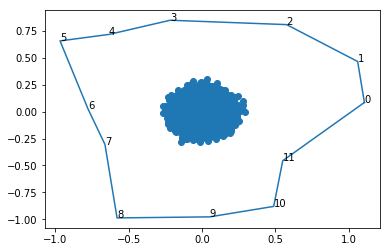

In [7]:
plot_contour(polygons[1])
plt.scatter(centers_of_mass[:,0],centers_of_mass[:,1])


In [59]:
from scipy.spatial import ConvexHull
points=centers_of_mass
hull=ConvexHull(points)
hull2=ConvexHull(coordinetes)

ValueError: setting an array element with a sequence.

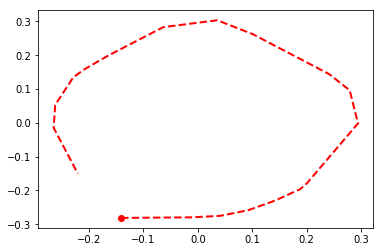

In [10]:
plt.plot(points[hull.vertices,0], points[hull.vertices,1], 'r--', lw=2)
plt.plot(points[hull.vertices[0],0], points[hull.vertices[0],1], 'ro')
plt.show()


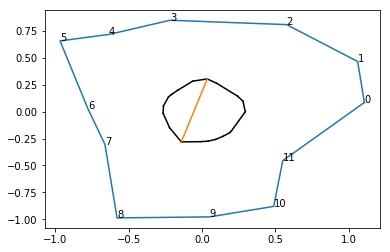

In [51]:
import matplotlib.pyplot as plt
#plt.plot(points[:,0], points[:,1], 'o')
for simplex in hull.simplices:
    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')
    
plot_contour(polygons[1])
plt.plot(maximum_distance_points[:,0],maximum_distance_points[:,1])

In [44]:
def max_element(A):
    r, (c, l) = max(map(lambda t: (t[0], max(enumerate(t[1]), key=lambda v: v[1])), enumerate(A)), key=lambda v: v[1][1])


In [45]:
distances=np.empty([convex_points.shape[0],convex_points.shape[0]])

In [46]:
for i,point_i in enumerate(convex_points):
    for j,point_j in enumerate(convex_points):
        distances[i][j]=np.linalg.norm(point_i-point_j)

In [47]:

def max_element(A):
    r, (c, l) = max(map(lambda t: (t[0], max(enumerate(t[1]), key=lambda v: v[1])), enumerate(A)), key=lambda v: v[1][1])
    return (l, r, c)

In [48]:
print(max_element(distances))

(0.6108970818704328, 0, 11)


In [49]:
maximum_distance_points=convex_points[[0,11]]

In [50]:
maximum_distance_points[:,0]

array([-0.14096254,  0.03573792])

In [40]:
convex_points[0]

array([[-0.14096254, -0.28119288],
       [-0.01221095, -0.27948367]])

In [42]:
hull.simplices[0]

array([39625, 44312], dtype=int32)

In [43]:
hull.vertices

array([39625, 44312, 46955, 43565, 23167, 51648,  2565, 35199, 57132,
       36752, 40669, 10554, 41878, 24238, 46331, 14240, 59998, 49449,
        6016], dtype=int32)

In [56]:
distances

array([[0.        , 0.12876294, 0.18186276, 0.2346043 , 0.28803067,
        0.34022975, 0.3563492 , 0.51766985, 0.56488395, 0.572125  ,
        0.59513715, 0.61089708, 0.56955435, 0.48088977, 0.44436804,
        0.42498017, 0.35559678, 0.29394538, 0.15357975],
       [0.12876294, 0.        , 0.05318997, 0.10683785, 0.16244909,
        0.2173296 , 0.23516914, 0.41405689, 0.47558579, 0.49380012,
        0.55377505, 0.58504288, 0.5649054 , 0.50230835, 0.47968357,
        0.46741069, 0.41607969, 0.36610945, 0.24546116],
       [0.18186276, 0.05318997, 0.        , 0.05435029, 0.11129925,
        0.16751133, 0.18630368, 0.37323741, 0.44138264, 0.46476403,
        0.54108039, 0.57871423, 0.56785815, 0.51683451, 0.49996913,
        0.49058265, 0.44670677, 0.40168965, 0.28991159],
       [0.2346043 , 0.10683785, 0.05435029, 0.        , 0.05757055,
        0.11447174, 0.13396626, 0.32693558, 0.40091906, 0.429178  ,
        0.52117047, 0.564912  , 0.56359452, 0.52493377, 0.51417177,
        0.507

In [2]:
polygons=load_dataset('15_polygons.pkl')

In [3]:
len(polygons)

1

In [17]:
a_list=[1,3]

In [24]:
len(points_coodinates)

81406

In [26]:
polygons.shape

(250000, 15, 2)

In [28]:
len(nb_of_points)

81406